# Predição de séries temporais da COVID-19
### Casos confirmados

Autor: Saulo Leite

Dissertação: PREDIÇÃO DE SÉRIES TEMPORAIS DA COVID-19: UMA AVALIAÇÃO DE REDES NEURAIS COM ARIMA, LSTM, MLP & ES

### Importando bibliotecas
Para a implementação desse trabalho, foram necessárias muitas bibliotecas.

In [1]:
import math
import os
import datetime
import pandas
from pandas import read_csv
from pandas import Series
from urllib.request import urlretrieve
import matplotlib.pyplot as plt
import numpy

import keras
import tensorflow.keras.backend as K
from keras.models import Sequential
from keras.layers import Dense, Dropout, LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')

from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.filters.hp_filter import hpfilter
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import SimpleExpSmoothing, Holt, ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error


### Tratamento de dados

Os dados usados neste trabalho são disponibilizados pela Universidade Johns Hopkins

In [2]:
url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv'
urlretrieve(url, 'datasets/casos_covid19.csv')
df_covid = pandas.read_csv('datasets/casos_covid19.csv')
df_covid.drop(['Lat', 'Long'], axis=1, inplace=True)
df_country = df_covid.groupby('Country/Region').sum()
df_country.loc[['Brazil', 'India', 'US', 'Italy']]
s_brazil = df_country.loc['Brazil']
s_india = df_country.loc['India']
s_us = df_country.loc['US']
s_italy = df_country.loc['Italy']

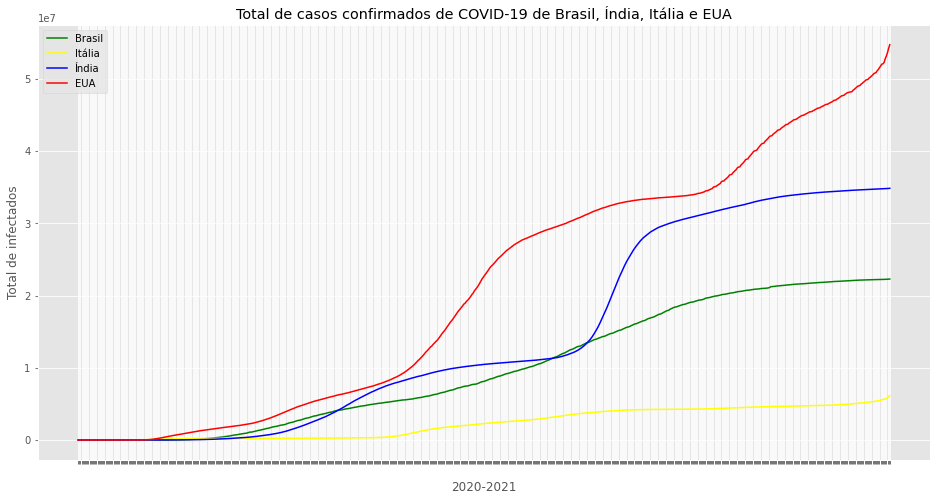

In [3]:
#Visualizando dados completos
plt.figure(figsize=(16,8))
plt.xticks(color='w')
plt.plot(s_brazil.index, s_brazil.values, label = 'Brasil', color = 'green')
plt.plot(s_us.index, s_italy.values, label = 'Itália', color = 'yellow')
plt.plot(s_india.index, s_india.values, label = 'Índia', color = 'blue')
plt.plot(s_us.index, s_us.values, label = 'EUA', color = 'red')
plt.title('Total de casos confirmados de COVID-19 de Brasil, Índia, Itália e EUA')
plt.xlabel("2020-2021")
plt.ylabel("Total de infectados")
plt.legend()
plt.show()

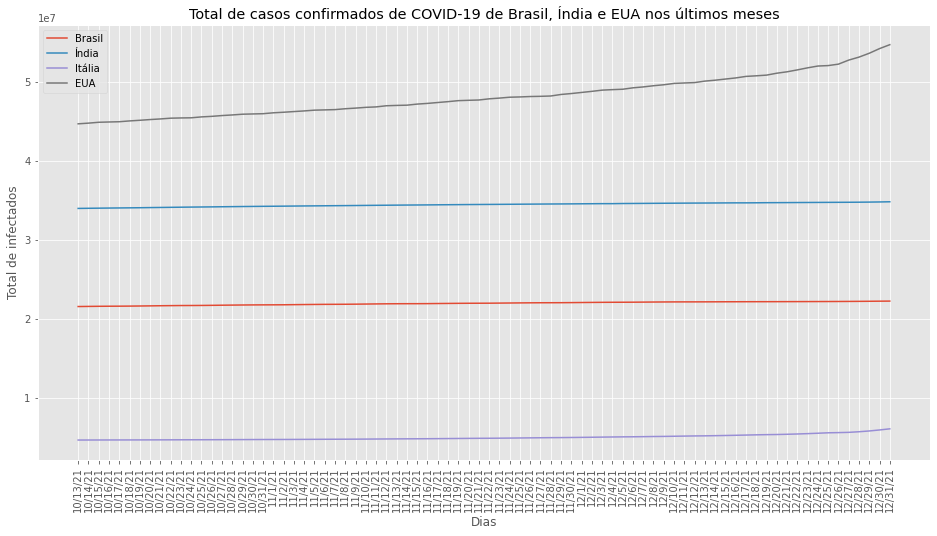

In [4]:
#Visualizando os dados em parte
tam = len(s_brazil)
plt.figure(figsize=(16,8))
plt.xticks(rotation = 90)
plt.plot(s_brazil.index[tam-80:tam], s_brazil.values[tam-80:tam], label = 'Brasil')
plt.plot(s_india.index[tam-80:tam], s_india.values[tam-80:tam], label = 'Índia')
plt.plot(s_italy.index[tam-80:tam], s_italy.values[tam-80:tam], label = 'Itália')
plt.plot(s_us.index[tam-80:tam], s_us.values[tam-80:tam], label = 'EUA')
plt.title('Total de casos confirmados de COVID-19 de Brasil, Índia, Itália e EUA nos últimos meses')
plt.xlabel("Dias")
plt.ylabel("Total de infectados")
plt.legend()
plt.show()

In [5]:
#Exportação de dados totais
#Contabilizar os dias que estão com "zero casos"
#Estudar caso de inputação baysiana
s_brazil = s_brazil[s_brazil > 0]
s_india = s_india[s_india > 0]
s_italy = s_italy[s_italy > 0]
s_us = s_us[s_us > 0]
s_brazil.to_csv('datasets/countries/casos_covid19_brazil.csv')
s_india.to_csv('datasets/countries/casos_covid19_india.csv')
s_italy.to_csv('datasets/countries/casos_covid19_italy.csv')
s_us.to_csv('datasets/countries/casos_covid19_us.csv')

# Implementação dos modelos LSTM e MLP



In [6]:
# converter uma matriz de valores em uma matriz de conjunto de dados
def create_dataset(dataset, look_back=1):
	dataX, dataY = [], []
	for i in range(len(dataset)-look_back-1):
		a = dataset[i:(i+look_back), 0]
		dataX.append(a)
		dataY.append(dataset[i + look_back, 0])
	return numpy.array(dataX), numpy.array(dataY)

In [7]:
country = ['Brasil', 'Índia', 'Itália', 'EUA'] #Lista de países

#Grid Search
T_A = [0.01, 0.05, 0.1, 0.2] #0.01, 0.02, 0,03, 0.06, 0.1, 0.2; 
DROP = [0.01, 0.05, 0.1, 0.2]   #0.05, 0.1, 0.15, 0.2, 0.3, 0.5;
N_C = [200, 300, 400, 600]    #50, 100, 200, 300, 400, 600;
NPC = [8, 16, 32, 64] #Neurônios por camada

#Dicionários LSMT
dts = {} #Dicionário de datasets 
trpp = {} #Dicionário de treinos
tspp = {} #Dicionário de testes
trs = {} #Dicionário de scores de treinos 
tss = {} #Dicionário de scores de testes
tsm = {} #Dicionário de MAES

#Valores selecionados (Melhores valores)
strpp = {} #Dicionário de treinos
stspp = {} #Dicionário de testes
strs = {} #Dicionário de scores de treinos 
stss = {'Brasil':(9**15), 'Índia':(9**15), 'EUA':(9**15),'Itália':(9**15)} #Dicionário de scores de testes
stsm = {'Brasil':(9**15), 'Índia':(9**15), 'EUA':(9**15),'Itália':(9**15)} #Dicionário de MAE's Saída

#Dicionários MLP
dtsMLP = {} #Dicionário de datasets 
trppMLP = {} #Dicionário de treinos
tsppMLP = {} #Dicionário de testes
trsMLP = {} #Dicionário de scores de treinos 
tssMLP = {} #Dicionário de scores de testes
t_aMLP = {} #Dicionário de taxa de aprendizagem
tsmMLP = {} #Dicionário de MAES

#Valores selecionados (Melhores valores)
strppMLP = {} #Dicionário de treinos
stsppMLP = {} #Dicionário de testes
strsMLP = {} #Dicionário de scores de treinos 
stssMLP = {'Brasil':(9**15), 'Índia':(9**15), 'EUA':(9**15),'Itália':(9**15)} #Dicionário de scores de testes
stsmMLP = {'Brasil':(9**15), 'Índia':(9**15), 'EUA':(9**15),'Itália':(9**15)} #Dicionário de MAE's Saída

st_aMLP = {} #Dicionário de taxa de aprendizagem saída

#Ajustes para seleção LSTM
t_a = {} #Dicionário de taxa de aprendizagem
dropout = {} #Dicionário de dropout
n_cel = {} #Dicionário de número de células
st_a = {} #Dicionário de taxa de aprendizagem saída
sdropout = {} #Dicionário de dropout saída
sn_cel = {} #Dicionário de número de células saída

#Ajustes para seleção MLP
t_a = {} #Dicionário de taxa de aprendizagem
dropoutMLP = {} #Dicionário de dropout
n_neu = {} #Dicionário de número de neurônios
st_aMLP = {} #Dicionário de taxa de aprendizagem saída
sdropoutMLP = {} #Dicionário de dropout saída
sn_neu = {} #Dicionário de número de neurônios

for i in range(len(country)):
    for z in range(len(T_A)):
        for j in range(len(DROP)):
            for k in range(len(N_C)):
                if country[i] == 'Brasil':
                    dataframe = read_csv('datasets/countries/casos_covid19_brazil.csv', usecols=[1], engine='python')
                    dataset = dataframe.values
                    dataset = dataset.astype('float32')
                if country[i] == 'Índia':
                    dataframe = read_csv('datasets/countries/casos_covid19_india.csv', usecols=[1], engine='python')
                    dataset = dataframe.values
                    dataset = dataset.astype('float32')
                if country[i] == 'Itália':
                    dataframe = read_csv('datasets/countries/casos_covid19_italy.csv', usecols=[1], engine='python')
                    dataset = dataframe.values
                    dataset = dataset.astype('float32')
                if country[i] == 'EUA':
                    dataframe = read_csv('datasets/countries/casos_covid19_us.csv', usecols=[1], engine='python')
                    dataset = dataframe.values
                    dataset = dataset.astype('float32')
                
                #LSTM
                
                # Normalizar o dataset
                scaler = MinMaxScaler(feature_range=(0, 1))
                dataset = scaler.fit_transform(dataset)
                # dividir em conjuntos de treinamento e teste
                train_size = int(len(dataset) * 0.67)
                test_size = len(dataset) - train_size
                train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
                # remodelar em X = t e Y = t + 1
                look_back = 1
                trainX, trainY = create_dataset(train, look_back)
                testX, testY = create_dataset(test, look_back)
                # remodelar a entrada para ser [amostras, intervalos de tempo, recursos]
                trainX = numpy.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
                testX = numpy.reshape(testX, (testX.shape[0], 1, testX.shape[1]))
                #Criando modelo
                model = Sequential()
                keras.backend.set_epsilon(1)
                #Adicionando camada LSTM e alguma regularização de Dropout 
                model.add(LSTM(units=int(N_C[k])))
                model.add(Dropout(float(DROP[j])))
                model.add(Dense(units=1, activation='linear'))
                #definindo hiper parâmetros
                adam = keras.optimizers.Adam(learning_rate=float(T_A[z]), beta_1=0.999, beta_2=0.999, amsgrad=False)
                model.compile(loss='mean_squared_error', optimizer='adam')
                model.fit(trainX, trainY, epochs=200, batch_size=40) #Mudar para 300 épocas - fora do grid search
                #fazer previsões
                trainPredict = model.predict(trainX)
                testPredict = model.predict(testX)
                # inverter previsões
                trainPredict = scaler.inverse_transform(trainPredict)
                trainY = scaler.inverse_transform([trainY])
                testPredict = scaler.inverse_transform(testPredict)
                testY = scaler.inverse_transform([testY])
                # calcular raiz quadrada média do erro
                trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
                print('Train Score: %.2f RMSE' % (trainScore))
                testScore = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
                print('Test Score: %.2f RMSE' % (testScore))
                #Calcular o MAE:
                MAE = mean_absolute_error(testY[0], testPredict[:,0])
                # mudar para treinar previsões para traçar
                trainPredictPlot = numpy.empty_like(dataset)
                trainPredictPlot[:, :] = numpy.nan
                trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
                # previsões de teste de deslocamento para plotagem
                testPredictPlot = numpy.empty_like(dataset)
                testPredictPlot[:, :] = numpy.nan
                testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict
                
                #MLP
                train_size = int(len(dataset) * 0.67)
                test_size = len(dataset) - train_size
                train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
                # remodelar em X = t e Y = t + 1
                look_back = 1
                trainX, trainY = create_dataset(train, look_back)
                testX, testY = create_dataset(test, look_back)
                # remodelar a entrada para ser [amostras, intervalos de tempo, recursos]
                trainX = numpy.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
                testX = numpy.reshape(testX, (testX.shape[0], 1, testX.shape[1]))
                model = Sequential()
                model.add(Dense(NPC[i], activation='sigmoid', input_dim = 1))
                model.add(Dropout(float(DROP[j])))
                model.add(Dense(NPC[i], activation='tanh'))
                model.add(Dropout(float(DROP[j])))
                model.add(Dense(NPC[i], activation='relu'))
                model.add(Dropout(float(DROP[j])))
                model.add(Dense(1))
                adam = keras.optimizers.Adam(learning_rate=float(T_A[z]))
                model.compile(optimizer=adam , loss='mean_squared_error')
                model.fit(trainX, trainY, epochs=200, batch_size = 40)
                #fazer previsões
                trainPredictMLP = model.predict(trainX)
                testPredictMLP = model.predict(testX)
                # inverter previsões
                trainPredictMLP = scaler.inverse_transform(trainPredictMLP)
                trainY = scaler.inverse_transform([trainY])
                testPredictMLP = scaler.inverse_transform(testPredictMLP)
                testY = scaler.inverse_transform([testY])
                # calcular raiz quadrada média do erro
                trainScoreMLP = math.sqrt(mean_squared_error(trainY[0], trainPredictMLP[:,0]))
                print('Train Score MLP: %.2f RMSE' % (trainScoreMLP))
                testScoreMLP = math.sqrt(mean_squared_error(testY[0], testPredictMLP[:,0]))
                print('Test Score MLP: %.2f RMSE' % (testScoreMLP))
                #Calcular o MAE:
                MAEMLP = mean_absolute_error(testY[0], testPredictMLP[:,0])
                # mudar para treinar previsões para traçar
                trainPredictPlotMLP = numpy.empty_like(dataset)
                trainPredictPlotMLP[:, :] = numpy.nan
                trainPredictPlotMLP[look_back:len(trainPredict)+look_back, :] = trainPredict
                # previsões de teste de deslocamento para plotagem
                testPredictPlotMLP = numpy.empty_like(dataset)
                testPredictPlotMLP[:, :] = numpy.nan
                testPredictPlotMLP[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


                #Armazenando as informações em dicionários LSTM
                tss[country[i]] = testScore
                tsm[country[i]] = MAE
                trpp[country[i]] = trainPredictPlot
                tspp[country[i]] = testPredictPlot
                trs[country[i]] = trainScore
                dts[country[i]] = scaler.inverse_transform(dataset)
                t_a[country[i]] = T_A[z]
                dropout[country[i]] = DROP[j]
                n_cel[country[i]] = N_C[k]
                tsm[country[i]] = MAE
                if tss[country[i]] < stss[country[i]]: #Condição de verificação dos melhores resultados
                    strpp[country[i]] = trainPredictPlot
                    stspp[country[i]] = testPredictPlot
                    strs[country[i]] = trainScore
                    stss[country[i]] = testScore
                    st_a[country[i]] = T_A[z]
                    sdropout[country[i]] = DROP[j]
                    sn_cel[country[i]] = N_C[k]
                    stsm[country[i]] = MAE
                    
                #Armazenando as informações em dicionários MLP
                tssMLP[country[i]] = testScoreMLP
                trppMLP[country[i]] = trainPredictPlotMLP
                tsppMLP[country[i]] = testPredictPlotMLP
                trsMLP[country[i]] = trainScoreMLP
                t_aMLP[country[i]] = T_A[z]
                dropoutMLP[country[i]] = DROP[j]
                n_neu[country[i]] = NPC[i]
                tsmMLP[country[i]] = MAEMLP
                
                if tssMLP[country[i]] < stssMLP[country[i]]: #Condição de verificação dos melhores resultados
                    strppMLP[country[i]] = trainPredictPlotMLP
                    stsppMLP[country[i]] = testPredictPlotMLP
                    strsMLP[country[i]] = trainScoreMLP
                    stssMLP[country[i]] = testScoreMLP
                    st_aMLP[country[i]] = T_A[z]
                    sdropoutMLP[country[i]] = DROP[j]
                    sn_neu[country[i]] = NPC[i]
                    stsmMLP[country[i]] = MAEMLP

Epoch 1/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0867
Epoch 2/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0534
Epoch 3/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0313
Epoch 4/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0235
Epoch 5/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0210
Epoch 6/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0175
Epoch 7/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0143
Epoch 8/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0113
Epoch 9/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0083
Epoch 10/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0057
Epoch 11/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0036
Epoch 12/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0020
Epoch 13/200
12/12 [=================

12/12 [==============================] - 0s 2ms/step - loss: 1.7144e-05
Epoch 99/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6107e-05
Epoch 100/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5760e-05
Epoch 101/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7218e-05
Epoch 102/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6486e-05
Epoch 103/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6596e-05
Epoch 104/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6140e-05
Epoch 105/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3822e-05
Epoch 106/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5785e-05
Epoch 107/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4174e-05
Epoch 108/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6384e-05
Epoch 109/200
12/12 [==============================] - 0s 2ms/step - 

12/12 [==============================] - 0s 2ms/step - loss: 7.3343e-06
Epoch 194/200
12/12 [==============================] - 0s 2ms/step - loss: 8.6109e-06
Epoch 195/200
12/12 [==============================] - 0s 2ms/step - loss: 9.1722e-06
Epoch 196/200
12/12 [==============================] - 0s 2ms/step - loss: 9.2026e-06
Epoch 197/200
12/12 [==============================] - 0s 2ms/step - loss: 8.7240e-06
Epoch 198/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1715e-05
Epoch 199/200
12/12 [==============================] - 0s 2ms/step - loss: 8.7331e-06
Epoch 200/200
12/12 [==============================] - 0s 2ms/step - loss: 9.7194e-06
Train Score: 31010.05 RMSE
Test Score: 56160.71 RMSE
Epoch 1/200
12/12 [==============================] - 0s 865us/step - loss: 0.1754
Epoch 2/200
12/12 [==============================] - 0s 671us/step - loss: 0.0567
Epoch 3/200
12/12 [==============================] - 0s 612us/step - loss: 0.0485
Epoch 4/200
12/12 [========

12/12 [==============================] - 0s 633us/step - loss: 0.0022
Epoch 92/200
12/12 [==============================] - 0s 582us/step - loss: 0.0033
Epoch 93/200
12/12 [==============================] - 0s 647us/step - loss: 0.0035
Epoch 94/200
12/12 [==============================] - 0s 634us/step - loss: 0.0020
Epoch 95/200
12/12 [==============================] - 0s 503us/step - loss: 0.0013
Epoch 96/200
12/12 [==============================] - 0s 823us/step - loss: 0.0026
Epoch 97/200
12/12 [==============================] - 0s 748us/step - loss: 0.0023
Epoch 98/200
12/12 [==============================] - 0s 626us/step - loss: 0.0033
Epoch 99/200
12/12 [==============================] - 0s 661us/step - loss: 0.0026
Epoch 100/200
12/12 [==============================] - 0s 499us/step - loss: 0.0019
Epoch 101/200
12/12 [==============================] - 0s 695us/step - loss: 0.0018
Epoch 102/200
12/12 [==============================] - 0s 748us/step - loss: 0.0019
Epoch 103/200


12/12 [==============================] - 0s 603us/step - loss: 0.0017
Epoch 189/200
12/12 [==============================] - 0s 582us/step - loss: 9.9484e-04
Epoch 190/200
12/12 [==============================] - 0s 582us/step - loss: 7.5164e-04
Epoch 191/200
12/12 [==============================] - 0s 654us/step - loss: 0.0018
Epoch 192/200
12/12 [==============================] - 0s 665us/step - loss: 0.0015
Epoch 193/200
12/12 [==============================] - 0s 587us/step - loss: 7.6183e-04
Epoch 194/200
12/12 [==============================] - 0s 748us/step - loss: 0.0028
Epoch 195/200
12/12 [==============================] - 0s 631us/step - loss: 0.0031
Epoch 196/200
12/12 [==============================] - 0s 634us/step - loss: 0.0011
Epoch 197/200
12/12 [==============================] - 0s 582us/step - loss: 0.0017
Epoch 198/200
12/12 [==============================] - 0s 638us/step - loss: 0.0023
Epoch 199/200
12/12 [==============================] - 0s 665us/step - loss: 0

12/12 [==============================] - 0s 4ms/step - loss: 1.4307e-05
Epoch 85/200
12/12 [==============================] - 0s 4ms/step - loss: 1.4084e-05
Epoch 86/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3479e-05
Epoch 87/200
12/12 [==============================] - 0s 4ms/step - loss: 1.4941e-05
Epoch 88/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3085e-05
Epoch 89/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3086e-05
Epoch 90/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2647e-05
Epoch 91/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1807e-05
Epoch 92/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3911e-05
Epoch 93/200
12/12 [==============================] - 0s 4ms/step - loss: 1.4631e-05
Epoch 94/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3369e-05
Epoch 95/200
12/12 [==============================] - 0s 4ms/step - loss: 1.23

12/12 [==============================] - 0s 4ms/step - loss: 8.5099e-06
Epoch 180/200
12/12 [==============================] - 0s 4ms/step - loss: 6.8609e-06
Epoch 181/200
12/12 [==============================] - 0s 4ms/step - loss: 8.2617e-06
Epoch 182/200
12/12 [==============================] - 0s 4ms/step - loss: 7.1886e-06
Epoch 183/200
12/12 [==============================] - 0s 4ms/step - loss: 6.9702e-06
Epoch 184/200
12/12 [==============================] - 0s 4ms/step - loss: 7.6079e-06
Epoch 185/200
12/12 [==============================] - 0s 4ms/step - loss: 6.9098e-06
Epoch 186/200
12/12 [==============================] - 0s 4ms/step - loss: 8.2986e-06
Epoch 187/200
12/12 [==============================] - 0s 4ms/step - loss: 7.2854e-06
Epoch 188/200
12/12 [==============================] - 0s 4ms/step - loss: 6.8485e-06
Epoch 189/200
12/12 [==============================] - 0s 4ms/step - loss: 6.0305e-06
Epoch 190/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 834us/step - loss: 8.5305e-04
Epoch 77/200
12/12 [==============================] - 0s 748us/step - loss: 0.0012
Epoch 78/200
12/12 [==============================] - 0s 831us/step - loss: 0.0013
Epoch 79/200
12/12 [==============================] - 0s 864us/step - loss: 9.3742e-04
Epoch 80/200
12/12 [==============================] - 0s 866us/step - loss: 0.0012
Epoch 81/200
12/12 [==============================] - 0s 798us/step - loss: 9.6019e-04
Epoch 82/200
12/12 [==============================] - 0s 804us/step - loss: 6.6561e-04
Epoch 83/200
12/12 [==============================] - 0s 732us/step - loss: 8.0452e-04
Epoch 84/200
12/12 [==============================] - 0s 857us/step - loss: 6.2044e-04
Epoch 85/200
12/12 [==============================] - 0s 890us/step - loss: 7.3444e-04
Epoch 86/200
12/12 [==============================] - 0s 838us/step - loss: 9.4632e-04
Epoch 87/200
12/12 [==============================] - 0s 715us/step 

12/12 [==============================] - 0s 914us/step - loss: 3.9274e-04
Epoch 171/200
12/12 [==============================] - 0s 831us/step - loss: 6.3220e-04
Epoch 172/200
12/12 [==============================] - 0s 903us/step - loss: 5.6113e-04
Epoch 173/200
12/12 [==============================] - 0s 810us/step - loss: 5.6626e-04
Epoch 174/200
12/12 [==============================] - 0s 883us/step - loss: 4.8693e-04
Epoch 175/200
12/12 [==============================] - 0s 732us/step - loss: 4.9897e-04
Epoch 176/200
12/12 [==============================] - 0s 776us/step - loss: 6.8981e-04
Epoch 177/200
12/12 [==============================] - 0s 815us/step - loss: 3.5650e-04
Epoch 178/200
12/12 [==============================] - 0s 748us/step - loss: 5.7639e-04
Epoch 179/200
12/12 [==============================] - 0s 701us/step - loss: 4.3096e-04
Epoch 180/200
12/12 [==============================] - 0s 799us/step - loss: 4.1974e-04
Epoch 181/200
12/12 [=========================

12/12 [==============================] - 0s 6ms/step - loss: 1.2128e-05
Epoch 66/200
12/12 [==============================] - 0s 6ms/step - loss: 1.1699e-05
Epoch 67/200
12/12 [==============================] - 0s 6ms/step - loss: 1.0925e-05
Epoch 68/200
12/12 [==============================] - 0s 6ms/step - loss: 1.1173e-05
Epoch 69/200
12/12 [==============================] - 0s 6ms/step - loss: 1.0948e-05
Epoch 70/200
12/12 [==============================] - 0s 6ms/step - loss: 1.2061e-05
Epoch 71/200
12/12 [==============================] - 0s 6ms/step - loss: 1.0923e-05
Epoch 72/200
12/12 [==============================] - 0s 6ms/step - loss: 1.1281e-05
Epoch 73/200
12/12 [==============================] - 0s 6ms/step - loss: 8.2768e-06
Epoch 74/200
12/12 [==============================] - 0s 6ms/step - loss: 1.0753e-05
Epoch 75/200
12/12 [==============================] - 0s 6ms/step - loss: 9.8767e-06
Epoch 76/200
12/12 [==============================] - 0s 6ms/step - loss: 1.00

12/12 [==============================] - 0s 6ms/step - loss: 5.7442e-06
Epoch 161/200
12/12 [==============================] - 0s 6ms/step - loss: 4.3634e-06
Epoch 162/200
12/12 [==============================] - 0s 6ms/step - loss: 5.5476e-06
Epoch 163/200
12/12 [==============================] - 0s 6ms/step - loss: 5.3900e-06
Epoch 164/200
12/12 [==============================] - 0s 6ms/step - loss: 6.0275e-06
Epoch 165/200
12/12 [==============================] - 0s 6ms/step - loss: 4.7691e-06
Epoch 166/200
12/12 [==============================] - 0s 6ms/step - loss: 5.7304e-06
Epoch 167/200
12/12 [==============================] - 0s 6ms/step - loss: 5.4195e-06
Epoch 168/200
12/12 [==============================] - 0s 6ms/step - loss: 5.9346e-06
Epoch 169/200
12/12 [==============================] - 0s 6ms/step - loss: 4.5164e-06
Epoch 170/200
12/12 [==============================] - 0s 6ms/step - loss: 5.6292e-06
Epoch 171/200
12/12 [==============================] - 0s 6ms/step -

12/12 [==============================] - 0s 918us/step - loss: 0.0023
Epoch 57/200
12/12 [==============================] - 0s 831us/step - loss: 0.0022
Epoch 58/200
12/12 [==============================] - 0s 707us/step - loss: 0.0018
Epoch 59/200
12/12 [==============================] - 0s 887us/step - loss: 0.0022
Epoch 60/200
12/12 [==============================] - 0s 868us/step - loss: 0.0022
Epoch 61/200
12/12 [==============================] - 0s 755us/step - loss: 0.0014
Epoch 62/200
12/12 [==============================] - 0s 809us/step - loss: 0.0026
Epoch 63/200
12/12 [==============================] - 0s 925us/step - loss: 0.0017
Epoch 64/200
12/12 [==============================] - 0s 831us/step - loss: 0.0016
Epoch 65/200
12/12 [==============================] - 0s 814us/step - loss: 0.0015
Epoch 66/200
12/12 [==============================] - 0s 752us/step - loss: 0.0016
Epoch 67/200
12/12 [==============================] - 0s 819us/step - loss: 0.0015
Epoch 68/200
12/1

12/12 [==============================] - 0s 758us/step - loss: 4.9048e-04
Epoch 152/200
12/12 [==============================] - 0s 780us/step - loss: 3.3144e-04
Epoch 153/200
12/12 [==============================] - 0s 843us/step - loss: 3.3062e-04
Epoch 154/200
12/12 [==============================] - 0s 805us/step - loss: 3.1950e-04
Epoch 155/200
12/12 [==============================] - 0s 748us/step - loss: 3.5792e-04
Epoch 156/200
12/12 [==============================] - 0s 870us/step - loss: 5.5182e-04
Epoch 157/200
12/12 [==============================] - 0s 837us/step - loss: 3.5493e-04
Epoch 158/200
12/12 [==============================] - 0s 709us/step - loss: 4.3782e-04
Epoch 159/200
12/12 [==============================] - 0s 623us/step - loss: 4.3307e-04
Epoch 160/200
12/12 [==============================] - 0s 865us/step - loss: 4.2238e-04
Epoch 161/200
12/12 [==============================] - 0s 850us/step - loss: 5.6093e-04
Epoch 162/200
12/12 [=========================

12/12 [==============================] - 0s 10ms/step - loss: 1.0462e-05
Epoch 46/200
12/12 [==============================] - 0s 10ms/step - loss: 9.8680e-06
Epoch 47/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0654e-05
Epoch 48/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0150e-05
Epoch 49/200
12/12 [==============================] - 0s 10ms/step - loss: 9.3647e-06
Epoch 50/200
12/12 [==============================] - 0s 10ms/step - loss: 9.5887e-06
Epoch 51/200
12/12 [==============================] - 0s 10ms/step - loss: 9.7479e-06
Epoch 52/200
12/12 [==============================] - 0s 10ms/step - loss: 9.8543e-06
Epoch 53/200
12/12 [==============================] - 0s 10ms/step - loss: 9.8409e-06
Epoch 54/200
12/12 [==============================] - 0s 10ms/step - loss: 9.0192e-06
Epoch 55/200
12/12 [==============================] - 0s 10ms/step - loss: 9.0867e-06
Epoch 56/200
12/12 [==============================] - 0s 10ms/step 

Epoch 140/200
12/12 [==============================] - 0s 10ms/step - loss: 4.0965e-06
Epoch 141/200
12/12 [==============================] - 0s 10ms/step - loss: 3.6157e-06
Epoch 142/200
12/12 [==============================] - 0s 10ms/step - loss: 4.3542e-06
Epoch 143/200
12/12 [==============================] - 0s 11ms/step - loss: 4.0020e-06
Epoch 144/200
12/12 [==============================] - 0s 10ms/step - loss: 5.0603e-06
Epoch 145/200
12/12 [==============================] - 0s 10ms/step - loss: 5.1119e-06
Epoch 146/200
12/12 [==============================] - 0s 10ms/step - loss: 4.3624e-06
Epoch 147/200
12/12 [==============================] - 0s 10ms/step - loss: 4.8444e-06
Epoch 148/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4727e-06
Epoch 149/200
12/12 [==============================] - 0s 10ms/step - loss: 4.1284e-06
Epoch 150/200
12/12 [==============================] - 0s 10ms/step - loss: 3.8134e-06
Epoch 151/200
12/12 [=======================

12/12 [==============================] - 0s 738us/step - loss: 0.0035
Epoch 36/200
12/12 [==============================] - 0s 748us/step - loss: 0.0031
Epoch 37/200
12/12 [==============================] - 0s 665us/step - loss: 0.0034
Epoch 38/200
12/12 [==============================] - 0s 651us/step - loss: 0.0031
Epoch 39/200
12/12 [==============================] - 0s 783us/step - loss: 0.0032
Epoch 40/200
12/12 [==============================] - 0s 831us/step - loss: 0.0026
Epoch 41/200
12/12 [==============================] - 0s 797us/step - loss: 0.0025
Epoch 42/200
12/12 [==============================] - 0s 751us/step - loss: 0.0024
Epoch 43/200
12/12 [==============================] - 0s 748us/step - loss: 0.0020
Epoch 44/200
12/12 [==============================] - 0s 646us/step - loss: 0.0031
Epoch 45/200
12/12 [==============================] - 0s 839us/step - loss: 0.0022
Epoch 46/200
12/12 [==============================] - 0s 748us/step - loss: 0.0021
Epoch 47/200
12/1

12/12 [==============================] - 0s 748us/step - loss: 5.7139e-04
Epoch 131/200
12/12 [==============================] - 0s 896us/step - loss: 7.5505e-04
Epoch 132/200
12/12 [==============================] - 0s 914us/step - loss: 3.2116e-04
Epoch 133/200
12/12 [==============================] - 0s 831us/step - loss: 5.5209e-04
Epoch 134/200
12/12 [==============================] - 0s 665us/step - loss: 3.7940e-04
Epoch 135/200
12/12 [==============================] - 0s 695us/step - loss: 5.3020e-04
Epoch 136/200
12/12 [==============================] - 0s 803us/step - loss: 3.0064e-04
Epoch 137/200
12/12 [==============================] - 0s 804us/step - loss: 4.6834e-04
Epoch 138/200
12/12 [==============================] - 0s 793us/step - loss: 5.5910e-04
Epoch 139/200
12/12 [==============================] - 0s 748us/step - loss: 5.4759e-04
Epoch 140/200
12/12 [==============================] - 0s 678us/step - loss: 3.9649e-04
Epoch 141/200
12/12 [=========================

12/12 [==============================] - 0s 2ms/step - loss: 6.9864e-05
Epoch 25/200
12/12 [==============================] - 0s 2ms/step - loss: 6.6512e-05
Epoch 26/200
12/12 [==============================] - 0s 2ms/step - loss: 7.5101e-05
Epoch 27/200
12/12 [==============================] - 0s 2ms/step - loss: 8.2571e-05
Epoch 28/200
12/12 [==============================] - 0s 2ms/step - loss: 6.8052e-05
Epoch 29/200
12/12 [==============================] - 0s 2ms/step - loss: 7.9087e-05
Epoch 30/200
12/12 [==============================] - 0s 2ms/step - loss: 7.0470e-05
Epoch 31/200
12/12 [==============================] - 0s 2ms/step - loss: 7.3028e-05
Epoch 32/200
12/12 [==============================] - 0s 2ms/step - loss: 8.4224e-05
Epoch 33/200
12/12 [==============================] - 0s 2ms/step - loss: 8.1443e-05
Epoch 34/200
12/12 [==============================] - 0s 2ms/step - loss: 6.9912e-05
Epoch 35/200
12/12 [==============================] - 0s 2ms/step - loss: 6.63

12/12 [==============================] - 0s 2ms/step - loss: 4.9257e-05
Epoch 121/200
12/12 [==============================] - 0s 2ms/step - loss: 3.9544e-05
Epoch 122/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8769e-05
Epoch 123/200
12/12 [==============================] - 0s 2ms/step - loss: 4.6474e-05
Epoch 124/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8736e-05
Epoch 125/200
12/12 [==============================] - 0s 2ms/step - loss: 4.9840e-05
Epoch 126/200
12/12 [==============================] - 0s 2ms/step - loss: 4.9364e-05
Epoch 127/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8195e-05
Epoch 128/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2836e-05
Epoch 129/200
12/12 [==============================] - 0s 2ms/step - loss: 4.6310e-05
Epoch 130/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8598e-05
Epoch 131/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 662us/step - loss: 0.0107
Epoch 16/200
12/12 [==============================] - 0s 579us/step - loss: 0.0083
Epoch 17/200
12/12 [==============================] - 0s 665us/step - loss: 0.0083
Epoch 18/200
12/12 [==============================] - 0s 665us/step - loss: 0.0088
Epoch 19/200
12/12 [==============================] - 0s 582us/step - loss: 0.0058
Epoch 20/200
12/12 [==============================] - 0s 779us/step - loss: 0.0069
Epoch 21/200
12/12 [==============================] - 0s 663us/step - loss: 0.0092
Epoch 22/200
12/12 [==============================] - 0s 697us/step - loss: 0.0065
Epoch 23/200
12/12 [==============================] - 0s 665us/step - loss: 0.0074
Epoch 24/200
12/12 [==============================] - 0s 690us/step - loss: 0.0079
Epoch 25/200
12/12 [==============================] - 0s 690us/step - loss: 0.0069
Epoch 26/200
12/12 [==============================] - 0s 686us/step - loss: 0.0063
Epoch 27/200
12/1

12/12 [==============================] - 0s 860us/step - loss: 0.0038
Epoch 114/200
12/12 [==============================] - 0s 881us/step - loss: 0.0033
Epoch 115/200
12/12 [==============================] - 0s 758us/step - loss: 0.0032
Epoch 116/200
12/12 [==============================] - 0s 831us/step - loss: 0.0029
Epoch 117/200
12/12 [==============================] - 0s 914us/step - loss: 0.0026
Epoch 118/200
12/12 [==============================] - 0s 834us/step - loss: 0.0024
Epoch 119/200
12/12 [==============================] - 0s 749us/step - loss: 0.0027
Epoch 120/200
12/12 [==============================] - 0s 883us/step - loss: 0.0027
Epoch 121/200
12/12 [==============================] - 0s 831us/step - loss: 0.0024
Epoch 122/200
12/12 [==============================] - 0s 655us/step - loss: 0.0025
Epoch 123/200
12/12 [==============================] - 0s 748us/step - loss: 0.0031
Epoch 124/200
12/12 [==============================] - 0s 752us/step - loss: 0.0030
Epoch 

12/12 [==============================] - 0s 4ms/step - loss: 0.0029
Epoch 11/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0014
Epoch 12/200
12/12 [==============================] - 0s 4ms/step - loss: 5.1659e-04
Epoch 13/200
12/12 [==============================] - 0s 4ms/step - loss: 1.4886e-04
Epoch 14/200
12/12 [==============================] - 0s 4ms/step - loss: 6.1840e-05
Epoch 15/200
12/12 [==============================] - 0s 4ms/step - loss: 4.9392e-05
Epoch 16/200
12/12 [==============================] - 0s 4ms/step - loss: 4.7048e-05
Epoch 17/200
12/12 [==============================] - 0s 4ms/step - loss: 5.0772e-05
Epoch 18/200
12/12 [==============================] - 0s 4ms/step - loss: 4.9152e-05
Epoch 19/200
12/12 [==============================] - 0s 4ms/step - loss: 4.7647e-05
Epoch 20/200
12/12 [==============================] - 0s 4ms/step - loss: 5.3089e-05
Epoch 21/200
12/12 [==============================] - 0s 4ms/step - loss: 5.3280e-05
E

12/12 [==============================] - 0s 4ms/step - loss: 3.0405e-05
Epoch 107/200
12/12 [==============================] - 0s 4ms/step - loss: 4.0886e-05
Epoch 108/200
12/12 [==============================] - 0s 4ms/step - loss: 3.3177e-05
Epoch 109/200
12/12 [==============================] - 0s 4ms/step - loss: 2.8748e-05
Epoch 110/200
12/12 [==============================] - 0s 4ms/step - loss: 3.9070e-05
Epoch 111/200
12/12 [==============================] - 0s 4ms/step - loss: 3.2545e-05
Epoch 112/200
12/12 [==============================] - 0s 4ms/step - loss: 3.0590e-05
Epoch 113/200
12/12 [==============================] - 0s 4ms/step - loss: 3.3863e-05
Epoch 114/200
12/12 [==============================] - 0s 4ms/step - loss: 2.9652e-05
Epoch 115/200
12/12 [==============================] - 0s 4ms/step - loss: 3.9218e-05
Epoch 116/200
12/12 [==============================] - 0s 4ms/step - loss: 3.0399e-05
Epoch 117/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.5880
Epoch 2/200
12/12 [==============================] - 0s 642us/step - loss: 0.0681
Epoch 3/200
12/12 [==============================] - 0s 665us/step - loss: 0.0507
Epoch 4/200
12/12 [==============================] - 0s 579us/step - loss: 0.0471
Epoch 5/200
12/12 [==============================] - 0s 665us/step - loss: 0.0459
Epoch 6/200
12/12 [==============================] - 0s 579us/step - loss: 0.0456
Epoch 7/200
12/12 [==============================] - 0s 582us/step - loss: 0.0455
Epoch 8/200
12/12 [==============================] - 0s 745us/step - loss: 0.0453
Epoch 9/200
12/12 [==============================] - 0s 654us/step - loss: 0.0454
Epoch 10/200
12/12 [==============================] - 0s 665us/step - loss: 0.0453
Epoch 11/200
12/12 [==============================] - 0s 582us/step - loss: 0.0454
Epoch 12/200
12/12 [==============================] - 0s 668us/step - loss: 0.0453
Epoch 13/200
12/12 [=======

Epoch 100/200
12/12 [==============================] - 0s 914us/step - loss: 0.0065
Epoch 101/200
12/12 [==============================] - 0s 748us/step - loss: 0.0070
Epoch 102/200
12/12 [==============================] - 0s 748us/step - loss: 0.0070
Epoch 103/200
12/12 [==============================] - 0s 736us/step - loss: 0.0070
Epoch 104/200
12/12 [==============================] - 0s 936us/step - loss: 0.0065
Epoch 105/200
12/12 [==============================] - 0s 748us/step - loss: 0.0070
Epoch 106/200
12/12 [==============================] - 0s 693us/step - loss: 0.0056
Epoch 107/200
12/12 [==============================] - 0s 831us/step - loss: 0.0057
Epoch 108/200
12/12 [==============================] - 0s 831us/step - loss: 0.0068
Epoch 109/200
12/12 [==============================] - 0s 762us/step - loss: 0.0064
Epoch 110/200
12/12 [==============================] - 0s 797us/step - loss: 0.0057
Epoch 111/200
12/12 [==============================] - 0s 751us/step - loss:

12/12 [==============================] - 0s 905us/step - loss: 0.0038
Epoch 198/200
12/12 [==============================] - 0s 831us/step - loss: 0.0054
Epoch 199/200
12/12 [==============================] - 0s 810us/step - loss: 0.0043
Epoch 200/200
12/12 [==============================] - 0s 828us/step - loss: 0.0042
Train Score MLP: 531541.33 RMSE
Test Score MLP: 3840950.61 RMSE
Epoch 1/200
12/12 [==============================] - 0s 7ms/step - loss: 0.0828
Epoch 2/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0405
Epoch 3/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0247
Epoch 4/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0210
Epoch 5/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0160
Epoch 6/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0118
Epoch 7/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0078
Epoch 8/200
12/12 [==============================] - 0

12/12 [==============================] - 0s 6ms/step - loss: 2.7066e-05
Epoch 94/200
12/12 [==============================] - 0s 6ms/step - loss: 2.4264e-05
Epoch 95/200
12/12 [==============================] - 0s 6ms/step - loss: 2.4050e-05
Epoch 96/200
12/12 [==============================] - 0s 6ms/step - loss: 2.4546e-05
Epoch 97/200
12/12 [==============================] - 0s 6ms/step - loss: 2.3941e-05
Epoch 98/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7105e-05
Epoch 99/200
12/12 [==============================] - 0s 6ms/step - loss: 2.7035e-05
Epoch 100/200
12/12 [==============================] - 0s 6ms/step - loss: 2.4939e-05
Epoch 101/200
12/12 [==============================] - 0s 6ms/step - loss: 2.3303e-05
Epoch 102/200
12/12 [==============================] - 0s 6ms/step - loss: 2.3651e-05
Epoch 103/200
12/12 [==============================] - 0s 6ms/step - loss: 2.2487e-05
Epoch 104/200
12/12 [==============================] - 0s 6ms/step - loss:

12/12 [==============================] - 0s 6ms/step - loss: 1.9714e-05
Epoch 189/200
12/12 [==============================] - 0s 6ms/step - loss: 1.6799e-05
Epoch 190/200
12/12 [==============================] - 0s 6ms/step - loss: 1.9328e-05
Epoch 191/200
12/12 [==============================] - 0s 6ms/step - loss: 1.9307e-05
Epoch 192/200
12/12 [==============================] - 0s 6ms/step - loss: 2.5956e-05
Epoch 193/200
12/12 [==============================] - 0s 6ms/step - loss: 1.9137e-05
Epoch 194/200
12/12 [==============================] - 0s 6ms/step - loss: 1.8847e-05
Epoch 195/200
12/12 [==============================] - 0s 6ms/step - loss: 1.8162e-05
Epoch 196/200
12/12 [==============================] - 0s 6ms/step - loss: 1.8672e-05
Epoch 197/200
12/12 [==============================] - 0s 6ms/step - loss: 2.2700e-05
Epoch 198/200
12/12 [==============================] - 0s 6ms/step - loss: 2.4782e-05
Epoch 199/200
12/12 [==============================] - 0s 6ms/step -

12/12 [==============================] - 0s 997us/step - loss: 0.0033
Epoch 86/200
12/12 [==============================] - 0s 868us/step - loss: 0.0024
Epoch 87/200
12/12 [==============================] - 0s 865us/step - loss: 0.0019
Epoch 88/200
12/12 [==============================] - 0s 842us/step - loss: 0.0028
Epoch 89/200
12/12 [==============================] - 0s 831us/step - loss: 0.0029
Epoch 90/200
12/12 [==============================] - 0s 783us/step - loss: 0.0023
Epoch 91/200
12/12 [==============================] - 0s 800us/step - loss: 0.0024
Epoch 92/200
12/12 [==============================] - 0s 834us/step - loss: 0.0018
Epoch 93/200
12/12 [==============================] - 0s 916us/step - loss: 0.0024
Epoch 94/200
12/12 [==============================] - 0s 847us/step - loss: 0.0027
Epoch 95/200
12/12 [==============================] - 0s 921us/step - loss: 0.0041
Epoch 96/200
12/12 [==============================] - 0s 899us/step - loss: 0.0026
Epoch 97/200
12/1

12/12 [==============================] - 0s 820us/step - loss: 0.0027
Epoch 183/200
12/12 [==============================] - 0s 905us/step - loss: 0.0030
Epoch 184/200
12/12 [==============================] - 0s 748us/step - loss: 0.0018
Epoch 185/200
12/12 [==============================] - 0s 802us/step - loss: 0.0017
Epoch 186/200
12/12 [==============================] - 0s 842us/step - loss: 0.0019
Epoch 187/200
12/12 [==============================] - 0s 798us/step - loss: 0.0025
Epoch 188/200
12/12 [==============================] - 0s 861us/step - loss: 0.0023
Epoch 189/200
12/12 [==============================] - 0s 748us/step - loss: 0.0020
Epoch 190/200
12/12 [==============================] - 0s 700us/step - loss: 0.0021
Epoch 191/200
12/12 [==============================] - 0s 835us/step - loss: 0.0020
Epoch 192/200
12/12 [==============================] - 0s 914us/step - loss: 0.0013
Epoch 193/200
12/12 [==============================] - 0s 729us/step - loss: 0.0017
Epoch 

12/12 [==============================] - 0s 10ms/step - loss: 2.0461e-05
Epoch 78/200
12/12 [==============================] - 0s 10ms/step - loss: 2.1498e-05
Epoch 79/200
12/12 [==============================] - 0s 10ms/step - loss: 2.1769e-05
Epoch 80/200
12/12 [==============================] - 0s 10ms/step - loss: 2.0001e-05
Epoch 81/200
12/12 [==============================] - 0s 10ms/step - loss: 2.0347e-05
Epoch 82/200
12/12 [==============================] - 0s 10ms/step - loss: 2.1905e-05
Epoch 83/200
12/12 [==============================] - 0s 10ms/step - loss: 2.0475e-05
Epoch 84/200
12/12 [==============================] - 0s 10ms/step - loss: 2.0366e-05
Epoch 85/200
12/12 [==============================] - 0s 11ms/step - loss: 1.8490e-05
Epoch 86/200
12/12 [==============================] - 0s 10ms/step - loss: 1.7002e-05
Epoch 87/200
12/12 [==============================] - 0s 10ms/step - loss: 2.2812e-05
Epoch 88/200
12/12 [==============================] - 0s 10ms/step 

12/12 [==============================] - 0s 10ms/step - loss: 1.4374e-05
Epoch 172/200
12/12 [==============================] - 0s 10ms/step - loss: 1.5692e-05
Epoch 173/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3427e-05
Epoch 174/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3269e-05
Epoch 175/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4876e-05
Epoch 176/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4240e-05
Epoch 177/200
12/12 [==============================] - 0s 10ms/step - loss: 1.5302e-05
Epoch 178/200
12/12 [==============================] - 0s 10ms/step - loss: 1.6050e-05
Epoch 179/200
12/12 [==============================] - 0s 10ms/step - loss: 1.6533e-05
Epoch 180/200
12/12 [==============================] - 0s 10ms/step - loss: 1.8122e-05
Epoch 181/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5349e-05
Epoch 182/200
12/12 [==============================] - 0s 

Epoch 68/200
12/12 [==============================] - 0s 794us/step - loss: 0.0041
Epoch 69/200
12/12 [==============================] - 0s 821us/step - loss: 0.0027
Epoch 70/200
12/12 [==============================] - 0s 862us/step - loss: 0.0028
Epoch 71/200
12/12 [==============================] - 0s 748us/step - loss: 0.0030
Epoch 72/200
12/12 [==============================] - 0s 745us/step - loss: 0.0020
Epoch 73/200
12/12 [==============================] - 0s 904us/step - loss: 0.0022
Epoch 74/200
12/12 [==============================] - 0s 909us/step - loss: 0.0036
Epoch 75/200
12/12 [==============================] - 0s 753us/step - loss: 0.0038
Epoch 76/200
12/12 [==============================] - 0s 737us/step - loss: 0.0029
Epoch 77/200
12/12 [==============================] - 0s 873us/step - loss: 0.0037
Epoch 78/200
12/12 [==============================] - 0s 748us/step - loss: 0.0024
Epoch 79/200
12/12 [==============================] - 0s 774us/step - loss: 0.0034
Epoc

12/12 [==============================] - 0s 748us/step - loss: 0.0020
Epoch 166/200
12/12 [==============================] - 0s 831us/step - loss: 0.0015
Epoch 167/200
12/12 [==============================] - 0s 856us/step - loss: 0.0017
Epoch 168/200
12/12 [==============================] - 0s 911us/step - loss: 0.0025
Epoch 169/200
12/12 [==============================] - 0s 826us/step - loss: 0.0014
Epoch 170/200
12/12 [==============================] - 0s 748us/step - loss: 0.0019
Epoch 171/200
12/12 [==============================] - 0s 755us/step - loss: 0.0025
Epoch 172/200
12/12 [==============================] - 0s 873us/step - loss: 0.0012
Epoch 173/200
12/12 [==============================] - 0s 831us/step - loss: 0.0013
Epoch 174/200
12/12 [==============================] - 0s 820us/step - loss: 0.0014
Epoch 175/200
12/12 [==============================] - 0s 828us/step - loss: 0.0016
Epoch 176/200
12/12 [==============================] - 0s 821us/step - loss: 0.0018
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 1.4425e-04
Epoch 62/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0407e-04
Epoch 63/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3673e-04
Epoch 64/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0817e-04
Epoch 65/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0162e-04
Epoch 66/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0199e-04
Epoch 67/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0559e-04
Epoch 68/200
12/12 [==============================] - 0s 2ms/step - loss: 9.8921e-05
Epoch 69/200
12/12 [==============================] - 0s 2ms/step - loss: 8.3501e-05
Epoch 70/200
12/12 [==============================] - 0s 2ms/step - loss: 8.5218e-05
Epoch 71/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0664e-04
Epoch 72/200
12/12 [==============================] - 0s 2ms/step - loss: 9.46

12/12 [==============================] - 0s 3ms/step - loss: 1.0520e-04
Epoch 157/200
12/12 [==============================] - 0s 3ms/step - loss: 8.0547e-05
Epoch 158/200
12/12 [==============================] - 0s 3ms/step - loss: 7.3142e-05
Epoch 159/200
12/12 [==============================] - 0s 2ms/step - loss: 8.3051e-05
Epoch 160/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0463e-04
Epoch 161/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0305e-04
Epoch 162/200
12/12 [==============================] - 0s 2ms/step - loss: 7.7864e-05
Epoch 163/200
12/12 [==============================] - 0s 3ms/step - loss: 8.7800e-05
Epoch 164/200
12/12 [==============================] - 0s 3ms/step - loss: 8.4084e-05
Epoch 165/200
12/12 [==============================] - 0s 2ms/step - loss: 7.4220e-05
Epoch 166/200
12/12 [==============================] - 0s 2ms/step - loss: 8.8806e-05
Epoch 167/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 791us/step - loss: 0.0094
Epoch 53/200
12/12 [==============================] - 0s 804us/step - loss: 0.0078
Epoch 54/200
12/12 [==============================] - 0s 786us/step - loss: 0.0080
Epoch 55/200
12/12 [==============================] - 0s 907us/step - loss: 0.0082
Epoch 56/200
12/12 [==============================] - 0s 758us/step - loss: 0.0069
Epoch 57/200
12/12 [==============================] - 0s 804us/step - loss: 0.0070
Epoch 58/200
12/12 [==============================] - 0s 916us/step - loss: 0.0071
Epoch 59/200
12/12 [==============================] - 0s 829us/step - loss: 0.0065
Epoch 60/200
12/12 [==============================] - 0s 762us/step - loss: 0.0062
Epoch 61/200
12/12 [==============================] - 0s 786us/step - loss: 0.0080
Epoch 62/200
12/12 [==============================] - 0s 748us/step - loss: 0.0092
Epoch 63/200
12/12 [==============================] - 0s 705us/step - loss: 0.0084
Epoch 64/200
12/1

12/12 [==============================] - 0s 832us/step - loss: 0.0049
Epoch 151/200
12/12 [==============================] - 0s 831us/step - loss: 0.0053
Epoch 152/200
12/12 [==============================] - 0s 914us/step - loss: 0.0041
Epoch 153/200
12/12 [==============================] - 0s 828us/step - loss: 0.0046
Epoch 154/200
12/12 [==============================] - 0s 809us/step - loss: 0.0041
Epoch 155/200
12/12 [==============================] - 0s 894us/step - loss: 0.0047
Epoch 156/200
12/12 [==============================] - 0s 831us/step - loss: 0.0054
Epoch 157/200
12/12 [==============================] - 0s 714us/step - loss: 0.0037
Epoch 158/200
12/12 [==============================] - 0s 780us/step - loss: 0.0045
Epoch 159/200
12/12 [==============================] - 0s 841us/step - loss: 0.0038
Epoch 160/200
12/12 [==============================] - 0s 831us/step - loss: 0.0047
Epoch 161/200
12/12 [==============================] - 0s 864us/step - loss: 0.0041
Epoch 

12/12 [==============================] - 0s 4ms/step - loss: 6.8540e-05
Epoch 48/200
12/12 [==============================] - 0s 4ms/step - loss: 7.0968e-05
Epoch 49/200
12/12 [==============================] - 0s 4ms/step - loss: 6.5589e-05
Epoch 50/200
12/12 [==============================] - 0s 4ms/step - loss: 8.0595e-05
Epoch 51/200
12/12 [==============================] - 0s 4ms/step - loss: 6.9296e-05
Epoch 52/200
12/12 [==============================] - 0s 4ms/step - loss: 7.2393e-05
Epoch 53/200
12/12 [==============================] - 0s 4ms/step - loss: 8.3461e-05
Epoch 54/200
12/12 [==============================] - 0s 4ms/step - loss: 7.2917e-05
Epoch 55/200
12/12 [==============================] - 0s 4ms/step - loss: 8.4924e-05
Epoch 56/200
12/12 [==============================] - 0s 4ms/step - loss: 7.0066e-05
Epoch 57/200
12/12 [==============================] - 0s 4ms/step - loss: 7.1468e-05
Epoch 58/200
12/12 [==============================] - 0s 4ms/step - loss: 7.24

12/12 [==============================] - 0s 4ms/step - loss: 5.3473e-05
Epoch 144/200
12/12 [==============================] - 0s 4ms/step - loss: 6.2355e-05
Epoch 145/200
12/12 [==============================] - 0s 4ms/step - loss: 5.8260e-05
Epoch 146/200
12/12 [==============================] - 0s 4ms/step - loss: 4.7765e-05
Epoch 147/200
12/12 [==============================] - 0s 4ms/step - loss: 6.1184e-05
Epoch 148/200
12/12 [==============================] - 0s 4ms/step - loss: 6.1722e-05
Epoch 149/200
12/12 [==============================] - 0s 4ms/step - loss: 7.4971e-05
Epoch 150/200
12/12 [==============================] - 0s 4ms/step - loss: 5.0335e-05
Epoch 151/200
12/12 [==============================] - 0s 4ms/step - loss: 5.5039e-05
Epoch 152/200
12/12 [==============================] - 0s 4ms/step - loss: 5.0458e-05
Epoch 153/200
12/12 [==============================] - 0s 4ms/step - loss: 4.7831e-05
Epoch 154/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 831us/step - loss: 0.0067
Epoch 40/200
12/12 [==============================] - 0s 750us/step - loss: 0.0088
Epoch 41/200
12/12 [==============================] - 0s 752us/step - loss: 0.0070
Epoch 42/200
12/12 [==============================] - 0s 831us/step - loss: 0.0080
Epoch 43/200
12/12 [==============================] - 0s 689us/step - loss: 0.0057
Epoch 44/200
12/12 [==============================] - 0s 756us/step - loss: 0.0054
Epoch 45/200
12/12 [==============================] - 0s 837us/step - loss: 0.0065
Epoch 46/200
12/12 [==============================] - 0s 762us/step - loss: 0.0059
Epoch 47/200
12/12 [==============================] - 0s 667us/step - loss: 0.0070
Epoch 48/200
12/12 [==============================] - 0s 776us/step - loss: 0.0062
Epoch 49/200
12/12 [==============================] - 0s 748us/step - loss: 0.0058
Epoch 50/200
12/12 [==============================] - 0s 824us/step - loss: 0.0066
Epoch 51/200
12/1

12/12 [==============================] - 0s 830us/step - loss: 0.0048
Epoch 138/200
12/12 [==============================] - 0s 820us/step - loss: 0.0036
Epoch 139/200
12/12 [==============================] - 0s 814us/step - loss: 0.0034
Epoch 140/200
12/12 [==============================] - 0s 811us/step - loss: 0.0033
Epoch 141/200
12/12 [==============================] - 0s 914us/step - loss: 0.0036
Epoch 142/200
12/12 [==============================] - 0s 831us/step - loss: 0.0046
Epoch 143/200
12/12 [==============================] - 0s 763us/step - loss: 0.0041
Epoch 144/200
12/12 [==============================] - 0s 831us/step - loss: 0.0040
Epoch 145/200
12/12 [==============================] - 0s 932us/step - loss: 0.0042
Epoch 146/200
12/12 [==============================] - 0s 786us/step - loss: 0.0032
Epoch 147/200
12/12 [==============================] - 0s 810us/step - loss: 0.0032
Epoch 148/200
12/12 [==============================] - 0s 785us/step - loss: 0.0031
Epoch 

12/12 [==============================] - 0s 6ms/step - loss: 5.9576e-05
Epoch 35/200
12/12 [==============================] - 0s 6ms/step - loss: 5.1263e-05
Epoch 36/200
12/12 [==============================] - 0s 6ms/step - loss: 5.9774e-05
Epoch 37/200
12/12 [==============================] - 0s 6ms/step - loss: 7.0484e-05
Epoch 38/200
12/12 [==============================] - 0s 6ms/step - loss: 8.3764e-05
Epoch 39/200
12/12 [==============================] - 0s 6ms/step - loss: 7.5075e-05
Epoch 40/200
12/12 [==============================] - 0s 6ms/step - loss: 5.9507e-05
Epoch 41/200
12/12 [==============================] - 0s 6ms/step - loss: 7.3267e-05
Epoch 42/200
12/12 [==============================] - 0s 6ms/step - loss: 5.3324e-05
Epoch 43/200
12/12 [==============================] - 0s 6ms/step - loss: 6.7311e-05
Epoch 44/200
12/12 [==============================] - 0s 6ms/step - loss: 6.2800e-05
Epoch 45/200
12/12 [==============================] - 0s 6ms/step - loss: 5.68

12/12 [==============================] - 0s 6ms/step - loss: 4.0910e-05
Epoch 131/200
12/12 [==============================] - 0s 6ms/step - loss: 4.3678e-05
Epoch 132/200
12/12 [==============================] - 0s 6ms/step - loss: 5.3583e-05
Epoch 133/200
12/12 [==============================] - 0s 6ms/step - loss: 4.2274e-05
Epoch 134/200
12/12 [==============================] - 0s 6ms/step - loss: 4.7787e-05
Epoch 135/200
12/12 [==============================] - 0s 6ms/step - loss: 4.3853e-05
Epoch 136/200
12/12 [==============================] - 0s 6ms/step - loss: 4.2284e-05
Epoch 137/200
12/12 [==============================] - 0s 6ms/step - loss: 4.9523e-05
Epoch 138/200
12/12 [==============================] - 0s 6ms/step - loss: 4.6511e-05
Epoch 139/200
12/12 [==============================] - 0s 6ms/step - loss: 4.6156e-05
Epoch 140/200
12/12 [==============================] - 0s 6ms/step - loss: 3.9639e-05
Epoch 141/200
12/12 [==============================] - 0s 6ms/step -

12/12 [==============================] - 0s 748us/step - loss: 0.0073
Epoch 26/200
12/12 [==============================] - 0s 665us/step - loss: 0.0086
Epoch 27/200
12/12 [==============================] - 0s 663us/step - loss: 0.0073
Epoch 28/200
12/12 [==============================] - 0s 748us/step - loss: 0.0086
Epoch 29/200
12/12 [==============================] - 0s 748us/step - loss: 0.0071
Epoch 30/200
12/12 [==============================] - 0s 665us/step - loss: 0.0076
Epoch 31/200
12/12 [==============================] - 0s 758us/step - loss: 0.0071
Epoch 32/200
12/12 [==============================] - 0s 746us/step - loss: 0.0075
Epoch 33/200
12/12 [==============================] - 0s 715us/step - loss: 0.0070
Epoch 34/200
12/12 [==============================] - 0s 747us/step - loss: 0.0069
Epoch 35/200
12/12 [==============================] - 0s 698us/step - loss: 0.0074
Epoch 36/200
12/12 [==============================] - 0s 812us/step - loss: 0.0076
Epoch 37/200
12/1

12/12 [==============================] - 0s 751us/step - loss: 0.0043
Epoch 124/200
12/12 [==============================] - 0s 829us/step - loss: 0.0028
Epoch 125/200
12/12 [==============================] - 0s 782us/step - loss: 0.0037
Epoch 126/200
12/12 [==============================] - 0s 748us/step - loss: 0.0033
Epoch 127/200
12/12 [==============================] - 0s 831us/step - loss: 0.0035
Epoch 128/200
12/12 [==============================] - 0s 739us/step - loss: 0.0027
Epoch 129/200
12/12 [==============================] - 0s 767us/step - loss: 0.0027
Epoch 130/200
12/12 [==============================] - 0s 748us/step - loss: 0.0031
Epoch 131/200
12/12 [==============================] - 0s 769us/step - loss: 0.0027
Epoch 132/200
12/12 [==============================] - 0s 727us/step - loss: 0.0042
Epoch 133/200
12/12 [==============================] - 0s 832us/step - loss: 0.0034
Epoch 134/200
12/12 [==============================] - 0s 804us/step - loss: 0.0048
Epoch 

12/12 [==============================] - 0s 11ms/step - loss: 4.4028e-05
Epoch 20/200
12/12 [==============================] - 0s 10ms/step - loss: 4.8922e-05
Epoch 21/200
12/12 [==============================] - 0s 10ms/step - loss: 4.2622e-05
Epoch 22/200
12/12 [==============================] - 0s 10ms/step - loss: 4.3113e-05
Epoch 23/200
12/12 [==============================] - 0s 11ms/step - loss: 5.4773e-05
Epoch 24/200
12/12 [==============================] - 0s 10ms/step - loss: 4.7086e-05
Epoch 25/200
12/12 [==============================] - 0s 10ms/step - loss: 4.6686e-05
Epoch 26/200
12/12 [==============================] - 0s 11ms/step - loss: 4.4283e-05
Epoch 27/200
12/12 [==============================] - 0s 10ms/step - loss: 4.0803e-05
Epoch 28/200
12/12 [==============================] - 0s 10ms/step - loss: 4.8061e-05
Epoch 29/200
12/12 [==============================] - 0s 10ms/step - loss: 4.5391e-05
Epoch 30/200
12/12 [==============================] - 0s 10ms/step 

12/12 [==============================] - 0s 10ms/step - loss: 3.3100e-05
Epoch 115/200
12/12 [==============================] - 0s 10ms/step - loss: 3.1074e-05
Epoch 116/200
12/12 [==============================] - 0s 10ms/step - loss: 2.9695e-05
Epoch 117/200
12/12 [==============================] - 0s 10ms/step - loss: 2.9501e-05
Epoch 118/200
12/12 [==============================] - 0s 10ms/step - loss: 3.4149e-05
Epoch 119/200
12/12 [==============================] - 0s 10ms/step - loss: 3.2289e-05
Epoch 120/200
12/12 [==============================] - 0s 10ms/step - loss: 3.6068e-05
Epoch 121/200
12/12 [==============================] - 0s 10ms/step - loss: 3.4369e-05
Epoch 122/200
12/12 [==============================] - 0s 10ms/step - loss: 3.5118e-05
Epoch 123/200
12/12 [==============================] - 0s 10ms/step - loss: 3.3191e-05
Epoch 124/200
12/12 [==============================] - 0s 10ms/step - loss: 3.4609e-05
Epoch 125/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 706us/step - loss: 0.0437
Epoch 8/200
12/12 [==============================] - 0s 745us/step - loss: 0.0413
Epoch 9/200
12/12 [==============================] - 0s 662us/step - loss: 0.0328
Epoch 10/200
12/12 [==============================] - 0s 677us/step - loss: 0.0342
Epoch 11/200
12/12 [==============================] - 0s 662us/step - loss: 0.0335
Epoch 12/200
12/12 [==============================] - 0s 581us/step - loss: 0.0273
Epoch 13/200
12/12 [==============================] - 0s 651us/step - loss: 0.0262
Epoch 14/200
12/12 [==============================] - 0s 582us/step - loss: 0.0236
Epoch 15/200
12/12 [==============================] - 0s 667us/step - loss: 0.0227
Epoch 16/200
12/12 [==============================] - 0s 663us/step - loss: 0.0193
Epoch 17/200
12/12 [==============================] - 0s 661us/step - loss: 0.0187
Epoch 18/200
12/12 [==============================] - 0s 746us/step - loss: 0.0175
Epoch 19/200
12/12 

12/12 [==============================] - 0s 831us/step - loss: 0.0074
Epoch 106/200
12/12 [==============================] - 0s 754us/step - loss: 0.0065
Epoch 107/200
12/12 [==============================] - 0s 748us/step - loss: 0.0064
Epoch 108/200
12/12 [==============================] - 0s 831us/step - loss: 0.0070
Epoch 109/200
12/12 [==============================] - 0s 696us/step - loss: 0.0073
Epoch 110/200
12/12 [==============================] - 0s 831us/step - loss: 0.0060
Epoch 111/200
12/12 [==============================] - 0s 912us/step - loss: 0.0058
Epoch 112/200
12/12 [==============================] - 0s 752us/step - loss: 0.0063
Epoch 113/200
12/12 [==============================] - 0s 750us/step - loss: 0.0054
Epoch 114/200
12/12 [==============================] - 0s 745us/step - loss: 0.0061
Epoch 115/200
12/12 [==============================] - 0s 749us/step - loss: 0.0062
Epoch 116/200
12/12 [==============================] - 0s 831us/step - loss: 0.0071
Epoch 

Epoch 2/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0528
Epoch 3/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0324
Epoch 4/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0244
Epoch 5/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0218
Epoch 6/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0184
Epoch 7/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0152
Epoch 8/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0123
Epoch 9/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0093
Epoch 10/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0067
Epoch 11/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0045
Epoch 12/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0027
Epoch 13/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0015
Epoch 14/200
12/12 [================

12/12 [==============================] - 0s 2ms/step - loss: 1.6992e-04
Epoch 100/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2510e-04
Epoch 101/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1704e-04
Epoch 102/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7768e-04
Epoch 103/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9617e-04
Epoch 104/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8567e-04
Epoch 105/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1588e-04
Epoch 106/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9060e-04
Epoch 107/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9369e-04
Epoch 108/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8413e-04
Epoch 109/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6617e-04
Epoch 110/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 2ms/step - loss: 1.5373e-04
Epoch 195/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2047e-04
Epoch 196/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3079e-04
Epoch 197/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1142e-04
Epoch 198/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4504e-04
Epoch 199/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3131e-04
Epoch 200/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2576e-04
Train Score: 113640.48 RMSE
Test Score: 262677.47 RMSE
Epoch 1/200
12/12 [==============================] - 0s 2ms/step - loss: 0.1242
Epoch 2/200
12/12 [==============================] - 0s 665us/step - loss: 0.0613
Epoch 3/200
12/12 [==============================] - 0s 648us/step - loss: 0.0503
Epoch 4/200
12/12 [==============================] - 0s 680us/step - loss: 0.0474
Epoch 5/200
12/12 [============

12/12 [==============================] - 0s 833us/step - loss: 0.0099
Epoch 93/200
12/12 [==============================] - 0s 833us/step - loss: 0.0080
Epoch 94/200
12/12 [==============================] - 0s 831us/step - loss: 0.0098
Epoch 95/200
12/12 [==============================] - 0s 827us/step - loss: 0.0073
Epoch 96/200
12/12 [==============================] - 0s 751us/step - loss: 0.0093
Epoch 97/200
12/12 [==============================] - 0s 748us/step - loss: 0.0086
Epoch 98/200
12/12 [==============================] - 0s 748us/step - loss: 0.0080
Epoch 99/200
12/12 [==============================] - 0s 751us/step - loss: 0.0082
Epoch 100/200
12/12 [==============================] - 0s 780us/step - loss: 0.0089
Epoch 101/200
12/12 [==============================] - 0s 828us/step - loss: 0.0081
Epoch 102/200
12/12 [==============================] - 0s 835us/step - loss: 0.0079
Epoch 103/200
12/12 [==============================] - 0s 831us/step - loss: 0.0083
Epoch 104/200

12/12 [==============================] - 0s 767us/step - loss: 0.0084
Epoch 190/200
12/12 [==============================] - 0s 995us/step - loss: 0.0077
Epoch 191/200
12/12 [==============================] - 0s 949us/step - loss: 0.0059
Epoch 192/200
12/12 [==============================] - 0s 826us/step - loss: 0.0078
Epoch 193/200
12/12 [==============================] - 0s 755us/step - loss: 0.0074
Epoch 194/200
12/12 [==============================] - 0s 831us/step - loss: 0.0072
Epoch 195/200
12/12 [==============================] - 0s 836us/step - loss: 0.0071
Epoch 196/200
12/12 [==============================] - 0s 914us/step - loss: 0.0074
Epoch 197/200
12/12 [==============================] - 0s 719us/step - loss: 0.0078
Epoch 198/200
12/12 [==============================] - 0s 860us/step - loss: 0.0060
Epoch 199/200
12/12 [==============================] - 0s 884us/step - loss: 0.0070
Epoch 200/200
12/12 [==============================] - 0s 734us/step - loss: 0.0065
Train 

12/12 [==============================] - 0s 4ms/step - loss: 1.3740e-04
Epoch 86/200
12/12 [==============================] - 0s 4ms/step - loss: 1.0735e-04
Epoch 87/200
12/12 [==============================] - 0s 4ms/step - loss: 1.5138e-04
Epoch 88/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3361e-04
Epoch 89/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2770e-04
Epoch 90/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2957e-04
Epoch 91/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3595e-04
Epoch 92/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1210e-04
Epoch 93/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2459e-04
Epoch 94/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2927e-04
Epoch 95/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2895e-04
Epoch 96/200
12/12 [==============================] - 0s 4ms/step - loss: 1.25

12/12 [==============================] - 0s 5ms/step - loss: 1.1409e-04
Epoch 181/200
12/12 [==============================] - 0s 4ms/step - loss: 9.9482e-05
Epoch 182/200
12/12 [==============================] - 0s 4ms/step - loss: 9.6205e-05
Epoch 183/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1253e-04
Epoch 184/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1891e-04
Epoch 185/200
12/12 [==============================] - 0s 4ms/step - loss: 9.9263e-05
Epoch 186/200
12/12 [==============================] - 0s 4ms/step - loss: 1.0467e-04
Epoch 187/200
12/12 [==============================] - 0s 4ms/step - loss: 9.7752e-05
Epoch 188/200
12/12 [==============================] - 0s 4ms/step - loss: 1.0349e-04
Epoch 189/200
12/12 [==============================] - 0s 4ms/step - loss: 9.6241e-05
Epoch 190/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1091e-04
Epoch 191/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 750us/step - loss: 0.0092
Epoch 78/200
12/12 [==============================] - 0s 790us/step - loss: 0.0097
Epoch 79/200
12/12 [==============================] - 0s 748us/step - loss: 0.0090
Epoch 80/200
12/12 [==============================] - 0s 750us/step - loss: 0.0088
Epoch 81/200
12/12 [==============================] - 0s 703us/step - loss: 0.0097
Epoch 82/200
12/12 [==============================] - 0s 862us/step - loss: 0.0096
Epoch 83/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0099
Epoch 84/200
12/12 [==============================] - 0s 997us/step - loss: 0.0096
Epoch 85/200
12/12 [==============================] - 0s 914us/step - loss: 0.0090
Epoch 86/200
12/12 [==============================] - 0s 999us/step - loss: 0.0099
Epoch 87/200
12/12 [==============================] - 0s 914us/step - loss: 0.0092
Epoch 88/200
12/12 [==============================] - 0s 914us/step - loss: 0.0100
Epoch 89/200
12/12 

12/12 [==============================] - 0s 831us/step - loss: 0.0078
Epoch 176/200
12/12 [==============================] - 0s 831us/step - loss: 0.0080
Epoch 177/200
12/12 [==============================] - 0s 779us/step - loss: 0.0063
Epoch 178/200
12/12 [==============================] - 0s 748us/step - loss: 0.0049
Epoch 179/200
12/12 [==============================] - 0s 831us/step - loss: 0.0068
Epoch 180/200
12/12 [==============================] - 0s 748us/step - loss: 0.0058
Epoch 181/200
12/12 [==============================] - 0s 831us/step - loss: 0.0072
Epoch 182/200
12/12 [==============================] - 0s 748us/step - loss: 0.0063
Epoch 183/200
12/12 [==============================] - 0s 665us/step - loss: 0.0069
Epoch 184/200
12/12 [==============================] - 0s 831us/step - loss: 0.0066
Epoch 185/200
12/12 [==============================] - 0s 830us/step - loss: 0.0071
Epoch 186/200
12/12 [==============================] - 0s 829us/step - loss: 0.0070
Epoch 

12/12 [==============================] - 0s 6ms/step - loss: 1.0996e-04
Epoch 72/200
12/12 [==============================] - 0s 6ms/step - loss: 1.0796e-04
Epoch 73/200
12/12 [==============================] - 0s 6ms/step - loss: 1.0329e-04
Epoch 74/200
12/12 [==============================] - 0s 6ms/step - loss: 1.1203e-04
Epoch 75/200
12/12 [==============================] - 0s 6ms/step - loss: 9.4500e-05
Epoch 76/200
12/12 [==============================] - 0s 6ms/step - loss: 1.0595e-04
Epoch 77/200
12/12 [==============================] - 0s 6ms/step - loss: 9.0772e-05
Epoch 78/200
12/12 [==============================] - 0s 6ms/step - loss: 9.5139e-05
Epoch 79/200
12/12 [==============================] - 0s 6ms/step - loss: 9.9438e-05
Epoch 80/200
12/12 [==============================] - 0s 7ms/step - loss: 8.8439e-05
Epoch 81/200
12/12 [==============================] - 0s 6ms/step - loss: 9.5183e-05
Epoch 82/200
12/12 [==============================] - 0s 6ms/step - loss: 1.09

12/12 [==============================] - 0s 6ms/step - loss: 8.9740e-05
Epoch 167/200
12/12 [==============================] - 0s 6ms/step - loss: 7.6151e-05
Epoch 168/200
12/12 [==============================] - 0s 6ms/step - loss: 1.0472e-04
Epoch 169/200
12/12 [==============================] - 0s 6ms/step - loss: 8.5069e-05
Epoch 170/200
12/12 [==============================] - 0s 6ms/step - loss: 8.0577e-05
Epoch 171/200
12/12 [==============================] - 0s 6ms/step - loss: 7.1652e-05
Epoch 172/200
12/12 [==============================] - 0s 6ms/step - loss: 7.5531e-05
Epoch 173/200
12/12 [==============================] - 0s 6ms/step - loss: 8.0478e-05
Epoch 174/200
12/12 [==============================] - 0s 6ms/step - loss: 8.4434e-05
Epoch 175/200
12/12 [==============================] - 0s 6ms/step - loss: 6.9866e-05
Epoch 176/200
12/12 [==============================] - 0s 6ms/step - loss: 7.5267e-05
Epoch 177/200
12/12 [==============================] - 0s 6ms/step -

12/12 [==============================] - 0s 830us/step - loss: 0.0097
Epoch 64/200
12/12 [==============================] - 0s 827us/step - loss: 0.0132
Epoch 65/200
12/12 [==============================] - 0s 780us/step - loss: 0.0117
Epoch 66/200
12/12 [==============================] - 0s 860us/step - loss: 0.0090
Epoch 67/200
12/12 [==============================] - 0s 779us/step - loss: 0.0111
Epoch 68/200
12/12 [==============================] - 0s 774us/step - loss: 0.0107
Epoch 69/200
12/12 [==============================] - 0s 837us/step - loss: 0.0117
Epoch 70/200
12/12 [==============================] - 0s 748us/step - loss: 0.0094
Epoch 71/200
12/12 [==============================] - 0s 745us/step - loss: 0.0112
Epoch 72/200
12/12 [==============================] - 0s 799us/step - loss: 0.0110
Epoch 73/200
12/12 [==============================] - 0s 748us/step - loss: 0.0092
Epoch 74/200
12/12 [==============================] - 0s 736us/step - loss: 0.0085
Epoch 75/200
12/1

12/12 [==============================] - 0s 876us/step - loss: 0.0073
Epoch 162/200
12/12 [==============================] - 0s 954us/step - loss: 0.0071
Epoch 163/200
12/12 [==============================] - 0s 828us/step - loss: 0.0067
Epoch 164/200
12/12 [==============================] - 0s 751us/step - loss: 0.0071
Epoch 165/200
12/12 [==============================] - 0s 831us/step - loss: 0.0064
Epoch 166/200
12/12 [==============================] - 0s 804us/step - loss: 0.0079
Epoch 167/200
12/12 [==============================] - 0s 914us/step - loss: 0.0074
Epoch 168/200
12/12 [==============================] - 0s 831us/step - loss: 0.0074
Epoch 169/200
12/12 [==============================] - 0s 730us/step - loss: 0.0072
Epoch 170/200
12/12 [==============================] - 0s 854us/step - loss: 0.0078
Epoch 171/200
12/12 [==============================] - 0s 831us/step - loss: 0.0060
Epoch 172/200
12/12 [==============================] - 0s 748us/step - loss: 0.0068
Epoch 

12/12 [==============================] - 0s 10ms/step - loss: 9.2632e-05: 0s - loss: 1.2078e-0
Epoch 57/200
12/12 [==============================] - 0s 11ms/step - loss: 8.6732e-05
Epoch 58/200
12/12 [==============================] - 0s 10ms/step - loss: 7.1920e-05
Epoch 59/200
12/12 [==============================] - 0s 9ms/step - loss: 7.6688e-05
Epoch 60/200
12/12 [==============================] - 0s 10ms/step - loss: 7.2055e-05
Epoch 61/200
12/12 [==============================] - 0s 10ms/step - loss: 8.3691e-05
Epoch 62/200
12/12 [==============================] - 0s 10ms/step - loss: 6.9592e-05
Epoch 63/200
12/12 [==============================] - 0s 10ms/step - loss: 6.4770e-05
Epoch 64/200
12/12 [==============================] - 0s 10ms/step - loss: 7.8277e-05
Epoch 65/200
12/12 [==============================] - 0s 11ms/step - loss: 7.3309e-05
Epoch 66/200
12/12 [==============================] - 0s 10ms/step - loss: 7.4732e-05
Epoch 67/200
12/12 [==========================

12/12 [==============================] - 0s 11ms/step - loss: 6.0061e-05
Epoch 151/200
12/12 [==============================] - 0s 10ms/step - loss: 6.3814e-05
Epoch 152/200
12/12 [==============================] - 0s 10ms/step - loss: 5.6278e-05
Epoch 153/200
12/12 [==============================] - 0s 10ms/step - loss: 6.3992e-05
Epoch 154/200
12/12 [==============================] - 0s 10ms/step - loss: 6.6758e-05
Epoch 155/200
12/12 [==============================] - 0s 10ms/step - loss: 6.5751e-05
Epoch 156/200
12/12 [==============================] - 0s 11ms/step - loss: 7.5647e-05
Epoch 157/200
12/12 [==============================] - 0s 10ms/step - loss: 5.1056e-05
Epoch 158/200
12/12 [==============================] - 0s 10ms/step - loss: 7.0262e-05
Epoch 159/200
12/12 [==============================] - 0s 10ms/step - loss: 6.0065e-05
Epoch 160/200
12/12 [==============================] - 0s 10ms/step - loss: 6.6567e-05
Epoch 161/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 748us/step - loss: 0.0090
Epoch 46/200
12/12 [==============================] - 0s 757us/step - loss: 0.0114
Epoch 47/200
12/12 [==============================] - 0s 748us/step - loss: 0.0108
Epoch 48/200
12/12 [==============================] - 0s 775us/step - loss: 0.0108
Epoch 49/200
12/12 [==============================] - 0s 748us/step - loss: 0.0085
Epoch 50/200
12/12 [==============================] - 0s 914us/step - loss: 0.0105
Epoch 51/200
12/12 [==============================] - 0s 758us/step - loss: 0.0113
Epoch 52/200
12/12 [==============================] - 0s 812us/step - loss: 0.0091
Epoch 53/200
12/12 [==============================] - 0s 791us/step - loss: 0.0107
Epoch 54/200
12/12 [==============================] - 0s 908us/step - loss: 0.0103
Epoch 55/200
12/12 [==============================] - 0s 785us/step - loss: 0.0092
Epoch 56/200
12/12 [==============================] - 0s 793us/step - loss: 0.0090
Epoch 57/200
12/1

12/12 [==============================] - 0s 824us/step - loss: 0.0063
Epoch 144/200
12/12 [==============================] - 0s 750us/step - loss: 0.0075
Epoch 145/200
12/12 [==============================] - 0s 912us/step - loss: 0.0097
Epoch 146/200
12/12 [==============================] - 0s 818us/step - loss: 0.0081
Epoch 147/200
12/12 [==============================] - 0s 763us/step - loss: 0.0067
Epoch 148/200
12/12 [==============================] - 0s 752us/step - loss: 0.0079
Epoch 149/200
12/12 [==============================] - 0s 914us/step - loss: 0.0078
Epoch 150/200
12/12 [==============================] - 0s 914us/step - loss: 0.0081
Epoch 151/200
12/12 [==============================] - 0s 877us/step - loss: 0.0075
Epoch 152/200
12/12 [==============================] - 0s 909us/step - loss: 0.0075
Epoch 153/200
12/12 [==============================] - 0s 831us/step - loss: 0.0082
Epoch 154/200
12/12 [==============================] - 0s 746us/step - loss: 0.0066
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 2.7176e-05
Epoch 40/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1548e-05
Epoch 41/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4140e-05
Epoch 42/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6343e-05
Epoch 43/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5708e-05
Epoch 44/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5254e-05
Epoch 45/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3344e-05
Epoch 46/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8114e-05
Epoch 47/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3995e-05
Epoch 48/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7060e-05
Epoch 49/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4392e-05
Epoch 50/200
12/12 [==============================] - 0s 3ms/step - loss: 2.55

12/12 [==============================] - 0s 2ms/step - loss: 1.1024e-05
Epoch 136/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2956e-05
Epoch 137/200
12/12 [==============================] - 0s 2ms/step - loss: 9.2212e-06
Epoch 138/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0652e-05
Epoch 139/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1471e-05
Epoch 140/200
12/12 [==============================] - 0s 2ms/step - loss: 9.6320e-06
Epoch 141/200
12/12 [==============================] - 0s 2ms/step - loss: 9.9738e-06
Epoch 142/200
12/12 [==============================] - 0s 2ms/step - loss: 9.8781e-06
Epoch 143/200
12/12 [==============================] - 0s 2ms/step - loss: 8.6724e-06
Epoch 144/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0227e-05
Epoch 145/200
12/12 [==============================] - 0s 2ms/step - loss: 9.0559e-06
Epoch 146/200
12/12 [==============================] - 0s 2ms/step -

Epoch 31/200
12/12 [==============================] - 0s 751us/step - loss: 0.0025
Epoch 32/200
12/12 [==============================] - 0s 665us/step - loss: 0.0024
Epoch 33/200
12/12 [==============================] - 0s 748us/step - loss: 0.0019
Epoch 34/200
12/12 [==============================] - 0s 803us/step - loss: 0.0021
Epoch 35/200
12/12 [==============================] - 0s 748us/step - loss: 0.0019
Epoch 36/200
12/12 [==============================] - 0s 699us/step - loss: 0.0010
Epoch 37/200
12/12 [==============================] - 0s 750us/step - loss: 0.0014
Epoch 38/200
12/12 [==============================] - 0s 665us/step - loss: 0.0016
Epoch 39/200
12/12 [==============================] - 0s 790us/step - loss: 0.0045
Epoch 40/200
12/12 [==============================] - 0s 801us/step - loss: 0.0027
Epoch 41/200
12/12 [==============================] - 0s 665us/step - loss: 0.0025
Epoch 42/200
12/12 [==============================] - 0s 632us/step - loss: 0.0026
Epoc

12/12 [==============================] - 0s 748us/step - loss: 0.0014
Epoch 129/200
12/12 [==============================] - 0s 809us/step - loss: 0.0011
Epoch 130/200
12/12 [==============================] - 0s 943us/step - loss: 0.0011
Epoch 131/200
12/12 [==============================] - 0s 831us/step - loss: 0.0021
Epoch 132/200
12/12 [==============================] - 0s 816us/step - loss: 0.0026
Epoch 133/200
12/12 [==============================] - 0s 740us/step - loss: 0.0017
Epoch 134/200
12/12 [==============================] - 0s 901us/step - loss: 9.5354e-04
Epoch 135/200
12/12 [==============================] - 0s 748us/step - loss: 8.7386e-04
Epoch 136/200
12/12 [==============================] - 0s 831us/step - loss: 0.0010
Epoch 137/200
12/12 [==============================] - 0s 829us/step - loss: 9.6912e-04
Epoch 138/200
12/12 [==============================] - 0s 748us/step - loss: 0.0013
Epoch 139/200
12/12 [==============================] - 0s 736us/step - loss: 8

12/12 [==============================] - 0s 4ms/step - loss: 2.5729e-05
Epoch 24/200
12/12 [==============================] - 0s 4ms/step - loss: 2.3220e-05
Epoch 25/200
12/12 [==============================] - 0s 4ms/step - loss: 2.4160e-05
Epoch 26/200
12/12 [==============================] - 0s 4ms/step - loss: 2.0287e-05
Epoch 27/200
12/12 [==============================] - 0s 4ms/step - loss: 2.2505e-05
Epoch 28/200
12/12 [==============================] - 0s 4ms/step - loss: 2.1044e-05
Epoch 29/200
12/12 [==============================] - 0s 4ms/step - loss: 2.5135e-05
Epoch 30/200
12/12 [==============================] - 0s 4ms/step - loss: 2.2336e-05
Epoch 31/200
12/12 [==============================] - 0s 4ms/step - loss: 2.1012e-05
Epoch 32/200
12/12 [==============================] - 0s 4ms/step - loss: 2.0585e-05
Epoch 33/200
12/12 [==============================] - 0s 4ms/step - loss: 2.2017e-05
Epoch 34/200
12/12 [==============================] - 0s 4ms/step - loss: 2.08

12/12 [==============================] - 0s 4ms/step - loss: 9.1265e-06
Epoch 120/200
12/12 [==============================] - 0s 4ms/step - loss: 9.5186e-06
Epoch 121/200
12/12 [==============================] - 0s 4ms/step - loss: 7.0454e-06
Epoch 122/200
12/12 [==============================] - 0s 4ms/step - loss: 9.0056e-06
Epoch 123/200
12/12 [==============================] - 0s 4ms/step - loss: 8.4087e-06
Epoch 124/200
12/12 [==============================] - 0s 4ms/step - loss: 7.9461e-06
Epoch 125/200
12/12 [==============================] - 0s 4ms/step - loss: 8.1670e-06
Epoch 126/200
12/12 [==============================] - 0s 4ms/step - loss: 8.7857e-06
Epoch 127/200
12/12 [==============================] - 0s 4ms/step - loss: 6.8920e-06
Epoch 128/200
12/12 [==============================] - 0s 4ms/step - loss: 8.7748e-06
Epoch 129/200
12/12 [==============================] - 0s 4ms/step - loss: 7.7566e-06
Epoch 130/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 693us/step - loss: 0.0017
Epoch 15/200
12/12 [==============================] - 0s 662us/step - loss: 0.0020
Epoch 16/200
12/12 [==============================] - 0s 668us/step - loss: 0.0018
Epoch 17/200
12/12 [==============================] - 0s 800us/step - loss: 0.0018
Epoch 18/200
12/12 [==============================] - 0s 758us/step - loss: 0.0019
Epoch 19/200
12/12 [==============================] - 0s 770us/step - loss: 0.0022
Epoch 20/200
12/12 [==============================] - 0s 776us/step - loss: 0.0020
Epoch 21/200
12/12 [==============================] - 0s 665us/step - loss: 0.0013
Epoch 22/200
12/12 [==============================] - 0s 582us/step - loss: 0.0013
Epoch 23/200
12/12 [==============================] - 0s 822us/step - loss: 0.0016
Epoch 24/200
12/12 [==============================] - 0s 738us/step - loss: 0.0013
Epoch 25/200
12/12 [==============================] - 0s 664us/step - loss: 0.0020
Epoch 26/200
12/1

12/12 [==============================] - 0s 911us/step - loss: 5.2574e-04
Epoch 111/200
12/12 [==============================] - 0s 834us/step - loss: 6.1774e-04
Epoch 112/200
12/12 [==============================] - 0s 780us/step - loss: 4.3727e-04
Epoch 113/200
12/12 [==============================] - 0s 850us/step - loss: 4.9379e-04
Epoch 114/200
12/12 [==============================] - 0s 921us/step - loss: 6.5248e-04
Epoch 115/200
12/12 [==============================] - 0s 833us/step - loss: 7.7619e-04
Epoch 116/200
12/12 [==============================] - 0s 749us/step - loss: 5.2814e-04
Epoch 117/200
12/12 [==============================] - 0s 798us/step - loss: 5.7444e-04
Epoch 118/200
12/12 [==============================] - 0s 831us/step - loss: 5.0346e-04
Epoch 119/200
12/12 [==============================] - 0s 818us/step - loss: 6.8064e-04
Epoch 120/200
12/12 [==============================] - 0s 791us/step - loss: 7.3137e-04
Epoch 121/200
12/12 [=========================

12/12 [==============================] - 0s 5ms/step - loss: 0.0405
Epoch 3/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0241
Epoch 4/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0211
Epoch 5/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0160
Epoch 6/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0119
Epoch 7/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0080
Epoch 8/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0047
Epoch 9/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0023
Epoch 10/200
12/12 [==============================] - 0s 7ms/step - loss: 8.3272e-04
Epoch 11/200
12/12 [==============================] - 0s 6ms/step - loss: 2.1510e-04
Epoch 12/200
12/12 [==============================] - 0s 6ms/step - loss: 4.7466e-05
Epoch 13/200
12/12 [==============================] - 0s 6ms/step - loss: 2.4624e-05
Epoch 14/200
12/12 [============

Epoch 99/200
12/12 [==============================] - 0s 6ms/step - loss: 9.2342e-06
Epoch 100/200
12/12 [==============================] - 0s 6ms/step - loss: 9.1119e-06
Epoch 101/200
12/12 [==============================] - 0s 6ms/step - loss: 8.1495e-06
Epoch 102/200
12/12 [==============================] - 0s 6ms/step - loss: 8.2081e-06
Epoch 103/200
12/12 [==============================] - 0s 6ms/step - loss: 7.8230e-06
Epoch 104/200
12/12 [==============================] - 0s 6ms/step - loss: 7.1704e-06
Epoch 105/200
12/12 [==============================] - 0s 6ms/step - loss: 7.2171e-06
Epoch 106/200
12/12 [==============================] - 0s 6ms/step - loss: 6.5942e-06
Epoch 107/200
12/12 [==============================] - 0s 6ms/step - loss: 7.3345e-06
Epoch 108/200
12/12 [==============================] - 0s 6ms/step - loss: 6.8451e-06
Epoch 109/200
12/12 [==============================] - 0s 6ms/step - loss: 6.4863e-06
Epoch 110/200
12/12 [==============================] - 

12/12 [==============================] - 0s 6ms/step - loss: 6.3419e-06
Epoch 195/200
12/12 [==============================] - 0s 6ms/step - loss: 6.8858e-06
Epoch 196/200
12/12 [==============================] - 0s 6ms/step - loss: 5.4945e-06
Epoch 197/200
12/12 [==============================] - 0s 6ms/step - loss: 7.8403e-06
Epoch 198/200
12/12 [==============================] - 0s 6ms/step - loss: 6.1035e-06
Epoch 199/200
12/12 [==============================] - 0s 6ms/step - loss: 6.6921e-06
Epoch 200/200
12/12 [==============================] - 0s 6ms/step - loss: 5.5030e-06
Train Score: 20250.84 RMSE
Test Score: 57950.03 RMSE
Epoch 1/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0972
Epoch 2/200
12/12 [==============================] - 0s 665us/step - loss: 0.0398
Epoch 3/200
12/12 [==============================] - 0s 599us/step - loss: 0.0301
Epoch 4/200
12/12 [==============================] - 0s 582us/step - loss: 0.0138
Epoch 5/200
12/12 [==============

12/12 [==============================] - 0s 748us/step - loss: 0.0016
Epoch 92/200
12/12 [==============================] - 0s 812us/step - loss: 0.0014
Epoch 93/200
12/12 [==============================] - 0s 831us/step - loss: 0.0014
Epoch 94/200
12/12 [==============================] - 0s 833us/step - loss: 0.0011
Epoch 95/200
12/12 [==============================] - 0s 748us/step - loss: 5.9134e-04
Epoch 96/200
12/12 [==============================] - 0s 752us/step - loss: 0.0011
Epoch 97/200
12/12 [==============================] - 0s 828us/step - loss: 9.0148e-04
Epoch 98/200
12/12 [==============================] - 0s 831us/step - loss: 0.0013
Epoch 99/200
12/12 [==============================] - 0s 748us/step - loss: 0.0013
Epoch 100/200
12/12 [==============================] - 0s 748us/step - loss: 0.0012
Epoch 101/200
12/12 [==============================] - 0s 831us/step - loss: 0.0012
Epoch 102/200
12/12 [==============================] - 0s 834us/step - loss: 0.0011
Epoch 

12/12 [==============================] - 0s 748us/step - loss: 0.0011
Epoch 187/200
12/12 [==============================] - 0s 815us/step - loss: 7.8169e-04
Epoch 188/200
12/12 [==============================] - 0s 748us/step - loss: 7.1196e-04
Epoch 189/200
12/12 [==============================] - 0s 831us/step - loss: 0.0013
Epoch 190/200
12/12 [==============================] - 0s 698us/step - loss: 9.8315e-04
Epoch 191/200
12/12 [==============================] - 0s 744us/step - loss: 9.8498e-04
Epoch 192/200
12/12 [==============================] - 0s 748us/step - loss: 5.9178e-04
Epoch 193/200
12/12 [==============================] - 0s 782us/step - loss: 0.0011
Epoch 194/200
12/12 [==============================] - 0s 827us/step - loss: 0.0013
Epoch 195/200
12/12 [==============================] - 0s 751us/step - loss: 7.9400e-04
Epoch 196/200
12/12 [==============================] - 0s 745us/step - loss: 0.0010
Epoch 197/200
12/12 [==============================] - 0s 807us/st

12/12 [==============================] - 0s 10ms/step - loss: 7.9701e-06
Epoch 82/200
12/12 [==============================] - 0s 10ms/step - loss: 6.6323e-06
Epoch 83/200
12/12 [==============================] - 0s 10ms/step - loss: 6.0644e-06
Epoch 84/200
12/12 [==============================] - 0s 10ms/step - loss: 7.1694e-06
Epoch 85/200
12/12 [==============================] - 0s 10ms/step - loss: 5.8432e-06
Epoch 86/200
12/12 [==============================] - 0s 10ms/step - loss: 6.1151e-06
Epoch 87/200
12/12 [==============================] - 0s 10ms/step - loss: 5.9737e-06
Epoch 88/200
12/12 [==============================] - 0s 10ms/step - loss: 6.7522e-06
Epoch 89/200
12/12 [==============================] - 0s 10ms/step - loss: 5.7431e-06
Epoch 90/200
12/12 [==============================] - 0s 10ms/step - loss: 6.1250e-06
Epoch 91/200
12/12 [==============================] - 0s 10ms/step - loss: 5.4383e-06
Epoch 92/200
12/12 [==============================] - 0s 10ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 3.6332e-06
Epoch 176/200
12/12 [==============================] - 0s 10ms/step - loss: 3.7295e-06
Epoch 177/200
12/12 [==============================] - 0s 10ms/step - loss: 4.2484e-06
Epoch 178/200
12/12 [==============================] - 0s 10ms/step - loss: 3.6371e-06
Epoch 179/200
12/12 [==============================] - 0s 10ms/step - loss: 3.5710e-06
Epoch 180/200
12/12 [==============================] - 0s 10ms/step - loss: 3.8953e-06
Epoch 181/200
12/12 [==============================] - 0s 10ms/step - loss: 3.5611e-06
Epoch 182/200
12/12 [==============================] - 0s 11ms/step - loss: 4.3899e-06
Epoch 183/200
12/12 [==============================] - 0s 11ms/step - loss: 3.4874e-06
Epoch 184/200
12/12 [==============================] - 0s 11ms/step - loss: 3.7827e-06
Epoch 185/200
12/12 [==============================] - 0s 12ms/step - loss: 3.8080e-06
Epoch 186/200
12/12 [==============================] - 0s

Epoch 72/200
12/12 [==============================] - 0s 831us/step - loss: 0.0014
Epoch 73/200
12/12 [==============================] - 0s 834us/step - loss: 0.0023
Epoch 74/200
12/12 [==============================] - 0s 885us/step - loss: 0.0015
Epoch 75/200
12/12 [==============================] - 0s 831us/step - loss: 0.0019
Epoch 76/200
12/12 [==============================] - 0s 750us/step - loss: 7.7595e-04
Epoch 77/200
12/12 [==============================] - 0s 729us/step - loss: 0.0013
Epoch 78/200
12/12 [==============================] - 0s 748us/step - loss: 0.0019
Epoch 79/200
12/12 [==============================] - 0s 745us/step - loss: 0.0016
Epoch 80/200
12/12 [==============================] - 0s 799us/step - loss: 7.4651e-04
Epoch 81/200
12/12 [==============================] - 0s 823us/step - loss: 0.0027
Epoch 82/200
12/12 [==============================] - 0s 701us/step - loss: 9.0640e-04
Epoch 83/200
12/12 [==============================] - 0s 773us/step - loss:

12/12 [==============================] - 0s 831us/step - loss: 0.0039
Epoch 169/200
12/12 [==============================] - 0s 750us/step - loss: 0.0015
Epoch 170/200
12/12 [==============================] - 0s 748us/step - loss: 0.0012
Epoch 171/200
12/12 [==============================] - 0s 829us/step - loss: 5.8581e-04
Epoch 172/200
12/12 [==============================] - 0s 852us/step - loss: 0.0021
Epoch 173/200
12/12 [==============================] - 0s 831us/step - loss: 0.0012
Epoch 174/200
12/12 [==============================] - 0s 829us/step - loss: 0.0015
Epoch 175/200
12/12 [==============================] - 0s 831us/step - loss: 0.0021
Epoch 176/200
12/12 [==============================] - 0s 834us/step - loss: 0.0027
Epoch 177/200
12/12 [==============================] - 0s 735us/step - loss: 0.0023
Epoch 178/200
12/12 [==============================] - 0s 846us/step - loss: 0.0017
Epoch 179/200
12/12 [==============================] - 0s 831us/step - loss: 0.0025
Ep

12/12 [==============================] - 0s 2ms/step - loss: 6.0820e-05
Epoch 65/200
12/12 [==============================] - 0s 2ms/step - loss: 5.6875e-05
Epoch 66/200
12/12 [==============================] - 0s 2ms/step - loss: 5.6318e-05
Epoch 67/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7854e-05
Epoch 68/200
12/12 [==============================] - 0s 2ms/step - loss: 5.1432e-05
Epoch 69/200
12/12 [==============================] - 0s 2ms/step - loss: 6.1672e-05
Epoch 70/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0530e-05
Epoch 71/200
12/12 [==============================] - 0s 2ms/step - loss: 6.8327e-05
Epoch 72/200
12/12 [==============================] - 0s 2ms/step - loss: 5.6875e-05
Epoch 73/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8850e-05
Epoch 74/200
12/12 [==============================] - 0s 2ms/step - loss: 6.1356e-05
Epoch 75/200
12/12 [==============================] - 0s 2ms/step - loss: 6.04

12/12 [==============================] - 0s 2ms/step - loss: 5.1244e-05
Epoch 160/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8535e-05
Epoch 161/200
12/12 [==============================] - 0s 2ms/step - loss: 4.0011e-05
Epoch 162/200
12/12 [==============================] - 0s 2ms/step - loss: 4.3426e-05
Epoch 163/200
12/12 [==============================] - 0s 2ms/step - loss: 4.5286e-05
Epoch 164/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0528e-05
Epoch 165/200
12/12 [==============================] - 0s 2ms/step - loss: 4.0444e-05
Epoch 166/200
12/12 [==============================] - 0s 2ms/step - loss: 3.7479e-05
Epoch 167/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6271e-05
Epoch 168/200
12/12 [==============================] - 0s 2ms/step - loss: 3.7550e-05
Epoch 169/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8805e-05
Epoch 170/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 822us/step - loss: 0.0456
Epoch 56/200
12/12 [==============================] - 0s 914us/step - loss: 0.0463
Epoch 57/200
12/12 [==============================] - 0s 665us/step - loss: 0.0474
Epoch 58/200
12/12 [==============================] - 0s 822us/step - loss: 0.0473
Epoch 59/200
12/12 [==============================] - 0s 868us/step - loss: 0.0487
Epoch 60/200
12/12 [==============================] - 0s 914us/step - loss: 0.0459
Epoch 61/200
12/12 [==============================] - 0s 879us/step - loss: 0.0467
Epoch 62/200
12/12 [==============================] - 0s 831us/step - loss: 0.0464
Epoch 63/200
12/12 [==============================] - 0s 758us/step - loss: 0.0460
Epoch 64/200
12/12 [==============================] - 0s 869us/step - loss: 0.0458
Epoch 65/200
12/12 [==============================] - 0s 748us/step - loss: 0.0477
Epoch 66/200
12/12 [==============================] - 0s 693us/step - loss: 0.0475
Epoch 67/200
12/1

12/12 [==============================] - 0s 831us/step - loss: 0.0453
Epoch 154/200
12/12 [==============================] - 0s 914us/step - loss: 0.0456
Epoch 155/200
12/12 [==============================] - 0s 914us/step - loss: 0.0455
Epoch 156/200
12/12 [==============================] - 0s 828us/step - loss: 0.0461
Epoch 157/200
12/12 [==============================] - 0s 828us/step - loss: 0.0456
Epoch 158/200
12/12 [==============================] - 0s 916us/step - loss: 0.0454
Epoch 159/200
12/12 [==============================] - 0s 914us/step - loss: 0.0456
Epoch 160/200
12/12 [==============================] - 0s 849us/step - loss: 0.0457
Epoch 161/200
12/12 [==============================] - 0s 854us/step - loss: 0.0456
Epoch 162/200
12/12 [==============================] - 0s 889us/step - loss: 0.0458
Epoch 163/200
12/12 [==============================] - 0s 829us/step - loss: 0.0455
Epoch 164/200
12/12 [==============================] - 0s 867us/step - loss: 0.0457
Epoch 

Epoch 50/200
12/12 [==============================] - 0s 4ms/step - loss: 3.9857e-05
Epoch 51/200
12/12 [==============================] - 0s 4ms/step - loss: 4.6204e-05
Epoch 52/200
12/12 [==============================] - 0s 4ms/step - loss: 4.0533e-05
Epoch 53/200
12/12 [==============================] - 0s 4ms/step - loss: 4.2298e-05
Epoch 54/200
12/12 [==============================] - 0s 4ms/step - loss: 4.4254e-05
Epoch 55/200
12/12 [==============================] - 0s 4ms/step - loss: 4.3500e-05
Epoch 56/200
12/12 [==============================] - 0s 4ms/step - loss: 4.2117e-05
Epoch 57/200
12/12 [==============================] - 0s 4ms/step - loss: 4.1324e-05
Epoch 58/200
12/12 [==============================] - 0s 4ms/step - loss: 4.0585e-05
Epoch 59/200
12/12 [==============================] - 0s 4ms/step - loss: 3.7571e-05
Epoch 60/200
12/12 [==============================] - 0s 4ms/step - loss: 4.1386e-05
Epoch 61/200
12/12 [==============================] - 0s 4ms/step

12/12 [==============================] - 0s 4ms/step - loss: 2.8716e-05
Epoch 146/200
12/12 [==============================] - 0s 4ms/step - loss: 2.9224e-05
Epoch 147/200
12/12 [==============================] - 0s 4ms/step - loss: 3.0998e-05
Epoch 148/200
12/12 [==============================] - 0s 4ms/step - loss: 2.9884e-05
Epoch 149/200
12/12 [==============================] - 0s 4ms/step - loss: 2.9545e-05
Epoch 150/200
12/12 [==============================] - 0s 4ms/step - loss: 3.3326e-05
Epoch 151/200
12/12 [==============================] - 0s 4ms/step - loss: 3.1398e-05
Epoch 152/200
12/12 [==============================] - 0s 4ms/step - loss: 2.6664e-05
Epoch 153/200
12/12 [==============================] - 0s 4ms/step - loss: 2.8599e-05
Epoch 154/200
12/12 [==============================] - 0s 4ms/step - loss: 3.3230e-05
Epoch 155/200
12/12 [==============================] - 0s 4ms/step - loss: 3.4166e-05
Epoch 156/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 844us/step - loss: 0.0463
Epoch 42/200
12/12 [==============================] - 0s 748us/step - loss: 0.0456
Epoch 43/200
12/12 [==============================] - 0s 831us/step - loss: 0.0466
Epoch 44/200
12/12 [==============================] - 0s 914us/step - loss: 0.0464
Epoch 45/200
12/12 [==============================] - 0s 750us/step - loss: 0.0464
Epoch 46/200
12/12 [==============================] - 0s 893us/step - loss: 0.0461
Epoch 47/200
12/12 [==============================] - 0s 832us/step - loss: 0.0468
Epoch 48/200
12/12 [==============================] - 0s 719us/step - loss: 0.0457
Epoch 49/200
12/12 [==============================] - 0s 817us/step - loss: 0.0461
Epoch 50/200
12/12 [==============================] - 0s 831us/step - loss: 0.0456
Epoch 51/200
12/12 [==============================] - 0s 853us/step - loss: 0.0458
Epoch 52/200
12/12 [==============================] - 0s 825us/step - loss: 0.0456
Epoch 53/200
12/1

12/12 [==============================] - 0s 826us/step - loss: 0.0468
Epoch 140/200
12/12 [==============================] - 0s 914us/step - loss: 0.0472
Epoch 141/200
12/12 [==============================] - 0s 831us/step - loss: 0.0459
Epoch 142/200
12/12 [==============================] - 0s 831us/step - loss: 0.0473
Epoch 143/200
12/12 [==============================] - 0s 789us/step - loss: 0.0482
Epoch 144/200
12/12 [==============================] - 0s 768us/step - loss: 0.0468
Epoch 145/200
12/12 [==============================] - 0s 894us/step - loss: 0.0471
Epoch 146/200
12/12 [==============================] - 0s 750us/step - loss: 0.0454
Epoch 147/200
12/12 [==============================] - 0s 746us/step - loss: 0.0457
Epoch 148/200
12/12 [==============================] - 0s 831us/step - loss: 0.0474
Epoch 149/200
12/12 [==============================] - 0s 914us/step - loss: 0.0454
Epoch 150/200
12/12 [==============================] - 0s 750us/step - loss: 0.0464
Epoch 

12/12 [==============================] - 0s 6ms/step - loss: 3.6959e-05
Epoch 37/200
12/12 [==============================] - 0s 6ms/step - loss: 3.4134e-05
Epoch 38/200
12/12 [==============================] - 0s 6ms/step - loss: 3.6015e-05
Epoch 39/200
12/12 [==============================] - 0s 6ms/step - loss: 3.7630e-05
Epoch 40/200
12/12 [==============================] - 0s 6ms/step - loss: 3.5482e-05
Epoch 41/200
12/12 [==============================] - 0s 6ms/step - loss: 3.1306e-05
Epoch 42/200
12/12 [==============================] - 0s 6ms/step - loss: 3.0989e-05
Epoch 43/200
12/12 [==============================] - 0s 6ms/step - loss: 3.6424e-05
Epoch 44/200
12/12 [==============================] - 0s 6ms/step - loss: 3.8177e-05
Epoch 45/200
12/12 [==============================] - 0s 6ms/step - loss: 3.2818e-05
Epoch 46/200
12/12 [==============================] - 0s 6ms/step - loss: 2.8341e-05
Epoch 47/200
12/12 [==============================] - 0s 6ms/step - loss: 3.83

12/12 [==============================] - 0s 6ms/step - loss: 2.3376e-05
Epoch 133/200
12/12 [==============================] - 0s 6ms/step - loss: 2.2517e-05
Epoch 134/200
12/12 [==============================] - 0s 6ms/step - loss: 2.4782e-05
Epoch 135/200
12/12 [==============================] - 0s 6ms/step - loss: 2.5270e-05
Epoch 136/200
12/12 [==============================] - 0s 6ms/step - loss: 2.4141e-05
Epoch 137/200
12/12 [==============================] - 0s 6ms/step - loss: 2.6331e-05
Epoch 138/200
12/12 [==============================] - 0s 6ms/step - loss: 2.1402e-05
Epoch 139/200
12/12 [==============================] - 0s 6ms/step - loss: 2.6502e-05
Epoch 140/200
12/12 [==============================] - 0s 6ms/step - loss: 2.5351e-05
Epoch 141/200
12/12 [==============================] - 0s 6ms/step - loss: 2.1241e-05
Epoch 142/200
12/12 [==============================] - 0s 6ms/step - loss: 1.8831e-05
Epoch 143/200
12/12 [==============================] - 0s 6ms/step -

12/12 [==============================] - 0s 748us/step - loss: 0.0050
Epoch 28/200
12/12 [==============================] - 0s 692us/step - loss: 0.0042
Epoch 29/200
12/12 [==============================] - 0s 864us/step - loss: 0.0045
Epoch 30/200
12/12 [==============================] - 0s 926us/step - loss: 0.0037
Epoch 31/200
12/12 [==============================] - 0s 829us/step - loss: 0.0038
Epoch 32/200
12/12 [==============================] - 0s 749us/step - loss: 0.0031
Epoch 33/200
12/12 [==============================] - 0s 831us/step - loss: 0.0044
Epoch 34/200
12/12 [==============================] - 0s 794us/step - loss: 0.0043
Epoch 35/200
12/12 [==============================] - 0s 665us/step - loss: 0.0038
Epoch 36/200
12/12 [==============================] - 0s 718us/step - loss: 0.0040
Epoch 37/200
12/12 [==============================] - 0s 665us/step - loss: 0.0032
Epoch 38/200
12/12 [==============================] - 0s 724us/step - loss: 0.0029
Epoch 39/200
12/1

12/12 [==============================] - 0s 997us/step - loss: 0.0027
Epoch 126/200
12/12 [==============================] - 0s 750us/step - loss: 0.0023
Epoch 127/200
12/12 [==============================] - 0s 913us/step - loss: 0.0017
Epoch 128/200
12/12 [==============================] - 0s 831us/step - loss: 0.0020
Epoch 129/200
12/12 [==============================] - 0s 831us/step - loss: 0.0022
Epoch 130/200
12/12 [==============================] - 0s 831us/step - loss: 0.0019
Epoch 131/200
12/12 [==============================] - 0s 831us/step - loss: 0.0031
Epoch 132/200
12/12 [==============================] - 0s 831us/step - loss: 0.0024
Epoch 133/200
12/12 [==============================] - 0s 914us/step - loss: 0.0027
Epoch 134/200
12/12 [==============================] - 0s 914us/step - loss: 0.0020
Epoch 135/200
12/12 [==============================] - 0s 914us/step - loss: 0.0017
Epoch 136/200
12/12 [==============================] - 0s 914us/step - loss: 0.0020
Epoch 

Epoch 22/200
12/12 [==============================] - 0s 11ms/step - loss: 3.0489e-05
Epoch 23/200
12/12 [==============================] - 0s 10ms/step - loss: 2.3594e-05
Epoch 24/200
12/12 [==============================] - 0s 10ms/step - loss: 3.1860e-05
Epoch 25/200
12/12 [==============================] - 0s 10ms/step - loss: 2.5984e-05
Epoch 26/200
12/12 [==============================] - 0s 11ms/step - loss: 2.8182e-05
Epoch 27/200
12/12 [==============================] - 0s 11ms/step - loss: 2.6605e-05
Epoch 28/200
12/12 [==============================] - 0s 10ms/step - loss: 2.5602e-05
Epoch 29/200
12/12 [==============================] - 0s 11ms/step - loss: 2.6089e-05
Epoch 30/200
12/12 [==============================] - 0s 10ms/step - loss: 2.7438e-05
Epoch 31/200
12/12 [==============================] - 0s 10ms/step - loss: 2.2921e-05
Epoch 32/200
12/12 [==============================] - 0s 10ms/step - loss: 2.5132e-05
Epoch 33/200
12/12 [==============================] - 

12/12 [==============================] - 0s 10ms/step - loss: 1.8916e-05
Epoch 118/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3418e-05
Epoch 119/200
12/12 [==============================] - 0s 10ms/step - loss: 1.6095e-05
Epoch 120/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3988e-05
Epoch 121/200
12/12 [==============================] - 0s 10ms/step - loss: 1.7182e-05
Epoch 122/200
12/12 [==============================] - 0s 11ms/step - loss: 1.6391e-05
Epoch 123/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4970e-05
Epoch 124/200
12/12 [==============================] - 0s 10ms/step - loss: 1.8379e-05
Epoch 125/200
12/12 [==============================] - 0s 10ms/step - loss: 1.6746e-05
Epoch 126/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4015e-05
Epoch 127/200
12/12 [==============================] - 0s 11ms/step - loss: 1.7996e-05
Epoch 128/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 663us/step - loss: 0.0073
Epoch 12/200
12/12 [==============================] - 0s 668us/step - loss: 0.0088
Epoch 13/200
12/12 [==============================] - 0s 664us/step - loss: 0.0112
Epoch 14/200
12/12 [==============================] - 0s 601us/step - loss: 0.0071
Epoch 15/200
12/12 [==============================] - 0s 626us/step - loss: 0.0072
Epoch 16/200
12/12 [==============================] - 0s 582us/step - loss: 0.0072
Epoch 17/200
12/12 [==============================] - 0s 727us/step - loss: 0.0076
Epoch 18/200
12/12 [==============================] - 0s 663us/step - loss: 0.0065
Epoch 19/200
12/12 [==============================] - 0s 613us/step - loss: 0.0065
Epoch 20/200
12/12 [==============================] - 0s 748us/step - loss: 0.0082
Epoch 21/200
12/12 [==============================] - 0s 665us/step - loss: 0.0063
Epoch 22/200
12/12 [==============================] - 0s 746us/step - loss: 0.0074
Epoch 23/200
12/1

12/12 [==============================] - 0s 748us/step - loss: 0.0033
Epoch 110/200
12/12 [==============================] - 0s 831us/step - loss: 0.0029
Epoch 111/200
12/12 [==============================] - 0s 779us/step - loss: 0.0025
Epoch 112/200
12/12 [==============================] - 0s 748us/step - loss: 0.0027
Epoch 113/200
12/12 [==============================] - 0s 748us/step - loss: 0.0021
Epoch 114/200
12/12 [==============================] - 0s 748us/step - loss: 0.0029
Epoch 115/200
12/12 [==============================] - 0s 814us/step - loss: 0.0027
Epoch 116/200
12/12 [==============================] - 0s 748us/step - loss: 0.0025
Epoch 117/200
12/12 [==============================] - 0s 836us/step - loss: 0.0023
Epoch 118/200
12/12 [==============================] - 0s 836us/step - loss: 0.0030
Epoch 119/200
12/12 [==============================] - 0s 831us/step - loss: 0.0025
Epoch 120/200
12/12 [==============================] - 0s 748us/step - loss: 0.0024
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 0.0175
Epoch 7/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0146
Epoch 8/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0114
Epoch 9/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0088
Epoch 10/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0061
Epoch 11/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0042
Epoch 12/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0025
Epoch 13/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0013
Epoch 14/200
12/12 [==============================] - 0s 2ms/step - loss: 6.5625e-04
Epoch 15/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2284e-04
Epoch 16/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4805e-04
Epoch 17/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1273e-04
Epoch 18/200
12/12 [========

12/12 [==============================] - 0s 2ms/step - loss: 9.3743e-05
Epoch 103/200
12/12 [==============================] - 0s 2ms/step - loss: 9.5513e-05
Epoch 104/200
12/12 [==============================] - 0s 2ms/step - loss: 9.5602e-05
Epoch 105/200
12/12 [==============================] - 0s 2ms/step - loss: 9.1998e-05
Epoch 106/200
12/12 [==============================] - 0s 2ms/step - loss: 9.0391e-05
Epoch 107/200
12/12 [==============================] - 0s 2ms/step - loss: 9.5239e-05
Epoch 108/200
12/12 [==============================] - 0s 2ms/step - loss: 8.0161e-05
Epoch 109/200
12/12 [==============================] - 0s 2ms/step - loss: 7.2347e-05
Epoch 110/200
12/12 [==============================] - 0s 2ms/step - loss: 7.0496e-05
Epoch 111/200
12/12 [==============================] - 0s 2ms/step - loss: 7.5467e-05
Epoch 112/200
12/12 [==============================] - 0s 2ms/step - loss: 8.0618e-05
Epoch 113/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 2ms/step - loss: 5.9759e-05
Epoch 198/200
12/12 [==============================] - 0s 2ms/step - loss: 5.5177e-05
Epoch 199/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1557e-05
Epoch 200/200
12/12 [==============================] - 0s 2ms/step - loss: 7.0121e-05
Train Score: 69269.20 RMSE
Test Score: 33913.71 RMSE
Epoch 1/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0888
Epoch 2/200
12/12 [==============================] - 0s 585us/step - loss: 0.0512
Epoch 3/200
12/12 [==============================] - 0s 663us/step - loss: 0.0454
Epoch 4/200
12/12 [==============================] - 0s 607us/step - loss: 0.0454
Epoch 5/200
12/12 [==============================] - 0s 748us/step - loss: 0.0458
Epoch 6/200
12/12 [==============================] - 0s 654us/step - loss: 0.0458
Epoch 7/200
12/12 [==============================] - 0s 582us/step - loss: 0.0456
Epoch 8/200
12/12 [==========================

12/12 [==============================] - 0s 914us/step - loss: 0.0046
Epoch 96/200
12/12 [==============================] - 0s 914us/step - loss: 0.0040
Epoch 97/200
12/12 [==============================] - 0s 820us/step - loss: 0.0044
Epoch 98/200
12/12 [==============================] - 0s 856us/step - loss: 0.0045
Epoch 99/200
12/12 [==============================] - 0s 914us/step - loss: 0.0048
Epoch 100/200
12/12 [==============================] - 0s 914us/step - loss: 0.0053
Epoch 101/200
12/12 [==============================] - 0s 831us/step - loss: 0.0041
Epoch 102/200
12/12 [==============================] - 0s 902us/step - loss: 0.0036
Epoch 103/200
12/12 [==============================] - 0s 913us/step - loss: 0.0037
Epoch 104/200
12/12 [==============================] - 0s 748us/step - loss: 0.0036
Epoch 105/200
12/12 [==============================] - 0s 831us/step - loss: 0.0040
Epoch 106/200
12/12 [==============================] - 0s 984us/step - loss: 0.0033
Epoch 107/

12/12 [==============================] - 0s 748us/step - loss: 0.0037
Epoch 193/200
12/12 [==============================] - 0s 936us/step - loss: 0.0031
Epoch 194/200
12/12 [==============================] - 0s 831us/step - loss: 0.0028
Epoch 195/200
12/12 [==============================] - 0s 914us/step - loss: 0.0032
Epoch 196/200
12/12 [==============================] - 0s 748us/step - loss: 0.0030
Epoch 197/200
12/12 [==============================] - 0s 822us/step - loss: 0.0028
Epoch 198/200
12/12 [==============================] - 0s 848us/step - loss: 0.0039
Epoch 199/200
12/12 [==============================] - 0s 914us/step - loss: 0.0036
Epoch 200/200
12/12 [==============================] - 0s 831us/step - loss: 0.0053
Train Score MLP: 1174059.57 RMSE
Test Score MLP: 3644196.62 RMSE
Epoch 1/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0870
Epoch 2/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0488
Epoch 3/200
12/12 [==============

12/12 [==============================] - 0s 4ms/step - loss: 7.2176e-05
Epoch 89/200
12/12 [==============================] - 0s 4ms/step - loss: 6.6587e-05
Epoch 90/200
12/12 [==============================] - 0s 4ms/step - loss: 6.8439e-05
Epoch 91/200
12/12 [==============================] - 0s 4ms/step - loss: 7.2838e-05
Epoch 92/200
12/12 [==============================] - 0s 4ms/step - loss: 7.7027e-05
Epoch 93/200
12/12 [==============================] - 0s 4ms/step - loss: 7.7537e-05
Epoch 94/200
12/12 [==============================] - 0s 4ms/step - loss: 7.4258e-05
Epoch 95/200
12/12 [==============================] - 0s 4ms/step - loss: 7.8896e-05
Epoch 96/200
12/12 [==============================] - 0s 4ms/step - loss: 6.8504e-05
Epoch 97/200
12/12 [==============================] - 0s 4ms/step - loss: 7.5007e-05
Epoch 98/200
12/12 [==============================] - 0s 4ms/step - loss: 7.3943e-05
Epoch 99/200
12/12 [==============================] - 0s 4ms/step - loss: 5.62

12/12 [==============================] - 0s 4ms/step - loss: 4.4092e-05
Epoch 184/200
12/12 [==============================] - 0s 4ms/step - loss: 4.6974e-05
Epoch 185/200
12/12 [==============================] - 0s 4ms/step - loss: 5.8404e-05
Epoch 186/200
12/12 [==============================] - 0s 4ms/step - loss: 5.0099e-05
Epoch 187/200
12/12 [==============================] - 0s 4ms/step - loss: 5.4291e-05
Epoch 188/200
12/12 [==============================] - 0s 4ms/step - loss: 4.7805e-05
Epoch 189/200
12/12 [==============================] - 0s 4ms/step - loss: 6.6553e-05
Epoch 190/200
12/12 [==============================] - 0s 4ms/step - loss: 5.0731e-05
Epoch 191/200
12/12 [==============================] - 0s 4ms/step - loss: 4.5090e-05
Epoch 192/200
12/12 [==============================] - 0s 4ms/step - loss: 4.8698e-05
Epoch 193/200
12/12 [==============================] - 0s 4ms/step - loss: 5.0507e-05
Epoch 194/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 914us/step - loss: 0.0044
Epoch 81/200
12/12 [==============================] - 0s 748us/step - loss: 0.0039
Epoch 82/200
12/12 [==============================] - 0s 914us/step - loss: 0.0059
Epoch 83/200
12/12 [==============================] - 0s 831us/step - loss: 0.0041
Epoch 84/200
12/12 [==============================] - 0s 834us/step - loss: 0.0053
Epoch 85/200
12/12 [==============================] - 0s 831us/step - loss: 0.0044
Epoch 86/200
12/12 [==============================] - 0s 736us/step - loss: 0.0054
Epoch 87/200
12/12 [==============================] - 0s 837us/step - loss: 0.0046
Epoch 88/200
12/12 [==============================] - 0s 748us/step - loss: 0.0052
Epoch 89/200
12/12 [==============================] - 0s 750us/step - loss: 0.0056
Epoch 90/200
12/12 [==============================] - 0s 794us/step - loss: 0.0051
Epoch 91/200
12/12 [==============================] - 0s 926us/step - loss: 0.0039
Epoch 92/200
12/1

Epoch 178/200
12/12 [==============================] - 0s 748us/step - loss: 0.0033
Epoch 179/200
12/12 [==============================] - 0s 748us/step - loss: 0.0042
Epoch 180/200
12/12 [==============================] - 0s 790us/step - loss: 0.0030
Epoch 181/200
12/12 [==============================] - 0s 831us/step - loss: 0.0049
Epoch 182/200
12/12 [==============================] - 0s 748us/step - loss: 0.0044
Epoch 183/200
12/12 [==============================] - 0s 665us/step - loss: 0.0041
Epoch 184/200
12/12 [==============================] - 0s 831us/step - loss: 0.0030
Epoch 185/200
12/12 [==============================] - 0s 748us/step - loss: 0.0048
Epoch 186/200
12/12 [==============================] - 0s 831us/step - loss: 0.0035
Epoch 187/200
12/12 [==============================] - 0s 917us/step - loss: 0.0037
Epoch 188/200
12/12 [==============================] - 0s 831us/step - loss: 0.0040
Epoch 189/200
12/12 [==============================] - 0s 748us/step - loss:

12/12 [==============================] - 0s 6ms/step - loss: 5.2539e-05
Epoch 75/200
12/12 [==============================] - 0s 6ms/step - loss: 4.7798e-05
Epoch 76/200
12/12 [==============================] - 0s 6ms/step - loss: 4.9725e-05
Epoch 77/200
12/12 [==============================] - 0s 6ms/step - loss: 4.6747e-05
Epoch 78/200
12/12 [==============================] - 0s 6ms/step - loss: 5.8624e-05
Epoch 79/200
12/12 [==============================] - 0s 6ms/step - loss: 4.6737e-05
Epoch 80/200
12/12 [==============================] - 0s 6ms/step - loss: 4.5700e-05
Epoch 81/200
12/12 [==============================] - 0s 6ms/step - loss: 3.9146e-05
Epoch 82/200
12/12 [==============================] - 0s 6ms/step - loss: 5.3122e-05
Epoch 83/200
12/12 [==============================] - 0s 6ms/step - loss: 5.2896e-05
Epoch 84/200
12/12 [==============================] - 0s 6ms/step - loss: 4.7743e-05
Epoch 85/200
12/12 [==============================] - 0s 6ms/step - loss: 4.44

12/12 [==============================] - 0s 6ms/step - loss: 3.7361e-05
Epoch 170/200
12/12 [==============================] - 0s 6ms/step - loss: 3.9949e-05
Epoch 171/200
12/12 [==============================] - 0s 6ms/step - loss: 4.7690e-05
Epoch 172/200
12/12 [==============================] - 0s 6ms/step - loss: 4.4399e-05
Epoch 173/200
12/12 [==============================] - 0s 6ms/step - loss: 4.2000e-05
Epoch 174/200
12/12 [==============================] - 0s 6ms/step - loss: 4.7747e-05
Epoch 175/200
12/12 [==============================] - 0s 6ms/step - loss: 4.2550e-05
Epoch 176/200
12/12 [==============================] - 0s 6ms/step - loss: 3.7926e-05
Epoch 177/200
12/12 [==============================] - 0s 6ms/step - loss: 3.7644e-05
Epoch 178/200
12/12 [==============================] - 0s 6ms/step - loss: 4.3686e-05
Epoch 179/200
12/12 [==============================] - 0s 6ms/step - loss: 3.0882e-05
Epoch 180/200
12/12 [==============================] - 0s 6ms/step -

12/12 [==============================] - 0s 907us/step - loss: 0.0044
Epoch 67/200
12/12 [==============================] - 0s 831us/step - loss: 0.0048
Epoch 68/200
12/12 [==============================] - 0s 750us/step - loss: 0.0044
Epoch 69/200
12/12 [==============================] - 0s 833us/step - loss: 0.0059
Epoch 70/200
12/12 [==============================] - 0s 902us/step - loss: 0.0075
Epoch 71/200
12/12 [==============================] - 0s 906us/step - loss: 0.0040
Epoch 72/200
12/12 [==============================] - 0s 914us/step - loss: 0.0046
Epoch 73/200
12/12 [==============================] - 0s 748us/step - loss: 0.0049
Epoch 74/200
12/12 [==============================] - 0s 800us/step - loss: 0.0053
Epoch 75/200
12/12 [==============================] - 0s 882us/step - loss: 0.0051
Epoch 76/200
12/12 [==============================] - 0s 903us/step - loss: 0.0040
Epoch 77/200
12/12 [==============================] - 0s 912us/step - loss: 0.0044
Epoch 78/200
12/1

12/12 [==============================] - 0s 914us/step - loss: 0.0036
Epoch 165/200
12/12 [==============================] - 0s 880us/step - loss: 0.0039
Epoch 166/200
12/12 [==============================] - 0s 831us/step - loss: 0.0037
Epoch 167/200
12/12 [==============================] - 0s 831us/step - loss: 0.0039
Epoch 168/200
12/12 [==============================] - 0s 748us/step - loss: 0.0027
Epoch 169/200
12/12 [==============================] - 0s 665us/step - loss: 0.0031
Epoch 170/200
12/12 [==============================] - 0s 824us/step - loss: 0.0036
Epoch 171/200
12/12 [==============================] - 0s 748us/step - loss: 0.0023
Epoch 172/200
12/12 [==============================] - 0s 766us/step - loss: 0.0034
Epoch 173/200
12/12 [==============================] - 0s 828us/step - loss: 0.0026
Epoch 174/200
12/12 [==============================] - 0s 748us/step - loss: 0.0029
Epoch 175/200
12/12 [==============================] - 0s 797us/step - loss: 0.0025
Epoch 

12/12 [==============================] - 0s 10ms/step - loss: 4.1698e-05
Epoch 61/200
12/12 [==============================] - 0s 10ms/step - loss: 3.8189e-05
Epoch 62/200
12/12 [==============================] - 0s 11ms/step - loss: 3.7506e-05
Epoch 63/200
12/12 [==============================] - 0s 11ms/step - loss: 3.5157e-05
Epoch 64/200
12/12 [==============================] - 0s 10ms/step - loss: 3.7997e-05
Epoch 65/200
12/12 [==============================] - 0s 10ms/step - loss: 3.8983e-05
Epoch 66/200
12/12 [==============================] - 0s 10ms/step - loss: 3.9194e-05
Epoch 67/200
12/12 [==============================] - 0s 10ms/step - loss: 3.8571e-05
Epoch 68/200
12/12 [==============================] - 0s 10ms/step - loss: 4.0331e-05
Epoch 69/200
12/12 [==============================] - 0s 10ms/step - loss: 4.1557e-05
Epoch 70/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6551e-05
Epoch 71/200
12/12 [==============================] - 0s 10ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 2.8901e-05
Epoch 155/200
12/12 [==============================] - 0s 10ms/step - loss: 3.6855e-05
Epoch 156/200
12/12 [==============================] - 0s 10ms/step - loss: 3.2504e-05
Epoch 157/200
12/12 [==============================] - 0s 10ms/step - loss: 3.6168e-05
Epoch 158/200
12/12 [==============================] - ETA: 0s - loss: 2.4575e-0 - 0s 9ms/step - loss: 2.7540e-05
Epoch 159/200
12/12 [==============================] - 0s 10ms/step - loss: 3.7546e-05
Epoch 160/200
12/12 [==============================] - 0s 11ms/step - loss: 2.7108e-05
Epoch 161/200
12/12 [==============================] - 0s 11ms/step - loss: 2.5283e-05
Epoch 162/200
12/12 [==============================] - 0s 10ms/step - loss: 3.1280e-05
Epoch 163/200
12/12 [==============================] - 0s 10ms/step - loss: 3.1793e-05
Epoch 164/200
12/12 [==============================] - 0s 10ms/step - loss: 3.1956e-05
Epoch 165/200
12/12 [=========

12/12 [==============================] - 0s 748us/step - loss: 0.0460
Epoch 50/200
12/12 [==============================] - 0s 833us/step - loss: 0.0457
Epoch 51/200
12/12 [==============================] - 0s 829us/step - loss: 0.0454
Epoch 52/200
12/12 [==============================] - 0s 824us/step - loss: 0.0462
Epoch 53/200
12/12 [==============================] - 0s 665us/step - loss: 0.0455
Epoch 54/200
12/12 [==============================] - 0s 790us/step - loss: 0.0461
Epoch 55/200
12/12 [==============================] - 0s 876us/step - loss: 0.0459
Epoch 56/200
12/12 [==============================] - 0s 748us/step - loss: 0.0460
Epoch 57/200
12/12 [==============================] - 0s 748us/step - loss: 0.0462
Epoch 58/200
12/12 [==============================] - 0s 828us/step - loss: 0.0462
Epoch 59/200
12/12 [==============================] - 0s 914us/step - loss: 0.0468
Epoch 60/200
12/12 [==============================] - 0s 750us/step - loss: 0.0472
Epoch 61/200
12/1

12/12 [==============================] - 0s 831us/step - loss: 0.0455
Epoch 148/200
12/12 [==============================] - 0s 831us/step - loss: 0.0465
Epoch 149/200
12/12 [==============================] - 0s 832us/step - loss: 0.0456
Epoch 150/200
12/12 [==============================] - 0s 914us/step - loss: 0.0465
Epoch 151/200
12/12 [==============================] - 0s 831us/step - loss: 0.0458
Epoch 152/200
12/12 [==============================] - 0s 914us/step - loss: 0.0455
Epoch 153/200
12/12 [==============================] - 0s 748us/step - loss: 0.0460
Epoch 154/200
12/12 [==============================] - 0s 820us/step - loss: 0.0459
Epoch 155/200
12/12 [==============================] - 0s 793us/step - loss: 0.0459
Epoch 156/200
12/12 [==============================] - 0s 748us/step - loss: 0.0460
Epoch 157/200
12/12 [==============================] - 0s 814us/step - loss: 0.0461
Epoch 158/200
12/12 [==============================] - 0s 804us/step - loss: 0.0453
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 2.4821e-04
Epoch 45/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8177e-04
Epoch 46/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7717e-04
Epoch 47/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3837e-04
Epoch 48/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0737e-04
Epoch 49/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8332e-04
Epoch 50/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8769e-04
Epoch 51/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9834e-04
Epoch 52/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4103e-04
Epoch 53/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1921e-04
Epoch 54/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0739e-04
Epoch 55/200
12/12 [==============================] - 0s 2ms/step - loss: 2.18

12/12 [==============================] - 0s 2ms/step - loss: 1.9313e-04
Epoch 141/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6066e-04
Epoch 142/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6284e-04
Epoch 143/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7777e-04
Epoch 144/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5315e-04
Epoch 145/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4493e-04
Epoch 146/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6658e-04
Epoch 147/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4019e-04
Epoch 148/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5354e-04
Epoch 149/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3996e-04
Epoch 150/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4250e-04
Epoch 151/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 831us/step - loss: 0.0091
Epoch 37/200
12/12 [==============================] - 0s 663us/step - loss: 0.0076
Epoch 38/200
12/12 [==============================] - 0s 748us/step - loss: 0.0078
Epoch 39/200
12/12 [==============================] - 0s 715us/step - loss: 0.0101
Epoch 40/200
12/12 [==============================] - 0s 775us/step - loss: 0.0084
Epoch 41/200
12/12 [==============================] - 0s 746us/step - loss: 0.0092
Epoch 42/200
12/12 [==============================] - 0s 665us/step - loss: 0.0071
Epoch 43/200
12/12 [==============================] - 0s 665us/step - loss: 0.0077
Epoch 44/200
12/12 [==============================] - 0s 665us/step - loss: 0.0077
Epoch 45/200
12/12 [==============================] - 0s 748us/step - loss: 0.0090
Epoch 46/200
12/12 [==============================] - 0s 746us/step - loss: 0.0093
Epoch 47/200
12/12 [==============================] - 0s 665us/step - loss: 0.0078
Epoch 48/200
12/1

12/12 [==============================] - 0s 748us/step - loss: 0.0062
Epoch 135/200
12/12 [==============================] - 0s 748us/step - loss: 0.0056
Epoch 136/200
12/12 [==============================] - 0s 844us/step - loss: 0.0055
Epoch 137/200
12/12 [==============================] - 0s 812us/step - loss: 0.0050
Epoch 138/200
12/12 [==============================] - 0s 829us/step - loss: 0.0062
Epoch 139/200
12/12 [==============================] - 0s 718us/step - loss: 0.0049
Epoch 140/200
12/12 [==============================] - 0s 815us/step - loss: 0.0050
Epoch 141/200
12/12 [==============================] - 0s 750us/step - loss: 0.0053
Epoch 142/200
12/12 [==============================] - 0s 829us/step - loss: 0.0071
Epoch 143/200
12/12 [==============================] - 0s 802us/step - loss: 0.0078
Epoch 144/200
12/12 [==============================] - 0s 831us/step - loss: 0.0067
Epoch 145/200
12/12 [==============================] - 0s 831us/step - loss: 0.0066
Epoch 

12/12 [==============================] - 0s 4ms/step - loss: 1.7829e-04
Epoch 32/200
12/12 [==============================] - 0s 4ms/step - loss: 1.7025e-04
Epoch 33/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3323e-04
Epoch 34/200
12/12 [==============================] - 0s 4ms/step - loss: 1.5335e-04
Epoch 35/200
12/12 [==============================] - 0s 4ms/step - loss: 1.4262e-04
Epoch 36/200
12/12 [==============================] - 0s 4ms/step - loss: 1.4454e-04
Epoch 37/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3679e-04
Epoch 38/200
12/12 [==============================] - 0s 4ms/step - loss: 1.5962e-04
Epoch 39/200
12/12 [==============================] - 0s 4ms/step - loss: 1.6886e-04
Epoch 40/200
12/12 [==============================] - 0s 4ms/step - loss: 1.6886e-04
Epoch 41/200
12/12 [==============================] - 0s 4ms/step - loss: 1.5505e-04
Epoch 42/200
12/12 [==============================] - 0s 4ms/step - loss: 1.42

12/12 [==============================] - 0s 4ms/step - loss: 1.3881e-04
Epoch 128/200
12/12 [==============================] - 0s 4ms/step - loss: 1.0521e-04
Epoch 129/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2292e-04
Epoch 130/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1602e-04
Epoch 131/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1499e-04
Epoch 132/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1980e-04
Epoch 133/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2983e-04
Epoch 134/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2200e-04
Epoch 135/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2593e-04
Epoch 136/200
12/12 [==============================] - 0s 4ms/step - loss: 9.3027e-05
Epoch 137/200
12/12 [==============================] - 0s 4ms/step - loss: 9.8673e-05
Epoch 138/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 665us/step - loss: 0.0207
Epoch 23/200
12/12 [==============================] - 0s 764us/step - loss: 0.0202
Epoch 24/200
12/12 [==============================] - 0s 582us/step - loss: 0.0218
Epoch 25/200
12/12 [==============================] - 0s 666us/step - loss: 0.0191
Epoch 26/200
12/12 [==============================] - 0s 751us/step - loss: 0.0159
Epoch 27/200
12/12 [==============================] - 0s 748us/step - loss: 0.0128
Epoch 28/200
12/12 [==============================] - 0s 600us/step - loss: 0.0116
Epoch 29/200
12/12 [==============================] - 0s 748us/step - loss: 0.0133
Epoch 30/200
12/12 [==============================] - 0s 748us/step - loss: 0.0122
Epoch 31/200
12/12 [==============================] - 0s 705us/step - loss: 0.0117
Epoch 32/200
12/12 [==============================] - 0s 748us/step - loss: 0.0115
Epoch 33/200
12/12 [==============================] - 0s 662us/step - loss: 0.0121
Epoch 34/200
12/1

12/12 [==============================] - 0s 808us/step - loss: 0.0074
Epoch 121/200
12/12 [==============================] - 0s 748us/step - loss: 0.0083
Epoch 122/200
12/12 [==============================] - 0s 748us/step - loss: 0.0084
Epoch 123/200
12/12 [==============================] - 0s 919us/step - loss: 0.0087
Epoch 124/200
12/12 [==============================] - 0s 875us/step - loss: 0.0086
Epoch 125/200
12/12 [==============================] - 0s 914us/step - loss: 0.0081
Epoch 126/200
12/12 [==============================] - 0s 748us/step - loss: 0.0085
Epoch 127/200
12/12 [==============================] - 0s 831us/step - loss: 0.0085
Epoch 128/200
12/12 [==============================] - 0s 783us/step - loss: 0.0108
Epoch 129/200
12/12 [==============================] - 0s 748us/step - loss: 0.0083
Epoch 130/200
12/12 [==============================] - 0s 750us/step - loss: 0.0072
Epoch 131/200
12/12 [==============================] - 0s 840us/step - loss: 0.0075
Epoch 

12/12 [==============================] - ETA: 0s - loss: 1.3545e-0 - 0s 8ms/step - loss: 1.4650e-04
Epoch 18/200
12/12 [==============================] - 0s 8ms/step - loss: 1.3605e-04
Epoch 19/200
12/12 [==============================] - 0s 8ms/step - loss: 1.3662e-04
Epoch 20/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2693e-04
Epoch 21/200
12/12 [==============================] - 0s 7ms/step - loss: 1.4247e-04
Epoch 22/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2997e-04
Epoch 23/200
12/12 [==============================] - 0s 7ms/step - loss: 1.5207e-04
Epoch 24/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2848e-04
Epoch 25/200
12/12 [==============================] - 0s 7ms/step - loss: 1.0365e-04
Epoch 26/200
12/12 [==============================] - 0s 6ms/step - loss: 1.2325e-04
Epoch 27/200
12/12 [==============================] - 0s 7ms/step - loss: 1.1951e-04
Epoch 28/200
12/12 [==============================

12/12 [==============================] - 0s 6ms/step - loss: 8.9380e-05
Epoch 114/200
12/12 [==============================] - 0s 6ms/step - loss: 9.0195e-05
Epoch 115/200
12/12 [==============================] - 0s 6ms/step - loss: 9.1293e-05
Epoch 116/200
12/12 [==============================] - 0s 6ms/step - loss: 7.3734e-05
Epoch 117/200
12/12 [==============================] - 0s 6ms/step - loss: 1.1145e-04
Epoch 118/200
12/12 [==============================] - 0s 6ms/step - loss: 6.2927e-05
Epoch 119/200
12/12 [==============================] - 0s 6ms/step - loss: 8.0565e-05
Epoch 120/200
12/12 [==============================] - 0s 6ms/step - loss: 8.8570e-05
Epoch 121/200
12/12 [==============================] - 0s 6ms/step - loss: 9.4117e-05
Epoch 122/200
12/12 [==============================] - 0s 6ms/step - loss: 1.0160e-04
Epoch 123/200
12/12 [==============================] - 0s 6ms/step - loss: 7.3158e-05
Epoch 124/200
12/12 [==============================] - 0s 6ms/step -

12/12 [==============================] - 0s 665us/step - loss: 0.0458
Epoch 9/200
12/12 [==============================] - 0s 665us/step - loss: 0.0460
Epoch 10/200
12/12 [==============================] - 0s 706us/step - loss: 0.0441
Epoch 11/200
12/12 [==============================] - 0s 723us/step - loss: 0.0421
Epoch 12/200
12/12 [==============================] - 0s 672us/step - loss: 0.0391
Epoch 13/200
12/12 [==============================] - 0s 665us/step - loss: 0.0366
Epoch 14/200
12/12 [==============================] - 0s 748us/step - loss: 0.0287
Epoch 15/200
12/12 [==============================] - 0s 646us/step - loss: 0.0258
Epoch 16/200
12/12 [==============================] - 0s 723us/step - loss: 0.0272
Epoch 17/200
12/12 [==============================] - 0s 665us/step - loss: 0.0206
Epoch 18/200
12/12 [==============================] - 0s 655us/step - loss: 0.0182
Epoch 19/200
12/12 [==============================] - 0s 829us/step - loss: 0.0198
Epoch 20/200
12/12

12/12 [==============================] - 0s 832us/step - loss: 0.0067
Epoch 107/200
12/12 [==============================] - 0s 914us/step - loss: 0.0084
Epoch 108/200
12/12 [==============================] - 0s 914us/step - loss: 0.0058
Epoch 109/200
12/12 [==============================] - 0s 831us/step - loss: 0.0070
Epoch 110/200
12/12 [==============================] - 0s 938us/step - loss: 0.0102
Epoch 111/200
12/12 [==============================] - 0s 848us/step - loss: 0.0103
Epoch 112/200
12/12 [==============================] - 0s 903us/step - loss: 0.0113
Epoch 113/200
12/12 [==============================] - 0s 912us/step - loss: 0.0100
Epoch 114/200
12/12 [==============================] - 0s 831us/step - loss: 0.0128
Epoch 115/200
12/12 [==============================] - 0s 961us/step - loss: 0.0089
Epoch 116/200
12/12 [==============================] - 0s 883us/step - loss: 0.0098
Epoch 117/200
12/12 [==============================] - 0s 984us/step - loss: 0.0096
Epoch 

12/12 [==============================] - 0s 10ms/step - loss: 0.0222
Epoch 4/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0180
Epoch 5/200
12/12 [==============================] - 0s 12ms/step - loss: 0.0128
Epoch 6/200
12/12 [==============================] - 0s 11ms/step - loss: 0.0082
Epoch 7/200
12/12 [==============================] - 0s 11ms/step - loss: 0.0043
Epoch 8/200
12/12 [==============================] - 0s 12ms/step - loss: 0.0017
Epoch 9/200
12/12 [==============================] - 0s 11ms/step - loss: 4.9324e-04
Epoch 10/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2751e-04
Epoch 11/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0234e-04
Epoch 12/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0042e-04
Epoch 13/200
12/12 [==============================] - 0s 11ms/step - loss: 8.2321e-05
Epoch 14/200
12/12 [==============================] - 0s 11ms/step - loss: 7.4948e-05
Epoch 15/20

12/12 [==============================] - 0s 11ms/step - loss: 6.1864e-05
Epoch 99/200
12/12 [==============================] - 0s 11ms/step - loss: 7.5691e-05
Epoch 100/200
12/12 [==============================] - 0s 11ms/step - loss: 6.5560e-05
Epoch 101/200
12/12 [==============================] - 0s 10ms/step - loss: 6.1440e-05
Epoch 102/200
12/12 [==============================] - 0s 11ms/step - loss: 5.6846e-05
Epoch 103/200
12/12 [==============================] - 0s 11ms/step - loss: 6.2869e-05
Epoch 104/200
12/12 [==============================] - 0s 11ms/step - loss: 6.9519e-05
Epoch 105/200
12/12 [==============================] - 0s 11ms/step - loss: 6.5328e-05
Epoch 106/200
12/12 [==============================] - 0s 11ms/step - loss: 6.5647e-05
Epoch 107/200
12/12 [==============================] - 0s 11ms/step - loss: 5.6807e-05
Epoch 108/200
12/12 [==============================] - 0s 11ms/step - loss: 6.1563e-05
Epoch 109/200
12/12 [==============================] - 0s 

12/12 [==============================] - 0s 10ms/step - loss: 5.7433e-05
Epoch 193/200
12/12 [==============================] - 0s 10ms/step - loss: 5.3548e-05
Epoch 194/200
12/12 [==============================] - 0s 11ms/step - loss: 4.9652e-05
Epoch 195/200
12/12 [==============================] - 0s 10ms/step - loss: 5.2909e-05
Epoch 196/200
12/12 [==============================] - 0s 11ms/step - loss: 4.9514e-05
Epoch 197/200
12/12 [==============================] - 0s 10ms/step - loss: 5.1367e-05
Epoch 198/200
12/12 [==============================] - 0s 11ms/step - loss: 4.4775e-05
Epoch 199/200
12/12 [==============================] - 0s 10ms/step - loss: 7.6119e-05
Epoch 200/200
12/12 [==============================] - 0s 11ms/step - loss: 6.0756e-05
Train Score: 55774.96 RMSE
Test Score: 126474.95 RMSE
Epoch 1/200
12/12 [==============================] - 0s 562us/step - loss: 0.0622
Epoch 2/200
12/12 [==============================] - 0s 617us/step - loss: 0.0461
Epoch 3/200
1

Epoch 90/200
12/12 [==============================] - 0s 775us/step - loss: 0.0074
Epoch 91/200
12/12 [==============================] - 0s 211us/step - loss: 0.0083
Epoch 92/200
12/12 [==============================] - 0s 801us/step - loss: 0.0080
Epoch 93/200
12/12 [==============================] - 0s 912us/step - loss: 0.0079
Epoch 94/200
12/12 [==============================] - 0s 850us/step - loss: 0.0064
Epoch 95/200
12/12 [==============================] - 0s 776us/step - loss: 0.0078
Epoch 96/200
12/12 [==============================] - 0s 905us/step - loss: 0.0073
Epoch 97/200
12/12 [==============================] - 0s 870us/step - loss: 0.0075
Epoch 98/200
12/12 [==============================] - 0s 817us/step - loss: 0.0067
Epoch 99/200
12/12 [==============================] - 0s 887us/step - loss: 0.0085
Epoch 100/200
12/12 [==============================] - 0s 176us/step - loss: 0.0128
Epoch 101/200
12/12 [==============================] - 0s 881us/step - loss: 0.0089
Ep

12/12 [==============================] - 0s 1ms/step - loss: 0.0065
Epoch 188/200
12/12 [==============================] - 0s 567us/step - loss: 0.0069
Epoch 189/200
12/12 [==============================] - 0s 743us/step - loss: 0.0082
Epoch 190/200
12/12 [==============================] - 0s 665us/step - loss: 0.0061
Epoch 191/200
12/12 [==============================] - 0s 403us/step - loss: 0.0077
Epoch 192/200
12/12 [==============================] - 0s 810us/step - loss: 0.0080
Epoch 193/200
12/12 [==============================] - 0s 403us/step - loss: 0.0071
Epoch 194/200
12/12 [==============================] - 0s 615us/step - loss: 0.0078
Epoch 195/200
12/12 [==============================] - 0s 208us/step - loss: 0.0068
Epoch 196/200
12/12 [==============================] - 0s 780us/step - loss: 0.0069
Epoch 197/200
12/12 [==============================] - 0s 813us/step - loss: 0.0083
Epoch 198/200
12/12 [==============================] - 0s 816us/step - loss: 0.0063
Epoch 19

12/12 [==============================] - 0s 2ms/step - loss: 1.8663e-05
Epoch 84/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0231e-05
Epoch 85/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1616e-05
Epoch 86/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9334e-05
Epoch 87/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4488e-05
Epoch 88/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1430e-05
Epoch 89/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9729e-05
Epoch 90/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5957e-05
Epoch 91/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7461e-05
Epoch 92/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7205e-05
Epoch 93/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9453e-05
Epoch 94/200
12/12 [==============================] - 0s 2ms/step - loss: 1.85

12/12 [==============================] - 0s 3ms/step - loss: 9.3539e-06
Epoch 179/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1927e-05
Epoch 180/200
12/12 [==============================] - 0s 3ms/step - loss: 9.3802e-06
Epoch 181/200
12/12 [==============================] - 0s 3ms/step - loss: 7.5012e-06
Epoch 182/200
12/12 [==============================] - 0s 3ms/step - loss: 8.2684e-06
Epoch 183/200
12/12 [==============================] - 0s 3ms/step - loss: 9.1415e-06
Epoch 184/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0691e-05
Epoch 185/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0945e-05
Epoch 186/200
12/12 [==============================] - 0s 3ms/step - loss: 9.0817e-06
Epoch 187/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1845e-05
Epoch 188/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1359e-05
Epoch 189/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 739us/step - loss: 0.0014
Epoch 76/200
12/12 [==============================] - 0s 748us/step - loss: 0.0020
Epoch 77/200
12/12 [==============================] - 0s 669us/step - loss: 0.0015
Epoch 78/200
12/12 [==============================] - 0s 778us/step - loss: 0.0024
Epoch 79/200
12/12 [==============================] - 0s 717us/step - loss: 0.0032
Epoch 80/200
12/12 [==============================] - 0s 665us/step - loss: 9.3234e-04
Epoch 81/200
12/12 [==============================] - 0s 758us/step - loss: 0.0022
Epoch 82/200
12/12 [==============================] - 0s 814us/step - loss: 0.0017
Epoch 83/200
12/12 [==============================] - 0s 761us/step - loss: 0.0032
Epoch 84/200
12/12 [==============================] - 0s 590us/step - loss: 0.0035
Epoch 85/200
12/12 [==============================] - 0s 541us/step - loss: 0.0041
Epoch 86/200
12/12 [==============================] - 0s 671us/step - loss: 0.0030
Epoch 87/200


12/12 [==============================] - 0s 794us/step - loss: 0.0021
Epoch 173/200
12/12 [==============================] - 0s 778us/step - loss: 0.0029
Epoch 174/200
12/12 [==============================] - 0s 666us/step - loss: 0.0028
Epoch 175/200
12/12 [==============================] - 0s 409us/step - loss: 0.0011
Epoch 176/200
12/12 [==============================] - 0s 201us/step - loss: 0.0019
Epoch 177/200
12/12 [==============================] - 0s 863us/step - loss: 0.0022
Epoch 178/200
12/12 [==============================] - 0s 326us/step - loss: 0.0033
Epoch 179/200
12/12 [==============================] - 0s 973us/step - loss: 0.0026
Epoch 180/200
12/12 [==============================] - 0s 203us/step - loss: 0.0014
Epoch 181/200
12/12 [==============================] - 0s 882us/step - loss: 0.0021
Epoch 182/200
12/12 [==============================] - 0s 857us/step - loss: 0.0021
Epoch 183/200
12/12 [==============================] - 0s 851us/step - loss: 0.0017
Epoch 

12/12 [==============================] - 0s 4ms/step - loss: 1.3765e-05
Epoch 69/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3860e-05
Epoch 70/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3631e-05
Epoch 71/200
12/12 [==============================] - 0s 4ms/step - loss: 1.5872e-05
Epoch 72/200
12/12 [==============================] - 0s 4ms/step - loss: 1.4976e-05
Epoch 73/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5078e-05
Epoch 74/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2902e-05
Epoch 75/200
12/12 [==============================] - 0s 4ms/step - loss: 1.4538e-05
Epoch 76/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2126e-05
Epoch 77/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4514e-05
Epoch 78/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1572e-05
Epoch 79/200
12/12 [==============================] - 0s 4ms/step - loss: 1.24

12/12 [==============================] - 0s 4ms/step - loss: 6.7055e-06
Epoch 164/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4733e-06
Epoch 165/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0599e-06
Epoch 166/200
12/12 [==============================] - 0s 4ms/step - loss: 5.9328e-06
Epoch 167/200
12/12 [==============================] - 0s 4ms/step - loss: 6.8855e-06
Epoch 168/200
12/12 [==============================] - 0s 4ms/step - loss: 6.1705e-06
Epoch 169/200
12/12 [==============================] - 0s 4ms/step - loss: 6.2418e-06
Epoch 170/200
12/12 [==============================] - 0s 4ms/step - loss: 5.8380e-06
Epoch 171/200
12/12 [==============================] - 0s 4ms/step - loss: 6.0684e-06
Epoch 172/200
12/12 [==============================] - 0s 4ms/step - loss: 6.5156e-06
Epoch 173/200
12/12 [==============================] - 0s 4ms/step - loss: 6.3049e-06
Epoch 174/200
12/12 [==============================] - 0s 4ms/step -

Epoch 60/200
12/12 [==============================] - 0s 748us/step - loss: 0.0459
Epoch 61/200
12/12 [==============================] - 0s 735us/step - loss: 0.0462
Epoch 62/200
12/12 [==============================] - 0s 788us/step - loss: 0.0463
Epoch 63/200
12/12 [==============================] - 0s 748us/step - loss: 0.0473
Epoch 64/200
12/12 [==============================] - 0s 795us/step - loss: 0.0460
Epoch 65/200
12/12 [==============================] - 0s 825us/step - loss: 0.0456
Epoch 66/200
12/12 [==============================] - 0s 728us/step - loss: 0.0457
Epoch 67/200
12/12 [==============================] - 0s 653us/step - loss: 0.0463
Epoch 68/200
12/12 [==============================] - 0s 710us/step - loss: 0.0471
Epoch 69/200
12/12 [==============================] - 0s 748us/step - loss: 0.0467
Epoch 70/200
12/12 [==============================] - 0s 699us/step - loss: 0.0455
Epoch 71/200
12/12 [==============================] - 0s 690us/step - loss: 0.0460
Epoc

12/12 [==============================] - 0s 1ms/step - loss: 0.0457
Epoch 159/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0457
Epoch 160/200
12/12 [==============================] - 0s 968us/step - loss: 0.0467
Epoch 161/200
12/12 [==============================] - 0s 874us/step - loss: 0.0476
Epoch 162/200
12/12 [==============================] - 0s 733us/step - loss: 0.0460
Epoch 163/200
12/12 [==============================] - 0s 834us/step - loss: 0.0455
Epoch 164/200
12/12 [==============================] - 0s 872us/step - loss: 0.0472
Epoch 165/200
12/12 [==============================] - 0s 914us/step - loss: 0.0469
Epoch 166/200
12/12 [==============================] - 0s 831us/step - loss: 0.0457
Epoch 167/200
12/12 [==============================] - 0s 873us/step - loss: 0.0460
Epoch 168/200
12/12 [==============================] - 0s 860us/step - loss: 0.0462
Epoch 169/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0461
Epoch 170/20

12/12 [==============================] - 0s 6ms/step - loss: 1.2399e-05
Epoch 56/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1972e-05
Epoch 57/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2885e-05
Epoch 58/200
12/12 [==============================] - 0s 6ms/step - loss: 1.2280e-05
Epoch 59/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2411e-05
Epoch 60/200
12/12 [==============================] - 0s 6ms/step - loss: 1.1095e-05
Epoch 61/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2528e-05
Epoch 62/200
12/12 [==============================] - 0s 6ms/step - loss: 1.1362e-05
Epoch 63/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1476e-05
Epoch 64/200
12/12 [==============================] - 0s 6ms/step - loss: 1.2022e-05
Epoch 65/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1477e-05
Epoch 66/200
12/12 [==============================] - 0s 5ms/step - loss: 1.04

12/12 [==============================] - 0s 6ms/step - loss: 4.9322e-06
Epoch 151/200
12/12 [==============================] - 0s 6ms/step - loss: 5.2245e-06
Epoch 152/200
12/12 [==============================] - 0s 6ms/step - loss: 5.1606e-06
Epoch 153/200
12/12 [==============================] - 0s 6ms/step - loss: 5.4852e-06
Epoch 154/200
12/12 [==============================] - 0s 6ms/step - loss: 5.4036e-06
Epoch 155/200
12/12 [==============================] - 0s 6ms/step - loss: 6.2502e-06
Epoch 156/200
12/12 [==============================] - 0s 6ms/step - loss: 5.2796e-06
Epoch 157/200
12/12 [==============================] - 0s 6ms/step - loss: 5.5304e-06
Epoch 158/200
12/12 [==============================] - 0s 6ms/step - loss: 5.3805e-06
Epoch 159/200
12/12 [==============================] - 0s 5ms/step - loss: 5.9753e-06
Epoch 160/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9511e-06
Epoch 161/200
12/12 [==============================] - 0s 6ms/step -

12/12 [==============================] - 0s 582us/step - loss: 0.0479
Epoch 44/200
12/12 [==============================] - 0s 721us/step - loss: 0.0472
Epoch 45/200
12/12 [==============================] - 0s 582us/step - loss: 0.0461
Epoch 46/200
12/12 [==============================] - 0s 255us/step - loss: 0.0462
Epoch 47/200
12/12 [==============================] - 0s 948us/step - loss: 0.0465
Epoch 48/200
12/12 [==============================] - 0s 206us/step - loss: 0.0456
Epoch 49/200
12/12 [==============================] - 0s 869us/step - loss: 0.0466
Epoch 50/200
12/12 [==============================] - 0s 818us/step - loss: 0.0462
Epoch 51/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0454
Epoch 52/200
12/12 [==============================] - 0s 603us/step - loss: 0.0456
Epoch 53/200
12/12 [==============================] - 0s 696us/step - loss: 0.0465
Epoch 54/200
12/12 [==============================] - 0s 660us/step - loss: 0.0463
Epoch 55/200
12/12 

12/12 [==============================] - 0s 601us/step - loss: 0.0457
Epoch 142/200
12/12 [==============================] - 0s 821us/step - loss: 0.0456
Epoch 143/200
12/12 [==============================] - 0s 750us/step - loss: 0.0460
Epoch 144/200
12/12 [==============================] - 0s 711us/step - loss: 0.0466
Epoch 145/200
12/12 [==============================] - 0s 741us/step - loss: 0.0488
Epoch 146/200
12/12 [==============================] - 0s 696us/step - loss: 0.0507
Epoch 147/200
12/12 [==============================] - 0s 663us/step - loss: 0.0470
Epoch 148/200
12/12 [==============================] - 0s 787us/step - loss: 0.0459
Epoch 149/200
12/12 [==============================] - 0s 706us/step - loss: 0.0458
Epoch 150/200
12/12 [==============================] - 0s 765us/step - loss: 0.0462
Epoch 151/200
12/12 [==============================] - 0s 713us/step - loss: 0.0469
Epoch 152/200
12/12 [==============================] - 0s 665us/step - loss: 0.0460
Epoch 

12/12 [==============================] - 0s 10ms/step - loss: 1.1354e-05
Epoch 38/200
12/12 [==============================] - 0s 10ms/step - loss: 1.1034e-05
Epoch 39/200
12/12 [==============================] - 0s 10ms/step - loss: 1.1203e-05
Epoch 40/200
12/12 [==============================] - 0s 10ms/step - loss: 9.5436e-06
Epoch 41/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0197e-05
Epoch 42/200
12/12 [==============================] - 0s 10ms/step - loss: 9.0097e-06
Epoch 43/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0311e-05
Epoch 44/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0186e-05
Epoch 45/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1670e-05
Epoch 46/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0679e-05
Epoch 47/200
12/12 [==============================] - 0s 10ms/step - loss: 9.8133e-06
Epoch 48/200
12/12 [==============================] - 0s 10ms/step -

12/12 [==============================] - 0s 10ms/step - loss: 4.0259e-06
Epoch 133/200
12/12 [==============================] - 0s 9ms/step - loss: 3.9865e-06
Epoch 134/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8800e-06
Epoch 135/200
12/12 [==============================] - 0s 10ms/step - loss: 4.6168e-06
Epoch 136/200
12/12 [==============================] - 0s 11ms/step - loss: 4.6253e-06
Epoch 137/200
12/12 [==============================] - 0s 10ms/step - loss: 5.0930e-06
Epoch 138/200
12/12 [==============================] - 0s 10ms/step - loss: 4.6379e-06
Epoch 139/200
12/12 [==============================] - 0s 10ms/step - loss: 3.8309e-06
Epoch 140/200
12/12 [==============================] - 0s 10ms/step - loss: 4.2144e-06
Epoch 141/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8313e-06
Epoch 142/200
12/12 [==============================] - 0s 10ms/step - loss: 3.8698e-06
Epoch 143/200
12/12 [==============================] - 0s 1

12/12 [==============================] - 0s 590us/step - loss: 0.0023
Epoch 28/200
12/12 [==============================] - 0s 354us/step - loss: 0.0033
Epoch 29/200
12/12 [==============================] - 0s 686us/step - loss: 0.0032
Epoch 30/200
12/12 [==============================] - 0s 749us/step - loss: 0.0017
Epoch 31/200
12/12 [==============================] - 0s 762us/step - loss: 0.0016
Epoch 32/200
12/12 [==============================] - 0s 905us/step - loss: 0.0024
Epoch 33/200
12/12 [==============================] - 0s 720us/step - loss: 0.0022
Epoch 34/200
12/12 [==============================] - 0s 775us/step - loss: 0.0020
Epoch 35/200
12/12 [==============================] - 0s 707us/step - loss: 0.0036
Epoch 36/200
12/12 [==============================] - 0s 813us/step - loss: 0.0034
Epoch 37/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 38/200
12/12 [==============================] - 0s 588us/step - loss: 0.0022
Epoch 39/200
12/12 

12/12 [==============================] - 0s 860us/step - loss: 8.2216e-04
Epoch 126/200
12/12 [==============================] - 0s 887us/step - loss: 4.7552e-04
Epoch 127/200
12/12 [==============================] - 0s 924us/step - loss: 0.0016
Epoch 128/200
12/12 [==============================] - 0s 858us/step - loss: 9.8147e-04
Epoch 129/200
12/12 [==============================] - 0s 1ms/step - loss: 7.8374e-04
Epoch 130/200
12/12 [==============================] - 0s 748us/step - loss: 0.0016
Epoch 131/200
12/12 [==============================] - 0s 665us/step - loss: 0.0011
Epoch 132/200
12/12 [==============================] - 0s 671us/step - loss: 8.3655e-04
Epoch 133/200
12/12 [==============================] - 0s 379us/step - loss: 0.0013
Epoch 134/200
12/12 [==============================] - 0s 810us/step - loss: 9.1602e-04
Epoch 135/200
12/12 [==============================] - 0s 191us/step - loss: 0.0012
Epoch 136/200
12/12 [==============================] - 0s 1ms/step -

12/12 [==============================] - 0s 2ms/step - loss: 6.8167e-05
Epoch 22/200
12/12 [==============================] - 0s 2ms/step - loss: 6.3990e-05
Epoch 23/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7426e-05
Epoch 24/200
12/12 [==============================] - 0s 2ms/step - loss: 6.5183e-05
Epoch 25/200
12/12 [==============================] - 0s 2ms/step - loss: 6.1936e-05
Epoch 26/200
12/12 [==============================] - 0s 2ms/step - loss: 6.0016e-05
Epoch 27/200
12/12 [==============================] - 0s 2ms/step - loss: 7.0249e-05
Epoch 28/200
12/12 [==============================] - 0s 2ms/step - loss: 5.7332e-05
Epoch 29/200
12/12 [==============================] - 0s 2ms/step - loss: 6.3203e-05
Epoch 30/200
12/12 [==============================] - 0s 2ms/step - loss: 6.6669e-05
Epoch 31/200
12/12 [==============================] - 0s 2ms/step - loss: 5.2830e-05
Epoch 32/200
12/12 [==============================] - 0s 2ms/step - loss: 6.57

12/12 [==============================] - 0s 1ms/step - loss: 4.4376e-05
Epoch 118/200
12/12 [==============================] - 0s 1ms/step - loss: 5.1140e-05
Epoch 119/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4146e-05
Epoch 120/200
12/12 [==============================] - 0s 2ms/step - loss: 4.4102e-05
Epoch 121/200
12/12 [==============================] - 0s 2ms/step - loss: 3.3138e-05
Epoch 122/200
12/12 [==============================] - 0s 2ms/step - loss: 4.1367e-05
Epoch 123/200
12/12 [==============================] - 0s 2ms/step - loss: 4.5486e-05
Epoch 124/200
12/12 [==============================] - 0s 2ms/step - loss: 4.1265e-05
Epoch 125/200
12/12 [==============================] - 0s 2ms/step - loss: 4.0367e-05
Epoch 126/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2272e-05
Epoch 127/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8498e-05
Epoch 128/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 721us/step - loss: 0.0457
Epoch 13/200
12/12 [==============================] - 0s 682us/step - loss: 0.0470
Epoch 14/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0460
Epoch 15/200
12/12 [==============================] - 0s 582us/step - loss: 0.0456
Epoch 16/200
12/12 [==============================] - 0s 274us/step - loss: 0.0462
Epoch 17/200
12/12 [==============================] - 0s 729us/step - loss: 0.0479
Epoch 18/200
12/12 [==============================] - 0s 340us/step - loss: 0.0458
Epoch 19/200
12/12 [==============================] - 0s 621us/step - loss: 0.0456
Epoch 20/200
12/12 [==============================] - 0s 710us/step - loss: 0.0470
Epoch 21/200
12/12 [==============================] - 0s 744us/step - loss: 0.0474
Epoch 22/200
12/12 [==============================] - 0s 787us/step - loss: 0.0457
Epoch 23/200
12/12 [==============================] - 0s 724us/step - loss: 0.0466
Epoch 24/200
12/12 

Epoch 111/200
12/12 [==============================] - 0s 706us/step - loss: 0.0457
Epoch 112/200
12/12 [==============================] - 0s 786us/step - loss: 0.0464
Epoch 113/200
12/12 [==============================] - 0s 801us/step - loss: 0.0459
Epoch 114/200
12/12 [==============================] - 0s 212us/step - loss: 0.0462
Epoch 115/200
12/12 [==============================] - 0s 810us/step - loss: 0.0468
Epoch 116/200
12/12 [==============================] - 0s 846us/step - loss: 0.0459
Epoch 117/200
12/12 [==============================] - 0s 881us/step - loss: 0.0474
Epoch 118/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0458
Epoch 119/200
12/12 [==============================] - 0s 414us/step - loss: 0.0457
Epoch 120/200
12/12 [==============================] - 0s 344us/step - loss: 0.0474
Epoch 121/200
12/12 [==============================] - 0s 736us/step - loss: 0.0457
Epoch 122/200
12/12 [==============================] - 0s 846us/step - loss: 0

12/12 [==============================] - 0s 3ms/step - loss: 0.0068
Epoch 9/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0041
Epoch 10/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 11/200
12/12 [==============================] - 0s 4ms/step - loss: 9.6499e-04
Epoch 12/200
12/12 [==============================] - 0s 3ms/step - loss: 3.0931e-04
Epoch 13/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0170e-04
Epoch 14/200
12/12 [==============================] - 0s 3ms/step - loss: 4.4013e-05
Epoch 15/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1580e-05
Epoch 16/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2787e-05
Epoch 17/200
12/12 [==============================] - 0s 4ms/step - loss: 4.2046e-05
Epoch 18/200
12/12 [==============================] - 0s 4ms/step - loss: 4.4580e-05
Epoch 19/200
12/12 [==============================] - 0s 3ms/step - loss: 4.4977e-05
Epoch 

12/12 [==============================] - 0s 4ms/step - loss: 2.9520e-05
Epoch 105/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7766e-05
Epoch 106/200
12/12 [==============================] - 0s 4ms/step - loss: 3.5149e-05
Epoch 107/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4251e-05
Epoch 108/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5109e-05
Epoch 109/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7498e-05
Epoch 110/200
12/12 [==============================] - 0s 3ms/step - loss: 2.9040e-05
Epoch 111/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2375e-05
Epoch 112/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8673e-05
Epoch 113/200
12/12 [==============================] - 0s 3ms/step - loss: 3.0919e-05
Epoch 114/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5242e-05
Epoch 115/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 3ms/step - loss: 2.7350e-05
Epoch 200/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1176e-05
Train Score: 23395.51 RMSE
Test Score: 78921.45 RMSE
Epoch 1/200
12/12 [==============================] - 0s 673us/step - loss: 0.1321
Epoch 2/200
12/12 [==============================] - 0s 641us/step - loss: 0.0629
Epoch 3/200
12/12 [==============================] - 0s 783us/step - loss: 0.0479
Epoch 4/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0408
Epoch 5/200
12/12 [==============================] - 0s 603us/step - loss: 0.0291
Epoch 6/200
12/12 [==============================] - 0s 253us/step - loss: 0.0175
Epoch 7/200
12/12 [==============================] - 0s 627us/step - loss: 0.0162
Epoch 8/200
12/12 [==============================] - 0s 691us/step - loss: 0.0130
Epoch 9/200
12/12 [==============================] - 0s 676us/step - loss: 0.0148
Epoch 10/200
12/12 [==============================] -

12/12 [==============================] - 0s 350us/step - loss: 0.0063
Epoch 98/200
12/12 [==============================] - 0s 664us/step - loss: 0.0083
Epoch 99/200
12/12 [==============================] - 0s 373us/step - loss: 0.0052
Epoch 100/200
12/12 [==============================] - 0s 722us/step - loss: 0.0078
Epoch 101/200
12/12 [==============================] - 0s 892us/step - loss: 0.0032
Epoch 102/200
12/12 [==============================] - 0s 685us/step - loss: 0.0072
Epoch 103/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0102
Epoch 104/200
12/12 [==============================] - 0s 640us/step - loss: 0.0047
Epoch 105/200
12/12 [==============================] - 0s 396us/step - loss: 0.0076
Epoch 106/200
12/12 [==============================] - 0s 619us/step - loss: 0.0037
Epoch 107/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0048
Epoch 108/200
12/12 [==============================] - 0s 669us/step - loss: 0.0061
Epoch 109/20

12/12 [==============================] - 0s 1ms/step - loss: 0.0127
Epoch 196/200
12/12 [==============================] - 0s 368us/step - loss: 0.0104
Epoch 197/200
12/12 [==============================] - 0s 869us/step - loss: 0.0113
Epoch 198/200
12/12 [==============================] - 0s 389us/step - loss: 0.0094
Epoch 199/200
12/12 [==============================] - 0s 640us/step - loss: 0.0086
Epoch 200/200
12/12 [==============================] - 0s 793us/step - loss: 0.0090
Train Score MLP: 1190968.34 RMSE
Test Score MLP: 6025173.08 RMSE
Epoch 1/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0772
Epoch 2/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0365
Epoch 3/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0230
Epoch 4/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0195
Epoch 5/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0144
Epoch 6/200
12/12 [============================

12/12 [==============================] - 0s 5ms/step - loss: 2.8909e-05
Epoch 92/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3919e-05
Epoch 93/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4328e-05
Epoch 94/200
12/12 [==============================] - 0s 6ms/step - loss: 2.5975e-05
Epoch 95/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3064e-05
Epoch 96/200
12/12 [==============================] - 0s 6ms/step - loss: 2.6871e-05
Epoch 97/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7494e-05
Epoch 98/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6034e-05
Epoch 99/200
12/12 [==============================] - 0s 6ms/step - loss: 2.5930e-05
Epoch 100/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3469e-05
Epoch 101/200
12/12 [==============================] - 0s 6ms/step - loss: 2.6199e-05
Epoch 102/200
12/12 [==============================] - 0s 5ms/step - loss: 2

12/12 [==============================] - 0s 5ms/step - loss: 1.7317e-05
Epoch 187/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0874e-05
Epoch 188/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0281e-05
Epoch 189/200
12/12 [==============================] - 0s 6ms/step - loss: 2.6687e-05
Epoch 190/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0728e-05
Epoch 191/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1196e-05
Epoch 192/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9995e-05
Epoch 193/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0783e-05
Epoch 194/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1929e-05
Epoch 195/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5022e-05
Epoch 196/200
12/12 [==============================] - 0s 6ms/step - loss: 2.4282e-05
Epoch 197/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 682us/step - loss: 0.0054
Epoch 84/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0059
Epoch 85/200
12/12 [==============================] - 0s 740us/step - loss: 0.0057
Epoch 86/200
12/12 [==============================] - 0s 702us/step - loss: 0.0064
Epoch 87/200
12/12 [==============================] - 0s 742us/step - loss: 0.0058
Epoch 88/200
12/12 [==============================] - 0s 401us/step - loss: 0.0076
Epoch 89/200
12/12 [==============================] - 0s 658us/step - loss: 0.0051
Epoch 90/200
12/12 [==============================] - 0s 869us/step - loss: 0.0054
Epoch 91/200
12/12 [==============================] - 0s 862us/step - loss: 0.0063
Epoch 92/200
12/12 [==============================] - 0s 339us/step - loss: 0.0074
Epoch 93/200
12/12 [==============================] - 0s 385us/step - loss: 0.0053
Epoch 94/200
12/12 [==============================] - 0s 661us/step - loss: 0.0049
Epoch 95/200
12/12 

Epoch 181/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0051
Epoch 182/200
12/12 [==============================] - 0s 519us/step - loss: 0.0049
Epoch 183/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 184/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0047
Epoch 185/200
12/12 [==============================] - 0s 213us/step - loss: 0.0049
Epoch 186/200
12/12 [==============================] - 0s 731us/step - loss: 0.0036
Epoch 187/200
12/12 [==============================] - 0s 665us/step - loss: 0.0043
Epoch 188/200
12/12 [==============================] - 0s 749us/step - loss: 0.0038
Epoch 189/200
12/12 [==============================] - 0s 307us/step - loss: 0.0030
Epoch 190/200
12/12 [==============================] - 0s 816us/step - loss: 0.0052
Epoch 191/200
12/12 [==============================] - 0s 866us/step - loss: 0.0036
Epoch 192/200
12/12 [==============================] - 0s 837us/step - loss: 0.003

12/12 [==============================] - 0s 10ms/step - loss: 2.1155e-05
Epoch 77/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0712e-05
Epoch 78/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7574e-05
Epoch 79/200
12/12 [==============================] - 0s 10ms/step - loss: 1.9291e-05
Epoch 80/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9227e-05
Epoch 81/200
12/12 [==============================] - 0s 10ms/step - loss: 2.1407e-05
Epoch 82/200
12/12 [==============================] - 0s 10ms/step - loss: 2.0171e-05
Epoch 83/200
12/12 [==============================] - 0s 10ms/step - loss: 2.3329e-05
Epoch 84/200
12/12 [==============================] - 0s 10ms/step - loss: 1.9597e-05
Epoch 85/200
12/12 [==============================] - 0s 10ms/step - loss: 1.8218e-05
Epoch 86/200
12/12 [==============================] - 0s 10ms/step - loss: 1.8878e-05
Epoch 87/200
12/12 [==============================] - 0s 10ms/step - 

12/12 [==============================] - 0s 10ms/step - loss: 1.2578e-05
Epoch 171/200
12/12 [==============================] - 0s 10ms/step - loss: 1.5144e-05
Epoch 172/200
12/12 [==============================] - 0s 10ms/step - loss: 1.5007e-05
Epoch 173/200
12/12 [==============================] - 0s 10ms/step - loss: 1.6690e-05
Epoch 174/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4589e-05
Epoch 175/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4772e-05
Epoch 176/200
12/12 [==============================] - 0s 10ms/step - loss: 1.1815e-05
Epoch 177/200
12/12 [==============================] - 0s 11ms/step - loss: 1.6484e-05
Epoch 178/200
12/12 [==============================] - 0s 10ms/step - loss: 1.7940e-05
Epoch 179/200
12/12 [==============================] - 0s 10ms/step - loss: 1.6745e-05
Epoch 180/200
12/12 [==============================] - 0s 10ms/step - loss: 1.6000e-05
Epoch 181/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 611us/step - loss: 0.0467
Epoch 68/200
12/12 [==============================] - 0s 800us/step - loss: 0.0458
Epoch 69/200
12/12 [==============================] - 0s 958us/step - loss: 0.0463
Epoch 70/200
12/12 [==============================] - 0s 880us/step - loss: 0.0473
Epoch 71/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0460
Epoch 72/200
12/12 [==============================] - 0s 724us/step - loss: 0.0469
Epoch 73/200
12/12 [==============================] - 0s 245us/step - loss: 0.0479
Epoch 74/200
12/12 [==============================] - 0s 755us/step - loss: 0.0481
Epoch 75/200
12/12 [==============================] - 0s 881us/step - loss: 0.0469
Epoch 76/200
12/12 [==============================] - 0s 804us/step - loss: 0.0456
Epoch 77/200
12/12 [==============================] - 0s 977us/step - loss: 0.0457
Epoch 78/200
12/12 [==============================] - 0s 977us/step - loss: 0.0457
Epoch 79/200
12/12 

12/12 [==============================] - 0s 530us/step - loss: 0.0460
Epoch 166/200
12/12 [==============================] - 0s 923us/step - loss: 0.0475
Epoch 167/200
12/12 [==============================] - 0s 767us/step - loss: 0.0467
Epoch 168/200
12/12 [==============================] - 0s 995us/step - loss: 0.0458
Epoch 169/200
12/12 [==============================] - 0s 389us/step - loss: 0.0474
Epoch 170/200
12/12 [==============================] - 0s 188us/step - loss: 0.0473
Epoch 171/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0467
Epoch 172/200
12/12 [==============================] - 0s 717us/step - loss: 0.0456
Epoch 173/200
12/12 [==============================] - 0s 848us/step - loss: 0.0475
Epoch 174/200
12/12 [==============================] - 0s 382us/step - loss: 0.0468
Epoch 175/200
12/12 [==============================] - 0s 675us/step - loss: 0.0459
Epoch 176/200
12/12 [==============================] - 0s 801us/step - loss: 0.0456
Epoch 17

12/12 [==============================] - 0s 3ms/step - loss: 1.0375e-04
Epoch 60/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0860e-04
Epoch 61/200
12/12 [==============================] - 0s 2ms/step - loss: 8.0560e-05
Epoch 62/200
12/12 [==============================] - 0s 2ms/step - loss: 9.2984e-05
Epoch 63/200
12/12 [==============================] - 0s 2ms/step - loss: 9.4917e-05
Epoch 64/200
12/12 [==============================] - 0s 2ms/step - loss: 8.3071e-05
Epoch 65/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0022e-04
Epoch 66/200
12/12 [==============================] - 0s 2ms/step - loss: 9.5885e-05
Epoch 67/200
12/12 [==============================] - 0s 2ms/step - loss: 9.8952e-05
Epoch 68/200
12/12 [==============================] - 0s 2ms/step - loss: 9.3489e-05
Epoch 69/200
12/12 [==============================] - 0s 2ms/step - loss: 9.5995e-05
Epoch 70/200
12/12 [==============================] - 0s 2ms/step - loss: 8.67

12/12 [==============================] - 0s 2ms/step - loss: 8.1626e-05
Epoch 155/200
12/12 [==============================] - 0s 3ms/step - loss: 7.1610e-05
Epoch 156/200
12/12 [==============================] - 0s 2ms/step - loss: 7.8362e-05
Epoch 157/200
12/12 [==============================] - 0s 2ms/step - loss: 7.2802e-05
Epoch 158/200
12/12 [==============================] - 0s 2ms/step - loss: 6.9877e-05
Epoch 159/200
12/12 [==============================] - 0s 2ms/step - loss: 5.9153e-05
Epoch 160/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1813e-05
Epoch 161/200
12/12 [==============================] - 0s 2ms/step - loss: 8.0847e-05
Epoch 162/200
12/12 [==============================] - 0s 2ms/step - loss: 7.2629e-05
Epoch 163/200
12/12 [==============================] - 0s 2ms/step - loss: 8.6237e-05
Epoch 164/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7638e-05
Epoch 165/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 868us/step - loss: 0.0081
Epoch 51/200
12/12 [==============================] - 0s 968us/step - loss: 0.0087
Epoch 52/200
12/12 [==============================] - 0s 709us/step - loss: 0.0068
Epoch 53/200
12/12 [==============================] - 0s 733us/step - loss: 0.0078
Epoch 54/200
12/12 [==============================] - 0s 969us/step - loss: 0.0056
Epoch 55/200
12/12 [==============================] - 0s 652us/step - loss: 0.0094
Epoch 56/200
12/12 [==============================] - 0s 827us/step - loss: 0.0064
Epoch 57/200
12/12 [==============================] - 0s 751us/step - loss: 0.0077
Epoch 58/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0135
Epoch 59/200
12/12 [==============================] - 0s 663us/step - loss: 0.0075
Epoch 60/200
12/12 [==============================] - 0s 744us/step - loss: 0.0102
Epoch 61/200
12/12 [==============================] - 0s 234us/step - loss: 0.0068
Epoch 62/200
12/12 

12/12 [==============================] - 0s 513us/step - loss: 0.0154
Epoch 149/200
12/12 [==============================] - 0s 628us/step - loss: 0.0172
Epoch 150/200
12/12 [==============================] - 0s 890us/step - loss: 0.0205
Epoch 151/200
12/12 [==============================] - 0s 767us/step - loss: 0.0173
Epoch 152/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0157
Epoch 153/200
12/12 [==============================] - 0s 558us/step - loss: 0.0156
Epoch 154/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0155
Epoch 155/200
12/12 [==============================] - 0s 199us/step - loss: 0.0160
Epoch 156/200
12/12 [==============================] - 0s 805us/step - loss: 0.0198
Epoch 157/200
12/12 [==============================] - 0s 753us/step - loss: 0.0167
Epoch 158/200
12/12 [==============================] - 0s 790us/step - loss: 0.0173
Epoch 159/200
12/12 [==============================] - 0s 481us/step - loss: 0.0141
Epoch 160/

12/12 [==============================] - 0s 4ms/step - loss: 8.2471e-05
Epoch 46/200
12/12 [==============================] - 0s 3ms/step - loss: 7.8590e-05
Epoch 47/200
12/12 [==============================] - 0s 3ms/step - loss: 8.6760e-05
Epoch 48/200
12/12 [==============================] - 0s 4ms/step - loss: 7.2916e-05
Epoch 49/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2474e-05
Epoch 50/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4204e-05
Epoch 51/200
12/12 [==============================] - 0s 4ms/step - loss: 7.7735e-05
Epoch 52/200
12/12 [==============================] - 0s 4ms/step - loss: 7.0433e-05
Epoch 53/200
12/12 [==============================] - 0s 3ms/step - loss: 6.9184e-05
Epoch 54/200
12/12 [==============================] - 0s 4ms/step - loss: 7.4297e-05
Epoch 55/200
12/12 [==============================] - 0s 3ms/step - loss: 7.1953e-05
Epoch 56/200
12/12 [==============================] - 0s 3ms/step - loss: 8.05

12/12 [==============================] - 0s 3ms/step - loss: 6.2067e-05
Epoch 142/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9126e-05
Epoch 143/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9032e-05
Epoch 144/200
12/12 [==============================] - 0s 4ms/step - loss: 5.1193e-05
Epoch 145/200
12/12 [==============================] - 0s 3ms/step - loss: 5.7698e-05
Epoch 146/200
12/12 [==============================] - 0s 3ms/step - loss: 5.7331e-05
Epoch 147/200
12/12 [==============================] - 0s 4ms/step - loss: 4.8857e-05
Epoch 148/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1893e-05
Epoch 149/200
12/12 [==============================] - 0s 4ms/step - loss: 4.1082e-05
Epoch 150/200
12/12 [==============================] - 0s 4ms/step - loss: 6.0633e-05
Epoch 151/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0961e-05
Epoch 152/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 807us/step - loss: 0.0050
Epoch 38/200
12/12 [==============================] - 0s 728us/step - loss: 0.0072
Epoch 39/200
12/12 [==============================] - 0s 789us/step - loss: 0.0056
Epoch 40/200
12/12 [==============================] - 0s 784us/step - loss: 0.0059
Epoch 41/200
12/12 [==============================] - 0s 820us/step - loss: 0.0048
Epoch 42/200
12/12 [==============================] - 0s 815us/step - loss: 0.0055
Epoch 43/200
12/12 [==============================] - 0s 868us/step - loss: 0.0047
Epoch 44/200
12/12 [==============================] - 0s 618us/step - loss: 0.0056
Epoch 45/200
12/12 [==============================] - 0s 671us/step - loss: 0.0065
Epoch 46/200
12/12 [==============================] - 0s 813us/step - loss: 0.0065
Epoch 47/200
12/12 [==============================] - 0s 686us/step - loss: 0.0085
Epoch 48/200
12/12 [==============================] - 0s 423us/step - loss: 0.0066
Epoch 49/200
12/1

12/12 [==============================] - 0s 343us/step - loss: 0.0063
Epoch 136/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0052
Epoch 137/200
12/12 [==============================] - 0s 704us/step - loss: 0.0061
Epoch 138/200
12/12 [==============================] - 0s 309us/step - loss: 0.0056
Epoch 139/200
12/12 [==============================] - 0s 875us/step - loss: 0.0065
Epoch 140/200
12/12 [==============================] - 0s 815us/step - loss: 0.0048
Epoch 141/200
12/12 [==============================] - 0s 915us/step - loss: 0.0045
Epoch 142/200
12/12 [==============================] - 0s 765us/step - loss: 0.0060
Epoch 143/200
12/12 [==============================] - 0s 918us/step - loss: 0.0054
Epoch 144/200
12/12 [==============================] - 0s 846us/step - loss: 0.0062
Epoch 145/200
12/12 [==============================] - 0s 877us/step - loss: 0.0046
Epoch 146/200
12/12 [==============================] - 0s 211us/step - loss: 0.0046
Epoch 14

12/12 [==============================] - 0s 6ms/step - loss: 7.2773e-05
Epoch 33/200
12/12 [==============================] - 0s 5ms/step - loss: 6.1042e-05
Epoch 34/200
12/12 [==============================] - 0s 5ms/step - loss: 6.1624e-05
Epoch 35/200
12/12 [==============================] - 0s 5ms/step - loss: 6.6124e-05
Epoch 36/200
12/12 [==============================] - 0s 6ms/step - loss: 6.7000e-05
Epoch 37/200
12/12 [==============================] - 0s 5ms/step - loss: 5.9258e-05
Epoch 38/200
12/12 [==============================] - 0s 6ms/step - loss: 6.1273e-05
Epoch 39/200
12/12 [==============================] - 0s 5ms/step - loss: 6.9764e-05
Epoch 40/200
12/12 [==============================] - 0s 5ms/step - loss: 6.1354e-05
Epoch 41/200
12/12 [==============================] - 0s 5ms/step - loss: 7.8095e-05
Epoch 42/200
12/12 [==============================] - 0s 5ms/step - loss: 5.9699e-05
Epoch 43/200
12/12 [==============================] - 0s 5ms/step - loss: 5.92

12/12 [==============================] - 0s 5ms/step - loss: 3.7122e-05
Epoch 129/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7263e-05
Epoch 130/200
12/12 [==============================] - 0s 6ms/step - loss: 4.6920e-05
Epoch 131/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4517e-05
Epoch 132/200
12/12 [==============================] - 0s 6ms/step - loss: 4.1954e-05
Epoch 133/200
12/12 [==============================] - 0s 6ms/step - loss: 3.6639e-05
Epoch 134/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5404e-05
Epoch 135/200
12/12 [==============================] - 0s 6ms/step - loss: 4.6540e-05
Epoch 136/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0331e-05
Epoch 137/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4458e-05
Epoch 138/200
12/12 [==============================] - 0s 5ms/step - loss: 3.6715e-05
Epoch 139/200
12/12 [==============================] - 0s 6ms/step -

12/12 [==============================] - 0s 755us/step - loss: 0.0461
Epoch 24/200
12/12 [==============================] - 0s 725us/step - loss: 0.0462
Epoch 25/200
12/12 [==============================] - 0s 794us/step - loss: 0.0456
Epoch 26/200
12/12 [==============================] - 0s 760us/step - loss: 0.0467
Epoch 27/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0454
Epoch 28/200
12/12 [==============================] - 0s 663us/step - loss: 0.0458
Epoch 29/200
12/12 [==============================] - 0s 254us/step - loss: 0.0457
Epoch 30/200
12/12 [==============================] - 0s 709us/step - loss: 0.0463
Epoch 31/200
12/12 [==============================] - 0s 798us/step - loss: 0.0463
Epoch 32/200
12/12 [==============================] - 0s 753us/step - loss: 0.0465
Epoch 33/200
12/12 [==============================] - 0s 821us/step - loss: 0.0466
Epoch 34/200
12/12 [==============================] - 0s 863us/step - loss: 0.0460
Epoch 35/200
12/12 

12/12 [==============================] - 0s 1ms/step - loss: 0.0484
Epoch 122/200
12/12 [==============================] - 0s 723us/step - loss: 0.0517
Epoch 123/200
12/12 [==============================] - 0s 249us/step - loss: 0.0466
Epoch 124/200
12/12 [==============================] - 0s 803us/step - loss: 0.0465
Epoch 125/200
12/12 [==============================] - 0s 882us/step - loss: 0.0459
Epoch 126/200
12/12 [==============================] - 0s 407us/step - loss: 0.0457
Epoch 127/200
12/12 [==============================] - 0s 780us/step - loss: 0.0466
Epoch 128/200
12/12 [==============================] - 0s 423us/step - loss: 0.0458
Epoch 129/200
12/12 [==============================] - 0s 698us/step - loss: 0.0482
Epoch 130/200
12/12 [==============================] - 0s 939us/step - loss: 0.0466
Epoch 131/200
12/12 [==============================] - 0s 386us/step - loss: 0.0457
Epoch 132/200
12/12 [==============================] - 0s 985us/step - loss: 0.0469
Epoch 13

12/12 [==============================] - 0s 10ms/step - loss: 4.6550e-05
Epoch 19/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4331e-05
Epoch 20/200
12/12 [==============================] - 0s 10ms/step - loss: 4.0443e-05
Epoch 21/200
12/12 [==============================] - 0s 10ms/step - loss: 3.9678e-05
Epoch 22/200
12/12 [==============================] - 0s 10ms/step - loss: 4.2807e-05
Epoch 23/200
12/12 [==============================] - 0s 10ms/step - loss: 4.9915e-05
Epoch 24/200
12/12 [==============================] - 0s 9ms/step - loss: 3.9999e-05
Epoch 25/200
12/12 [==============================] - 0s 9ms/step - loss: 4.2331e-05
Epoch 26/200
12/12 [==============================] - 0s 10ms/step - loss: 4.6400e-05
Epoch 27/200
12/12 [==============================] - 0s 9ms/step - loss: 4.9636e-05
Epoch 28/200
12/12 [==============================] - 0s 10ms/step - loss: 3.6987e-05
Epoch 29/200
12/12 [==============================] - 0s 10ms/step - lo

12/12 [==============================] - 0s 10ms/step - loss: 3.1708e-05
Epoch 114/200
12/12 [==============================] - 0s 11ms/step - loss: 3.2292e-05
Epoch 115/200
12/12 [==============================] - 0s 11ms/step - loss: 3.0305e-05
Epoch 116/200
12/12 [==============================] - 0s 9ms/step - loss: 2.6838e-05
Epoch 117/200
12/12 [==============================] - 0s 11ms/step - loss: 3.2640e-05
Epoch 118/200
12/12 [==============================] - 0s 10ms/step - loss: 2.4608e-05
Epoch 119/200
12/12 [==============================] - 0s 11ms/step - loss: 2.7792e-05
Epoch 120/200
12/12 [==============================] - 0s 9ms/step - loss: 3.0365e-05
Epoch 121/200
12/12 [==============================] - 0s 10ms/step - loss: 3.2471e-05
Epoch 122/200
12/12 [==============================] - 0s 10ms/step - loss: 3.3204e-05
Epoch 123/200
12/12 [==============================] - 0s 9ms/step - loss: 2.6375e-05
Epoch 124/200
12/12 [==============================] - 0s 10

12/12 [==============================] - 0s 765us/step - loss: 0.0467
Epoch 8/200
12/12 [==============================] - 0s 871us/step - loss: 0.0466
Epoch 9/200
12/12 [==============================] - 0s 561us/step - loss: 0.0462
Epoch 10/200
12/12 [==============================] - 0s 705us/step - loss: 0.0468
Epoch 11/200
12/12 [==============================] - 0s 683us/step - loss: 0.0468
Epoch 12/200
12/12 [==============================] - 0s 772us/step - loss: 0.0475
Epoch 13/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0454
Epoch 14/200
12/12 [==============================] - 0s 501us/step - loss: 0.0470
Epoch 15/200
12/12 [==============================] - 0s 267us/step - loss: 0.0460
Epoch 16/200
12/12 [==============================] - 0s 722us/step - loss: 0.0456
Epoch 17/200
12/12 [==============================] - 0s 676us/step - loss: 0.0456
Epoch 18/200
12/12 [==============================] - 0s 879us/step - loss: 0.0464
Epoch 19/200
12/12 [=

Epoch 106/200
12/12 [==============================] - 0s 793us/step - loss: 0.0466
Epoch 107/200
12/12 [==============================] - 0s 179us/step - loss: 0.0462
Epoch 108/200
12/12 [==============================] - 0s 199us/step - loss: 0.0463
Epoch 109/200
12/12 [==============================] - 0s 732us/step - loss: 0.0473
Epoch 110/200
12/12 [==============================] - 0s 342us/step - loss: 0.0466
Epoch 111/200
12/12 [==============================] - 0s 192us/step - loss: 0.0466
Epoch 112/200
12/12 [==============================] - 0s 787us/step - loss: 0.0469
Epoch 113/200
12/12 [==============================] - 0s 878us/step - loss: 0.0468
Epoch 114/200
12/12 [==============================] - 0s 196us/step - loss: 0.0478
Epoch 115/200
12/12 [==============================] - 0s 859us/step - loss: 0.0460
Epoch 116/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0459
Epoch 117/200
12/12 [==============================] - 0s 595us/step - loss: 0

12/12 [==============================] - 0s 2ms/step - loss: 0.0556
Epoch 3/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0338
Epoch 4/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0258
Epoch 5/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0225
Epoch 6/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0197
Epoch 7/200
12/12 [==============================] - 0s 665us/step - loss: 0.0161
Epoch 8/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0131
Epoch 9/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0100
Epoch 10/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0072
Epoch 11/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0046
Epoch 12/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0031
Epoch 13/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0017
Epoch 14/200
12/12 [==========================

12/12 [==============================] - 0s 2ms/step - loss: 1.6467e-04
Epoch 100/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6085e-04
Epoch 101/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4555e-04
Epoch 102/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5017e-04
Epoch 103/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6817e-04
Epoch 104/200
12/12 [==============================] - 0s 1ms/step - loss: 2.0331e-04
Epoch 105/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6926e-04
Epoch 106/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4616e-04
Epoch 107/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6007e-04
Epoch 108/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5812e-04
Epoch 109/200
12/12 [==============================] - 0s 1ms/step - loss: 1.6559e-04
Epoch 110/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 2ms/step - loss: 1.3204e-04
Epoch 195/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5003e-04
Epoch 196/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2240e-04
Epoch 197/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2950e-04
Epoch 198/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4515e-04
Epoch 199/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0466e-04
Epoch 200/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6174e-04
Train Score: 69086.54 RMSE
Test Score: 43073.82 RMSE
Epoch 1/200
12/12 [==============================] - 0s 844us/step - loss: 0.1205
Epoch 2/200
12/12 [==============================] - 0s 715us/step - loss: 0.0475
Epoch 3/200
12/12 [==============================] - 0s 733us/step - loss: 0.0460
Epoch 4/200
12/12 [==============================] - 0s 730us/step - loss: 0.0477
Epoch 5/200
12/12 [============

12/12 [==============================] - 0s 897us/step - loss: 0.0463
Epoch 93/200
12/12 [==============================] - 0s 882us/step - loss: 0.0458
Epoch 94/200
12/12 [==============================] - 0s 880us/step - loss: 0.0456
Epoch 95/200
12/12 [==============================] - 0s 856us/step - loss: 0.0456
Epoch 96/200
12/12 [==============================] - 0s 796us/step - loss: 0.0458
Epoch 97/200
12/12 [==============================] - 0s 750us/step - loss: 0.0457
Epoch 98/200
12/12 [==============================] - 0s 208us/step - loss: 0.0456
Epoch 99/200
12/12 [==============================] - 0s 843us/step - loss: 0.0468
Epoch 100/200
12/12 [==============================] - 0s 769us/step - loss: 0.0480
Epoch 101/200
12/12 [==============================] - 0s 781us/step - loss: 0.0478
Epoch 102/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0455
Epoch 103/200
12/12 [==============================] - 0s 674us/step - loss: 0.0456
Epoch 104/200
1

Epoch 190/200
12/12 [==============================] - 0s 836us/step - loss: 0.0457
Epoch 191/200
12/12 [==============================] - 0s 775us/step - loss: 0.0457
Epoch 192/200
12/12 [==============================] - 0s 904us/step - loss: 0.0459
Epoch 193/200
12/12 [==============================] - 0s 861us/step - loss: 0.0488
Epoch 194/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0460
Epoch 195/200
12/12 [==============================] - 0s 663us/step - loss: 0.0456
Epoch 196/200
12/12 [==============================] - 0s 291us/step - loss: 0.0467
Epoch 197/200
12/12 [==============================] - 0s 962us/step - loss: 0.0457
Epoch 198/200
12/12 [==============================] - 0s 642us/step - loss: 0.0458
Epoch 199/200
12/12 [==============================] - 0s 961us/step - loss: 0.0474
Epoch 200/200
12/12 [==============================] - 0s 675us/step - loss: 0.0453
Train Score MLP: 4758477.63 RMSE
Test Score MLP: 14620362.80 RMSE
Epoch 1/200


12/12 [==============================] - 0s 3ms/step - loss: 1.1744e-04
Epoch 87/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2575e-04
Epoch 88/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2918e-04
Epoch 89/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3848e-04
Epoch 90/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1847e-04
Epoch 91/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3065e-04
Epoch 92/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0643e-04
Epoch 93/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1110e-04
Epoch 94/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1901e-04
Epoch 95/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2144e-04
Epoch 96/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0746e-04
Epoch 97/200
12/12 [==============================] - 0s 3ms/step - loss: 1.30

12/12 [==============================] - 0s 3ms/step - loss: 8.4947e-05
Epoch 182/200
12/12 [==============================] - 0s 4ms/step - loss: 1.0045e-04
Epoch 183/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1010e-04
Epoch 184/200
12/12 [==============================] - 0s 3ms/step - loss: 9.4742e-05
Epoch 185/200
12/12 [==============================] - 0s 3ms/step - loss: 9.8552e-05
Epoch 186/200
12/12 [==============================] - 0s 3ms/step - loss: 9.8429e-05
Epoch 187/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1292e-04
Epoch 188/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2246e-04
Epoch 189/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7442e-05
Epoch 190/200
12/12 [==============================] - 0s 3ms/step - loss: 9.2764e-05
Epoch 191/200
12/12 [==============================] - 0s 4ms/step - loss: 9.5742e-05
Epoch 192/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 732us/step - loss: 0.0460
Epoch 79/200
12/12 [==============================] - 0s 580us/step - loss: 0.0454
Epoch 80/200
12/12 [==============================] - 0s 576us/step - loss: 0.0487
Epoch 81/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0458
Epoch 82/200
12/12 [==============================] - 0s 582us/step - loss: 0.0464
Epoch 83/200
12/12 [==============================] - 0s 492us/step - loss: 0.0490
Epoch 84/200
12/12 [==============================] - 0s 865us/step - loss: 0.0463
Epoch 85/200
12/12 [==============================] - 0s 407us/step - loss: 0.0472
Epoch 86/200
12/12 [==============================] - 0s 732us/step - loss: 0.0469
Epoch 87/200
12/12 [==============================] - 0s 196us/step - loss: 0.0477
Epoch 88/200
12/12 [==============================] - 0s 172us/step - loss: 0.0455
Epoch 89/200
12/12 [==============================] - 0s 945us/step - loss: 0.0464
Epoch 90/200
12/12 

12/12 [==============================] - 0s 868us/step - loss: 0.0462
Epoch 177/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0489
Epoch 178/200
12/12 [==============================] - 0s 671us/step - loss: 0.0481
Epoch 179/200
12/12 [==============================] - 0s 830us/step - loss: 0.0464
Epoch 180/200
12/12 [==============================] - 0s 768us/step - loss: 0.0464
Epoch 181/200
12/12 [==============================] - 0s 532us/step - loss: 0.0469
Epoch 182/200
12/12 [==============================] - 0s 348us/step - loss: 0.0466
Epoch 183/200
12/12 [==============================] - 0s 686us/step - loss: 0.0461
Epoch 184/200
12/12 [==============================] - 0s 867us/step - loss: 0.0473
Epoch 185/200
12/12 [==============================] - 0s 872us/step - loss: 0.0482
Epoch 186/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0458
Epoch 187/200
12/12 [==============================] - 0s 799us/step - loss: 0.0469
Epoch 1

12/12 [==============================] - 0s 5ms/step - loss: 1.1903e-04
Epoch 73/200
12/12 [==============================] - 0s 5ms/step - loss: 9.1547e-05
Epoch 74/200
12/12 [==============================] - 0s 6ms/step - loss: 1.1003e-04
Epoch 75/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0710e-04
Epoch 76/200
12/12 [==============================] - 0s 6ms/step - loss: 8.9622e-05
Epoch 77/200
12/12 [==============================] - 0s 6ms/step - loss: 1.1260e-04
Epoch 78/200
12/12 [==============================] - 0s 6ms/step - loss: 7.4774e-05
Epoch 79/200
12/12 [==============================] - 0s 6ms/step - loss: 1.0871e-04
Epoch 80/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0921e-04
Epoch 81/200
12/12 [==============================] - 0s 6ms/step - loss: 9.6356e-05
Epoch 82/200
12/12 [==============================] - 0s 6ms/step - loss: 8.4133e-05
Epoch 83/200
12/12 [==============================] - 0s 6ms/step - loss: 1.03

12/12 [==============================] - 0s 5ms/step - loss: 8.8450e-05
Epoch 168/200
12/12 [==============================] - 0s 5ms/step - loss: 7.2048e-05
Epoch 169/200
12/12 [==============================] - 0s 6ms/step - loss: 7.8697e-05
Epoch 170/200
12/12 [==============================] - 0s 5ms/step - loss: 7.2266e-05
Epoch 171/200
12/12 [==============================] - 0s 6ms/step - loss: 6.3875e-05
Epoch 172/200
12/12 [==============================] - 0s 5ms/step - loss: 8.0543e-05
Epoch 173/200
12/12 [==============================] - 0s 6ms/step - loss: 8.1276e-05
Epoch 174/200
12/12 [==============================] - 0s 5ms/step - loss: 8.1951e-05
Epoch 175/200
12/12 [==============================] - 0s 6ms/step - loss: 7.2513e-05
Epoch 176/200
12/12 [==============================] - 0s 5ms/step - loss: 7.0954e-05
Epoch 177/200
12/12 [==============================] - 0s 5ms/step - loss: 7.4111e-05
Epoch 178/200
12/12 [==============================] - 0s 6ms/step -

12/12 [==============================] - 0s 864us/step - loss: 0.0470
Epoch 65/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0470
Epoch 66/200
12/12 [==============================] - 0s 732us/step - loss: 0.0461
Epoch 67/200
12/12 [==============================] - 0s 664us/step - loss: 0.0464
Epoch 68/200
12/12 [==============================] - 0s 741us/step - loss: 0.0452
Epoch 69/200
12/12 [==============================] - 0s 740us/step - loss: 0.0497
Epoch 70/200
12/12 [==============================] - 0s 667us/step - loss: 0.0462
Epoch 71/200
12/12 [==============================] - 0s 541us/step - loss: 0.0460
Epoch 72/200
12/12 [==============================] - 0s 655us/step - loss: 0.0459
Epoch 73/200
12/12 [==============================] - 0s 790us/step - loss: 0.0458
Epoch 74/200
12/12 [==============================] - 0s 917us/step - loss: 0.0475
Epoch 75/200
12/12 [==============================] - 0s 730us/step - loss: 0.0464
Epoch 76/200
12/12 

12/12 [==============================] - 0s 824us/step - loss: 0.0489
Epoch 163/200
12/12 [==============================] - 0s 499us/step - loss: 0.0471
Epoch 164/200
12/12 [==============================] - 0s 598us/step - loss: 0.0461
Epoch 165/200
12/12 [==============================] - 0s 929us/step - loss: 0.0506
Epoch 166/200
12/12 [==============================] - 0s 793us/step - loss: 0.0473
Epoch 167/200
12/12 [==============================] - 0s 180us/step - loss: 0.0460
Epoch 168/200
12/12 [==============================] - 0s 704us/step - loss: 0.0469
Epoch 169/200
12/12 [==============================] - 0s 668us/step - loss: 0.0459
Epoch 170/200
12/12 [==============================] - 0s 600us/step - loss: 0.0467
Epoch 171/200
12/12 [==============================] - 0s 656us/step - loss: 0.0468
Epoch 172/200
12/12 [==============================] - 0s 507us/step - loss: 0.0460
Epoch 173/200
12/12 [==============================] - 0s 693us/step - loss: 0.0468
Epoch 

12/12 [==============================] - 0s 10ms/step - loss: 6.8479e-05
Epoch 59/200
12/12 [==============================] - 0s 11ms/step - loss: 6.8575e-05
Epoch 60/200
12/12 [==============================] - 0s 11ms/step - loss: 7.3963e-05
Epoch 61/200
12/12 [==============================] - 0s 11ms/step - loss: 7.3607e-05
Epoch 62/200
12/12 [==============================] - 0s 9ms/step - loss: 7.3279e-05
Epoch 63/200
12/12 [==============================] - 0s 10ms/step - loss: 7.4826e-05
Epoch 64/200
12/12 [==============================] - 0s 10ms/step - loss: 6.7860e-05
Epoch 65/200
12/12 [==============================] - 0s 10ms/step - loss: 7.7700e-05
Epoch 66/200
12/12 [==============================] - 0s 10ms/step - loss: 6.2759e-05
Epoch 67/200
12/12 [==============================] - 0s 9ms/step - loss: 8.4383e-05
Epoch 68/200
12/12 [==============================] - 0s 10ms/step - loss: 7.9914e-05
Epoch 69/200
12/12 [==============================] - 0s 10ms/step - 

Epoch 153/200
12/12 [==============================] - 0s 10ms/step - loss: 7.1405e-05
Epoch 154/200
12/12 [==============================] - 0s 10ms/step - loss: 5.9410e-05
Epoch 155/200
12/12 [==============================] - 0s 10ms/step - loss: 5.0342e-05
Epoch 156/200
12/12 [==============================] - 0s 10ms/step - loss: 6.0192e-05
Epoch 157/200
12/12 [==============================] - 0s 11ms/step - loss: 5.2994e-05
Epoch 158/200
12/12 [==============================] - 0s 9ms/step - loss: 5.7505e-05
Epoch 159/200
12/12 [==============================] - 0s 10ms/step - loss: 5.3811e-05
Epoch 160/200
12/12 [==============================] - 0s 11ms/step - loss: 5.3308e-05
Epoch 161/200
12/12 [==============================] - 0s 10ms/step - loss: 6.5606e-05
Epoch 162/200
12/12 [==============================] - 0s 11ms/step - loss: 6.0736e-05
Epoch 163/200
12/12 [==============================] - 0s 10ms/step - loss: 6.3082e-05
Epoch 164/200
12/12 [=======================

Epoch 49/200
12/12 [==============================] - 0s 720us/step - loss: 0.0465
Epoch 50/200
12/12 [==============================] - 0s 958us/step - loss: 0.0485
Epoch 51/200
12/12 [==============================] - 0s 845us/step - loss: 0.0456
Epoch 52/200
12/12 [==============================] - 0s 713us/step - loss: 0.0461
Epoch 53/200
12/12 [==============================] - 0s 427us/step - loss: 0.0457
Epoch 54/200
12/12 [==============================] - 0s 206us/step - loss: 0.0457
Epoch 55/200
12/12 [==============================] - 0s 777us/step - loss: 0.0458
Epoch 56/200
12/12 [==============================] - 0s 771us/step - loss: 0.0456
Epoch 57/200
12/12 [==============================] - 0s 775us/step - loss: 0.0459
Epoch 58/200
12/12 [==============================] - 0s 757us/step - loss: 0.0460
Epoch 59/200
12/12 [==============================] - 0s 226us/step - loss: 0.0465
Epoch 60/200
12/12 [==============================] - 0s 785us/step - loss: 0.0463
Epoc

12/12 [==============================] - 0s 466us/step - loss: 0.0457
Epoch 148/200
12/12 [==============================] - 0s 192us/step - loss: 0.0458
Epoch 149/200
12/12 [==============================] - 0s 926us/step - loss: 0.0457
Epoch 150/200
12/12 [==============================] - 0s 342us/step - loss: 0.0467
Epoch 151/200
12/12 [==============================] - 0s 206us/step - loss: 0.0468
Epoch 152/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0462
Epoch 153/200
12/12 [==============================] - 0s 646us/step - loss: 0.0457
Epoch 154/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0477
Epoch 155/200
12/12 [==============================] - 0s 497us/step - loss: 0.0469
Epoch 156/200
12/12 [==============================] - 0s 739us/step - loss: 0.0465
Epoch 157/200
12/12 [==============================] - 0s 836us/step - loss: 0.0478
Epoch 158/200
12/12 [==============================] - 0s 835us/step - loss: 0.0500
Epoch 159/

12/12 [==============================] - 0s 2ms/step - loss: 2.9387e-05
Epoch 45/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8119e-05
Epoch 46/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8516e-05
Epoch 47/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7468e-05
Epoch 48/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4428e-05
Epoch 49/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4392e-05
Epoch 50/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5386e-05
Epoch 51/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7129e-05
Epoch 52/200
12/12 [==============================] - 0s 2ms/step - loss: 2.6128e-05
Epoch 53/200
12/12 [==============================] - 0s 2ms/step - loss: 2.6354e-05
Epoch 54/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3532e-05
Epoch 55/200
12/12 [==============================] - 0s 2ms/step - loss: 2.56

12/12 [==============================] - 0s 2ms/step - loss: 1.3062e-05
Epoch 141/200
12/12 [==============================] - 0s 2ms/step - loss: 9.3637e-06
Epoch 142/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0892e-05
Epoch 143/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1126e-05
Epoch 144/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1704e-05
Epoch 145/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0040e-05
Epoch 146/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0720e-05
Epoch 147/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1899e-05
Epoch 148/200
12/12 [==============================] - 0s 2ms/step - loss: 9.1887e-06
Epoch 149/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1060e-05
Epoch 150/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0517e-05
Epoch 151/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 717us/step - loss: 0.0062
Epoch 37/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0044
Epoch 38/200
12/12 [==============================] - 0s 579us/step - loss: 0.0052
Epoch 39/200
12/12 [==============================] - 0s 499us/step - loss: 0.0037
Epoch 40/200
12/12 [==============================] - 0s 518us/step - loss: 0.0053
Epoch 41/200
12/12 [==============================] - 0s 715us/step - loss: 0.0048
Epoch 42/200
12/12 [==============================] - 0s 705us/step - loss: 0.0048
Epoch 43/200
12/12 [==============================] - 0s 805us/step - loss: 0.0029
Epoch 44/200
12/12 [==============================] - 0s 749us/step - loss: 0.0037
Epoch 45/200
12/12 [==============================] - 0s 751us/step - loss: 0.0059
Epoch 46/200
12/12 [==============================] - 0s 665us/step - loss: 0.0046
Epoch 47/200
12/12 [==============================] - 0s 580us/step - loss: 0.0061
Epoch 48/200
12/12 

12/12 [==============================] - 0s 859us/step - loss: 0.0025
Epoch 135/200
12/12 [==============================] - 0s 731us/step - loss: 0.0033
Epoch 136/200
12/12 [==============================] - 0s 864us/step - loss: 0.0023
Epoch 137/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0032
Epoch 138/200
12/12 [==============================] - 0s 670us/step - loss: 0.0035
Epoch 139/200
12/12 [==============================] - 0s 297us/step - loss: 0.0027
Epoch 140/200
12/12 [==============================] - 0s 235us/step - loss: 0.0057
Epoch 141/200
12/12 [==============================] - 0s 217us/step - loss: 0.0031
Epoch 142/200
12/12 [==============================] - 0s 866us/step - loss: 0.0022
Epoch 143/200
12/12 [==============================] - 0s 826us/step - loss: 0.0025
Epoch 144/200
12/12 [==============================] - 0s 216us/step - loss: 0.0029
Epoch 145/200
12/12 [==============================] - 0s 213us/step - loss: 0.0049
Epoch 14

12/12 [==============================] - 0s 4ms/step - loss: 2.0647e-05
Epoch 32/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0729e-05
Epoch 33/200
12/12 [==============================] - 0s 4ms/step - loss: 2.0818e-05
Epoch 34/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1094e-05
Epoch 35/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9627e-05
Epoch 36/200
12/12 [==============================] - 0s 4ms/step - loss: 1.9900e-05
Epoch 37/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0047e-05
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0690e-05
Epoch 39/200
12/12 [==============================] - 0s 4ms/step - loss: 2.1961e-05
Epoch 40/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8825e-05
Epoch 41/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8422e-05
Epoch 42/200
12/12 [==============================] - 0s 3ms/step - loss: 1.86

12/12 [==============================] - 0s 3ms/step - loss: 7.3194e-06
Epoch 128/200
12/12 [==============================] - 0s 3ms/step - loss: 8.3807e-06
Epoch 129/200
12/12 [==============================] - 0s 3ms/step - loss: 8.0452e-06
Epoch 130/200
12/12 [==============================] - 0s 4ms/step - loss: 7.9066e-06
Epoch 131/200
12/12 [==============================] - 0s 4ms/step - loss: 7.1666e-06
Epoch 132/200
12/12 [==============================] - 0s 3ms/step - loss: 7.5711e-06
Epoch 133/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7793e-06
Epoch 134/200
12/12 [==============================] - 0s 3ms/step - loss: 6.6073e-06
Epoch 135/200
12/12 [==============================] - 0s 3ms/step - loss: 8.4586e-06
Epoch 136/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4179e-06
Epoch 137/200
12/12 [==============================] - 0s 3ms/step - loss: 7.9441e-06
Epoch 138/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 746us/step - loss: 0.0038
Epoch 23/200
12/12 [==============================] - 0s 781us/step - loss: 0.0042
Epoch 24/200
12/12 [==============================] - 0s 735us/step - loss: 0.0033
Epoch 25/200
12/12 [==============================] - 0s 748us/step - loss: 0.0028
Epoch 26/200
12/12 [==============================] - 0s 712us/step - loss: 0.0023
Epoch 27/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0018
Epoch 28/200
12/12 [==============================] - 0s 582us/step - loss: 0.0026
Epoch 29/200
12/12 [==============================] - 0s 581us/step - loss: 0.0048
Epoch 30/200
12/12 [==============================] - 0s 768us/step - loss: 0.0039
Epoch 31/200
12/12 [==============================] - 0s 741us/step - loss: 0.0033
Epoch 32/200
12/12 [==============================] - 0s 986us/step - loss: 0.0038
Epoch 33/200
12/12 [==============================] - 0s 586us/step - loss: 0.0023
Epoch 34/200
12/12 

12/12 [==============================] - 0s 1ms/step - loss: 8.0663e-04
Epoch 121/200
12/12 [==============================] - 0s 748us/step - loss: 8.2656e-04
Epoch 122/200
12/12 [==============================] - 0s 763us/step - loss: 0.0014
Epoch 123/200
12/12 [==============================] - 0s 689us/step - loss: 0.0013
Epoch 124/200
12/12 [==============================] - 0s 687us/step - loss: 7.9268e-04
Epoch 125/200
12/12 [==============================] - 0s 404us/step - loss: 0.0019
Epoch 126/200
12/12 [==============================] - 0s 839us/step - loss: 6.2414e-04
Epoch 127/200
12/12 [==============================] - 0s 796us/step - loss: 0.0012
Epoch 128/200
12/12 [==============================] - 0s 787us/step - loss: 6.2816e-04
Epoch 129/200
12/12 [==============================] - 0s 799us/step - loss: 0.0013
Epoch 130/200
12/12 [==============================] - 0s 807us/step - loss: 0.0014
Epoch 131/200
12/12 [==============================] - 0s 182us/step - l

12/12 [==============================] - 0s 5ms/step - loss: 2.2701e-05
Epoch 16/200
12/12 [==============================] - 0s 6ms/step - loss: 2.0262e-05
Epoch 17/200
12/12 [==============================] - 0s 6ms/step - loss: 1.8135e-05
Epoch 18/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8075e-05
Epoch 19/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8817e-05
Epoch 20/200
12/12 [==============================] - 0s 6ms/step - loss: 1.8392e-05
Epoch 21/200
12/12 [==============================] - 0s 6ms/step - loss: 1.7934e-05
Epoch 22/200
12/12 [==============================] - 0s 6ms/step - loss: 1.8365e-05
Epoch 23/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7565e-05
Epoch 24/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7763e-05
Epoch 25/200
12/12 [==============================] - 0s 6ms/step - loss: 1.7359e-05
Epoch 26/200
12/12 [==============================] - 0s 5ms/step - loss: 1.69

12/12 [==============================] - 0s 5ms/step - loss: 6.5746e-06
Epoch 112/200
12/12 [==============================] - 0s 6ms/step - loss: 6.8239e-06
Epoch 113/200
12/12 [==============================] - 0s 5ms/step - loss: 7.6950e-06
Epoch 114/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7265e-06
Epoch 115/200
12/12 [==============================] - 0s 5ms/step - loss: 6.1618e-06
Epoch 116/200
12/12 [==============================] - 0s 5ms/step - loss: 6.4974e-06
Epoch 117/200
12/12 [==============================] - 0s 6ms/step - loss: 6.0224e-06
Epoch 118/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2773e-06
Epoch 119/200
12/12 [==============================] - 0s 6ms/step - loss: 6.6280e-06
Epoch 120/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2473e-06
Epoch 121/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2740e-06
Epoch 122/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 189us/step - loss: 0.0487
Epoch 7/200
12/12 [==============================] - 0s 750us/step - loss: 0.0479
Epoch 8/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0322
Epoch 9/200
12/12 [==============================] - 0s 582us/step - loss: 0.0260
Epoch 10/200
12/12 [==============================] - 0s 627us/step - loss: 0.0090
Epoch 11/200
12/12 [==============================] - 0s 660us/step - loss: 0.0053
Epoch 12/200
12/12 [==============================] - 0s 575us/step - loss: 0.0038
Epoch 13/200
12/12 [==============================] - 0s 416us/step - loss: 0.0046
Epoch 14/200
12/12 [==============================] - 0s 568us/step - loss: 0.0035
Epoch 15/200
12/12 [==============================] - 0s 696us/step - loss: 0.0051
Epoch 16/200
12/12 [==============================] - 0s 707us/step - loss: 0.0050
Epoch 17/200
12/12 [==============================] - 0s 678us/step - loss: 0.0045
Epoch 18/200
12/12 [==

12/12 [==============================] - 0s 782us/step - loss: 0.0054
Epoch 106/200
12/12 [==============================] - 0s 843us/step - loss: 0.0074
Epoch 107/200
12/12 [==============================] - 0s 875us/step - loss: 0.0042
Epoch 108/200
12/12 [==============================] - 0s 797us/step - loss: 0.0036
Epoch 109/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0026
Epoch 110/200
12/12 [==============================] - 0s 914us/step - loss: 0.0015
Epoch 111/200
12/12 [==============================] - 0s 362us/step - loss: 0.0046
Epoch 112/200
12/12 [==============================] - 0s 404us/step - loss: 0.0014
Epoch 113/200
12/12 [==============================] - 0s 398us/step - loss: 0.0045
Epoch 114/200
12/12 [==============================] - 0s 180us/step - loss: 0.0047
Epoch 115/200
12/12 [==============================] - 0s 776us/step - loss: 0.0034
Epoch 116/200
12/12 [==============================] - 0s 755us/step - loss: 0.0029
Epoch 11

12/12 [==============================] - 0s 8ms/step - loss: 0.0339
Epoch 3/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0223
Epoch 4/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0175
Epoch 5/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0122
Epoch 6/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0077
Epoch 7/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0040
Epoch 8/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0015
Epoch 9/200
12/12 [==============================] - 0s 10ms/step - loss: 3.3108e-04
Epoch 10/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6166e-05
Epoch 11/200
12/12 [==============================] - 0s 10ms/step - loss: 1.9338e-05
Epoch 12/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1031e-05
Epoch 13/200
12/12 [==============================] - 0s 11ms/step - loss: 1.3737e-05
Epoch 14/200
12/12 [==

12/12 [==============================] - 0s 10ms/step - loss: 6.2336e-06
Epoch 99/200
12/12 [==============================] - 0s 10ms/step - loss: 5.6684e-06
Epoch 100/200
12/12 [==============================] - 0s 10ms/step - loss: 5.0413e-06
Epoch 101/200
12/12 [==============================] - 0s 9ms/step - loss: 5.2233e-06
Epoch 102/200
12/12 [==============================] - 0s 9ms/step - loss: 5.0016e-06
Epoch 103/200
12/12 [==============================] - 0s 9ms/step - loss: 5.4145e-06
Epoch 104/200
12/12 [==============================] - 0s 11ms/step - loss: 5.5929e-06
Epoch 105/200
12/12 [==============================] - 0s 10ms/step - loss: 5.2196e-06
Epoch 106/200
12/12 [==============================] - 0s 10ms/step - loss: 5.4473e-06
Epoch 107/200
12/12 [==============================] - 0s 10ms/step - loss: 4.9549e-06
Epoch 108/200
12/12 [==============================] - 0s 9ms/step - loss: 5.4387e-06
Epoch 109/200
12/12 [==============================] - 0s 10ms

12/12 [==============================] - 0s 11ms/step - loss: 3.3486e-06
Epoch 193/200
12/12 [==============================] - 0s 10ms/step - loss: 3.7402e-06
Epoch 194/200
12/12 [==============================] - 0s 11ms/step - loss: 3.3797e-06
Epoch 195/200
12/12 [==============================] - 0s 11ms/step - loss: 3.5174e-06
Epoch 196/200
12/12 [==============================] - 0s 11ms/step - loss: 3.5641e-06
Epoch 197/200
12/12 [==============================] - 0s 11ms/step - loss: 4.6997e-06
Epoch 198/200
12/12 [==============================] - 0s 11ms/step - loss: 5.7707e-06
Epoch 199/200
12/12 [==============================] - 0s 11ms/step - loss: 5.9508e-06
Epoch 200/200
12/12 [==============================] - 0s 11ms/step - loss: 4.0200e-06
Train Score: 19717.98 RMSE
Test Score: 53233.24 RMSE
Epoch 1/200
12/12 [==============================] - 0s 708us/step - loss: 0.6176
Epoch 2/200
12/12 [==============================] - 0s 829us/step - loss: 0.0758
Epoch 3/200
12

12/12 [==============================] - 0s 831us/step - loss: 0.0475
Epoch 90/200
12/12 [==============================] - 0s 751us/step - loss: 0.0466
Epoch 91/200
12/12 [==============================] - 0s 831us/step - loss: 0.0454
Epoch 92/200
12/12 [==============================] - 0s 829us/step - loss: 0.0502
Epoch 93/200
12/12 [==============================] - 0s 831us/step - loss: 0.0459
Epoch 94/200
12/12 [==============================] - 0s 751us/step - loss: 0.0464
Epoch 95/200
12/12 [==============================] - 0s 748us/step - loss: 0.0461
Epoch 96/200
12/12 [==============================] - 0s 748us/step - loss: 0.0468
Epoch 97/200
12/12 [==============================] - 0s 746us/step - loss: 0.0458
Epoch 98/200
12/12 [==============================] - 0s 834us/step - loss: 0.0473
Epoch 99/200
12/12 [==============================] - 0s 821us/step - loss: 0.0471
Epoch 100/200
12/12 [==============================] - 0s 748us/step - loss: 0.0497
Epoch 101/200
12

12/12 [==============================] - 0s 748us/step - loss: 0.0463
Epoch 187/200
12/12 [==============================] - 0s 914us/step - loss: 0.0462
Epoch 188/200
12/12 [==============================] - 0s 828us/step - loss: 0.0461
Epoch 189/200
12/12 [==============================] - 0s 761us/step - loss: 0.0502
Epoch 190/200
12/12 [==============================] - 0s 831us/step - loss: 0.0472
Epoch 191/200
12/12 [==============================] - 0s 813us/step - loss: 0.0485
Epoch 192/200
12/12 [==============================] - 0s 866us/step - loss: 0.0480
Epoch 193/200
12/12 [==============================] - 0s 748us/step - loss: 0.0456
Epoch 194/200
12/12 [==============================] - 0s 831us/step - loss: 0.0464
Epoch 195/200
12/12 [==============================] - 0s 831us/step - loss: 0.0471
Epoch 196/200
12/12 [==============================] - 0s 690us/step - loss: 0.0488
Epoch 197/200
12/12 [==============================] - 0s 831us/step - loss: 0.0477
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 4.8636e-05
Epoch 83/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7376e-05
Epoch 84/200
12/12 [==============================] - 0s 2ms/step - loss: 5.6783e-05
Epoch 85/200
12/12 [==============================] - 0s 2ms/step - loss: 4.6810e-05
Epoch 86/200
12/12 [==============================] - 0s 2ms/step - loss: 5.7953e-05
Epoch 87/200
12/12 [==============================] - 0s 2ms/step - loss: 5.2373e-05
Epoch 88/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0523e-05
Epoch 89/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8298e-05
Epoch 90/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7985e-05
Epoch 91/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8169e-05
Epoch 92/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0319e-05
Epoch 93/200
12/12 [==============================] - 0s 2ms/step - loss: 4.32

12/12 [==============================] - 0s 2ms/step - loss: 4.0079e-05
Epoch 178/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8815e-05
Epoch 179/200
12/12 [==============================] - 0s 2ms/step - loss: 4.0586e-05
Epoch 180/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2000e-05
Epoch 181/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6368e-05
Epoch 182/200
12/12 [==============================] - 0s 2ms/step - loss: 3.5646e-05
Epoch 183/200
12/12 [==============================] - 0s 2ms/step - loss: 4.1459e-05
Epoch 184/200
12/12 [==============================] - 0s 2ms/step - loss: 3.7608e-05
Epoch 185/200
12/12 [==============================] - 0s 2ms/step - loss: 4.4866e-05
Epoch 186/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8994e-05
Epoch 187/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2719e-05
Epoch 188/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 831us/step - loss: 0.0073
Epoch 75/200
12/12 [==============================] - 0s 914us/step - loss: 0.0048
Epoch 76/200
12/12 [==============================] - 0s 914us/step - loss: 0.0042
Epoch 77/200
12/12 [==============================] - 0s 833us/step - loss: 0.0091
Epoch 78/200
12/12 [==============================] - 0s 907us/step - loss: 0.0063
Epoch 79/200
12/12 [==============================] - 0s 831us/step - loss: 0.0056
Epoch 80/200
12/12 [==============================] - 0s 831us/step - loss: 0.0060
Epoch 81/200
12/12 [==============================] - 0s 879us/step - loss: 0.0045
Epoch 82/200
12/12 [==============================] - 0s 914us/step - loss: 0.0066
Epoch 83/200
12/12 [==============================] - 0s 831us/step - loss: 0.0068
Epoch 84/200
12/12 [==============================] - 0s 829us/step - loss: 0.0069
Epoch 85/200
12/12 [==============================] - 0s 833us/step - loss: 0.0063
Epoch 86/200
12/1

12/12 [==============================] - 0s 914us/step - loss: 0.0116
Epoch 173/200
12/12 [==============================] - 0s 914us/step - loss: 0.0100
Epoch 174/200
12/12 [==============================] - 0s 831us/step - loss: 0.0104
Epoch 175/200
12/12 [==============================] - 0s 831us/step - loss: 0.0072
Epoch 176/200
12/12 [==============================] - 0s 914us/step - loss: 0.0131
Epoch 177/200
12/12 [==============================] - 0s 831us/step - loss: 0.0087
Epoch 178/200
12/12 [==============================] - 0s 851us/step - loss: 0.0087
Epoch 179/200
12/12 [==============================] - 0s 751us/step - loss: 0.0079
Epoch 180/200
12/12 [==============================] - 0s 831us/step - loss: 0.0076
Epoch 181/200
12/12 [==============================] - 0s 914us/step - loss: 0.0100
Epoch 182/200
12/12 [==============================] - 0s 920us/step - loss: 0.0080
Epoch 183/200
12/12 [==============================] - 0s 748us/step - loss: 0.0072
Epoch 

12/12 [==============================] - 0s 4ms/step - loss: 4.0747e-05
Epoch 69/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3072e-05
Epoch 70/200
12/12 [==============================] - 0s 4ms/step - loss: 3.9946e-05
Epoch 71/200
12/12 [==============================] - 0s 4ms/step - loss: 4.2117e-05
Epoch 72/200
12/12 [==============================] - 0s 4ms/step - loss: 4.6625e-05
Epoch 73/200
12/12 [==============================] - 0s 4ms/step - loss: 3.8335e-05
Epoch 74/200
12/12 [==============================] - 0s 4ms/step - loss: 3.8547e-05
Epoch 75/200
12/12 [==============================] - 0s 4ms/step - loss: 3.9767e-05
Epoch 76/200
12/12 [==============================] - 0s 4ms/step - loss: 4.0453e-05
Epoch 77/200
12/12 [==============================] - 0s 4ms/step - loss: 3.7108e-05
Epoch 78/200
12/12 [==============================] - 0s 4ms/step - loss: 3.6258e-05
Epoch 79/200
12/12 [==============================] - 0s 4ms/step - loss: 4.16

12/12 [==============================] - 0s 6ms/step - loss: 2.8403e-05
Epoch 164/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0715e-05
Epoch 165/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0307e-05
Epoch 166/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2244e-05
Epoch 167/200
12/12 [==============================] - 0s 4ms/step - loss: 2.6797e-05
Epoch 168/200
12/12 [==============================] - 0s 4ms/step - loss: 2.7024e-05
Epoch 169/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7609e-05
Epoch 170/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1480e-05
Epoch 171/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9979e-05
Epoch 172/200
12/12 [==============================] - 0s 4ms/step - loss: 3.2034e-05
Epoch 173/200
12/12 [==============================] - 0s 4ms/step - loss: 2.9871e-05
Epoch 174/200
12/12 [==============================] - 0s 4ms/step -

Epoch 60/200
12/12 [==============================] - 0s 748us/step - loss: 0.0465
Epoch 61/200
12/12 [==============================] - 0s 831us/step - loss: 0.0520
Epoch 62/200
12/12 [==============================] - 0s 748us/step - loss: 0.0479
Epoch 63/200
12/12 [==============================] - 0s 750us/step - loss: 0.0459
Epoch 64/200
12/12 [==============================] - 0s 737us/step - loss: 0.0477
Epoch 65/200
12/12 [==============================] - 0s 748us/step - loss: 0.0466
Epoch 66/200
12/12 [==============================] - 0s 831us/step - loss: 0.0465
Epoch 67/200
12/12 [==============================] - 0s 745us/step - loss: 0.0460
Epoch 68/200
12/12 [==============================] - 0s 831us/step - loss: 0.0501
Epoch 69/200
12/12 [==============================] - 0s 831us/step - loss: 0.0517
Epoch 70/200
12/12 [==============================] - 0s 905us/step - loss: 0.0497
Epoch 71/200
12/12 [==============================] - 0s 831us/step - loss: 0.0457
Epoc

12/12 [==============================] - 0s 914us/step - loss: 0.0459
Epoch 159/200
12/12 [==============================] - 0s 748us/step - loss: 0.0454
Epoch 160/200
12/12 [==============================] - 0s 997us/step - loss: 0.0478
Epoch 161/200
12/12 [==============================] - 0s 997us/step - loss: 0.0523
Epoch 162/200
12/12 [==============================] - 0s 867us/step - loss: 0.0479
Epoch 163/200
12/12 [==============================] - 0s 914us/step - loss: 0.0489
Epoch 164/200
12/12 [==============================] - 0s 873us/step - loss: 0.0471
Epoch 165/200
12/12 [==============================] - 0s 831us/step - loss: 0.0473
Epoch 166/200
12/12 [==============================] - 0s 941us/step - loss: 0.0466
Epoch 167/200
12/12 [==============================] - 0s 983us/step - loss: 0.0470
Epoch 168/200
12/12 [==============================] - 0s 792us/step - loss: 0.0463
Epoch 169/200
12/12 [==============================] - 0s 831us/step - loss: 0.0469
Epoch 

12/12 [==============================] - 0s 6ms/step - loss: 3.0439e-05
Epoch 55/200
12/12 [==============================] - 0s 6ms/step - loss: 2.9209e-05
Epoch 56/200
12/12 [==============================] - 0s 6ms/step - loss: 3.1666e-05
Epoch 57/200
12/12 [==============================] - 0s 6ms/step - loss: 3.0902e-05
Epoch 58/200
12/12 [==============================] - 0s 6ms/step - loss: 3.2609e-05
Epoch 59/200
12/12 [==============================] - 0s 6ms/step - loss: 3.1910e-05
Epoch 60/200
12/12 [==============================] - 0s 6ms/step - loss: 2.6893e-05
Epoch 61/200
12/12 [==============================] - 0s 6ms/step - loss: 2.6946e-05
Epoch 62/200
12/12 [==============================] - 0s 6ms/step - loss: 3.1833e-05
Epoch 63/200
12/12 [==============================] - 0s 6ms/step - loss: 2.4331e-05
Epoch 64/200
12/12 [==============================] - 0s 6ms/step - loss: 2.4594e-05
Epoch 65/200
12/12 [==============================] - 0s 6ms/step - loss: 3.00

Epoch 150/200
12/12 [==============================] - 0s 6ms/step - loss: 2.4896e-05
Epoch 151/200
12/12 [==============================] - 0s 6ms/step - loss: 2.3149e-05
Epoch 152/200
12/12 [==============================] - 0s 6ms/step - loss: 2.2989e-05
Epoch 153/200
12/12 [==============================] - 0s 6ms/step - loss: 1.8941e-05
Epoch 154/200
12/12 [==============================] - 0s 6ms/step - loss: 2.4495e-05
Epoch 155/200
12/12 [==============================] - 0s 6ms/step - loss: 2.6905e-05
Epoch 156/200
12/12 [==============================] - 0s 6ms/step - loss: 2.1678e-05
Epoch 157/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3919e-05
Epoch 158/200
12/12 [==============================] - 0s 6ms/step - loss: 2.1774e-05
Epoch 159/200
12/12 [==============================] - 0s 6ms/step - loss: 1.7190e-05
Epoch 160/200
12/12 [==============================] - 0s 6ms/step - loss: 2.4236e-05
Epoch 161/200
12/12 [==============================] -

12/12 [==============================] - 0s 748us/step - loss: 0.0455
Epoch 47/200
12/12 [==============================] - 0s 828us/step - loss: 0.0468
Epoch 48/200
12/12 [==============================] - 0s 831us/step - loss: 0.0462
Epoch 49/200
12/12 [==============================] - 0s 914us/step - loss: 0.0474
Epoch 50/200
12/12 [==============================] - 0s 831us/step - loss: 0.0469
Epoch 51/200
12/12 [==============================] - 0s 865us/step - loss: 0.0463
Epoch 52/200
12/12 [==============================] - 0s 750us/step - loss: 0.0460
Epoch 53/200
12/12 [==============================] - 0s 831us/step - loss: 0.0475
Epoch 54/200
12/12 [==============================] - 0s 818us/step - loss: 0.0461
Epoch 55/200
12/12 [==============================] - 0s 914us/step - loss: 0.0456
Epoch 56/200
12/12 [==============================] - 0s 831us/step - loss: 0.0456
Epoch 57/200
12/12 [==============================] - 0s 748us/step - loss: 0.0460
Epoch 58/200
12/1

12/12 [==============================] - 0s 831us/step - loss: 0.0475
Epoch 145/200
12/12 [==============================] - 0s 831us/step - loss: 0.0474
Epoch 146/200
12/12 [==============================] - 0s 914us/step - loss: 0.0517
Epoch 147/200
12/12 [==============================] - 0s 869us/step - loss: 0.0472
Epoch 148/200
12/12 [==============================] - 0s 914us/step - loss: 0.0471
Epoch 149/200
12/12 [==============================] - 0s 917us/step - loss: 0.0460
Epoch 150/200
12/12 [==============================] - 0s 914us/step - loss: 0.0477
Epoch 151/200
12/12 [==============================] - 0s 891us/step - loss: 0.0493
Epoch 152/200
12/12 [==============================] - 0s 831us/step - loss: 0.0521
Epoch 153/200
12/12 [==============================] - 0s 831us/step - loss: 0.0474
Epoch 154/200
12/12 [==============================] - 0s 831us/step - loss: 0.0469
Epoch 155/200
12/12 [==============================] - 0s 800us/step - loss: 0.0468
Epoch 

12/12 [==============================] - 0s 11ms/step - loss: 2.5603e-05
Epoch 41/200
12/12 [==============================] - 0s 11ms/step - loss: 2.6079e-05
Epoch 42/200
12/12 [==============================] - 0s 11ms/step - loss: 2.5943e-05
Epoch 43/200
12/12 [==============================] - 0s 10ms/step - loss: 2.5500e-05
Epoch 44/200
12/12 [==============================] - 0s 10ms/step - loss: 2.8267e-05
Epoch 45/200
12/12 [==============================] - 0s 11ms/step - loss: 2.1346e-05
Epoch 46/200
12/12 [==============================] - 0s 10ms/step - loss: 2.4354e-05
Epoch 47/200
12/12 [==============================] - 0s 11ms/step - loss: 2.3386e-05
Epoch 48/200
12/12 [==============================] - 0s 11ms/step - loss: 2.6684e-05
Epoch 49/200
12/12 [==============================] - 0s 11ms/step - loss: 2.3359e-05
Epoch 50/200
12/12 [==============================] - 0s 11ms/step - loss: 2.2143e-05
Epoch 51/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 1.6112e-05
Epoch 136/200
12/12 [==============================] - 0s 10ms/step - loss: 1.6149e-05
Epoch 137/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1673e-05
Epoch 138/200
12/12 [==============================] - 0s 11ms/step - loss: 1.5423e-05
Epoch 139/200
12/12 [==============================] - 0s 10ms/step - loss: 1.6102e-05
Epoch 140/200
12/12 [==============================] - 0s 11ms/step - loss: 1.7978e-05
Epoch 141/200
12/12 [==============================] - 0s 11ms/step - loss: 1.6068e-05
Epoch 142/200
12/12 [==============================] - 0s 11ms/step - loss: 1.3281e-05
Epoch 143/200
12/12 [==============================] - 0s 11ms/step - loss: 1.8055e-05
Epoch 144/200
12/12 [==============================] - 0s 10ms/step - loss: 1.9574e-05
Epoch 145/200
12/12 [==============================] - 0s 11ms/step - loss: 1.7281e-05
Epoch 146/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 831us/step - loss: 0.0053
Epoch 31/200
12/12 [==============================] - 0s 665us/step - loss: 0.0064
Epoch 32/200
12/12 [==============================] - 0s 748us/step - loss: 0.0078
Epoch 33/200
12/12 [==============================] - 0s 820us/step - loss: 0.0065
Epoch 34/200
12/12 [==============================] - 0s 665us/step - loss: 0.0049
Epoch 35/200
12/12 [==============================] - 0s 748us/step - loss: 0.0037
Epoch 36/200
12/12 [==============================] - 0s 813us/step - loss: 0.0067
Epoch 37/200
12/12 [==============================] - 0s 750us/step - loss: 0.0055
Epoch 38/200
12/12 [==============================] - 0s 750us/step - loss: 0.0067
Epoch 39/200
12/12 [==============================] - 0s 707us/step - loss: 0.0075
Epoch 40/200
12/12 [==============================] - 0s 831us/step - loss: 0.0101
Epoch 41/200
12/12 [==============================] - 0s 665us/step - loss: 0.0054
Epoch 42/200
12/1

12/12 [==============================] - 0s 834us/step - loss: 0.0463
Epoch 129/200
12/12 [==============================] - 0s 911us/step - loss: 0.0490
Epoch 130/200
12/12 [==============================] - 0s 828us/step - loss: 0.0483
Epoch 131/200
12/12 [==============================] - 0s 748us/step - loss: 0.0494
Epoch 132/200
12/12 [==============================] - 0s 831us/step - loss: 0.0468
Epoch 133/200
12/12 [==============================] - 0s 831us/step - loss: 0.0468
Epoch 134/200
12/12 [==============================] - 0s 831us/step - loss: 0.0463
Epoch 135/200
12/12 [==============================] - 0s 748us/step - loss: 0.0508
Epoch 136/200
12/12 [==============================] - 0s 832us/step - loss: 0.0467
Epoch 137/200
12/12 [==============================] - 0s 831us/step - loss: 0.0465
Epoch 138/200
12/12 [==============================] - 0s 833us/step - loss: 0.0470
Epoch 139/200
12/12 [==============================] - 0s 750us/step - loss: 0.0522
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 1.5749e-04
Epoch 26/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2964e-04
Epoch 27/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3614e-04
Epoch 28/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2285e-04
Epoch 29/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1983e-04
Epoch 30/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2930e-04
Epoch 31/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0182e-04
Epoch 32/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1884e-04
Epoch 33/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1311e-04
Epoch 34/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2279e-04
Epoch 35/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0830e-04
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 9.99

12/12 [==============================] - 0s 3ms/step - loss: 8.6038e-05
Epoch 122/200
12/12 [==============================] - 0s 2ms/step - loss: 9.6826e-05
Epoch 123/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0216e-04
Epoch 124/200
12/12 [==============================] - 0s 2ms/step - loss: 6.8981e-05
Epoch 125/200
12/12 [==============================] - 0s 2ms/step - loss: 7.3495e-05
Epoch 126/200
12/12 [==============================] - 0s 2ms/step - loss: 7.3894e-05
Epoch 127/200
12/12 [==============================] - 0s 2ms/step - loss: 7.9404e-05
Epoch 128/200
12/12 [==============================] - 0s 2ms/step - loss: 8.0812e-05
Epoch 129/200
12/12 [==============================] - 0s 2ms/step - loss: 8.2288e-05
Epoch 130/200
12/12 [==============================] - 0s 2ms/step - loss: 8.5305e-05
Epoch 131/200
12/12 [==============================] - 0s 2ms/step - loss: 7.8002e-05
Epoch 132/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 831us/step - loss: 0.0489
Epoch 17/200
12/12 [==============================] - 0s 665us/step - loss: 0.0483
Epoch 18/200
12/12 [==============================] - 0s 748us/step - loss: 0.0487
Epoch 19/200
12/12 [==============================] - 0s 665us/step - loss: 0.0477
Epoch 20/200
12/12 [==============================] - 0s 665us/step - loss: 0.0476
Epoch 21/200
12/12 [==============================] - 0s 700us/step - loss: 0.0479
Epoch 22/200
12/12 [==============================] - 0s 748us/step - loss: 0.0469
Epoch 23/200
12/12 [==============================] - 0s 828us/step - loss: 0.0466
Epoch 24/200
12/12 [==============================] - 0s 750us/step - loss: 0.0467
Epoch 25/200
12/12 [==============================] - 0s 748us/step - loss: 0.0461
Epoch 26/200
12/12 [==============================] - 0s 746us/step - loss: 0.0465
Epoch 27/200
12/12 [==============================] - 0s 748us/step - loss: 0.0460
Epoch 28/200
12/1

12/12 [==============================] - 0s 914us/step - loss: 0.0468
Epoch 115/200
12/12 [==============================] - 0s 748us/step - loss: 0.0475
Epoch 116/200
12/12 [==============================] - 0s 748us/step - loss: 0.0490
Epoch 117/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0486
Epoch 118/200
12/12 [==============================] - 0s 748us/step - loss: 0.0499
Epoch 119/200
12/12 [==============================] - 0s 831us/step - loss: 0.0477
Epoch 120/200
12/12 [==============================] - 0s 748us/step - loss: 0.0465
Epoch 121/200
12/12 [==============================] - 0s 831us/step - loss: 0.0462
Epoch 122/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0478
Epoch 123/200
12/12 [==============================] - 0s 831us/step - loss: 0.0456
Epoch 124/200
12/12 [==============================] - 0s 831us/step - loss: 0.0455
Epoch 125/200
12/12 [==============================] - 0s 997us/step - loss: 0.0465
Epoch 126/

12/12 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 12/200
12/12 [==============================] - 0s 4ms/step - loss: 6.4565e-04
Epoch 13/200
12/12 [==============================] - 0s 4ms/step - loss: 2.3158e-04
Epoch 14/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1265e-04
Epoch 15/200
12/12 [==============================] - 0s 4ms/step - loss: 7.3602e-05
Epoch 16/200
12/12 [==============================] - 0s 4ms/step - loss: 9.0085e-05
Epoch 17/200
12/12 [==============================] - 0s 4ms/step - loss: 9.1912e-05
Epoch 18/200
12/12 [==============================] - 0s 5ms/step - loss: 6.7567e-05
Epoch 19/200
12/12 [==============================] - 0s 4ms/step - loss: 8.8436e-05
Epoch 20/200
12/12 [==============================] - 0s 4ms/step - loss: 9.1102e-05
Epoch 21/200
12/12 [==============================] - 0s 4ms/step - loss: 8.1031e-05
Epoch 22/200
12/12 [==============================] - 0s 4ms/step - loss: 8.3918e-

12/12 [==============================] - 0s 4ms/step - loss: 7.5644e-05
Epoch 108/200
12/12 [==============================] - 0s 4ms/step - loss: 6.2851e-05
Epoch 109/200
12/12 [==============================] - 0s 4ms/step - loss: 5.9917e-05
Epoch 110/200
12/12 [==============================] - 0s 4ms/step - loss: 7.3166e-05
Epoch 111/200
12/12 [==============================] - 0s 4ms/step - loss: 7.8910e-05
Epoch 112/200
12/12 [==============================] - 0s 4ms/step - loss: 7.0285e-05
Epoch 113/200
12/12 [==============================] - 0s 4ms/step - loss: 6.6197e-05
Epoch 114/200
12/12 [==============================] - 0s 5ms/step - loss: 6.5385e-05
Epoch 115/200
12/12 [==============================] - 0s 4ms/step - loss: 6.1709e-05
Epoch 116/200
12/12 [==============================] - 0s 4ms/step - loss: 4.7832e-05
Epoch 117/200
12/12 [==============================] - 0s 4ms/step - loss: 4.9685e-05
Epoch 118/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 2ms/step - loss: 1.1137
Epoch 2/200
12/12 [==============================] - 0s 663us/step - loss: 0.0487
Epoch 3/200
12/12 [==============================] - 0s 585us/step - loss: 0.0477
Epoch 4/200
12/12 [==============================] - 0s 665us/step - loss: 0.0460
Epoch 5/200
12/12 [==============================] - 0s 748us/step - loss: 0.0458
Epoch 6/200
12/12 [==============================] - 0s 732us/step - loss: 0.0463
Epoch 7/200
12/12 [==============================] - 0s 665us/step - loss: 0.0455
Epoch 8/200
12/12 [==============================] - 0s 751us/step - loss: 0.0466
Epoch 9/200
12/12 [==============================] - 0s 751us/step - loss: 0.0453
Epoch 10/200
12/12 [==============================] - 0s 584us/step - loss: 0.0456
Epoch 11/200
12/12 [==============================] - 0s 743us/step - loss: 0.0454
Epoch 12/200
12/12 [==============================] - 0s 582us/step - loss: 0.0455
Epoch 13/200
12/12 [=======

12/12 [==============================] - 0s 834us/step - loss: 0.0472
Epoch 101/200
12/12 [==============================] - 0s 912us/step - loss: 0.0475
Epoch 102/200
12/12 [==============================] - 0s 831us/step - loss: 0.0459
Epoch 103/200
12/12 [==============================] - 0s 912us/step - loss: 0.0470
Epoch 104/200
12/12 [==============================] - 0s 912us/step - loss: 0.0466
Epoch 105/200
12/12 [==============================] - 0s 748us/step - loss: 0.0456
Epoch 106/200
12/12 [==============================] - 0s 839us/step - loss: 0.0455
Epoch 107/200
12/12 [==============================] - 0s 999us/step - loss: 0.0454
Epoch 108/200
12/12 [==============================] - 0s 831us/step - loss: 0.0466
Epoch 109/200
12/12 [==============================] - 0s 914us/step - loss: 0.0479
Epoch 110/200
12/12 [==============================] - 0s 914us/step - loss: 0.0499
Epoch 111/200
12/12 [==============================] - 0s 914us/step - loss: 0.0485
Epoch 

12/12 [==============================] - 0s 831us/step - loss: 0.0133
Epoch 198/200
12/12 [==============================] - 0s 748us/step - loss: 0.0154
Epoch 199/200
12/12 [==============================] - 0s 748us/step - loss: 0.0165
Epoch 200/200
12/12 [==============================] - 0s 831us/step - loss: 0.0105
Train Score MLP: 759424.87 RMSE
Test Score MLP: 3467305.22 RMSE
Epoch 1/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0848
Epoch 2/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0419
Epoch 3/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0251
Epoch 4/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0216
Epoch 5/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0168
Epoch 6/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0125
Epoch 7/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0086
Epoch 8/200
12/12 [==============================] - 0

12/12 [==============================] - 0s 6ms/step - loss: 5.2309e-05
Epoch 94/200
12/12 [==============================] - 0s 6ms/step - loss: 4.2124e-05
Epoch 95/200
12/12 [==============================] - 0s 6ms/step - loss: 5.2582e-05
Epoch 96/200
12/12 [==============================] - 0s 6ms/step - loss: 4.7463e-05
Epoch 97/200
12/12 [==============================] - 0s 6ms/step - loss: 4.6155e-05
Epoch 98/200
12/12 [==============================] - 0s 6ms/step - loss: 4.7614e-05
Epoch 99/200
12/12 [==============================] - 0s 6ms/step - loss: 4.2819e-05
Epoch 100/200
12/12 [==============================] - 0s 6ms/step - loss: 4.3729e-05
Epoch 101/200
12/12 [==============================] - 0s 6ms/step - loss: 5.4659e-05
Epoch 102/200
12/12 [==============================] - 0s 6ms/step - loss: 4.6359e-05
Epoch 103/200
12/12 [==============================] - 0s 6ms/step - loss: 4.2451e-05
Epoch 104/200
12/12 [==============================] - 0s 6ms/step - loss:

12/12 [==============================] - 0s 6ms/step - loss: 3.3781e-05
Epoch 189/200
12/12 [==============================] - 0s 6ms/step - loss: 4.0074e-05
Epoch 190/200
12/12 [==============================] - 0s 6ms/step - loss: 4.4670e-05
Epoch 191/200
12/12 [==============================] - 0s 6ms/step - loss: 4.4891e-05
Epoch 192/200
12/12 [==============================] - 0s 6ms/step - loss: 3.9950e-05
Epoch 193/200
12/12 [==============================] - 0s 6ms/step - loss: 4.1871e-05
Epoch 194/200
12/12 [==============================] - 0s 6ms/step - loss: 3.9749e-05
Epoch 195/200
12/12 [==============================] - 0s 6ms/step - loss: 3.9638e-05
Epoch 196/200
12/12 [==============================] - 0s 6ms/step - loss: 4.0403e-05
Epoch 197/200
12/12 [==============================] - 0s 6ms/step - loss: 4.2370e-05
Epoch 198/200
12/12 [==============================] - 0s 6ms/step - loss: 3.7894e-05
Epoch 199/200
12/12 [==============================] - 0s 6ms/step -

12/12 [==============================] - 0s 831us/step - loss: 0.0466
Epoch 86/200
12/12 [==============================] - 0s 831us/step - loss: 0.0472
Epoch 87/200
12/12 [==============================] - 0s 831us/step - loss: 0.0477
Epoch 88/200
12/12 [==============================] - 0s 914us/step - loss: 0.0470
Epoch 89/200
12/12 [==============================] - 0s 914us/step - loss: 0.0467
Epoch 90/200
12/12 [==============================] - 0s 914us/step - loss: 0.0465
Epoch 91/200
12/12 [==============================] - 0s 914us/step - loss: 0.0483
Epoch 92/200
12/12 [==============================] - 0s 802us/step - loss: 0.0494
Epoch 93/200
12/12 [==============================] - 0s 997us/step - loss: 0.0462
Epoch 94/200
12/12 [==============================] - 0s 828us/step - loss: 0.0487
Epoch 95/200
12/12 [==============================] - 0s 833us/step - loss: 0.0466
Epoch 96/200
12/12 [==============================] - 0s 830us/step - loss: 0.0459
Epoch 97/200
12/1

12/12 [==============================] - 0s 914us/step - loss: 0.0459
Epoch 183/200
12/12 [==============================] - 0s 665us/step - loss: 0.0461
Epoch 184/200
12/12 [==============================] - 0s 831us/step - loss: 0.0471
Epoch 185/200
12/12 [==============================] - 0s 831us/step - loss: 0.0478
Epoch 186/200
12/12 [==============================] - 0s 851us/step - loss: 0.0473
Epoch 187/200
12/12 [==============================] - 0s 831us/step - loss: 0.0476
Epoch 188/200
12/12 [==============================] - 0s 831us/step - loss: 0.0455
Epoch 189/200
12/12 [==============================] - 0s 831us/step - loss: 0.0479
Epoch 190/200
12/12 [==============================] - 0s 831us/step - loss: 0.0476
Epoch 191/200
12/12 [==============================] - 0s 748us/step - loss: 0.0490
Epoch 192/200
12/12 [==============================] - 0s 748us/step - loss: 0.0494
Epoch 193/200
12/12 [==============================] - 0s 785us/step - loss: 0.0474
Epoch 

12/12 [==============================] - 0s 11ms/step - loss: 3.8179e-05
Epoch 78/200
12/12 [==============================] - 0s 11ms/step - loss: 3.7821e-05
Epoch 79/200
12/12 [==============================] - 0s 11ms/step - loss: 3.0349e-05
Epoch 80/200
12/12 [==============================] - 0s 11ms/step - loss: 3.4884e-05
Epoch 81/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6578e-05
Epoch 82/200
12/12 [==============================] - 0s 11ms/step - loss: 3.7344e-05
Epoch 83/200
12/12 [==============================] - 0s 11ms/step - loss: 2.7987e-05
Epoch 84/200
12/12 [==============================] - 0s 10ms/step - loss: 3.7433e-05
Epoch 85/200
12/12 [==============================] - 0s 11ms/step - loss: 2.9051e-05
Epoch 86/200
12/12 [==============================] - 0s 11ms/step - loss: 3.2219e-05
Epoch 87/200
12/12 [==============================] - 0s 11ms/step - loss: 3.0492e-05
Epoch 88/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 2.3627e-05
Epoch 172/200
12/12 [==============================] - 0s 11ms/step - loss: 2.6352e-05
Epoch 173/200
12/12 [==============================] - 0s 11ms/step - loss: 2.7424e-05
Epoch 174/200
12/12 [==============================] - 0s 11ms/step - loss: 2.6499e-05
Epoch 175/200
12/12 [==============================] - 0s 11ms/step - loss: 3.0836e-05
Epoch 176/200
12/12 [==============================] - 0s 10ms/step - loss: 2.7033e-05
Epoch 177/200
12/12 [==============================] - 0s 11ms/step - loss: 3.0921e-05
Epoch 178/200
12/12 [==============================] - 0s 11ms/step - loss: 3.2520e-05
Epoch 179/200
12/12 [==============================] - 0s 11ms/step - loss: 2.6238e-05
Epoch 180/200
12/12 [==============================] - 0s 11ms/step - loss: 3.0749e-05
Epoch 181/200
12/12 [==============================] - 0s 11ms/step - loss: 2.6689e-05
Epoch 182/200
12/12 [==============================] - 0s

Epoch 68/200
12/12 [==============================] - 0s 831us/step - loss: 0.0457
Epoch 69/200
12/12 [==============================] - 0s 914us/step - loss: 0.0475
Epoch 70/200
12/12 [==============================] - 0s 914us/step - loss: 0.0480
Epoch 71/200
12/12 [==============================] - 0s 831us/step - loss: 0.0462
Epoch 72/200
12/12 [==============================] - 0s 748us/step - loss: 0.0468
Epoch 73/200
12/12 [==============================] - 0s 831us/step - loss: 0.0495
Epoch 74/200
12/12 [==============================] - 0s 914us/step - loss: 0.0566
Epoch 75/200
12/12 [==============================] - 0s 831us/step - loss: 0.0494
Epoch 76/200
12/12 [==============================] - 0s 748us/step - loss: 0.0462
Epoch 77/200
12/12 [==============================] - 0s 917us/step - loss: 0.0464
Epoch 78/200
12/12 [==============================] - 0s 914us/step - loss: 0.0469
Epoch 79/200
12/12 [==============================] - 0s 831us/step - loss: 0.0507
Epoc

12/12 [==============================] - 0s 665us/step - loss: 0.0477
Epoch 167/200
12/12 [==============================] - 0s 748us/step - loss: 0.0519
Epoch 168/200
12/12 [==============================] - 0s 831us/step - loss: 0.0491
Epoch 169/200
12/12 [==============================] - 0s 665us/step - loss: 0.0577
Epoch 170/200
12/12 [==============================] - 0s 748us/step - loss: 0.0509
Epoch 171/200
12/12 [==============================] - 0s 833us/step - loss: 0.0467
Epoch 172/200
12/12 [==============================] - 0s 831us/step - loss: 0.0455
Epoch 173/200
12/12 [==============================] - 0s 748us/step - loss: 0.0466
Epoch 174/200
12/12 [==============================] - 0s 831us/step - loss: 0.0467
Epoch 175/200
12/12 [==============================] - 0s 914us/step - loss: 0.0485
Epoch 176/200
12/12 [==============================] - 0s 831us/step - loss: 0.0484
Epoch 177/200
12/12 [==============================] - 0s 833us/step - loss: 0.0502
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 2.0306e-04
Epoch 63/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0930e-04
Epoch 64/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9261e-04
Epoch 65/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7423e-04
Epoch 66/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1589e-04
Epoch 67/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8410e-04
Epoch 68/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3223e-04
Epoch 69/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0018e-04
Epoch 70/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8828e-04
Epoch 71/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9941e-04
Epoch 72/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0001e-04
Epoch 73/200
12/12 [==============================] - 0s 3ms/step - loss: 1.93

12/12 [==============================] - 0s 3ms/step - loss: 1.7624e-04
Epoch 158/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6720e-04
Epoch 159/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3427e-04
Epoch 160/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4011e-04
Epoch 161/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4556e-04
Epoch 162/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4983e-04
Epoch 163/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6440e-04
Epoch 164/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1668e-04
Epoch 165/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6955e-04
Epoch 166/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2870e-04
Epoch 167/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2768e-04
Epoch 168/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 914us/step - loss: 0.0477
Epoch 54/200
12/12 [==============================] - 0s 748us/step - loss: 0.0483
Epoch 55/200
12/12 [==============================] - 0s 831us/step - loss: 0.0490
Epoch 56/200
12/12 [==============================] - 0s 834us/step - loss: 0.0512
Epoch 57/200
12/12 [==============================] - 0s 831us/step - loss: 0.0474
Epoch 58/200
12/12 [==============================] - 0s 665us/step - loss: 0.0477
Epoch 59/200
12/12 [==============================] - 0s 748us/step - loss: 0.0458
Epoch 60/200
12/12 [==============================] - 0s 748us/step - loss: 0.0409
Epoch 61/200
12/12 [==============================] - 0s 831us/step - loss: 0.0627
Epoch 62/200
12/12 [==============================] - 0s 748us/step - loss: 0.0519
Epoch 63/200
12/12 [==============================] - 0s 750us/step - loss: 0.0477
Epoch 64/200
12/12 [==============================] - 0s 829us/step - loss: 0.0467
Epoch 65/200
12/1

12/12 [==============================] - 0s 831us/step - loss: 0.0464
Epoch 152/200
12/12 [==============================] - 0s 748us/step - loss: 0.0462
Epoch 153/200
12/12 [==============================] - 0s 748us/step - loss: 0.0480
Epoch 154/200
12/12 [==============================] - 0s 912us/step - loss: 0.0462
Epoch 155/200
12/12 [==============================] - 0s 914us/step - loss: 0.0467
Epoch 156/200
12/12 [==============================] - 0s 828us/step - loss: 0.0504
Epoch 157/200
12/12 [==============================] - 0s 831us/step - loss: 0.0487
Epoch 158/200
12/12 [==============================] - 0s 914us/step - loss: 0.0471
Epoch 159/200
12/12 [==============================] - 0s 914us/step - loss: 0.0457
Epoch 160/200
12/12 [==============================] - 0s 748us/step - loss: 0.0462
Epoch 161/200
12/12 [==============================] - 0s 831us/step - loss: 0.0463
Epoch 162/200
12/12 [==============================] - 0s 831us/step - loss: 0.0458
Epoch 

Epoch 48/200
12/12 [==============================] - 0s 4ms/step - loss: 1.7277e-04
Epoch 49/200
12/12 [==============================] - 0s 4ms/step - loss: 1.5578e-04
Epoch 50/200
12/12 [==============================] - 0s 4ms/step - loss: 1.4939e-04
Epoch 51/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3753e-04
Epoch 52/200
12/12 [==============================] - 0s 4ms/step - loss: 1.6855e-04
Epoch 53/200
12/12 [==============================] - 0s 4ms/step - loss: 1.4855e-04
Epoch 54/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3556e-04
Epoch 55/200
12/12 [==============================] - 0s 4ms/step - loss: 1.4631e-04
Epoch 56/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3278e-04
Epoch 57/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3827e-04
Epoch 58/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2043e-04
Epoch 59/200
12/12 [==============================] - 0s 4ms/step

12/12 [==============================] - 0s 4ms/step - loss: 1.0081e-04
Epoch 144/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1520e-04
Epoch 145/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1261e-04
Epoch 146/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1213e-04
Epoch 147/200
12/12 [==============================] - 0s 4ms/step - loss: 1.0609e-04
Epoch 148/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1662e-04
Epoch 149/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1726e-04
Epoch 150/200
12/12 [==============================] - 0s 4ms/step - loss: 9.0650e-05
Epoch 151/200
12/12 [==============================] - 0s 4ms/step - loss: 1.0927e-04
Epoch 152/200
12/12 [==============================] - 0s 4ms/step - loss: 9.1146e-05
Epoch 153/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1892e-04
Epoch 154/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 831us/step - loss: 0.0468
Epoch 40/200
12/12 [==============================] - 0s 914us/step - loss: 0.0495
Epoch 41/200
12/12 [==============================] - 0s 831us/step - loss: 0.0481
Epoch 42/200
12/12 [==============================] - 0s 911us/step - loss: 0.0464
Epoch 43/200
12/12 [==============================] - 0s 914us/step - loss: 0.0457
Epoch 44/200
12/12 [==============================] - 0s 831us/step - loss: 0.0466
Epoch 45/200
12/12 [==============================] - 0s 821us/step - loss: 0.0456
Epoch 46/200
12/12 [==============================] - 0s 831us/step - loss: 0.0455
Epoch 47/200
12/12 [==============================] - 0s 833us/step - loss: 0.0498
Epoch 48/200
12/12 [==============================] - 0s 850us/step - loss: 0.0460
Epoch 49/200
12/12 [==============================] - 0s 875us/step - loss: 0.0472
Epoch 50/200
12/12 [==============================] - 0s 831us/step - loss: 0.0481
Epoch 51/200
12/1

12/12 [==============================] - 0s 917us/step - loss: 0.0460
Epoch 138/200
12/12 [==============================] - 0s 914us/step - loss: 0.0473
Epoch 139/200
12/12 [==============================] - 0s 831us/step - loss: 0.0470
Epoch 140/200
12/12 [==============================] - 0s 994us/step - loss: 0.0465
Epoch 141/200
12/12 [==============================] - 0s 914us/step - loss: 0.0457
Epoch 142/200
12/12 [==============================] - 0s 831us/step - loss: 0.0469
Epoch 143/200
12/12 [==============================] - 0s 857us/step - loss: 0.0463
Epoch 144/200
12/12 [==============================] - 0s 831us/step - loss: 0.0473
Epoch 145/200
12/12 [==============================] - 0s 831us/step - loss: 0.0479
Epoch 146/200
12/12 [==============================] - 0s 931us/step - loss: 0.0525
Epoch 147/200
12/12 [==============================] - 0s 865us/step - loss: 0.0492
Epoch 148/200
12/12 [==============================] - 0s 782us/step - loss: 0.0501
Epoch 

12/12 [==============================] - 0s 6ms/step - loss: 1.1905e-04
Epoch 35/200
12/12 [==============================] - 0s 6ms/step - loss: 1.4070e-04
Epoch 36/200
12/12 [==============================] - 0s 6ms/step - loss: 1.1329e-04
Epoch 37/200
12/12 [==============================] - 0s 6ms/step - loss: 1.1579e-04
Epoch 38/200
12/12 [==============================] - 0s 6ms/step - loss: 1.2167e-04
Epoch 39/200
12/12 [==============================] - 0s 6ms/step - loss: 1.1541e-04
Epoch 40/200
12/12 [==============================] - 0s 6ms/step - loss: 1.0432e-04
Epoch 41/200
12/12 [==============================] - 0s 6ms/step - loss: 1.0619e-04
Epoch 42/200
12/12 [==============================] - 0s 7ms/step - loss: 1.0233e-04
Epoch 43/200
12/12 [==============================] - 0s 6ms/step - loss: 9.3944e-05
Epoch 44/200
12/12 [==============================] - 0s 6ms/step - loss: 1.2265e-04
Epoch 45/200
12/12 [==============================] - 0s 6ms/step - loss: 9.63

12/12 [==============================] - 0s 6ms/step - loss: 8.8735e-05
Epoch 131/200
12/12 [==============================] - 0s 6ms/step - loss: 9.6295e-05
Epoch 132/200
12/12 [==============================] - 0s 6ms/step - loss: 7.1903e-05
Epoch 133/200
12/12 [==============================] - 0s 6ms/step - loss: 9.7617e-05
Epoch 134/200
12/12 [==============================] - 0s 6ms/step - loss: 7.8270e-05
Epoch 135/200
12/12 [==============================] - 0s 6ms/step - loss: 8.0283e-05
Epoch 136/200
12/12 [==============================] - 0s 6ms/step - loss: 8.8594e-05
Epoch 137/200
12/12 [==============================] - 0s 6ms/step - loss: 8.7262e-05
Epoch 138/200
12/12 [==============================] - 0s 6ms/step - loss: 9.1704e-05
Epoch 139/200
12/12 [==============================] - 0s 6ms/step - loss: 8.4375e-05
Epoch 140/200
12/12 [==============================] - 0s 6ms/step - loss: 1.0468e-04
Epoch 141/200
12/12 [==============================] - 0s 6ms/step -

12/12 [==============================] - 0s 831us/step - loss: 0.0457
Epoch 26/200
12/12 [==============================] - 0s 750us/step - loss: 0.0480
Epoch 27/200
12/12 [==============================] - 0s 748us/step - loss: 0.0471
Epoch 28/200
12/12 [==============================] - 0s 831us/step - loss: 0.0474
Epoch 29/200
12/12 [==============================] - 0s 827us/step - loss: 0.0480
Epoch 30/200
12/12 [==============================] - 0s 748us/step - loss: 0.0469
Epoch 31/200
12/12 [==============================] - 0s 665us/step - loss: 0.0540
Epoch 32/200
12/12 [==============================] - 0s 748us/step - loss: 0.0477
Epoch 33/200
12/12 [==============================] - 0s 665us/step - loss: 0.0476
Epoch 34/200
12/12 [==============================] - 0s 748us/step - loss: 0.0480
Epoch 35/200
12/12 [==============================] - 0s 689us/step - loss: 0.0460
Epoch 36/200
12/12 [==============================] - 0s 663us/step - loss: 0.0456
Epoch 37/200
12/1

12/12 [==============================] - 0s 748us/step - loss: 0.0460
Epoch 124/200
12/12 [==============================] - 0s 831us/step - loss: 0.0474
Epoch 125/200
12/12 [==============================] - 0s 914us/step - loss: 0.0458
Epoch 126/200
12/12 [==============================] - 0s 748us/step - loss: 0.0463
Epoch 127/200
12/12 [==============================] - 0s 831us/step - loss: 0.0458
Epoch 128/200
12/12 [==============================] - 0s 833us/step - loss: 0.0485
Epoch 129/200
12/12 [==============================] - 0s 829us/step - loss: 0.0458
Epoch 130/200
12/12 [==============================] - 0s 828us/step - loss: 0.0473
Epoch 131/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 132/200
12/12 [==============================] - 0s 748us/step - loss: 0.0499
Epoch 133/200
12/12 [==============================] - 0s 914us/step - loss: 0.0507
Epoch 134/200
12/12 [==============================] - 0s 831us/step - loss: 0.0549
Epoch 

Epoch 20/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0548e-04
Epoch 21/200
12/12 [==============================] - 0s 11ms/step - loss: 7.9454e-05
Epoch 22/200
12/12 [==============================] - 0s 11ms/step - loss: 8.0927e-05
Epoch 23/200
12/12 [==============================] - 0s 11ms/step - loss: 8.1469e-05
Epoch 24/200
12/12 [==============================] - 0s 11ms/step - loss: 9.4890e-05
Epoch 25/200
12/12 [==============================] - 0s 11ms/step - loss: 7.7406e-05
Epoch 26/200
12/12 [==============================] - 0s 11ms/step - loss: 9.3923e-05
Epoch 27/200
12/12 [==============================] - 0s 11ms/step - loss: 8.8330e-05
Epoch 28/200
12/12 [==============================] - 0s 11ms/step - loss: 8.7507e-05
Epoch 29/200
12/12 [==============================] - 0s 11ms/step - loss: 7.5279e-05
Epoch 30/200
12/12 [==============================] - 0s 11ms/step - loss: 7.6173e-05
Epoch 31/200
12/12 [==============================] - 

12/12 [==============================] - 0s 11ms/step - loss: 5.3047e-05
Epoch 116/200
12/12 [==============================] - 0s 11ms/step - loss: 5.6390e-05
Epoch 117/200
12/12 [==============================] - 0s 11ms/step - loss: 6.8626e-05
Epoch 118/200
12/12 [==============================] - 0s 11ms/step - loss: 6.4075e-05
Epoch 119/200
12/12 [==============================] - 0s 10ms/step - loss: 6.7599e-05
Epoch 120/200
12/12 [==============================] - 0s 11ms/step - loss: 6.6163e-05
Epoch 121/200
12/12 [==============================] - 0s 11ms/step - loss: 5.1763e-05
Epoch 122/200
12/12 [==============================] - 0s 11ms/step - loss: 6.4672e-05
Epoch 123/200
12/12 [==============================] - 0s 11ms/step - loss: 6.7563e-05
Epoch 124/200
12/12 [==============================] - 0s 11ms/step - loss: 6.0338e-05
Epoch 125/200
12/12 [==============================] - 0s 11ms/step - loss: 5.9314e-05
Epoch 126/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 665us/step - loss: 0.0456
Epoch 10/200
12/12 [==============================] - 0s 665us/step - loss: 0.0460
Epoch 11/200
12/12 [==============================] - 0s 665us/step - loss: 0.0457
Epoch 12/200
12/12 [==============================] - 0s 831us/step - loss: 0.0459
Epoch 13/200
12/12 [==============================] - 0s 634us/step - loss: 0.0465
Epoch 14/200
12/12 [==============================] - 0s 748us/step - loss: 0.0452
Epoch 15/200
12/12 [==============================] - 0s 582us/step - loss: 0.0481
Epoch 16/200
12/12 [==============================] - 0s 709us/step - loss: 0.0476
Epoch 17/200
12/12 [==============================] - 0s 830us/step - loss: 0.0486
Epoch 18/200
12/12 [==============================] - 0s 831us/step - loss: 0.0485
Epoch 19/200
12/12 [==============================] - 0s 665us/step - loss: 0.0456
Epoch 20/200
12/12 [==============================] - 0s 748us/step - loss: 0.0458
Epoch 21/200
12/1

12/12 [==============================] - 0s 938us/step - loss: 0.0465
Epoch 108/200
12/12 [==============================] - 0s 854us/step - loss: 0.0498
Epoch 109/200
12/12 [==============================] - 0s 914us/step - loss: 0.0471
Epoch 110/200
12/12 [==============================] - 0s 831us/step - loss: 0.0464
Epoch 111/200
12/12 [==============================] - 0s 831us/step - loss: 0.0465
Epoch 112/200
12/12 [==============================] - 0s 831us/step - loss: 0.0500
Epoch 113/200
12/12 [==============================] - 0s 857us/step - loss: 0.0497
Epoch 114/200
12/12 [==============================] - 0s 831us/step - loss: 0.0477
Epoch 115/200
12/12 [==============================] - 0s 914us/step - loss: 0.0460
Epoch 116/200
12/12 [==============================] - 0s 997us/step - loss: 0.0475
Epoch 117/200
12/12 [==============================] - 0s 914us/step - loss: 0.0478
Epoch 118/200
12/12 [==============================] - 0s 831us/step - loss: 0.0507
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 0.0161
Epoch 5/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0138
Epoch 6/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0114
Epoch 7/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0091
Epoch 8/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0069
Epoch 9/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0048
Epoch 10/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0030
Epoch 11/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0017
Epoch 12/200
12/12 [==============================] - 0s 2ms/step - loss: 8.1187e-04
Epoch 13/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9997e-04
Epoch 14/200
12/12 [==============================] - 0s 2ms/step - loss: 8.3415e-05
Epoch 15/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5138e-05
Epoch 16/200
12/12 [==========

Epoch 101/200
12/12 [==============================] - 0s 2ms/step - loss: 8.1118e-06
Epoch 102/200
12/12 [==============================] - 0s 3ms/step - loss: 7.6696e-06
Epoch 103/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1179e-06
Epoch 104/200
12/12 [==============================] - 0s 3ms/step - loss: 6.8752e-06
Epoch 105/200
12/12 [==============================] - 0s 3ms/step - loss: 6.2758e-06
Epoch 106/200
12/12 [==============================] - 0s 3ms/step - loss: 7.3129e-06
Epoch 107/200
12/12 [==============================] - 0s 3ms/step - loss: 5.7877e-06
Epoch 108/200
12/12 [==============================] - 0s 2ms/step - loss: 6.5427e-06
Epoch 109/200
12/12 [==============================] - 0s 2ms/step - loss: 8.3355e-06
Epoch 110/200
12/12 [==============================] - 0s 2ms/step - loss: 8.1209e-06
Epoch 111/200
12/12 [==============================] - 0s 3ms/step - loss: 6.6699e-06
Epoch 112/200
12/12 [==============================] -

12/12 [==============================] - 0s 2ms/step - loss: 6.8942e-06
Epoch 197/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1196e-06
Epoch 198/200
12/12 [==============================] - 0s 2ms/step - loss: 5.9866e-06
Epoch 199/200
12/12 [==============================] - 0s 3ms/step - loss: 7.1714e-06
Epoch 200/200
12/12 [==============================] - 0s 2ms/step - loss: 8.5644e-06
Train Score: 47838.37 RMSE
Test Score: 1037359.91 RMSE
Epoch 1/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0415
Epoch 2/200
12/12 [==============================] - 0s 742us/step - loss: 0.0266
Epoch 3/200
12/12 [==============================] - 0s 665us/step - loss: 0.0235
Epoch 4/200
12/12 [==============================] - 0s 748us/step - loss: 0.0198
Epoch 5/200
12/12 [==============================] - 0s 748us/step - loss: 0.0161
Epoch 6/200
12/12 [==============================] - 0s 665us/step - loss: 0.0078
Epoch 7/200
12/12 [====================

12/12 [==============================] - 0s 914us/step - loss: 5.2244e-04
Epoch 93/200
12/12 [==============================] - 0s 914us/step - loss: 4.6900e-04
Epoch 94/200
12/12 [==============================] - 0s 831us/step - loss: 4.4129e-04
Epoch 95/200
12/12 [==============================] - 0s 886us/step - loss: 3.2354e-04
Epoch 96/200
12/12 [==============================] - 0s 831us/step - loss: 6.2400e-04
Epoch 97/200
12/12 [==============================] - 0s 831us/step - loss: 4.8164e-04
Epoch 98/200
12/12 [==============================] - 0s 1000us/step - loss: 4.9372e-04
Epoch 99/200
12/12 [==============================] - 0s 834us/step - loss: 5.3661e-04
Epoch 100/200
12/12 [==============================] - 0s 831us/step - loss: 3.4398e-04
Epoch 101/200
12/12 [==============================] - 0s 916us/step - loss: 3.2708e-04
Epoch 102/200
12/12 [==============================] - 0s 831us/step - loss: 5.6706e-04
Epoch 103/200
12/12 [==============================]

12/12 [==============================] - 0s 831us/step - loss: 3.2407e-04
Epoch 186/200
12/12 [==============================] - 0s 997us/step - loss: 2.5012e-04
Epoch 187/200
12/12 [==============================] - 0s 831us/step - loss: 3.0699e-04
Epoch 188/200
12/12 [==============================] - 0s 832us/step - loss: 4.3364e-04
Epoch 189/200
12/12 [==============================] - 0s 831us/step - loss: 3.7262e-04
Epoch 190/200
12/12 [==============================] - 0s 833us/step - loss: 2.8184e-04
Epoch 191/200
12/12 [==============================] - 0s 831us/step - loss: 2.1819e-04
Epoch 192/200
12/12 [==============================] - 0s 914us/step - loss: 1.9604e-04
Epoch 193/200
12/12 [==============================] - 0s 881us/step - loss: 2.5177e-04
Epoch 194/200
12/12 [==============================] - 0s 911us/step - loss: 2.0955e-04
Epoch 195/200
12/12 [==============================] - 0s 914us/step - loss: 4.2683e-04
Epoch 196/200
12/12 [=========================

12/12 [==============================] - 0s 4ms/step - loss: 5.7621e-06
Epoch 81/200
12/12 [==============================] - 0s 4ms/step - loss: 7.2771e-06
Epoch 82/200
12/12 [==============================] - 0s 4ms/step - loss: 5.0817e-06
Epoch 83/200
12/12 [==============================] - 0s 4ms/step - loss: 5.6950e-06
Epoch 84/200
12/12 [==============================] - 0s 4ms/step - loss: 5.8353e-06
Epoch 85/200
12/12 [==============================] - 0s 4ms/step - loss: 5.7287e-06
Epoch 86/200
12/12 [==============================] - 0s 4ms/step - loss: 5.7426e-06
Epoch 87/200
12/12 [==============================] - 0s 4ms/step - loss: 5.6575e-06
Epoch 88/200
12/12 [==============================] - 0s 4ms/step - loss: 5.1387e-06
Epoch 89/200
12/12 [==============================] - 0s 4ms/step - loss: 4.8405e-06
Epoch 90/200
12/12 [==============================] - 0s 4ms/step - loss: 6.1053e-06
Epoch 91/200
12/12 [==============================] - 0s 4ms/step - loss: 6.48

12/12 [==============================] - 0s 4ms/step - loss: 4.8643e-06
Epoch 176/200
12/12 [==============================] - 0s 4ms/step - loss: 5.7257e-06
Epoch 177/200
12/12 [==============================] - 0s 4ms/step - loss: 4.4310e-06
Epoch 178/200
12/12 [==============================] - 0s 4ms/step - loss: 5.4680e-06
Epoch 179/200
12/12 [==============================] - 0s 4ms/step - loss: 5.1065e-06
Epoch 180/200
12/12 [==============================] - 0s 4ms/step - loss: 5.3799e-06
Epoch 181/200
12/12 [==============================] - 0s 4ms/step - loss: 5.2949e-06
Epoch 182/200
12/12 [==============================] - 0s 4ms/step - loss: 5.0137e-06
Epoch 183/200
12/12 [==============================] - 0s 4ms/step - loss: 6.1236e-06
Epoch 184/200
12/12 [==============================] - 0s 4ms/step - loss: 4.5904e-06
Epoch 185/200
12/12 [==============================] - 0s 4ms/step - loss: 4.9113e-06
Epoch 186/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 748us/step - loss: 8.7411e-04
Epoch 72/200
12/12 [==============================] - 0s 914us/step - loss: 0.0010
Epoch 73/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0011
Epoch 74/200
12/12 [==============================] - 0s 914us/step - loss: 8.2454e-04
Epoch 75/200
12/12 [==============================] - 0s 831us/step - loss: 4.7294e-04
Epoch 76/200
12/12 [==============================] - 0s 831us/step - loss: 4.9077e-04
Epoch 77/200
12/12 [==============================] - 0s 914us/step - loss: 4.1341e-04
Epoch 78/200
12/12 [==============================] - 0s 916us/step - loss: 8.4852e-04
Epoch 79/200
12/12 [==============================] - 0s 995us/step - loss: 8.0939e-04
Epoch 80/200
12/12 [==============================] - 0s 925us/step - loss: 3.1251e-04
Epoch 81/200
12/12 [==============================] - 0s 906us/step - loss: 3.0997e-04
Epoch 82/200
12/12 [==============================] - 0s 831us/

Epoch 165/200
12/12 [==============================] - 0s 997us/step - loss: 5.3196e-04
Epoch 166/200
12/12 [==============================] - 0s 914us/step - loss: 3.5069e-04
Epoch 167/200
12/12 [==============================] - 0s 917us/step - loss: 4.2041e-04
Epoch 168/200
12/12 [==============================] - 0s 997us/step - loss: 2.6425e-04
Epoch 169/200
12/12 [==============================] - 0s 914us/step - loss: 4.5140e-04
Epoch 170/200
12/12 [==============================] - 0s 831us/step - loss: 7.3825e-04
Epoch 171/200
12/12 [==============================] - 0s 914us/step - loss: 3.5813e-04
Epoch 172/200
12/12 [==============================] - 0s 905us/step - loss: 4.9065e-04
Epoch 173/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0012
Epoch 174/200
12/12 [==============================] - 0s 914us/step - loss: 6.2789e-04
Epoch 175/200
12/12 [==============================] - 0s 831us/step - loss: 4.3398e-04
Epoch 176/200
12/12 [=================

12/12 [==============================] - 0s 6ms/step - loss: 4.6380e-06
Epoch 61/200
12/12 [==============================] - 0s 7ms/step - loss: 4.9487e-06
Epoch 62/200
12/12 [==============================] - 0s 6ms/step - loss: 4.9977e-06
Epoch 63/200
12/12 [==============================] - 0s 8ms/step - loss: 4.6907e-06
Epoch 64/200
12/12 [==============================] - 0s 6ms/step - loss: 4.9955e-06
Epoch 65/200
12/12 [==============================] - 0s 7ms/step - loss: 5.0579e-06
Epoch 66/200
12/12 [==============================] - 0s 7ms/step - loss: 4.5824e-06
Epoch 67/200
12/12 [==============================] - 0s 6ms/step - loss: 4.8377e-06
Epoch 68/200
12/12 [==============================] - 0s 6ms/step - loss: 4.8933e-06
Epoch 69/200
12/12 [==============================] - 0s 6ms/step - loss: 5.3112e-06
Epoch 70/200
12/12 [==============================] - 0s 6ms/step - loss: 4.9567e-06
Epoch 71/200
12/12 [==============================] - 0s 7ms/step - loss: 5.02

12/12 [==============================] - 0s 6ms/step - loss: 3.9744e-06
Epoch 156/200
12/12 [==============================] - 0s 6ms/step - loss: 3.9174e-06
Epoch 157/200
12/12 [==============================] - 0s 6ms/step - loss: 4.5761e-06
Epoch 158/200
12/12 [==============================] - 0s 6ms/step - loss: 5.0758e-06
Epoch 159/200
12/12 [==============================] - 0s 7ms/step - loss: 5.0297e-06
Epoch 160/200
12/12 [==============================] - 0s 7ms/step - loss: 4.4869e-06
Epoch 161/200
12/12 [==============================] - 0s 7ms/step - loss: 4.5570e-06
Epoch 162/200
12/12 [==============================] - 0s 6ms/step - loss: 3.8135e-06
Epoch 163/200
12/12 [==============================] - 0s 7ms/step - loss: 4.5458e-06
Epoch 164/200
12/12 [==============================] - 0s 6ms/step - loss: 4.8821e-06
Epoch 165/200
12/12 [==============================] - 0s 6ms/step - loss: 4.1561e-06
Epoch 166/200
12/12 [==============================] - 0s 6ms/step -

12/12 [==============================] - 0s 831us/step - loss: 0.0014
Epoch 52/200
12/12 [==============================] - 0s 748us/step - loss: 0.0014
Epoch 53/200
12/12 [==============================] - 0s 831us/step - loss: 9.2622e-04
Epoch 54/200
12/12 [==============================] - 0s 831us/step - loss: 0.0012
Epoch 55/200
12/12 [==============================] - 0s 828us/step - loss: 0.0012
Epoch 56/200
12/12 [==============================] - 0s 914us/step - loss: 0.0011
Epoch 57/200
12/12 [==============================] - 0s 914us/step - loss: 0.0011
Epoch 58/200
12/12 [==============================] - 0s 833us/step - loss: 0.0012
Epoch 59/200
12/12 [==============================] - 0s 914us/step - loss: 0.0015
Epoch 60/200
12/12 [==============================] - 0s 831us/step - loss: 0.0015
Epoch 61/200
12/12 [==============================] - 0s 914us/step - loss: 8.4483e-04
Epoch 62/200
12/12 [==============================] - 0s 914us/step - loss: 0.0014
Epoch 63/

12/12 [==============================] - 0s 831us/step - loss: 2.3651e-04
Epoch 146/200
12/12 [==============================] - 0s 917us/step - loss: 2.0918e-04
Epoch 147/200
12/12 [==============================] - 0s 833us/step - loss: 3.6952e-04
Epoch 148/200
12/12 [==============================] - 0s 914us/step - loss: 3.2341e-04
Epoch 149/200
12/12 [==============================] - 0s 914us/step - loss: 5.6918e-04
Epoch 150/200
12/12 [==============================] - 0s 831us/step - loss: 2.9655e-04
Epoch 151/200
12/12 [==============================] - 0s 914us/step - loss: 4.5026e-04
Epoch 152/200
12/12 [==============================] - 0s 914us/step - loss: 3.9127e-04
Epoch 153/200
12/12 [==============================] - 0s 831us/step - loss: 4.7183e-04
Epoch 154/200
12/12 [==============================] - 0s 914us/step - loss: 4.6652e-04
Epoch 155/200
12/12 [==============================] - 0s 916us/step - loss: 2.9391e-04
Epoch 156/200
12/12 [=========================

12/12 [==============================] - 0s 11ms/step - loss: 4.0170e-06
Epoch 39/200
12/12 [==============================] - 0s 11ms/step - loss: 3.5842e-06
Epoch 40/200
12/12 [==============================] - 0s 10ms/step - loss: 3.9651e-06
Epoch 41/200
12/12 [==============================] - 0s 11ms/step - loss: 4.0666e-06
Epoch 42/200
12/12 [==============================] - 0s 10ms/step - loss: 4.5900e-06
Epoch 43/200
12/12 [==============================] - 0s 11ms/step - loss: 4.0252e-06
Epoch 44/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6613e-06
Epoch 45/200
12/12 [==============================] - 0s 11ms/step - loss: 4.6910e-06
Epoch 46/200
12/12 [==============================] - 0s 11ms/step - loss: 4.5176e-06
Epoch 47/200
12/12 [==============================] - 0s 11ms/step - loss: 4.1073e-06
Epoch 48/200
12/12 [==============================] - 0s 11ms/step - loss: 4.0739e-06
Epoch 49/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 13ms/step - loss: 3.5812e-06
Epoch 134/200
12/12 [==============================] - 0s 13ms/step - loss: 3.4319e-06
Epoch 135/200
12/12 [==============================] - 0s 12ms/step - loss: 3.0211e-06
Epoch 136/200
12/12 [==============================] - 0s 11ms/step - loss: 3.9073e-06
Epoch 137/200
12/12 [==============================] - 0s 12ms/step - loss: 3.5752e-06
Epoch 138/200
12/12 [==============================] - 0s 11ms/step - loss: 3.7169e-06
Epoch 139/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8016e-06
Epoch 140/200
12/12 [==============================] - 0s 11ms/step - loss: 3.2395e-06
Epoch 141/200
12/12 [==============================] - 0s 11ms/step - loss: 4.3985e-06
Epoch 142/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6909e-06
Epoch 143/200
12/12 [==============================] - 0s 11ms/step - loss: 3.9060e-06
Epoch 144/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 831us/step - loss: 0.0018
Epoch 29/200
12/12 [==============================] - 0s 748us/step - loss: 0.0016
Epoch 30/200
12/12 [==============================] - 0s 914us/step - loss: 0.0017
Epoch 31/200
12/12 [==============================] - 0s 959us/step - loss: 9.6504e-04
Epoch 32/200
12/12 [==============================] - 0s 748us/step - loss: 0.0013
Epoch 33/200
12/12 [==============================] - 0s 831us/step - loss: 0.0013
Epoch 34/200
12/12 [==============================] - 0s 831us/step - loss: 9.1223e-04
Epoch 35/200
12/12 [==============================] - 0s 779us/step - loss: 9.0944e-04
Epoch 36/200
12/12 [==============================] - 0s 834us/step - loss: 9.5920e-04
Epoch 37/200
12/12 [==============================] - 0s 831us/step - loss: 0.0011
Epoch 38/200
12/12 [==============================] - 0s 748us/step - loss: 6.7957e-04
Epoch 39/200
12/12 [==============================] - 0s 920us/step - loss: 7.63

12/12 [==============================] - 0s 997us/step - loss: 3.0377e-04
Epoch 123/200
12/12 [==============================] - 0s 997us/step - loss: 4.7496e-04
Epoch 124/200
12/12 [==============================] - 0s 927us/step - loss: 4.0891e-04
Epoch 125/200
12/12 [==============================] - 0s 833us/step - loss: 3.7738e-04
Epoch 126/200
12/12 [==============================] - 0s 898us/step - loss: 4.1227e-04
Epoch 127/200
12/12 [==============================] - 0s 916us/step - loss: 2.6943e-04
Epoch 128/200
12/12 [==============================] - 0s 831us/step - loss: 2.6855e-04
Epoch 129/200
12/12 [==============================] - 0s 834us/step - loss: 5.0293e-04
Epoch 130/200
12/12 [==============================] - 0s 973us/step - loss: 3.6903e-04
Epoch 131/200
12/12 [==============================] - 0s 914us/step - loss: 4.4955e-04
Epoch 132/200
12/12 [==============================] - 0s 831us/step - loss: 2.9347e-04
Epoch 133/200
12/12 [=========================

12/12 [==============================] - 0s 2ms/step - loss: 4.0356e-05
Epoch 16/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7668e-05
Epoch 17/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8759e-05
Epoch 18/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4698e-05
Epoch 19/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7684e-05
Epoch 20/200
12/12 [==============================] - 0s 3ms/step - loss: 2.9860e-05
Epoch 21/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2516e-05
Epoch 22/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8821e-05
Epoch 23/200
12/12 [==============================] - 0s 2ms/step - loss: 3.0688e-05
Epoch 24/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1417e-05
Epoch 25/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5968e-05
Epoch 26/200
12/12 [==============================] - 0s 2ms/step - loss: 3.15

12/12 [==============================] - 0s 2ms/step - loss: 2.2334e-05
Epoch 112/200
12/12 [==============================] - 0s 2ms/step - loss: 2.6244e-05
Epoch 113/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2055e-05
Epoch 114/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3022e-05
Epoch 115/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2281e-05
Epoch 116/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9757e-05
Epoch 117/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4167e-05
Epoch 118/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1091e-05
Epoch 119/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7144e-05
Epoch 120/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3202e-05
Epoch 121/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7660e-05
Epoch 122/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 750us/step - loss: 0.0229
Epoch 7/200
12/12 [==============================] - 0s 582us/step - loss: 0.0208
Epoch 8/200
12/12 [==============================] - 0s 835us/step - loss: 0.0170
Epoch 9/200
12/12 [==============================] - 0s 751us/step - loss: 0.0154
Epoch 10/200
12/12 [==============================] - 0s 663us/step - loss: 0.0126
Epoch 11/200
12/12 [==============================] - 0s 665us/step - loss: 0.0102
Epoch 12/200
12/12 [==============================] - 0s 799us/step - loss: 0.0096
Epoch 13/200
12/12 [==============================] - 0s 829us/step - loss: 0.0083
Epoch 14/200
12/12 [==============================] - 0s 750us/step - loss: 0.0084
Epoch 15/200
12/12 [==============================] - 0s 822us/step - loss: 0.0087
Epoch 16/200
12/12 [==============================] - 0s 832us/step - loss: 0.0070
Epoch 17/200
12/12 [==============================] - 0s 748us/step - loss: 0.0063
Epoch 18/200
12/12 [

12/12 [==============================] - 0s 914us/step - loss: 0.0012
Epoch 105/200
12/12 [==============================] - 0s 914us/step - loss: 0.0013
Epoch 106/200
12/12 [==============================] - 0s 997us/step - loss: 0.0012
Epoch 107/200
12/12 [==============================] - 0s 831us/step - loss: 0.0011
Epoch 108/200
12/12 [==============================] - 0s 831us/step - loss: 0.0013
Epoch 109/200
12/12 [==============================] - 0s 914us/step - loss: 0.0013
Epoch 110/200
12/12 [==============================] - 0s 914us/step - loss: 9.3641e-04
Epoch 111/200
12/12 [==============================] - 0s 886us/step - loss: 0.0012
Epoch 112/200
12/12 [==============================] - 0s 914us/step - loss: 0.0010
Epoch 113/200
12/12 [==============================] - 0s 914us/step - loss: 0.0010
Epoch 114/200
12/12 [==============================] - 0s 910us/step - loss: 9.9882e-04
Epoch 115/200
12/12 [==============================] - 0s 914us/step - loss: 0.001

12/12 [==============================] - 0s 916us/step - loss: 9.7508e-04
Epoch 200/200
12/12 [==============================] - 0s 917us/step - loss: 0.0010
Train Score MLP: 782954.83 RMSE
Test Score MLP: 5189182.57 RMSE
Epoch 1/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0432
Epoch 2/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0230
Epoch 3/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0169
Epoch 4/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0146
Epoch 5/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0115
Epoch 6/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0088
Epoch 7/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0061
Epoch 8/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0038
Epoch 9/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0020
Epoch 10/200
12/12 [==============================] - 0s 4

12/12 [==============================] - 0s 4ms/step - loss: 1.7095e-05
Epoch 96/200
12/12 [==============================] - 0s 4ms/step - loss: 1.5524e-05
Epoch 97/200
12/12 [==============================] - 0s 4ms/step - loss: 1.6660e-05
Epoch 98/200
12/12 [==============================] - 0s 4ms/step - loss: 1.6660e-05
Epoch 99/200
12/12 [==============================] - 0s 4ms/step - loss: 1.5260e-05
Epoch 100/200
12/12 [==============================] - 0s 4ms/step - loss: 1.5735e-05
Epoch 101/200
12/12 [==============================] - 0s 4ms/step - loss: 1.6402e-05
Epoch 102/200
12/12 [==============================] - 0s 4ms/step - loss: 1.6420e-05
Epoch 103/200
12/12 [==============================] - 0s 4ms/step - loss: 1.8657e-05
Epoch 104/200
12/12 [==============================] - 0s 4ms/step - loss: 1.7231e-05
Epoch 105/200
12/12 [==============================] - 0s 4ms/step - loss: 1.8283e-05
Epoch 106/200
12/12 [==============================] - 0s 4ms/step - los

12/12 [==============================] - 0s 4ms/step - loss: 1.2763e-05
Epoch 191/200
12/12 [==============================] - 0s 4ms/step - loss: 1.8537e-05
Epoch 192/200
12/12 [==============================] - 0s 4ms/step - loss: 1.5880e-05
Epoch 193/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3276e-05
Epoch 194/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3670e-05
Epoch 195/200
12/12 [==============================] - 0s 4ms/step - loss: 1.7560e-05
Epoch 196/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2486e-05
Epoch 197/200
12/12 [==============================] - 0s 4ms/step - loss: 1.4940e-05
Epoch 198/200
12/12 [==============================] - 0s 4ms/step - loss: 1.6164e-05
Epoch 199/200
12/12 [==============================] - 0s 4ms/step - loss: 1.5932e-05
Epoch 200/200
12/12 [==============================] - 0s 4ms/step - loss: 1.6216e-05
Train Score: 77022.91 RMSE
Test Score: 1070973.18 RMSE
Epoch 1/200
1

Epoch 88/200
12/12 [==============================] - 0s 997us/step - loss: 0.0020
Epoch 89/200
12/12 [==============================] - 0s 914us/step - loss: 0.0023
Epoch 90/200
12/12 [==============================] - 0s 960us/step - loss: 0.0026
Epoch 91/200
12/12 [==============================] - 0s 917us/step - loss: 0.0017
Epoch 92/200
12/12 [==============================] - 0s 997us/step - loss: 0.0020
Epoch 93/200
12/12 [==============================] - 0s 914us/step - loss: 0.0023
Epoch 94/200
12/12 [==============================] - 0s 855us/step - loss: 0.0016
Epoch 95/200
12/12 [==============================] - 0s 792us/step - loss: 0.0023
Epoch 96/200
12/12 [==============================] - 0s 938us/step - loss: 0.0024
Epoch 97/200
12/12 [==============================] - 0s 831us/step - loss: 0.0021
Epoch 98/200
12/12 [==============================] - 0s 914us/step - loss: 0.0018
Epoch 99/200
12/12 [==============================] - 0s 914us/step - loss: 0.0015
Epoc

12/12 [==============================] - 0s 914us/step - loss: 0.0012
Epoch 186/200
12/12 [==============================] - 0s 997us/step - loss: 0.0014
Epoch 187/200
12/12 [==============================] - 0s 914us/step - loss: 0.0012
Epoch 188/200
12/12 [==============================] - 0s 831us/step - loss: 0.0015
Epoch 189/200
12/12 [==============================] - 0s 831us/step - loss: 0.0013
Epoch 190/200
12/12 [==============================] - 0s 914us/step - loss: 0.0013
Epoch 191/200
12/12 [==============================] - 0s 997us/step - loss: 9.7834e-04
Epoch 192/200
12/12 [==============================] - 0s 916us/step - loss: 9.4501e-04
Epoch 193/200
12/12 [==============================] - 0s 875us/step - loss: 0.0010
Epoch 194/200
12/12 [==============================] - 0s 831us/step - loss: 0.0012
Epoch 195/200
12/12 [==============================] - 0s 831us/step - loss: 0.0011
Epoch 196/200
12/12 [==============================] - 0s 884us/step - loss: 0.001

12/12 [==============================] - 0s 7ms/step - loss: 1.5695e-05
Epoch 82/200
12/12 [==============================] - 0s 7ms/step - loss: 1.5003e-05
Epoch 83/200
12/12 [==============================] - 0s 7ms/step - loss: 1.5194e-05
Epoch 84/200
12/12 [==============================] - 0s 6ms/step - loss: 1.3273e-05
Epoch 85/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2579e-05
Epoch 86/200
12/12 [==============================] - 0s 6ms/step - loss: 1.6622e-05
Epoch 87/200
12/12 [==============================] - 0s 6ms/step - loss: 1.8621e-05
Epoch 88/200
12/12 [==============================] - 0s 7ms/step - loss: 1.4801e-05
Epoch 89/200
12/12 [==============================] - 0s 7ms/step - loss: 1.6268e-05
Epoch 90/200
12/12 [==============================] - 0s 6ms/step - loss: 1.4442e-05
Epoch 91/200
12/12 [==============================] - 0s 6ms/step - loss: 1.4699e-05
Epoch 92/200
12/12 [==============================] - 0s 6ms/step - loss: 1.51

12/12 [==============================] - 0s 7ms/step - loss: 1.3015e-05
Epoch 177/200
12/12 [==============================] - 0s 7ms/step - loss: 1.4429e-05
Epoch 178/200
12/12 [==============================] - 0s 7ms/step - loss: 1.4267e-05
Epoch 179/200
12/12 [==============================] - 0s 7ms/step - loss: 1.6438e-05
Epoch 180/200
12/12 [==============================] - 0s 6ms/step - loss: 1.2543e-05
Epoch 181/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2950e-05
Epoch 182/200
12/12 [==============================] - 0s 6ms/step - loss: 1.1829e-05
Epoch 183/200
12/12 [==============================] - 0s 6ms/step - loss: 1.4259e-05
Epoch 184/200
12/12 [==============================] - 0s 6ms/step - loss: 1.1548e-05
Epoch 185/200
12/12 [==============================] - 0s 7ms/step - loss: 1.3875e-05
Epoch 186/200
12/12 [==============================] - 0s 7ms/step - loss: 1.1802e-05
Epoch 187/200
12/12 [==============================] - 0s 6ms/step -

12/12 [==============================] - 0s 831us/step - loss: 0.0013
Epoch 74/200
12/12 [==============================] - 0s 748us/step - loss: 0.0012
Epoch 75/200
12/12 [==============================] - 0s 831us/step - loss: 0.0011
Epoch 76/200
12/12 [==============================] - 0s 831us/step - loss: 0.0015
Epoch 77/200
12/12 [==============================] - 0s 833us/step - loss: 8.2457e-04
Epoch 78/200
12/12 [==============================] - 0s 831us/step - loss: 0.0012
Epoch 79/200
12/12 [==============================] - 0s 914us/step - loss: 0.0013
Epoch 80/200
12/12 [==============================] - 0s 914us/step - loss: 0.0013
Epoch 81/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0016
Epoch 82/200
12/12 [==============================] - 0s 917us/step - loss: 0.0011
Epoch 83/200
12/12 [==============================] - 0s 831us/step - loss: 0.0014
Epoch 84/200
12/12 [==============================] - 0s 829us/step - loss: 0.0011
Epoch 85/200
12

12/12 [==============================] - 0s 912us/step - loss: 6.6102e-04
Epoch 168/200
12/12 [==============================] - 0s 914us/step - loss: 5.6660e-04
Epoch 169/200
12/12 [==============================] - 0s 831us/step - loss: 5.7311e-04
Epoch 170/200
12/12 [==============================] - 0s 998us/step - loss: 6.1893e-04
Epoch 171/200
12/12 [==============================] - 0s 831us/step - loss: 7.6464e-04
Epoch 172/200
12/12 [==============================] - 0s 997us/step - loss: 7.6965e-04
Epoch 173/200
12/12 [==============================] - 0s 914us/step - loss: 8.2880e-04
Epoch 174/200
12/12 [==============================] - 0s 831us/step - loss: 6.5539e-04
Epoch 175/200
12/12 [==============================] - 0s 914us/step - loss: 8.7462e-04
Epoch 176/200
12/12 [==============================] - 0s 913us/step - loss: 7.3968e-04
Epoch 177/200
12/12 [==============================] - 0s 914us/step - loss: 6.1709e-04
Epoch 178/200
12/12 [=========================

12/12 [==============================] - 0s 11ms/step - loss: 1.0295e-05
Epoch 62/200
12/12 [==============================] - 0s 12ms/step - loss: 9.0809e-06
Epoch 63/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0227e-05
Epoch 64/200
12/12 [==============================] - 0s 11ms/step - loss: 9.7249e-06
Epoch 65/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0140e-05
Epoch 66/200
12/12 [==============================] - 0s 11ms/step - loss: 9.7880e-06
Epoch 67/200
12/12 [==============================] - 0s 11ms/step - loss: 9.4430e-06
Epoch 68/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0074e-05
Epoch 69/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0809e-05
Epoch 70/200
12/12 [==============================] - 0s 11ms/step - loss: 9.8842e-06
Epoch 71/200
12/12 [==============================] - 0s 11ms/step - loss: 9.5847e-06
Epoch 72/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 1.1744e-05
Epoch 156/200
12/12 [==============================] - 0s 11ms/step - loss: 9.7489e-06
Epoch 157/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0325e-05
Epoch 158/200
12/12 [==============================] - 0s 11ms/step - loss: 8.8902e-06
Epoch 159/200
12/12 [==============================] - 0s 11ms/step - loss: 7.5355e-06
Epoch 160/200
12/12 [==============================] - 0s 11ms/step - loss: 9.6945e-06
Epoch 161/200
12/12 [==============================] - 0s 11ms/step - loss: 8.7868e-06
Epoch 162/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1107e-05
Epoch 163/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0015e-05
Epoch 164/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2064e-05
Epoch 165/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0184e-05
Epoch 166/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 914us/step - loss: 0.0014
Epoch 52/200
12/12 [==============================] - 0s 916us/step - loss: 0.0015
Epoch 53/200
12/12 [==============================] - 0s 915us/step - loss: 0.0015
Epoch 54/200
12/12 [==============================] - 0s 782us/step - loss: 0.0018
Epoch 55/200
12/12 [==============================] - 0s 831us/step - loss: 0.0016
Epoch 56/200
12/12 [==============================] - 0s 997us/step - loss: 0.0018
Epoch 57/200
12/12 [==============================] - 0s 914us/step - loss: 0.0018
Epoch 58/200
12/12 [==============================] - 0s 914us/step - loss: 0.0017
Epoch 59/200
12/12 [==============================] - 0s 914us/step - loss: 0.0017
Epoch 60/200
12/12 [==============================] - 0s 831us/step - loss: 0.0018
Epoch 61/200
12/12 [==============================] - 0s 834us/step - loss: 0.0022
Epoch 62/200
12/12 [==============================] - 0s 831us/step - loss: 0.0015
Epoch 63/200
12/1

12/12 [==============================] - 0s 914us/step - loss: 0.0013
Epoch 149/200
12/12 [==============================] - 0s 831us/step - loss: 0.0015
Epoch 150/200
12/12 [==============================] - 0s 914us/step - loss: 0.0012
Epoch 151/200
12/12 [==============================] - 0s 914us/step - loss: 0.0011
Epoch 152/200
12/12 [==============================] - 0s 832us/step - loss: 8.0603e-04
Epoch 153/200
12/12 [==============================] - 0s 831us/step - loss: 9.2911e-04
Epoch 154/200
12/12 [==============================] - 0s 914us/step - loss: 9.8930e-04
Epoch 155/200
12/12 [==============================] - 0s 914us/step - loss: 0.0011
Epoch 156/200
12/12 [==============================] - 0s 831us/step - loss: 0.0012
Epoch 157/200
12/12 [==============================] - 0s 831us/step - loss: 9.4316e-04
Epoch 158/200
12/12 [==============================] - 0s 914us/step - loss: 9.1055e-04
Epoch 159/200
12/12 [==============================] - 0s 831us/step -

12/12 [==============================] - 0s 2ms/step - loss: 5.1083e-05
Epoch 44/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6588e-05
Epoch 45/200
12/12 [==============================] - 0s 2ms/step - loss: 4.9051e-05
Epoch 46/200
12/12 [==============================] - 0s 2ms/step - loss: 6.1779e-05
Epoch 47/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6503e-05
Epoch 48/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7395e-05
Epoch 49/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6963e-05
Epoch 50/200
12/12 [==============================] - 0s 2ms/step - loss: 4.9721e-05
Epoch 51/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1302e-05
Epoch 52/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0516e-05
Epoch 53/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0645e-05
Epoch 54/200
12/12 [==============================] - 0s 2ms/step - loss: 4.83

12/12 [==============================] - 0s 2ms/step - loss: 4.2430e-05
Epoch 140/200
12/12 [==============================] - 0s 2ms/step - loss: 4.1976e-05
Epoch 141/200
12/12 [==============================] - 0s 2ms/step - loss: 3.9190e-05
Epoch 142/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8722e-05
Epoch 143/200
12/12 [==============================] - 0s 2ms/step - loss: 3.7712e-05
Epoch 144/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2219e-05
Epoch 145/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6320e-05
Epoch 146/200
12/12 [==============================] - 0s 3ms/step - loss: 4.1073e-05
Epoch 147/200
12/12 [==============================] - 0s 2ms/step - loss: 4.0573e-05
Epoch 148/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5295e-05
Epoch 149/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6575e-05
Epoch 150/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 831us/step - loss: 0.0041
Epoch 36/200
12/12 [==============================] - 0s 665us/step - loss: 0.0044
Epoch 37/200
12/12 [==============================] - 0s 829us/step - loss: 0.0044
Epoch 38/200
12/12 [==============================] - 0s 914us/step - loss: 0.0035
Epoch 39/200
12/12 [==============================] - 0s 748us/step - loss: 0.0035
Epoch 40/200
12/12 [==============================] - 0s 748us/step - loss: 0.0038
Epoch 41/200
12/12 [==============================] - 0s 831us/step - loss: 0.0034
Epoch 42/200
12/12 [==============================] - 0s 914us/step - loss: 0.0029
Epoch 43/200
12/12 [==============================] - 0s 751us/step - loss: 0.0032
Epoch 44/200
12/12 [==============================] - 0s 914us/step - loss: 0.0034
Epoch 45/200
12/12 [==============================] - 0s 914us/step - loss: 0.0036
Epoch 46/200
12/12 [==============================] - 0s 897us/step - loss: 0.0037
Epoch 47/200
12/1

12/12 [==============================] - 0s 914us/step - loss: 0.0015
Epoch 134/200
12/12 [==============================] - 0s 914us/step - loss: 0.0015
Epoch 135/200
12/12 [==============================] - 0s 831us/step - loss: 0.0015
Epoch 136/200
12/12 [==============================] - 0s 831us/step - loss: 0.0013
Epoch 137/200
12/12 [==============================] - 0s 917us/step - loss: 0.0016
Epoch 138/200
12/12 [==============================] - 0s 831us/step - loss: 0.0014
Epoch 139/200
12/12 [==============================] - 0s 913us/step - loss: 0.0016
Epoch 140/200
12/12 [==============================] - 0s 831us/step - loss: 0.0014
Epoch 141/200
12/12 [==============================] - 0s 831us/step - loss: 0.0016
Epoch 142/200
12/12 [==============================] - 0s 914us/step - loss: 0.0019
Epoch 143/200
12/12 [==============================] - 0s 914us/step - loss: 0.0017
Epoch 144/200
12/12 [==============================] - 0s 917us/step - loss: 0.0016
Epoch 

12/12 [==============================] - 0s 4ms/step - loss: 3.3593e-05
Epoch 31/200
12/12 [==============================] - 0s 4ms/step - loss: 3.5308e-05
Epoch 32/200
12/12 [==============================] - 0s 5ms/step - loss: 3.6179e-05
Epoch 33/200
12/12 [==============================] - 0s 4ms/step - loss: 3.6636e-05
Epoch 34/200
12/12 [==============================] - 0s 4ms/step - loss: 3.8725e-05
Epoch 35/200
12/12 [==============================] - 0s 4ms/step - loss: 3.0305e-05
Epoch 36/200
12/12 [==============================] - 0s 4ms/step - loss: 3.6783e-05
Epoch 37/200
12/12 [==============================] - 0s 4ms/step - loss: 3.6693e-05
Epoch 38/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3889e-05
Epoch 39/200
12/12 [==============================] - 0s 4ms/step - loss: 3.6179e-05
Epoch 40/200
12/12 [==============================] - 0s 4ms/step - loss: 3.6336e-05
Epoch 41/200
12/12 [==============================] - 0s 4ms/step - loss: 3.35

12/12 [==============================] - 0s 4ms/step - loss: 2.8452e-05
Epoch 127/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8658e-05
Epoch 128/200
12/12 [==============================] - 0s 4ms/step - loss: 2.7758e-05
Epoch 129/200
12/12 [==============================] - 0s 4ms/step - loss: 2.3742e-05
Epoch 130/200
12/12 [==============================] - 0s 4ms/step - loss: 2.6203e-05
Epoch 131/200
12/12 [==============================] - 0s 4ms/step - loss: 2.8261e-05
Epoch 132/200
12/12 [==============================] - 0s 4ms/step - loss: 2.5861e-05
Epoch 133/200
12/12 [==============================] - 0s 4ms/step - loss: 3.1257e-05
Epoch 134/200
12/12 [==============================] - 0s 4ms/step - loss: 2.5227e-05
Epoch 135/200
12/12 [==============================] - 0s 4ms/step - loss: 2.5578e-05
Epoch 136/200
12/12 [==============================] - 0s 4ms/step - loss: 2.4080e-05
Epoch 137/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 748us/step - loss: 0.0056
Epoch 22/200
12/12 [==============================] - 0s 748us/step - loss: 0.0056
Epoch 23/200
12/12 [==============================] - 0s 831us/step - loss: 0.0050
Epoch 24/200
12/12 [==============================] - 0s 914us/step - loss: 0.0047
Epoch 25/200
12/12 [==============================] - 0s 814us/step - loss: 0.0054
Epoch 26/200
12/12 [==============================] - 0s 831us/step - loss: 0.0045
Epoch 27/200
12/12 [==============================] - 0s 833us/step - loss: 0.0039
Epoch 28/200
12/12 [==============================] - 0s 727us/step - loss: 0.0051
Epoch 29/200
12/12 [==============================] - 0s 750us/step - loss: 0.0042
Epoch 30/200
12/12 [==============================] - 0s 914us/step - loss: 0.0036
Epoch 31/200
12/12 [==============================] - 0s 914us/step - loss: 0.0038
Epoch 32/200
12/12 [==============================] - 0s 831us/step - loss: 0.0044
Epoch 33/200
12/1

12/12 [==============================] - 0s 748us/step - loss: 0.0013
Epoch 120/200
12/12 [==============================] - 0s 914us/step - loss: 0.0015
Epoch 121/200
12/12 [==============================] - 0s 748us/step - loss: 0.0019
Epoch 122/200
12/12 [==============================] - 0s 833us/step - loss: 0.0018
Epoch 123/200
12/12 [==============================] - 0s 831us/step - loss: 0.0015
Epoch 124/200
12/12 [==============================] - 0s 831us/step - loss: 0.0014
Epoch 125/200
12/12 [==============================] - 0s 914us/step - loss: 0.0016
Epoch 126/200
12/12 [==============================] - 0s 917us/step - loss: 0.0021
Epoch 127/200
12/12 [==============================] - 0s 831us/step - loss: 0.0016
Epoch 128/200
12/12 [==============================] - 0s 997us/step - loss: 0.0015
Epoch 129/200
12/12 [==============================] - 0s 916us/step - loss: 0.0017
Epoch 130/200
12/12 [==============================] - 0s 816us/step - loss: 0.0014
Epoch 

12/12 [==============================] - 0s 7ms/step - loss: 2.8992e-05
Epoch 17/200
12/12 [==============================] - 0s 6ms/step - loss: 2.9136e-05
Epoch 18/200
12/12 [==============================] - 0s 7ms/step - loss: 2.6741e-05
Epoch 19/200
12/12 [==============================] - 0s 7ms/step - loss: 2.8170e-05
Epoch 20/200
12/12 [==============================] - 0s 7ms/step - loss: 3.4448e-05
Epoch 21/200
12/12 [==============================] - 0s 7ms/step - loss: 3.5850e-05
Epoch 22/200
12/12 [==============================] - 0s 6ms/step - loss: 3.3373e-05
Epoch 23/200
12/12 [==============================] - 0s 7ms/step - loss: 3.0099e-05
Epoch 24/200
12/12 [==============================] - 0s 7ms/step - loss: 3.0264e-05
Epoch 25/200
12/12 [==============================] - 0s 7ms/step - loss: 3.1916e-05
Epoch 26/200
12/12 [==============================] - 0s 6ms/step - loss: 3.3565e-05
Epoch 27/200
12/12 [==============================] - 0s 7ms/step - loss: 3.41

12/12 [==============================] - 0s 6ms/step - loss: 2.8019e-05
Epoch 113/200
12/12 [==============================] - 0s 6ms/step - loss: 2.3105e-05
Epoch 114/200
12/12 [==============================] - 0s 7ms/step - loss: 2.6535e-05
Epoch 115/200
12/12 [==============================] - 0s 6ms/step - loss: 2.4492e-05
Epoch 116/200
12/12 [==============================] - 0s 6ms/step - loss: 2.4614e-05
Epoch 117/200
12/12 [==============================] - 0s 7ms/step - loss: 2.5056e-05
Epoch 118/200
12/12 [==============================] - 0s 7ms/step - loss: 2.8841e-05
Epoch 119/200
12/12 [==============================] - 0s 6ms/step - loss: 2.0548e-05
Epoch 120/200
12/12 [==============================] - 0s 7ms/step - loss: 1.9576e-05
Epoch 121/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1422e-05
Epoch 122/200
12/12 [==============================] - 0s 7ms/step - loss: 3.1779e-05
Epoch 123/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 748us/step - loss: 0.0259
Epoch 8/200
12/12 [==============================] - 0s 665us/step - loss: 0.0252
Epoch 9/200
12/12 [==============================] - 0s 665us/step - loss: 0.0250
Epoch 10/200
12/12 [==============================] - 0s 665us/step - loss: 0.0228
Epoch 11/200
12/12 [==============================] - 0s 665us/step - loss: 0.0221
Epoch 12/200
12/12 [==============================] - 0s 705us/step - loss: 0.0211
Epoch 13/200
12/12 [==============================] - 0s 748us/step - loss: 0.0183
Epoch 14/200
12/12 [==============================] - 0s 828us/step - loss: 0.0167
Epoch 15/200
12/12 [==============================] - 0s 715us/step - loss: 0.0142
Epoch 16/200
12/12 [==============================] - 0s 748us/step - loss: 0.0153
Epoch 17/200
12/12 [==============================] - 0s 748us/step - loss: 0.0128
Epoch 18/200
12/12 [==============================] - 0s 914us/step - loss: 0.0111
Epoch 19/200
12/12 

12/12 [==============================] - 0s 997us/step - loss: 0.0023
Epoch 106/200
12/12 [==============================] - 0s 752us/step - loss: 0.0022
Epoch 107/200
12/12 [==============================] - 0s 748us/step - loss: 0.0018
Epoch 108/200
12/12 [==============================] - 0s 831us/step - loss: 0.0015
Epoch 109/200
12/12 [==============================] - 0s 831us/step - loss: 0.0018
Epoch 110/200
12/12 [==============================] - 0s 831us/step - loss: 0.0025
Epoch 111/200
12/12 [==============================] - 0s 914us/step - loss: 0.0020
Epoch 112/200
12/12 [==============================] - 0s 831us/step - loss: 0.0018
Epoch 113/200
12/12 [==============================] - 0s 914us/step - loss: 0.0018
Epoch 114/200
12/12 [==============================] - 0s 831us/step - loss: 0.0020
Epoch 115/200
12/12 [==============================] - 0s 748us/step - loss: 0.0023
Epoch 116/200
12/12 [==============================] - 0s 914us/step - loss: 0.0016
Epoch 

Epoch 2/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0178
Epoch 3/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0150
Epoch 4/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0105
Epoch 5/200
12/12 [==============================] - 0s 11ms/step - loss: 0.0069
Epoch 6/200
12/12 [==============================] - 0s 11ms/step - loss: 0.0038
Epoch 7/200
12/12 [==============================] - 0s 11ms/step - loss: 0.0014
Epoch 8/200
12/12 [==============================] - 0s 11ms/step - loss: 3.2467e-04
Epoch 9/200
12/12 [==============================] - 0s 11ms/step - loss: 4.2426e-05
Epoch 10/200
12/12 [==============================] - 0s 11ms/step - loss: 3.5603e-05
Epoch 11/200
12/12 [==============================] - 0s 11ms/step - loss: 2.9362e-05
Epoch 12/200
12/12 [==============================] - 0s 11ms/step - loss: 2.5317e-05
Epoch 13/200
12/12 [==============================] - 0s 11ms/step - loss: 2.5585e-05


12/12 [==============================] - 0s 11ms/step - loss: 1.8039e-05
Epoch 98/200
12/12 [==============================] - 0s 11ms/step - loss: 2.1333e-05
Epoch 99/200
12/12 [==============================] - 0s 11ms/step - loss: 2.2469e-05
Epoch 100/200
12/12 [==============================] - 0s 11ms/step - loss: 2.4383e-05
Epoch 101/200
12/12 [==============================] - 0s 11ms/step - loss: 1.6480e-05
Epoch 102/200
12/12 [==============================] - 0s 11ms/step - loss: 1.8680e-05
Epoch 103/200
12/12 [==============================] - 0s 11ms/step - loss: 1.4115e-05
Epoch 104/200
12/12 [==============================] - 0s 11ms/step - loss: 1.7392e-05
Epoch 105/200
12/12 [==============================] - 0s 11ms/step - loss: 1.6105e-05
Epoch 106/200
12/12 [==============================] - 0s 11ms/step - loss: 1.7683e-05
Epoch 107/200
12/12 [==============================] - 0s 11ms/step - loss: 1.5433e-05
Epoch 108/200
12/12 [==============================] - 0s 1

12/12 [==============================] - 0s 11ms/step - loss: 1.7106e-05
Epoch 192/200
12/12 [==============================] - 0s 11ms/step - loss: 1.5789e-05
Epoch 193/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0954e-05
Epoch 194/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0548e-05
Epoch 195/200
12/12 [==============================] - 0s 11ms/step - loss: 1.8157e-05
Epoch 196/200
12/12 [==============================] - 0s 11ms/step - loss: 1.7684e-05
Epoch 197/200
12/12 [==============================] - 0s 11ms/step - loss: 1.8583e-05
Epoch 198/200
12/12 [==============================] - 0s 11ms/step - loss: 1.4468e-05
Epoch 199/200
12/12 [==============================] - 0s 11ms/step - loss: 1.4771e-05
Epoch 200/200
12/12 [==============================] - 0s 11ms/step - loss: 1.3768e-05
Train Score: 49591.48 RMSE
Test Score: 1026295.31 RMSE
Epoch 1/200
12/12 [==============================] - 0s 967us/step - loss: 0.0857
Epoch 2

12/12 [==============================] - 0s 831us/step - loss: 0.0021
Epoch 89/200
12/12 [==============================] - 0s 914us/step - loss: 0.0021
Epoch 90/200
12/12 [==============================] - 0s 914us/step - loss: 0.0019
Epoch 91/200
12/12 [==============================] - 0s 912us/step - loss: 0.0020
Epoch 92/200
12/12 [==============================] - 0s 831us/step - loss: 0.0021
Epoch 93/200
12/12 [==============================] - 0s 831us/step - loss: 0.0025
Epoch 94/200
12/12 [==============================] - 0s 831us/step - loss: 0.0020
Epoch 95/200
12/12 [==============================] - 0s 847us/step - loss: 0.0020
Epoch 96/200
12/12 [==============================] - 0s 914us/step - loss: 0.0016
Epoch 97/200
12/12 [==============================] - 0s 995us/step - loss: 0.0021
Epoch 98/200
12/12 [==============================] - 0s 914us/step - loss: 0.0020
Epoch 99/200
12/12 [==============================] - 0s 833us/step - loss: 0.0018
Epoch 100/200
12/

12/12 [==============================] - 0s 914us/step - loss: 0.0016
Epoch 186/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 187/200
12/12 [==============================] - 0s 914us/step - loss: 0.0013
Epoch 188/200
12/12 [==============================] - 0s 748us/step - loss: 0.0015
Epoch 189/200
12/12 [==============================] - 0s 831us/step - loss: 0.0015
Epoch 190/200
12/12 [==============================] - 0s 861us/step - loss: 0.0014
Epoch 191/200
12/12 [==============================] - 0s 831us/step - loss: 0.0014
Epoch 192/200
12/12 [==============================] - 0s 831us/step - loss: 0.0010
Epoch 193/200
12/12 [==============================] - 0s 916us/step - loss: 0.0013
Epoch 194/200
12/12 [==============================] - 0s 914us/step - loss: 0.0015
Epoch 195/200
12/12 [==============================] - 0s 831us/step - loss: 0.0015
Epoch 196/200
12/12 [==============================] - 0s 831us/step - loss: 0.0015
Epoch 19

12/12 [==============================] - 0s 3ms/step - loss: 8.1085e-05
Epoch 82/200
12/12 [==============================] - 0s 3ms/step - loss: 8.1845e-05
Epoch 83/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7182e-05
Epoch 84/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1582e-04
Epoch 85/200
12/12 [==============================] - 0s 3ms/step - loss: 7.9332e-05
Epoch 86/200
12/12 [==============================] - 0s 3ms/step - loss: 8.6543e-05
Epoch 87/200
12/12 [==============================] - 0s 3ms/step - loss: 7.1983e-05
Epoch 88/200
12/12 [==============================] - 0s 3ms/step - loss: 9.7027e-05
Epoch 89/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0010e-04
Epoch 90/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0642e-04
Epoch 91/200
12/12 [==============================] - 0s 3ms/step - loss: 9.8776e-05
Epoch 92/200
12/12 [==============================] - 0s 3ms/step - loss: 8.65

12/12 [==============================] - 0s 2ms/step - loss: 7.2064e-05
Epoch 177/200
12/12 [==============================] - 0s 2ms/step - loss: 7.7588e-05
Epoch 178/200
12/12 [==============================] - 0s 2ms/step - loss: 7.6747e-05
Epoch 179/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7567e-05
Epoch 180/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7138e-05
Epoch 181/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9218e-05
Epoch 182/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4002e-05
Epoch 183/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2481e-05
Epoch 184/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4433e-05
Epoch 185/200
12/12 [==============================] - 0s 2ms/step - loss: 6.5747e-05
Epoch 186/200
12/12 [==============================] - 0s 2ms/step - loss: 8.3233e-05
Epoch 187/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 748us/step - loss: 0.0054
Epoch 74/200
12/12 [==============================] - 0s 831us/step - loss: 0.0056
Epoch 75/200
12/12 [==============================] - 0s 831us/step - loss: 0.0061
Epoch 76/200
12/12 [==============================] - 0s 831us/step - loss: 0.0056
Epoch 77/200
12/12 [==============================] - 0s 831us/step - loss: 0.0054
Epoch 78/200
12/12 [==============================] - 0s 914us/step - loss: 0.0065
Epoch 79/200
12/12 [==============================] - 0s 831us/step - loss: 0.0054
Epoch 80/200
12/12 [==============================] - 0s 831us/step - loss: 0.0066
Epoch 81/200
12/12 [==============================] - 0s 831us/step - loss: 0.0061
Epoch 82/200
12/12 [==============================] - 0s 831us/step - loss: 0.0051
Epoch 83/200
12/12 [==============================] - 0s 831us/step - loss: 0.0055
Epoch 84/200
12/12 [==============================] - 0s 831us/step - loss: 0.0054
Epoch 85/200
12/1

12/12 [==============================] - 0s 995us/step - loss: 0.0035
Epoch 172/200
12/12 [==============================] - 0s 805us/step - loss: 0.0033
Epoch 173/200
12/12 [==============================] - 0s 834us/step - loss: 0.0035
Epoch 174/200
12/12 [==============================] - 0s 831us/step - loss: 0.0039
Epoch 175/200
12/12 [==============================] - 0s 997us/step - loss: 0.0030
Epoch 176/200
12/12 [==============================] - 0s 834us/step - loss: 0.0031
Epoch 177/200
12/12 [==============================] - 0s 830us/step - loss: 0.0036
Epoch 178/200
12/12 [==============================] - 0s 831us/step - loss: 0.0027
Epoch 179/200
12/12 [==============================] - 0s 914us/step - loss: 0.0033
Epoch 180/200
12/12 [==============================] - 0s 835us/step - loss: 0.0027
Epoch 181/200
12/12 [==============================] - 0s 748us/step - loss: 0.0041
Epoch 182/200
12/12 [==============================] - 0s 834us/step - loss: 0.0031
Epoch 

12/12 [==============================] - 0s 4ms/step - loss: 5.7500e-05
Epoch 68/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2882e-05
Epoch 69/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8907e-05
Epoch 70/200
12/12 [==============================] - 0s 4ms/step - loss: 5.8521e-05
Epoch 71/200
12/12 [==============================] - 0s 4ms/step - loss: 6.2483e-05
Epoch 72/200
12/12 [==============================] - 0s 4ms/step - loss: 6.3085e-05
Epoch 73/200
12/12 [==============================] - 0s 4ms/step - loss: 6.6891e-05
Epoch 74/200
12/12 [==============================] - 0s 5ms/step - loss: 6.4729e-05
Epoch 75/200
12/12 [==============================] - 0s 4ms/step - loss: 7.7498e-05
Epoch 76/200
12/12 [==============================] - 0s 5ms/step - loss: 5.9612e-05
Epoch 77/200
12/12 [==============================] - 0s 4ms/step - loss: 6.2420e-05
Epoch 78/200
12/12 [==============================] - 0s 4ms/step - loss: 6.82

12/12 [==============================] - 0s 4ms/step - loss: 5.4260e-05
Epoch 163/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2456e-05
Epoch 164/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5030e-05
Epoch 165/200
12/12 [==============================] - 0s 4ms/step - loss: 5.9447e-05
Epoch 166/200
12/12 [==============================] - 0s 4ms/step - loss: 5.9012e-05
Epoch 167/200
12/12 [==============================] - 0s 4ms/step - loss: 6.4611e-05
Epoch 168/200
12/12 [==============================] - 0s 4ms/step - loss: 5.6701e-05
Epoch 169/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5237e-05
Epoch 170/200
12/12 [==============================] - 0s 4ms/step - loss: 5.6717e-05
Epoch 171/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6661e-05
Epoch 172/200
12/12 [==============================] - 0s 4ms/step - loss: 4.8330e-05
Epoch 173/200
12/12 [==============================] - 0s 4ms/step -

Epoch 59/200
12/12 [==============================] - 0s 748us/step - loss: 0.0084
Epoch 60/200
12/12 [==============================] - 0s 997us/step - loss: 0.0065
Epoch 61/200
12/12 [==============================] - 0s 914us/step - loss: 0.0079
Epoch 62/200
12/12 [==============================] - 0s 808us/step - loss: 0.0070
Epoch 63/200
12/12 [==============================] - 0s 831us/step - loss: 0.0058
Epoch 64/200
12/12 [==============================] - 0s 831us/step - loss: 0.0074
Epoch 65/200
12/12 [==============================] - 0s 914us/step - loss: 0.0070
Epoch 66/200
12/12 [==============================] - 0s 748us/step - loss: 0.0079
Epoch 67/200
12/12 [==============================] - 0s 914us/step - loss: 0.0062
Epoch 68/200
12/12 [==============================] - 0s 913us/step - loss: 0.0069
Epoch 69/200
12/12 [==============================] - 0s 831us/step - loss: 0.0076
Epoch 70/200
12/12 [==============================] - 0s 831us/step - loss: 0.0071
Epoc

12/12 [==============================] - 0s 916us/step - loss: 0.0035
Epoch 158/200
12/12 [==============================] - 0s 916us/step - loss: 0.0044
Epoch 159/200
12/12 [==============================] - 0s 831us/step - loss: 0.0037
Epoch 160/200
12/12 [==============================] - 0s 748us/step - loss: 0.0032
Epoch 161/200
12/12 [==============================] - 0s 831us/step - loss: 0.0031
Epoch 162/200
12/12 [==============================] - 0s 914us/step - loss: 0.0035
Epoch 163/200
12/12 [==============================] - 0s 834us/step - loss: 0.0037
Epoch 164/200
12/12 [==============================] - 0s 748us/step - loss: 0.0038
Epoch 165/200
12/12 [==============================] - 0s 914us/step - loss: 0.0035
Epoch 166/200
12/12 [==============================] - 0s 914us/step - loss: 0.0039
Epoch 167/200
12/12 [==============================] - 0s 831us/step - loss: 0.0026
Epoch 168/200
12/12 [==============================] - 0s 833us/step - loss: 0.0039
Epoch 

12/12 [==============================] - 0s 6ms/step - loss: 5.0744e-05
Epoch 54/200
12/12 [==============================] - 0s 7ms/step - loss: 5.7697e-05
Epoch 55/200
12/12 [==============================] - 0s 7ms/step - loss: 4.8942e-05
Epoch 56/200
12/12 [==============================] - 0s 6ms/step - loss: 4.9081e-05
Epoch 57/200
12/12 [==============================] - 0s 7ms/step - loss: 5.6909e-05
Epoch 58/200
12/12 [==============================] - 0s 6ms/step - loss: 4.2834e-05
Epoch 59/200
12/12 [==============================] - 0s 7ms/step - loss: 6.4221e-05
Epoch 60/200
12/12 [==============================] - 0s 7ms/step - loss: 5.1733e-05
Epoch 61/200
12/12 [==============================] - 0s 7ms/step - loss: 5.5681e-05
Epoch 62/200
12/12 [==============================] - 0s 7ms/step - loss: 5.7367e-05
Epoch 63/200
12/12 [==============================] - 0s 7ms/step - loss: 4.7134e-05
Epoch 64/200
12/12 [==============================] - 0s 6ms/step - loss: 5.01

Epoch 149/200
12/12 [==============================] - 0s 7ms/step - loss: 4.2177e-05
Epoch 150/200
12/12 [==============================] - 0s 6ms/step - loss: 3.9117e-05
Epoch 151/200
12/12 [==============================] - 0s 6ms/step - loss: 4.9921e-05
Epoch 152/200
12/12 [==============================] - 0s 6ms/step - loss: 5.7068e-05
Epoch 153/200
12/12 [==============================] - 0s 7ms/step - loss: 3.6932e-05
Epoch 154/200
12/12 [==============================] - 0s 7ms/step - loss: 3.5553e-05
Epoch 155/200
12/12 [==============================] - 0s 6ms/step - loss: 4.8162e-05
Epoch 156/200
12/12 [==============================] - 0s 7ms/step - loss: 5.6319e-05
Epoch 157/200
12/12 [==============================] - 0s 7ms/step - loss: 4.3938e-05
Epoch 158/200
12/12 [==============================] - 0s 7ms/step - loss: 4.4678e-05
Epoch 159/200
12/12 [==============================] - 0s 6ms/step - loss: 5.1840e-05
Epoch 160/200
12/12 [==============================] -

12/12 [==============================] - 0s 831us/step - loss: 0.0100
Epoch 46/200
12/12 [==============================] - 0s 748us/step - loss: 0.0081
Epoch 47/200
12/12 [==============================] - 0s 914us/step - loss: 0.0078
Epoch 48/200
12/12 [==============================] - 0s 914us/step - loss: 0.0088
Epoch 49/200
12/12 [==============================] - 0s 831us/step - loss: 0.0083
Epoch 50/200
12/12 [==============================] - 0s 748us/step - loss: 0.0085
Epoch 51/200
12/12 [==============================] - 0s 831us/step - loss: 0.0068
Epoch 52/200
12/12 [==============================] - 0s 831us/step - loss: 0.0076
Epoch 53/200
12/12 [==============================] - 0s 914us/step - loss: 0.0072
Epoch 54/200
12/12 [==============================] - 0s 914us/step - loss: 0.0070
Epoch 55/200
12/12 [==============================] - 0s 831us/step - loss: 0.0073
Epoch 56/200
12/12 [==============================] - 0s 831us/step - loss: 0.0066
Epoch 57/200
12/1

12/12 [==============================] - 0s 912us/step - loss: 0.0033
Epoch 144/200
12/12 [==============================] - 0s 831us/step - loss: 0.0034
Epoch 145/200
12/12 [==============================] - 0s 748us/step - loss: 0.0030
Epoch 146/200
12/12 [==============================] - 0s 914us/step - loss: 0.0037
Epoch 147/200
12/12 [==============================] - 0s 963us/step - loss: 0.0035
Epoch 148/200
12/12 [==============================] - 0s 833us/step - loss: 0.0033
Epoch 149/200
12/12 [==============================] - 0s 914us/step - loss: 0.0030
Epoch 150/200
12/12 [==============================] - 0s 750us/step - loss: 0.0030
Epoch 151/200
12/12 [==============================] - 0s 912us/step - loss: 0.0032
Epoch 152/200
12/12 [==============================] - 0s 916us/step - loss: 0.0035
Epoch 153/200
12/12 [==============================] - 0s 833us/step - loss: 0.0028
Epoch 154/200
12/12 [==============================] - 0s 831us/step - loss: 0.0028
Epoch 

12/12 [==============================] - 0s 11ms/step - loss: 3.6215e-05
Epoch 40/200
12/12 [==============================] - 0s 11ms/step - loss: 4.0099e-05
Epoch 41/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6752e-05
Epoch 42/200
12/12 [==============================] - 0s 11ms/step - loss: 3.9622e-05
Epoch 43/200
12/12 [==============================] - 0s 11ms/step - loss: 3.3229e-05
Epoch 44/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8946e-05
Epoch 45/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6986e-05
Epoch 46/200
12/12 [==============================] - 0s 11ms/step - loss: 3.9218e-05
Epoch 47/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8961e-05
Epoch 48/200
12/12 [==============================] - 0s 11ms/step - loss: 4.5344e-05
Epoch 49/200
12/12 [==============================] - 0s 11ms/step - loss: 3.3135e-05
Epoch 50/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 3.0311e-05
Epoch 135/200
12/12 [==============================] - 0s 11ms/step - loss: 2.6240e-05
Epoch 136/200
12/12 [==============================] - 0s 11ms/step - loss: 3.1057e-05
Epoch 137/200
12/12 [==============================] - 0s 11ms/step - loss: 3.0288e-05
Epoch 138/200
12/12 [==============================] - 0s 11ms/step - loss: 2.9104e-05
Epoch 139/200
12/12 [==============================] - 0s 11ms/step - loss: 2.9140e-05
Epoch 140/200
12/12 [==============================] - 0s 11ms/step - loss: 3.3252e-05
Epoch 141/200
12/12 [==============================] - 0s 11ms/step - loss: 3.9120e-05
Epoch 142/200
12/12 [==============================] - 0s 11ms/step - loss: 3.1517e-05
Epoch 143/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8238e-05
Epoch 144/200
12/12 [==============================] - 0s 11ms/step - loss: 2.8026e-05
Epoch 145/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 831us/step - loss: 0.0192
Epoch 30/200
12/12 [==============================] - 0s 831us/step - loss: 0.0198
Epoch 31/200
12/12 [==============================] - 0s 831us/step - loss: 0.0184
Epoch 32/200
12/12 [==============================] - 0s 831us/step - loss: 0.0169
Epoch 33/200
12/12 [==============================] - 0s 831us/step - loss: 0.0177
Epoch 34/200
12/12 [==============================] - 0s 829us/step - loss: 0.0170
Epoch 35/200
12/12 [==============================] - 0s 914us/step - loss: 0.0173
Epoch 36/200
12/12 [==============================] - 0s 831us/step - loss: 0.0168
Epoch 37/200
12/12 [==============================] - 0s 914us/step - loss: 0.0136
Epoch 38/200
12/12 [==============================] - 0s 833us/step - loss: 0.0159
Epoch 39/200
12/12 [==============================] - 0s 831us/step - loss: 0.0130
Epoch 40/200
12/12 [==============================] - 0s 831us/step - loss: 0.0112
Epoch 41/200
12/1

12/12 [==============================] - 0s 871us/step - loss: 0.0031
Epoch 128/200
12/12 [==============================] - 0s 748us/step - loss: 0.0030
Epoch 129/200
12/12 [==============================] - 0s 999us/step - loss: 0.0029
Epoch 130/200
12/12 [==============================] - 0s 997us/step - loss: 0.0033
Epoch 131/200
12/12 [==============================] - 0s 831us/step - loss: 0.0034
Epoch 132/200
12/12 [==============================] - 0s 831us/step - loss: 0.0034
Epoch 133/200
12/12 [==============================] - 0s 914us/step - loss: 0.0034
Epoch 134/200
12/12 [==============================] - 0s 914us/step - loss: 0.0039
Epoch 135/200
12/12 [==============================] - 0s 832us/step - loss: 0.0031
Epoch 136/200
12/12 [==============================] - 0s 748us/step - loss: 0.0034
Epoch 137/200
12/12 [==============================] - 0s 831us/step - loss: 0.0030
Epoch 138/200
12/12 [==============================] - 0s 914us/step - loss: 0.0035
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 8.8052e-06
Epoch 25/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1460e-05
Epoch 26/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0521e-05
Epoch 27/200
12/12 [==============================] - 0s 3ms/step - loss: 9.1369e-06
Epoch 28/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0339e-05
Epoch 29/200
12/12 [==============================] - 0s 3ms/step - loss: 9.1133e-06
Epoch 30/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1270e-05
Epoch 31/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0372e-05
Epoch 32/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0279e-05
Epoch 33/200
12/12 [==============================] - 0s 3ms/step - loss: 9.5892e-06
Epoch 34/200
12/12 [==============================] - 0s 3ms/step - loss: 9.8557e-06
Epoch 35/200
12/12 [==============================] - 0s 3ms/step - loss: 1.12

12/12 [==============================] - 0s 2ms/step - loss: 5.8895e-06
Epoch 121/200
12/12 [==============================] - 0s 2ms/step - loss: 6.3485e-06
Epoch 122/200
12/12 [==============================] - 0s 2ms/step - loss: 6.8218e-06
Epoch 123/200
12/12 [==============================] - 0s 3ms/step - loss: 6.4017e-06
Epoch 124/200
12/12 [==============================] - 0s 2ms/step - loss: 6.8118e-06
Epoch 125/200
12/12 [==============================] - 0s 3ms/step - loss: 7.5344e-06
Epoch 126/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2381e-06
Epoch 127/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7899e-06
Epoch 128/200
12/12 [==============================] - 0s 3ms/step - loss: 6.2497e-06
Epoch 129/200
12/12 [==============================] - 0s 2ms/step - loss: 6.4515e-06
Epoch 130/200
12/12 [==============================] - 0s 3ms/step - loss: 6.6292e-06
Epoch 131/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 748us/step - loss: 0.0020
Epoch 16/200
12/12 [==============================] - 0s 831us/step - loss: 0.0021
Epoch 17/200
12/12 [==============================] - 0s 914us/step - loss: 0.0020
Epoch 18/200
12/12 [==============================] - 0s 894us/step - loss: 0.0029
Epoch 19/200
12/12 [==============================] - 0s 822us/step - loss: 0.0021
Epoch 20/200
12/12 [==============================] - 0s 748us/step - loss: 0.0015
Epoch 21/200
12/12 [==============================] - 0s 748us/step - loss: 0.0016
Epoch 22/200
12/12 [==============================] - 0s 917us/step - loss: 0.0015
Epoch 23/200
12/12 [==============================] - 0s 748us/step - loss: 0.0014
Epoch 24/200
12/12 [==============================] - 0s 748us/step - loss: 0.0016
Epoch 25/200
12/12 [==============================] - 0s 737us/step - loss: 0.0015
Epoch 26/200
12/12 [==============================] - 0s 829us/step - loss: 0.0017
Epoch 27/200
12/1

12/12 [==============================] - 0s 831us/step - loss: 7.9626e-04
Epoch 112/200
12/12 [==============================] - 0s 914us/step - loss: 0.0015
Epoch 113/200
12/12 [==============================] - 0s 995us/step - loss: 0.0010
Epoch 114/200
12/12 [==============================] - 0s 831us/step - loss: 6.8076e-04
Epoch 115/200
12/12 [==============================] - 0s 748us/step - loss: 5.9477e-04
Epoch 116/200
12/12 [==============================] - 0s 831us/step - loss: 3.7603e-04
Epoch 117/200
12/12 [==============================] - 0s 914us/step - loss: 8.2014e-04
Epoch 118/200
12/12 [==============================] - 0s 831us/step - loss: 0.0011
Epoch 119/200
12/12 [==============================] - 0s 834us/step - loss: 5.2876e-04
Epoch 120/200
12/12 [==============================] - 0s 834us/step - loss: 5.2380e-04
Epoch 121/200
12/12 [==============================] - 0s 951us/step - loss: 5.4887e-04
Epoch 122/200
12/12 [==============================] - 0s 

12/12 [==============================] - 0s 4ms/step - loss: 0.0137
Epoch 5/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0107
Epoch 6/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0080
Epoch 7/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0054
Epoch 8/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0032
Epoch 9/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0015
Epoch 10/200
12/12 [==============================] - 0s 4ms/step - loss: 6.0733e-04
Epoch 11/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3805e-04
Epoch 12/200
12/12 [==============================] - 0s 4ms/step - loss: 2.0881e-05
Epoch 13/200
12/12 [==============================] - 0s 4ms/step - loss: 7.0716e-06
Epoch 14/200
12/12 [==============================] - 0s 5ms/step - loss: 9.2804e-06
Epoch 15/200
12/12 [==============================] - 0s 4ms/step - loss: 7.4021e-06
Epoch 16/200
12/12 [==

12/12 [==============================] - 0s 5ms/step - loss: 5.8529e-06
Epoch 101/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5366e-06
Epoch 102/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9293e-06
Epoch 103/200
12/12 [==============================] - 0s 4ms/step - loss: 6.6196e-06
Epoch 104/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7501e-06
Epoch 105/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8424e-06
Epoch 106/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8716e-06
Epoch 107/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7937e-06
Epoch 108/200
12/12 [==============================] - 0s 4ms/step - loss: 5.3480e-06
Epoch 109/200
12/12 [==============================] - 0s 4ms/step - loss: 5.2858e-06
Epoch 110/200
12/12 [==============================] - 0s 5ms/step - loss: 5.6305e-06
Epoch 111/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 5ms/step - loss: 5.0264e-06
Epoch 196/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5861e-06
Epoch 197/200
12/12 [==============================] - 0s 4ms/step - loss: 5.2442e-06
Epoch 198/200
12/12 [==============================] - 0s 4ms/step - loss: 4.9106e-06
Epoch 199/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1400e-06
Epoch 200/200
12/12 [==============================] - 0s 4ms/step - loss: 5.5027e-06
Train Score: 57947.16 RMSE
Test Score: 921684.55 RMSE
Epoch 1/200
12/12 [==============================] - 0s 2ms/step - loss: 0.1243
Epoch 2/200
12/12 [==============================] - 0s 764us/step - loss: 0.0290
Epoch 3/200
12/12 [==============================] - 0s 665us/step - loss: 0.0292
Epoch 4/200
12/12 [==============================] - 0s 665us/step - loss: 0.0305
Epoch 5/200
12/12 [==============================] - 0s 831us/step - loss: 0.0274
Epoch 6/200
12/12 [=================

12/12 [==============================] - 0s 997us/step - loss: 0.0013
Epoch 92/200
12/12 [==============================] - 0s 914us/step - loss: 9.0771e-04
Epoch 93/200
12/12 [==============================] - 0s 831us/step - loss: 0.0011
Epoch 94/200
12/12 [==============================] - 0s 831us/step - loss: 7.6411e-04
Epoch 95/200
12/12 [==============================] - 0s 748us/step - loss: 8.7290e-04
Epoch 96/200
12/12 [==============================] - 0s 914us/step - loss: 8.6619e-04
Epoch 97/200
12/12 [==============================] - 0s 914us/step - loss: 8.2666e-04
Epoch 98/200
12/12 [==============================] - 0s 914us/step - loss: 7.1154e-04
Epoch 99/200
12/12 [==============================] - 0s 1ms/step - loss: 7.3475e-04
Epoch 100/200
12/12 [==============================] - 0s 829us/step - loss: 7.7843e-04
Epoch 101/200
12/12 [==============================] - 0s 831us/step - loss: 5.7445e-04
Epoch 102/200
12/12 [==============================] - 0s 831us/

12/12 [==============================] - 0s 831us/step - loss: 8.0658e-04
Epoch 185/200
12/12 [==============================] - 0s 914us/step - loss: 5.6870e-04
Epoch 186/200
12/12 [==============================] - 0s 986us/step - loss: 5.9487e-04
Epoch 187/200
12/12 [==============================] - 0s 833us/step - loss: 4.0864e-04
Epoch 188/200
12/12 [==============================] - 0s 831us/step - loss: 4.0358e-04
Epoch 189/200
12/12 [==============================] - 0s 873us/step - loss: 4.4903e-04
Epoch 190/200
12/12 [==============================] - 0s 831us/step - loss: 5.3394e-04
Epoch 191/200
12/12 [==============================] - 0s 831us/step - loss: 0.0011
Epoch 192/200
12/12 [==============================] - 0s 967us/step - loss: 7.8095e-04
Epoch 193/200
12/12 [==============================] - 0s 976us/step - loss: 5.9322e-04
Epoch 194/200
12/12 [==============================] - 0s 997us/step - loss: 9.5702e-04
Epoch 195/200
12/12 [=============================

12/12 [==============================] - 0s 6ms/step - loss: 4.6144e-06
Epoch 80/200
12/12 [==============================] - 0s 7ms/step - loss: 4.4269e-06
Epoch 81/200
12/12 [==============================] - 0s 7ms/step - loss: 4.4444e-06
Epoch 82/200
12/12 [==============================] - 0s 7ms/step - loss: 4.2582e-06
Epoch 83/200
12/12 [==============================] - 0s 6ms/step - loss: 4.1870e-06
Epoch 84/200
12/12 [==============================] - 0s 6ms/step - loss: 4.4908e-06
Epoch 85/200
12/12 [==============================] - 0s 6ms/step - loss: 4.7803e-06
Epoch 86/200
12/12 [==============================] - 0s 7ms/step - loss: 4.9167e-06
Epoch 87/200
12/12 [==============================] - 0s 7ms/step - loss: 4.3714e-06
Epoch 88/200
12/12 [==============================] - 0s 6ms/step - loss: 4.2898e-06
Epoch 89/200
12/12 [==============================] - 0s 6ms/step - loss: 4.7777e-06
Epoch 90/200
12/12 [==============================] - 0s 6ms/step - loss: 4.34

12/12 [==============================] - 0s 7ms/step - loss: 4.3467e-06
Epoch 175/200
12/12 [==============================] - 0s 7ms/step - loss: 4.0763e-06
Epoch 176/200
12/12 [==============================] - 0s 6ms/step - loss: 4.3467e-06
Epoch 177/200
12/12 [==============================] - 0s 7ms/step - loss: 3.8120e-06
Epoch 178/200
12/12 [==============================] - 0s 7ms/step - loss: 4.4457e-06
Epoch 179/200
12/12 [==============================] - 0s 7ms/step - loss: 4.0854e-06
Epoch 180/200
12/12 [==============================] - 0s 7ms/step - loss: 4.7015e-06
Epoch 181/200
12/12 [==============================] - 0s 7ms/step - loss: 4.7539e-06
Epoch 182/200
12/12 [==============================] - 0s 7ms/step - loss: 4.1603e-06
Epoch 183/200
12/12 [==============================] - 0s 7ms/step - loss: 4.1023e-06
Epoch 184/200
12/12 [==============================] - 0s 7ms/step - loss: 4.2280e-06
Epoch 185/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 914us/step - loss: 6.4071e-04
Epoch 71/200
12/12 [==============================] - 0s 914us/step - loss: 8.1790e-04
Epoch 72/200
12/12 [==============================] - 0s 914us/step - loss: 9.1548e-04
Epoch 73/200
12/12 [==============================] - 0s 852us/step - loss: 6.5586e-04
Epoch 74/200
12/12 [==============================] - 0s 914us/step - loss: 8.4819e-04
Epoch 75/200
12/12 [==============================] - 0s 914us/step - loss: 6.9670e-04
Epoch 76/200
12/12 [==============================] - 0s 841us/step - loss: 7.6836e-04
Epoch 77/200
12/12 [==============================] - 0s 863us/step - loss: 9.6600e-04
Epoch 78/200
12/12 [==============================] - 0s 914us/step - loss: 4.7349e-04
Epoch 79/200
12/12 [==============================] - 0s 831us/step - loss: 5.6292e-04
Epoch 80/200
12/12 [==============================] - 0s 831us/step - loss: 8.8346e-04
Epoch 81/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 831us/step - loss: 4.6792e-04
Epoch 164/200
12/12 [==============================] - 0s 833us/step - loss: 4.1874e-04
Epoch 165/200
12/12 [==============================] - 0s 916us/step - loss: 6.2947e-04
Epoch 166/200
12/12 [==============================] - 0s 748us/step - loss: 4.7017e-04
Epoch 167/200
12/12 [==============================] - 0s 831us/step - loss: 3.8533e-04
Epoch 168/200
12/12 [==============================] - 0s 834us/step - loss: 6.4829e-04
Epoch 169/200
12/12 [==============================] - 0s 831us/step - loss: 5.5928e-04
Epoch 170/200
12/12 [==============================] - 0s 915us/step - loss: 4.3124e-04
Epoch 171/200
12/12 [==============================] - 0s 914us/step - loss: 2.8685e-04
Epoch 172/200
12/12 [==============================] - 0s 831us/step - loss: 5.4672e-04
Epoch 173/200
12/12 [==============================] - 0s 833us/step - loss: 3.2486e-04
Epoch 174/200
12/12 [=========================

12/12 [==============================] - 0s 11ms/step - loss: 3.5868e-06
Epoch 58/200
12/12 [==============================] - 0s 11ms/step - loss: 3.2102e-06
Epoch 59/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8110e-06
Epoch 60/200
12/12 [==============================] - 0s 11ms/step - loss: 3.9281e-06
Epoch 61/200
12/12 [==============================] - 0s 11ms/step - loss: 3.7887e-06
Epoch 62/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8444e-06
Epoch 63/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6531e-06
Epoch 64/200
12/12 [==============================] - 0s 11ms/step - loss: 4.0194e-06
Epoch 65/200
12/12 [==============================] - 0s 11ms/step - loss: 4.3529e-06
Epoch 66/200
12/12 [==============================] - 0s 11ms/step - loss: 3.4966e-06
Epoch 67/200
12/12 [==============================] - 0s 11ms/step - loss: 3.5584e-06
Epoch 68/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 12ms/step - loss: 5.1220e-06
Epoch 152/200
12/12 [==============================] - 0s 13ms/step - loss: 4.7240e-06
Epoch 153/200
12/12 [==============================] - 0s 12ms/step - loss: 3.6845e-06
Epoch 154/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6054e-06
Epoch 155/200
12/12 [==============================] - 0s 11ms/step - loss: 4.1488e-06
Epoch 156/200
12/12 [==============================] - 0s 12ms/step - loss: 3.2407e-06
Epoch 157/200
12/12 [==============================] - 0s 12ms/step - loss: 3.6652e-06
Epoch 158/200
12/12 [==============================] - 0s 12ms/step - loss: 3.2331e-06
Epoch 159/200
12/12 [==============================] - 0s 11ms/step - loss: 3.7045e-06
Epoch 160/200
12/12 [==============================] - 0s 11ms/step - loss: 3.7334e-06
Epoch 161/200
12/12 [==============================] - 0s 11ms/step - loss: 3.9984e-06
Epoch 162/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 831us/step - loss: 0.0015
Epoch 47/200
12/12 [==============================] - 0s 831us/step - loss: 0.0011
Epoch 48/200
12/12 [==============================] - 0s 917us/step - loss: 3.6045e-04
Epoch 49/200
12/12 [==============================] - 0s 751us/step - loss: 7.0181e-04
Epoch 50/200
12/12 [==============================] - 0s 748us/step - loss: 0.0012
Epoch 51/200
12/12 [==============================] - 0s 665us/step - loss: 9.5658e-04
Epoch 52/200
12/12 [==============================] - 0s 831us/step - loss: 0.0010
Epoch 53/200
12/12 [==============================] - 0s 914us/step - loss: 7.9606e-04
Epoch 54/200
12/12 [==============================] - 0s 833us/step - loss: 5.4472e-04
Epoch 55/200
12/12 [==============================] - 0s 750us/step - loss: 0.0016
Epoch 56/200
12/12 [==============================] - 0s 831us/step - loss: 0.0014
Epoch 57/200
12/12 [==============================] - 0s 831us/step - loss: 6.25

12/12 [==============================] - 0s 914us/step - loss: 4.0152e-04
Epoch 141/200
12/12 [==============================] - 0s 933us/step - loss: 7.0263e-04
Epoch 142/200
12/12 [==============================] - 0s 831us/step - loss: 5.9048e-04
Epoch 143/200
12/12 [==============================] - 0s 912us/step - loss: 3.4910e-04
Epoch 144/200
12/12 [==============================] - 0s 829us/step - loss: 5.6417e-04
Epoch 145/200
12/12 [==============================] - 0s 995us/step - loss: 3.6654e-04
Epoch 146/200
12/12 [==============================] - 0s 831us/step - loss: 4.7767e-04
Epoch 147/200
12/12 [==============================] - 0s 914us/step - loss: 6.7799e-04
Epoch 148/200
12/12 [==============================] - 0s 855us/step - loss: 5.3106e-04
Epoch 149/200
12/12 [==============================] - 0s 748us/step - loss: 3.8450e-04
Epoch 150/200
12/12 [==============================] - 0s 831us/step - loss: 4.4241e-04
Epoch 151/200
12/12 [=========================

Epoch 34/200
12/12 [==============================] - 0s 3ms/step - loss: 3.0225e-05
Epoch 35/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8626e-05
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6308e-05
Epoch 37/200
12/12 [==============================] - 0s 3ms/step - loss: 3.6651e-05
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 2.9321e-05
Epoch 39/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7453e-05
Epoch 40/200
12/12 [==============================] - 0s 2ms/step - loss: 3.3959e-05
Epoch 41/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9060e-05
Epoch 42/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8259e-05
Epoch 43/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8797e-05
Epoch 44/200
12/12 [==============================] - 0s 2ms/step - loss: 3.3193e-05
Epoch 45/200
12/12 [==============================] - 0s 3ms/step

12/12 [==============================] - 0s 2ms/step - loss: 2.0767e-05
Epoch 131/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9057e-05
Epoch 132/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4116e-05
Epoch 133/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1319e-05
Epoch 134/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9081e-05
Epoch 135/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2251e-05
Epoch 136/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7428e-05
Epoch 137/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1636e-05
Epoch 138/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2219e-05
Epoch 139/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3505e-05
Epoch 140/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3180e-05
Epoch 141/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 665us/step - loss: 0.0040
Epoch 26/200
12/12 [==============================] - 0s 831us/step - loss: 0.0038
Epoch 27/200
12/12 [==============================] - 0s 831us/step - loss: 0.0036
Epoch 28/200
12/12 [==============================] - 0s 831us/step - loss: 0.0042
Epoch 29/200
12/12 [==============================] - 0s 665us/step - loss: 0.0033
Epoch 30/200
12/12 [==============================] - 0s 748us/step - loss: 0.0037
Epoch 31/200
12/12 [==============================] - 0s 748us/step - loss: 0.0034
Epoch 32/200
12/12 [==============================] - 0s 831us/step - loss: 0.0034
Epoch 33/200
12/12 [==============================] - 0s 831us/step - loss: 0.0035
Epoch 34/200
12/12 [==============================] - 0s 831us/step - loss: 0.0032
Epoch 35/200
12/12 [==============================] - 0s 665us/step - loss: 0.0038
Epoch 36/200
12/12 [==============================] - 0s 748us/step - loss: 0.0056
Epoch 37/200
12/1

12/12 [==============================] - 0s 916us/step - loss: 0.0019
Epoch 124/200
12/12 [==============================] - 0s 831us/step - loss: 0.0018
Epoch 125/200
12/12 [==============================] - 0s 831us/step - loss: 0.0017
Epoch 126/200
12/12 [==============================] - 0s 748us/step - loss: 0.0020
Epoch 127/200
12/12 [==============================] - 0s 914us/step - loss: 0.0018
Epoch 128/200
12/12 [==============================] - 0s 833us/step - loss: 0.0019
Epoch 129/200
12/12 [==============================] - 0s 748us/step - loss: 0.0018
Epoch 130/200
12/12 [==============================] - 0s 750us/step - loss: 0.0020
Epoch 131/200
12/12 [==============================] - 0s 914us/step - loss: 0.0017
Epoch 132/200
12/12 [==============================] - 0s 997us/step - loss: 0.0013
Epoch 133/200
12/12 [==============================] - 0s 831us/step - loss: 0.0017
Epoch 134/200
12/12 [==============================] - 0s 997us/step - loss: 0.0017
Epoch 

12/12 [==============================] - 0s 4ms/step - loss: 2.2374e-05
Epoch 21/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2549e-05
Epoch 22/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9356e-05
Epoch 23/200
12/12 [==============================] - 0s 4ms/step - loss: 1.6919e-05
Epoch 24/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5612e-05
Epoch 25/200
12/12 [==============================] - 0s 4ms/step - loss: 1.8754e-05
Epoch 26/200
12/12 [==============================] - 0s 4ms/step - loss: 1.9790e-05
Epoch 27/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9890e-05
Epoch 28/200
12/12 [==============================] - 0s 4ms/step - loss: 2.0422e-05
Epoch 29/200
12/12 [==============================] - 0s 4ms/step - loss: 2.2024e-05
Epoch 30/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8812e-05
Epoch 31/200
12/12 [==============================] - 0s 5ms/step - loss: 2.14

12/12 [==============================] - 0s 5ms/step - loss: 1.5732e-05
Epoch 117/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7094e-05
Epoch 118/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8327e-05
Epoch 119/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7910e-05
Epoch 120/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3579e-05
Epoch 121/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5868e-05
Epoch 122/200
12/12 [==============================] - 0s 4ms/step - loss: 1.5907e-05
Epoch 123/200
12/12 [==============================] - 0s 4ms/step - loss: 1.5088e-05
Epoch 124/200
12/12 [==============================] - 0s 4ms/step - loss: 2.0560e-05
Epoch 125/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5949e-05
Epoch 126/200
12/12 [==============================] - 0s 4ms/step - loss: 2.1235e-05
Epoch 127/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 665us/step - loss: 0.0283
Epoch 12/200
12/12 [==============================] - 0s 665us/step - loss: 0.0282
Epoch 13/200
12/12 [==============================] - 0s 748us/step - loss: 0.0286
Epoch 14/200
12/12 [==============================] - 0s 751us/step - loss: 0.0280
Epoch 15/200
12/12 [==============================] - 0s 746us/step - loss: 0.0271
Epoch 16/200
12/12 [==============================] - 0s 831us/step - loss: 0.0269
Epoch 17/200
12/12 [==============================] - 0s 831us/step - loss: 0.0267
Epoch 18/200
12/12 [==============================] - 0s 748us/step - loss: 0.0263
Epoch 19/200
12/12 [==============================] - 0s 831us/step - loss: 0.0249
Epoch 20/200
12/12 [==============================] - 0s 842us/step - loss: 0.0241
Epoch 21/200
12/12 [==============================] - 0s 748us/step - loss: 0.0193
Epoch 22/200
12/12 [==============================] - 0s 748us/step - loss: 0.0138
Epoch 23/200
12/1

12/12 [==============================] - 0s 914us/step - loss: 0.0024
Epoch 110/200
12/12 [==============================] - 0s 831us/step - loss: 0.0021
Epoch 111/200
12/12 [==============================] - 0s 914us/step - loss: 0.0022
Epoch 112/200
12/12 [==============================] - 0s 914us/step - loss: 0.0018
Epoch 113/200
12/12 [==============================] - 0s 831us/step - loss: 0.0018
Epoch 114/200
12/12 [==============================] - 0s 831us/step - loss: 0.0021
Epoch 115/200
12/12 [==============================] - 0s 916us/step - loss: 0.0019
Epoch 116/200
12/12 [==============================] - 0s 833us/step - loss: 0.0025
Epoch 117/200
12/12 [==============================] - 0s 831us/step - loss: 0.0020
Epoch 118/200
12/12 [==============================] - 0s 834us/step - loss: 0.0024
Epoch 119/200
12/12 [==============================] - 0s 831us/step - loss: 0.0018
Epoch 120/200
12/12 [==============================] - 0s 748us/step - loss: 0.0016
Epoch 

12/12 [==============================] - 0s 6ms/step - loss: 0.0066
Epoch 7/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0038
Epoch 8/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0018
Epoch 9/200
12/12 [==============================] - 0s 6ms/step - loss: 6.0399e-04
Epoch 10/200
12/12 [==============================] - 0s 6ms/step - loss: 1.3864e-04
Epoch 11/200
12/12 [==============================] - 0s 6ms/step - loss: 1.8973e-05
Epoch 12/200
12/12 [==============================] - 0s 7ms/step - loss: 1.8390e-05
Epoch 13/200
12/12 [==============================] - 0s 6ms/step - loss: 1.9609e-05
Epoch 14/200
12/12 [==============================] - 0s 7ms/step - loss: 1.7345e-05
Epoch 15/200
12/12 [==============================] - 0s 6ms/step - loss: 1.6444e-05
Epoch 16/200
12/12 [==============================] - 0s 7ms/step - loss: 1.5575e-05
Epoch 17/200
12/12 [==============================] - 0s 6ms/step - loss: 1.7759e-05
Epoch 18

12/12 [==============================] - 0s 7ms/step - loss: 1.0561e-05
Epoch 103/200
12/12 [==============================] - 0s 7ms/step - loss: 1.3307e-05
Epoch 104/200
12/12 [==============================] - 0s 7ms/step - loss: 1.6625e-05
Epoch 105/200
12/12 [==============================] - 0s 7ms/step - loss: 1.5649e-05
Epoch 106/200
12/12 [==============================] - 0s 7ms/step - loss: 1.4290e-05
Epoch 107/200
12/12 [==============================] - 0s 6ms/step - loss: 1.2299e-05
Epoch 108/200
12/12 [==============================] - 0s 6ms/step - loss: 1.4611e-05
Epoch 109/200
12/12 [==============================] - 0s 7ms/step - loss: 1.1363e-05
Epoch 110/200
12/12 [==============================] - 0s 6ms/step - loss: 1.4931e-05
Epoch 111/200
12/12 [==============================] - 0s 7ms/step - loss: 1.4461e-05
Epoch 112/200
12/12 [==============================] - 0s 6ms/step - loss: 1.5647e-05
Epoch 113/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 6ms/step - loss: 9.9690e-06
Epoch 198/200
12/12 [==============================] - 0s 6ms/step - loss: 1.2913e-05
Epoch 199/200
12/12 [==============================] - 0s 6ms/step - loss: 1.1788e-05
Epoch 200/200
12/12 [==============================] - 0s 6ms/step - loss: 1.2572e-05
Train Score: 68389.17 RMSE
Test Score: 976407.52 RMSE
Epoch 1/200
12/12 [==============================] - 0s 748us/step - loss: 0.1503
Epoch 2/200
12/12 [==============================] - 0s 713us/step - loss: 0.0305
Epoch 3/200
12/12 [==============================] - 0s 665us/step - loss: 0.0281
Epoch 4/200
12/12 [==============================] - 0s 582us/step - loss: 0.0272
Epoch 5/200
12/12 [==============================] - 0s 665us/step - loss: 0.0265
Epoch 6/200
12/12 [==============================] - 0s 748us/step - loss: 0.0258
Epoch 7/200
12/12 [==============================] - 0s 748us/step - loss: 0.0258
Epoch 8/200
12/12 [=======================

12/12 [==============================] - 0s 831us/step - loss: 0.0025
Epoch 96/200
12/12 [==============================] - 0s 914us/step - loss: 0.0026
Epoch 97/200
12/12 [==============================] - 0s 831us/step - loss: 0.0023
Epoch 98/200
12/12 [==============================] - 0s 790us/step - loss: 0.0018
Epoch 99/200
12/12 [==============================] - 0s 831us/step - loss: 0.0023
Epoch 100/200
12/12 [==============================] - 0s 831us/step - loss: 0.0029
Epoch 101/200
12/12 [==============================] - 0s 912us/step - loss: 0.0018
Epoch 102/200
12/12 [==============================] - 0s 912us/step - loss: 0.0023
Epoch 103/200
12/12 [==============================] - 0s 997us/step - loss: 0.0017
Epoch 104/200
12/12 [==============================] - 0s 831us/step - loss: 0.0029
Epoch 105/200
12/12 [==============================] - 0s 997us/step - loss: 0.0020
Epoch 106/200
12/12 [==============================] - 0s 831us/step - loss: 0.0023
Epoch 107/

12/12 [==============================] - 0s 997us/step - loss: 0.0020
Epoch 193/200
12/12 [==============================] - 0s 831us/step - loss: 0.0016
Epoch 194/200
12/12 [==============================] - 0s 919us/step - loss: 0.0015
Epoch 195/200
12/12 [==============================] - 0s 831us/step - loss: 0.0016
Epoch 196/200
12/12 [==============================] - 0s 831us/step - loss: 0.0018
Epoch 197/200
12/12 [==============================] - 0s 831us/step - loss: 9.1512e-04
Epoch 198/200
12/12 [==============================] - 0s 748us/step - loss: 0.0015
Epoch 199/200
12/12 [==============================] - 0s 831us/step - loss: 0.0031
Epoch 200/200
12/12 [==============================] - 0s 831us/step - loss: 0.0019
Train Score MLP: 703647.96 RMSE
Test Score MLP: 8199985.28 RMSE
Epoch 1/200
12/12 [==============================] - 0s 11ms/step - loss: 0.0378
Epoch 2/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0174
Epoch 3/200
12/12 [=========

12/12 [==============================] - 0s 11ms/step - loss: 1.1863e-05
Epoch 88/200
12/12 [==============================] - 0s 11ms/step - loss: 9.8195e-06
Epoch 89/200
12/12 [==============================] - 0s 11ms/step - loss: 8.9945e-06
Epoch 90/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0321e-05
Epoch 91/200
12/12 [==============================] - 0s 11ms/step - loss: 9.7818e-06
Epoch 92/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0032e-05
Epoch 93/200
12/12 [==============================] - 0s 11ms/step - loss: 9.9465e-06
Epoch 94/200
12/12 [==============================] - 0s 11ms/step - loss: 8.7450e-06
Epoch 95/200
12/12 [==============================] - 0s 11ms/step - loss: 9.6595e-06
Epoch 96/200
12/12 [==============================] - 0s 11ms/step - loss: 9.9893e-06
Epoch 97/200
12/12 [==============================] - 0s 11ms/step - loss: 7.8326e-06
Epoch 98/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 9.3890e-06
Epoch 182/200
12/12 [==============================] - 0s 11ms/step - loss: 9.0507e-06
Epoch 183/200
12/12 [==============================] - 0s 11ms/step - loss: 8.7229e-06
Epoch 184/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1047e-05
Epoch 185/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1270e-05
Epoch 186/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1488e-05
Epoch 187/200
12/12 [==============================] - 0s 11ms/step - loss: 9.2777e-06
Epoch 188/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0033e-05
Epoch 189/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0829e-05
Epoch 190/200
12/12 [==============================] - 0s 11ms/step - loss: 8.1611e-06
Epoch 191/200
12/12 [==============================] - 0s 11ms/step - loss: 8.4674e-06
Epoch 192/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 1ms/step - loss: 0.0049
Epoch 79/200
12/12 [==============================] - 0s 914us/step - loss: 0.0035
Epoch 80/200
12/12 [==============================] - 0s 831us/step - loss: 0.0042
Epoch 81/200
12/12 [==============================] - 0s 831us/step - loss: 0.0045
Epoch 82/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 83/200
12/12 [==============================] - 0s 831us/step - loss: 0.0033
Epoch 84/200
12/12 [==============================] - 0s 997us/step - loss: 0.0032
Epoch 85/200
12/12 [==============================] - 0s 970us/step - loss: 0.0031
Epoch 86/200
12/12 [==============================] - 0s 748us/step - loss: 0.0042
Epoch 87/200
12/12 [==============================] - 0s 831us/step - loss: 0.0063
Epoch 88/200
12/12 [==============================] - 0s 997us/step - loss: 0.0048
Epoch 89/200
12/12 [==============================] - 0s 914us/step - loss: 0.0035
Epoch 90/200
12/12 [=

12/12 [==============================] - 0s 908us/step - loss: 0.0018
Epoch 177/200
12/12 [==============================] - 0s 748us/step - loss: 0.0015
Epoch 178/200
12/12 [==============================] - 0s 748us/step - loss: 0.0020
Epoch 179/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0016
Epoch 180/200
12/12 [==============================] - 0s 914us/step - loss: 0.0015
Epoch 181/200
12/12 [==============================] - 0s 914us/step - loss: 0.0019
Epoch 182/200
12/12 [==============================] - 0s 751us/step - loss: 0.0013
Epoch 183/200
12/12 [==============================] - 0s 831us/step - loss: 0.0014
Epoch 184/200
12/12 [==============================] - 0s 831us/step - loss: 0.0016
Epoch 185/200
12/12 [==============================] - 0s 915us/step - loss: 0.0016
Epoch 186/200
12/12 [==============================] - 0s 914us/step - loss: 0.0021
Epoch 187/200
12/12 [==============================] - 0s 748us/step - loss: 0.0020
Epoch 18

12/12 [==============================] - 0s 2ms/step - loss: 5.5581e-05
Epoch 73/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8227e-05
Epoch 74/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6134e-05
Epoch 75/200
12/12 [==============================] - 0s 3ms/step - loss: 3.0589e-05
Epoch 76/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5359e-05
Epoch 77/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7182e-05
Epoch 78/200
12/12 [==============================] - 0s 3ms/step - loss: 4.8425e-05
Epoch 79/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2987e-05
Epoch 80/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5954e-05
Epoch 81/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3364e-05
Epoch 82/200
12/12 [==============================] - 0s 3ms/step - loss: 3.6626e-05
Epoch 83/200
12/12 [==============================] - 0s 3ms/step - loss: 4.61

12/12 [==============================] - 0s 3ms/step - loss: 3.3628e-05
Epoch 168/200
12/12 [==============================] - 0s 3ms/step - loss: 3.0565e-05
Epoch 169/200
12/12 [==============================] - 0s 3ms/step - loss: 3.3187e-05
Epoch 170/200
12/12 [==============================] - 0s 3ms/step - loss: 3.3374e-05
Epoch 171/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2991e-05
Epoch 172/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5113e-05
Epoch 173/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5815e-05
Epoch 174/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8135e-05
Epoch 175/200
12/12 [==============================] - 0s 2ms/step - loss: 3.3393e-05
Epoch 176/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6026e-05
Epoch 177/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5555e-05
Epoch 178/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 916us/step - loss: 0.0036
Epoch 65/200
12/12 [==============================] - 0s 748us/step - loss: 0.0043
Epoch 66/200
12/12 [==============================] - 0s 831us/step - loss: 0.0033
Epoch 67/200
12/12 [==============================] - 0s 831us/step - loss: 0.0039
Epoch 68/200
12/12 [==============================] - 0s 914us/step - loss: 0.0031
Epoch 69/200
12/12 [==============================] - 0s 914us/step - loss: 0.0032
Epoch 70/200
12/12 [==============================] - 0s 997us/step - loss: 0.0038
Epoch 71/200
12/12 [==============================] - 0s 831us/step - loss: 0.0035
Epoch 72/200
12/12 [==============================] - 0s 829us/step - loss: 0.0038
Epoch 73/200
12/12 [==============================] - 0s 748us/step - loss: 0.0043
Epoch 74/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0047
Epoch 75/200
12/12 [==============================] - 0s 997us/step - loss: 0.0048
Epoch 76/200
12/12 

12/12 [==============================] - 0s 914us/step - loss: 0.0027
Epoch 163/200
12/12 [==============================] - 0s 914us/step - loss: 0.0026
Epoch 164/200
12/12 [==============================] - 0s 749us/step - loss: 0.0027
Epoch 165/200
12/12 [==============================] - 0s 831us/step - loss: 0.0028
Epoch 166/200
12/12 [==============================] - 0s 920us/step - loss: 0.0022
Epoch 167/200
12/12 [==============================] - 0s 748us/step - loss: 0.0027
Epoch 168/200
12/12 [==============================] - 0s 748us/step - loss: 0.0027
Epoch 169/200
12/12 [==============================] - 0s 833us/step - loss: 0.0023
Epoch 170/200
12/12 [==============================] - 0s 914us/step - loss: 0.0024
Epoch 171/200
12/12 [==============================] - 0s 911us/step - loss: 0.0022
Epoch 172/200
12/12 [==============================] - 0s 828us/step - loss: 0.0024
Epoch 173/200
12/12 [==============================] - 0s 831us/step - loss: 0.0024
Epoch 

12/12 [==============================] - 0s 4ms/step - loss: 3.8944e-05
Epoch 59/200
12/12 [==============================] - 0s 4ms/step - loss: 3.8395e-05
Epoch 60/200
12/12 [==============================] - 0s 4ms/step - loss: 3.4482e-05
Epoch 61/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8334e-05
Epoch 62/200
12/12 [==============================] - 0s 4ms/step - loss: 3.9252e-05
Epoch 63/200
12/12 [==============================] - 0s 4ms/step - loss: 3.4416e-05
Epoch 64/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5852e-05
Epoch 65/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2264e-05
Epoch 66/200
12/12 [==============================] - 0s 4ms/step - loss: 3.4410e-05
Epoch 67/200
12/12 [==============================] - 0s 5ms/step - loss: 3.9028e-05
Epoch 68/200
12/12 [==============================] - 0s 4ms/step - loss: 3.7046e-05
Epoch 69/200
12/12 [==============================] - 0s 5ms/step - loss: 3.53

12/12 [==============================] - 0s 5ms/step - loss: 2.6707e-05
Epoch 154/200
12/12 [==============================] - 0s 4ms/step - loss: 2.8432e-05
Epoch 155/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8317e-05
Epoch 156/200
12/12 [==============================] - 0s 4ms/step - loss: 3.4037e-05
Epoch 157/200
12/12 [==============================] - 0s 4ms/step - loss: 2.7554e-05
Epoch 158/200
12/12 [==============================] - 0s 4ms/step - loss: 3.3719e-05
Epoch 159/200
12/12 [==============================] - 0s 4ms/step - loss: 3.5436e-05
Epoch 160/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7809e-05
Epoch 161/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0691e-05
Epoch 162/200
12/12 [==============================] - 0s 4ms/step - loss: 2.4938e-05
Epoch 163/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8480e-05
Epoch 164/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 748us/step - loss: 0.0033
Epoch 50/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0039
Epoch 51/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0040
Epoch 52/200
12/12 [==============================] - 0s 997us/step - loss: 0.0038
Epoch 53/200
12/12 [==============================] - 0s 968us/step - loss: 0.0032
Epoch 54/200
12/12 [==============================] - 0s 748us/step - loss: 0.0035
Epoch 55/200
12/12 [==============================] - 0s 917us/step - loss: 0.0034
Epoch 56/200
12/12 [==============================] - 0s 914us/step - loss: 0.0037
Epoch 57/200
12/12 [==============================] - 0s 833us/step - loss: 0.0037
Epoch 58/200
12/12 [==============================] - 0s 831us/step - loss: 0.0027
Epoch 59/200
12/12 [==============================] - 0s 831us/step - loss: 0.0028
Epoch 60/200
12/12 [==============================] - 0s 831us/step - loss: 0.0034
Epoch 61/200
12/12

12/12 [==============================] - 0s 914us/step - loss: 0.0035
Epoch 148/200
12/12 [==============================] - 0s 831us/step - loss: 0.0032
Epoch 149/200
12/12 [==============================] - 0s 831us/step - loss: 0.0034
Epoch 150/200
12/12 [==============================] - 0s 831us/step - loss: 0.0024
Epoch 151/200
12/12 [==============================] - 0s 831us/step - loss: 0.0022
Epoch 152/200
12/12 [==============================] - 0s 831us/step - loss: 0.0020
Epoch 153/200
12/12 [==============================] - 0s 831us/step - loss: 0.0022
Epoch 154/200
12/12 [==============================] - 0s 748us/step - loss: 0.0026
Epoch 155/200
12/12 [==============================] - 0s 831us/step - loss: 0.0029
Epoch 156/200
12/12 [==============================] - 0s 997us/step - loss: 0.0021
Epoch 157/200
12/12 [==============================] - 0s 833us/step - loss: 0.0025
Epoch 158/200
12/12 [==============================] - 0s 831us/step - loss: 0.0029
Epoch 

12/12 [==============================] - 0s 7ms/step - loss: 2.9198e-05
Epoch 44/200
12/12 [==============================] - 0s 7ms/step - loss: 2.6187e-05
Epoch 45/200
12/12 [==============================] - 0s 7ms/step - loss: 2.8475e-05
Epoch 46/200
12/12 [==============================] - 0s 6ms/step - loss: 3.1138e-05
Epoch 47/200
12/12 [==============================] - 0s 7ms/step - loss: 2.5340e-05
Epoch 48/200
12/12 [==============================] - 0s 6ms/step - loss: 3.1019e-05
Epoch 49/200
12/12 [==============================] - 0s 6ms/step - loss: 2.5619e-05
Epoch 50/200
12/12 [==============================] - 0s 6ms/step - loss: 3.3733e-05
Epoch 51/200
12/12 [==============================] - 0s 7ms/step - loss: 3.3737e-05
Epoch 52/200
12/12 [==============================] - 0s 7ms/step - loss: 2.6220e-05
Epoch 53/200
12/12 [==============================] - 0s 7ms/step - loss: 2.8320e-05
Epoch 54/200
12/12 [==============================] - 0s 7ms/step - loss: 3.28

12/12 [==============================] - 0s 7ms/step - loss: 3.6216e-05
Epoch 139/200
12/12 [==============================] - 0s 7ms/step - loss: 2.6250e-05
Epoch 140/200
12/12 [==============================] - 0s 6ms/step - loss: 2.8340e-05
Epoch 141/200
12/12 [==============================] - 0s 7ms/step - loss: 2.2696e-05
Epoch 142/200
12/12 [==============================] - 0s 6ms/step - loss: 2.6460e-05
Epoch 143/200
12/12 [==============================] - 0s 6ms/step - loss: 2.3721e-05
Epoch 144/200
12/12 [==============================] - 0s 7ms/step - loss: 2.3292e-05
Epoch 145/200
12/12 [==============================] - 0s 7ms/step - loss: 2.5277e-05
Epoch 146/200
12/12 [==============================] - 0s 7ms/step - loss: 2.4555e-05
Epoch 147/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1622e-05
Epoch 148/200
12/12 [==============================] - 0s 6ms/step - loss: 2.5094e-05
Epoch 149/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 833us/step - loss: 0.0266
Epoch 35/200
12/12 [==============================] - 0s 833us/step - loss: 0.0265
Epoch 36/200
12/12 [==============================] - 0s 914us/step - loss: 0.0265
Epoch 37/200
12/12 [==============================] - 0s 914us/step - loss: 0.0267
Epoch 38/200
12/12 [==============================] - 0s 878us/step - loss: 0.0266
Epoch 39/200
12/12 [==============================] - 0s 914us/step - loss: 0.0269
Epoch 40/200
12/12 [==============================] - 0s 831us/step - loss: 0.0267
Epoch 41/200
12/12 [==============================] - 0s 914us/step - loss: 0.0270
Epoch 42/200
12/12 [==============================] - 0s 997us/step - loss: 0.0265
Epoch 43/200
12/12 [==============================] - 0s 914us/step - loss: 0.0270
Epoch 44/200
12/12 [==============================] - 0s 914us/step - loss: 0.0267
Epoch 45/200
12/12 [==============================] - 0s 997us/step - loss: 0.0267
Epoch 46/200
12/1

12/12 [==============================] - 0s 831us/step - loss: 0.0269
Epoch 133/200
12/12 [==============================] - 0s 914us/step - loss: 0.0269
Epoch 134/200
12/12 [==============================] - 0s 997us/step - loss: 0.0266
Epoch 135/200
12/12 [==============================] - 0s 821us/step - loss: 0.0265
Epoch 136/200
12/12 [==============================] - 0s 828us/step - loss: 0.0266
Epoch 137/200
12/12 [==============================] - 0s 914us/step - loss: 0.0267
Epoch 138/200
12/12 [==============================] - 0s 914us/step - loss: 0.0276
Epoch 139/200
12/12 [==============================] - 0s 997us/step - loss: 0.0270
Epoch 140/200
12/12 [==============================] - 0s 831us/step - loss: 0.0268
Epoch 141/200
12/12 [==============================] - 0s 829us/step - loss: 0.0266
Epoch 142/200
12/12 [==============================] - 0s 831us/step - loss: 0.0277
Epoch 143/200
12/12 [==============================] - 0s 831us/step - loss: 0.0287
Epoch 

12/12 [==============================] - 0s 11ms/step - loss: 2.3112e-05
Epoch 29/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0206e-05
Epoch 30/200
12/12 [==============================] - 0s 11ms/step - loss: 1.8637e-05
Epoch 31/200
12/12 [==============================] - 0s 11ms/step - loss: 2.5099e-05
Epoch 32/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0928e-05
Epoch 33/200
12/12 [==============================] - 0s 11ms/step - loss: 1.8446e-05
Epoch 34/200
12/12 [==============================] - 0s 11ms/step - loss: 1.9147e-05
Epoch 35/200
12/12 [==============================] - 0s 11ms/step - loss: 2.2773e-05
Epoch 36/200
12/12 [==============================] - 0s 11ms/step - loss: 1.9266e-05
Epoch 37/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0625e-05
Epoch 38/200
12/12 [==============================] - 0s 11ms/step - loss: 2.2400e-05
Epoch 39/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 1.8356e-05
Epoch 124/200
12/12 [==============================] - 0s 11ms/step - loss: 1.3446e-05
Epoch 125/200
12/12 [==============================] - 0s 11ms/step - loss: 1.6053e-05
Epoch 126/200
12/12 [==============================] - 0s 12ms/step - loss: 1.6250e-05
Epoch 127/200
12/12 [==============================] - 0s 11ms/step - loss: 1.9688e-05
Epoch 128/200
12/12 [==============================] - 0s 11ms/step - loss: 1.7606e-05
Epoch 129/200
12/12 [==============================] - 0s 11ms/step - loss: 1.5640e-05
Epoch 130/200
12/12 [==============================] - 0s 11ms/step - loss: 1.5428e-05
Epoch 131/200
12/12 [==============================] - 0s 11ms/step - loss: 1.8777e-05
Epoch 132/200
12/12 [==============================] - 0s 11ms/step - loss: 1.6898e-05
Epoch 133/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0711e-05
Epoch 134/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 912us/step - loss: 0.0081
Epoch 18/200
12/12 [==============================] - 0s 831us/step - loss: 0.0087
Epoch 19/200
12/12 [==============================] - 0s 706us/step - loss: 0.0078
Epoch 20/200
12/12 [==============================] - 0s 751us/step - loss: 0.0061
Epoch 21/200
12/12 [==============================] - 0s 831us/step - loss: 0.0061
Epoch 22/200
12/12 [==============================] - 0s 748us/step - loss: 0.0049
Epoch 23/200
12/12 [==============================] - 0s 748us/step - loss: 0.0053
Epoch 24/200
12/12 [==============================] - 0s 831us/step - loss: 0.0051
Epoch 25/200
12/12 [==============================] - 0s 667us/step - loss: 0.0053
Epoch 26/200
12/12 [==============================] - 0s 746us/step - loss: 0.0059
Epoch 27/200
12/12 [==============================] - 0s 834us/step - loss: 0.0059
Epoch 28/200
12/12 [==============================] - 0s 748us/step - loss: 0.0058
Epoch 29/200
12/1

12/12 [==============================] - 0s 903us/step - loss: 0.0038
Epoch 116/200
12/12 [==============================] - 0s 831us/step - loss: 0.0028
Epoch 117/200
12/12 [==============================] - 0s 916us/step - loss: 0.0035
Epoch 118/200
12/12 [==============================] - 0s 997us/step - loss: 0.0026
Epoch 119/200
12/12 [==============================] - 0s 831us/step - loss: 0.0028
Epoch 120/200
12/12 [==============================] - 0s 997us/step - loss: 0.0026
Epoch 121/200
12/12 [==============================] - 0s 831us/step - loss: 0.0024
Epoch 122/200
12/12 [==============================] - 0s 829us/step - loss: 0.0021
Epoch 123/200
12/12 [==============================] - 0s 831us/step - loss: 0.0021
Epoch 124/200
12/12 [==============================] - 0s 829us/step - loss: 0.0030
Epoch 125/200
12/12 [==============================] - 0s 997us/step - loss: 0.0033
Epoch 126/200
12/12 [==============================] - 0s 914us/step - loss: 0.0031
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 6.5511e-04
Epoch 13/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1286e-04
Epoch 14/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5042e-04
Epoch 15/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4659e-04
Epoch 16/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4074e-04
Epoch 17/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1630e-04
Epoch 18/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2998e-04
Epoch 19/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2706e-04
Epoch 20/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0797e-04
Epoch 21/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0747e-04
Epoch 22/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3285e-04
Epoch 23/200
12/12 [==============================] - 0s 2ms/step - loss: 1.20

12/12 [==============================] - 0s 3ms/step - loss: 7.9776e-05
Epoch 109/200
12/12 [==============================] - 0s 3ms/step - loss: 9.5454e-05
Epoch 110/200
12/12 [==============================] - 0s 2ms/step - loss: 9.2963e-05
Epoch 111/200
12/12 [==============================] - 0s 1ms/step - loss: 9.4691e-05
Epoch 112/200
12/12 [==============================] - 0s 3ms/step - loss: 6.9134e-05
Epoch 113/200
12/12 [==============================] - 0s 3ms/step - loss: 8.5236e-05
Epoch 114/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7442e-05
Epoch 115/200
12/12 [==============================] - 0s 3ms/step - loss: 9.9733e-05
Epoch 116/200
12/12 [==============================] - 0s 3ms/step - loss: 9.9790e-05
Epoch 117/200
12/12 [==============================] - 0s 3ms/step - loss: 7.8442e-05
Epoch 118/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7318e-05
Epoch 119/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0346
Epoch 3/200
12/12 [==============================] - 0s 582us/step - loss: 0.0286
Epoch 4/200
12/12 [==============================] - 0s 665us/step - loss: 0.0268
Epoch 5/200
12/12 [==============================] - 0s 582us/step - loss: 0.0268
Epoch 6/200
12/12 [==============================] - 0s 665us/step - loss: 0.0271
Epoch 7/200
12/12 [==============================] - 0s 746us/step - loss: 0.0265
Epoch 8/200
12/12 [==============================] - 0s 665us/step - loss: 0.0265
Epoch 9/200
12/12 [==============================] - 0s 663us/step - loss: 0.0264
Epoch 10/200
12/12 [==============================] - 0s 710us/step - loss: 0.0260
Epoch 11/200
12/12 [==============================] - 0s 665us/step - loss: 0.0267
Epoch 12/200
12/12 [==============================] - 0s 748us/step - loss: 0.0261
Epoch 13/200
12/12 [==============================] - 0s 748us/step - loss: 0.0268
Epoch 14/200
12/12 [======

Epoch 101/200
12/12 [==============================] - 0s 833us/step - loss: 0.0040
Epoch 102/200
12/12 [==============================] - 0s 914us/step - loss: 0.0053
Epoch 103/200
12/12 [==============================] - 0s 832us/step - loss: 0.0049
Epoch 104/200
12/12 [==============================] - 0s 750us/step - loss: 0.0038
Epoch 105/200
12/12 [==============================] - 0s 748us/step - loss: 0.0054
Epoch 106/200
12/12 [==============================] - 0s 914us/step - loss: 0.0046
Epoch 107/200
12/12 [==============================] - 0s 832us/step - loss: 0.0043
Epoch 108/200
12/12 [==============================] - 0s 748us/step - loss: 0.0033
Epoch 109/200
12/12 [==============================] - 0s 831us/step - loss: 0.0037
Epoch 110/200
12/12 [==============================] - 0s 831us/step - loss: 0.0040
Epoch 111/200
12/12 [==============================] - 0s 914us/step - loss: 0.0041
Epoch 112/200
12/12 [==============================] - 0s 748us/step - loss:

12/12 [==============================] - 0s 748us/step - loss: 0.0033
Epoch 199/200
12/12 [==============================] - 0s 914us/step - loss: 0.0028
Epoch 200/200
12/12 [==============================] - 0s 915us/step - loss: 0.0027
Train Score MLP: 986370.15 RMSE
Test Score MLP: 6283561.21 RMSE
Epoch 1/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0417
Epoch 2/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0218
Epoch 3/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0169
Epoch 4/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0144
Epoch 5/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0115
Epoch 6/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0087
Epoch 7/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0062
Epoch 8/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0039
Epoch 9/200
12/12 [==============================] - 0s 4m

12/12 [==============================] - 0s 5ms/step - loss: 6.7960e-05
Epoch 95/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7679e-05
Epoch 96/200
12/12 [==============================] - 0s 5ms/step - loss: 5.9280e-05
Epoch 97/200
12/12 [==============================] - 0s 4ms/step - loss: 4.9868e-05
Epoch 98/200
12/12 [==============================] - 0s 4ms/step - loss: 4.6598e-05
Epoch 99/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3984e-05
Epoch 100/200
12/12 [==============================] - 0s 5ms/step - loss: 6.4040e-05
Epoch 101/200
12/12 [==============================] - 0s 5ms/step - loss: 6.4052e-05
Epoch 102/200
12/12 [==============================] - 0s 4ms/step - loss: 5.4713e-05
Epoch 103/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8240e-05
Epoch 104/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7955e-05
Epoch 105/200
12/12 [==============================] - 0s 5ms/step - loss

12/12 [==============================] - 0s 4ms/step - loss: 4.6757e-05
Epoch 190/200
12/12 [==============================] - 0s 4ms/step - loss: 6.3541e-05
Epoch 191/200
12/12 [==============================] - 0s 5ms/step - loss: 5.3912e-05
Epoch 192/200
12/12 [==============================] - 0s 4ms/step - loss: 4.2766e-05
Epoch 193/200
12/12 [==============================] - 0s 4ms/step - loss: 4.9195e-05
Epoch 194/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6563e-05
Epoch 195/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7616e-05
Epoch 196/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8932e-05
Epoch 197/200
12/12 [==============================] - 0s 4ms/step - loss: 6.3532e-05
Epoch 198/200
12/12 [==============================] - 0s 4ms/step - loss: 4.5325e-05
Epoch 199/200
12/12 [==============================] - 0s 4ms/step - loss: 5.1925e-05
Epoch 200/200
12/12 [==============================] - 0s 4ms/step -

Epoch 87/200
12/12 [==============================] - 0s 803us/step - loss: 0.0266
Epoch 88/200
12/12 [==============================] - 0s 914us/step - loss: 0.0269
Epoch 89/200
12/12 [==============================] - 0s 916us/step - loss: 0.0263
Epoch 90/200
12/12 [==============================] - 0s 914us/step - loss: 0.0274
Epoch 91/200
12/12 [==============================] - 0s 914us/step - loss: 0.0265
Epoch 92/200
12/12 [==============================] - 0s 748us/step - loss: 0.0265
Epoch 93/200
12/12 [==============================] - 0s 831us/step - loss: 0.0265
Epoch 94/200
12/12 [==============================] - 0s 831us/step - loss: 0.0266
Epoch 95/200
12/12 [==============================] - 0s 997us/step - loss: 0.0270
Epoch 96/200
12/12 [==============================] - 0s 748us/step - loss: 0.0269
Epoch 97/200
12/12 [==============================] - 0s 831us/step - loss: 0.0266
Epoch 98/200
12/12 [==============================] - 0s 914us/step - loss: 0.0268
Epoc

12/12 [==============================] - 0s 923us/step - loss: 0.0270
Epoch 185/200
12/12 [==============================] - 0s 831us/step - loss: 0.0265
Epoch 186/200
12/12 [==============================] - 0s 831us/step - loss: 0.0265
Epoch 187/200
12/12 [==============================] - 0s 831us/step - loss: 0.0265
Epoch 188/200
12/12 [==============================] - 0s 750us/step - loss: 0.0266
Epoch 189/200
12/12 [==============================] - 0s 831us/step - loss: 0.0273
Epoch 190/200
12/12 [==============================] - 0s 748us/step - loss: 0.0268
Epoch 191/200
12/12 [==============================] - 0s 831us/step - loss: 0.0265
Epoch 192/200
12/12 [==============================] - 0s 831us/step - loss: 0.0266
Epoch 193/200
12/12 [==============================] - 0s 831us/step - loss: 0.0267
Epoch 194/200
12/12 [==============================] - 0s 831us/step - loss: 0.0263
Epoch 195/200
12/12 [==============================] - 0s 746us/step - loss: 0.0267
Epoch 

12/12 [==============================] - 0s 7ms/step - loss: 4.7887e-05
Epoch 81/200
12/12 [==============================] - 0s 6ms/step - loss: 5.6351e-05
Epoch 82/200
12/12 [==============================] - 0s 7ms/step - loss: 4.3673e-05
Epoch 83/200
12/12 [==============================] - 0s 7ms/step - loss: 4.4758e-05
Epoch 84/200
12/12 [==============================] - 0s 7ms/step - loss: 5.0010e-05
Epoch 85/200
12/12 [==============================] - 0s 7ms/step - loss: 5.2245e-05
Epoch 86/200
12/12 [==============================] - 0s 7ms/step - loss: 4.2398e-05
Epoch 87/200
12/12 [==============================] - 0s 7ms/step - loss: 5.6690e-05
Epoch 88/200
12/12 [==============================] - 0s 7ms/step - loss: 4.6630e-05
Epoch 89/200
12/12 [==============================] - 0s 7ms/step - loss: 4.2933e-05
Epoch 90/200
12/12 [==============================] - 0s 7ms/step - loss: 4.0299e-05
Epoch 91/200
12/12 [==============================] - 0s 7ms/step - loss: 4.85

12/12 [==============================] - 0s 6ms/step - loss: 3.5940e-05
Epoch 176/200
12/12 [==============================] - 0s 7ms/step - loss: 3.7921e-05
Epoch 177/200
12/12 [==============================] - 0s 7ms/step - loss: 4.6486e-05
Epoch 178/200
12/12 [==============================] - 0s 6ms/step - loss: 3.6589e-05
Epoch 179/200
12/12 [==============================] - 0s 7ms/step - loss: 3.6365e-05
Epoch 180/200
12/12 [==============================] - 0s 7ms/step - loss: 4.6770e-05
Epoch 181/200
12/12 [==============================] - 0s 7ms/step - loss: 3.9459e-05
Epoch 182/200
12/12 [==============================] - 0s 6ms/step - loss: 4.5332e-05
Epoch 183/200
12/12 [==============================] - 0s 6ms/step - loss: 4.9281e-05
Epoch 184/200
12/12 [==============================] - 0s 7ms/step - loss: 3.2935e-05
Epoch 185/200
12/12 [==============================] - 0s 7ms/step - loss: 3.9323e-05
Epoch 186/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 916us/step - loss: 0.0037
Epoch 73/200
12/12 [==============================] - 0s 792us/step - loss: 0.0033
Epoch 74/200
12/12 [==============================] - 0s 829us/step - loss: 0.0036
Epoch 75/200
12/12 [==============================] - 0s 831us/step - loss: 0.0031
Epoch 76/200
12/12 [==============================] - 0s 914us/step - loss: 0.0030
Epoch 77/200
12/12 [==============================] - 0s 914us/step - loss: 0.0025
Epoch 78/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0028
Epoch 79/200
12/12 [==============================] - 0s 914us/step - loss: 0.0035
Epoch 80/200
12/12 [==============================] - 0s 914us/step - loss: 0.0035
Epoch 81/200
12/12 [==============================] - 0s 831us/step - loss: 0.0027
Epoch 82/200
12/12 [==============================] - 0s 914us/step - loss: 0.0036
Epoch 83/200
12/12 [==============================] - 0s 997us/step - loss: 0.0035
Epoch 84/200
12/12 

12/12 [==============================] - 0s 831us/step - loss: 0.0038
Epoch 171/200
12/12 [==============================] - 0s 831us/step - loss: 0.0037
Epoch 172/200
12/12 [==============================] - 0s 831us/step - loss: 0.0031
Epoch 173/200
12/12 [==============================] - 0s 831us/step - loss: 0.0040
Epoch 174/200
12/12 [==============================] - 0s 922us/step - loss: 0.0038
Epoch 175/200
12/12 [==============================] - 0s 831us/step - loss: 0.0033
Epoch 176/200
12/12 [==============================] - 0s 917us/step - loss: 0.0038
Epoch 177/200
12/12 [==============================] - 0s 917us/step - loss: 0.0030
Epoch 178/200
12/12 [==============================] - 0s 914us/step - loss: 0.0032
Epoch 179/200
12/12 [==============================] - 0s 748us/step - loss: 0.0034
Epoch 180/200
12/12 [==============================] - 0s 914us/step - loss: 0.0035
Epoch 181/200
12/12 [==============================] - 0s 914us/step - loss: 0.0030
Epoch 

12/12 [==============================] - 0s 11ms/step - loss: 3.0780e-05
Epoch 66/200
12/12 [==============================] - 0s 11ms/step - loss: 3.5495e-05
Epoch 67/200
12/12 [==============================] - 0s 11ms/step - loss: 5.5544e-05
Epoch 68/200
12/12 [==============================] - 0s 11ms/step - loss: 2.7952e-05
Epoch 69/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8110e-05
Epoch 70/200
12/12 [==============================] - 0s 12ms/step - loss: 3.7459e-05
Epoch 71/200
12/12 [==============================] - 0s 11ms/step - loss: 4.4963e-05
Epoch 72/200
12/12 [==============================] - 0s 11ms/step - loss: 4.2568e-05
Epoch 73/200
12/12 [==============================] - 0s 11ms/step - loss: 3.2295e-05
Epoch 74/200
12/12 [==============================] - 0s 12ms/step - loss: 4.1960e-05
Epoch 75/200
12/12 [==============================] - 0s 11ms/step - loss: 3.4457e-05
Epoch 76/200
12/12 [==============================] - 0s 12ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 3.0548e-05
Epoch 160/200
12/12 [==============================] - 0s 11ms/step - loss: 3.0086e-05
Epoch 161/200
12/12 [==============================] - 0s 11ms/step - loss: 2.9291e-05
Epoch 162/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6915e-05
Epoch 163/200
12/12 [==============================] - 0s 11ms/step - loss: 3.1589e-05
Epoch 164/200
12/12 [==============================] - 0s 11ms/step - loss: 2.7395e-05
Epoch 165/200
12/12 [==============================] - 0s 11ms/step - loss: 3.2873e-05
Epoch 166/200
12/12 [==============================] - 0s 11ms/step - loss: 3.0598e-05
Epoch 167/200
12/12 [==============================] - 0s 11ms/step - loss: 3.1807e-05
Epoch 168/200
12/12 [==============================] - 0s 11ms/step - loss: 3.4257e-05
Epoch 169/200
12/12 [==============================] - 0s 11ms/step - loss: 3.3248e-05
Epoch 170/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 748us/step - loss: 0.0257
Epoch 56/200
12/12 [==============================] - 0s 833us/step - loss: 0.0230
Epoch 57/200
12/12 [==============================] - 0s 748us/step - loss: 0.0186
Epoch 58/200
12/12 [==============================] - 0s 831us/step - loss: 0.0192
Epoch 59/200
12/12 [==============================] - 0s 748us/step - loss: 0.0161
Epoch 60/200
12/12 [==============================] - 0s 831us/step - loss: 0.0187
Epoch 61/200
12/12 [==============================] - 0s 665us/step - loss: 0.0142
Epoch 62/200
12/12 [==============================] - 0s 914us/step - loss: 0.0149
Epoch 63/200
12/12 [==============================] - 0s 831us/step - loss: 0.0129
Epoch 64/200
12/12 [==============================] - 0s 916us/step - loss: 0.0105
Epoch 65/200
12/12 [==============================] - 0s 914us/step - loss: 0.0109
Epoch 66/200
12/12 [==============================] - 0s 997us/step - loss: 0.0111
Epoch 67/200
12/1

12/12 [==============================] - 0s 831us/step - loss: 0.0038
Epoch 154/200
12/12 [==============================] - 0s 813us/step - loss: 0.0059
Epoch 155/200
12/12 [==============================] - 0s 828us/step - loss: 0.0044
Epoch 156/200
12/12 [==============================] - 0s 831us/step - loss: 0.0034
Epoch 157/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0036
Epoch 158/200
12/12 [==============================] - 0s 831us/step - loss: 0.0041
Epoch 159/200
12/12 [==============================] - 0s 831us/step - loss: 0.0044
Epoch 160/200
12/12 [==============================] - 0s 831us/step - loss: 0.0034
Epoch 161/200
12/12 [==============================] - 0s 914us/step - loss: 0.0048
Epoch 162/200
12/12 [==============================] - 0s 831us/step - loss: 0.0040
Epoch 163/200
12/12 [==============================] - 0s 831us/step - loss: 0.0041
Epoch 164/200
12/12 [==============================] - 0s 748us/step - loss: 0.0043
Epoch

Epoch 50/200
12/12 [==============================] - 0s 2ms/step - loss: 9.1836e-06
Epoch 51/200
12/12 [==============================] - 0s 2ms/step - loss: 9.6561e-06
Epoch 52/200
12/12 [==============================] - 0s 3ms/step - loss: 9.6878e-06
Epoch 53/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1908e-06
Epoch 54/200
12/12 [==============================] - 0s 3ms/step - loss: 9.2168e-06
Epoch 55/200
12/12 [==============================] - 0s 3ms/step - loss: 9.1985e-06
Epoch 56/200
12/12 [==============================] - 0s 2ms/step - loss: 9.1045e-06
Epoch 57/200
12/12 [==============================] - 0s 3ms/step - loss: 8.0787e-06
Epoch 58/200
12/12 [==============================] - 0s 3ms/step - loss: 7.9234e-06
Epoch 59/200
12/12 [==============================] - 0s 3ms/step - loss: 8.4507e-06
Epoch 60/200
12/12 [==============================] - 0s 3ms/step - loss: 9.6352e-06
Epoch 61/200
12/12 [==============================] - 0s 3ms/step

12/12 [==============================] - 0s 2ms/step - loss: 6.4353e-06
Epoch 146/200
12/12 [==============================] - 0s 2ms/step - loss: 6.0306e-06
Epoch 147/200
12/12 [==============================] - 0s 3ms/step - loss: 7.5912e-06
Epoch 148/200
12/12 [==============================] - 0s 3ms/step - loss: 6.1323e-06
Epoch 149/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1477e-06
Epoch 150/200
12/12 [==============================] - 0s 2ms/step - loss: 5.7542e-06
Epoch 151/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1273e-06
Epoch 152/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5296e-06
Epoch 153/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5591e-06
Epoch 154/200
12/12 [==============================] - 0s 2ms/step - loss: 8.3446e-06
Epoch 155/200
12/12 [==============================] - 0s 3ms/step - loss: 7.8076e-06
Epoch 156/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 831us/step - loss: 9.4795e-04
Epoch 41/200
12/12 [==============================] - 0s 844us/step - loss: 9.9162e-04
Epoch 42/200
12/12 [==============================] - 0s 748us/step - loss: 8.1775e-04
Epoch 43/200
12/12 [==============================] - 0s 748us/step - loss: 6.8088e-04
Epoch 44/200
12/12 [==============================] - 0s 748us/step - loss: 8.6054e-04
Epoch 45/200
12/12 [==============================] - 0s 831us/step - loss: 7.2655e-04
Epoch 46/200
12/12 [==============================] - 0s 912us/step - loss: 9.9003e-04
Epoch 47/200
12/12 [==============================] - 0s 748us/step - loss: 9.1031e-04
Epoch 48/200
12/12 [==============================] - 0s 831us/step - loss: 8.3672e-04
Epoch 49/200
12/12 [==============================] - 0s 914us/step - loss: 8.2795e-04
Epoch 50/200
12/12 [==============================] - 0s 831us/step - loss: 9.2102e-04
Epoch 51/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 914us/step - loss: 6.5843e-04
Epoch 135/200
12/12 [==============================] - 0s 831us/step - loss: 5.2475e-04
Epoch 136/200
12/12 [==============================] - 0s 750us/step - loss: 3.8981e-04
Epoch 137/200
12/12 [==============================] - 0s 914us/step - loss: 4.3522e-04
Epoch 138/200
12/12 [==============================] - 0s 914us/step - loss: 3.7444e-04
Epoch 139/200
12/12 [==============================] - 0s 831us/step - loss: 4.0128e-04
Epoch 140/200
12/12 [==============================] - 0s 914us/step - loss: 4.3461e-04
Epoch 141/200
12/12 [==============================] - 0s 748us/step - loss: 3.6674e-04
Epoch 142/200
12/12 [==============================] - 0s 833us/step - loss: 2.8640e-04
Epoch 143/200
12/12 [==============================] - 0s 913us/step - loss: 4.6273e-04
Epoch 144/200
12/12 [==============================] - 0s 831us/step - loss: 3.1005e-04
Epoch 145/200
12/12 [=========================

12/12 [==============================] - 0s 4ms/step - loss: 7.5687e-06
Epoch 29/200
12/12 [==============================] - 0s 4ms/step - loss: 5.8588e-06
Epoch 30/200
12/12 [==============================] - 0s 5ms/step - loss: 7.5379e-06
Epoch 31/200
12/12 [==============================] - 0s 4ms/step - loss: 6.3268e-06
Epoch 32/200
12/12 [==============================] - 0s 4ms/step - loss: 6.7748e-06
Epoch 33/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8196e-06
Epoch 34/200
12/12 [==============================] - 0s 4ms/step - loss: 5.8622e-06
Epoch 35/200
12/12 [==============================] - 0s 4ms/step - loss: 7.2113e-06
Epoch 36/200
12/12 [==============================] - 0s 4ms/step - loss: 7.0366e-06
Epoch 37/200
12/12 [==============================] - 0s 5ms/step - loss: 6.0642e-06
Epoch 38/200
12/12 [==============================] - 0s 5ms/step - loss: 7.0220e-06
Epoch 39/200
12/12 [==============================] - 0s 5ms/step - loss: 6.05

12/12 [==============================] - 0s 4ms/step - loss: 4.5565e-06
Epoch 125/200
12/12 [==============================] - 0s 4ms/step - loss: 4.6986e-06
Epoch 126/200
12/12 [==============================] - 0s 4ms/step - loss: 5.2139e-06
Epoch 127/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7149e-06
Epoch 128/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4813e-06
Epoch 129/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9106e-06
Epoch 130/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2790e-06
Epoch 131/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5021e-06
Epoch 132/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5148e-06
Epoch 133/200
12/12 [==============================] - 0s 4ms/step - loss: 5.0419e-06
Epoch 134/200
12/12 [==============================] - 0s 5ms/step - loss: 6.0483e-06
Epoch 135/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 834us/step - loss: 0.0022
Epoch 17/200
12/12 [==============================] - 0s 831us/step - loss: 0.0020
Epoch 18/200
12/12 [==============================] - 0s 831us/step - loss: 0.0014
Epoch 19/200
12/12 [==============================] - 0s 748us/step - loss: 0.0013
Epoch 20/200
12/12 [==============================] - 0s 665us/step - loss: 0.0018
Epoch 21/200
12/12 [==============================] - 0s 664us/step - loss: 0.0020
Epoch 22/200
12/12 [==============================] - 0s 831us/step - loss: 0.0017
Epoch 23/200
12/12 [==============================] - 0s 831us/step - loss: 0.0016
Epoch 24/200
12/12 [==============================] - 0s 748us/step - loss: 0.0019
Epoch 25/200
12/12 [==============================] - 0s 831us/step - loss: 0.0018
Epoch 26/200
12/12 [==============================] - 0s 831us/step - loss: 0.0019
Epoch 27/200
12/12 [==============================] - 0s 831us/step - loss: 0.0014
Epoch 28/200
12/1

12/12 [==============================] - 0s 748us/step - loss: 7.1470e-04
Epoch 114/200
12/12 [==============================] - 0s 914us/step - loss: 8.0897e-04
Epoch 115/200
12/12 [==============================] - 0s 748us/step - loss: 0.0012
Epoch 116/200
12/12 [==============================] - 0s 748us/step - loss: 0.0012
Epoch 117/200
12/12 [==============================] - 0s 831us/step - loss: 9.8191e-04
Epoch 118/200
12/12 [==============================] - 0s 831us/step - loss: 0.0016
Epoch 119/200
12/12 [==============================] - 0s 831us/step - loss: 9.8969e-04
Epoch 120/200
12/12 [==============================] - 0s 831us/step - loss: 5.3887e-04
Epoch 121/200
12/12 [==============================] - 0s 914us/step - loss: 8.1000e-04
Epoch 122/200
12/12 [==============================] - 0s 831us/step - loss: 3.8179e-04
Epoch 123/200
12/12 [==============================] - 0s 751us/step - loss: 3.2142e-04
Epoch 124/200
12/12 [==============================] - 0s 

12/12 [==============================] - 0s 6ms/step - loss: 0.0068
Epoch 7/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0041
Epoch 8/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0020
Epoch 9/200
12/12 [==============================] - 0s 6ms/step - loss: 7.2969e-04
Epoch 10/200
12/12 [==============================] - 0s 6ms/step - loss: 1.6572e-04
Epoch 11/200
12/12 [==============================] - 0s 6ms/step - loss: 1.7017e-05
Epoch 12/200
12/12 [==============================] - 0s 6ms/step - loss: 6.8917e-06
Epoch 13/200
12/12 [==============================] - 0s 6ms/step - loss: 8.8804e-06
Epoch 14/200
12/12 [==============================] - 0s 7ms/step - loss: 6.8665e-06
Epoch 15/200
12/12 [==============================] - 0s 7ms/step - loss: 5.4396e-06
Epoch 16/200
12/12 [==============================] - 0s 7ms/step - loss: 6.2177e-06
Epoch 17/200
12/12 [==============================] - 0s 7ms/step - loss: 5.2340e-06
Epoch 18

12/12 [==============================] - 0s 7ms/step - loss: 4.6958e-06
Epoch 103/200
12/12 [==============================] - 0s 7ms/step - loss: 5.0315e-06
Epoch 104/200
12/12 [==============================] - 0s 7ms/step - loss: 4.6428e-06
Epoch 105/200
12/12 [==============================] - 0s 7ms/step - loss: 4.9242e-06
Epoch 106/200
12/12 [==============================] - 0s 7ms/step - loss: 4.4168e-06
Epoch 107/200
12/12 [==============================] - 0s 7ms/step - loss: 4.9943e-06
Epoch 108/200
12/12 [==============================] - 0s 7ms/step - loss: 4.0915e-06
Epoch 109/200
12/12 [==============================] - 0s 7ms/step - loss: 5.0545e-06
Epoch 110/200
12/12 [==============================] - 0s 6ms/step - loss: 4.6034e-06
Epoch 111/200
12/12 [==============================] - 0s 6ms/step - loss: 4.7254e-06
Epoch 112/200
12/12 [==============================] - 0s 6ms/step - loss: 5.3959e-06
Epoch 113/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 7ms/step - loss: 3.9848e-06
Epoch 198/200
12/12 [==============================] - 0s 7ms/step - loss: 4.1101e-06
Epoch 199/200
12/12 [==============================] - 0s 7ms/step - loss: 4.0478e-06
Epoch 200/200
12/12 [==============================] - 0s 7ms/step - loss: 4.2030e-06
Train Score: 47993.93 RMSE
Test Score: 944838.00 RMSE
Epoch 1/200
12/12 [==============================] - 0s 1ms/step - loss: 0.9858
Epoch 2/200
12/12 [==============================] - 0s 831us/step - loss: 0.0442
Epoch 3/200
12/12 [==============================] - 0s 748us/step - loss: 0.0300
Epoch 4/200
12/12 [==============================] - 0s 745us/step - loss: 0.0289
Epoch 5/200
12/12 [==============================] - 0s 814us/step - loss: 0.0265
Epoch 6/200
12/12 [==============================] - 0s 750us/step - loss: 0.0263
Epoch 7/200
12/12 [==============================] - 0s 748us/step - loss: 0.0266
Epoch 8/200
12/12 [=========================

12/12 [==============================] - 0s 958us/step - loss: 0.0020
Epoch 96/200
12/12 [==============================] - 0s 748us/step - loss: 0.0022
Epoch 97/200
12/12 [==============================] - 0s 748us/step - loss: 0.0027
Epoch 98/200
12/12 [==============================] - 0s 831us/step - loss: 0.0022
Epoch 99/200
12/12 [==============================] - 0s 914us/step - loss: 0.0023
Epoch 100/200
12/12 [==============================] - 0s 915us/step - loss: 0.0029
Epoch 101/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0027
Epoch 102/200
12/12 [==============================] - 0s 915us/step - loss: 0.0025
Epoch 103/200
12/12 [==============================] - 0s 831us/step - loss: 0.0022
Epoch 104/200
12/12 [==============================] - 0s 833us/step - loss: 0.0021
Epoch 105/200
12/12 [==============================] - 0s 997us/step - loss: 0.0019
Epoch 106/200
12/12 [==============================] - 0s 914us/step - loss: 0.0017
Epoch 107/20

12/12 [==============================] - 0s 748us/step - loss: 0.0025
Epoch 193/200
12/12 [==============================] - 0s 914us/step - loss: 0.0015
Epoch 194/200
12/12 [==============================] - 0s 914us/step - loss: 0.0019
Epoch 195/200
12/12 [==============================] - 0s 892us/step - loss: 0.0018
Epoch 196/200
12/12 [==============================] - 0s 912us/step - loss: 0.0017
Epoch 197/200
12/12 [==============================] - 0s 997us/step - loss: 0.0018
Epoch 198/200
12/12 [==============================] - 0s 914us/step - loss: 0.0020
Epoch 199/200
12/12 [==============================] - 0s 914us/step - loss: 0.0014
Epoch 200/200
12/12 [==============================] - 0s 831us/step - loss: 0.0014
Train Score MLP: 677901.24 RMSE
Test Score MLP: 14378698.63 RMSE
Epoch 1/200
12/12 [==============================] - 0s 11ms/step - loss: 0.0385
Epoch 2/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0186
Epoch 3/200
12/12 [============

12/12 [==============================] - 0s 12ms/step - loss: 3.6356e-06
Epoch 88/200
12/12 [==============================] - 0s 11ms/step - loss: 4.1391e-06
Epoch 89/200
12/12 [==============================] - 0s 11ms/step - loss: 4.1120e-06
Epoch 90/200
12/12 [==============================] - 0s 11ms/step - loss: 3.9825e-06
Epoch 91/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6523e-06
Epoch 92/200
12/12 [==============================] - 0s 11ms/step - loss: 3.4333e-06
Epoch 93/200
12/12 [==============================] - 0s 11ms/step - loss: 3.5529e-06
Epoch 94/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8265e-06
Epoch 95/200
12/12 [==============================] - 0s 11ms/step - loss: 3.9396e-06
Epoch 96/200
12/12 [==============================] - 0s 11ms/step - loss: 4.0244e-06
Epoch 97/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6943e-06
Epoch 98/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 3.8781e-06
Epoch 182/200
12/12 [==============================] - 0s 11ms/step - loss: 4.2941e-06
Epoch 183/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8163e-06
Epoch 184/200
12/12 [==============================] - 0s 11ms/step - loss: 3.3893e-06
Epoch 185/200
12/12 [==============================] - 0s 11ms/step - loss: 3.7106e-06
Epoch 186/200
12/12 [==============================] - 0s 11ms/step - loss: 3.7417e-06
Epoch 187/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6695e-06
Epoch 188/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6884e-06
Epoch 189/200
12/12 [==============================] - 0s 11ms/step - loss: 3.5390e-06
Epoch 190/200
12/12 [==============================] - 0s 11ms/step - loss: 4.3923e-06
Epoch 191/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6107e-06
Epoch 192/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 914us/step - loss: 0.0010
Epoch 78/200
12/12 [==============================] - 0s 919us/step - loss: 4.3662e-04
Epoch 79/200
12/12 [==============================] - 0s 916us/step - loss: 7.8746e-04
Epoch 80/200
12/12 [==============================] - 0s 847us/step - loss: 0.0015
Epoch 81/200
12/12 [==============================] - 0s 831us/step - loss: 8.5518e-04
Epoch 82/200
12/12 [==============================] - 0s 914us/step - loss: 7.0529e-04
Epoch 83/200
12/12 [==============================] - 0s 831us/step - loss: 8.1975e-04
Epoch 84/200
12/12 [==============================] - 0s 748us/step - loss: 8.5831e-04
Epoch 85/200
12/12 [==============================] - 0s 831us/step - loss: 0.0010
Epoch 86/200
12/12 [==============================] - 0s 833us/step - loss: 4.0939e-04
Epoch 87/200
12/12 [==============================] - 0s 912us/step - loss: 5.3630e-04
Epoch 88/200
12/12 [==============================] - 0s 997us/step 

Epoch 172/200
12/12 [==============================] - 0s 914us/step - loss: 4.3748e-04
Epoch 173/200
12/12 [==============================] - 0s 829us/step - loss: 0.0016
Epoch 174/200
12/12 [==============================] - 0s 998us/step - loss: 5.1596e-04
Epoch 175/200
12/12 [==============================] - 0s 914us/step - loss: 0.0013
Epoch 176/200
12/12 [==============================] - 0s 748us/step - loss: 8.2032e-04
Epoch 177/200
12/12 [==============================] - 0s 831us/step - loss: 7.0473e-04
Epoch 178/200
12/12 [==============================] - 0s 831us/step - loss: 5.9050e-04
Epoch 179/200
12/12 [==============================] - 0s 748us/step - loss: 5.8675e-04
Epoch 180/200
12/12 [==============================] - 0s 748us/step - loss: 1.8191e-04
Epoch 181/200
12/12 [==============================] - 0s 914us/step - loss: 7.3788e-04
Epoch 182/200
12/12 [==============================] - 0s 997us/step - loss: 0.0012
Epoch 183/200
12/12 [=======================

12/12 [==============================] - 0s 2ms/step - loss: 2.8506e-05
Epoch 68/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7501e-05
Epoch 69/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7391e-05
Epoch 70/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8040e-05
Epoch 71/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3568e-05
Epoch 72/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6512e-05
Epoch 73/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5585e-05
Epoch 74/200
12/12 [==============================] - 0s 2ms/step - loss: 2.6152e-05
Epoch 75/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4710e-05
Epoch 76/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3006e-05
Epoch 77/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5469e-05
Epoch 78/200
12/12 [==============================] - 0s 3ms/step - loss: 2.79

12/12 [==============================] - 0s 2ms/step - loss: 2.3097e-05
Epoch 163/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3832e-05
Epoch 164/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1287e-05
Epoch 165/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4196e-05
Epoch 166/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9252e-05
Epoch 167/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1191e-05
Epoch 168/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4143e-05
Epoch 169/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8643e-05
Epoch 170/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9210e-05
Epoch 171/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9305e-05
Epoch 172/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2143e-05
Epoch 173/200
12/12 [==============================] - 0s 2ms/step -

Epoch 59/200
12/12 [==============================] - 0s 895us/step - loss: 0.0267
Epoch 60/200
12/12 [==============================] - 0s 834us/step - loss: 0.0265
Epoch 61/200
12/12 [==============================] - 0s 831us/step - loss: 0.0265
Epoch 62/200
12/12 [==============================] - 0s 748us/step - loss: 0.0270
Epoch 63/200
12/12 [==============================] - 0s 748us/step - loss: 0.0272
Epoch 64/200
12/12 [==============================] - 0s 914us/step - loss: 0.0277
Epoch 65/200
12/12 [==============================] - 0s 831us/step - loss: 0.0266
Epoch 66/200
12/12 [==============================] - 0s 831us/step - loss: 0.0268
Epoch 67/200
12/12 [==============================] - 0s 914us/step - loss: 0.0268
Epoch 68/200
12/12 [==============================] - 0s 831us/step - loss: 0.0267
Epoch 69/200
12/12 [==============================] - 0s 665us/step - loss: 0.0267
Epoch 70/200
12/12 [==============================] - 0s 831us/step - loss: 0.0267
Epoc

12/12 [==============================] - 0s 831us/step - loss: 0.0277
Epoch 158/200
12/12 [==============================] - 0s 914us/step - loss: 0.0270
Epoch 159/200
12/12 [==============================] - 0s 835us/step - loss: 0.0276
Epoch 160/200
12/12 [==============================] - 0s 914us/step - loss: 0.0268
Epoch 161/200
12/12 [==============================] - 0s 831us/step - loss: 0.0265
Epoch 162/200
12/12 [==============================] - 0s 912us/step - loss: 0.0272
Epoch 163/200
12/12 [==============================] - 0s 997us/step - loss: 0.0275
Epoch 164/200
12/12 [==============================] - 0s 748us/step - loss: 0.0273
Epoch 165/200
12/12 [==============================] - 0s 831us/step - loss: 0.0266
Epoch 166/200
12/12 [==============================] - 0s 914us/step - loss: 0.0276
Epoch 167/200
12/12 [==============================] - 0s 998us/step - loss: 0.0272
Epoch 168/200
12/12 [==============================] - 0s 831us/step - loss: 0.0303
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 1.8683e-05
Epoch 54/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6611e-05
Epoch 55/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8033e-05
Epoch 56/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9954e-05
Epoch 57/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9044e-05
Epoch 58/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1074e-05
Epoch 59/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3945e-05
Epoch 60/200
12/12 [==============================] - 0s 4ms/step - loss: 2.3848e-05
Epoch 61/200
12/12 [==============================] - 0s 4ms/step - loss: 2.0659e-05
Epoch 62/200
12/12 [==============================] - 0s 4ms/step - loss: 2.0661e-05
Epoch 63/200
12/12 [==============================] - 0s 4ms/step - loss: 2.1035e-05
Epoch 64/200
12/12 [==============================] - 0s 5ms/step - loss: 1.68

Epoch 149/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9102e-05
Epoch 150/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6872e-05
Epoch 151/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8079e-05
Epoch 152/200
12/12 [==============================] - 0s 4ms/step - loss: 1.8287e-05
Epoch 153/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7510e-05
Epoch 154/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2696e-05
Epoch 155/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6869e-05
Epoch 156/200
12/12 [==============================] - 0s 4ms/step - loss: 1.6751e-05
Epoch 157/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8187e-05
Epoch 158/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7726e-05
Epoch 159/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8385e-05
Epoch 160/200
12/12 [==============================] -

12/12 [==============================] - 0s 905us/step - loss: 0.0034
Epoch 46/200
12/12 [==============================] - 0s 831us/step - loss: 0.0038
Epoch 47/200
12/12 [==============================] - 0s 916us/step - loss: 0.0037
Epoch 48/200
12/12 [==============================] - 0s 822us/step - loss: 0.0037
Epoch 49/200
12/12 [==============================] - 0s 833us/step - loss: 0.0033
Epoch 50/200
12/12 [==============================] - 0s 995us/step - loss: 0.0027
Epoch 51/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0029
Epoch 52/200
12/12 [==============================] - 0s 912us/step - loss: 0.0030
Epoch 53/200
12/12 [==============================] - 0s 914us/step - loss: 0.0036
Epoch 54/200
12/12 [==============================] - 0s 831us/step - loss: 0.0033
Epoch 55/200
12/12 [==============================] - 0s 914us/step - loss: 0.0047
Epoch 56/200
12/12 [==============================] - 0s 914us/step - loss: 0.0023
Epoch 57/200
12/

12/12 [==============================] - 0s 748us/step - loss: 0.0042
Epoch 144/200
12/12 [==============================] - 0s 914us/step - loss: 0.0047
Epoch 145/200
12/12 [==============================] - 0s 751us/step - loss: 0.0039
Epoch 146/200
12/12 [==============================] - 0s 829us/step - loss: 0.0037
Epoch 147/200
12/12 [==============================] - 0s 810us/step - loss: 0.0039
Epoch 148/200
12/12 [==============================] - 0s 831us/step - loss: 0.0025
Epoch 149/200
12/12 [==============================] - 0s 831us/step - loss: 0.0025
Epoch 150/200
12/12 [==============================] - 0s 748us/step - loss: 0.0030
Epoch 151/200
12/12 [==============================] - 0s 831us/step - loss: 0.0045
Epoch 152/200
12/12 [==============================] - 0s 914us/step - loss: 0.0028
Epoch 153/200
12/12 [==============================] - 0s 912us/step - loss: 0.0023
Epoch 154/200
12/12 [==============================] - 0s 828us/step - loss: 0.0022
Epoch 

12/12 [==============================] - 0s 7ms/step - loss: 1.3686e-05
Epoch 40/200
12/12 [==============================] - 0s 7ms/step - loss: 1.4745e-05
Epoch 41/200
12/12 [==============================] - 0s 7ms/step - loss: 1.5334e-05
Epoch 42/200
12/12 [==============================] - 0s 6ms/step - loss: 1.6754e-05
Epoch 43/200
12/12 [==============================] - 0s 7ms/step - loss: 1.4932e-05
Epoch 44/200
12/12 [==============================] - 0s 6ms/step - loss: 1.3086e-05
Epoch 45/200
12/12 [==============================] - 0s 7ms/step - loss: 1.5234e-05
Epoch 46/200
12/12 [==============================] - 0s 7ms/step - loss: 1.3267e-05
Epoch 47/200
12/12 [==============================] - 0s 7ms/step - loss: 1.3934e-05
Epoch 48/200
12/12 [==============================] - 0s 7ms/step - loss: 1.6580e-05
Epoch 49/200
12/12 [==============================] - 0s 6ms/step - loss: 1.7767e-05
Epoch 50/200
12/12 [==============================] - 0s 6ms/step - loss: 1.57

Epoch 135/200
12/12 [==============================] - 0s 7ms/step - loss: 1.3520e-05
Epoch 136/200
12/12 [==============================] - 0s 6ms/step - loss: 1.3465e-05
Epoch 137/200
12/12 [==============================] - 0s 7ms/step - loss: 1.4098e-05
Epoch 138/200
12/12 [==============================] - 0s 7ms/step - loss: 1.3859e-05
Epoch 139/200
12/12 [==============================] - 0s 7ms/step - loss: 1.3486e-05
Epoch 140/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2622e-05
Epoch 141/200
12/12 [==============================] - 0s 7ms/step - loss: 1.3669e-05
Epoch 142/200
12/12 [==============================] - 0s 7ms/step - loss: 1.1461e-05
Epoch 143/200
12/12 [==============================] - 0s 6ms/step - loss: 1.3734e-05
Epoch 144/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2792e-05
Epoch 145/200
12/12 [==============================] - 0s 6ms/step - loss: 1.3442e-05
Epoch 146/200
12/12 [==============================] -

12/12 [==============================] - 0s 748us/step - loss: 0.0058
Epoch 31/200
12/12 [==============================] - 0s 665us/step - loss: 0.0050
Epoch 32/200
12/12 [==============================] - 0s 749us/step - loss: 0.0056
Epoch 33/200
12/12 [==============================] - 0s 748us/step - loss: 0.0048
Epoch 34/200
12/12 [==============================] - 0s 832us/step - loss: 0.0054
Epoch 35/200
12/12 [==============================] - 0s 748us/step - loss: 0.0065
Epoch 36/200
12/12 [==============================] - 0s 997us/step - loss: 0.0072
Epoch 37/200
12/12 [==============================] - 0s 831us/step - loss: 0.0046
Epoch 38/200
12/12 [==============================] - 0s 748us/step - loss: 0.0043
Epoch 39/200
12/12 [==============================] - 0s 748us/step - loss: 0.0036
Epoch 40/200
12/12 [==============================] - 0s 914us/step - loss: 0.0048
Epoch 41/200
12/12 [==============================] - 0s 748us/step - loss: 0.0046
Epoch 42/200
12/1

12/12 [==============================] - 0s 925us/step - loss: 0.0053
Epoch 129/200
12/12 [==============================] - 0s 831us/step - loss: 0.0045
Epoch 130/200
12/12 [==============================] - 0s 831us/step - loss: 0.0031
Epoch 131/200
12/12 [==============================] - 0s 831us/step - loss: 0.0042
Epoch 132/200
12/12 [==============================] - 0s 834us/step - loss: 0.0028
Epoch 133/200
12/12 [==============================] - 0s 934us/step - loss: 0.0041
Epoch 134/200
12/12 [==============================] - 0s 914us/step - loss: 0.0042
Epoch 135/200
12/12 [==============================] - 0s 916us/step - loss: 0.0060
Epoch 136/200
12/12 [==============================] - 0s 999us/step - loss: 0.0044
Epoch 137/200
12/12 [==============================] - 0s 831us/step - loss: 0.0044
Epoch 138/200
12/12 [==============================] - 0s 997us/step - loss: 0.0033
Epoch 139/200
12/12 [==============================] - 0s 997us/step - loss: 0.0035
Epoch 

12/12 [==============================] - 0s 11ms/step - loss: 1.1621e-05
Epoch 25/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0951e-05
Epoch 26/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2702e-05
Epoch 27/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1062e-05
Epoch 28/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2660e-05
Epoch 29/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1209e-05
Epoch 30/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2757e-05
Epoch 31/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1513e-05
Epoch 32/200
12/12 [==============================] - 0s 11ms/step - loss: 1.4200e-05
Epoch 33/200
12/12 [==============================] - 0s 12ms/step - loss: 1.0477e-05
Epoch 34/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1807e-05
Epoch 35/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 13ms/step - loss: 9.5464e-06
Epoch 120/200
12/12 [==============================] - 0s 12ms/step - loss: 1.0237e-05
Epoch 121/200
12/12 [==============================] - 0s 12ms/step - loss: 1.0355e-05
Epoch 122/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0714e-05
Epoch 123/200
12/12 [==============================] - 0s 11ms/step - loss: 8.5435e-06
Epoch 124/200
12/12 [==============================] - 0s 11ms/step - loss: 7.7825e-06
Epoch 125/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0085e-05
Epoch 126/200
12/12 [==============================] - 0s 11ms/step - loss: 9.5996e-06
Epoch 127/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0639e-05
Epoch 128/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0846e-05
Epoch 129/200
12/12 [==============================] - 0s 11ms/step - loss: 7.5986e-06
Epoch 130/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 668us/step - loss: 0.0265
Epoch 14/200
12/12 [==============================] - 0s 582us/step - loss: 0.0267
Epoch 15/200
12/12 [==============================] - 0s 665us/step - loss: 0.0266
Epoch 16/200
12/12 [==============================] - 0s 831us/step - loss: 0.0265
Epoch 17/200
12/12 [==============================] - 0s 829us/step - loss: 0.0265
Epoch 18/200
12/12 [==============================] - 0s 665us/step - loss: 0.0271
Epoch 19/200
12/12 [==============================] - 0s 748us/step - loss: 0.0264
Epoch 20/200
12/12 [==============================] - 0s 745us/step - loss: 0.0266
Epoch 21/200
12/12 [==============================] - 0s 831us/step - loss: 0.0268
Epoch 22/200
12/12 [==============================] - ETA: 0s - loss: 0.026 - 0s 748us/step - loss: 0.0266
Epoch 23/200
12/12 [==============================] - 0s 914us/step - loss: 0.0266
Epoch 24/200
12/12 [==============================] - 0s 751us/step - loss: 

12/12 [==============================] - 0s 748us/step - loss: 0.0031
Epoch 112/200
12/12 [==============================] - 0s 961us/step - loss: 0.0035
Epoch 113/200
12/12 [==============================] - 0s 750us/step - loss: 0.0045
Epoch 114/200
12/12 [==============================] - 0s 912us/step - loss: 0.0058
Epoch 115/200
12/12 [==============================] - 0s 831us/step - loss: 0.0029
Epoch 116/200
12/12 [==============================] - 0s 831us/step - loss: 0.0043
Epoch 117/200
12/12 [==============================] - 0s 916us/step - loss: 0.0033
Epoch 118/200
12/12 [==============================] - 0s 914us/step - loss: 0.0033
Epoch 119/200
12/12 [==============================] - 0s 831us/step - loss: 0.0042
Epoch 120/200
12/12 [==============================] - 0s 831us/step - loss: 0.0028
Epoch 121/200
12/12 [==============================] - 0s 997us/step - loss: 0.0043
Epoch 122/200
12/12 [==============================] - 0s 950us/step - loss: 0.0017
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 0.0056
Epoch 9/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0037
Epoch 10/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0022
Epoch 11/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 12/200
12/12 [==============================] - 0s 3ms/step - loss: 4.9510e-04
Epoch 13/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0913e-04
Epoch 14/200
12/12 [==============================] - 0s 3ms/step - loss: 8.1227e-05
Epoch 15/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9566e-05
Epoch 16/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8279e-05
Epoch 17/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0385e-05
Epoch 18/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5410e-05
Epoch 19/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8314e-05
Epoch 20/2

12/12 [==============================] - 0s 3ms/step - loss: 4.5022e-05
Epoch 105/200
12/12 [==============================] - 0s 3ms/step - loss: 4.0352e-05
Epoch 106/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3368e-05
Epoch 107/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7160e-05
Epoch 108/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5730e-05
Epoch 109/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2932e-05
Epoch 110/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7308e-05
Epoch 111/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5817e-05
Epoch 112/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8971e-05
Epoch 113/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5702e-05
Epoch 114/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8700e-05
Epoch 115/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 3ms/step - loss: 2.9517e-05
Epoch 200/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8532e-05
Train Score: 101541.45 RMSE
Test Score: 863163.52 RMSE
Epoch 1/200
12/12 [==============================] - 0s 838us/step - loss: 0.3320
Epoch 2/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0335
Epoch 3/200
12/12 [==============================] - 0s 665us/step - loss: 0.0315
Epoch 4/200
12/12 [==============================] - 0s 663us/step - loss: 0.0282
Epoch 5/200
12/12 [==============================] - 0s 750us/step - loss: 0.0270
Epoch 6/200
12/12 [==============================] - 0s 665us/step - loss: 0.0285
Epoch 7/200
12/12 [==============================] - 0s 748us/step - loss: 0.0271
Epoch 8/200
12/12 [==============================] - 0s 834us/step - loss: 0.0265
Epoch 9/200
12/12 [==============================] - 0s 748us/step - loss: 0.0267
Epoch 10/200
12/12 [==============================]

12/12 [==============================] - 0s 831us/step - loss: 0.0269
Epoch 98/200
12/12 [==============================] - 0s 997us/step - loss: 0.0268
Epoch 99/200
12/12 [==============================] - 0s 914us/step - loss: 0.0267
Epoch 100/200
12/12 [==============================] - 0s 853us/step - loss: 0.0266
Epoch 101/200
12/12 [==============================] - 0s 915us/step - loss: 0.0269
Epoch 102/200
12/12 [==============================] - 0s 922us/step - loss: 0.0265
Epoch 103/200
12/12 [==============================] - 0s 914us/step - loss: 0.0271
Epoch 104/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0275
Epoch 105/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0299
Epoch 106/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0287
Epoch 107/200
12/12 [==============================] - 0s 997us/step - loss: 0.0284
Epoch 108/200
12/12 [==============================] - 0s 914us/step - loss: 0.0271
Epoch 109/200


Epoch 195/200
12/12 [==============================] - 0s 877us/step - loss: 0.0266
Epoch 196/200
12/12 [==============================] - 0s 914us/step - loss: 0.0272
Epoch 197/200
12/12 [==============================] - 0s 831us/step - loss: 0.0271
Epoch 198/200
12/12 [==============================] - 0s 965us/step - loss: 0.0270
Epoch 199/200
12/12 [==============================] - 0s 834us/step - loss: 0.0279
Epoch 200/200
12/12 [==============================] - 0s 994us/step - loss: 0.0288
Train Score MLP: 6014998.68 RMSE
Test Score MLP: 28501487.07 RMSE
Epoch 1/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0405
Epoch 2/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0209
Epoch 3/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0159
Epoch 4/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0135
Epoch 5/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0106
Epoch 6/200
12/12 [===========

12/12 [==============================] - 0s 5ms/step - loss: 3.4157e-05
Epoch 92/200
12/12 [==============================] - 0s 5ms/step - loss: 3.9231e-05
Epoch 93/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1282e-05
Epoch 94/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0910e-05
Epoch 95/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9352e-05
Epoch 96/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0238e-05
Epoch 97/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8103e-05
Epoch 98/200
12/12 [==============================] - 0s 5ms/step - loss: 3.6569e-05
Epoch 99/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2235e-05
Epoch 100/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0634e-05
Epoch 101/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4585e-05
Epoch 102/200
12/12 [==============================] - 0s 5ms/step - loss: 3

12/12 [==============================] - 0s 5ms/step - loss: 2.7837e-05
Epoch 187/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8836e-05
Epoch 188/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9112e-05
Epoch 189/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0575e-05
Epoch 190/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7095e-05
Epoch 191/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4368e-05
Epoch 192/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4937e-05
Epoch 193/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4821e-05
Epoch 194/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5078e-05
Epoch 195/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3107e-05
Epoch 196/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6872e-05
Epoch 197/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 831us/step - loss: 0.0073
Epoch 84/200
12/12 [==============================] - 0s 952us/step - loss: 0.0076
Epoch 85/200
12/12 [==============================] - 0s 831us/step - loss: 0.0074
Epoch 86/200
12/12 [==============================] - 0s 986us/step - loss: 0.0065
Epoch 87/200
12/12 [==============================] - 0s 914us/step - loss: 0.0075
Epoch 88/200
12/12 [==============================] - 0s 995us/step - loss: 0.0068
Epoch 89/200
12/12 [==============================] - 0s 997us/step - loss: 0.0064
Epoch 90/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0082
Epoch 91/200
12/12 [==============================] - 0s 831us/step - loss: 0.0073
Epoch 92/200
12/12 [==============================] - 0s 914us/step - loss: 0.0078
Epoch 93/200
12/12 [==============================] - 0s 997us/step - loss: 0.0077
Epoch 94/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0077
Epoch 95/200
12/12 [=

12/12 [==============================] - 0s 914us/step - loss: 0.0047
Epoch 182/200
12/12 [==============================] - 0s 912us/step - loss: 0.0040
Epoch 183/200
12/12 [==============================] - 0s 901us/step - loss: 0.0055
Epoch 184/200
12/12 [==============================] - 0s 831us/step - loss: 0.0052
Epoch 185/200
12/12 [==============================] - 0s 914us/step - loss: 0.0041
Epoch 186/200
12/12 [==============================] - 0s 998us/step - loss: 0.0040
Epoch 187/200
12/12 [==============================] - 0s 997us/step - loss: 0.0049
Epoch 188/200
12/12 [==============================] - 0s 997us/step - loss: 0.0039
Epoch 189/200
12/12 [==============================] - 0s 914us/step - loss: 0.0045
Epoch 190/200
12/12 [==============================] - 0s 914us/step - loss: 0.0050
Epoch 191/200
12/12 [==============================] - 0s 831us/step - loss: 0.0040
Epoch 192/200
12/12 [==============================] - 0s 914us/step - loss: 0.0048
Epoch 

12/12 [==============================] - 0s 7ms/step - loss: 2.6978e-05
Epoch 78/200
12/12 [==============================] - 0s 7ms/step - loss: 2.4130e-05
Epoch 79/200
12/12 [==============================] - 0s 7ms/step - loss: 3.1744e-05
Epoch 80/200
12/12 [==============================] - 0s 7ms/step - loss: 2.3628e-05
Epoch 81/200
12/12 [==============================] - 0s 7ms/step - loss: 2.5869e-05
Epoch 82/200
12/12 [==============================] - 0s 7ms/step - loss: 2.6352e-05
Epoch 83/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1127e-05
Epoch 84/200
12/12 [==============================] - 0s 7ms/step - loss: 2.7286e-05
Epoch 85/200
12/12 [==============================] - 0s 6ms/step - loss: 2.7490e-05
Epoch 86/200
12/12 [==============================] - 0s 7ms/step - loss: 2.4455e-05
Epoch 87/200
12/12 [==============================] - 0s 7ms/step - loss: 2.4233e-05
Epoch 88/200
12/12 [==============================] - 0s 7ms/step - loss: 1.99

12/12 [==============================] - 0s 7ms/step - loss: 2.4202e-05
Epoch 173/200
12/12 [==============================] - 0s 7ms/step - loss: 2.3390e-05
Epoch 174/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1470e-05
Epoch 175/200
12/12 [==============================] - 0s 7ms/step - loss: 2.3565e-05
Epoch 176/200
12/12 [==============================] - 0s 7ms/step - loss: 2.4160e-05
Epoch 177/200
12/12 [==============================] - 0s 8ms/step - loss: 2.1882e-05
Epoch 178/200
12/12 [==============================] - 0s 7ms/step - loss: 2.2342e-05
Epoch 179/200
12/12 [==============================] - 0s 7ms/step - loss: 1.9225e-05
Epoch 180/200
12/12 [==============================] - 0s 7ms/step - loss: 2.6710e-05
Epoch 181/200
12/12 [==============================] - 0s 7ms/step - loss: 1.6547e-05
Epoch 182/200
12/12 [==============================] - 0s 7ms/step - loss: 1.8992e-05
Epoch 183/200
12/12 [==============================] - 0s 9ms/step -

12/12 [==============================] - 0s 904us/step - loss: 0.0265
Epoch 70/200
12/12 [==============================] - 0s 914us/step - loss: 0.0266
Epoch 71/200
12/12 [==============================] - 0s 994us/step - loss: 0.0268
Epoch 72/200
12/12 [==============================] - 0s 914us/step - loss: 0.0264
Epoch 73/200
12/12 [==============================] - 0s 912us/step - loss: 0.0273
Epoch 74/200
12/12 [==============================] - 0s 805us/step - loss: 0.0265
Epoch 75/200
12/12 [==============================] - 0s 914us/step - loss: 0.0271
Epoch 76/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0269
Epoch 77/200
12/12 [==============================] - 0s 997us/step - loss: 0.0268
Epoch 78/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0266
Epoch 79/200
12/12 [==============================] - 0s 831us/step - loss: 0.0268
Epoch 80/200
12/12 [==============================] - 0s 833us/step - loss: 0.0269
Epoch 81/200
12/12 [=

12/12 [==============================] - 0s 917us/step - loss: 0.0267
Epoch 168/200
12/12 [==============================] - 0s 914us/step - loss: 0.0267
Epoch 169/200
12/12 [==============================] - 0s 870us/step - loss: 0.0266
Epoch 170/200
12/12 [==============================] - 0s 997us/step - loss: 0.0265
Epoch 171/200
12/12 [==============================] - 0s 997us/step - loss: 0.0271
Epoch 172/200
12/12 [==============================] - 0s 833us/step - loss: 0.0269
Epoch 173/200
12/12 [==============================] - 0s 914us/step - loss: 0.0273
Epoch 174/200
12/12 [==============================] - 0s 831us/step - loss: 0.0268
Epoch 175/200
12/12 [==============================] - 0s 914us/step - loss: 0.0269
Epoch 176/200
12/12 [==============================] - 0s 912us/step - loss: 0.0266
Epoch 177/200
12/12 [==============================] - 0s 831us/step - loss: 0.0266
Epoch 178/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0266
Epoch 17

12/12 [==============================] - 0s 12ms/step - loss: 1.7816e-05
Epoch 63/200
12/12 [==============================] - 0s 11ms/step - loss: 1.9469e-05
Epoch 64/200
12/12 [==============================] - 0s 12ms/step - loss: 1.7987e-05
Epoch 65/200
12/12 [==============================] - 0s 12ms/step - loss: 1.7044e-05
Epoch 66/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0078e-05
Epoch 67/200
12/12 [==============================] - 0s 11ms/step - loss: 1.7183e-05
Epoch 68/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0520e-05
Epoch 69/200
12/12 [==============================] - 0s 12ms/step - loss: 1.9966e-05
Epoch 70/200
12/12 [==============================] - 0s 11ms/step - loss: 1.5249e-05
Epoch 71/200
12/12 [==============================] - 0s 12ms/step - loss: 1.9662e-05
Epoch 72/200
12/12 [==============================] - 0s 12ms/step - loss: 2.0935e-05
Epoch 73/200
12/12 [==============================] - 0s 12ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 1.8369e-05
Epoch 157/200
12/12 [==============================] - 0s 12ms/step - loss: 1.7398e-05
Epoch 158/200
12/12 [==============================] - 0s 11ms/step - loss: 1.6328e-05
Epoch 159/200
12/12 [==============================] - 0s 11ms/step - loss: 1.5052e-05
Epoch 160/200
12/12 [==============================] - 0s 11ms/step - loss: 1.5964e-05
Epoch 161/200
12/12 [==============================] - 0s 11ms/step - loss: 1.6021e-05
Epoch 162/200
12/12 [==============================] - 0s 11ms/step - loss: 1.5661e-05
Epoch 163/200
12/12 [==============================] - 0s 11ms/step - loss: 1.5210e-05
Epoch 164/200
12/12 [==============================] - 0s 11ms/step - loss: 1.4928e-05
Epoch 165/200
12/12 [==============================] - 0s 11ms/step - loss: 1.9872e-05
Epoch 166/200
12/12 [==============================] - 0s 11ms/step - loss: 1.6575e-05
Epoch 167/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 748us/step - loss: 0.0271
Epoch 53/200
12/12 [==============================] - 0s 748us/step - loss: 0.0267
Epoch 54/200
12/12 [==============================] - 0s 914us/step - loss: 0.0262
Epoch 55/200
12/12 [==============================] - 0s 748us/step - loss: 0.0267
Epoch 56/200
12/12 [==============================] - 0s 665us/step - loss: 0.0263
Epoch 57/200
12/12 [==============================] - 0s 917us/step - loss: 0.0262
Epoch 58/200
12/12 [==============================] - 0s 748us/step - loss: 0.0260
Epoch 59/200
12/12 [==============================] - 0s 748us/step - loss: 0.0260
Epoch 60/200
12/12 [==============================] - 0s 831us/step - loss: 0.0247
Epoch 61/200
12/12 [==============================] - 0s 831us/step - loss: 0.0220
Epoch 62/200
12/12 [==============================] - 0s 748us/step - loss: 0.0179
Epoch 63/200
12/12 [==============================] - 0s 748us/step - loss: 0.0162
Epoch 64/200
12/1

12/12 [==============================] - 0s 917us/step - loss: 0.0042
Epoch 151/200
12/12 [==============================] - 0s 831us/step - loss: 0.0048
Epoch 152/200
12/12 [==============================] - 0s 914us/step - loss: 0.0038
Epoch 153/200
12/12 [==============================] - 0s 914us/step - loss: 0.0047
Epoch 154/200
12/12 [==============================] - 0s 816us/step - loss: 0.0047
Epoch 155/200
12/12 [==============================] - 0s 831us/step - loss: 0.0032
Epoch 156/200
12/12 [==============================] - 0s 831us/step - loss: 0.0036
Epoch 157/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 158/200
12/12 [==============================] - 0s 997us/step - loss: 0.0037
Epoch 159/200
12/12 [==============================] - 0s 914us/step - loss: 0.0032
Epoch 160/200
12/12 [==============================] - 0s 831us/step - loss: 0.0030
Epoch 161/200
12/12 [==============================] - 0s 748us/step - loss: 0.0036
Epoch 16

12/12 [==============================] - 0s 3ms/step - loss: 8.2545e-05
Epoch 48/200
12/12 [==============================] - 0s 3ms/step - loss: 9.7747e-05
Epoch 49/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1015e-04
Epoch 50/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0616e-04
Epoch 51/200
12/12 [==============================] - 0s 3ms/step - loss: 8.9129e-05
Epoch 52/200
12/12 [==============================] - 0s 3ms/step - loss: 9.1028e-05
Epoch 53/200
12/12 [==============================] - 0s 2ms/step - loss: 9.4625e-05
Epoch 54/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1201e-04
Epoch 55/200
12/12 [==============================] - 0s 3ms/step - loss: 8.4374e-05
Epoch 56/200
12/12 [==============================] - 0s 3ms/step - loss: 9.2087e-05
Epoch 57/200
12/12 [==============================] - 0s 3ms/step - loss: 9.8936e-05
Epoch 58/200
12/12 [==============================] - 0s 3ms/step - loss: 1.07

12/12 [==============================] - 0s 3ms/step - loss: 7.9560e-05
Epoch 144/200
12/12 [==============================] - 0s 3ms/step - loss: 9.3302e-05
Epoch 145/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7102e-05
Epoch 146/200
12/12 [==============================] - 0s 3ms/step - loss: 8.0688e-05
Epoch 147/200
12/12 [==============================] - 0s 2ms/step - loss: 8.2134e-05
Epoch 148/200
12/12 [==============================] - 0s 2ms/step - loss: 9.3270e-05
Epoch 149/200
12/12 [==============================] - 0s 3ms/step - loss: 7.8470e-05
Epoch 150/200
12/12 [==============================] - 0s 3ms/step - loss: 6.6864e-05
Epoch 151/200
12/12 [==============================] - 0s 3ms/step - loss: 7.1825e-05
Epoch 152/200
12/12 [==============================] - 0s 3ms/step - loss: 8.1926e-05
Epoch 153/200
12/12 [==============================] - 0s 3ms/step - loss: 6.9880e-05
Epoch 154/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 831us/step - loss: 0.0264
Epoch 40/200
12/12 [==============================] - 0s 748us/step - loss: 0.0269
Epoch 41/200
12/12 [==============================] - 0s 914us/step - loss: 0.0270
Epoch 42/200
12/12 [==============================] - 0s 748us/step - loss: 0.0266
Epoch 43/200
12/12 [==============================] - 0s 831us/step - loss: 0.0272
Epoch 44/200
12/12 [==============================] - 0s 748us/step - loss: 0.0277
Epoch 45/200
12/12 [==============================] - 0s 914us/step - loss: 0.0266
Epoch 46/200
12/12 [==============================] - 0s 831us/step - loss: 0.0267
Epoch 47/200
12/12 [==============================] - 0s 914us/step - loss: 0.0266
Epoch 48/200
12/12 [==============================] - 0s 748us/step - loss: 0.0268
Epoch 49/200
12/12 [==============================] - 0s 916us/step - loss: 0.0266
Epoch 50/200
12/12 [==============================] - 0s 997us/step - loss: 0.0268
Epoch 51/200
12/1

12/12 [==============================] - 0s 831us/step - loss: 0.0273
Epoch 138/200
12/12 [==============================] - 0s 911us/step - loss: 0.0269
Epoch 139/200
12/12 [==============================] - 0s 916us/step - loss: 0.0274
Epoch 140/200
12/12 [==============================] - 0s 914us/step - loss: 0.0279
Epoch 141/200
12/12 [==============================] - 0s 869us/step - loss: 0.0267
Epoch 142/200
12/12 [==============================] - 0s 748us/step - loss: 0.0273
Epoch 143/200
12/12 [==============================] - 0s 914us/step - loss: 0.0273
Epoch 144/200
12/12 [==============================] - 0s 748us/step - loss: 0.0269
Epoch 145/200
12/12 [==============================] - 0s 914us/step - loss: 0.0270
Epoch 146/200
12/12 [==============================] - 0s 997us/step - loss: 0.0273
Epoch 147/200
12/12 [==============================] - 0s 914us/step - loss: 0.0265
Epoch 148/200
12/12 [==============================] - 0s 831us/step - loss: 0.0269
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 7.1534e-05
Epoch 35/200
12/12 [==============================] - 0s 5ms/step - loss: 7.2683e-05
Epoch 36/200
12/12 [==============================] - 0s 5ms/step - loss: 6.0332e-05
Epoch 37/200
12/12 [==============================] - 0s 5ms/step - loss: 7.5380e-05
Epoch 38/200
12/12 [==============================] - 0s 5ms/step - loss: 7.5113e-05
Epoch 39/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2800e-05
Epoch 40/200
12/12 [==============================] - 0s 5ms/step - loss: 7.2274e-05
Epoch 41/200
12/12 [==============================] - 0s 5ms/step - loss: 6.5039e-05
Epoch 42/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7235e-05
Epoch 43/200
12/12 [==============================] - 0s 5ms/step - loss: 8.7533e-05
Epoch 44/200
12/12 [==============================] - 0s 5ms/step - loss: 8.0298e-05
Epoch 45/200
12/12 [==============================] - 0s 5ms/step - loss: 5.81

12/12 [==============================] - 0s 4ms/step - loss: 5.1412e-05
Epoch 131/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1599e-05
Epoch 132/200
12/12 [==============================] - 0s 5ms/step - loss: 5.4090e-05
Epoch 133/200
12/12 [==============================] - 0s 5ms/step - loss: 5.4894e-05
Epoch 134/200
12/12 [==============================] - 0s 4ms/step - loss: 5.6022e-05
Epoch 135/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1356e-05
Epoch 136/200
12/12 [==============================] - 0s 5ms/step - loss: 5.3315e-05
Epoch 137/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3807e-05
Epoch 138/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7145e-05
Epoch 139/200
12/12 [==============================] - 0s 5ms/step - loss: 5.6641e-05
Epoch 140/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5791e-05
Epoch 141/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 746us/step - loss: 0.0267
Epoch 26/200
12/12 [==============================] - 0s 748us/step - loss: 0.0269
Epoch 27/200
12/12 [==============================] - 0s 874us/step - loss: 0.0274
Epoch 28/200
12/12 [==============================] - 0s 748us/step - loss: 0.0295
Epoch 29/200
12/12 [==============================] - 0s 665us/step - loss: 0.0271
Epoch 30/200
12/12 [==============================] - 0s 834us/step - loss: 0.0268
Epoch 31/200
12/12 [==============================] - 0s 831us/step - loss: 0.0266
Epoch 32/200
12/12 [==============================] - 0s 831us/step - loss: 0.0266
Epoch 33/200
12/12 [==============================] - 0s 748us/step - loss: 0.0265
Epoch 34/200
12/12 [==============================] - 0s 914us/step - loss: 0.0268
Epoch 35/200
12/12 [==============================] - 0s 914us/step - loss: 0.0266
Epoch 36/200
12/12 [==============================] - 0s 917us/step - loss: 0.0265
Epoch 37/200
12/1

12/12 [==============================] - 0s 914us/step - loss: 0.0272
Epoch 124/200
12/12 [==============================] - 0s 831us/step - loss: 0.0265
Epoch 125/200
12/12 [==============================] - 0s 922us/step - loss: 0.0285
Epoch 126/200
12/12 [==============================] - 0s 750us/step - loss: 0.0287
Epoch 127/200
12/12 [==============================] - 0s 997us/step - loss: 0.0269
Epoch 128/200
12/12 [==============================] - 0s 914us/step - loss: 0.0272
Epoch 129/200
12/12 [==============================] - 0s 740us/step - loss: 0.0287
Epoch 130/200
12/12 [==============================] - 0s 746us/step - loss: 0.0269
Epoch 131/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0266
Epoch 132/200
12/12 [==============================] - 0s 831us/step - loss: 0.0271
Epoch 133/200
12/12 [==============================] - 0s 831us/step - loss: 0.0271
Epoch 134/200
12/12 [==============================] - 0s 914us/step - loss: 0.0266
Epoch 13

12/12 [==============================] - 0s 7ms/step - loss: 6.5174e-05
Epoch 21/200
12/12 [==============================] - 0s 7ms/step - loss: 5.8179e-05
Epoch 22/200
12/12 [==============================] - 0s 7ms/step - loss: 5.6515e-05
Epoch 23/200
12/12 [==============================] - 0s 7ms/step - loss: 6.3534e-05
Epoch 24/200
12/12 [==============================] - 0s 7ms/step - loss: 6.1119e-05
Epoch 25/200
12/12 [==============================] - 0s 7ms/step - loss: 5.4173e-05
Epoch 26/200
12/12 [==============================] - 0s 7ms/step - loss: 5.7189e-05
Epoch 27/200
12/12 [==============================] - 0s 7ms/step - loss: 6.3984e-05
Epoch 28/200
12/12 [==============================] - 0s 7ms/step - loss: 6.2058e-05
Epoch 29/200
12/12 [==============================] - 0s 7ms/step - loss: 6.8290e-05
Epoch 30/200
12/12 [==============================] - 0s 7ms/step - loss: 5.9359e-05
Epoch 31/200
12/12 [==============================] - 0s 7ms/step - loss: 5.78

12/12 [==============================] - 0s 7ms/step - loss: 4.5774e-05
Epoch 117/200
12/12 [==============================] - 0s 7ms/step - loss: 4.1471e-05
Epoch 118/200
12/12 [==============================] - 0s 7ms/step - loss: 6.1924e-05
Epoch 119/200
12/12 [==============================] - 0s 7ms/step - loss: 4.8332e-05
Epoch 120/200
12/12 [==============================] - 0s 7ms/step - loss: 5.9384e-05
Epoch 121/200
12/12 [==============================] - 0s 7ms/step - loss: 5.2869e-05
Epoch 122/200
12/12 [==============================] - 0s 7ms/step - loss: 4.7275e-05
Epoch 123/200
12/12 [==============================] - 0s 7ms/step - loss: 5.4344e-05
Epoch 124/200
12/12 [==============================] - 0s 7ms/step - loss: 5.3087e-05
Epoch 125/200
12/12 [==============================] - 0s 7ms/step - loss: 4.7198e-05
Epoch 126/200
12/12 [==============================] - 0s 7ms/step - loss: 4.8610e-05
Epoch 127/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 665us/step - loss: 0.0264
Epoch 12/200
12/12 [==============================] - 0s 827us/step - loss: 0.0266
Epoch 13/200
12/12 [==============================] - 0s 665us/step - loss: 0.0265
Epoch 14/200
12/12 [==============================] - 0s 831us/step - loss: 0.0265
Epoch 15/200
12/12 [==============================] - 0s 870us/step - loss: 0.0267
Epoch 16/200
12/12 [==============================] - 0s 665us/step - loss: 0.0269
Epoch 17/200
12/12 [==============================] - 0s 667us/step - loss: 0.0277
Epoch 18/200
12/12 [==============================] - 0s 914us/step - loss: 0.0278
Epoch 19/200
12/12 [==============================] - 0s 995us/step - loss: 0.0269
Epoch 20/200
12/12 [==============================] - 0s 665us/step - loss: 0.0280
Epoch 21/200
12/12 [==============================] - 0s 748us/step - loss: 0.0270
Epoch 22/200
12/12 [==============================] - 0s 828us/step - loss: 0.0268
Epoch 23/200
12/1

12/12 [==============================] - 0s 914us/step - loss: 0.0267
Epoch 110/200
12/12 [==============================] - 0s 831us/step - loss: 0.0269
Epoch 111/200
12/12 [==============================] - 0s 831us/step - loss: 0.0269
Epoch 112/200
12/12 [==============================] - 0s 997us/step - loss: 0.0271
Epoch 113/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0265
Epoch 114/200
12/12 [==============================] - 0s 914us/step - loss: 0.0264
Epoch 115/200
12/12 [==============================] - 0s 831us/step - loss: 0.0271
Epoch 116/200
12/12 [==============================] - 0s 831us/step - loss: 0.0280
Epoch 117/200
12/12 [==============================] - 0s 914us/step - loss: 0.0274
Epoch 118/200
12/12 [==============================] - 0s 958us/step - loss: 0.0281
Epoch 119/200
12/12 [==============================] - 0s 831us/step - loss: 0.0282
Epoch 120/200
12/12 [==============================] - 0s 748us/step - loss: 0.0280
Epoch 12

12/12 [==============================] - 0s 11ms/step - loss: 0.0040
Epoch 7/200
12/12 [==============================] - 0s 12ms/step - loss: 0.0017
Epoch 8/200
12/12 [==============================] - 0s 12ms/step - loss: 4.6218e-04
Epoch 9/200
12/12 [==============================] - 0s 12ms/step - loss: 7.0029e-05
Epoch 10/200
12/12 [==============================] - 0s 12ms/step - loss: 4.7390e-05
Epoch 11/200
12/12 [==============================] - 0s 12ms/step - loss: 5.4870e-05
Epoch 12/200
12/12 [==============================] - 0s 12ms/step - loss: 4.8163e-05
Epoch 13/200
12/12 [==============================] - 0s 12ms/step - loss: 4.7017e-05
Epoch 14/200
12/12 [==============================] - 0s 13ms/step - loss: 5.1001e-05
Epoch 15/200
12/12 [==============================] - 0s 11ms/step - loss: 5.6306e-05
Epoch 16/200
12/12 [==============================] - 0s 12ms/step - loss: 5.0840e-05
Epoch 17/200
12/12 [==============================] - 0s 12ms/step - loss: 5.2

12/12 [==============================] - 0s 12ms/step - loss: 2.8165e-05
Epoch 102/200
12/12 [==============================] - 0s 12ms/step - loss: 3.0231e-05
Epoch 103/200
12/12 [==============================] - 0s 12ms/step - loss: 3.2049e-05
Epoch 104/200
12/12 [==============================] - 0s 11ms/step - loss: 2.9590e-05
Epoch 105/200
12/12 [==============================] - 0s 12ms/step - loss: 2.9121e-05
Epoch 106/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8618e-05
Epoch 107/200
12/12 [==============================] - 0s 12ms/step - loss: 3.2905e-05
Epoch 108/200
12/12 [==============================] - 0s 12ms/step - loss: 3.3979e-05
Epoch 109/200
12/12 [==============================] - 0s 11ms/step - loss: 3.1523e-05
Epoch 110/200
12/12 [==============================] - 0s 11ms/step - loss: 3.0846e-05
Epoch 111/200
12/12 [==============================] - 0s 12ms/step - loss: 3.2807e-05
Epoch 112/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 11ms/step - loss: 3.2739e-05
Epoch 196/200
12/12 [==============================] - 0s 11ms/step - loss: 3.1256e-05
Epoch 197/200
12/12 [==============================] - 0s 11ms/step - loss: 2.6431e-05
Epoch 198/200
12/12 [==============================] - 0s 12ms/step - loss: 2.7394e-05
Epoch 199/200
12/12 [==============================] - 0s 11ms/step - loss: 2.9001e-05
Epoch 200/200
12/12 [==============================] - 0s 11ms/step - loss: 3.1919e-05
Train Score: 76799.10 RMSE
Test Score: 1027275.75 RMSE
Epoch 1/200
12/12 [==============================] - 0s 948us/step - loss: 0.4208
Epoch 2/200
12/12 [==============================] - 0s 748us/step - loss: 0.0320
Epoch 3/200
12/12 [==============================] - 0s 665us/step - loss: 0.0278
Epoch 4/200
12/12 [==============================] - 0s 748us/step - loss: 0.0269
Epoch 5/200
12/12 [==============================] - 0s 831us/step - loss: 0.0265
Epoch 6/200
12/12 [========

12/12 [==============================] - 0s 906us/step - loss: 0.0269
Epoch 94/200
12/12 [==============================] - 0s 831us/step - loss: 0.0268
Epoch 95/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0271
Epoch 96/200
12/12 [==============================] - 0s 834us/step - loss: 0.0284
Epoch 97/200
12/12 [==============================] - 0s 914us/step - loss: 0.0276
Epoch 98/200
12/12 [==============================] - 0s 878us/step - loss: 0.0269
Epoch 99/200
12/12 [==============================] - 0s 665us/step - loss: 0.0269
Epoch 100/200
12/12 [==============================] - 0s 914us/step - loss: 0.0284
Epoch 101/200
12/12 [==============================] - 0s 997us/step - loss: 0.0272
Epoch 102/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0276
Epoch 103/200
12/12 [==============================] - 0s 822us/step - loss: 0.0270
Epoch 104/200
12/12 [==============================] - 0s 997us/step - loss: 0.0273
Epoch 105/200
12

Epoch 191/200
12/12 [==============================] - 0s 833us/step - loss: 0.0290
Epoch 192/200
12/12 [==============================] - 0s 833us/step - loss: 0.0266
Epoch 193/200
12/12 [==============================] - 0s 831us/step - loss: 0.0266
Epoch 194/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0266
Epoch 195/200
12/12 [==============================] - 0s 831us/step - loss: 0.0268
Epoch 196/200
12/12 [==============================] - 0s 999us/step - loss: 0.0269
Epoch 197/200
12/12 [==============================] - 0s 997us/step - loss: 0.0266
Epoch 198/200
12/12 [==============================] - 0s 917us/step - loss: 0.0265
Epoch 199/200
12/12 [==============================] - 0s 997us/step - loss: 0.0269
Epoch 200/200
12/12 [==============================] - 0s 915us/step - loss: 0.0270
Train Score MLP: 5663868.71 RMSE
Test Score MLP: 26457845.05 RMSE
Epoch 1/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0412
Epoch 2/200
1

12/12 [==============================] - 0s 2ms/step - loss: 7.7679e-06
Epoch 88/200
12/12 [==============================] - 0s 3ms/step - loss: 6.4889e-06
Epoch 89/200
12/12 [==============================] - 0s 3ms/step - loss: 7.9561e-06
Epoch 90/200
12/12 [==============================] - 0s 3ms/step - loss: 8.4023e-06
Epoch 91/200
12/12 [==============================] - 0s 2ms/step - loss: 6.4736e-06
Epoch 92/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7565e-06
Epoch 93/200
12/12 [==============================] - 0s 3ms/step - loss: 6.8693e-06
Epoch 94/200
12/12 [==============================] - 0s 3ms/step - loss: 6.8753e-06
Epoch 95/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0545e-06
Epoch 96/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5215e-06
Epoch 97/200
12/12 [==============================] - 0s 2ms/step - loss: 5.6260e-06
Epoch 98/200
12/12 [==============================] - 0s 3ms/step - loss: 7.44

12/12 [==============================] - 0s 3ms/step - loss: 5.5634e-06
Epoch 183/200
12/12 [==============================] - 0s 3ms/step - loss: 6.2316e-06
Epoch 184/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4898e-06
Epoch 185/200
12/12 [==============================] - 0s 2ms/step - loss: 7.3130e-06
Epoch 186/200
12/12 [==============================] - 0s 2ms/step - loss: 6.0655e-06
Epoch 187/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9939e-06
Epoch 188/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5239e-06
Epoch 189/200
12/12 [==============================] - 0s 2ms/step - loss: 6.6355e-06
Epoch 190/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5037e-06
Epoch 191/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9698e-06
Epoch 192/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8400e-06
Epoch 193/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 831us/step - loss: 0.0274
Epoch 80/200
12/12 [==============================] - 0s 912us/step - loss: 0.0266
Epoch 81/200
12/12 [==============================] - 0s 914us/step - loss: 0.0266
Epoch 82/200
12/12 [==============================] - 0s 748us/step - loss: 0.0265
Epoch 83/200
12/12 [==============================] - 0s 831us/step - loss: 0.0266
Epoch 84/200
12/12 [==============================] - 0s 997us/step - loss: 0.0265
Epoch 85/200
12/12 [==============================] - 0s 912us/step - loss: 0.0264
Epoch 86/200
12/12 [==============================] - 0s 914us/step - loss: 0.0266
Epoch 87/200
12/12 [==============================] - 0s 831us/step - loss: 0.0268
Epoch 88/200
12/12 [==============================] - 0s 831us/step - loss: 0.0267
Epoch 89/200
12/12 [==============================] - 0s 914us/step - loss: 0.0270
Epoch 90/200
12/12 [==============================] - 0s 914us/step - loss: 0.0266
Epoch 91/200
12/1

12/12 [==============================] - 0s 916us/step - loss: 0.0269
Epoch 178/200
12/12 [==============================] - 0s 748us/step - loss: 0.0267
Epoch 179/200
12/12 [==============================] - 0s 997us/step - loss: 0.0266
Epoch 180/200
12/12 [==============================] - 0s 914us/step - loss: 0.0268
Epoch 181/200
12/12 [==============================] - 0s 914us/step - loss: 0.0267
Epoch 182/200
12/12 [==============================] - 0s 997us/step - loss: 0.0267
Epoch 183/200
12/12 [==============================] - 0s 748us/step - loss: 0.0267
Epoch 184/200
12/12 [==============================] - 0s 914us/step - loss: 0.0265
Epoch 185/200
12/12 [==============================] - 0s 997us/step - loss: 0.0265
Epoch 186/200
12/12 [==============================] - 0s 998us/step - loss: 0.0271
Epoch 187/200
12/12 [==============================] - 0s 831us/step - loss: 0.0278
Epoch 188/200
12/12 [==============================] - 0s 831us/step - loss: 0.0269
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 5.8598e-06
Epoch 74/200
12/12 [==============================] - 0s 5ms/step - loss: 6.5625e-06
Epoch 75/200
12/12 [==============================] - 0s 5ms/step - loss: 5.6168e-06
Epoch 76/200
12/12 [==============================] - 0s 5ms/step - loss: 5.9895e-06
Epoch 77/200
12/12 [==============================] - 0s 4ms/step - loss: 5.2086e-06
Epoch 78/200
12/12 [==============================] - 0s 4ms/step - loss: 5.5262e-06
Epoch 79/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5810e-06
Epoch 80/200
12/12 [==============================] - 0s 5ms/step - loss: 5.6291e-06
Epoch 81/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9033e-06
Epoch 82/200
12/12 [==============================] - 0s 5ms/step - loss: 6.0479e-06
Epoch 83/200
12/12 [==============================] - 0s 5ms/step - loss: 6.0044e-06
Epoch 84/200
12/12 [==============================] - 0s 4ms/step - loss: 5.61

12/12 [==============================] - 0s 5ms/step - loss: 5.0761e-06
Epoch 169/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6628e-06
Epoch 170/200
12/12 [==============================] - 0s 4ms/step - loss: 4.2758e-06
Epoch 171/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6040e-06
Epoch 172/200
12/12 [==============================] - 0s 4ms/step - loss: 5.4272e-06
Epoch 173/200
12/12 [==============================] - 0s 4ms/step - loss: 4.5224e-06
Epoch 174/200
12/12 [==============================] - 0s 4ms/step - loss: 5.0515e-06
Epoch 175/200
12/12 [==============================] - 0s 4ms/step - loss: 4.8538e-06
Epoch 176/200
12/12 [==============================] - 0s 4ms/step - loss: 4.8847e-06
Epoch 177/200
12/12 [==============================] - 0s 5ms/step - loss: 6.0516e-06
Epoch 178/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7268e-06
Epoch 179/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 834us/step - loss: 0.0013
Epoch 66/200
12/12 [==============================] - 0s 914us/step - loss: 0.0013
Epoch 67/200
12/12 [==============================] - 0s 831us/step - loss: 0.0016
Epoch 68/200
12/12 [==============================] - 0s 997us/step - loss: 0.0015
Epoch 69/200
12/12 [==============================] - 0s 914us/step - loss: 0.0030
Epoch 70/200
12/12 [==============================] - 0s 914us/step - loss: 0.0020
Epoch 71/200
12/12 [==============================] - 0s 997us/step - loss: 0.0013
Epoch 72/200
12/12 [==============================] - 0s 998us/step - loss: 0.0012
Epoch 73/200
12/12 [==============================] - 0s 916us/step - loss: 0.0018
Epoch 74/200
12/12 [==============================] - 0s 914us/step - loss: 0.0014
Epoch 75/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0026
Epoch 76/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0016
Epoch 77/200
12/12 [=

12/12 [==============================] - 0s 831us/step - loss: 0.0035
Epoch 163/200
12/12 [==============================] - 0s 998us/step - loss: 0.0031
Epoch 164/200
12/12 [==============================] - 0s 833us/step - loss: 0.0019
Epoch 165/200
12/12 [==============================] - 0s 995us/step - loss: 9.4312e-04
Epoch 166/200
12/12 [==============================] - 0s 914us/step - loss: 0.0011
Epoch 167/200
12/12 [==============================] - 0s 834us/step - loss: 8.5577e-04
Epoch 168/200
12/12 [==============================] - 0s 1ms/step - loss: 9.0504e-04
Epoch 169/200
12/12 [==============================] - 0s 998us/step - loss: 0.0102
Epoch 170/200
12/12 [==============================] - 0s 831us/step - loss: 0.0215
Epoch 171/200
12/12 [==============================] - 0s 748us/step - loss: 0.0122
Epoch 172/200
12/12 [==============================] - 0s 997us/step - loss: 0.0084
Epoch 173/200
12/12 [==============================] - 0s 748us/step - loss: 0.0

12/12 [==============================] - 0s 7ms/step - loss: 5.0278e-06
Epoch 59/200
12/12 [==============================] - 0s 7ms/step - loss: 4.5875e-06
Epoch 60/200
12/12 [==============================] - 0s 7ms/step - loss: 4.4761e-06
Epoch 61/200
12/12 [==============================] - 0s 7ms/step - loss: 4.9043e-06
Epoch 62/200
12/12 [==============================] - 0s 7ms/step - loss: 4.7711e-06
Epoch 63/200
12/12 [==============================] - 0s 6ms/step - loss: 4.1215e-06
Epoch 64/200
12/12 [==============================] - 0s 7ms/step - loss: 4.8573e-06
Epoch 65/200
12/12 [==============================] - 0s 7ms/step - loss: 4.4016e-06
Epoch 66/200
12/12 [==============================] - 0s 7ms/step - loss: 5.2500e-06
Epoch 67/200
12/12 [==============================] - 0s 6ms/step - loss: 4.9239e-06
Epoch 68/200
12/12 [==============================] - 0s 7ms/step - loss: 5.4102e-06
Epoch 69/200
12/12 [==============================] - 0s 7ms/step - loss: 5.48

12/12 [==============================] - 0s 7ms/step - loss: 4.8587e-06
Epoch 154/200
12/12 [==============================] - 0s 7ms/step - loss: 5.3226e-06
Epoch 155/200
12/12 [==============================] - 0s 7ms/step - loss: 4.4024e-06
Epoch 156/200
12/12 [==============================] - 0s 7ms/step - loss: 4.9198e-06
Epoch 157/200
12/12 [==============================] - 0s 6ms/step - loss: 5.0684e-06
Epoch 158/200
12/12 [==============================] - 0s 7ms/step - loss: 4.0557e-06
Epoch 159/200
12/12 [==============================] - 0s 7ms/step - loss: 4.5745e-06
Epoch 160/200
12/12 [==============================] - 0s 7ms/step - loss: 4.3223e-06
Epoch 161/200
12/12 [==============================] - 0s 7ms/step - loss: 4.5833e-06
Epoch 162/200
12/12 [==============================] - 0s 7ms/step - loss: 4.2188e-06
Epoch 163/200
12/12 [==============================] - 0s 7ms/step - loss: 4.3553e-06
Epoch 164/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 831us/step - loss: 0.0015
Epoch 50/200
12/12 [==============================] - 0s 748us/step - loss: 0.0017
Epoch 51/200
12/12 [==============================] - 0s 916us/step - loss: 9.1839e-04
Epoch 52/200
12/12 [==============================] - 0s 746us/step - loss: 0.0015
Epoch 53/200
12/12 [==============================] - 0s 914us/step - loss: 0.0018
Epoch 54/200
12/12 [==============================] - 0s 862us/step - loss: 0.0015
Epoch 55/200
12/12 [==============================] - 0s 750us/step - loss: 0.0014
Epoch 56/200
12/12 [==============================] - 0s 917us/step - loss: 0.0019
Epoch 57/200
12/12 [==============================] - 0s 914us/step - loss: 0.0010
Epoch 58/200
12/12 [==============================] - 0s 831us/step - loss: 0.0023
Epoch 59/200
12/12 [==============================] - 0s 914us/step - loss: 0.0013
Epoch 60/200
12/12 [==============================] - 0s 748us/step - loss: 0.0022
Epoch 61/200


12/12 [==============================] - 0s 997us/step - loss: 9.9928e-04
Epoch 147/200
12/12 [==============================] - 0s 831us/step - loss: 6.9888e-04
Epoch 148/200
12/12 [==============================] - 0s 831us/step - loss: 0.0015
Epoch 149/200
12/12 [==============================] - 0s 914us/step - loss: 7.6018e-04
Epoch 150/200
12/12 [==============================] - 0s 942us/step - loss: 0.0013
Epoch 151/200
12/12 [==============================] - 0s 828us/step - loss: 0.0019
Epoch 152/200
12/12 [==============================] - 0s 997us/step - loss: 0.0011
Epoch 153/200
12/12 [==============================] - 0s 831us/step - loss: 0.0011
Epoch 154/200
12/12 [==============================] - 0s 748us/step - loss: 8.4212e-04
Epoch 155/200
12/12 [==============================] - 0s 914us/step - loss: 8.3151e-04
Epoch 156/200
12/12 [==============================] - 0s 916us/step - loss: 0.0029
Epoch 157/200
12/12 [==============================] - 0s 831us/step -

12/12 [==============================] - 0s 11ms/step - loss: 4.2489e-06
Epoch 42/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6901e-06
Epoch 43/200
12/12 [==============================] - 0s 11ms/step - loss: 3.5123e-06
Epoch 44/200
12/12 [==============================] - 0s 11ms/step - loss: 3.7653e-06
Epoch 45/200
12/12 [==============================] - 0s 11ms/step - loss: 3.9622e-06
Epoch 46/200
12/12 [==============================] - 0s 11ms/step - loss: 4.1231e-06
Epoch 47/200
12/12 [==============================] - 0s 11ms/step - loss: 4.6925e-06
Epoch 48/200
12/12 [==============================] - 0s 11ms/step - loss: 4.4916e-06
Epoch 49/200
12/12 [==============================] - 0s 11ms/step - loss: 3.9573e-06
Epoch 50/200
12/12 [==============================] - 0s 11ms/step - loss: 3.9635e-06
Epoch 51/200
12/12 [==============================] - 0s 11ms/step - loss: 4.1786e-06
Epoch 52/200
12/12 [==============================] - 0s 11ms/step 

Epoch 136/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6040e-06
Epoch 137/200
12/12 [==============================] - 0s 11ms/step - loss: 3.5903e-06
Epoch 138/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8910e-06
Epoch 139/200
12/12 [==============================] - 0s 11ms/step - loss: 3.9525e-06
Epoch 140/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8075e-06
Epoch 141/200
12/12 [==============================] - 0s 11ms/step - loss: 4.0093e-06
Epoch 142/200
12/12 [==============================] - 0s 11ms/step - loss: 4.3226e-06
Epoch 143/200
12/12 [==============================] - 0s 11ms/step - loss: 4.3660e-06
Epoch 144/200
12/12 [==============================] - 0s 11ms/step - loss: 4.0772e-06
Epoch 145/200
12/12 [==============================] - 0s 11ms/step - loss: 4.0978e-06
Epoch 146/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8438e-06
Epoch 147/200
12/12 [======================

12/12 [==============================] - 0s 770us/step - loss: 0.0264
Epoch 32/200
12/12 [==============================] - 0s 665us/step - loss: 0.0265
Epoch 33/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0265
Epoch 34/200
12/12 [==============================] - 0s 914us/step - loss: 0.0266
Epoch 35/200
12/12 [==============================] - 0s 888us/step - loss: 0.0264
Epoch 36/200
12/12 [==============================] - 0s 752us/step - loss: 0.0265
Epoch 37/200
12/12 [==============================] - 0s 748us/step - loss: 0.0264
Epoch 38/200
12/12 [==============================] - 0s 997us/step - loss: 0.0264
Epoch 39/200
12/12 [==============================] - 0s 988us/step - loss: 0.0266
Epoch 40/200
12/12 [==============================] - 0s 914us/step - loss: 0.0267
Epoch 41/200
12/12 [==============================] - 0s 914us/step - loss: 0.0265
Epoch 42/200
12/12 [==============================] - 0s 914us/step - loss: 0.0265
Epoch 43/200
12/12 

Epoch 130/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0268
Epoch 131/200
12/12 [==============================] - 0s 831us/step - loss: 0.0270
Epoch 132/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0269
Epoch 133/200
12/12 [==============================] - 0s 914us/step - loss: 0.0266
Epoch 134/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0267
Epoch 135/200
12/12 [==============================] - 0s 914us/step - loss: 0.0267
Epoch 136/200
12/12 [==============================] - 0s 997us/step - loss: 0.0267
Epoch 137/200
12/12 [==============================] - 0s 914us/step - loss: 0.0271
Epoch 138/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0269
Epoch 139/200
12/12 [==============================] - 0s 914us/step - loss: 0.0266
Epoch 140/200
12/12 [==============================] - 0s 831us/step - loss: 0.0281
Epoch 141/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0271
Ep

12/12 [==============================] - 0s 3ms/step - loss: 2.9096e-05
Epoch 28/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6389e-05
Epoch 29/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1310e-05
Epoch 30/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5363e-05
Epoch 31/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1985e-05
Epoch 32/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8936e-05
Epoch 33/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8385e-05
Epoch 34/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7868e-05
Epoch 35/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8487e-05
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 3.0107e-05
Epoch 37/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6535e-05
Epoch 38/200
12/12 [==============================] - 0s 2ms/step - loss: 2.20

12/12 [==============================] - 0s 2ms/step - loss: 2.2153e-05
Epoch 123/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4845e-05
Epoch 124/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2114e-05
Epoch 125/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1848e-05
Epoch 126/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4189e-05
Epoch 127/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5970e-05
Epoch 128/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3144e-05
Epoch 129/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0576e-05
Epoch 130/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0599e-05
Epoch 131/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9458e-05
Epoch 132/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6011e-05
Epoch 133/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 831us/step - loss: 0.0265
Epoch 18/200
12/12 [==============================] - 0s 831us/step - loss: 0.0265
Epoch 19/200
12/12 [==============================] - 0s 666us/step - loss: 0.0265
Epoch 20/200
12/12 [==============================] - 0s 831us/step - loss: 0.0265
Epoch 21/200
12/12 [==============================] - 0s 748us/step - loss: 0.0264
Epoch 22/200
12/12 [==============================] - 0s 748us/step - loss: 0.0265
Epoch 23/200
12/12 [==============================] - 0s 665us/step - loss: 0.0264
Epoch 24/200
12/12 [==============================] - 0s 748us/step - loss: 0.0265
Epoch 25/200
12/12 [==============================] - 0s 831us/step - loss: 0.0265
Epoch 26/200
12/12 [==============================] - 0s 665us/step - loss: 0.0265
Epoch 27/200
12/12 [==============================] - 0s 833us/step - loss: 0.0265
Epoch 28/200
12/12 [==============================] - 0s 876us/step - loss: 0.0265
Epoch 29/200
12/1

12/12 [==============================] - 0s 997us/step - loss: 0.0266
Epoch 116/200
12/12 [==============================] - 0s 833us/step - loss: 0.0263
Epoch 117/200
12/12 [==============================] - 0s 997us/step - loss: 0.0271
Epoch 118/200
12/12 [==============================] - 0s 748us/step - loss: 0.0267
Epoch 119/200
12/12 [==============================] - 0s 905us/step - loss: 0.0266
Epoch 120/200
12/12 [==============================] - 0s 833us/step - loss: 0.0270
Epoch 121/200
12/12 [==============================] - 0s 914us/step - loss: 0.0269
Epoch 122/200
12/12 [==============================] - 0s 748us/step - loss: 0.0266
Epoch 123/200
12/12 [==============================] - 0s 750us/step - loss: 0.0268
Epoch 124/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0268
Epoch 125/200
12/12 [==============================] - 0s 828us/step - loss: 0.0273
Epoch 126/200
12/12 [==============================] - 0s 997us/step - loss: 0.0265
Epoch 12

12/12 [==============================] - 0s 4ms/step - loss: 4.5238e-05
Epoch 13/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1987e-05
Epoch 14/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0371e-05
Epoch 15/200
12/12 [==============================] - 0s 4ms/step - loss: 2.3329e-05
Epoch 16/200
12/12 [==============================] - 0s 4ms/step - loss: 2.2311e-05
Epoch 17/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4341e-05
Epoch 18/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1600e-05
Epoch 19/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4524e-05
Epoch 20/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7441e-05
Epoch 21/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8535e-05
Epoch 22/200
12/12 [==============================] - 0s 4ms/step - loss: 2.0617e-05
Epoch 23/200
12/12 [==============================] - 0s 5ms/step - loss: 2.19

12/12 [==============================] - 0s 5ms/step - loss: 1.6612e-05
Epoch 109/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0054e-05
Epoch 110/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5373e-05
Epoch 111/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7047e-05
Epoch 112/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5582e-05
Epoch 113/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7873e-05
Epoch 114/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4605e-05
Epoch 115/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2150e-05
Epoch 116/200
12/12 [==============================] - 0s 4ms/step - loss: 1.9210e-05
Epoch 117/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5997e-05
Epoch 118/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4413e-05
Epoch 119/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 582us/step - loss: 0.0515
Epoch 3/200
12/12 [==============================] - 0s 831us/step - loss: 0.0418
Epoch 4/200
12/12 [==============================] - 0s 831us/step - loss: 0.0546
Epoch 5/200
12/12 [==============================] - 0s 696us/step - loss: 0.0357
Epoch 6/200
12/12 [==============================] - 0s 665us/step - loss: 0.0279
Epoch 7/200
12/12 [==============================] - 0s 831us/step - loss: 0.0278
Epoch 8/200
12/12 [==============================] - 0s 748us/step - loss: 0.0268
Epoch 9/200
12/12 [==============================] - 0s 831us/step - loss: 0.0265
Epoch 10/200
12/12 [==============================] - 0s 831us/step - loss: 0.0265
Epoch 11/200
12/12 [==============================] - 0s 831us/step - loss: 0.0265
Epoch 12/200
12/12 [==============================] - 0s 748us/step - loss: 0.0268
Epoch 13/200
12/12 [==============================] - 0s 831us/step - loss: 0.0265
Epoch 14/200
12/12 [====

12/12 [==============================] - 0s 833us/step - loss: 0.0278
Epoch 102/200
12/12 [==============================] - 0s 831us/step - loss: 0.0282
Epoch 103/200
12/12 [==============================] - 0s 912us/step - loss: 0.0285
Epoch 104/200
12/12 [==============================] - 0s 748us/step - loss: 0.0273
Epoch 105/200
12/12 [==============================] - 0s 997us/step - loss: 0.0275
Epoch 106/200
12/12 [==============================] - 0s 831us/step - loss: 0.0266
Epoch 107/200
12/12 [==============================] - 0s 882us/step - loss: 0.0268
Epoch 108/200
12/12 [==============================] - 0s 833us/step - loss: 0.0269
Epoch 109/200
12/12 [==============================] - 0s 833us/step - loss: 0.0277
Epoch 110/200
12/12 [==============================] - 0s 748us/step - loss: 0.0270
Epoch 111/200
12/12 [==============================] - 0s 833us/step - loss: 0.0272
Epoch 112/200
12/12 [==============================] - 0s 914us/step - loss: 0.0274
Epoch 

12/12 [==============================] - 0s 914us/step - loss: 0.0266
Epoch 199/200
12/12 [==============================] - 0s 914us/step - loss: 0.0283
Epoch 200/200
12/12 [==============================] - 0s 748us/step - loss: 0.0276
Train Score MLP: 5791437.35 RMSE
Test Score MLP: 25279897.10 RMSE
Epoch 1/200
12/12 [==============================] - 0s 7ms/step - loss: 0.0373
Epoch 2/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0188
Epoch 3/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0148
Epoch 4/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0114
Epoch 5/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0083
Epoch 6/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0055
Epoch 7/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0030
Epoch 8/200
12/12 [==============================] - 0s 7ms/step - loss: 0.0013
Epoch 9/200
12/12 [==============================] - 0s 

12/12 [==============================] - 0s 7ms/step - loss: 1.3545e-05
Epoch 95/200
12/12 [==============================] - 0s 7ms/step - loss: 1.4635e-05
Epoch 96/200
12/12 [==============================] - 0s 7ms/step - loss: 1.3534e-05
Epoch 97/200
12/12 [==============================] - 0s 7ms/step - loss: 1.5708e-05
Epoch 98/200
12/12 [==============================] - 0s 7ms/step - loss: 1.1661e-05
Epoch 99/200
12/12 [==============================] - 0s 7ms/step - loss: 1.1849e-05
Epoch 100/200
12/12 [==============================] - 0s 7ms/step - loss: 1.3375e-05
Epoch 101/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2096e-05
Epoch 102/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2733e-05
Epoch 103/200
12/12 [==============================] - 0s 7ms/step - loss: 1.4657e-05
Epoch 104/200
12/12 [==============================] - 0s 7ms/step - loss: 1.5502e-05
Epoch 105/200
12/12 [==============================] - 0s 7ms/step - loss

12/12 [==============================] - 0s 7ms/step - loss: 9.9866e-06
Epoch 190/200
12/12 [==============================] - 0s 7ms/step - loss: 1.3678e-05
Epoch 191/200
12/12 [==============================] - 0s 7ms/step - loss: 1.0959e-05
Epoch 192/200
12/12 [==============================] - 0s 7ms/step - loss: 9.8774e-06
Epoch 193/200
12/12 [==============================] - 0s 7ms/step - loss: 9.9932e-06
Epoch 194/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2234e-05
Epoch 195/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2139e-05
Epoch 196/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2591e-05
Epoch 197/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2538e-05
Epoch 198/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2211e-05
Epoch 199/200
12/12 [==============================] - 0s 7ms/step - loss: 1.1601e-05
Epoch 200/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 884us/step - loss: 0.0290
Epoch 88/200
12/12 [==============================] - 0s 914us/step - loss: 0.0286
Epoch 89/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0286
Epoch 90/200
12/12 [==============================] - 0s 914us/step - loss: 0.0294
Epoch 91/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0269
Epoch 92/200
12/12 [==============================] - 0s 997us/step - loss: 0.0264
Epoch 93/200
12/12 [==============================] - 0s 900us/step - loss: 0.0272
Epoch 94/200
12/12 [==============================] - 0s 997us/step - loss: 0.0266
Epoch 95/200
12/12 [==============================] - 0s 831us/step - loss: 0.0277
Epoch 96/200
12/12 [==============================] - 0s 914us/step - loss: 0.0271
Epoch 97/200
12/12 [==============================] - 0s 912us/step - loss: 0.0277
Epoch 98/200
12/12 [==============================] - 0s 914us/step - loss: 0.0290
Epoch 99/200
12/12 [=

12/12 [==============================] - 0s 832us/step - loss: 0.0279
Epoch 185/200
12/12 [==============================] - 0s 811us/step - loss: 0.0275
Epoch 186/200
12/12 [==============================] - 0s 831us/step - loss: 0.0271
Epoch 187/200
12/12 [==============================] - 0s 998us/step - loss: 0.0275
Epoch 188/200
12/12 [==============================] - 0s 914us/step - loss: 0.0275
Epoch 189/200
12/12 [==============================] - 0s 831us/step - loss: 0.0267
Epoch 190/200
12/12 [==============================] - 0s 831us/step - loss: 0.0273
Epoch 191/200
12/12 [==============================] - 0s 831us/step - loss: 0.0272
Epoch 192/200
12/12 [==============================] - 0s 923us/step - loss: 0.0279
Epoch 193/200
12/12 [==============================] - 0s 833us/step - loss: 0.0271
Epoch 194/200
12/12 [==============================] - 0s 914us/step - loss: 0.0271
Epoch 195/200
12/12 [==============================] - 0s 831us/step - loss: 0.0282
Epoch 

12/12 [==============================] - 0s 11ms/step - loss: 8.0745e-06
Epoch 80/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0705e-05
Epoch 81/200
12/12 [==============================] - 0s 11ms/step - loss: 9.1913e-06
Epoch 82/200
12/12 [==============================] - 0s 11ms/step - loss: 9.8984e-06
Epoch 83/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0065e-05
Epoch 84/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1128e-05
Epoch 85/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0475e-05
Epoch 86/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2728e-05
Epoch 87/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0825e-05
Epoch 88/200
12/12 [==============================] - 0s 11ms/step - loss: 8.7741e-06
Epoch 89/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2725e-05
Epoch 90/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 8.1588e-06
Epoch 174/200
12/12 [==============================] - 0s 12ms/step - loss: 9.9096e-06
Epoch 175/200
12/12 [==============================] - 0s 11ms/step - loss: 7.9891e-06
Epoch 176/200
12/12 [==============================] - 0s 11ms/step - loss: 8.2508e-06
Epoch 177/200
12/12 [==============================] - 0s 11ms/step - loss: 8.1556e-06
Epoch 178/200
12/12 [==============================] - 0s 11ms/step - loss: 9.4903e-06
Epoch 179/200
12/12 [==============================] - 0s 11ms/step - loss: 8.1124e-06
Epoch 180/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0661e-05
Epoch 181/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0227e-05
Epoch 182/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2994e-05
Epoch 183/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0330e-05
Epoch 184/200
12/12 [==============================] - 0s

Epoch 70/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0269
Epoch 71/200
12/12 [==============================] - 0s 915us/step - loss: 0.0278
Epoch 72/200
12/12 [==============================] - 0s 914us/step - loss: 0.0268
Epoch 73/200
12/12 [==============================] - 0s 748us/step - loss: 0.0269
Epoch 74/200
12/12 [==============================] - 0s 864us/step - loss: 0.0271
Epoch 75/200
12/12 [==============================] - 0s 831us/step - loss: 0.0263
Epoch 76/200
12/12 [==============================] - 0s 914us/step - loss: 0.0268
Epoch 77/200
12/12 [==============================] - 0s 914us/step - loss: 0.0280
Epoch 78/200
12/12 [==============================] - 0s 914us/step - loss: 0.0265
Epoch 79/200
12/12 [==============================] - 0s 801us/step - loss: 0.0266
Epoch 80/200
12/12 [==============================] - 0s 831us/step - loss: 0.0270
Epoch 81/200
12/12 [==============================] - 0s 914us/step - loss: 0.0276
Epoch 

Epoch 168/200
12/12 [==============================] - 0s 831us/step - loss: 0.0270
Epoch 169/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0266
Epoch 170/200
12/12 [==============================] - 0s 829us/step - loss: 0.0272
Epoch 171/200
12/12 [==============================] - 0s 831us/step - loss: 0.0286
Epoch 172/200
12/12 [==============================] - 0s 834us/step - loss: 0.0268
Epoch 173/200
12/12 [==============================] - 0s 911us/step - loss: 0.0277
Epoch 174/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0267
Epoch 175/200
12/12 [==============================] - 0s 914us/step - loss: 0.0269
Epoch 176/200
12/12 [==============================] - 0s 914us/step - loss: 0.0290
Epoch 177/200
12/12 [==============================] - 0s 997us/step - loss: 0.0270
Epoch 178/200
12/12 [==============================] - 0s 831us/step - loss: 0.0265
Epoch 179/200
12/12 [==============================] - 0s 831us/step - loss: 0.0

12/12 [==============================] - 0s 3ms/step - loss: 4.8268e-05
Epoch 65/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4888e-05
Epoch 66/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1441e-05
Epoch 67/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3835e-05
Epoch 68/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7914e-05
Epoch 69/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4015e-05
Epoch 70/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8304e-05
Epoch 71/200
12/12 [==============================] - 0s 2ms/step - loss: 5.3751e-05
Epoch 72/200
12/12 [==============================] - 0s 2ms/step - loss: 5.1899e-05
Epoch 73/200
12/12 [==============================] - 0s 3ms/step - loss: 4.4402e-05
Epoch 74/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5105e-05
Epoch 75/200
12/12 [==============================] - 0s 3ms/step - loss: 5.05

12/12 [==============================] - 0s 3ms/step - loss: 3.2626e-05
Epoch 160/200
12/12 [==============================] - 0s 3ms/step - loss: 3.3993e-05
Epoch 161/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4995e-05
Epoch 162/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2548e-05
Epoch 163/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5164e-05
Epoch 164/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7974e-05
Epoch 165/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5006e-05
Epoch 166/200
12/12 [==============================] - 0s 3ms/step - loss: 4.0669e-05
Epoch 167/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6902e-05
Epoch 168/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2147e-05
Epoch 169/200
12/12 [==============================] - 0s 2ms/step - loss: 5.5576e-05
Epoch 170/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 914us/step - loss: 0.0269
Epoch 56/200
12/12 [==============================] - 0s 751us/step - loss: 0.0272
Epoch 57/200
12/12 [==============================] - 0s 915us/step - loss: 0.0266
Epoch 58/200
12/12 [==============================] - 0s 806us/step - loss: 0.0269
Epoch 59/200
12/12 [==============================] - 0s 665us/step - loss: 0.0268
Epoch 60/200
12/12 [==============================] - 0s 963us/step - loss: 0.0277
Epoch 61/200
12/12 [==============================] - 0s 750us/step - loss: 0.0266
Epoch 62/200
12/12 [==============================] - 0s 834us/step - loss: 0.0265
Epoch 63/200
12/12 [==============================] - 0s 748us/step - loss: 0.0273
Epoch 64/200
12/12 [==============================] - 0s 997us/step - loss: 0.0287
Epoch 65/200
12/12 [==============================] - 0s 914us/step - loss: 0.0272
Epoch 66/200
12/12 [==============================] - 0s 831us/step - loss: 0.0266
Epoch 67/200
12/1

12/12 [==============================] - 0s 831us/step - loss: 0.0271
Epoch 154/200
12/12 [==============================] - 0s 831us/step - loss: 0.0285
Epoch 155/200
12/12 [==============================] - 0s 914us/step - loss: 0.0304
Epoch 156/200
12/12 [==============================] - 0s 831us/step - loss: 0.0300
Epoch 157/200
12/12 [==============================] - 0s 914us/step - loss: 0.0281
Epoch 158/200
12/12 [==============================] - 0s 748us/step - loss: 0.0321
Epoch 159/200
12/12 [==============================] - 0s 997us/step - loss: 0.0277
Epoch 160/200
12/12 [==============================] - 0s 914us/step - loss: 0.0264
Epoch 161/200
12/12 [==============================] - 0s 748us/step - loss: 0.0297
Epoch 162/200
12/12 [==============================] - 0s 831us/step - loss: 0.0280
Epoch 163/200
12/12 [==============================] - 0s 914us/step - loss: 0.0278
Epoch 164/200
12/12 [==============================] - 0s 914us/step - loss: 0.0285
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 3.7793e-05
Epoch 50/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5510e-05
Epoch 51/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4109e-05
Epoch 52/200
12/12 [==============================] - 0s 4ms/step - loss: 3.4756e-05
Epoch 53/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3365e-05
Epoch 54/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4790e-05
Epoch 55/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7388e-05
Epoch 56/200
12/12 [==============================] - 0s 4ms/step - loss: 3.4086e-05
Epoch 57/200
12/12 [==============================] - 0s 4ms/step - loss: 3.5572e-05
Epoch 58/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5702e-05
Epoch 59/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3296e-05
Epoch 60/200
12/12 [==============================] - 0s 4ms/step - loss: 2.98

12/12 [==============================] - 0s 5ms/step - loss: 2.4461e-05
Epoch 146/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4740e-05
Epoch 147/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5025e-05
Epoch 148/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5294e-05
Epoch 149/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4772e-05
Epoch 150/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0895e-05
Epoch 151/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6036e-05
Epoch 152/200
12/12 [==============================] - 0s 4ms/step - loss: 3.3159e-05
Epoch 153/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9120e-05
Epoch 154/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5017e-05
Epoch 155/200
12/12 [==============================] - 0s 4ms/step - loss: 2.9146e-05
Epoch 156/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 748us/step - loss: 0.0269
Epoch 42/200
12/12 [==============================] - 0s 902us/step - loss: 0.0265
Epoch 43/200
12/12 [==============================] - 0s 831us/step - loss: 0.0267
Epoch 44/200
12/12 [==============================] - 0s 997us/step - loss: 0.0274
Epoch 45/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0268
Epoch 46/200
12/12 [==============================] - 0s 914us/step - loss: 0.0266
Epoch 47/200
12/12 [==============================] - 0s 831us/step - loss: 0.0272
Epoch 48/200
12/12 [==============================] - 0s 849us/step - loss: 0.0270
Epoch 49/200
12/12 [==============================] - 0s 833us/step - loss: 0.0267
Epoch 50/200
12/12 [==============================] - 0s 997us/step - loss: 0.0269
Epoch 51/200
12/12 [==============================] - 0s 987us/step - loss: 0.0268
Epoch 52/200
12/12 [==============================] - 0s 997us/step - loss: 0.0266
Epoch 53/200
12/12 

12/12 [==============================] - 0s 914us/step - loss: 0.0270
Epoch 140/200
12/12 [==============================] - 0s 810us/step - loss: 0.0270
Epoch 141/200
12/12 [==============================] - 0s 748us/step - loss: 0.0277
Epoch 142/200
12/12 [==============================] - 0s 914us/step - loss: 0.0271
Epoch 143/200
12/12 [==============================] - 0s 914us/step - loss: 0.0266
Epoch 144/200
12/12 [==============================] - 0s 834us/step - loss: 0.0266
Epoch 145/200
12/12 [==============================] - 0s 997us/step - loss: 0.0272
Epoch 146/200
12/12 [==============================] - 0s 750us/step - loss: 0.0270
Epoch 147/200
12/12 [==============================] - 0s 914us/step - loss: 0.0267
Epoch 148/200
12/12 [==============================] - 0s 914us/step - loss: 0.0268
Epoch 149/200
12/12 [==============================] - 0s 775us/step - loss: 0.0266
Epoch 150/200
12/12 [==============================] - 0s 831us/step - loss: 0.0269
Epoch 

12/12 [==============================] - 0s 7ms/step - loss: 2.7532e-05
Epoch 37/200
12/12 [==============================] - 0s 7ms/step - loss: 2.8176e-05
Epoch 38/200
12/12 [==============================] - 0s 7ms/step - loss: 3.6225e-05
Epoch 39/200
12/12 [==============================] - 0s 7ms/step - loss: 3.1516e-05
Epoch 40/200
12/12 [==============================] - 0s 7ms/step - loss: 2.7386e-05
Epoch 41/200
12/12 [==============================] - 0s 7ms/step - loss: 3.8199e-05
Epoch 42/200
12/12 [==============================] - 0s 7ms/step - loss: 3.5852e-05
Epoch 43/200
12/12 [==============================] - 0s 7ms/step - loss: 3.1283e-05
Epoch 44/200
12/12 [==============================] - 0s 7ms/step - loss: 3.1086e-05
Epoch 45/200
12/12 [==============================] - 0s 7ms/step - loss: 2.8869e-05
Epoch 46/200
12/12 [==============================] - 0s 7ms/step - loss: 2.7009e-05
Epoch 47/200
12/12 [==============================] - 0s 7ms/step - loss: 2.88

12/12 [==============================] - 0s 7ms/step - loss: 2.8078e-05
Epoch 133/200
12/12 [==============================] - 0s 7ms/step - loss: 2.2306e-05
Epoch 134/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1543e-05
Epoch 135/200
12/12 [==============================] - 0s 7ms/step - loss: 2.8230e-05
Epoch 136/200
12/12 [==============================] - 0s 7ms/step - loss: 1.9590e-05
Epoch 137/200
12/12 [==============================] - 0s 7ms/step - loss: 2.9306e-05
Epoch 138/200
12/12 [==============================] - 0s 7ms/step - loss: 2.3141e-05
Epoch 139/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1683e-05
Epoch 140/200
12/12 [==============================] - 0s 7ms/step - loss: 1.7412e-05
Epoch 141/200
12/12 [==============================] - 0s 7ms/step - loss: 2.8090e-05
Epoch 142/200
12/12 [==============================] - 0s 7ms/step - loss: 2.2812e-05
Epoch 143/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 748us/step - loss: 0.0266
Epoch 28/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0268
Epoch 29/200
12/12 [==============================] - 0s 748us/step - loss: 0.0266
Epoch 30/200
12/12 [==============================] - 0s 914us/step - loss: 0.0269
Epoch 31/200
12/12 [==============================] - 0s 750us/step - loss: 0.0264
Epoch 32/200
12/12 [==============================] - 0s 997us/step - loss: 0.0265
Epoch 33/200
12/12 [==============================] - 0s 831us/step - loss: 0.0267
Epoch 34/200
12/12 [==============================] - 0s 833us/step - loss: 0.0264
Epoch 35/200
12/12 [==============================] - 0s 914us/step - loss: 0.0268
Epoch 36/200
12/12 [==============================] - 0s 914us/step - loss: 0.0266
Epoch 37/200
12/12 [==============================] - 0s 831us/step - loss: 0.0270
Epoch 38/200
12/12 [==============================] - 0s 748us/step - loss: 0.0274
Epoch 39/200
12/12 

12/12 [==============================] - 0s 748us/step - loss: 0.0264
Epoch 126/200
12/12 [==============================] - 0s 997us/step - loss: 0.0269
Epoch 127/200
12/12 [==============================] - 0s 751us/step - loss: 0.0264
Epoch 128/200
12/12 [==============================] - 0s 916us/step - loss: 0.0269
Epoch 129/200
12/12 [==============================] - 0s 916us/step - loss: 0.0267
Epoch 130/200
12/12 [==============================] - 0s 914us/step - loss: 0.0266
Epoch 131/200
12/12 [==============================] - 0s 665us/step - loss: 0.0280
Epoch 132/200
12/12 [==============================] - 0s 914us/step - loss: 0.0277
Epoch 133/200
12/12 [==============================] - 0s 916us/step - loss: 0.0267
Epoch 134/200
12/12 [==============================] - 0s 914us/step - loss: 0.0277
Epoch 135/200
12/12 [==============================] - 0s 833us/step - loss: 0.0266
Epoch 136/200
12/12 [==============================] - 0s 914us/step - loss: 0.0270
Epoch 

12/12 [==============================] - 0s 12ms/step - loss: 1.7658e-05
Epoch 22/200
12/12 [==============================] - 0s 12ms/step - loss: 1.9366e-05
Epoch 23/200
12/12 [==============================] - 0s 11ms/step - loss: 2.1033e-05
Epoch 24/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0907e-05
Epoch 25/200
12/12 [==============================] - 0s 11ms/step - loss: 1.7015e-05
Epoch 26/200
12/12 [==============================] - 0s 11ms/step - loss: 2.3319e-05
Epoch 27/200
12/12 [==============================] - 0s 12ms/step - loss: 2.0587e-05
Epoch 28/200
12/12 [==============================] - 0s 11ms/step - loss: 1.8562e-05
Epoch 29/200
12/12 [==============================] - 0s 12ms/step - loss: 1.9690e-05
Epoch 30/200
12/12 [==============================] - 0s 11ms/step - loss: 1.9914e-05
Epoch 31/200
12/12 [==============================] - 0s 11ms/step - loss: 1.3333e-05
Epoch 32/200
12/12 [==============================] - 0s 12ms/step 

12/12 [==============================] - 0s 12ms/step - loss: 1.4971e-05
Epoch 117/200
12/12 [==============================] - 0s 13ms/step - loss: 1.6502e-05
Epoch 118/200
12/12 [==============================] - 0s 12ms/step - loss: 1.7003e-05
Epoch 119/200
12/12 [==============================] - 0s 12ms/step - loss: 1.8942e-05
Epoch 120/200
12/12 [==============================] - 0s 11ms/step - loss: 1.3312e-05
Epoch 121/200
12/12 [==============================] - 0s 12ms/step - loss: 1.9038e-05
Epoch 122/200
12/12 [==============================] - 0s 12ms/step - loss: 1.9053e-05
Epoch 123/200
12/12 [==============================] - 0s 12ms/step - loss: 1.9091e-05
Epoch 124/200
12/12 [==============================] - 0s 11ms/step - loss: 1.5458e-05
Epoch 125/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2818e-05
Epoch 126/200
12/12 [==============================] - 0s 12ms/step - loss: 1.6617e-05
Epoch 127/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 662us/step - loss: 0.0285
Epoch 11/200
12/12 [==============================] - 0s 730us/step - loss: 0.0268
Epoch 12/200
12/12 [==============================] - 0s 666us/step - loss: 0.0265
Epoch 13/200
12/12 [==============================] - 0s 748us/step - loss: 0.0271
Epoch 14/200
12/12 [==============================] - 0s 748us/step - loss: 0.0265
Epoch 15/200
12/12 [==============================] - 0s 834us/step - loss: 0.0266
Epoch 16/200
12/12 [==============================] - 0s 831us/step - loss: 0.0266
Epoch 17/200
12/12 [==============================] - 0s 665us/step - loss: 0.0267
Epoch 18/200
12/12 [==============================] - 0s 745us/step - loss: 0.0269
Epoch 19/200
12/12 [==============================] - 0s 748us/step - loss: 0.0266
Epoch 20/200
12/12 [==============================] - 0s 665us/step - loss: 0.0266
Epoch 21/200
12/12 [==============================] - 0s 831us/step - loss: 0.0267
Epoch 22/200
12/1

12/12 [==============================] - 0s 831us/step - loss: 0.0266
Epoch 109/200
12/12 [==============================] - 0s 982us/step - loss: 0.0267
Epoch 110/200
12/12 [==============================] - 0s 831us/step - loss: 0.0265
Epoch 111/200
12/12 [==============================] - 0s 750us/step - loss: 0.0266
Epoch 112/200
12/12 [==============================] - 0s 748us/step - loss: 0.0267
Epoch 113/200
12/12 [==============================] - 0s 914us/step - loss: 0.0264
Epoch 114/200
12/12 [==============================] - 0s 831us/step - loss: 0.0267
Epoch 115/200
12/12 [==============================] - 0s 831us/step - loss: 0.0265
Epoch 116/200
12/12 [==============================] - 0s 914us/step - loss: 0.0268
Epoch 117/200
12/12 [==============================] - 0s 831us/step - loss: 0.0272
Epoch 118/200
12/12 [==============================] - 0s 914us/step - loss: 0.0269
Epoch 119/200
12/12 [==============================] - 0s 831us/step - loss: 0.0267
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 0.0137
Epoch 6/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0112
Epoch 7/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0088
Epoch 8/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0069
Epoch 9/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0048
Epoch 10/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0029
Epoch 11/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0018
Epoch 12/200
12/12 [==============================] - 0s 2ms/step - loss: 9.2773e-04
Epoch 13/200
12/12 [==============================] - 0s 2ms/step - loss: 4.1043e-04
Epoch 14/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3409e-04
Epoch 15/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4630e-04
Epoch 16/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2602e-04
Epoch 17/200
12/12 [=====

12/12 [==============================] - 0s 3ms/step - loss: 9.0964e-05
Epoch 102/200
12/12 [==============================] - 0s 3ms/step - loss: 8.2300e-05
Epoch 103/200
12/12 [==============================] - 0s 3ms/step - loss: 7.9788e-05
Epoch 104/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2882e-05
Epoch 105/200
12/12 [==============================] - 0s 3ms/step - loss: 9.4648e-05
Epoch 106/200
12/12 [==============================] - 0s 3ms/step - loss: 8.6906e-05
Epoch 107/200
12/12 [==============================] - 0s 3ms/step - loss: 9.5453e-05
Epoch 108/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4188e-05
Epoch 109/200
12/12 [==============================] - 0s 3ms/step - loss: 8.0403e-05
Epoch 110/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4652e-05
Epoch 111/200
12/12 [==============================] - 0s 2ms/step - loss: 8.7670e-05
Epoch 112/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 3ms/step - loss: 7.9477e-05
Epoch 197/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0134e-05
Epoch 198/200
12/12 [==============================] - 0s 3ms/step - loss: 6.1715e-05
Epoch 199/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7819e-05
Epoch 200/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7128e-05
Train Score: 62081.70 RMSE
Test Score: 1260513.35 RMSE
Epoch 1/200
12/12 [==============================] - 0s 1ms/step - loss: 0.9057
Epoch 2/200
12/12 [==============================] - 0s 748us/step - loss: 0.0291
Epoch 3/200
12/12 [==============================] - 0s 748us/step - loss: 0.0287
Epoch 4/200
12/12 [==============================] - 0s 748us/step - loss: 0.0269
Epoch 5/200
12/12 [==============================] - 0s 947us/step - loss: 0.0265
Epoch 6/200
12/12 [==============================] - 0s 665us/step - loss: 0.0266
Epoch 7/200
12/12 [====================

12/12 [==============================] - 0s 938us/step - loss: 0.0288
Epoch 95/200
12/12 [==============================] - 0s 912us/step - loss: 0.0268
Epoch 96/200
12/12 [==============================] - 0s 750us/step - loss: 0.0269
Epoch 97/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0275
Epoch 98/200
12/12 [==============================] - 0s 914us/step - loss: 0.0276
Epoch 99/200
12/12 [==============================] - 0s 831us/step - loss: 0.0285
Epoch 100/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0273
Epoch 101/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0292
Epoch 102/200
12/12 [==============================] - 0s 748us/step - loss: 0.0294
Epoch 103/200
12/12 [==============================] - 0s 997us/step - loss: 0.0281
Epoch 104/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0277
Epoch 105/200
12/12 [==============================] - 0s 914us/step - loss: 0.0288
Epoch 106/200
12/12

Epoch 192/200
12/12 [==============================] - 0s 916us/step - loss: 0.0276
Epoch 193/200
12/12 [==============================] - 0s 748us/step - loss: 0.0266
Epoch 194/200
12/12 [==============================] - 0s 995us/step - loss: 0.0284
Epoch 195/200
12/12 [==============================] - 0s 831us/step - loss: 0.0273
Epoch 196/200
12/12 [==============================] - 0s 997us/step - loss: 0.0268
Epoch 197/200
12/12 [==============================] - 0s 829us/step - loss: 0.0270
Epoch 198/200
12/12 [==============================] - 0s 831us/step - loss: 0.0271
Epoch 199/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0292
Epoch 200/200
12/12 [==============================] - 0s 831us/step - loss: 0.0279
Train Score MLP: 5822218.79 RMSE
Test Score MLP: 25140772.45 RMSE
Epoch 1/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0416
Epoch 2/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0218
Epoch 3/200
12/12 [=

12/12 [==============================] - 0s 5ms/step - loss: 6.6418e-05
Epoch 89/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3781e-05
Epoch 90/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1729e-05
Epoch 91/200
12/12 [==============================] - 0s 5ms/step - loss: 7.1140e-05
Epoch 92/200
12/12 [==============================] - 0s 5ms/step - loss: 5.9559e-05
Epoch 93/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5550e-05
Epoch 94/200
12/12 [==============================] - 0s 5ms/step - loss: 5.4673e-05
Epoch 95/200
12/12 [==============================] - 0s 4ms/step - loss: 5.4269e-05
Epoch 96/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5304e-05
Epoch 97/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8098e-05
Epoch 98/200
12/12 [==============================] - 0s 6ms/step - loss: 8.0548e-05
Epoch 99/200
12/12 [==============================] - 0s 5ms/step - loss: 4.92

12/12 [==============================] - 0s 5ms/step - loss: 5.3127e-05
Epoch 184/200
12/12 [==============================] - 0s 5ms/step - loss: 5.3232e-05
Epoch 185/200
12/12 [==============================] - 0s 5ms/step - loss: 6.0162e-05
Epoch 186/200
12/12 [==============================] - 0s 4ms/step - loss: 5.2232e-05
Epoch 187/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2992e-05
Epoch 188/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1883e-05
Epoch 189/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7773e-05
Epoch 190/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8265e-05
Epoch 191/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2050e-05
Epoch 192/200
12/12 [==============================] - 0s 4ms/step - loss: 5.9121e-05
Epoch 193/200
12/12 [==============================] - 0s 5ms/step - loss: 6.0392e-05
Epoch 194/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 833us/step - loss: 0.0268
Epoch 81/200
12/12 [==============================] - 0s 997us/step - loss: 0.0266
Epoch 82/200
12/12 [==============================] - 0s 833us/step - loss: 0.0270
Epoch 83/200
12/12 [==============================] - 0s 914us/step - loss: 0.0270
Epoch 84/200
12/12 [==============================] - 0s 914us/step - loss: 0.0265
Epoch 85/200
12/12 [==============================] - 0s 831us/step - loss: 0.0265
Epoch 86/200
12/12 [==============================] - 0s 748us/step - loss: 0.0278
Epoch 87/200
12/12 [==============================] - 0s 950us/step - loss: 0.0267
Epoch 88/200
12/12 [==============================] - 0s 914us/step - loss: 0.0267
Epoch 89/200
12/12 [==============================] - 0s 997us/step - loss: 0.0265
Epoch 90/200
12/12 [==============================] - 0s 914us/step - loss: 0.0267
Epoch 91/200
12/12 [==============================] - 0s 831us/step - loss: 0.0274
Epoch 92/200
12/1

12/12 [==============================] - 0s 748us/step - loss: 0.0294
Epoch 179/200
12/12 [==============================] - 0s 914us/step - loss: 0.0288
Epoch 180/200
12/12 [==============================] - 0s 831us/step - loss: 0.0267
Epoch 181/200
12/12 [==============================] - 0s 997us/step - loss: 0.0273
Epoch 182/200
12/12 [==============================] - 0s 748us/step - loss: 0.0274
Epoch 183/200
12/12 [==============================] - 0s 914us/step - loss: 0.0282
Epoch 184/200
12/12 [==============================] - 0s 946us/step - loss: 0.0284
Epoch 185/200
12/12 [==============================] - 0s 831us/step - loss: 0.0272
Epoch 186/200
12/12 [==============================] - 0s 831us/step - loss: 0.0271
Epoch 187/200
12/12 [==============================] - 0s 831us/step - loss: 0.0265
Epoch 188/200
12/12 [==============================] - 0s 833us/step - loss: 0.0263
Epoch 189/200
12/12 [==============================] - 0s 914us/step - loss: 0.0277
Epoch 

12/12 [==============================] - 0s 7ms/step - loss: 4.8716e-05
Epoch 75/200
12/12 [==============================] - 0s 7ms/step - loss: 4.8766e-05
Epoch 76/200
12/12 [==============================] - 0s 7ms/step - loss: 4.4948e-05
Epoch 77/200
12/12 [==============================] - 0s 7ms/step - loss: 4.4268e-05
Epoch 78/200
12/12 [==============================] - 0s 7ms/step - loss: 4.9106e-05
Epoch 79/200
12/12 [==============================] - 0s 7ms/step - loss: 5.2537e-05
Epoch 80/200
12/12 [==============================] - 0s 7ms/step - loss: 5.4807e-05
Epoch 81/200
12/12 [==============================] - 0s 7ms/step - loss: 5.0314e-05
Epoch 82/200
12/12 [==============================] - 0s 7ms/step - loss: 5.4342e-05
Epoch 83/200
12/12 [==============================] - 0s 7ms/step - loss: 4.5329e-05
Epoch 84/200
12/12 [==============================] - 0s 7ms/step - loss: 5.7420e-05
Epoch 85/200
12/12 [==============================] - 0s 7ms/step - loss: 4.78

12/12 [==============================] - 0s 7ms/step - loss: 4.2557e-05
Epoch 170/200
12/12 [==============================] - 0s 7ms/step - loss: 4.3263e-05
Epoch 171/200
12/12 [==============================] - 0s 7ms/step - loss: 3.3805e-05
Epoch 172/200
12/12 [==============================] - 0s 6ms/step - loss: 3.7937e-05
Epoch 173/200
12/12 [==============================] - 0s 7ms/step - loss: 4.5483e-05
Epoch 174/200
12/12 [==============================] - 0s 7ms/step - loss: 4.3060e-05
Epoch 175/200
12/12 [==============================] - 0s 7ms/step - loss: 3.9364e-05
Epoch 176/200
12/12 [==============================] - 0s 7ms/step - loss: 4.0649e-05
Epoch 177/200
12/12 [==============================] - 0s 7ms/step - loss: 4.0000e-05
Epoch 178/200
12/12 [==============================] - 0s 7ms/step - loss: 3.7856e-05
Epoch 179/200
12/12 [==============================] - 0s 7ms/step - loss: 4.4701e-05
Epoch 180/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 831us/step - loss: 0.0273
Epoch 67/200
12/12 [==============================] - 0s 875us/step - loss: 0.0274
Epoch 68/200
12/12 [==============================] - 0s 831us/step - loss: 0.0269
Epoch 69/200
12/12 [==============================] - 0s 831us/step - loss: 0.0286
Epoch 70/200
12/12 [==============================] - 0s 748us/step - loss: 0.0267
Epoch 71/200
12/12 [==============================] - 0s 997us/step - loss: 0.0280
Epoch 72/200
12/12 [==============================] - 0s 748us/step - loss: 0.0272
Epoch 73/200
12/12 [==============================] - 0s 966us/step - loss: 0.0276
Epoch 74/200
12/12 [==============================] - 0s 835us/step - loss: 0.0298
Epoch 75/200
12/12 [==============================] - 0s 831us/step - loss: 0.0306
Epoch 76/200
12/12 [==============================] - 0s 914us/step - loss: 0.0298
Epoch 77/200
12/12 [==============================] - 0s 913us/step - loss: 0.0285
Epoch 78/200
12/1

12/12 [==============================] - 0s 914us/step - loss: 0.0281
Epoch 165/200
12/12 [==============================] - 0s 997us/step - loss: 0.0291
Epoch 166/200
12/12 [==============================] - 0s 831us/step - loss: 0.0294
Epoch 167/200
12/12 [==============================] - 0s 857us/step - loss: 0.0295
Epoch 168/200
12/12 [==============================] - 0s 748us/step - loss: 0.0271
Epoch 169/200
12/12 [==============================] - 0s 997us/step - loss: 0.0281
Epoch 170/200
12/12 [==============================] - 0s 914us/step - loss: 0.0274
Epoch 171/200
12/12 [==============================] - 0s 732us/step - loss: 0.0288
Epoch 172/200
12/12 [==============================] - 0s 748us/step - loss: 0.0283
Epoch 173/200
12/12 [==============================] - 0s 917us/step - loss: 0.0280
Epoch 174/200
12/12 [==============================] - 0s 996us/step - loss: 0.0275
Epoch 175/200
12/12 [==============================] - 0s 774us/step - loss: 0.0276
Epoch 

Epoch 60/200
12/12 [==============================] - 0s 11ms/step - loss: 3.1197e-05
Epoch 61/200
12/12 [==============================] - 0s 11ms/step - loss: 3.7072e-05
Epoch 62/200
12/12 [==============================] - 0s 11ms/step - loss: 4.0930e-05
Epoch 63/200
12/12 [==============================] - 0s 11ms/step - loss: 4.6312e-05
Epoch 64/200
12/12 [==============================] - 0s 11ms/step - loss: 3.4772e-05
Epoch 65/200
12/12 [==============================] - 0s 11ms/step - loss: 4.5190e-05
Epoch 66/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8437e-05
Epoch 67/200
12/12 [==============================] - 0s 11ms/step - loss: 3.3868e-05
Epoch 68/200
12/12 [==============================] - 0s 11ms/step - loss: 3.3368e-05
Epoch 69/200
12/12 [==============================] - 0s 11ms/step - loss: 3.5738e-05
Epoch 70/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6202e-05
Epoch 71/200
12/12 [==============================] - 

12/12 [==============================] - 0s 11ms/step - loss: 2.7478e-05
Epoch 155/200
12/12 [==============================] - 0s 12ms/step - loss: 3.1637e-05
Epoch 156/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8832e-05
Epoch 157/200
12/12 [==============================] - 0s 11ms/step - loss: 3.0275e-05
Epoch 158/200
12/12 [==============================] - 0s 11ms/step - loss: 2.5593e-05
Epoch 159/200
12/12 [==============================] - 0s 11ms/step - loss: 3.0606e-05
Epoch 160/200
12/12 [==============================] - 0s 11ms/step - loss: 2.9578e-05
Epoch 161/200
12/12 [==============================] - 0s 11ms/step - loss: 3.0003e-05
Epoch 162/200
12/12 [==============================] - 0s 11ms/step - loss: 2.4853e-05
Epoch 163/200
12/12 [==============================] - 0s 11ms/step - loss: 2.4892e-05
Epoch 164/200
12/12 [==============================] - 0s 11ms/step - loss: 3.4248e-05
Epoch 165/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 831us/step - loss: 0.0268
Epoch 51/200
12/12 [==============================] - 0s 997us/step - loss: 0.0270
Epoch 52/200
12/12 [==============================] - 0s 831us/step - loss: 0.0272
Epoch 53/200
12/12 [==============================] - 0s 748us/step - loss: 0.0279
Epoch 54/200
12/12 [==============================] - 0s 834us/step - loss: 0.0289
Epoch 55/200
12/12 [==============================] - 0s 748us/step - loss: 0.0301
Epoch 56/200
12/12 [==============================] - 0s 748us/step - loss: 0.0285
Epoch 57/200
12/12 [==============================] - 0s 914us/step - loss: 0.0265
Epoch 58/200
12/12 [==============================] - 0s 831us/step - loss: 0.0267
Epoch 59/200
12/12 [==============================] - 0s 750us/step - loss: 0.0271
Epoch 60/200
12/12 [==============================] - 0s 831us/step - loss: 0.0290
Epoch 61/200
12/12 [==============================] - 0s 914us/step - loss: 0.0271
Epoch 62/200
12/1

12/12 [==============================] - 0s 833us/step - loss: 0.0281
Epoch 149/200
12/12 [==============================] - 0s 995us/step - loss: 0.0298
Epoch 150/200
12/12 [==============================] - 0s 748us/step - loss: 0.0308
Epoch 151/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0298
Epoch 152/200
12/12 [==============================] - 0s 831us/step - loss: 0.0311
Epoch 153/200
12/12 [==============================] - 0s 997us/step - loss: 0.0278
Epoch 154/200
12/12 [==============================] - 0s 831us/step - loss: 0.0270
Epoch 155/200
12/12 [==============================] - 0s 748us/step - loss: 0.0267
Epoch 156/200
12/12 [==============================] - 0s 914us/step - loss: 0.0279
Epoch 157/200
12/12 [==============================] - 0s 829us/step - loss: 0.0299
Epoch 158/200
12/12 [==============================] - 0s 916us/step - loss: 0.0305
Epoch 159/200
12/12 [==============================] - 0s 914us/step - loss: 0.0290
Epoch 16

12/12 [==============================] - 0s 3ms/step - loss: 2.3065e-05
Epoch 46/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0658e-05
Epoch 47/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2830e-05
Epoch 48/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1422e-05
Epoch 49/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2228e-05
Epoch 50/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3611e-05
Epoch 51/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3023e-05
Epoch 52/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1300e-05
Epoch 53/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9708e-05
Epoch 54/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3064e-05
Epoch 55/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1370e-05
Epoch 56/200
12/12 [==============================] - 0s 3ms/step - loss: 2.01

12/12 [==============================] - 0s 3ms/step - loss: 1.1164e-05
Epoch 142/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1190e-05
Epoch 143/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1053e-05
Epoch 144/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0412e-05
Epoch 145/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2036e-05
Epoch 146/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1589e-05
Epoch 147/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0272e-05
Epoch 148/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3171e-05
Epoch 149/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0033e-05
Epoch 150/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1889e-05
Epoch 151/200
12/12 [==============================] - 0s 2ms/step - loss: 9.3012e-06
Epoch 152/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 997us/step - loss: 0.0019
Epoch 38/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0015
Epoch 39/200
12/12 [==============================] - 0s 914us/step - loss: 0.0017
Epoch 40/200
12/12 [==============================] - 0s 998us/step - loss: 0.0016
Epoch 41/200
12/12 [==============================] - 0s 997us/step - loss: 0.0017
Epoch 42/200
12/12 [==============================] - 0s 997us/step - loss: 0.0012
Epoch 43/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0015
Epoch 44/200
12/12 [==============================] - 0s 997us/step - loss: 0.0017
Epoch 45/200
12/12 [==============================] - 0s 914us/step - loss: 0.0012
Epoch 46/200
12/12 [==============================] - 0s 914us/step - loss: 0.0013
Epoch 47/200
12/12 [==============================] - 0s 959us/step - loss: 0.0012
Epoch 48/200
12/12 [==============================] - 0s 914us/step - loss: 0.0013
Epoch 49/200
12/12 [=

12/12 [==============================] - 0s 1ms/step - loss: 7.1190e-04
Epoch 134/200
12/12 [==============================] - 0s 998us/step - loss: 6.0516e-04
Epoch 135/200
12/12 [==============================] - 0s 1ms/step - loss: 5.0296e-04
Epoch 136/200
12/12 [==============================] - 0s 997us/step - loss: 6.9074e-04
Epoch 137/200
12/12 [==============================] - 0s 1ms/step - loss: 6.1327e-04
Epoch 138/200
12/12 [==============================] - 0s 1ms/step - loss: 5.2821e-04
Epoch 139/200
12/12 [==============================] - 0s 997us/step - loss: 7.3412e-04
Epoch 140/200
12/12 [==============================] - 0s 1000us/step - loss: 6.6215e-04
Epoch 141/200
12/12 [==============================] - 0s 1ms/step - loss: 7.4420e-04
Epoch 142/200
12/12 [==============================] - 0s 1ms/step - loss: 7.0915e-04
Epoch 143/200
12/12 [==============================] - 0s 914us/step - loss: 5.5987e-04
Epoch 144/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 3ms/step - loss: 1.7155e-05
Epoch 28/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8686e-05
Epoch 29/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7706e-05
Epoch 30/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7683e-05
Epoch 31/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5886e-05
Epoch 32/200
12/12 [==============================] - 0s 4ms/step - loss: 1.7716e-05
Epoch 33/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7299e-05
Epoch 34/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8767e-05
Epoch 35/200
12/12 [==============================] - 0s 4ms/step - loss: 1.7969e-05
Epoch 36/200
12/12 [==============================] - 0s 4ms/step - loss: 1.7507e-05
Epoch 37/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6503e-05
Epoch 38/200
12/12 [==============================] - 0s 4ms/step - loss: 1.67

12/12 [==============================] - 0s 5ms/step - loss: 8.1536e-06
Epoch 124/200
12/12 [==============================] - 0s 4ms/step - loss: 8.5649e-06
Epoch 125/200
12/12 [==============================] - 0s 5ms/step - loss: 8.8917e-06
Epoch 126/200
12/12 [==============================] - 0s 4ms/step - loss: 9.6620e-06
Epoch 127/200
12/12 [==============================] - 0s 5ms/step - loss: 9.4146e-06
Epoch 128/200
12/12 [==============================] - 0s 5ms/step - loss: 9.5806e-06
Epoch 129/200
12/12 [==============================] - 0s 5ms/step - loss: 9.7055e-06
Epoch 130/200
12/12 [==============================] - 0s 5ms/step - loss: 8.9479e-06
Epoch 131/200
12/12 [==============================] - 0s 6ms/step - loss: 8.6858e-06
Epoch 132/200
12/12 [==============================] - 0s 4ms/step - loss: 9.6830e-06
Epoch 133/200
12/12 [==============================] - 0s 6ms/step - loss: 6.6746e-06
Epoch 134/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 914us/step - loss: 0.0028
Epoch 19/200
12/12 [==============================] - 0s 916us/step - loss: 0.0024
Epoch 20/200
12/12 [==============================] - 0s 833us/step - loss: 0.0022
Epoch 21/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0023
Epoch 22/200
12/12 [==============================] - 0s 913us/step - loss: 0.0023
Epoch 23/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0026
Epoch 24/200
12/12 [==============================] - 0s 914us/step - loss: 0.0020
Epoch 25/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 26/200
12/12 [==============================] - 0s 914us/step - loss: 0.0023
Epoch 27/200
12/12 [==============================] - 0s 963us/step - loss: 0.0024
Epoch 28/200
12/12 [==============================] - 0s 914us/step - loss: 0.0022
Epoch 29/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 30/200
12/12 [=====

12/12 [==============================] - 0s 1ms/step - loss: 0.0011
Epoch 116/200
12/12 [==============================] - 0s 914us/step - loss: 7.9986e-04
Epoch 117/200
12/12 [==============================] - 0s 997us/step - loss: 0.0010
Epoch 118/200
12/12 [==============================] - 0s 912us/step - loss: 7.5770e-04
Epoch 119/200
12/12 [==============================] - 0s 1ms/step - loss: 7.8537e-04
Epoch 120/200
12/12 [==============================] - 0s 1ms/step - loss: 7.4422e-04
Epoch 121/200
12/12 [==============================] - 0s 997us/step - loss: 8.2997e-04
Epoch 122/200
12/12 [==============================] - 0s 997us/step - loss: 0.0013
Epoch 123/200
12/12 [==============================] - 0s 997us/step - loss: 9.0980e-04
Epoch 124/200
12/12 [==============================] - 0s 914us/step - loss: 8.4507e-04
Epoch 125/200
12/12 [==============================] - 0s 997us/step - loss: 9.3794e-04
Epoch 126/200
12/12 [==============================] - 0s 1ms/st

Epoch 9/200
12/12 [==============================] - 0s 7ms/step - loss: 4.2324e-04
Epoch 10/200
12/12 [==============================] - 0s 7ms/step - loss: 3.9779e-05
Epoch 11/200
12/12 [==============================] - 0s 7ms/step - loss: 2.0329e-05
Epoch 12/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1386e-05
Epoch 13/200
12/12 [==============================] - 0s 7ms/step - loss: 1.9106e-05
Epoch 14/200
12/12 [==============================] - 0s 7ms/step - loss: 1.4078e-05
Epoch 15/200
12/12 [==============================] - 0s 7ms/step - loss: 1.5451e-05
Epoch 16/200
12/12 [==============================] - 0s 7ms/step - loss: 1.6062e-05
Epoch 17/200
12/12 [==============================] - 0s 7ms/step - loss: 1.4806e-05
Epoch 18/200
12/12 [==============================] - 0s 7ms/step - loss: 1.6117e-05
Epoch 19/200
12/12 [==============================] - 0s 7ms/step - loss: 1.5369e-05
Epoch 20/200
12/12 [==============================] - 0s 7ms/step 

12/12 [==============================] - 0s 7ms/step - loss: 8.6679e-06
Epoch 106/200
12/12 [==============================] - 0s 7ms/step - loss: 8.5052e-06
Epoch 107/200
12/12 [==============================] - 0s 7ms/step - loss: 9.5150e-06
Epoch 108/200
12/12 [==============================] - 0s 7ms/step - loss: 8.2451e-06
Epoch 109/200
12/12 [==============================] - 0s 7ms/step - loss: 8.4728e-06
Epoch 110/200
12/12 [==============================] - 0s 7ms/step - loss: 9.0895e-06
Epoch 111/200
12/12 [==============================] - 0s 7ms/step - loss: 8.6936e-06
Epoch 112/200
12/12 [==============================] - 0s 7ms/step - loss: 7.6688e-06
Epoch 113/200
12/12 [==============================] - 0s 7ms/step - loss: 9.0115e-06
Epoch 114/200
12/12 [==============================] - 0s 7ms/step - loss: 7.4330e-06
Epoch 115/200
12/12 [==============================] - 0s 7ms/step - loss: 7.4863e-06
Epoch 116/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 7ms/step - loss: 4.7032e-06
Train Score: 9425.09 RMSE
Test Score: 14882.91 RMSE
Epoch 1/200
12/12 [==============================] - 0s 2ms/step - loss: 0.1504
Epoch 2/200
12/12 [==============================] - 0s 831us/step - loss: 0.0518
Epoch 3/200
12/12 [==============================] - 0s 748us/step - loss: 0.0448
Epoch 4/200
12/12 [==============================] - 0s 846us/step - loss: 0.0400
Epoch 5/200
12/12 [==============================] - 0s 829us/step - loss: 0.0332
Epoch 6/200
12/12 [==============================] - 0s 831us/step - loss: 0.0240
Epoch 7/200
12/12 [==============================] - 0s 831us/step - loss: 0.0135
Epoch 8/200
12/12 [==============================] - 0s 712us/step - loss: 0.0056
Epoch 9/200
12/12 [==============================] - 0s 748us/step - loss: 0.0055
Epoch 10/200
12/12 [==============================] - 0s 914us/step - loss: 0.0043
Epoch 11/200
12/12 [==============================] - 0s 

12/12 [==============================] - 0s 997us/step - loss: 8.7383e-04
Epoch 99/200
12/12 [==============================] - 0s 1ms/step - loss: 6.1430e-04
Epoch 100/200
12/12 [==============================] - 0s 997us/step - loss: 0.0010
Epoch 101/200
12/12 [==============================] - 0s 1ms/step - loss: 7.1167e-04
Epoch 102/200
12/12 [==============================] - 0s 997us/step - loss: 0.0010
Epoch 103/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0012
Epoch 104/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0011
Epoch 105/200
12/12 [==============================] - 0s 1ms/step - loss: 8.4211e-04
Epoch 106/200
12/12 [==============================] - 0s 833us/step - loss: 9.1664e-04
Epoch 107/200
12/12 [==============================] - 0s 1ms/step - loss: 7.6004e-04
Epoch 108/200
12/12 [==============================] - 0s 1ms/step - loss: 8.3812e-04
Epoch 109/200
12/12 [==============================] - 0s 914us/step - loss: 

12/12 [==============================] - 0s 1ms/step - loss: 4.3184e-04
Epoch 193/200
12/12 [==============================] - 0s 1ms/step - loss: 3.9823e-04
Epoch 194/200
12/12 [==============================] - 0s 1ms/step - loss: 2.3688e-04
Epoch 195/200
12/12 [==============================] - 0s 1ms/step - loss: 3.6358e-04
Epoch 196/200
12/12 [==============================] - 0s 995us/step - loss: 3.9410e-04
Epoch 197/200
12/12 [==============================] - 0s 1ms/step - loss: 3.9450e-04
Epoch 198/200
12/12 [==============================] - 0s 914us/step - loss: 4.0968e-04
Epoch 199/200
12/12 [==============================] - 0s 914us/step - loss: 2.9621e-04
Epoch 200/200
12/12 [==============================] - 0s 917us/step - loss: 3.0874e-04
Train Score MLP: 43444.25 RMSE
Test Score MLP: 259903.68 RMSE
Epoch 1/200
12/12 [==============================] - 0s 12ms/step - loss: 0.0671
Epoch 2/200
12/12 [==============================] - 0s 11ms/step - loss: 0.0351
Epoch 3/

12/12 [==============================] - 0s 11ms/step - loss: 9.0723e-06
Epoch 88/200
12/12 [==============================] - 0s 12ms/step - loss: 7.5763e-06
Epoch 89/200
12/12 [==============================] - 0s 12ms/step - loss: 7.8002e-06
Epoch 90/200
12/12 [==============================] - 0s 12ms/step - loss: 7.0478e-06
Epoch 91/200
12/12 [==============================] - 0s 12ms/step - loss: 7.5831e-06
Epoch 92/200
12/12 [==============================] - 0s 11ms/step - loss: 8.3125e-06
Epoch 93/200
12/12 [==============================] - 0s 11ms/step - loss: 8.4457e-06
Epoch 94/200
12/12 [==============================] - 0s 11ms/step - loss: 7.3171e-06
Epoch 95/200
12/12 [==============================] - 0s 12ms/step - loss: 7.0576e-06
Epoch 96/200
12/12 [==============================] - 0s 12ms/step - loss: 7.0547e-06
Epoch 97/200
12/12 [==============================] - 0s 12ms/step - loss: 7.0716e-06
Epoch 98/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 12ms/step - loss: 4.2813e-06
Epoch 182/200
12/12 [==============================] - 0s 11ms/step - loss: 4.1633e-06
Epoch 183/200
12/12 [==============================] - 0s 12ms/step - loss: 4.6483e-06
Epoch 184/200
12/12 [==============================] - 0s 12ms/step - loss: 4.0075e-06
Epoch 185/200
12/12 [==============================] - 0s 11ms/step - loss: 4.0683e-06
Epoch 186/200
12/12 [==============================] - 0s 12ms/step - loss: 4.7572e-06
Epoch 187/200
12/12 [==============================] - 0s 12ms/step - loss: 3.6077e-06
Epoch 188/200
12/12 [==============================] - 0s 12ms/step - loss: 3.5791e-06
Epoch 189/200
12/12 [==============================] - 0s 12ms/step - loss: 3.9296e-06
Epoch 190/200
12/12 [==============================] - 0s 12ms/step - loss: 4.2179e-06
Epoch 191/200
12/12 [==============================] - 0s 12ms/step - loss: 3.9794e-06
Epoch 192/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 914us/step - loss: 9.7028e-04
Epoch 79/200
12/12 [==============================] - 0s 1ms/step - loss: 9.0925e-04
Epoch 80/200
12/12 [==============================] - 0s 914us/step - loss: 0.0012
Epoch 81/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0011
Epoch 82/200
12/12 [==============================] - 0s 916us/step - loss: 0.0011
Epoch 83/200
12/12 [==============================] - 0s 914us/step - loss: 0.0011
Epoch 84/200
12/12 [==============================] - 0s 917us/step - loss: 0.0010
Epoch 85/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0015
Epoch 86/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0011
Epoch 87/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0012
Epoch 88/200
12/12 [==============================] - 0s 1ms/step - loss: 8.7393e-04
Epoch 89/200
12/12 [==============================] - 0s 1ms/step - loss: 8.4423e-04
Epoch 90/200
12

12/12 [==============================] - 0s 833us/step - loss: 5.8353e-04
Epoch 173/200
12/12 [==============================] - 0s 997us/step - loss: 4.3758e-04
Epoch 174/200
12/12 [==============================] - 0s 917us/step - loss: 5.5474e-04
Epoch 175/200
12/12 [==============================] - 0s 999us/step - loss: 6.6198e-04
Epoch 176/200
12/12 [==============================] - 0s 831us/step - loss: 4.7414e-04
Epoch 177/200
12/12 [==============================] - 0s 966us/step - loss: 6.9336e-04
Epoch 178/200
12/12 [==============================] - 0s 997us/step - loss: 5.5741e-04
Epoch 179/200
12/12 [==============================] - 0s 1ms/step - loss: 4.9200e-04
Epoch 180/200
12/12 [==============================] - 0s 997us/step - loss: 5.3968e-04
Epoch 181/200
12/12 [==============================] - 0s 914us/step - loss: 8.1251e-04
Epoch 182/200
12/12 [==============================] - 0s 997us/step - loss: 6.4285e-04
Epoch 183/200
12/12 [===========================

12/12 [==============================] - 0s 3ms/step - loss: 5.1638e-05
Epoch 68/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8558e-05
Epoch 69/200
12/12 [==============================] - 0s 3ms/step - loss: 4.8561e-05
Epoch 70/200
12/12 [==============================] - 0s 3ms/step - loss: 4.0606e-05
Epoch 71/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5520e-05
Epoch 72/200
12/12 [==============================] - 0s 3ms/step - loss: 4.1247e-05
Epoch 73/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7927e-05
Epoch 74/200
12/12 [==============================] - 0s 2ms/step - loss: 5.1877e-05
Epoch 75/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7677e-05
Epoch 76/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0797e-05
Epoch 77/200
12/12 [==============================] - 0s 2ms/step - loss: 5.2653e-05
Epoch 78/200
12/12 [==============================] - 0s 3ms/step - loss: 4.79

12/12 [==============================] - 0s 3ms/step - loss: 5.7770e-05
Epoch 163/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9672e-05
Epoch 164/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4216e-05
Epoch 165/200
12/12 [==============================] - 0s 3ms/step - loss: 3.6403e-05
Epoch 166/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8575e-05
Epoch 167/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7858e-05
Epoch 168/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4149e-05
Epoch 169/200
12/12 [==============================] - 0s 3ms/step - loss: 2.9922e-05
Epoch 170/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7518e-05
Epoch 171/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8799e-05
Epoch 172/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2473e-05
Epoch 173/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 60/200
12/12 [==============================] - 0s 997us/step - loss: 0.0021
Epoch 61/200
12/12 [==============================] - 0s 992us/step - loss: 0.0025
Epoch 62/200
12/12 [==============================] - 0s 833us/step - loss: 0.0018
Epoch 63/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 64/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 65/200
12/12 [==============================] - 0s 997us/step - loss: 0.0025
Epoch 66/200
12/12 [==============================] - 0s 997us/step - loss: 0.0019
Epoch 67/200
12/12 [==============================] - 0s 998us/step - loss: 0.0021
Epoch 68/200
12/12 [==============================] - 0s 916us/step - loss: 0.0020
Epoch 69/200
12/12 [==============================] - 0s 997us/step - loss: 0.0018
Epoch 70/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 71/200
12/12 [=====

12/12 [==============================] - 0s 1ms/step - loss: 0.0017
Epoch 158/200
12/12 [==============================] - 0s 998us/step - loss: 0.0013
Epoch 159/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 160/200
12/12 [==============================] - 0s 833us/step - loss: 0.0015
Epoch 161/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0017
Epoch 162/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 163/200
12/12 [==============================] - 0s 914us/step - loss: 0.0013
Epoch 164/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0017
Epoch 165/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 166/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0010
Epoch 167/200
12/12 [==============================] - 0s 914us/step - loss: 0.0011
Epoch 168/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0012
Epoch 169/200
12/12 [=

Epoch 54/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1870e-05
Epoch 55/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7499e-05
Epoch 56/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3804e-05
Epoch 57/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2347e-05
Epoch 58/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7456e-05
Epoch 59/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8910e-05
Epoch 60/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3796e-05
Epoch 61/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3398e-05
Epoch 62/200
12/12 [==============================] - 0s 5ms/step - loss: 3.6082e-05
Epoch 63/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2907e-05
Epoch 64/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2009e-05
Epoch 65/200
12/12 [==============================] - 0s 5ms/step

12/12 [==============================] - 0s 5ms/step - loss: 2.9691e-05
Epoch 150/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2420e-05
Epoch 151/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1718e-05
Epoch 152/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0963e-05
Epoch 153/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5200e-05
Epoch 154/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9207e-05
Epoch 155/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6889e-05
Epoch 156/200
12/12 [==============================] - 0s 6ms/step - loss: 2.6037e-05
Epoch 157/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1064e-05
Epoch 158/200
12/12 [==============================] - 0s 6ms/step - loss: 3.0211e-05
Epoch 159/200
12/12 [==============================] - 0s 6ms/step - loss: 2.1222e-05
Epoch 160/200
12/12 [==============================] - 0s 6ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0028
Epoch 47/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0027
Epoch 48/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0026
Epoch 49/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0030
Epoch 50/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0028
Epoch 51/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0027
Epoch 52/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0027
Epoch 53/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0022
Epoch 54/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0026
Epoch 55/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0026
Epoch 56/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0023
Epoch 57/200
12/12 [==============================] - 0s 997us/step - loss: 0.0023
Epoch 58/200
12/12 [===================

12/12 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 147/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 148/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 149/200
12/12 [==============================] - ETA: 0s - loss: 0.001 - 0s 1ms/step - loss: 0.0015
Epoch 150/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0012
Epoch 151/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0018
Epoch 152/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0018
Epoch 153/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 154/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0011
Epoch 155/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0012
Epoch 156/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0012
Epoch 157/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0015
Epoch 

12/12 [==============================] - 0s 7ms/step - loss: 2.4706e-05
Epoch 44/200
12/12 [==============================] - 0s 8ms/step - loss: 3.0397e-05
Epoch 45/200
12/12 [==============================] - 0s 7ms/step - loss: 3.0913e-05
Epoch 46/200
12/12 [==============================] - 0s 7ms/step - loss: 2.7566e-05
Epoch 47/200
12/12 [==============================] - 0s 7ms/step - loss: 2.8615e-05
Epoch 48/200
12/12 [==============================] - 0s 7ms/step - loss: 2.9625e-05
Epoch 49/200
12/12 [==============================] - 0s 7ms/step - loss: 2.7516e-05
Epoch 50/200
12/12 [==============================] - 0s 7ms/step - loss: 2.7039e-05
Epoch 51/200
12/12 [==============================] - 0s 7ms/step - loss: 2.7951e-05
Epoch 52/200
12/12 [==============================] - 0s 7ms/step - loss: 2.8402e-05
Epoch 53/200
12/12 [==============================] - 0s 7ms/step - loss: 3.1863e-05
Epoch 54/200
12/12 [==============================] - 0s 7ms/step - loss: 3.14

12/12 [==============================] - 0s 6ms/step - loss: 2.0960e-05
Epoch 140/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1200e-05
Epoch 141/200
12/12 [==============================] - 0s 6ms/step - loss: 2.0500e-05
Epoch 142/200
12/12 [==============================] - 0s 7ms/step - loss: 2.4318e-05
Epoch 143/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1841e-05
Epoch 144/200
12/12 [==============================] - 0s 7ms/step - loss: 1.9770e-05
Epoch 145/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1301e-05
Epoch 146/200
12/12 [==============================] - 0s 7ms/step - loss: 2.0044e-05
Epoch 147/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1638e-05
Epoch 148/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1170e-05
Epoch 149/200
12/12 [==============================] - 0s 7ms/step - loss: 1.8865e-05
Epoch 150/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 833us/step - loss: 0.0029
Epoch 36/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0035
Epoch 37/200
12/12 [==============================] - 0s 911us/step - loss: 0.0026
Epoch 38/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0027
Epoch 39/200
12/12 [==============================] - 0s 997us/step - loss: 0.0032
Epoch 40/200
12/12 [==============================] - 0s 997us/step - loss: 0.0032
Epoch 41/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0030
Epoch 42/200
12/12 [==============================] - 0s 831us/step - loss: 0.0034
Epoch 43/200
12/12 [==============================] - 0s 917us/step - loss: 0.0033
Epoch 44/200
12/12 [==============================] - 0s 997us/step - loss: 0.0027
Epoch 45/200
12/12 [==============================] - 0s 916us/step - loss: 0.0034
Epoch 46/200
12/12 [==============================] - 0s 999us/step - loss: 0.0025
Epoch 47/200
12/12 [===

12/12 [==============================] - 0s 1000us/step - loss: 0.0015
Epoch 135/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0019
Epoch 136/200
12/12 [==============================] - 0s 831us/step - loss: 0.0030
Epoch 137/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0027
Epoch 138/200
12/12 [==============================] - 0s 997us/step - loss: 0.0019
Epoch 139/200
12/12 [==============================] - 0s 917us/step - loss: 0.0014
Epoch 140/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0015
Epoch 141/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0019
Epoch 142/200
12/12 [==============================] - 0s 914us/step - loss: 0.0015
Epoch 143/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0016
Epoch 144/200
12/12 [==============================] - 0s 997us/step - loss: 0.0015
Epoch 145/200
12/12 [==============================] - 0s 997us/step - loss: 0.0016
Epoch 146/20

12/12 [==============================] - 0s 12ms/step - loss: 2.2845e-05
Epoch 32/200
12/12 [==============================] - 0s 12ms/step - loss: 2.0612e-05
Epoch 33/200
12/12 [==============================] - 0s 12ms/step - loss: 2.3712e-05
Epoch 34/200
12/12 [==============================] - 0s 12ms/step - loss: 2.2364e-05
Epoch 35/200
12/12 [==============================] - 0s 12ms/step - loss: 2.1205e-05
Epoch 36/200
12/12 [==============================] - 0s 12ms/step - loss: 2.2337e-05
Epoch 37/200
12/12 [==============================] - 0s 12ms/step - loss: 2.0931e-05
Epoch 38/200
12/12 [==============================] - 0s 12ms/step - loss: 2.3256e-05
Epoch 39/200
12/12 [==============================] - 0s 12ms/step - loss: 2.2531e-05
Epoch 40/200
12/12 [==============================] - 0s 12ms/step - loss: 2.0822e-05
Epoch 41/200
12/12 [==============================] - 0s 12ms/step - loss: 1.8070e-05
Epoch 42/200
12/12 [==============================] - 0s 12ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 1.3789e-05
Epoch 127/200
12/12 [==============================] - 0s 11ms/step - loss: 1.4943e-05
Epoch 128/200
12/12 [==============================] - 0s 12ms/step - loss: 1.5773e-05
Epoch 129/200
12/12 [==============================] - 0s 12ms/step - loss: 1.8051e-05
Epoch 130/200
12/12 [==============================] - 0s 12ms/step - loss: 1.4069e-05
Epoch 131/200
12/12 [==============================] - 0s 11ms/step - loss: 1.3836e-05
Epoch 132/200
12/12 [==============================] - 0s 12ms/step - loss: 1.4506e-05
Epoch 133/200
12/12 [==============================] - 0s 12ms/step - loss: 1.5628e-05
Epoch 134/200
12/12 [==============================] - 0s 12ms/step - loss: 1.7744e-05
Epoch 135/200
12/12 [==============================] - 0s 12ms/step - loss: 1.4211e-05
Epoch 136/200
12/12 [==============================] - 0s 12ms/step - loss: 1.5158e-05
Epoch 137/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 995us/step - loss: 0.0047
Epoch 21/200
12/12 [==============================] - 0s 914us/step - loss: 0.0045
Epoch 22/200
12/12 [==============================] - 0s 831us/step - loss: 0.0046
Epoch 23/200
12/12 [==============================] - 0s 834us/step - loss: 0.0038
Epoch 24/200
12/12 [==============================] - 0s 997us/step - loss: 0.0046
Epoch 25/200
12/12 [==============================] - 0s 914us/step - loss: 0.0053
Epoch 26/200
12/12 [==============================] - 0s 917us/step - loss: 0.0041
Epoch 27/200
12/12 [==============================] - 0s 750us/step - loss: 0.0037
Epoch 28/200
12/12 [==============================] - 0s 914us/step - loss: 0.0038
Epoch 29/200
12/12 [==============================] - 0s 976us/step - loss: 0.0043
Epoch 30/200
12/12 [==============================] - 0s 831us/step - loss: 0.0043
Epoch 31/200
12/12 [==============================] - 0s 997us/step - loss: 0.0039
Epoch 32/200
12/1

12/12 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 120/200
12/12 [==============================] - 0s 917us/step - loss: 0.0014
Epoch 121/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0013
Epoch 122/200
12/12 [==============================] - 0s 913us/step - loss: 0.0017
Epoch 123/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0012
Epoch 124/200
12/12 [==============================] - 0s 997us/step - loss: 0.0014
Epoch 125/200
12/12 [==============================] - 0s 916us/step - loss: 0.0012
Epoch 126/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0012
Epoch 127/200
12/12 [==============================] - 0s 997us/step - loss: 0.0011
Epoch 128/200
12/12 [==============================] - 0s 917us/step - loss: 0.0015
Epoch 129/200
12/12 [==============================] - 0s 997us/step - loss: 0.0015
Epoch 130/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0016
Epoch 131/200
12

12/12 [==============================] - 0s 3ms/step - loss: 9.5776e-05
Epoch 17/200
12/12 [==============================] - 0s 3ms/step - loss: 8.9927e-05
Epoch 18/200
12/12 [==============================] - 0s 2ms/step - loss: 9.2074e-05
Epoch 19/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0600e-04
Epoch 20/200
12/12 [==============================] - 0s 3ms/step - loss: 9.3259e-05
Epoch 21/200
12/12 [==============================] - 0s 3ms/step - loss: 9.9311e-05
Epoch 22/200
12/12 [==============================] - 0s 3ms/step - loss: 9.8552e-05
Epoch 23/200
12/12 [==============================] - 0s 3ms/step - loss: 9.1741e-05
Epoch 24/200
12/12 [==============================] - 0s 3ms/step - loss: 9.6864e-05
Epoch 25/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0206e-04
Epoch 26/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0576e-04
Epoch 27/200
12/12 [==============================] - 0s 3ms/step - loss: 8.19

12/12 [==============================] - 0s 3ms/step - loss: 6.9405e-05
Epoch 113/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5779e-05
Epoch 114/200
12/12 [==============================] - 0s 2ms/step - loss: 7.4580e-05
Epoch 115/200
12/12 [==============================] - 0s 3ms/step - loss: 6.9086e-05
Epoch 116/200
12/12 [==============================] - 0s 3ms/step - loss: 7.6198e-05
Epoch 117/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5484e-05
Epoch 118/200
12/12 [==============================] - 0s 2ms/step - loss: 8.0088e-05
Epoch 119/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7927e-05
Epoch 120/200
12/12 [==============================] - 0s 3ms/step - loss: 6.2475e-05
Epoch 121/200
12/12 [==============================] - 0s 3ms/step - loss: 7.8293e-05
Epoch 122/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9569e-05
Epoch 123/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 831us/step - loss: 0.0384
Epoch 8/200
12/12 [==============================] - 0s 748us/step - loss: 0.0343
Epoch 9/200
12/12 [==============================] - 0s 829us/step - loss: 0.0272
Epoch 10/200
12/12 [==============================] - 0s 831us/step - loss: 0.0244
Epoch 11/200
12/12 [==============================] - 0s 914us/step - loss: 0.0240
Epoch 12/200
12/12 [==============================] - 0s 831us/step - loss: 0.0179
Epoch 13/200
12/12 [==============================] - 0s 890us/step - loss: 0.0111
Epoch 14/200
12/12 [==============================] - 0s 750us/step - loss: 0.0163
Epoch 15/200
12/12 [==============================] - 0s 831us/step - loss: 0.0146
Epoch 16/200
12/12 [==============================] - 0s 748us/step - loss: 0.0117
Epoch 17/200
12/12 [==============================] - 0s 917us/step - loss: 0.0122
Epoch 18/200
12/12 [==============================] - 0s 832us/step - loss: 0.0111
Epoch 19/200
12/12 

12/12 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 107/200
12/12 [==============================] - 0s 997us/step - loss: 0.0027
Epoch 108/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0026
Epoch 109/200
12/12 [==============================] - 0s 997us/step - loss: 0.0030
Epoch 110/200
12/12 [==============================] - 0s 998us/step - loss: 0.0033
Epoch 111/200
12/12 [==============================] - 0s 914us/step - loss: 0.0027
Epoch 112/200
12/12 [==============================] - 0s 997us/step - loss: 0.0025
Epoch 113/200
12/12 [==============================] - 0s 914us/step - loss: 0.0024
Epoch 114/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0029
Epoch 115/200
12/12 [==============================] - 0s 914us/step - loss: 0.0024
Epoch 116/200
12/12 [==============================] - 0s 914us/step - loss: 0.0026
Epoch 117/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 118/200


12/12 [==============================] - 0s 4ms/step - loss: 0.0278
Epoch 4/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0227
Epoch 5/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0175
Epoch 6/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0123
Epoch 7/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0077
Epoch 8/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0040
Epoch 9/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0017
Epoch 10/200
12/12 [==============================] - 0s 4ms/step - loss: 4.9203e-04
Epoch 11/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3420e-04
Epoch 12/200
12/12 [==============================] - 0s 4ms/step - loss: 7.6368e-05
Epoch 13/200
12/12 [==============================] - 0s 5ms/step - loss: 7.9662e-05
Epoch 14/200
12/12 [==============================] - 0s 5ms/step - loss: 7.5291e-05
Epoch 15/200
12/12 [=======

12/12 [==============================] - 0s 5ms/step - loss: 5.2869e-05
Epoch 100/200
12/12 [==============================] - 0s 5ms/step - loss: 5.4975e-05
Epoch 101/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0597e-05
Epoch 102/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2388e-05
Epoch 103/200
12/12 [==============================] - 0s 5ms/step - loss: 6.4701e-05
Epoch 104/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2704e-05
Epoch 105/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7044e-05
Epoch 106/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0864e-05
Epoch 107/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4534e-05
Epoch 108/200
12/12 [==============================] - 0s 5ms/step - loss: 5.3564e-05
Epoch 109/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2420e-05
Epoch 110/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 5ms/step - loss: 5.1271e-05
Epoch 195/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5630e-05
Epoch 196/200
12/12 [==============================] - 0s 5ms/step - loss: 5.3457e-05
Epoch 197/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2035e-05
Epoch 198/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8512e-05
Epoch 199/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4829e-05
Epoch 200/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4500e-05
Train Score: 7720.51 RMSE
Test Score: 15641.40 RMSE
Epoch 1/200
12/12 [==============================] - 0s 2ms/step - loss: 0.1814
Epoch 2/200
12/12 [==============================] - 0s 748us/step - loss: 0.0652
Epoch 3/200
12/12 [==============================] - 0s 748us/step - loss: 0.0534
Epoch 4/200
12/12 [==============================] - 0s 914us/step - loss: 0.0469
Epoch 5/200
12/12 [===============

Epoch 93/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 94/200
12/12 [==============================] - 0s 997us/step - loss: 0.0027
Epoch 95/200
12/12 [==============================] - 0s 998us/step - loss: 0.0028
Epoch 96/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0027
Epoch 97/200
12/12 [==============================] - 0s 997us/step - loss: 0.0026
Epoch 98/200
12/12 [==============================] - 0s 997us/step - loss: 0.0020
Epoch 99/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0033
Epoch 100/200
12/12 [==============================] - 0s 998us/step - loss: 0.0028
Epoch 101/200
12/12 [==============================] - 0s 914us/step - loss: 0.0025
Epoch 102/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0031
Epoch 103/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0030
Epoch 104/200
12/12 [==============================] - 0s 914us/step - loss: 0.0030
Epoch 105

12/12 [==============================] - 0s 915us/step - loss: 0.0019
Epoch 192/200
12/12 [==============================] - 0s 997us/step - loss: 0.0017
Epoch 193/200
12/12 [==============================] - 0s 914us/step - loss: 0.0016
Epoch 194/200
12/12 [==============================] - 0s 997us/step - loss: 0.0016
Epoch 195/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0016
Epoch 196/200
12/12 [==============================] - 0s 997us/step - loss: 0.0017
Epoch 197/200
12/12 [==============================] - 0s 997us/step - loss: 0.0018
Epoch 198/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 199/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0016
Epoch 200/200
12/12 [==============================] - 0s 975us/step - loss: 0.0017
Train Score MLP: 233306.67 RMSE
Test Score MLP: 828294.86 RMSE
Epoch 1/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0667
Epoch 2/200
12/12 [==================

12/12 [==============================] - 0s 7ms/step - loss: 4.0025e-05
Epoch 88/200
12/12 [==============================] - 0s 7ms/step - loss: 4.5350e-05
Epoch 89/200
12/12 [==============================] - 0s 7ms/step - loss: 3.9622e-05
Epoch 90/200
12/12 [==============================] - 0s 7ms/step - loss: 5.0538e-05
Epoch 91/200
12/12 [==============================] - 0s 7ms/step - loss: 4.3618e-05
Epoch 92/200
12/12 [==============================] - 0s 7ms/step - loss: 4.2999e-05
Epoch 93/200
12/12 [==============================] - 0s 7ms/step - loss: 4.1542e-05
Epoch 94/200
12/12 [==============================] - 0s 7ms/step - loss: 4.6534e-05
Epoch 95/200
12/12 [==============================] - 0s 7ms/step - loss: 3.9161e-05
Epoch 96/200
12/12 [==============================] - 0s 7ms/step - loss: 3.7767e-05
Epoch 97/200
12/12 [==============================] - 0s 7ms/step - loss: 3.4647e-05
Epoch 98/200
12/12 [==============================] - 0s 7ms/step - loss: 4.46

12/12 [==============================] - 0s 7ms/step - loss: 3.0160e-05
Epoch 183/200
12/12 [==============================] - 0s 7ms/step - loss: 3.3980e-05
Epoch 184/200
12/12 [==============================] - 0s 7ms/step - loss: 3.5187e-05
Epoch 185/200
12/12 [==============================] - 0s 7ms/step - loss: 3.3462e-05
Epoch 186/200
12/12 [==============================] - 0s 7ms/step - loss: 3.2031e-05
Epoch 187/200
12/12 [==============================] - 0s 7ms/step - loss: 3.7291e-05
Epoch 188/200
12/12 [==============================] - 0s 7ms/step - loss: 2.8735e-05
Epoch 189/200
12/12 [==============================] - 0s 7ms/step - loss: 2.8947e-05
Epoch 190/200
12/12 [==============================] - 0s 7ms/step - loss: 2.9755e-05
Epoch 191/200
12/12 [==============================] - 0s 7ms/step - loss: 4.0157e-05
Epoch 192/200
12/12 [==============================] - 0s 7ms/step - loss: 2.9424e-05
Epoch 193/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 81/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0029
Epoch 82/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0031
Epoch 83/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0033
Epoch 84/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0032
Epoch 85/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0031
Epoch 86/200
12/12 [==============================] - 0s 997us/step - loss: 0.0036
Epoch 87/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 88/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0032
Epoch 89/200
12/12 [==============================] - 0s 997us/step - loss: 0.0027
Epoch 90/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 91/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0027
Epoch 92/200
12/12 [=================

12/12 [==============================] - 0s 997us/step - loss: 0.0017
Epoch 180/200
12/12 [==============================] - 0s 997us/step - loss: 0.0020
Epoch 181/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0019
Epoch 182/200
12/12 [==============================] - 0s 997us/step - loss: 0.0021
Epoch 183/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0018
Epoch 184/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0017
Epoch 185/200
12/12 [==============================] - 0s 918us/step - loss: 0.0016
Epoch 186/200
12/12 [==============================] - 0s 916us/step - loss: 0.0018
Epoch 187/200
12/12 [==============================] - 0s 942us/step - loss: 0.0016
Epoch 188/200
12/12 [==============================] - 0s 914us/step - loss: 0.0018
Epoch 189/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0020
Epoch 190/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0019
Epoch 191/200
12

12/12 [==============================] - 0s 11ms/step - loss: 3.1075e-05
Epoch 75/200
12/12 [==============================] - 0s 11ms/step - loss: 3.0823e-05
Epoch 76/200
12/12 [==============================] - 0s 11ms/step - loss: 2.9554e-05
Epoch 77/200
12/12 [==============================] - 0s 11ms/step - loss: 2.6286e-05
Epoch 78/200
12/12 [==============================] - 0s 11ms/step - loss: 2.8152e-05
Epoch 79/200
12/12 [==============================] - 0s 11ms/step - loss: 2.7922e-05
Epoch 80/200
12/12 [==============================] - 0s 11ms/step - loss: 3.1009e-05
Epoch 81/200
12/12 [==============================] - 0s 11ms/step - loss: 3.0576e-05
Epoch 82/200
12/12 [==============================] - 0s 12ms/step - loss: 2.7414e-05
Epoch 83/200
12/12 [==============================] - 0s 11ms/step - loss: 3.5367e-05
Epoch 84/200
12/12 [==============================] - 0s 11ms/step - loss: 2.2490e-05
Epoch 85/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 2.5165e-05
Epoch 169/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0237e-05
Epoch 170/200
12/12 [==============================] - 0s 11ms/step - loss: 2.3349e-05
Epoch 171/200
12/12 [==============================] - 0s 11ms/step - loss: 2.6250e-05
Epoch 172/200
12/12 [==============================] - 0s 11ms/step - loss: 2.5726e-05
Epoch 173/200
12/12 [==============================] - 0s 11ms/step - loss: 2.2979e-05
Epoch 174/200
12/12 [==============================] - 0s 11ms/step - loss: 2.1812e-05
Epoch 175/200
12/12 [==============================] - 0s 11ms/step - loss: 2.5644e-05
Epoch 176/200
12/12 [==============================] - 0s 11ms/step - loss: 2.5617e-05
Epoch 177/200
12/12 [==============================] - 0s 11ms/step - loss: 2.6990e-05
Epoch 178/200
12/12 [==============================] - 0s 11ms/step - loss: 2.8931e-05
Epoch 179/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 986us/step - loss: 0.0043
Epoch 66/200
12/12 [==============================] - 0s 914us/step - loss: 0.0043
Epoch 67/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0042
Epoch 68/200
12/12 [==============================] - 0s 997us/step - loss: 0.0040
Epoch 69/200
12/12 [==============================] - 0s 997us/step - loss: 0.0043
Epoch 70/200
12/12 [==============================] - 0s 997us/step - loss: 0.0044
Epoch 71/200
12/12 [==============================] - 0s 914us/step - loss: 0.0047
Epoch 72/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0042
Epoch 73/200
12/12 [==============================] - 0s 914us/step - loss: 0.0050
Epoch 74/200
12/12 [==============================] - 0s 851us/step - loss: 0.0036
Epoch 75/200
12/12 [==============================] - 0s 831us/step - loss: 0.0044
Epoch 76/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0038
Epoch 77/200
12/12 [===

12/12 [==============================] - 0s 997us/step - loss: 0.0025
Epoch 165/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 166/200
12/12 [==============================] - 0s 914us/step - loss: 0.0023
Epoch 167/200
12/12 [==============================] - 0s 997us/step - loss: 0.0023
Epoch 168/200
12/12 [==============================] - 0s 914us/step - loss: 0.0024
Epoch 169/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0022
Epoch 170/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0023
Epoch 171/200
12/12 [==============================] - 0s 914us/step - loss: 0.0023
Epoch 172/200
12/12 [==============================] - 0s 998us/step - loss: 0.0023
Epoch 173/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0022
Epoch 174/200
12/12 [==============================] - 0s 932us/step - loss: 0.0021
Epoch 175/200
12/12 [==============================] - 0s 917us/step - loss: 0.0026
Epoch 176/200


12/12 [==============================] - 0s 3ms/step - loss: 1.6062e-04
Epoch 62/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7019e-04
Epoch 63/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2938e-04
Epoch 64/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5061e-04
Epoch 65/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7467e-04
Epoch 66/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8979e-04
Epoch 67/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5655e-04
Epoch 68/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7032e-04
Epoch 69/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5048e-04
Epoch 70/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8143e-04
Epoch 71/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4774e-04
Epoch 72/200
12/12 [==============================] - 0s 3ms/step - loss: 1.78

12/12 [==============================] - 0s 3ms/step - loss: 1.1053e-04
Epoch 157/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1797e-04
Epoch 158/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3053e-04
Epoch 159/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2282e-04
Epoch 160/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1014e-04
Epoch 161/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2585e-04
Epoch 162/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0539e-04
Epoch 163/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1965e-04
Epoch 164/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1093e-04
Epoch 165/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0398e-04
Epoch 166/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2524e-04
Epoch 167/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0073
Epoch 53/200
12/12 [==============================] - 0s 914us/step - loss: 0.0076
Epoch 54/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0069
Epoch 55/200
12/12 [==============================] - 0s 998us/step - loss: 0.0070
Epoch 56/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0084
Epoch 57/200
12/12 [==============================] - 0s 997us/step - loss: 0.0086
Epoch 58/200
12/12 [==============================] - 0s 914us/step - loss: 0.0075
Epoch 59/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0052
Epoch 60/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0061
Epoch 61/200
12/12 [==============================] - 0s 999us/step - loss: 0.0065
Epoch 62/200
12/12 [==============================] - 0s 997us/step - loss: 0.0072
Epoch 63/200
12/12 [==============================] - 0s 914us/step - loss: 0.0058
Epoch 64/200
12/12 [====

12/12 [==============================] - 0s 914us/step - loss: 0.0038
Epoch 152/200
12/12 [==============================] - 0s 914us/step - loss: 0.0032
Epoch 153/200
12/12 [==============================] - 0s 831us/step - loss: 0.0032
Epoch 154/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0033
Epoch 155/200
12/12 [==============================] - 0s 914us/step - loss: 0.0043
Epoch 156/200
12/12 [==============================] - 0s 997us/step - loss: 0.0041
Epoch 157/200
12/12 [==============================] - 0s 917us/step - loss: 0.0031
Epoch 158/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 159/200
12/12 [==============================] - 0s 917us/step - loss: 0.0041
Epoch 160/200
12/12 [==============================] - 0s 997us/step - loss: 0.0032
Epoch 161/200
12/12 [==============================] - 0s 912us/step - loss: 0.0031
Epoch 162/200
12/12 [==============================] - 0s 997us/step - loss: 0.0041
Epoch 163/

12/12 [==============================] - 0s 5ms/step - loss: 1.1680e-04
Epoch 49/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2941e-04
Epoch 50/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4774e-04
Epoch 51/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3058e-04
Epoch 52/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3772e-04
Epoch 53/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0939e-04
Epoch 54/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4242e-04
Epoch 55/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0787e-04
Epoch 56/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0727e-04
Epoch 57/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0983e-04
Epoch 58/200
12/12 [==============================] - 0s 5ms/step - loss: 9.9452e-05
Epoch 59/200
12/12 [==============================] - 0s 5ms/step - loss: 1.18

12/12 [==============================] - 0s 5ms/step - loss: 1.0251e-04
Epoch 145/200
12/12 [==============================] - 0s 5ms/step - loss: 9.1368e-05
Epoch 146/200
12/12 [==============================] - 0s 5ms/step - loss: 7.5135e-05
Epoch 147/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1019e-04
Epoch 148/200
12/12 [==============================] - 0s 5ms/step - loss: 8.2818e-05
Epoch 149/200
12/12 [==============================] - 0s 4ms/step - loss: 8.7507e-05
Epoch 150/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0487e-04
Epoch 151/200
12/12 [==============================] - 0s 5ms/step - loss: 8.0942e-05
Epoch 152/200
12/12 [==============================] - 0s 4ms/step - loss: 1.0449e-04
Epoch 153/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0081e-04
Epoch 154/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0623e-04
Epoch 155/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 914us/step - loss: 0.0080
Epoch 41/200
12/12 [==============================] - 0s 997us/step - loss: 0.0103
Epoch 42/200
12/12 [==============================] - 0s 997us/step - loss: 0.0099
Epoch 43/200
12/12 [==============================] - 0s 995us/step - loss: 0.0093
Epoch 44/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0082
Epoch 45/200
12/12 [==============================] - 0s 998us/step - loss: 0.0091
Epoch 46/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0081
Epoch 47/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0074
Epoch 48/200
12/12 [==============================] - 0s 968us/step - loss: 0.0090
Epoch 49/200
12/12 [==============================] - 0s 998us/step - loss: 0.0075
Epoch 50/200
12/12 [==============================] - 0s 916us/step - loss: 0.0066
Epoch 51/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0068
Epoch 52/200
12/12 [=====

12/12 [==============================] - 0s 1ms/step - loss: 0.0036
Epoch 140/200
12/12 [==============================] - 0s 998us/step - loss: 0.0039
Epoch 141/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0038
Epoch 142/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0041
Epoch 143/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0038
Epoch 144/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0042
Epoch 145/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 146/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 147/200
12/12 [==============================] - 0s 997us/step - loss: 0.0034
Epoch 148/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 149/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0045
Epoch 150/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0043
Epoch 151/200
12/12 [=====

12/12 [==============================] - 0s 7ms/step - loss: 1.0329e-04
Epoch 37/200
12/12 [==============================] - 0s 7ms/step - loss: 9.5398e-05
Epoch 38/200
12/12 [==============================] - 0s 7ms/step - loss: 8.1704e-05
Epoch 39/200
12/12 [==============================] - 0s 7ms/step - loss: 8.6182e-05
Epoch 40/200
12/12 [==============================] - 0s 7ms/step - loss: 9.6728e-05
Epoch 41/200
12/12 [==============================] - 0s 7ms/step - loss: 8.6320e-05
Epoch 42/200
12/12 [==============================] - 0s 7ms/step - loss: 1.0601e-04
Epoch 43/200
12/12 [==============================] - 0s 7ms/step - loss: 8.7135e-05
Epoch 44/200
12/12 [==============================] - 0s 7ms/step - loss: 7.8908e-05
Epoch 45/200
12/12 [==============================] - 0s 7ms/step - loss: 1.1399e-04
Epoch 46/200
12/12 [==============================] - 0s 7ms/step - loss: 7.2605e-05
Epoch 47/200
12/12 [==============================] - 0s 7ms/step - loss: 1.12

12/12 [==============================] - 0s 7ms/step - loss: 7.2299e-05
Epoch 133/200
12/12 [==============================] - 0s 7ms/step - loss: 7.3427e-05
Epoch 134/200
12/12 [==============================] - 0s 7ms/step - loss: 7.5853e-05
Epoch 135/200
12/12 [==============================] - 0s 7ms/step - loss: 8.3911e-05
Epoch 136/200
12/12 [==============================] - 0s 7ms/step - loss: 8.9880e-05
Epoch 137/200
12/12 [==============================] - 0s 7ms/step - loss: 7.0405e-05
Epoch 138/200
12/12 [==============================] - 0s 7ms/step - loss: 7.5381e-05
Epoch 139/200
12/12 [==============================] - 0s 7ms/step - loss: 6.9958e-05
Epoch 140/200
12/12 [==============================] - 0s 7ms/step - loss: 9.3877e-05
Epoch 141/200
12/12 [==============================] - 0s 7ms/step - loss: 6.3920e-05
Epoch 142/200
12/12 [==============================] - 0s 7ms/step - loss: 6.1362e-05
Epoch 143/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 914us/step - loss: 0.0128
Epoch 28/200
12/12 [==============================] - 0s 914us/step - loss: 0.0141
Epoch 29/200
12/12 [==============================] - 0s 997us/step - loss: 0.0111
Epoch 30/200
12/12 [==============================] - 0s 831us/step - loss: 0.0123
Epoch 31/200
12/12 [==============================] - 0s 997us/step - loss: 0.0134
Epoch 32/200
12/12 [==============================] - 0s 834us/step - loss: 0.0118
Epoch 33/200
12/12 [==============================] - 0s 993us/step - loss: 0.0120
Epoch 34/200
12/12 [==============================] - 0s 831us/step - loss: 0.0113
Epoch 35/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0099
Epoch 36/200
12/12 [==============================] - 0s 914us/step - loss: 0.0097
Epoch 37/200
12/12 [==============================] - 0s 997us/step - loss: 0.0111
Epoch 38/200
12/12 [==============================] - 0s 914us/step - loss: 0.0095
Epoch 39/200
12/12 

12/12 [==============================] - 0s 914us/step - loss: 0.0040
Epoch 126/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 127/200
12/12 [==============================] - 0s 914us/step - loss: 0.0034
Epoch 128/200
12/12 [==============================] - 0s 940us/step - loss: 0.0043
Epoch 129/200
12/12 [==============================] - 0s 997us/step - loss: 0.0040
Epoch 130/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0043
Epoch 131/200
12/12 [==============================] - 0s 997us/step - loss: 0.0039
Epoch 132/200
12/12 [==============================] - 0s 914us/step - loss: 0.0034
Epoch 133/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0045
Epoch 134/200
12/12 [==============================] - 0s 917us/step - loss: 0.0045
Epoch 135/200
12/12 [==============================] - 0s 997us/step - loss: 0.0034
Epoch 136/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 137/200


12/12 [==============================] - 0s 11ms/step - loss: 7.2015e-05
Epoch 23/200
12/12 [==============================] - 0s 11ms/step - loss: 7.0872e-05
Epoch 24/200
12/12 [==============================] - 0s 11ms/step - loss: 6.7071e-05
Epoch 25/200
12/12 [==============================] - 0s 11ms/step - loss: 6.2706e-05
Epoch 26/200
12/12 [==============================] - 0s 11ms/step - loss: 8.0101e-05
Epoch 27/200
12/12 [==============================] - 0s 11ms/step - loss: 7.4461e-05
Epoch 28/200
12/12 [==============================] - 0s 11ms/step - loss: 7.8667e-05
Epoch 29/200
12/12 [==============================] - 0s 11ms/step - loss: 7.1564e-05
Epoch 30/200
12/12 [==============================] - 0s 11ms/step - loss: 7.7631e-05
Epoch 31/200
12/12 [==============================] - 0s 11ms/step - loss: 8.0526e-05
Epoch 32/200
12/12 [==============================] - 0s 11ms/step - loss: 8.5798e-05
Epoch 33/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 5.7075e-05
Epoch 118/200
12/12 [==============================] - 0s 11ms/step - loss: 5.1129e-05
Epoch 119/200
12/12 [==============================] - 0s 11ms/step - loss: 5.2296e-05
Epoch 120/200
12/12 [==============================] - 0s 11ms/step - loss: 5.2220e-05
Epoch 121/200
12/12 [==============================] - 0s 11ms/step - loss: 5.9535e-05
Epoch 122/200
12/12 [==============================] - 0s 12ms/step - loss: 4.7191e-05
Epoch 123/200
12/12 [==============================] - 0s 11ms/step - loss: 5.3898e-05
Epoch 124/200
12/12 [==============================] - 0s 11ms/step - loss: 6.4072e-05
Epoch 125/200
12/12 [==============================] - 0s 12ms/step - loss: 5.5216e-05
Epoch 126/200
12/12 [==============================] - 0s 12ms/step - loss: 4.9939e-05
Epoch 127/200
12/12 [==============================] - 0s 11ms/step - loss: 6.9836e-05
Epoch 128/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 831us/step - loss: 0.0387
Epoch 12/200
12/12 [==============================] - 0s 860us/step - loss: 0.0361
Epoch 13/200
12/12 [==============================] - 0s 748us/step - loss: 0.0355
Epoch 14/200
12/12 [==============================] - 0s 831us/step - loss: 0.0289
Epoch 15/200
12/12 [==============================] - 0s 880us/step - loss: 0.0250
Epoch 16/200
12/12 [==============================] - 0s 831us/step - loss: 0.0236
Epoch 17/200
12/12 [==============================] - 0s 914us/step - loss: 0.0201
Epoch 18/200
12/12 [==============================] - 0s 998us/step - loss: 0.0167
Epoch 19/200
12/12 [==============================] - 0s 825us/step - loss: 0.0168
Epoch 20/200
12/12 [==============================] - 0s 914us/step - loss: 0.0155
Epoch 21/200
12/12 [==============================] - 0s 925us/step - loss: 0.0143
Epoch 22/200
12/12 [==============================] - 0s 829us/step - loss: 0.0127
Epoch 23/200
12/1

12/12 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 110/200
12/12 [==============================] - 0s 997us/step - loss: 0.0036
Epoch 111/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0042
Epoch 112/200
12/12 [==============================] - 0s 997us/step - loss: 0.0038
Epoch 113/200
12/12 [==============================] - 0s 914us/step - loss: 0.0041
Epoch 114/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0036
Epoch 115/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0038
Epoch 116/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0042
Epoch 117/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 118/200
12/12 [==============================] - 0s 997us/step - loss: 0.0039
Epoch 119/200
12/12 [==============================] - 0s 911us/step - loss: 0.0035
Epoch 120/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0042
Epoch 121/200
12/12 

Epoch 7/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0129
Epoch 8/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0088
Epoch 9/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0053
Epoch 10/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 11/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0011
Epoch 12/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2442e-04
Epoch 13/200
12/12 [==============================] - 0s 3ms/step - loss: 7.6720e-05
Epoch 14/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6748e-05
Epoch 15/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7159e-05
Epoch 16/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7315e-05
Epoch 17/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3073e-05
Epoch 18/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3067e-05
Epo

12/12 [==============================] - 0s 4ms/step - loss: 1.5106e-05
Epoch 104/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2238e-05
Epoch 105/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4554e-05
Epoch 106/200
12/12 [==============================] - 0s 1ms/step - loss: 1.4562e-05
Epoch 107/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5341e-05
Epoch 108/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2667e-05
Epoch 109/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5379e-05
Epoch 110/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3325e-05
Epoch 111/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3612e-05
Epoch 112/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2817e-05
Epoch 113/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3412e-05
Epoch 114/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 3ms/step - loss: 8.1884e-06
Epoch 199/200
12/12 [==============================] - 0s 3ms/step - loss: 9.0325e-06
Epoch 200/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1698e-05
Train Score: 7467.38 RMSE
Test Score: 18323.66 RMSE
Epoch 1/200
12/12 [==============================] - 0s 831us/step - loss: 0.8321
Epoch 2/200
12/12 [==============================] - 0s 748us/step - loss: 0.0602
Epoch 3/200
12/12 [==============================] - 0s 745us/step - loss: 0.0496
Epoch 4/200
12/12 [==============================] - 0s 831us/step - loss: 0.0478
Epoch 5/200
12/12 [==============================] - 0s 871us/step - loss: 0.0457
Epoch 6/200
12/12 [==============================] - 0s 748us/step - loss: 0.0417
Epoch 7/200
12/12 [==============================] - 0s 665us/step - loss: 0.0328
Epoch 8/200
12/12 [==============================] - 0s 831us/step - loss: 0.0107
Epoch 9/200
12/12 [=============================

12/12 [==============================] - 0s 914us/step - loss: 8.4480e-04
Epoch 96/200
12/12 [==============================] - 0s 914us/step - loss: 9.6601e-04
Epoch 97/200
12/12 [==============================] - 0s 997us/step - loss: 6.9492e-04
Epoch 98/200
12/12 [==============================] - 0s 1ms/step - loss: 6.4074e-04
Epoch 99/200
12/12 [==============================] - 0s 1000us/step - loss: 7.5222e-04
Epoch 100/200
12/12 [==============================] - 0s 916us/step - loss: 4.6653e-04
Epoch 101/200
12/12 [==============================] - 0s 1ms/step - loss: 5.8233e-04
Epoch 102/200
12/12 [==============================] - 0s 831us/step - loss: 8.5186e-04
Epoch 103/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0012
Epoch 104/200
12/12 [==============================] - 0s 912us/step - loss: 7.8698e-04
Epoch 105/200
12/12 [==============================] - 0s 995us/step - loss: 0.0010
Epoch 106/200
12/12 [==============================] - 0s 997us

12/12 [==============================] - 0s 914us/step - loss: 0.0010
Epoch 190/200
12/12 [==============================] - 0s 1ms/step - loss: 7.3050e-04
Epoch 191/200
12/12 [==============================] - 0s 997us/step - loss: 5.7719e-04
Epoch 192/200
12/12 [==============================] - 0s 997us/step - loss: 7.8635e-04
Epoch 193/200
12/12 [==============================] - 0s 914us/step - loss: 0.0011
Epoch 194/200
12/12 [==============================] - 0s 1ms/step - loss: 7.0278e-04
Epoch 195/200
12/12 [==============================] - 0s 914us/step - loss: 6.4170e-04
Epoch 196/200
12/12 [==============================] - 0s 1ms/step - loss: 5.0060e-04
Epoch 197/200
12/12 [==============================] - 0s 1ms/step - loss: 7.7213e-04
Epoch 198/200
12/12 [==============================] - 0s 1ms/step - loss: 4.5759e-04
Epoch 199/200
12/12 [==============================] - 0s 1ms/step - loss: 6.0902e-04
Epoch 200/200
12/12 [==============================] - 0s 997us/st

12/12 [==============================] - 0s 5ms/step - loss: 1.3531e-05
Epoch 86/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4081e-05
Epoch 87/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2143e-05
Epoch 88/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2022e-05
Epoch 89/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3747e-05
Epoch 90/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0638e-05
Epoch 91/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1673e-05
Epoch 92/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1677e-05
Epoch 93/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2649e-05
Epoch 94/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1147e-05
Epoch 95/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0818e-05
Epoch 96/200
12/12 [==============================] - 0s 5ms/step - loss: 1.01

12/12 [==============================] - 0s 5ms/step - loss: 6.5206e-06
Epoch 181/200
12/12 [==============================] - 0s 5ms/step - loss: 5.9812e-06
Epoch 182/200
12/12 [==============================] - 0s 5ms/step - loss: 7.1785e-06
Epoch 183/200
12/12 [==============================] - 0s 5ms/step - loss: 7.7624e-06
Epoch 184/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3505e-06
Epoch 185/200
12/12 [==============================] - 0s 5ms/step - loss: 6.1654e-06
Epoch 186/200
12/12 [==============================] - 0s 5ms/step - loss: 6.7525e-06
Epoch 187/200
12/12 [==============================] - 0s 5ms/step - loss: 6.6638e-06
Epoch 188/200
12/12 [==============================] - 0s 5ms/step - loss: 6.6654e-06
Epoch 189/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8075e-06
Epoch 190/200
12/12 [==============================] - 0s 5ms/step - loss: 5.9642e-06
Epoch 191/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0012
Epoch 78/200
12/12 [==============================] - 0s 997us/step - loss: 0.0010
Epoch 79/200
12/12 [==============================] - 0s 997us/step - loss: 0.0015
Epoch 80/200
12/12 [==============================] - 0s 914us/step - loss: 0.0011
Epoch 81/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0011
Epoch 82/200
12/12 [==============================] - 0s 914us/step - loss: 9.7025e-04
Epoch 83/200
12/12 [==============================] - 0s 997us/step - loss: 0.0017
Epoch 84/200
12/12 [==============================] - 0s 914us/step - loss: 0.0013
Epoch 85/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0011
Epoch 86/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0016
Epoch 87/200
12/12 [==============================] - 0s 997us/step - loss: 0.0010
Epoch 88/200
12/12 [==============================] - 0s 914us/step - loss: 8.5014e-04
Epoch 89/200
12/1

12/12 [==============================] - 0s 997us/step - loss: 4.0557e-04
Epoch 173/200
12/12 [==============================] - 0s 997us/step - loss: 5.2700e-04
Epoch 174/200
12/12 [==============================] - 0s 1ms/step - loss: 6.9297e-04
Epoch 175/200
12/12 [==============================] - 0s 914us/step - loss: 6.0032e-04
Epoch 176/200
12/12 [==============================] - 0s 997us/step - loss: 5.6948e-04
Epoch 177/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0010
Epoch 178/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0010
Epoch 179/200
12/12 [==============================] - 0s 1ms/step - loss: 8.8874e-04
Epoch 180/200
12/12 [==============================] - 0s 1ms/step - loss: 9.3563e-04
Epoch 181/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0012
Epoch 182/200
12/12 [==============================] - 0s 914us/step - loss: 6.6537e-04
Epoch 183/200
12/12 [==============================] - 0s 912us/step -

12/12 [==============================] - 0s 7ms/step - loss: 1.1895e-05
Epoch 68/200
12/12 [==============================] - 0s 6ms/step - loss: 1.1963e-05
Epoch 69/200
12/12 [==============================] - 0s 7ms/step - loss: 1.0057e-05
Epoch 70/200
12/12 [==============================] - 0s 7ms/step - loss: 1.1218e-05
Epoch 71/200
12/12 [==============================] - 0s 7ms/step - loss: 1.0734e-05
Epoch 72/200
12/12 [==============================] - 0s 7ms/step - loss: 1.0541e-05
Epoch 73/200
12/12 [==============================] - 0s 7ms/step - loss: 9.4104e-06
Epoch 74/200
12/12 [==============================] - 0s 7ms/step - loss: 9.6616e-06
Epoch 75/200
12/12 [==============================] - 0s 7ms/step - loss: 1.1129e-05
Epoch 76/200
12/12 [==============================] - 0s 7ms/step - loss: 1.0003e-05
Epoch 77/200
12/12 [==============================] - 0s 7ms/step - loss: 1.0910e-05
Epoch 78/200
12/12 [==============================] - 0s 7ms/step - loss: 9.73

12/12 [==============================] - 0s 7ms/step - loss: 5.1173e-06
Epoch 163/200
12/12 [==============================] - 0s 7ms/step - loss: 6.6181e-06
Epoch 164/200
12/12 [==============================] - 0s 7ms/step - loss: 5.4844e-06
Epoch 165/200
12/12 [==============================] - 0s 7ms/step - loss: 5.2598e-06
Epoch 166/200
12/12 [==============================] - 0s 7ms/step - loss: 4.6853e-06
Epoch 167/200
12/12 [==============================] - 0s 7ms/step - loss: 4.4829e-06
Epoch 168/200
12/12 [==============================] - 0s 7ms/step - loss: 5.8531e-06
Epoch 169/200
12/12 [==============================] - 0s 7ms/step - loss: 5.8421e-06
Epoch 170/200
12/12 [==============================] - 0s 7ms/step - loss: 5.6278e-06
Epoch 171/200
12/12 [==============================] - 0s 7ms/step - loss: 6.2576e-06
Epoch 172/200
12/12 [==============================] - 0s 7ms/step - loss: 5.4730e-06
Epoch 173/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 997us/step - loss: 0.0010
Epoch 60/200
12/12 [==============================] - 0s 914us/step - loss: 0.0010
Epoch 61/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 62/200
12/12 [==============================] - 0s 831us/step - loss: 9.8211e-04
Epoch 63/200
12/12 [==============================] - 0s 1ms/step - loss: 9.3115e-04
Epoch 64/200
12/12 [==============================] - 0s 997us/step - loss: 0.0012
Epoch 65/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0012
Epoch 66/200
12/12 [==============================] - 0s 1ms/step - loss: 9.3775e-04
Epoch 67/200
12/12 [==============================] - 0s 997us/step - loss: 9.3174e-04
Epoch 68/200
12/12 [==============================] - 0s 997us/step - loss: 0.0014
Epoch 69/200
12/12 [==============================] - 0s 1ms/step - loss: 9.6605e-04
Epoch 70/200
12/12 [==============================] - 0s 914us/step - loss: 0.0013
Epoch 7

12/12 [==============================] - 0s 997us/step - loss: 6.8447e-04
Epoch 156/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0010
Epoch 157/200
12/12 [==============================] - 0s 914us/step - loss: 0.0012
Epoch 158/200
12/12 [==============================] - 0s 1ms/step - loss: 9.3538e-04
Epoch 159/200
12/12 [==============================] - 0s 914us/step - loss: 9.1171e-04
Epoch 160/200
12/12 [==============================] - 0s 1ms/step - loss: 6.5338e-04
Epoch 161/200
12/12 [==============================] - 0s 962us/step - loss: 8.4380e-04
Epoch 162/200
12/12 [==============================] - 0s 914us/step - loss: 4.9777e-04
Epoch 163/200
12/12 [==============================] - 0s 914us/step - loss: 5.1466e-04
Epoch 164/200
12/12 [==============================] - 0s 1ms/step - loss: 6.8703e-04
Epoch 165/200
12/12 [==============================] - 0s 999us/step - loss: 5.9828e-04
Epoch 166/200
12/12 [==============================] - 0s 1ms/

12/12 [==============================] - 0s 12ms/step - loss: 1.1192e-05
Epoch 50/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0475e-05
Epoch 51/200
12/12 [==============================] - 0s 11ms/step - loss: 9.8692e-06
Epoch 52/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0380e-05
Epoch 53/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1033e-05
Epoch 54/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1053e-05
Epoch 55/200
12/12 [==============================] - 0s 11ms/step - loss: 9.7833e-06
Epoch 56/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0886e-05
Epoch 57/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0369e-05
Epoch 58/200
12/12 [==============================] - 0s 11ms/step - loss: 9.6920e-06
Epoch 59/200
12/12 [==============================] - 0s 11ms/step - loss: 9.2902e-06
Epoch 60/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 5.3089e-06
Epoch 144/200
12/12 [==============================] - 0s 11ms/step - loss: 5.6295e-06
Epoch 145/200
12/12 [==============================] - 0s 11ms/step - loss: 5.9808e-06
Epoch 146/200
12/12 [==============================] - 0s 11ms/step - loss: 5.4640e-06
Epoch 147/200
12/12 [==============================] - 0s 11ms/step - loss: 5.9638e-06
Epoch 148/200
12/12 [==============================] - 0s 11ms/step - loss: 5.0873e-06
Epoch 149/200
12/12 [==============================] - 0s 11ms/step - loss: 4.2565e-06
Epoch 150/200
12/12 [==============================] - 0s 11ms/step - loss: 4.7180e-06
Epoch 151/200
12/12 [==============================] - 0s 11ms/step - loss: 4.5302e-06
Epoch 152/200
12/12 [==============================] - 0s 12ms/step - loss: 4.7397e-06
Epoch 153/200
12/12 [==============================] - 0s 11ms/step - loss: 4.5409e-06
Epoch 154/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 1ms/step - loss: 0.0018
Epoch 39/200
12/12 [==============================] - 0s 997us/step - loss: 0.0013
Epoch 40/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0020
Epoch 41/200
12/12 [==============================] - 0s 914us/step - loss: 0.0015
Epoch 42/200
12/12 [==============================] - 0s 997us/step - loss: 0.0011
Epoch 43/200
12/12 [==============================] - 0s 997us/step - loss: 0.0014
Epoch 44/200
12/12 [==============================] - 0s 983us/step - loss: 0.0018
Epoch 45/200
12/12 [==============================] - 0s 914us/step - loss: 0.0013
Epoch 46/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0018
Epoch 47/200
12/12 [==============================] - 0s 916us/step - loss: 0.0015
Epoch 48/200
12/12 [==============================] - 0s 990us/step - loss: 0.0015
Epoch 49/200
12/12 [==============================] - 0s 995us/step - loss: 0.0011
Epoch 50/200
12/12 [===

12/12 [==============================] - 0s 914us/step - loss: 6.8283e-04
Epoch 135/200
12/12 [==============================] - 0s 1ms/step - loss: 5.9164e-04
Epoch 136/200
12/12 [==============================] - 0s 1ms/step - loss: 6.5012e-04
Epoch 137/200
12/12 [==============================] - 0s 997us/step - loss: 7.8876e-04
Epoch 138/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0011
Epoch 139/200
12/12 [==============================] - 0s 914us/step - loss: 0.0015
Epoch 140/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0013
Epoch 141/200
12/12 [==============================] - 0s 997us/step - loss: 0.0010
Epoch 142/200
12/12 [==============================] - 0s 1ms/step - loss: 7.8658e-04
Epoch 143/200
12/12 [==============================] - 0s 1ms/step - loss: 7.0148e-04
Epoch 144/200
12/12 [==============================] - 0s 999us/step - loss: 4.7340e-04
Epoch 145/200
12/12 [==============================] - 0s 1ms/step - loss:

12/12 [==============================] - 0s 3ms/step - loss: 6.1616e-05
Epoch 30/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5543e-05
Epoch 31/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4161e-05
Epoch 32/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8119e-05
Epoch 33/200
12/12 [==============================] - 0s 3ms/step - loss: 6.6434e-05
Epoch 34/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2441e-05
Epoch 35/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8929e-05
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5147e-05
Epoch 37/200
12/12 [==============================] - 0s 3ms/step - loss: 5.6060e-05
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 5.2899e-05
Epoch 39/200
12/12 [==============================] - 0s 3ms/step - loss: 5.3037e-05
Epoch 40/200
12/12 [==============================] - 0s 3ms/step - loss: 6.33

12/12 [==============================] - 0s 3ms/step - loss: 4.0260e-05
Epoch 125/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5184e-05
Epoch 126/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2408e-05
Epoch 127/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2189e-05
Epoch 128/200
12/12 [==============================] - 0s 3ms/step - loss: 2.9920e-05
Epoch 129/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8462e-05
Epoch 130/200
12/12 [==============================] - 0s 3ms/step - loss: 3.6980e-05
Epoch 131/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2755e-05
Epoch 132/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9757e-05
Epoch 133/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3623e-05
Epoch 134/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9934e-05
Epoch 135/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 831us/step - loss: 0.0480
Epoch 20/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 21/200
12/12 [==============================] - 0s 833us/step - loss: 0.0478
Epoch 22/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 23/200
12/12 [==============================] - 0s 914us/step - loss: 0.0479
Epoch 24/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0478
Epoch 25/200
12/12 [==============================] - 0s 940us/step - loss: 0.0479
Epoch 26/200
12/12 [==============================] - 0s 864us/step - loss: 0.0479
Epoch 27/200
12/12 [==============================] - 0s 831us/step - loss: 0.0479
Epoch 28/200
12/12 [==============================] - 0s 916us/step - loss: 0.0479
Epoch 29/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 30/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0478
Epoch 31/200
12/12 [=====

12/12 [==============================] - 0s 997us/step - loss: 0.0479
Epoch 119/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 120/200
12/12 [==============================] - 0s 916us/step - loss: 0.0479
Epoch 121/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 122/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0488
Epoch 123/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0478
Epoch 124/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 125/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 126/200
12/12 [==============================] - 0s 997us/step - loss: 0.0479
Epoch 127/200
12/12 [==============================] - 0s 914us/step - loss: 0.0482
Epoch 128/200
12/12 [==============================] - 0s 914us/step - loss: 0.0485
Epoch 129/200
12/12 [==============================] - 0s 948us/step - loss: 0.0480
Epoch 130/200
12

12/12 [==============================] - 0s 6ms/step - loss: 4.0047e-05
Epoch 17/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4235e-05
Epoch 18/200
12/12 [==============================] - 0s 6ms/step - loss: 4.0811e-05
Epoch 19/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9059e-05
Epoch 20/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8558e-05
Epoch 21/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1216e-05
Epoch 22/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8997e-05
Epoch 23/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5433e-05
Epoch 24/200
12/12 [==============================] - 0s 5ms/step - loss: 3.9571e-05
Epoch 25/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2482e-05
Epoch 26/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8908e-05
Epoch 27/200
12/12 [==============================] - 0s 5ms/step - loss: 3.87

12/12 [==============================] - 0s 5ms/step - loss: 3.0144e-05
Epoch 113/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9757e-05
Epoch 114/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8138e-05
Epoch 115/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6468e-05
Epoch 116/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2620e-05
Epoch 117/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7206e-05
Epoch 118/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3955e-05
Epoch 119/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6411e-05
Epoch 120/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0235e-05
Epoch 121/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8251e-05
Epoch 122/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2286e-05
Epoch 123/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 748us/step - loss: 0.0493
Epoch 8/200
12/12 [==============================] - 0s 748us/step - loss: 0.0472
Epoch 9/200
12/12 [==============================] - 0s 748us/step - loss: 0.0485
Epoch 10/200
12/12 [==============================] - 0s 831us/step - loss: 0.0463
Epoch 11/200
12/12 [==============================] - 0s 857us/step - loss: 0.0462
Epoch 12/200
12/12 [==============================] - 0s 770us/step - loss: 0.0450
Epoch 13/200
12/12 [==============================] - 0s 834us/step - loss: 0.0422
Epoch 14/200
12/12 [==============================] - 0s 914us/step - loss: 0.0404
Epoch 15/200
12/12 [==============================] - 0s 748us/step - loss: 0.0348
Epoch 16/200
12/12 [==============================] - 0s 831us/step - loss: 0.0278
Epoch 17/200
12/12 [==============================] - 0s 831us/step - loss: 0.0187
Epoch 18/200
12/12 [==============================] - 0s 831us/step - loss: 0.0102
Epoch 19/200
12/12 

Epoch 106/200
12/12 [==============================] - 0s 997us/step - loss: 0.0038
Epoch 107/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0051
Epoch 108/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0036
Epoch 109/200
12/12 [==============================] - 0s 997us/step - loss: 0.0049
Epoch 110/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0033
Epoch 111/200
12/12 [==============================] - 0s 914us/step - loss: 0.0033
Epoch 112/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 113/200
12/12 [==============================] - 0s 994us/step - loss: 0.0045
Epoch 114/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0042
Epoch 115/200
12/12 [==============================] - 0s 997us/step - loss: 0.0031
Epoch 116/200
12/12 [==============================] - 0s 997us/step - loss: 0.0032
Epoch 117/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0037
Epoc

Epoch 4/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0211
Epoch 5/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0149
Epoch 6/200
12/12 [==============================] - 0s 7ms/step - loss: 0.0093
Epoch 7/200
12/12 [==============================] - 0s 7ms/step - loss: 0.0048
Epoch 8/200
12/12 [==============================] - 0s 7ms/step - loss: 0.0018
Epoch 9/200
12/12 [==============================] - 0s 7ms/step - loss: 3.9073e-04
Epoch 10/200
12/12 [==============================] - 0s 7ms/step - loss: 5.4959e-05
Epoch 11/200
12/12 [==============================] - 0s 7ms/step - loss: 4.0262e-05
Epoch 12/200
12/12 [==============================] - 0s 7ms/step - loss: 3.6404e-05
Epoch 13/200
12/12 [==============================] - 0s 7ms/step - loss: 3.5968e-05
Epoch 14/200
12/12 [==============================] - 0s 7ms/step - loss: 3.3912e-05
Epoch 15/200
12/12 [==============================] - 0s 7ms/step - loss: 3.2331e-05
Epoch 

12/12 [==============================] - 0s 7ms/step - loss: 2.1201e-05
Epoch 101/200
12/12 [==============================] - 0s 7ms/step - loss: 2.9731e-05
Epoch 102/200
12/12 [==============================] - 0s 7ms/step - loss: 2.0106e-05
Epoch 103/200
12/12 [==============================] - 0s 7ms/step - loss: 2.3869e-05
Epoch 104/200
12/12 [==============================] - 0s 7ms/step - loss: 2.4583e-05
Epoch 105/200
12/12 [==============================] - 0s 7ms/step - loss: 2.3764e-05
Epoch 106/200
12/12 [==============================] - 0s 7ms/step - loss: 1.9537e-05
Epoch 107/200
12/12 [==============================] - 0s 7ms/step - loss: 2.4383e-05
Epoch 108/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1666e-05
Epoch 109/200
12/12 [==============================] - 0s 7ms/step - loss: 1.9936e-05
Epoch 110/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1216e-05
Epoch 111/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 7ms/step - loss: 2.0376e-05
Epoch 196/200
12/12 [==============================] - 0s 7ms/step - loss: 2.2109e-05
Epoch 197/200
12/12 [==============================] - 0s 7ms/step - loss: 1.9752e-05
Epoch 198/200
12/12 [==============================] - 0s 7ms/step - loss: 1.6284e-05
Epoch 199/200
12/12 [==============================] - 0s 7ms/step - loss: 1.8826e-05
Epoch 200/200
12/12 [==============================] - 0s 7ms/step - loss: 1.8141e-05
Train Score: 9347.32 RMSE
Test Score: 19201.14 RMSE
Epoch 1/200
12/12 [==============================] - 0s 1ms/step - loss: 0.5157
Epoch 2/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0532
Epoch 3/200
12/12 [==============================] - 0s 997us/step - loss: 0.0487
Epoch 4/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0493
Epoch 5/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0489
Epoch 6/200
12/12 [=========================

12/12 [==============================] - 0s 999us/step - loss: 0.0479
Epoch 95/200
12/12 [==============================] - 0s 831us/step - loss: 0.0483
Epoch 96/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 97/200
12/12 [==============================] - 0s 916us/step - loss: 0.0483
Epoch 98/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0484
Epoch 99/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 100/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0481
Epoch 101/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 102/200
12/12 [==============================] - 0s 914us/step - loss: 0.0490
Epoch 103/200
12/12 [==============================] - 0s 997us/step - loss: 0.0482
Epoch 104/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0490
Epoch 105/200
12/12 [==============================] - 0s 914us/step - loss: 0.0482
Epoch 106/200
12/12 

12/12 [==============================] - 0s 831us/step - loss: 0.0497
Epoch 193/200
12/12 [==============================] - 0s 997us/step - loss: 0.0477
Epoch 194/200
12/12 [==============================] - 0s 994us/step - loss: 0.0486
Epoch 195/200
12/12 [==============================] - 0s 997us/step - loss: 0.0494
Epoch 196/200
12/12 [==============================] - 0s 997us/step - loss: 0.0506
Epoch 197/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 198/200
12/12 [==============================] - 0s 914us/step - loss: 0.0482
Epoch 199/200
12/12 [==============================] - 0s 914us/step - loss: 0.0485
Epoch 200/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Train Score MLP: 1345696.29 RMSE
Test Score MLP: 3296253.69 RMSE
Epoch 1/200
12/12 [==============================] - 0s 12ms/step - loss: 0.0664
Epoch 2/200
12/12 [==============================] - 0s 11ms/step - loss: 0.0334
Epoch 3/200
12/12 [================

12/12 [==============================] - 0s 12ms/step - loss: 2.0886e-05
Epoch 88/200
12/12 [==============================] - 0s 12ms/step - loss: 1.7696e-05
Epoch 89/200
12/12 [==============================] - 0s 12ms/step - loss: 1.7027e-05
Epoch 90/200
12/12 [==============================] - 0s 13ms/step - loss: 1.4395e-05
Epoch 91/200
12/12 [==============================] - 0s 13ms/step - loss: 1.7468e-05
Epoch 92/200
12/12 [==============================] - 0s 13ms/step - loss: 1.5901e-05
Epoch 93/200
12/12 [==============================] - 0s 13ms/step - loss: 1.8522e-05
Epoch 94/200
12/12 [==============================] - 0s 12ms/step - loss: 1.6989e-05
Epoch 95/200
12/12 [==============================] - 0s 12ms/step - loss: 1.8746e-05
Epoch 96/200
12/12 [==============================] - 0s 12ms/step - loss: 1.8853e-05
Epoch 97/200
12/12 [==============================] - 0s 12ms/step - loss: 1.6931e-05
Epoch 98/200
12/12 [==============================] - 0s 12ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 1.3741e-05
Epoch 182/200
12/12 [==============================] - 0s 11ms/step - loss: 1.4119e-05
Epoch 183/200
12/12 [==============================] - 0s 12ms/step - loss: 1.4079e-05
Epoch 184/200
12/12 [==============================] - 0s 12ms/step - loss: 1.7292e-05
Epoch 185/200
12/12 [==============================] - 0s 11ms/step - loss: 1.4389e-05
Epoch 186/200
12/12 [==============================] - 0s 12ms/step - loss: 1.3403e-05
Epoch 187/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1863e-05
Epoch 188/200
12/12 [==============================] - 0s 12ms/step - loss: 1.1759e-05
Epoch 189/200
12/12 [==============================] - 0s 12ms/step - loss: 1.4318e-05
Epoch 190/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2448e-05
Epoch 191/200
12/12 [==============================] - 0s 11ms/step - loss: 1.3449e-05
Epoch 192/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 1ms/step - loss: 0.0043
Epoch 80/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0033
Epoch 81/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 82/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0038
Epoch 83/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0036
Epoch 84/200
12/12 [==============================] - 0s 831us/step - loss: 0.0036
Epoch 85/200
12/12 [==============================] - 0s 995us/step - loss: 0.0048
Epoch 86/200
12/12 [==============================] - 0s 914us/step - loss: 0.0038
Epoch 87/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0029
Epoch 88/200
12/12 [==============================] - 0s 914us/step - loss: 0.0045
Epoch 89/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0030
Epoch 90/200
12/12 [==============================] - 0s 914us/step - loss: 0.0048
Epoch 91/200
12/12 [========

Epoch 178/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 179/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 180/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 181/200
12/12 [==============================] - 0s 999us/step - loss: 0.0017
Epoch 182/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0033
Epoch 183/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0041
Epoch 184/200
12/12 [==============================] - 0s 997us/step - loss: 0.0034
Epoch 185/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0022
Epoch 186/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 187/200
12/12 [==============================] - 0s 997us/step - loss: 0.0028
Epoch 188/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0029
Epoch 189/200
12/12 [==============================] - 0s 997us/step - loss: 0.0026
Epoch 19

12/12 [==============================] - 0s 3ms/step - loss: 7.2228e-05
Epoch 75/200
12/12 [==============================] - 0s 3ms/step - loss: 6.7658e-05
Epoch 76/200
12/12 [==============================] - 0s 3ms/step - loss: 7.1831e-05
Epoch 77/200
12/12 [==============================] - 0s 3ms/step - loss: 7.5272e-05
Epoch 78/200
12/12 [==============================] - 0s 3ms/step - loss: 7.1813e-05
Epoch 79/200
12/12 [==============================] - 0s 3ms/step - loss: 8.3162e-05
Epoch 80/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7564e-05
Epoch 81/200
12/12 [==============================] - 0s 3ms/step - loss: 6.8252e-05
Epoch 82/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4134e-05
Epoch 83/200
12/12 [==============================] - 0s 3ms/step - loss: 8.1060e-05
Epoch 84/200
12/12 [==============================] - 0s 3ms/step - loss: 7.5303e-05
Epoch 85/200
12/12 [==============================] - 0s 3ms/step - loss: 7.30

12/12 [==============================] - 0s 3ms/step - loss: 4.9944e-05
Epoch 170/200
12/12 [==============================] - 0s 3ms/step - loss: 5.2532e-05
Epoch 171/200
12/12 [==============================] - 0s 3ms/step - loss: 4.8038e-05
Epoch 172/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4931e-05
Epoch 173/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0438e-05
Epoch 174/200
12/12 [==============================] - 0s 3ms/step - loss: 6.6468e-05
Epoch 175/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8723e-05
Epoch 176/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5978e-05
Epoch 177/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7930e-05
Epoch 178/200
12/12 [==============================] - 0s 3ms/step - loss: 5.3609e-05
Epoch 179/200
12/12 [==============================] - 0s 3ms/step - loss: 7.1949e-05
Epoch 180/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0054
Epoch 67/200
12/12 [==============================] - 0s 914us/step - loss: 0.0051
Epoch 68/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0052
Epoch 69/200
12/12 [==============================] - 0s 997us/step - loss: 0.0036
Epoch 70/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 71/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0048
Epoch 72/200
12/12 [==============================] - 0s 914us/step - loss: 0.0047
Epoch 73/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0057
Epoch 74/200
12/12 [==============================] - 0s 998us/step - loss: 0.0040
Epoch 75/200
12/12 [==============================] - 0s 997us/step - loss: 0.0043
Epoch 76/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0047
Epoch 77/200
12/12 [==============================] - 0s 914us/step - loss: 0.0047
Epoch 78/200
12/12 [=========

12/12 [==============================] - 0s 914us/step - loss: 0.0037
Epoch 166/200
12/12 [==============================] - 0s 917us/step - loss: 0.0031
Epoch 167/200
12/12 [==============================] - 0s 997us/step - loss: 0.0034
Epoch 168/200
12/12 [==============================] - 0s 997us/step - loss: 0.0041
Epoch 169/200
12/12 [==============================] - 0s 914us/step - loss: 0.0049
Epoch 170/200
12/12 [==============================] - 0s 997us/step - loss: 0.0032
Epoch 171/200
12/12 [==============================] - 0s 997us/step - loss: 0.0033
Epoch 172/200
12/12 [==============================] - 0s 914us/step - loss: 0.0034
Epoch 173/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0044
Epoch 174/200
12/12 [==============================] - 0s 833us/step - loss: 0.0044
Epoch 175/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0052
Epoch 176/200
12/12 [==============================] - 0s 914us/step - loss: 0.0094
Epoch 177/

12/12 [==============================] - 0s 5ms/step - loss: 5.2269e-05
Epoch 62/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8675e-05
Epoch 63/200
12/12 [==============================] - 0s 5ms/step - loss: 6.0366e-05
Epoch 64/200
12/12 [==============================] - 0s 5ms/step - loss: 5.6816e-05
Epoch 65/200
12/12 [==============================] - 0s 5ms/step - loss: 5.6658e-05
Epoch 66/200
12/12 [==============================] - 0s 5ms/step - loss: 5.6657e-05
Epoch 67/200
12/12 [==============================] - 0s 5ms/step - loss: 5.4652e-05
Epoch 68/200
12/12 [==============================] - 0s 5ms/step - loss: 6.4638e-05
Epoch 69/200
12/12 [==============================] - 0s 5ms/step - loss: 6.4724e-05
Epoch 70/200
12/12 [==============================] - 0s 5ms/step - loss: 6.1787e-05
Epoch 71/200
12/12 [==============================] - 0s 5ms/step - loss: 7.5049e-05
Epoch 72/200
12/12 [==============================] - 0s 5ms/step - loss: 5.12

12/12 [==============================] - 0s 5ms/step - loss: 5.4869e-05
Epoch 157/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8719e-05
Epoch 158/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4962e-05
Epoch 159/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7756e-05
Epoch 160/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7988e-05
Epoch 161/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8827e-05
Epoch 162/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2241e-05
Epoch 163/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2389e-05
Epoch 164/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2528e-05
Epoch 165/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4747e-05
Epoch 166/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7326e-05
Epoch 167/200
12/12 [==============================] - 0s 5ms/step -

Epoch 53/200
12/12 [==============================] - 0s 998us/step - loss: 0.0072
Epoch 54/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0087
Epoch 55/200
12/12 [==============================] - 0s 997us/step - loss: 0.0061
Epoch 56/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0085
Epoch 57/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0074
Epoch 58/200
12/12 [==============================] - 0s 914us/step - loss: 0.0063
Epoch 59/200
12/12 [==============================] - 0s 914us/step - loss: 0.0082
Epoch 60/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0061
Epoch 61/200
12/12 [==============================] - 0s 911us/step - loss: 0.0074
Epoch 62/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0083
Epoch 63/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0068
Epoch 64/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0058
Epoch 65/200
12

12/12 [==============================] - 0s 1ms/step - loss: 0.0036
Epoch 153/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0040
Epoch 154/200
12/12 [==============================] - 0s 997us/step - loss: 0.0039
Epoch 155/200
12/12 [==============================] - 0s 997us/step - loss: 0.0037
Epoch 156/200
12/12 [==============================] - 0s 997us/step - loss: 0.0037
Epoch 157/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0038
Epoch 158/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0030
Epoch 159/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 160/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0032
Epoch 161/200
12/12 [==============================] - 0s 914us/step - loss: 0.0039
Epoch 162/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 163/200
12/12 [==============================] - 0s 914us/step - loss: 0.0033
Epoch 164/200
12/12 

12/12 [==============================] - 0s 7ms/step - loss: 4.7243e-05
Epoch 50/200
12/12 [==============================] - 0s 7ms/step - loss: 5.4425e-05
Epoch 51/200
12/12 [==============================] - 0s 7ms/step - loss: 5.2613e-05
Epoch 52/200
12/12 [==============================] - 0s 7ms/step - loss: 5.5103e-05
Epoch 53/200
12/12 [==============================] - 0s 7ms/step - loss: 4.6628e-05
Epoch 54/200
12/12 [==============================] - 0s 7ms/step - loss: 4.8043e-05
Epoch 55/200
12/12 [==============================] - 0s 7ms/step - loss: 4.9755e-05
Epoch 56/200
12/12 [==============================] - 0s 7ms/step - loss: 5.0103e-05
Epoch 57/200
12/12 [==============================] - 0s 7ms/step - loss: 5.4607e-05
Epoch 58/200
12/12 [==============================] - 0s 7ms/step - loss: 4.8196e-05
Epoch 59/200
12/12 [==============================] - 0s 7ms/step - loss: 4.7645e-05
Epoch 60/200
12/12 [==============================] - 0s 7ms/step - loss: 4.69

12/12 [==============================] - 0s 7ms/step - loss: 3.7558e-05
Epoch 146/200
12/12 [==============================] - 0s 7ms/step - loss: 3.5516e-05
Epoch 147/200
12/12 [==============================] - 0s 7ms/step - loss: 4.0862e-05
Epoch 148/200
12/12 [==============================] - 0s 7ms/step - loss: 3.4620e-05
Epoch 149/200
12/12 [==============================] - 0s 7ms/step - loss: 3.1663e-05
Epoch 150/200
12/12 [==============================] - 0s 7ms/step - loss: 3.2341e-05
Epoch 151/200
12/12 [==============================] - 0s 7ms/step - loss: 3.1179e-05
Epoch 152/200
12/12 [==============================] - 0s 7ms/step - loss: 2.9965e-05
Epoch 153/200
12/12 [==============================] - 0s 7ms/step - loss: 3.8555e-05
Epoch 154/200
12/12 [==============================] - 0s 7ms/step - loss: 3.7936e-05
Epoch 155/200
12/12 [==============================] - 0s 7ms/step - loss: 3.6959e-05
Epoch 156/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 914us/step - loss: 0.0060
Epoch 42/200
12/12 [==============================] - 0s 997us/step - loss: 0.0059
Epoch 43/200
12/12 [==============================] - 0s 914us/step - loss: 0.0059
Epoch 44/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0060
Epoch 45/200
12/12 [==============================] - 0s 914us/step - loss: 0.0060
Epoch 46/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0060
Epoch 47/200
12/12 [==============================] - 0s 914us/step - loss: 0.0056
Epoch 48/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0056
Epoch 49/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0077
Epoch 50/200
12/12 [==============================] - 0s 997us/step - loss: 0.0072
Epoch 51/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0058
Epoch 52/200
12/12 [==============================] - 0s 914us/step - loss: 0.0058
Epoch 53/200
12/12 [=======

12/12 [==============================] - 0s 918us/step - loss: 0.0042
Epoch 141/200
12/12 [==============================] - 0s 997us/step - loss: 0.0037
Epoch 142/200
12/12 [==============================] - 0s 914us/step - loss: 0.0037
Epoch 143/200
12/12 [==============================] - 0s 914us/step - loss: 0.0043
Epoch 144/200
12/12 [==============================] - 0s 999us/step - loss: 0.0036
Epoch 145/200
12/12 [==============================] - 0s 997us/step - loss: 0.0031
Epoch 146/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 147/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0047
Epoch 148/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0050
Epoch 149/200
12/12 [==============================] - 0s 997us/step - loss: 0.0040
Epoch 150/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0033
Epoch 151/200
12/12 [==============================] - 0s 916us/step - loss: 0.0024
Epoch 15

Epoch 37/200
12/12 [==============================] - 0s 11ms/step - loss: 3.5030e-05
Epoch 38/200
12/12 [==============================] - 0s 11ms/step - loss: 3.5158e-05
Epoch 39/200
12/12 [==============================] - 0s 11ms/step - loss: 3.3574e-05
Epoch 40/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8592e-05
Epoch 41/200
12/12 [==============================] - 0s 11ms/step - loss: 3.9229e-05
Epoch 42/200
12/12 [==============================] - 0s 11ms/step - loss: 3.4285e-05
Epoch 43/200
12/12 [==============================] - 0s 11ms/step - loss: 3.9361e-05
Epoch 44/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8280e-05
Epoch 45/200
12/12 [==============================] - 0s 11ms/step - loss: 2.9990e-05
Epoch 46/200
12/12 [==============================] - 0s 11ms/step - loss: 3.0923e-05
Epoch 47/200
12/12 [==============================] - 0s 11ms/step - loss: 3.3099e-05
Epoch 48/200
12/12 [==============================] - 

12/12 [==============================] - 0s 12ms/step - loss: 2.5940e-05
Epoch 132/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0756e-05
Epoch 133/200
12/12 [==============================] - 0s 11ms/step - loss: 2.3239e-05
Epoch 134/200
12/12 [==============================] - 0s 11ms/step - loss: 2.5501e-05
Epoch 135/200
12/12 [==============================] - 0s 11ms/step - loss: 2.4279e-05
Epoch 136/200
12/12 [==============================] - 0s 11ms/step - loss: 2.4078e-05
Epoch 137/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0192e-05
Epoch 138/200
12/12 [==============================] - 0s 11ms/step - loss: 2.3075e-05
Epoch 139/200
12/12 [==============================] - 0s 11ms/step - loss: 2.3332e-05
Epoch 140/200
12/12 [==============================] - 0s 11ms/step - loss: 2.7990e-05
Epoch 141/200
12/12 [==============================] - 0s 11ms/step - loss: 2.4076e-05
Epoch 142/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 914us/step - loss: 0.0479
Epoch 27/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 28/200
12/12 [==============================] - 0s 831us/step - loss: 0.0479
Epoch 29/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 30/200
12/12 [==============================] - 0s 831us/step - loss: 0.0479
Epoch 31/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 32/200
12/12 [==============================] - 0s 833us/step - loss: 0.0480
Epoch 33/200
12/12 [==============================] - 0s 997us/step - loss: 0.0479
Epoch 34/200
12/12 [==============================] - 0s 831us/step - loss: 0.0482
Epoch 35/200
12/12 [==============================] - 0s 916us/step - loss: 0.0487
Epoch 36/200
12/12 [==============================] - 0s 914us/step - loss: 0.0489
Epoch 37/200
12/12 [==============================] - 0s 914us/step - loss: 0.0489
Epoch 38/200
12/1

Epoch 125/200
12/12 [==============================] - 0s 997us/step - loss: 0.0483
Epoch 126/200
12/12 [==============================] - 0s 914us/step - loss: 0.0489
Epoch 127/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 128/200
12/12 [==============================] - 0s 914us/step - loss: 0.0487
Epoch 129/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0486
Epoch 130/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0484
Epoch 131/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 132/200
12/12 [==============================] - 0s 912us/step - loss: 0.0480
Epoch 133/200
12/12 [==============================] - 0s 997us/step - loss: 0.0481
Epoch 134/200
12/12 [==============================] - 0s 914us/step - loss: 0.0483
Epoch 135/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 136/200
12/12 [==============================] - 0s 914us/step - loss: 0.0482
Ep

12/12 [==============================] - 0s 3ms/step - loss: 1.7360e-04
Epoch 24/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4062e-04
Epoch 25/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5149e-04
Epoch 26/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7736e-04
Epoch 27/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9230e-04
Epoch 28/200
12/12 [==============================] - ETA: 0s - loss: 2.7426e-0 - 0s 3ms/step - loss: 2.0246e-04
Epoch 29/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7408e-04
Epoch 30/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4942e-04
Epoch 31/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6869e-04
Epoch 32/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9535e-04
Epoch 33/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1179e-04
Epoch 34/200
12/12 [==============================

Epoch 119/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1835e-04
Epoch 120/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3257e-04
Epoch 121/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1952e-04
Epoch 122/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3628e-04
Epoch 123/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3524e-04
Epoch 124/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4048e-04
Epoch 125/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4973e-04
Epoch 126/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4014e-04
Epoch 127/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4473e-04
Epoch 128/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4447e-04
Epoch 129/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6071e-04
Epoch 130/200
12/12 [==============================] -

12/12 [==============================] - 0s 748us/step - loss: 0.0479
Epoch 15/200
12/12 [==============================] - 0s 997us/step - loss: 0.0477
Epoch 16/200
12/12 [==============================] - 0s 831us/step - loss: 0.0465
Epoch 17/200
12/12 [==============================] - 0s 997us/step - loss: 0.0452
Epoch 18/200
12/12 [==============================] - 0s 834us/step - loss: 0.0433
Epoch 19/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0428
Epoch 20/200
12/12 [==============================] - 0s 748us/step - loss: 0.0338
Epoch 21/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0283
Epoch 22/200
12/12 [==============================] - 0s 831us/step - loss: 0.0278
Epoch 23/200
12/12 [==============================] - 0s 831us/step - loss: 0.0222
Epoch 24/200
12/12 [==============================] - 0s 917us/step - loss: 0.0254
Epoch 25/200
12/12 [==============================] - 0s 997us/step - loss: 0.0235
Epoch 26/200
12/12 [=

12/12 [==============================] - 0s 999us/step - loss: 0.0090
Epoch 114/200
12/12 [==============================] - 0s 914us/step - loss: 0.0116
Epoch 115/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0086
Epoch 116/200
12/12 [==============================] - 0s 997us/step - loss: 0.0094
Epoch 117/200
12/12 [==============================] - 0s 997us/step - loss: 0.0083
Epoch 118/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0089
Epoch 119/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0090
Epoch 120/200
12/12 [==============================] - 0s 989us/step - loss: 0.0085
Epoch 121/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0099
Epoch 122/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0079
Epoch 123/200
12/12 [==============================] - 0s 914us/step - loss: 0.0066
Epoch 124/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0102
Epoch 125/200
12/1

12/12 [==============================] - 0s 5ms/step - loss: 1.9386e-04
Epoch 12/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1002e-04
Epoch 13/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1744e-04
Epoch 14/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2453e-04
Epoch 15/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2617e-04
Epoch 16/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4823e-04
Epoch 17/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1878e-04
Epoch 18/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3429e-04
Epoch 19/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0878e-04
Epoch 20/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5131e-04
Epoch 21/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3016e-04
Epoch 22/200
12/12 [==============================] - 0s 5ms/step - loss: 1.24

12/12 [==============================] - 0s 5ms/step - loss: 8.9428e-05
Epoch 108/200
12/12 [==============================] - 0s 5ms/step - loss: 7.7173e-05
Epoch 109/200
12/12 [==============================] - 0s 5ms/step - loss: 8.0134e-05
Epoch 110/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0731e-04
Epoch 111/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1193e-04
Epoch 112/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0813e-04
Epoch 113/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0300e-04
Epoch 114/200
12/12 [==============================] - 0s 5ms/step - loss: 9.8393e-05
Epoch 115/200
12/12 [==============================] - 0s 5ms/step - loss: 9.5652e-05
Epoch 116/200
12/12 [==============================] - 0s 5ms/step - loss: 9.4635e-05
Epoch 117/200
12/12 [==============================] - 0s 5ms/step - loss: 8.3110e-05
Epoch 118/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 778us/step - loss: 0.4274
Epoch 2/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0629
Epoch 3/200
12/12 [==============================] - 0s 896us/step - loss: 0.0494
Epoch 4/200
12/12 [==============================] - 0s 831us/step - loss: 0.0492
Epoch 5/200
12/12 [==============================] - 0s 750us/step - loss: 0.0482
Epoch 6/200
12/12 [==============================] - 0s 748us/step - loss: 0.0479
Epoch 7/200
12/12 [==============================] - 0s 828us/step - loss: 0.0479
Epoch 8/200
12/12 [==============================] - 0s 914us/step - loss: 0.0480
Epoch 9/200
12/12 [==============================] - 0s 831us/step - loss: 0.0479
Epoch 10/200
12/12 [==============================] - 0s 833us/step - loss: 0.0476
Epoch 11/200
12/12 [==============================] - 0s 935us/step - loss: 0.0480
Epoch 12/200
12/12 [==============================] - 0s 831us/step - loss: 0.0481
Epoch 13/200
12/12 [=======

12/12 [==============================] - 0s 997us/step - loss: 0.0098
Epoch 101/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0128
Epoch 102/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0106
Epoch 103/200
12/12 [==============================] - 0s 991us/step - loss: 0.0093
Epoch 104/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0138
Epoch 105/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0135
Epoch 106/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0115
Epoch 107/200
12/12 [==============================] - 0s 997us/step - loss: 0.0116
Epoch 108/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0108
Epoch 109/200
12/12 [==============================] - 0s 997us/step - loss: 0.0103
Epoch 110/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0109
Epoch 111/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0119
Epoch 112/200
12/12 [=

12/12 [==============================] - 0s 914us/step - loss: 0.0088
Epoch 199/200
12/12 [==============================] - 0s 998us/step - loss: 0.0094
Epoch 200/200
12/12 [==============================] - 0s 997us/step - loss: 0.0121
Train Score MLP: 264879.50 RMSE
Test Score MLP: 1094253.20 RMSE
Epoch 1/200
12/12 [==============================] - 0s 7ms/step - loss: 0.0670
Epoch 2/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0375
Epoch 3/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0273
Epoch 4/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0220
Epoch 5/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0158
Epoch 6/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0103
Epoch 7/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0054
Epoch 8/200
12/12 [==============================] - 0s 7ms/step - loss: 0.0022
Epoch 9/200
12/12 [==============================] - 0s 7m

12/12 [==============================] - 0s 7ms/step - loss: 7.4464e-05
Epoch 95/200
12/12 [==============================] - 0s 7ms/step - loss: 8.7922e-05
Epoch 96/200
12/12 [==============================] - 0s 7ms/step - loss: 7.6293e-05
Epoch 97/200
12/12 [==============================] - 0s 7ms/step - loss: 7.0631e-05
Epoch 98/200
12/12 [==============================] - 0s 7ms/step - loss: 8.9372e-05
Epoch 99/200
12/12 [==============================] - 0s 7ms/step - loss: 7.2892e-05
Epoch 100/200
12/12 [==============================] - 0s 7ms/step - loss: 7.4780e-05
Epoch 101/200
12/12 [==============================] - 0s 7ms/step - loss: 8.5885e-05
Epoch 102/200
12/12 [==============================] - 0s 7ms/step - loss: 7.5881e-05
Epoch 103/200
12/12 [==============================] - 0s 7ms/step - loss: 7.8653e-05
Epoch 104/200
12/12 [==============================] - 0s 7ms/step - loss: 8.7993e-05
Epoch 105/200
12/12 [==============================] - 0s 7ms/step - loss

12/12 [==============================] - 0s 7ms/step - loss: 6.3421e-05
Epoch 190/200
12/12 [==============================] - 0s 7ms/step - loss: 7.6926e-05
Epoch 191/200
12/12 [==============================] - 0s 7ms/step - loss: 6.3304e-05
Epoch 192/200
12/12 [==============================] - 0s 7ms/step - loss: 6.9241e-05
Epoch 193/200
12/12 [==============================] - 0s 7ms/step - loss: 6.1177e-05
Epoch 194/200
12/12 [==============================] - 0s 7ms/step - loss: 6.1680e-05
Epoch 195/200
12/12 [==============================] - 0s 7ms/step - loss: 6.8135e-05
Epoch 196/200
12/12 [==============================] - 0s 7ms/step - loss: 6.0312e-05
Epoch 197/200
12/12 [==============================] - 0s 7ms/step - loss: 6.2415e-05
Epoch 198/200
12/12 [==============================] - 0s 7ms/step - loss: 7.9050e-05
Epoch 199/200
12/12 [==============================] - 0s 7ms/step - loss: 7.6726e-05
Epoch 200/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 997us/step - loss: 0.0090
Epoch 88/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0105
Epoch 89/200
12/12 [==============================] - 0s 914us/step - loss: 0.0077
Epoch 90/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0071
Epoch 91/200
12/12 [==============================] - 0s 914us/step - loss: 0.0072
Epoch 92/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0088
Epoch 93/200
12/12 [==============================] - 0s 997us/step - loss: 0.0084
Epoch 94/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0088
Epoch 95/200
12/12 [==============================] - 0s 997us/step - loss: 0.0072
Epoch 96/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0086
Epoch 97/200
12/12 [==============================] - 0s 997us/step - loss: 0.0079
Epoch 98/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0081
Epoch 99/200
12/12 [=========

12/12 [==============================] - 0s 997us/step - loss: 0.0045
Epoch 186/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0049
Epoch 187/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0050
Epoch 188/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0057
Epoch 189/200
12/12 [==============================] - 0s 998us/step - loss: 0.0044
Epoch 190/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0048
Epoch 191/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0061
Epoch 192/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0068
Epoch 193/200
12/12 [==============================] - 0s 917us/step - loss: 0.0062
Epoch 194/200
12/12 [==============================] - 0s 831us/step - loss: 0.0069
Epoch 195/200
12/12 [==============================] - 0s 997us/step - loss: 0.0055
Epoch 196/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0054
Epoch 197/200
12/12 

12/12 [==============================] - 0s 12ms/step - loss: 5.5917e-05
Epoch 81/200
12/12 [==============================] - 0s 13ms/step - loss: 5.4479e-05
Epoch 82/200
12/12 [==============================] - 0s 12ms/step - loss: 6.4012e-05
Epoch 83/200
12/12 [==============================] - 0s 12ms/step - loss: 6.0679e-05
Epoch 84/200
12/12 [==============================] - 0s 11ms/step - loss: 5.9284e-05
Epoch 85/200
12/12 [==============================] - 0s 12ms/step - loss: 5.0527e-05
Epoch 86/200
12/12 [==============================] - 0s 12ms/step - loss: 5.7162e-05
Epoch 87/200
12/12 [==============================] - 0s 12ms/step - loss: 4.7032e-05
Epoch 88/200
12/12 [==============================] - 0s 12ms/step - loss: 6.4358e-05
Epoch 89/200
12/12 [==============================] - 0s 12ms/step - loss: 5.0232e-05
Epoch 90/200
12/12 [==============================] - 0s 12ms/step - loss: 4.5031e-05
Epoch 91/200
12/12 [==============================] - 0s 12ms/step 

12/12 [==============================] - 0s 12ms/step - loss: 5.1751e-05
Epoch 175/200
12/12 [==============================] - 0s 12ms/step - loss: 4.5077e-05
Epoch 176/200
12/12 [==============================] - 0s 11ms/step - loss: 4.7068e-05
Epoch 177/200
12/12 [==============================] - 0s 11ms/step - loss: 5.3840e-05
Epoch 178/200
12/12 [==============================] - 0s 11ms/step - loss: 4.5511e-05
Epoch 179/200
12/12 [==============================] - 0s 11ms/step - loss: 3.3368e-05
Epoch 180/200
12/12 [==============================] - 0s 11ms/step - loss: 4.9802e-05
Epoch 181/200
12/12 [==============================] - 0s 11ms/step - loss: 4.7653e-05
Epoch 182/200
12/12 [==============================] - 0s 11ms/step - loss: 4.1626e-05
Epoch 183/200
12/12 [==============================] - 0s 11ms/step - loss: 4.1292e-05
Epoch 184/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8792e-05
Epoch 185/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 914us/step - loss: 0.0483
Epoch 72/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 73/200
12/12 [==============================] - 0s 997us/step - loss: 0.0482
Epoch 74/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 75/200
12/12 [==============================] - 0s 997us/step - loss: 0.0484
Epoch 76/200
12/12 [==============================] - 0s 997us/step - loss: 0.0483
Epoch 77/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 78/200
12/12 [==============================] - 0s 916us/step - loss: 0.0479
Epoch 79/200
12/12 [==============================] - 0s 914us/step - loss: 0.0481
Epoch 80/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0483
Epoch 81/200
12/12 [==============================] - 0s 914us/step - loss: 0.0480
Epoch 82/200
12/12 [==============================] - 0s 999us/step - loss: 0.0477
Epoch 83/200
12/12 [=

12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 170/200
12/12 [==============================] - 0s 914us/step - loss: 0.0479
Epoch 171/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 172/200
12/12 [==============================] - 0s 943us/step - loss: 0.0480
Epoch 173/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0489
Epoch 174/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0496
Epoch 175/200
12/12 [==============================] - 0s 998us/step - loss: 0.0478
Epoch 176/200
12/12 [==============================] - 0s 914us/step - loss: 0.0505
Epoch 177/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0483
Epoch 178/200
12/12 [==============================] - 0s 997us/step - loss: 0.0482
Epoch 179/200
12/12 [==============================] - 0s 997us/step - loss: 0.0491
Epoch 180/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 181/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 1.8984e-05
Epoch 67/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9898e-05
Epoch 68/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0969e-05
Epoch 69/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7644e-05
Epoch 70/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0819e-05
Epoch 71/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9081e-05
Epoch 72/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7975e-05
Epoch 73/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8070e-05
Epoch 74/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8641e-05
Epoch 75/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9187e-05
Epoch 76/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9083e-05
Epoch 77/200
12/12 [==============================] - 0s 3ms/step - loss: 1.68

12/12 [==============================] - 0s 3ms/step - loss: 1.3763e-05
Epoch 162/200
12/12 [==============================] - 0s 3ms/step - loss: 9.8078e-06
Epoch 163/200
12/12 [==============================] - 0s 3ms/step - loss: 9.1168e-06
Epoch 164/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0669e-05
Epoch 165/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0751e-05
Epoch 166/200
12/12 [==============================] - 0s 3ms/step - loss: 9.8300e-06
Epoch 167/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1474e-05
Epoch 168/200
12/12 [==============================] - 0s 3ms/step - loss: 9.5018e-06
Epoch 169/200
12/12 [==============================] - 0s 3ms/step - loss: 7.8138e-06
Epoch 170/200
12/12 [==============================] - 0s 3ms/step - loss: 9.0207e-06
Epoch 171/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0568e-05
Epoch 172/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0478
Epoch 59/200
12/12 [==============================] - 0s 914us/step - loss: 0.0480
Epoch 60/200
12/12 [==============================] - 0s 997us/step - loss: 0.0481
Epoch 61/200
12/12 [==============================] - 0s 911us/step - loss: 0.0480
Epoch 62/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 63/200
12/12 [==============================] - 0s 997us/step - loss: 0.0478
Epoch 64/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 65/200
12/12 [==============================] - 0s 914us/step - loss: 0.0482
Epoch 66/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 67/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 68/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 69/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 70/200
12/12 [=========

12/12 [==============================] - 0s 1ms/step - loss: 0.0484
Epoch 158/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 159/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 160/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 161/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0483
Epoch 162/200
12/12 [==============================] - 0s 995us/step - loss: 0.0480
Epoch 163/200
12/12 [==============================] - 0s 997us/step - loss: 0.0479
Epoch 164/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0489
Epoch 165/200
12/12 [==============================] - 0s 914us/step - loss: 0.0490
Epoch 166/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0488
Epoch 167/200
12/12 [==============================] - 0s 998us/step - loss: 0.0481
Epoch 168/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 169/200
12/12 

12/12 [==============================] - 0s 5ms/step - loss: 1.4139e-05
Epoch 55/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6676e-05
Epoch 56/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4684e-05
Epoch 57/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5519e-05
Epoch 58/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3901e-05
Epoch 59/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3486e-05
Epoch 60/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5925e-05
Epoch 61/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3025e-05
Epoch 62/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5851e-05
Epoch 63/200
12/12 [==============================] - 0s 4ms/step - loss: 1.5998e-05
Epoch 64/200
12/12 [==============================] - 0s 4ms/step - loss: 1.5776e-05
Epoch 65/200
12/12 [==============================] - 0s 5ms/step - loss: 1.75

Epoch 150/200
12/12 [==============================] - 0s 5ms/step - loss: 6.9121e-06
Epoch 151/200
12/12 [==============================] - 0s 5ms/step - loss: 9.0903e-06
Epoch 152/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8921e-06
Epoch 153/200
12/12 [==============================] - 0s 5ms/step - loss: 6.6386e-06
Epoch 154/200
12/12 [==============================] - 0s 5ms/step - loss: 6.6957e-06
Epoch 155/200
12/12 [==============================] - 0s 5ms/step - loss: 9.1578e-06
Epoch 156/200
12/12 [==============================] - 0s 5ms/step - loss: 7.5980e-06
Epoch 157/200
12/12 [==============================] - 0s 5ms/step - loss: 7.3870e-06
Epoch 158/200
12/12 [==============================] - 0s 4ms/step - loss: 7.1713e-06
Epoch 159/200
12/12 [==============================] - 0s 4ms/step - loss: 6.5307e-06
Epoch 160/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2235e-06
Epoch 161/200
12/12 [==============================] -

12/12 [==============================] - 0s 914us/step - loss: 0.0480
Epoch 47/200
12/12 [==============================] - 0s 914us/step - loss: 0.0482
Epoch 48/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0489
Epoch 49/200
12/12 [==============================] - 0s 914us/step - loss: 0.0485
Epoch 50/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 51/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 52/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 53/200
12/12 [==============================] - 0s 914us/step - loss: 0.0479
Epoch 54/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 55/200
12/12 [==============================] - 0s 914us/step - loss: 0.0479
Epoch 56/200
12/12 [==============================] - 0s 999us/step - loss: 0.0479
Epoch 57/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0484
Epoch 58/200
12/12 [=======

12/12 [==============================] - 0s 914us/step - loss: 0.0501
Epoch 146/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0497
Epoch 147/200
12/12 [==============================] - 0s 831us/step - loss: 0.0507
Epoch 148/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0494
Epoch 149/200
12/12 [==============================] - 0s 914us/step - loss: 0.0483
Epoch 150/200
12/12 [==============================] - 0s 997us/step - loss: 0.0481
Epoch 151/200
12/12 [==============================] - 0s 912us/step - loss: 0.0490
Epoch 152/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 153/200
12/12 [==============================] - 0s 913us/step - loss: 0.0482
Epoch 154/200
12/12 [==============================] - 0s 916us/step - loss: 0.0480
Epoch 155/200
12/12 [==============================] - 0s 997us/step - loss: 0.0479
Epoch 156/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0485
Epoch 157/200


12/12 [==============================] - 0s 7ms/step - loss: 1.3225e-05
Epoch 43/200
12/12 [==============================] - 0s 7ms/step - loss: 1.3587e-05
Epoch 44/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2487e-05
Epoch 45/200
12/12 [==============================] - 0s 7ms/step - loss: 1.3716e-05
Epoch 46/200
12/12 [==============================] - 0s 7ms/step - loss: 1.1887e-05
Epoch 47/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2687e-05
Epoch 48/200
12/12 [==============================] - 0s 7ms/step - loss: 1.1651e-05
Epoch 49/200
12/12 [==============================] - 0s 7ms/step - loss: 1.1219e-05
Epoch 50/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2404e-05
Epoch 51/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2907e-05
Epoch 52/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2636e-05
Epoch 53/200
12/12 [==============================] - 0s 7ms/step - loss: 1.24

12/12 [==============================] - 0s 7ms/step - loss: 6.7763e-06
Epoch 139/200
12/12 [==============================] - 0s 7ms/step - loss: 6.2696e-06
Epoch 140/200
12/12 [==============================] - 0s 7ms/step - loss: 6.0330e-06
Epoch 141/200
12/12 [==============================] - 0s 7ms/step - loss: 6.2402e-06
Epoch 142/200
12/12 [==============================] - 0s 7ms/step - loss: 6.4534e-06
Epoch 143/200
12/12 [==============================] - 0s 7ms/step - loss: 5.6411e-06
Epoch 144/200
12/12 [==============================] - 0s 7ms/step - loss: 5.9985e-06
Epoch 145/200
12/12 [==============================] - 0s 7ms/step - loss: 5.3116e-06
Epoch 146/200
12/12 [==============================] - 0s 7ms/step - loss: 5.6474e-06
Epoch 147/200
12/12 [==============================] - 0s 7ms/step - loss: 6.5206e-06
Epoch 148/200
12/12 [==============================] - 0s 7ms/step - loss: 5.3576e-06
Epoch 149/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 914us/step - loss: 0.0479
Epoch 35/200
12/12 [==============================] - 0s 914us/step - loss: 0.0481
Epoch 36/200
12/12 [==============================] - 0s 914us/step - loss: 0.0479
Epoch 37/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0494
Epoch 38/200
12/12 [==============================] - 0s 831us/step - loss: 0.0485
Epoch 39/200
12/12 [==============================] - 0s 958us/step - loss: 0.0482
Epoch 40/200
12/12 [==============================] - 0s 917us/step - loss: 0.0479
Epoch 41/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 42/200
12/12 [==============================] - 0s 914us/step - loss: 0.0481
Epoch 43/200
12/12 [==============================] - 0s 997us/step - loss: 0.0479
Epoch 44/200
12/12 [==============================] - 0s 913us/step - loss: 0.0480
Epoch 45/200
12/12 [==============================] - 0s 997us/step - loss: 0.0482
Epoch 46/200
12/12 

12/12 [==============================] - 0s 997us/step - loss: 0.0486
Epoch 134/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0482
Epoch 135/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0478
Epoch 136/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0494
Epoch 137/200
12/12 [==============================] - 0s 997us/step - loss: 0.0492
Epoch 138/200
12/12 [==============================] - 0s 914us/step - loss: 0.0485
Epoch 139/200
12/12 [==============================] - 0s 997us/step - loss: 0.0500
Epoch 140/200
12/12 [==============================] - 0s 914us/step - loss: 0.0492
Epoch 141/200
12/12 [==============================] - 0s 914us/step - loss: 0.0485
Epoch 142/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0492
Epoch 143/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0485
Epoch 144/200
12/12 [==============================] - 0s 995us/step - loss: 0.0490
Epoch 145/200

12/12 [==============================] - 0s 11ms/step - loss: 1.2378e-05
Epoch 30/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1775e-05
Epoch 31/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1187e-05
Epoch 32/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1098e-05
Epoch 33/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2526e-05
Epoch 34/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1499e-05
Epoch 35/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0954e-05
Epoch 36/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1523e-05
Epoch 37/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1519e-05
Epoch 38/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1115e-05
Epoch 39/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1032e-05
Epoch 40/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 5.7953e-06
Epoch 125/200
12/12 [==============================] - 0s 11ms/step - loss: 5.1065e-06
Epoch 126/200
12/12 [==============================] - 0s 11ms/step - loss: 5.8389e-06
Epoch 127/200
12/12 [==============================] - 0s 11ms/step - loss: 5.4130e-06
Epoch 128/200
12/12 [==============================] - 0s 11ms/step - loss: 5.3002e-06
Epoch 129/200
12/12 [==============================] - 0s 11ms/step - loss: 5.5481e-06
Epoch 130/200
12/12 [==============================] - 0s 11ms/step - loss: 5.4403e-06
Epoch 131/200
12/12 [==============================] - 0s 11ms/step - loss: 5.5334e-06
Epoch 132/200
12/12 [==============================] - 0s 11ms/step - loss: 5.0370e-06
Epoch 133/200
12/12 [==============================] - 0s 11ms/step - loss: 4.5842e-06
Epoch 134/200
12/12 [==============================] - 0s 11ms/step - loss: 4.8676e-06
Epoch 135/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 834us/step - loss: 0.0482
Epoch 19/200
12/12 [==============================] - 0s 914us/step - loss: 0.0479
Epoch 20/200
12/12 [==============================] - 0s 831us/step - loss: 0.0479
Epoch 21/200
12/12 [==============================] - 0s 996us/step - loss: 0.0479
Epoch 22/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 23/200
12/12 [==============================] - 0s 997us/step - loss: 0.0481
Epoch 24/200
12/12 [==============================] - 0s 834us/step - loss: 0.0479
Epoch 25/200
12/12 [==============================] - 0s 831us/step - loss: 0.0479
Epoch 26/200
12/12 [==============================] - 0s 906us/step - loss: 0.0481
Epoch 27/200
12/12 [==============================] - 0s 914us/step - loss: 0.0481
Epoch 28/200
12/12 [==============================] - 0s 916us/step - loss: 0.0479
Epoch 29/200
12/12 [==============================] - 0s 914us/step - loss: 0.0480
Epoch 30/200
12/1

12/12 [==============================] - 0s 831us/step - loss: 0.0482
Epoch 118/200
12/12 [==============================] - 0s 997us/step - loss: 0.0494
Epoch 119/200
12/12 [==============================] - 0s 914us/step - loss: 0.0480
Epoch 120/200
12/12 [==============================] - 0s 997us/step - loss: 0.0487
Epoch 121/200
12/12 [==============================] - 0s 914us/step - loss: 0.0480
Epoch 122/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0491
Epoch 123/200
12/12 [==============================] - 0s 914us/step - loss: 0.0483
Epoch 124/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 125/200
12/12 [==============================] - 0s 997us/step - loss: 0.0483
Epoch 126/200
12/12 [==============================] - 0s 999us/step - loss: 0.0481
Epoch 127/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0483
Epoch 128/200
12/12 [==============================] - 0s 914us/step - loss: 0.0493
Epoch 129/20

12/12 [==============================] - 0s 3ms/step - loss: 5.6742e-05
Epoch 16/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5385e-05
Epoch 17/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1518e-05
Epoch 18/200
12/12 [==============================] - 0s 3ms/step - loss: 6.1042e-05
Epoch 19/200
12/12 [==============================] - 0s 3ms/step - loss: 5.2017e-05
Epoch 20/200
12/12 [==============================] - 0s 3ms/step - loss: 5.2292e-05
Epoch 21/200
12/12 [==============================] - 0s 3ms/step - loss: 6.6488e-05
Epoch 22/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6660e-05
Epoch 23/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0489e-05
Epoch 24/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1698e-05
Epoch 25/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9906e-05
Epoch 26/200
12/12 [==============================] - 0s 3ms/step - loss: 5.55

12/12 [==============================] - 0s 3ms/step - loss: 4.5533e-05
Epoch 112/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8940e-05
Epoch 113/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2523e-05
Epoch 114/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5962e-05
Epoch 115/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7554e-05
Epoch 116/200
12/12 [==============================] - 0s 3ms/step - loss: 4.1727e-05
Epoch 117/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8874e-05
Epoch 118/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5946e-05
Epoch 119/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1410e-05
Epoch 120/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9732e-05
Epoch 121/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9392e-05
Epoch 122/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 831us/step - loss: 0.0478
Epoch 7/200
12/12 [==============================] - 0s 929us/step - loss: 0.0480
Epoch 8/200
12/12 [==============================] - 0s 748us/step - loss: 0.0480
Epoch 9/200
12/12 [==============================] - 0s 831us/step - loss: 0.0478
Epoch 10/200
12/12 [==============================] - 0s 831us/step - loss: 0.0479
Epoch 11/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 12/200
12/12 [==============================] - 0s 831us/step - loss: 0.0478
Epoch 13/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 14/200
12/12 [==============================] - 0s 831us/step - loss: 0.0479
Epoch 15/200
12/12 [==============================] - 0s 917us/step - loss: 0.0479
Epoch 16/200
12/12 [==============================] - 0s 916us/step - loss: 0.0479
Epoch 17/200
12/12 [==============================] - 0s 832us/step - loss: 0.0479
Epoch 18/200
12/12 [==

12/12 [==============================] - 0s 914us/step - loss: 0.0492
Epoch 106/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0495
Epoch 107/200
12/12 [==============================] - 0s 914us/step - loss: 0.0486
Epoch 108/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0484
Epoch 109/200
12/12 [==============================] - 0s 998us/step - loss: 0.0482
Epoch 110/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0485
Epoch 111/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0495
Epoch 112/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0496
Epoch 113/200
12/12 [==============================] - 0s 917us/step - loss: 0.0514
Epoch 114/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0483
Epoch 115/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0492
Epoch 116/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 117/200
12/12 [=

12/12 [==============================] - 0s 4ms/step - loss: 0.0288
Epoch 4/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0244
Epoch 5/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0189
Epoch 6/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0136
Epoch 7/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0087
Epoch 8/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0046
Epoch 9/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0018
Epoch 10/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1343e-04
Epoch 11/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0134e-04
Epoch 12/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3806e-05
Epoch 13/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8064e-05
Epoch 14/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4490e-05
Epoch 15/200
12/12 [=======

12/12 [==============================] - 0s 5ms/step - loss: 3.0401e-05
Epoch 100/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9774e-05
Epoch 101/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9677e-05
Epoch 102/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5525e-05
Epoch 103/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5391e-05
Epoch 104/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0784e-05
Epoch 105/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4478e-05
Epoch 106/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0077e-05
Epoch 107/200
12/12 [==============================] - 0s 6ms/step - loss: 2.8705e-05
Epoch 108/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7847e-05
Epoch 109/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6184e-05
Epoch 110/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 5ms/step - loss: 2.5303e-05
Epoch 195/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0949e-05
Epoch 196/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2744e-05
Epoch 197/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3134e-05
Epoch 198/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2051e-05
Epoch 199/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3283e-05
Epoch 200/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8514e-05
Train Score: 12540.14 RMSE
Test Score: 18173.96 RMSE
Epoch 1/200
12/12 [==============================] - 0s 2ms/step - loss: 7.7662
Epoch 2/200
12/12 [==============================] - 0s 665us/step - loss: 0.2689
Epoch 3/200
12/12 [==============================] - 0s 831us/step - loss: 0.0965
Epoch 4/200
12/12 [==============================] - 0s 668us/step - loss: 0.0911
Epoch 5/200
12/12 [==============

12/12 [==============================] - 0s 1ms/step - loss: 0.0078
Epoch 93/200
12/12 [==============================] - 0s 914us/step - loss: 0.0078
Epoch 94/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0070
Epoch 95/200
12/12 [==============================] - 0s 914us/step - loss: 0.0058
Epoch 96/200
12/12 [==============================] - 0s 998us/step - loss: 0.0047
Epoch 97/200
12/12 [==============================] - 0s 914us/step - loss: 0.0072
Epoch 98/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0055
Epoch 99/200
12/12 [==============================] - 0s 916us/step - loss: 0.0042
Epoch 100/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0066
Epoch 101/200
12/12 [==============================] - 0s 997us/step - loss: 0.0041
Epoch 102/200
12/12 [==============================] - 0s 914us/step - loss: 0.0048
Epoch 103/200
12/12 [==============================] - 0s 914us/step - loss: 0.0057
Epoch 104/200
12/12 [

12/12 [==============================] - 0s 914us/step - loss: 0.0043
Epoch 192/200
12/12 [==============================] - 0s 997us/step - loss: 0.0029
Epoch 193/200
12/12 [==============================] - 0s 914us/step - loss: 0.0030
Epoch 194/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0057
Epoch 195/200
12/12 [==============================] - 0s 997us/step - loss: 0.0061
Epoch 196/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0061
Epoch 197/200
12/12 [==============================] - 0s 997us/step - loss: 0.0056
Epoch 198/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0067
Epoch 199/200
12/12 [==============================] - 0s 918us/step - loss: 0.0052
Epoch 200/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0064
Train Score MLP: 365650.22 RMSE
Test Score MLP: 308621.19 RMSE
Epoch 1/200
12/12 [==============================] - 0s 7ms/step - loss: 0.0645
Epoch 2/200
12/12 [====================

12/12 [==============================] - 0s 7ms/step - loss: 2.3148e-05
Epoch 88/200
12/12 [==============================] - 0s 7ms/step - loss: 2.8860e-05
Epoch 89/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1444e-05
Epoch 90/200
12/12 [==============================] - 0s 7ms/step - loss: 2.8335e-05
Epoch 91/200
12/12 [==============================] - 0s 7ms/step - loss: 2.3371e-05
Epoch 92/200
12/12 [==============================] - 0s 7ms/step - loss: 2.5306e-05
Epoch 93/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1002e-05
Epoch 94/200
12/12 [==============================] - 0s 7ms/step - loss: 2.3532e-05
Epoch 95/200
12/12 [==============================] - 0s 7ms/step - loss: 2.2160e-05
Epoch 96/200
12/12 [==============================] - 0s 7ms/step - loss: 2.3065e-05
Epoch 97/200
12/12 [==============================] - 0s 7ms/step - loss: 2.2167e-05
Epoch 98/200
12/12 [==============================] - 0s 7ms/step - loss: 2.21

12/12 [==============================] - 0s 7ms/step - loss: 1.6626e-05
Epoch 183/200
12/12 [==============================] - 0s 7ms/step - loss: 2.0537e-05
Epoch 184/200
12/12 [==============================] - 0s 7ms/step - loss: 1.6598e-05
Epoch 185/200
12/12 [==============================] - 0s 7ms/step - loss: 2.0382e-05
Epoch 186/200
12/12 [==============================] - 0s 7ms/step - loss: 1.8134e-05
Epoch 187/200
12/12 [==============================] - 0s 7ms/step - loss: 2.0853e-05
Epoch 188/200
12/12 [==============================] - 0s 7ms/step - loss: 1.3710e-05
Epoch 189/200
12/12 [==============================] - 0s 7ms/step - loss: 1.7345e-05
Epoch 190/200
12/12 [==============================] - 0s 7ms/step - loss: 1.5119e-05
Epoch 191/200
12/12 [==============================] - 0s 7ms/step - loss: 1.6704e-05
Epoch 192/200
12/12 [==============================] - 0s 7ms/step - loss: 1.8023e-05
Epoch 193/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 914us/step - loss: 0.0050
Epoch 81/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0069
Epoch 82/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0046
Epoch 83/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0041
Epoch 84/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0061
Epoch 85/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0046
Epoch 86/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0060
Epoch 87/200
12/12 [==============================] - 0s 997us/step - loss: 0.0044
Epoch 88/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0061
Epoch 89/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0045
Epoch 90/200
12/12 [==============================] - 0s 997us/step - loss: 0.0040
Epoch 91/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0050
Epoch 92/200
12/12 [===============

Epoch 179/200
12/12 [==============================] - 0s 914us/step - loss: 0.0028
Epoch 180/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0034
Epoch 181/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0077
Epoch 182/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 183/200
12/12 [==============================] - 0s 914us/step - loss: 0.0035
Epoch 184/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 185/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0022
Epoch 186/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0028
Epoch 187/200
12/12 [==============================] - 0s 914us/step - loss: 0.0030
Epoch 188/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0045
Epoch 189/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0030
Epoch 190/200
12/12 [==============================] - 0s 997us/step - loss: 0.0037
Epoch 19

12/12 [==============================] - 0s 12ms/step - loss: 1.7908e-05
Epoch 75/200
12/12 [==============================] - 0s 11ms/step - loss: 1.7568e-05
Epoch 76/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0959e-05
Epoch 77/200
12/12 [==============================] - 0s 11ms/step - loss: 2.2636e-05
Epoch 78/200
12/12 [==============================] - 0s 11ms/step - loss: 1.7180e-05
Epoch 79/200
12/12 [==============================] - 0s 11ms/step - loss: 1.7813e-05
Epoch 80/200
12/12 [==============================] - 0s 11ms/step - loss: 1.7150e-05
Epoch 81/200
12/12 [==============================] - 0s 11ms/step - loss: 1.7479e-05
Epoch 82/200
12/12 [==============================] - 0s 11ms/step - loss: 1.9858e-05
Epoch 83/200
12/12 [==============================] - 0s 11ms/step - loss: 1.8628e-05
Epoch 84/200
12/12 [==============================] - 0s 11ms/step - loss: 1.8196e-05
Epoch 85/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 1.4080e-05
Epoch 169/200
12/12 [==============================] - 0s 11ms/step - loss: 1.4442e-05
Epoch 170/200
12/12 [==============================] - 0s 11ms/step - loss: 1.4060e-05
Epoch 171/200
12/12 [==============================] - 0s 11ms/step - loss: 1.8356e-05
Epoch 172/200
12/12 [==============================] - 0s 11ms/step - loss: 1.8338e-05
Epoch 173/200
12/12 [==============================] - 0s 11ms/step - loss: 1.5632e-05
Epoch 174/200
12/12 [==============================] - 0s 11ms/step - loss: 9.9460e-06
Epoch 175/200
12/12 [==============================] - 0s 11ms/step - loss: 1.4254e-05
Epoch 176/200
12/12 [==============================] - 0s 11ms/step - loss: 1.5696e-05
Epoch 177/200
12/12 [==============================] - 0s 11ms/step - loss: 1.3269e-05
Epoch 178/200
12/12 [==============================] - 0s 11ms/step - loss: 1.4209e-05
Epoch 179/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 997us/step - loss: 0.0481
Epoch 66/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 67/200
12/12 [==============================] - 0s 914us/step - loss: 0.0480
Epoch 68/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 69/200
12/12 [==============================] - 0s 997us/step - loss: 0.0478
Epoch 70/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 71/200
12/12 [==============================] - 0s 997us/step - loss: 0.0483
Epoch 72/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 73/200
12/12 [==============================] - 0s 997us/step - loss: 0.0479
Epoch 74/200
12/12 [==============================] - 0s 914us/step - loss: 0.0480
Epoch 75/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0483
Epoch 76/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0483
Epoch 77/200
12/12 [=========

12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 165/200
12/12 [==============================] - 0s 997us/step - loss: 0.0482
Epoch 166/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0485
Epoch 167/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0483
Epoch 168/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0483
Epoch 169/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0486
Epoch 170/200
12/12 [==============================] - 0s 998us/step - loss: 0.0490
Epoch 171/200
12/12 [==============================] - 0s 997us/step - loss: 0.0479
Epoch 172/200
12/12 [==============================] - 0s 916us/step - loss: 0.0492
Epoch 173/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0486
Epoch 174/200
12/12 [==============================] - 0s 997us/step - loss: 0.0482
Epoch 175/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0483
Epoch 176/200
12/

12/12 [==============================] - 0s 3ms/step - loss: 9.7221e-05
Epoch 62/200
12/12 [==============================] - 0s 3ms/step - loss: 9.0879e-05
Epoch 63/200
12/12 [==============================] - 0s 3ms/step - loss: 9.7870e-05
Epoch 64/200
12/12 [==============================] - 0s 3ms/step - loss: 8.7303e-05
Epoch 65/200
12/12 [==============================] - 0s 3ms/step - loss: 8.6803e-05
Epoch 66/200
12/12 [==============================] - 0s 3ms/step - loss: 7.9899e-05
Epoch 67/200
12/12 [==============================] - 0s 3ms/step - loss: 9.4788e-05
Epoch 68/200
12/12 [==============================] - 0s 3ms/step - loss: 9.5318e-05
Epoch 69/200
12/12 [==============================] - 0s 3ms/step - loss: 9.9086e-05
Epoch 70/200
12/12 [==============================] - 0s 3ms/step - loss: 9.2093e-05
Epoch 71/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4692e-05
Epoch 72/200
12/12 [==============================] - 0s 3ms/step - loss: 9.00

12/12 [==============================] - 0s 3ms/step - loss: 6.9170e-05
Epoch 157/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0339e-05
Epoch 158/200
12/12 [==============================] - 0s 3ms/step - loss: 7.1699e-05
Epoch 159/200
12/12 [==============================] - 0s 3ms/step - loss: 6.9564e-05
Epoch 160/200
12/12 [==============================] - 0s 3ms/step - loss: 6.8212e-05
Epoch 161/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7260e-05
Epoch 162/200
12/12 [==============================] - 0s 3ms/step - loss: 7.6705e-05
Epoch 163/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5369e-05
Epoch 164/200
12/12 [==============================] - 0s 3ms/step - loss: 6.1184e-05
Epoch 165/200
12/12 [==============================] - 0s 3ms/step - loss: 6.1022e-05
Epoch 166/200
12/12 [==============================] - 0s 3ms/step - loss: 6.9308e-05
Epoch 167/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 53/200
12/12 [==============================] - 0s 914us/step - loss: 0.0486
Epoch 54/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 55/200
12/12 [==============================] - 0s 997us/step - loss: 0.0481
Epoch 56/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 57/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0488
Epoch 58/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 59/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 60/200
12/12 [==============================] - 0s 998us/step - loss: 0.0479
Epoch 61/200
12/12 [==============================] - 0s 942us/step - loss: 0.0480
Epoch 62/200
12/12 [==============================] - 0s 914us/step - loss: 0.0483
Epoch 63/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 64/200
12/12 [===========

12/12 [==============================] - 0s 914us/step - loss: 0.0491
Epoch 152/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 153/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 154/200
12/12 [==============================] - 0s 914us/step - loss: 0.0479
Epoch 155/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 156/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 157/200
12/12 [==============================] - 0s 997us/step - loss: 0.0481
Epoch 158/200
12/12 [==============================] - 0s 917us/step - loss: 0.0483
Epoch 159/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 160/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0491
Epoch 161/200
12/12 [==============================] - 0s 914us/step - loss: 0.0500
Epoch 162/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 163/200
12/12 

12/12 [==============================] - 0s 5ms/step - loss: 5.6922e-05
Epoch 49/200
12/12 [==============================] - 0s 5ms/step - loss: 6.1182e-05
Epoch 50/200
12/12 [==============================] - 0s 5ms/step - loss: 6.7461e-05
Epoch 51/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3400e-05
Epoch 52/200
12/12 [==============================] - 0s 5ms/step - loss: 6.6006e-05
Epoch 53/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2024e-05
Epoch 54/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9812e-05
Epoch 55/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2687e-05
Epoch 56/200
12/12 [==============================] - 0s 5ms/step - loss: 5.9416e-05
Epoch 57/200
12/12 [==============================] - 0s 5ms/step - loss: 6.7691e-05
Epoch 58/200
12/12 [==============================] - 0s 6ms/step - loss: 6.6692e-05
Epoch 59/200
12/12 [==============================] - 0s 6ms/step - loss: 6.24

12/12 [==============================] - 0s 5ms/step - loss: 3.9187e-05
Epoch 145/200
12/12 [==============================] - 0s 6ms/step - loss: 5.1777e-05
Epoch 146/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6026e-05
Epoch 147/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5163e-05
Epoch 148/200
12/12 [==============================] - 0s 5ms/step - loss: 5.4373e-05
Epoch 149/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8365e-05
Epoch 150/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2919e-05
Epoch 151/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8558e-05
Epoch 152/200
12/12 [==============================] - 0s 5ms/step - loss: 4.0637e-05
Epoch 153/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2486e-05
Epoch 154/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9303e-05
Epoch 155/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0483
Epoch 41/200
12/12 [==============================] - 0s 997us/step - loss: 0.0478
Epoch 42/200
12/12 [==============================] - 0s 997us/step - loss: 0.0481
Epoch 43/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0484
Epoch 44/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 45/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 46/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 47/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 48/200
12/12 [==============================] - 0s 914us/step - loss: 0.0480
Epoch 49/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 50/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 51/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0483
Epoch 52/200
12/12 [===============

12/12 [==============================] - 0s 917us/step - loss: 0.0493
Epoch 140/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0485
Epoch 141/200
12/12 [==============================] - 0s 997us/step - loss: 0.0481
Epoch 142/200
12/12 [==============================] - 0s 997us/step - loss: 0.0488
Epoch 143/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0498
Epoch 144/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0509
Epoch 145/200
12/12 [==============================] - 0s 997us/step - loss: 0.0487
Epoch 146/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0483
Epoch 147/200
12/12 [==============================] - 0s 997us/step - loss: 0.0479
Epoch 148/200
12/12 [==============================] - 0s 997us/step - loss: 0.0502
Epoch 149/200
12/12 [==============================] - 0s 997us/step - loss: 0.0499
Epoch 150/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0500
Epoch 151/200
12

12/12 [==============================] - 0s 7ms/step - loss: 4.8961e-05
Epoch 37/200
12/12 [==============================] - 0s 7ms/step - loss: 5.3893e-05
Epoch 38/200
12/12 [==============================] - 0s 7ms/step - loss: 4.3714e-05
Epoch 39/200
12/12 [==============================] - 0s 7ms/step - loss: 5.1196e-05
Epoch 40/200
12/12 [==============================] - 0s 7ms/step - loss: 4.5897e-05
Epoch 41/200
12/12 [==============================] - 0s 7ms/step - loss: 5.6342e-05
Epoch 42/200
12/12 [==============================] - 0s 7ms/step - loss: 4.6342e-05
Epoch 43/200
12/12 [==============================] - 0s 7ms/step - loss: 4.7592e-05
Epoch 44/200
12/12 [==============================] - 0s 7ms/step - loss: 5.9128e-05
Epoch 45/200
12/12 [==============================] - 0s 7ms/step - loss: 4.9421e-05
Epoch 46/200
12/12 [==============================] - 0s 7ms/step - loss: 5.2022e-05
Epoch 47/200
12/12 [==============================] - 0s 8ms/step - loss: 4.30

12/12 [==============================] - 0s 7ms/step - loss: 4.1122e-05
Epoch 133/200
12/12 [==============================] - 0s 7ms/step - loss: 3.2025e-05
Epoch 134/200
12/12 [==============================] - 0s 7ms/step - loss: 2.8348e-05
Epoch 135/200
12/12 [==============================] - 0s 7ms/step - loss: 3.6286e-05
Epoch 136/200
12/12 [==============================] - 0s 7ms/step - loss: 3.8502e-05
Epoch 137/200
12/12 [==============================] - 0s 7ms/step - loss: 3.6398e-05
Epoch 138/200
12/12 [==============================] - 0s 7ms/step - loss: 3.4501e-05
Epoch 139/200
12/12 [==============================] - 0s 7ms/step - loss: 2.9280e-05
Epoch 140/200
12/12 [==============================] - 0s 7ms/step - loss: 2.8352e-05
Epoch 141/200
12/12 [==============================] - 0s 7ms/step - loss: 3.5553e-05
Epoch 142/200
12/12 [==============================] - 0s 7ms/step - loss: 3.6666e-05
Epoch 143/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 914us/step - loss: 0.0481
Epoch 28/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0485
Epoch 29/200
12/12 [==============================] - 0s 916us/step - loss: 0.0483
Epoch 30/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0478
Epoch 31/200
12/12 [==============================] - 0s 903us/step - loss: 0.0480
Epoch 32/200
12/12 [==============================] - 0s 916us/step - loss: 0.0480
Epoch 33/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 34/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 35/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0483
Epoch 36/200
12/12 [==============================] - 0s 914us/step - loss: 0.0484
Epoch 37/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 38/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0484
Epoch 39/200
12/12 [=========

12/12 [==============================] - 0s 1ms/step - loss: 0.0488
Epoch 127/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0485
Epoch 128/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0478
Epoch 129/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 130/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0484
Epoch 131/200
12/12 [==============================] - 0s 997us/step - loss: 0.0483
Epoch 132/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 133/200
12/12 [==============================] - 0s 997us/step - loss: 0.0484
Epoch 134/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0489
Epoch 135/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0490
Epoch 136/200
12/12 [==============================] - 0s 998us/step - loss: 0.0499
Epoch 137/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 138/200
12/12 [=

12/12 [==============================] - 0s 11ms/step - loss: 3.6159e-05
Epoch 24/200
12/12 [==============================] - 0s 11ms/step - loss: 3.2016e-05
Epoch 25/200
12/12 [==============================] - 0s 12ms/step - loss: 3.3625e-05
Epoch 26/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8766e-05
Epoch 27/200
12/12 [==============================] - 0s 12ms/step - loss: 2.8094e-05
Epoch 28/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6304e-05
Epoch 29/200
12/12 [==============================] - 0s 12ms/step - loss: 3.6402e-05
Epoch 30/200
12/12 [==============================] - 0s 12ms/step - loss: 3.8345e-05
Epoch 31/200
12/12 [==============================] - 0s 11ms/step - loss: 3.1834e-05
Epoch 32/200
12/12 [==============================] - 0s 11ms/step - loss: 3.5814e-05
Epoch 33/200
12/12 [==============================] - 0s 12ms/step - loss: 3.3030e-05
Epoch 34/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 3.2527e-05
Epoch 119/200
12/12 [==============================] - 0s 12ms/step - loss: 2.5302e-05
Epoch 120/200
12/12 [==============================] - 0s 11ms/step - loss: 2.5045e-05
Epoch 121/200
12/12 [==============================] - 0s 11ms/step - loss: 2.9001e-05
Epoch 122/200
12/12 [==============================] - 0s 11ms/step - loss: 2.3278e-05
Epoch 123/200
12/12 [==============================] - 0s 11ms/step - loss: 3.0308e-05
Epoch 124/200
12/12 [==============================] - 0s 11ms/step - loss: 2.3499e-05
Epoch 125/200
12/12 [==============================] - 0s 12ms/step - loss: 2.8716e-05
Epoch 126/200
12/12 [==============================] - 0s 11ms/step - loss: 2.6216e-05
Epoch 127/200
12/12 [==============================] - 0s 11ms/step - loss: 2.9989e-05
Epoch 128/200
12/12 [==============================] - 0s 11ms/step - loss: 3.3368e-05
Epoch 129/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 668us/step - loss: 0.0479
Epoch 13/200
12/12 [==============================] - 0s 665us/step - loss: 0.0479
Epoch 14/200
12/12 [==============================] - 0s 831us/step - loss: 0.0478
Epoch 15/200
12/12 [==============================] - 0s 665us/step - loss: 0.0479
Epoch 16/200
12/12 [==============================] - 0s 831us/step - loss: 0.0479
Epoch 17/200
12/12 [==============================] - 0s 665us/step - loss: 0.0478
Epoch 18/200
12/12 [==============================] - 0s 997us/step - loss: 0.0478
Epoch 19/200
12/12 [==============================] - 0s 751us/step - loss: 0.0478
Epoch 20/200
12/12 [==============================] - 0s 914us/step - loss: 0.0479
Epoch 21/200
12/12 [==============================] - 0s 748us/step - loss: 0.0479
Epoch 22/200
12/12 [==============================] - 0s 748us/step - loss: 0.0479
Epoch 23/200
12/12 [==============================] - 0s 582us/step - loss: 0.0479
Epoch 24/200
12/1

12/12 [==============================] - 0s 917us/step - loss: 0.0480
Epoch 112/200
12/12 [==============================] - 0s 914us/step - loss: 0.0483
Epoch 113/200
12/12 [==============================] - 0s 999us/step - loss: 0.0485
Epoch 114/200
12/12 [==============================] - 0s 997us/step - loss: 0.0483
Epoch 115/200
12/12 [==============================] - 0s 992us/step - loss: 0.0480
Epoch 116/200
12/12 [==============================] - 0s 916us/step - loss: 0.0480
Epoch 117/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 118/200
12/12 [==============================] - 0s 917us/step - loss: 0.0482
Epoch 119/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0487
Epoch 120/200
12/12 [==============================] - 0s 914us/step - loss: 0.0482
Epoch 121/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0486
Epoch 122/200
12/12 [==============================] - 0s 997us/step - loss: 0.0488
Epoch 123

12/12 [==============================] - 0s 2ms/step - loss: 0.0068
Epoch 10/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0039
Epoch 11/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0018
Epoch 12/200
12/12 [==============================] - 0s 3ms/step - loss: 8.4475e-04
Epoch 13/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4880e-04
Epoch 14/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5815e-04
Epoch 15/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9762e-04
Epoch 16/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0682e-04
Epoch 17/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3200e-04
Epoch 18/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0633e-04
Epoch 19/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7681e-04
Epoch 20/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1003e-04
Epoch

12/12 [==============================] - 0s 3ms/step - loss: 1.5878e-04
Epoch 106/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3819e-04
Epoch 107/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4146e-04
Epoch 108/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2412e-04
Epoch 109/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6230e-04
Epoch 110/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6403e-04
Epoch 111/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3954e-04
Epoch 112/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5341e-04
Epoch 113/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4733e-04
Epoch 114/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3484e-04
Epoch 115/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2605e-04
Epoch 116/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 3ms/step - loss: 1.1763e-04
Train Score: 11025.86 RMSE
Test Score: 14912.47 RMSE
Epoch 1/200
12/12 [==============================] - 0s 865us/step - loss: 1.9415
Epoch 2/200
12/12 [==============================] - 0s 665us/step - loss: 0.0479
Epoch 3/200
12/12 [==============================] - 0s 831us/step - loss: 0.0487
Epoch 4/200
12/12 [==============================] - 0s 665us/step - loss: 0.0479
Epoch 5/200
12/12 [==============================] - 0s 748us/step - loss: 0.0480
Epoch 6/200
12/12 [==============================] - 0s 831us/step - loss: 0.0480
Epoch 7/200
12/12 [==============================] - 0s 831us/step - loss: 0.0481
Epoch 8/200
12/12 [==============================] - 0s 828us/step - loss: 0.0478
Epoch 9/200
12/12 [==============================] - 0s 831us/step - loss: 0.0479
Epoch 10/200
12/12 [==============================] - 0s 831us/step - loss: 0.0482
Epoch 11/200
12/12 [==============================] - 

12/12 [==============================] - 0s 1000us/step - loss: 0.0481
Epoch 99/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 100/200
12/12 [==============================] - 0s 914us/step - loss: 0.0479
Epoch 101/200
12/12 [==============================] - 0s 914us/step - loss: 0.0484
Epoch 102/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0484
Epoch 103/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0489
Epoch 104/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0483
Epoch 105/200
12/12 [==============================] - 0s 917us/step - loss: 0.0483
Epoch 106/200
12/12 [==============================] - 0s 990us/step - loss: 0.0489
Epoch 107/200
12/12 [==============================] - 0s 917us/step - loss: 0.0481
Epoch 108/200
12/12 [==============================] - 0s 995us/step - loss: 0.0479
Epoch 109/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 110

12/12 [==============================] - 0s 997us/step - loss: 0.0487
Epoch 197/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 198/200
12/12 [==============================] - 0s 914us/step - loss: 0.0481
Epoch 199/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0487
Epoch 200/200
12/12 [==============================] - 0s 914us/step - loss: 0.0480
Train Score MLP: 1339580.35 RMSE
Test Score MLP: 3414659.76 RMSE
Epoch 1/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0714
Epoch 2/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0426
Epoch 3/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0298
Epoch 4/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0247
Epoch 5/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0193
Epoch 6/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0140
Epoch 7/200
12/12 [==============================] - 

12/12 [==============================] - 0s 5ms/step - loss: 1.1396e-04
Epoch 93/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1567e-04
Epoch 94/200
12/12 [==============================] - 0s 5ms/step - loss: 9.4551e-05
Epoch 95/200
12/12 [==============================] - 0s 4ms/step - loss: 1.0833e-04
Epoch 96/200
12/12 [==============================] - 0s 5ms/step - loss: 8.4960e-05
Epoch 97/200
12/12 [==============================] - 0s 5ms/step - loss: 9.8036e-05
Epoch 98/200
12/12 [==============================] - 0s 5ms/step - loss: 8.8720e-05
Epoch 99/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1665e-04
Epoch 100/200
12/12 [==============================] - 0s 5ms/step - loss: 7.1827e-05
Epoch 101/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0630e-04
Epoch 102/200
12/12 [==============================] - 0s 5ms/step - loss: 8.9243e-05
Epoch 103/200
12/12 [==============================] - 0s 5ms/step - loss: 

12/12 [==============================] - 0s 5ms/step - loss: 9.3875e-05
Epoch 188/200
12/12 [==============================] - 0s 5ms/step - loss: 9.0505e-05
Epoch 189/200
12/12 [==============================] - 0s 4ms/step - loss: 6.9983e-05
Epoch 190/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3558e-05
Epoch 191/200
12/12 [==============================] - 0s 5ms/step - loss: 7.0849e-05
Epoch 192/200
12/12 [==============================] - 0s 5ms/step - loss: 7.4480e-05
Epoch 193/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0202e-04
Epoch 194/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8241e-05
Epoch 195/200
12/12 [==============================] - 0s 5ms/step - loss: 8.1584e-05
Epoch 196/200
12/12 [==============================] - 0s 5ms/step - loss: 7.5513e-05
Epoch 197/200
12/12 [==============================] - 0s 5ms/step - loss: 9.0552e-05
Epoch 198/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 997us/step - loss: 0.0489
Epoch 86/200
12/12 [==============================] - 0s 997us/step - loss: 0.0482
Epoch 87/200
12/12 [==============================] - 0s 914us/step - loss: 0.0484
Epoch 88/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 89/200
12/12 [==============================] - 0s 997us/step - loss: 0.0490
Epoch 90/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0488
Epoch 91/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0490
Epoch 92/200
12/12 [==============================] - 0s 914us/step - loss: 0.0487
Epoch 93/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 94/200
12/12 [==============================] - 0s 997us/step - loss: 0.0481
Epoch 95/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 96/200
12/12 [==============================] - 0s 999us/step - loss: 0.0479
Epoch 97/200
12/12 [====

12/12 [==============================] - 0s 914us/step - loss: 0.0486
Epoch 184/200
12/12 [==============================] - 0s 917us/step - loss: 0.0485
Epoch 185/200
12/12 [==============================] - 0s 831us/step - loss: 0.0486
Epoch 186/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0486
Epoch 187/200
12/12 [==============================] - 0s 914us/step - loss: 0.0490
Epoch 188/200
12/12 [==============================] - 0s 914us/step - loss: 0.0483
Epoch 189/200
12/12 [==============================] - 0s 997us/step - loss: 0.0484
Epoch 190/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0486
Epoch 191/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0485
Epoch 192/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0501
Epoch 193/200
12/12 [==============================] - 0s 914us/step - loss: 0.0484
Epoch 194/200
12/12 [==============================] - 0s 917us/step - loss: 0.0484
Epoch 195/200


12/12 [==============================] - 0s 7ms/step - loss: 1.1132e-04
Epoch 80/200
12/12 [==============================] - 0s 7ms/step - loss: 9.4884e-05
Epoch 81/200
12/12 [==============================] - 0s 7ms/step - loss: 9.7645e-05
Epoch 82/200
12/12 [==============================] - 0s 7ms/step - loss: 7.3850e-05
Epoch 83/200
12/12 [==============================] - 0s 7ms/step - loss: 8.4904e-05
Epoch 84/200
12/12 [==============================] - 0s 7ms/step - loss: 7.1306e-05
Epoch 85/200
12/12 [==============================] - 0s 7ms/step - loss: 8.9593e-05
Epoch 86/200
12/12 [==============================] - 0s 7ms/step - loss: 7.7180e-05
Epoch 87/200
12/12 [==============================] - 0s 7ms/step - loss: 7.0584e-05
Epoch 88/200
12/12 [==============================] - 0s 7ms/step - loss: 8.7229e-05
Epoch 89/200
12/12 [==============================] - 0s 7ms/step - loss: 8.4065e-05
Epoch 90/200
12/12 [==============================] - 0s 7ms/step - loss: 7.08

12/12 [==============================] - 0s 7ms/step - loss: 8.5257e-05
Epoch 175/200
12/12 [==============================] - 0s 7ms/step - loss: 6.4621e-05
Epoch 176/200
12/12 [==============================] - 0s 7ms/step - loss: 8.0710e-05
Epoch 177/200
12/12 [==============================] - 0s 8ms/step - loss: 5.2578e-05
Epoch 178/200
12/12 [==============================] - 0s 8ms/step - loss: 7.6903e-05
Epoch 179/200
12/12 [==============================] - 0s 8ms/step - loss: 7.5671e-05
Epoch 180/200
12/12 [==============================] - 0s 7ms/step - loss: 8.9863e-05
Epoch 181/200
12/12 [==============================] - 0s 7ms/step - loss: 5.3061e-05
Epoch 182/200
12/12 [==============================] - 0s 7ms/step - loss: 6.5678e-05
Epoch 183/200
12/12 [==============================] - 0s 7ms/step - loss: 7.5735e-05
Epoch 184/200
12/12 [==============================] - 0s 7ms/step - loss: 6.5735e-05
Epoch 185/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 914us/step - loss: 0.0483
Epoch 72/200
12/12 [==============================] - 0s 914us/step - loss: 0.0483
Epoch 73/200
12/12 [==============================] - 0s 833us/step - loss: 0.0486
Epoch 74/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 75/200
12/12 [==============================] - 0s 914us/step - loss: 0.0484
Epoch 76/200
12/12 [==============================] - 0s 915us/step - loss: 0.0479
Epoch 77/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 78/200
12/12 [==============================] - 0s 914us/step - loss: 0.0480
Epoch 79/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0483
Epoch 80/200
12/12 [==============================] - 0s 914us/step - loss: 0.0480
Epoch 81/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 82/200
12/12 [==============================] - 0s 914us/step - loss: 0.0480
Epoch 83/200
12/12 [=====

12/12 [==============================] - 0s 917us/step - loss: 0.0486
Epoch 170/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0493
Epoch 171/200
12/12 [==============================] - 0s 914us/step - loss: 0.0484
Epoch 172/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 173/200
12/12 [==============================] - 0s 914us/step - loss: 0.0490
Epoch 174/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0493
Epoch 175/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0501
Epoch 176/200
12/12 [==============================] - 0s 997us/step - loss: 0.0487
Epoch 177/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0495
Epoch 178/200
12/12 [==============================] - 0s 997us/step - loss: 0.0481
Epoch 179/200
12/12 [==============================] - 0s 997us/step - loss: 0.0494
Epoch 180/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0478
Epoch 181/200
12/1

12/12 [==============================] - 0s 11ms/step - loss: 5.5985e-05
Epoch 66/200
12/12 [==============================] - 0s 10ms/step - loss: 5.8217e-05
Epoch 67/200
12/12 [==============================] - 0s 10ms/step - loss: 6.2609e-05
Epoch 68/200
12/12 [==============================] - 0s 11ms/step - loss: 5.5169e-05
Epoch 69/200
12/12 [==============================] - 0s 12ms/step - loss: 6.9310e-05
Epoch 70/200
12/12 [==============================] - 0s 12ms/step - loss: 6.4239e-05
Epoch 71/200
12/12 [==============================] - 0s 10ms/step - loss: 5.2069e-05
Epoch 72/200
12/12 [==============================] - 0s 13ms/step - loss: 6.4205e-05
Epoch 73/200
12/12 [==============================] - 0s 12ms/step - loss: 7.1855e-05
Epoch 74/200
12/12 [==============================] - 0s 12ms/step - loss: 6.3051e-05
Epoch 75/200
12/12 [==============================] - 0s 11ms/step - loss: 6.1253e-05
Epoch 76/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 5.0319e-05
Epoch 160/200
12/12 [==============================] - 0s 11ms/step - loss: 4.2692e-05
Epoch 161/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6931e-05
Epoch 162/200
12/12 [==============================] - 0s 11ms/step - loss: 5.8630e-05
Epoch 163/200
12/12 [==============================] - 0s 11ms/step - loss: 5.3286e-05
Epoch 164/200
12/12 [==============================] - 0s 11ms/step - loss: 4.5535e-05
Epoch 165/200
12/12 [==============================] - 0s 11ms/step - loss: 5.3655e-05
Epoch 166/200
12/12 [==============================] - 0s 11ms/step - loss: 5.6810e-05
Epoch 167/200
12/12 [==============================] - 0s 11ms/step - loss: 4.6758e-05
Epoch 168/200
12/12 [==============================] - 0s 11ms/step - loss: 5.1816e-05
Epoch 169/200
12/12 [==============================] - 0s 11ms/step - loss: 4.4279e-05
Epoch 170/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 56/200
12/12 [==============================] - 0s 914us/step - loss: 0.0481
Epoch 57/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 58/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0485
Epoch 59/200
12/12 [==============================] - 0s 997us/step - loss: 0.0489
Epoch 60/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 61/200
12/12 [==============================] - 0s 997us/step - loss: 0.0482
Epoch 62/200
12/12 [==============================] - 0s 997us/step - loss: 0.0481
Epoch 63/200
12/12 [==============================] - 0s 831us/step - loss: 0.0481
Epoch 64/200
12/12 [==============================] - 0s 930us/step - loss: 0.0481
Epoch 65/200
12/12 [==============================] - 0s 914us/step - loss: 0.0479
Epoch 66/200
12/12 [==============================] - 0s 997us/step - loss: 0.0482
Epoch 67/200
12/12 [=====

12/12 [==============================] - 0s 1ms/step - loss: 0.0493
Epoch 154/200
12/12 [==============================] - 0s 997us/step - loss: 0.0483
Epoch 155/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0486
Epoch 156/200
12/12 [==============================] - 0s 997us/step - loss: 0.0481
Epoch 157/200
12/12 [==============================] - 0s 997us/step - loss: 0.0485
Epoch 158/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0488
Epoch 159/200
12/12 [==============================] - 0s 917us/step - loss: 0.0484
Epoch 160/200
12/12 [==============================] - 0s 997us/step - loss: 0.0484
Epoch 161/200
12/12 [==============================] - 0s 914us/step - loss: 0.0499
Epoch 162/200
12/12 [==============================] - 0s 997us/step - loss: 0.0481
Epoch 163/200
12/12 [==============================] - 0s 997us/step - loss: 0.0484
Epoch 164/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0482
Epoch 165/2

Epoch 50/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1565e-05
Epoch 51/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2795e-05
Epoch 52/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1115e-05
Epoch 53/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2529e-05
Epoch 54/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2201e-05
Epoch 55/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2587e-05
Epoch 56/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3430e-05
Epoch 57/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1048e-05
Epoch 58/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0178e-05
Epoch 59/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3941e-05
Epoch 60/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1394e-05
Epoch 61/200
12/12 [==============================] - 0s 3ms/step

12/12 [==============================] - 0s 3ms/step - loss: 9.7311e-06
Epoch 146/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0869e-05
Epoch 147/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0609e-05
Epoch 148/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2363e-05
Epoch 149/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0721e-05
Epoch 150/200
12/12 [==============================] - 0s 3ms/step - loss: 9.6310e-06
Epoch 151/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0499e-05
Epoch 152/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2351e-05
Epoch 153/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0261e-05
Epoch 154/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0642e-05
Epoch 155/200
12/12 [==============================] - 0s 3ms/step - loss: 9.5534e-06
Epoch 156/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 831us/step - loss: 0.0481
Epoch 42/200
12/12 [==============================] - 0s 914us/step - loss: 0.0481
Epoch 43/200
12/12 [==============================] - 0s 997us/step - loss: 0.0478
Epoch 44/200
12/12 [==============================] - 0s 914us/step - loss: 0.0486
Epoch 45/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 46/200
12/12 [==============================] - 0s 914us/step - loss: 0.0480
Epoch 47/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 48/200
12/12 [==============================] - 0s 997us/step - loss: 0.0479
Epoch 49/200
12/12 [==============================] - 0s 997us/step - loss: 0.0479
Epoch 50/200
12/12 [==============================] - 0s 831us/step - loss: 0.0480
Epoch 51/200
12/12 [==============================] - 0s 939us/step - loss: 0.0480
Epoch 52/200
12/12 [==============================] - 0s 912us/step - loss: 0.0481
Epoch 53/200
12/12 [=

Epoch 140/200
12/12 [==============================] - 0s 914us/step - loss: 0.0488
Epoch 141/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 142/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0484
Epoch 143/200
12/12 [==============================] - 0s 997us/step - loss: 0.0484
Epoch 144/200
12/12 [==============================] - 0s 914us/step - loss: 0.0480
Epoch 145/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 146/200
12/12 [==============================] - 0s 997us/step - loss: 0.0483
Epoch 147/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 148/200
12/12 [==============================] - 0s 831us/step - loss: 0.0487
Epoch 149/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 150/200
12/12 [==============================] - 0s 914us/step - loss: 0.0487
Epoch 151/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0489
Epoc

12/12 [==============================] - 0s 5ms/step - loss: 1.8658e-05
Epoch 38/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9800e-05
Epoch 39/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9325e-05
Epoch 40/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9743e-05
Epoch 41/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8716e-05
Epoch 42/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5714e-05
Epoch 43/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8842e-05
Epoch 44/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8342e-05
Epoch 45/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8713e-05
Epoch 46/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7307e-05
Epoch 47/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8205e-05
Epoch 48/200
12/12 [==============================] - 0s 5ms/step - loss: 1.66

12/12 [==============================] - 0s 5ms/step - loss: 8.7216e-06
Epoch 134/200
12/12 [==============================] - 0s 5ms/step - loss: 9.0909e-06
Epoch 135/200
12/12 [==============================] - 0s 5ms/step - loss: 9.8555e-06
Epoch 136/200
12/12 [==============================] - 0s 5ms/step - loss: 8.4851e-06
Epoch 137/200
12/12 [==============================] - 0s 5ms/step - loss: 8.5462e-06
Epoch 138/200
12/12 [==============================] - 0s 5ms/step - loss: 8.1926e-06
Epoch 139/200
12/12 [==============================] - 0s 5ms/step - loss: 9.0990e-06
Epoch 140/200
12/12 [==============================] - 0s 5ms/step - loss: 8.0586e-06
Epoch 141/200
12/12 [==============================] - 0s 5ms/step - loss: 8.4888e-06
Epoch 142/200
12/12 [==============================] - 0s 5ms/step - loss: 8.2745e-06
Epoch 143/200
12/12 [==============================] - 0s 5ms/step - loss: 7.9257e-06
Epoch 144/200
12/12 [==============================] - 0s 5ms/step -

Epoch 29/200
12/12 [==============================] - 0s 997us/step - loss: 0.0490
Epoch 30/200
12/12 [==============================] - 0s 914us/step - loss: 0.0486
Epoch 31/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0488
Epoch 32/200
12/12 [==============================] - 0s 914us/step - loss: 0.0491
Epoch 33/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0486
Epoch 34/200
12/12 [==============================] - 0s 916us/step - loss: 0.0478
Epoch 35/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 36/200
12/12 [==============================] - 0s 914us/step - loss: 0.0481
Epoch 37/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 38/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 39/200
12/12 [==============================] - 0s 914us/step - loss: 0.0482
Epoch 40/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 41/200
12/

12/12 [==============================] - 0s 1ms/step - loss: 0.0484
Epoch 129/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 130/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 131/200
12/12 [==============================] - 0s 997us/step - loss: 0.0491
Epoch 132/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 133/200
12/12 [==============================] - 0s 997us/step - loss: 0.0481
Epoch 134/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0489
Epoch 135/200
12/12 [==============================] - 0s 917us/step - loss: 0.0492
Epoch 136/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0485
Epoch 137/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 138/200
12/12 [==============================] - 0s 914us/step - loss: 0.0484
Epoch 139/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 140/200
12/12 

Epoch 26/200
12/12 [==============================] - 0s 7ms/step - loss: 1.5850e-05
Epoch 27/200
12/12 [==============================] - 0s 7ms/step - loss: 1.4770e-05
Epoch 28/200
12/12 [==============================] - 0s 7ms/step - loss: 1.5122e-05
Epoch 29/200
12/12 [==============================] - 0s 7ms/step - loss: 1.4997e-05
Epoch 30/200
12/12 [==============================] - 0s 7ms/step - loss: 1.3505e-05
Epoch 31/200
12/12 [==============================] - 0s 7ms/step - loss: 1.4004e-05
Epoch 32/200
12/12 [==============================] - 0s 7ms/step - loss: 1.3134e-05
Epoch 33/200
12/12 [==============================] - 0s 7ms/step - loss: 1.3425e-05
Epoch 34/200
12/12 [==============================] - 0s 7ms/step - loss: 1.4064e-05
Epoch 35/200
12/12 [==============================] - 0s 7ms/step - loss: 1.4213e-05
Epoch 36/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2745e-05
Epoch 37/200
12/12 [==============================] - 0s 7ms/step

12/12 [==============================] - 0s 7ms/step - loss: 7.2488e-06
Epoch 122/200
12/12 [==============================] - 0s 7ms/step - loss: 6.4236e-06
Epoch 123/200
12/12 [==============================] - 0s 7ms/step - loss: 6.7263e-06
Epoch 124/200
12/12 [==============================] - 0s 7ms/step - loss: 6.4291e-06
Epoch 125/200
12/12 [==============================] - 0s 7ms/step - loss: 7.2177e-06
Epoch 126/200
12/12 [==============================] - 0s 7ms/step - loss: 7.2690e-06
Epoch 127/200
12/12 [==============================] - 0s 7ms/step - loss: 6.6419e-06
Epoch 128/200
12/12 [==============================] - 0s 7ms/step - loss: 5.8811e-06
Epoch 129/200
12/12 [==============================] - 0s 7ms/step - loss: 6.5085e-06
Epoch 130/200
12/12 [==============================] - 0s 7ms/step - loss: 6.6688e-06
Epoch 131/200
12/12 [==============================] - 0s 7ms/step - loss: 6.0260e-06
Epoch 132/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 997us/step - loss: 0.0478
Epoch 17/200
12/12 [==============================] - 0s 914us/step - loss: 0.0481
Epoch 18/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 19/200
12/12 [==============================] - 0s 914us/step - loss: 0.0479
Epoch 20/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 21/200
12/12 [==============================] - 0s 997us/step - loss: 0.0478
Epoch 22/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0479
Epoch 23/200
12/12 [==============================] - 0s 914us/step - loss: 0.0479
Epoch 24/200
12/12 [==============================] - 0s 914us/step - loss: 0.0478
Epoch 25/200
12/12 [==============================] - 0s 834us/step - loss: 0.0479
Epoch 26/200
12/12 [==============================] - 0s 997us/step - loss: 0.0478
Epoch 27/200
12/12 [==============================] - 0s 997us/step - loss: 0.0479
Epoch 28/200
12/12 [

12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 116/200
12/12 [==============================] - 0s 997us/step - loss: 0.0486
Epoch 117/200
12/12 [==============================] - 0s 997us/step - loss: 0.0485
Epoch 118/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0487
Epoch 119/200
12/12 [==============================] - 0s 997us/step - loss: 0.0486
Epoch 120/200
12/12 [==============================] - 0s 997us/step - loss: 0.0494
Epoch 121/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0492
Epoch 122/200
12/12 [==============================] - 0s 997us/step - loss: 0.0496
Epoch 123/200
12/12 [==============================] - 0s 914us/step - loss: 0.0488
Epoch 124/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 125/200
12/12 [==============================] - 0s 917us/step - loss: 0.0483
Epoch 126/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 127/200
12

12/12 [==============================] - 0s 11ms/step - loss: 1.1814e-05
Epoch 13/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2649e-05
Epoch 14/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2369e-05
Epoch 15/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2704e-05
Epoch 16/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1945e-05
Epoch 17/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1679e-05
Epoch 18/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2860e-05
Epoch 19/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1316e-05
Epoch 20/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1993e-05
Epoch 21/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1864e-05
Epoch 22/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1430e-05
Epoch 23/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 6.5268e-06
Epoch 108/200
12/12 [==============================] - 0s 11ms/step - loss: 5.7968e-06
Epoch 109/200
12/12 [==============================] - 0s 11ms/step - loss: 6.4876e-06
Epoch 110/200
12/12 [==============================] - 0s 11ms/step - loss: 7.2378e-06
Epoch 111/200
12/12 [==============================] - 0s 11ms/step - loss: 5.9430e-06
Epoch 112/200
12/12 [==============================] - 0s 11ms/step - loss: 6.5396e-06
Epoch 113/200
12/12 [==============================] - 0s 11ms/step - loss: 6.5739e-06
Epoch 114/200
12/12 [==============================] - 0s 12ms/step - loss: 5.7924e-06
Epoch 115/200
12/12 [==============================] - 0s 11ms/step - loss: 6.6076e-06
Epoch 116/200
12/12 [==============================] - 0s 11ms/step - loss: 5.6605e-06
Epoch 117/200
12/12 [==============================] - 0s 11ms/step - loss: 5.4734e-06
Epoch 118/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 915us/step - loss: 14.4314
Epoch 2/200
12/12 [==============================] - 0s 685us/step - loss: 0.2788
Epoch 3/200
12/12 [==============================] - 0s 832us/step - loss: 0.1168
Epoch 4/200
12/12 [==============================] - 0s 914us/step - loss: 0.0708
Epoch 5/200
12/12 [==============================] - 0s 831us/step - loss: 0.0537
Epoch 6/200
12/12 [==============================] - 0s 829us/step - loss: 0.0538
Epoch 7/200
12/12 [==============================] - 0s 750us/step - loss: 0.0538
Epoch 8/200
12/12 [==============================] - 0s 914us/step - loss: 0.0501
Epoch 9/200
12/12 [==============================] - 0s 831us/step - loss: 0.0548
Epoch 10/200
12/12 [==============================] - 0s 917us/step - loss: 0.0519
Epoch 11/200
12/12 [==============================] - 0s 912us/step - loss: 0.0534
Epoch 12/200
12/12 [==============================] - 0s 893us/step - loss: 0.0497
Epoch 13/200
12/12 [====

12/12 [==============================] - 0s 997us/step - loss: 0.0037
Epoch 101/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 102/200
12/12 [==============================] - 0s 997us/step - loss: 0.0027
Epoch 103/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 104/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0022
Epoch 105/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0030
Epoch 106/200
12/12 [==============================] - 0s 997us/step - loss: 0.0030
Epoch 107/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0019
Epoch 108/200
12/12 [==============================] - 0s 997us/step - loss: 0.0034
Epoch 109/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0031
Epoch 110/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 111/200
12/12 [==============================] - 0s 997us/step - loss: 0.0013
Epoch 112/200
12/12 

12/12 [==============================] - 0s 914us/step - loss: 0.0025
Epoch 199/200
12/12 [==============================] - 0s 914us/step - loss: 0.0016
Epoch 200/200
12/12 [==============================] - 0s 914us/step - loss: 0.0013
Train Score MLP: 126785.55 RMSE
Test Score MLP: 662274.03 RMSE
Epoch 1/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0746
Epoch 2/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0478
Epoch 3/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0337
Epoch 4/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0271
Epoch 5/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0231
Epoch 6/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0184
Epoch 7/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0141
Epoch 8/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0100
Epoch 9/200
12/12 [==============================] - 0s 3ms

12/12 [==============================] - 0s 3ms/step - loss: 3.8663e-05
Epoch 95/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6403e-05
Epoch 96/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7157e-05
Epoch 97/200
12/12 [==============================] - 0s 3ms/step - loss: 4.4659e-05
Epoch 98/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5068e-05
Epoch 99/200
12/12 [==============================] - 0s 3ms/step - loss: 4.0910e-05
Epoch 100/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5257e-05
Epoch 101/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9295e-05
Epoch 102/200
12/12 [==============================] - 0s 3ms/step - loss: 4.1158e-05
Epoch 103/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7728e-05
Epoch 104/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9121e-05
Epoch 105/200
12/12 [==============================] - 0s 3ms/step - loss

12/12 [==============================] - 0s 3ms/step - loss: 3.1253e-05
Epoch 190/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8035e-05
Epoch 191/200
12/12 [==============================] - 0s 3ms/step - loss: 2.9202e-05
Epoch 192/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1187e-05
Epoch 193/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8120e-05
Epoch 194/200
12/12 [==============================] - 0s 3ms/step - loss: 3.3669e-05
Epoch 195/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8187e-05
Epoch 196/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2000e-05
Epoch 197/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6168e-05
Epoch 198/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2927e-05
Epoch 199/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2580e-05
Epoch 200/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 88/200
12/12 [==============================] - 0s 914us/step - loss: 0.0500
Epoch 89/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 90/200
12/12 [==============================] - 0s 914us/step - loss: 0.0496
Epoch 91/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0489
Epoch 92/200
12/12 [==============================] - 0s 914us/step - loss: 0.0489
Epoch 93/200
12/12 [==============================] - 0s 998us/step - loss: 0.0475
Epoch 94/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0492
Epoch 95/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0493
Epoch 96/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0507
Epoch 97/200
12/12 [==============================] - 0s 831us/step - loss: 0.0491
Epoch 98/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0485
Epoch 99/200
12/12 [========

12/12 [==============================] - 0s 914us/step - loss: 0.0492
Epoch 186/200
12/12 [==============================] - 0s 914us/step - loss: 0.0497
Epoch 187/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0481
Epoch 188/200
12/12 [==============================] - 0s 916us/step - loss: 0.0527
Epoch 189/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0510
Epoch 190/200
12/12 [==============================] - 0s 914us/step - loss: 0.0486
Epoch 191/200
12/12 [==============================] - 0s 997us/step - loss: 0.0497
Epoch 192/200
12/12 [==============================] - 0s 914us/step - loss: 0.0487
Epoch 193/200
12/12 [==============================] - 0s 914us/step - loss: 0.0507
Epoch 194/200
12/12 [==============================] - 0s 997us/step - loss: 0.0503
Epoch 195/200
12/12 [==============================] - 0s 997us/step - loss: 0.0507
Epoch 196/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0484
Epoch 197

12/12 [==============================] - 0s 5ms/step - loss: 3.4113e-05
Epoch 82/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8486e-05
Epoch 83/200
12/12 [==============================] - 0s 4ms/step - loss: 3.4378e-05
Epoch 84/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9565e-05
Epoch 85/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3308e-05
Epoch 86/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5529e-05
Epoch 87/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1556e-05
Epoch 88/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2422e-05
Epoch 89/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8642e-05
Epoch 90/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2350e-05
Epoch 91/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3933e-05
Epoch 92/200
12/12 [==============================] - 0s 5ms/step - loss: 2.90

12/12 [==============================] - 0s 5ms/step - loss: 2.5398e-05
Epoch 177/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0386e-05
Epoch 178/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9712e-05
Epoch 179/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3942e-05
Epoch 180/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4312e-05
Epoch 181/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6815e-05
Epoch 182/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5511e-05
Epoch 183/200
12/12 [==============================] - 0s 4ms/step - loss: 2.1737e-05
Epoch 184/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2243e-05
Epoch 185/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4723e-05
Epoch 186/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2587e-05
Epoch 187/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 914us/step - loss: 0.0480
Epoch 74/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 75/200
12/12 [==============================] - 0s 914us/step - loss: 0.0482
Epoch 76/200
12/12 [==============================] - 0s 914us/step - loss: 0.0479
Epoch 77/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 78/200
12/12 [==============================] - 0s 916us/step - loss: 0.0480
Epoch 79/200
12/12 [==============================] - 0s 997us/step - loss: 0.0481
Epoch 80/200
12/12 [==============================] - 0s 914us/step - loss: 0.0481
Epoch 81/200
12/12 [==============================] - 0s 914us/step - loss: 0.0478
Epoch 82/200
12/12 [==============================] - 0s 914us/step - loss: 0.0481
Epoch 83/200
12/12 [==============================] - 0s 914us/step - loss: 0.0484
Epoch 84/200
12/12 [==============================] - 0s 833us/step - loss: 0.0480
Epoch 85/200
12/12 [=

12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 172/200
12/12 [==============================] - 0s 914us/step - loss: 0.0481
Epoch 173/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 174/200
12/12 [==============================] - 0s 914us/step - loss: 0.0489
Epoch 175/200
12/12 [==============================] - 0s 914us/step - loss: 0.0481
Epoch 176/200
12/12 [==============================] - 0s 997us/step - loss: 0.0482
Epoch 177/200
12/12 [==============================] - 0s 914us/step - loss: 0.0484
Epoch 178/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 179/200
12/12 [==============================] - 0s 914us/step - loss: 0.0480
Epoch 180/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 181/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 182/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0490
Epoch 183/200
12

12/12 [==============================] - 0s 7ms/step - loss: 2.3443e-05
Epoch 68/200
12/12 [==============================] - 0s 7ms/step - loss: 2.8481e-05
Epoch 69/200
12/12 [==============================] - 0s 7ms/step - loss: 3.0930e-05
Epoch 70/200
12/12 [==============================] - 0s 7ms/step - loss: 2.7532e-05
Epoch 71/200
12/12 [==============================] - 0s 7ms/step - loss: 2.5357e-05
Epoch 72/200
12/12 [==============================] - 0s 7ms/step - loss: 2.4328e-05
Epoch 73/200
12/12 [==============================] - 0s 7ms/step - loss: 2.6571e-05
Epoch 74/200
12/12 [==============================] - 0s 7ms/step - loss: 2.6933e-05
Epoch 75/200
12/12 [==============================] - 0s 7ms/step - loss: 2.3036e-05
Epoch 76/200
12/12 [==============================] - 0s 7ms/step - loss: 2.4660e-05
Epoch 77/200
12/12 [==============================] - 0s 7ms/step - loss: 2.5015e-05
Epoch 78/200
12/12 [==============================] - 0s 7ms/step - loss: 2.33

12/12 [==============================] - 0s 7ms/step - loss: 2.1408e-05
Epoch 163/200
12/12 [==============================] - 0s 7ms/step - loss: 1.7319e-05
Epoch 164/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1139e-05
Epoch 165/200
12/12 [==============================] - 0s 7ms/step - loss: 1.4849e-05
Epoch 166/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1117e-05
Epoch 167/200
12/12 [==============================] - 0s 7ms/step - loss: 1.7402e-05
Epoch 168/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1808e-05
Epoch 169/200
12/12 [==============================] - 0s 7ms/step - loss: 2.3165e-05
Epoch 170/200
12/12 [==============================] - 0s 7ms/step - loss: 2.0011e-05
Epoch 171/200
12/12 [==============================] - 0s 7ms/step - loss: 1.7793e-05
Epoch 172/200
12/12 [==============================] - 0s 7ms/step - loss: 1.8442e-05
Epoch 173/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 998us/step - loss: 0.0480
Epoch 60/200
12/12 [==============================] - 0s 914us/step - loss: 0.0480
Epoch 61/200
12/12 [==============================] - 0s 914us/step - loss: 0.0479
Epoch 62/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0489
Epoch 63/200
12/12 [==============================] - 0s 914us/step - loss: 0.0482
Epoch 64/200
12/12 [==============================] - 0s 997us/step - loss: 0.0478
Epoch 65/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 66/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 67/200
12/12 [==============================] - 0s 997us/step - loss: 0.0479
Epoch 68/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 69/200
12/12 [==============================] - 0s 997us/step - loss: 0.0486
Epoch 70/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 71/200
12/12 [=======

12/12 [==============================] - 0s 1ms/step - loss: 0.0496
Epoch 159/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0486
Epoch 160/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0489
Epoch 161/200
12/12 [==============================] - 0s 998us/step - loss: 0.0486
Epoch 162/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0484
Epoch 163/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 164/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0488
Epoch 165/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 166/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0487
Epoch 167/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 168/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0487
Epoch 169/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0491
Epoch 170/200
12/12 [====

12/12 [==============================] - 0s 11ms/step - loss: 1.8159e-05
Epoch 55/200
12/12 [==============================] - 0s 12ms/step - loss: 1.6764e-05
Epoch 56/200
12/12 [==============================] - 0s 11ms/step - loss: 2.2006e-05
Epoch 57/200
12/12 [==============================] - 0s 11ms/step - loss: 1.7534e-05
Epoch 58/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0738e-05
Epoch 59/200
12/12 [==============================] - 0s 11ms/step - loss: 1.9334e-05
Epoch 60/200
12/12 [==============================] - 0s 12ms/step - loss: 2.0391e-05
Epoch 61/200
12/12 [==============================] - 0s 12ms/step - loss: 1.9677e-05
Epoch 62/200
12/12 [==============================] - 0s 11ms/step - loss: 1.8710e-05
Epoch 63/200
12/12 [==============================] - 0s 11ms/step - loss: 1.9261e-05
Epoch 64/200
12/12 [==============================] - 0s 12ms/step - loss: 2.0656e-05
Epoch 65/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 1.2708e-05
Epoch 149/200
12/12 [==============================] - 0s 12ms/step - loss: 1.3622e-05
Epoch 150/200
12/12 [==============================] - 0s 12ms/step - loss: 1.5851e-05
Epoch 151/200
12/12 [==============================] - 0s 11ms/step - loss: 1.5730e-05
Epoch 152/200
12/12 [==============================] - 0s 11ms/step - loss: 1.5139e-05
Epoch 153/200
12/12 [==============================] - 0s 12ms/step - loss: 1.2585e-05
Epoch 154/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2682e-05
Epoch 155/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2939e-05
Epoch 156/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2578e-05
Epoch 157/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2939e-05
Epoch 158/200
12/12 [==============================] - 0s 12ms/step - loss: 1.5663e-05
Epoch 159/200
12/12 [==============================] - 0s

Epoch 44/200
12/12 [==============================] - 0s 997us/step - loss: 0.0482
Epoch 45/200
12/12 [==============================] - 0s 997us/step - loss: 0.0479
Epoch 46/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 47/200
12/12 [==============================] - 0s 917us/step - loss: 0.0482
Epoch 48/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 49/200
12/12 [==============================] - 0s 998us/step - loss: 0.0482
Epoch 50/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 51/200
12/12 [==============================] - 0s 997us/step - loss: 0.0481
Epoch 52/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0483
Epoch 53/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 54/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 55/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 56/200
12

12/12 [==============================] - 0s 914us/step - loss: 0.0492
Epoch 143/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0477
Epoch 144/200
12/12 [==============================] - 0s 831us/step - loss: 0.0483
Epoch 145/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0487
Epoch 146/200
12/12 [==============================] - 0s 913us/step - loss: 0.0488
Epoch 147/200
12/12 [==============================] - 0s 914us/step - loss: 0.0480
Epoch 148/200
12/12 [==============================] - 0s 997us/step - loss: 0.0483
Epoch 149/200
12/12 [==============================] - 0s 998us/step - loss: 0.0491
Epoch 150/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0488
Epoch 151/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 152/200
12/12 [==============================] - 0s 997us/step - loss: 0.0485
Epoch 153/200
12/12 [==============================] - 0s 997us/step - loss: 0.0482
Epoch 154/2

12/12 [==============================] - 0s 3ms/step - loss: 9.7229e-05
Epoch 40/200
12/12 [==============================] - 0s 3ms/step - loss: 8.1272e-05
Epoch 41/200
12/12 [==============================] - 0s 3ms/step - loss: 9.0741e-05
Epoch 42/200
12/12 [==============================] - 0s 3ms/step - loss: 9.0881e-05
Epoch 43/200
12/12 [==============================] - 0s 3ms/step - loss: 7.8365e-05
Epoch 44/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0275e-04
Epoch 45/200
12/12 [==============================] - 0s 3ms/step - loss: 8.5055e-05
Epoch 46/200
12/12 [==============================] - 0s 3ms/step - loss: 8.4248e-05
Epoch 47/200
12/12 [==============================] - 0s 3ms/step - loss: 8.5623e-05
Epoch 48/200
12/12 [==============================] - 0s 3ms/step - loss: 8.7311e-05
Epoch 49/200
12/12 [==============================] - 0s 3ms/step - loss: 7.6883e-05
Epoch 50/200
12/12 [==============================] - 0s 3ms/step - loss: 9.12

12/12 [==============================] - 0s 3ms/step - loss: 7.2813e-05
Epoch 136/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5359e-05
Epoch 137/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3816e-05
Epoch 138/200
12/12 [==============================] - 0s 3ms/step - loss: 6.8427e-05
Epoch 139/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0498e-05
Epoch 140/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2405e-05
Epoch 141/200
12/12 [==============================] - 0s 3ms/step - loss: 7.1186e-05
Epoch 142/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2428e-05
Epoch 143/200
12/12 [==============================] - 0s 3ms/step - loss: 7.6166e-05
Epoch 144/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2027e-05
Epoch 145/200
12/12 [==============================] - 0s 3ms/step - loss: 5.7361e-05
Epoch 146/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 914us/step - loss: 0.0480
Epoch 32/200
12/12 [==============================] - 0s 997us/step - loss: 0.0484
Epoch 33/200
12/12 [==============================] - 0s 831us/step - loss: 0.0481
Epoch 34/200
12/12 [==============================] - 0s 914us/step - loss: 0.0480
Epoch 35/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 36/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 37/200
12/12 [==============================] - 0s 962us/step - loss: 0.0483
Epoch 38/200
12/12 [==============================] - 0s 914us/step - loss: 0.0483
Epoch 39/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0483
Epoch 40/200
12/12 [==============================] - 0s 914us/step - loss: 0.0480
Epoch 41/200
12/12 [==============================] - 0s 916us/step - loss: 0.0479
Epoch 42/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0486
Epoch 43/200
12/12 [===

12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 131/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 132/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0486
Epoch 133/200
12/12 [==============================] - 0s 997us/step - loss: 0.0485
Epoch 134/200
12/12 [==============================] - 0s 917us/step - loss: 0.0485
Epoch 135/200
12/12 [==============================] - 0s 997us/step - loss: 0.0481
Epoch 136/200
12/12 [==============================] - 0s 997us/step - loss: 0.0486
Epoch 137/200
12/12 [==============================] - 0s 914us/step - loss: 0.0497
Epoch 138/200
12/12 [==============================] - 0s 997us/step - loss: 0.0485
Epoch 139/200
12/12 [==============================] - 0s 997us/step - loss: 0.0482
Epoch 140/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0485
Epoch 141/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0483
Epoch 142/200


12/12 [==============================] - 0s 5ms/step - loss: 7.4503e-05
Epoch 28/200
12/12 [==============================] - 0s 5ms/step - loss: 7.6276e-05
Epoch 29/200
12/12 [==============================] - 0s 5ms/step - loss: 6.0714e-05
Epoch 30/200
12/12 [==============================] - 0s 5ms/step - loss: 6.5690e-05
Epoch 31/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2671e-05
Epoch 32/200
12/12 [==============================] - 0s 5ms/step - loss: 6.7035e-05
Epoch 33/200
12/12 [==============================] - 0s 5ms/step - loss: 6.4827e-05
Epoch 34/200
12/12 [==============================] - 0s 5ms/step - loss: 6.7617e-05
Epoch 35/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8260e-05
Epoch 36/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8676e-05
Epoch 37/200
12/12 [==============================] - 0s 5ms/step - loss: 6.0373e-05
Epoch 38/200
12/12 [==============================] - 0s 5ms/step - loss: 5.67

12/12 [==============================] - 0s 5ms/step - loss: 4.9536e-05
Epoch 124/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4644e-05
Epoch 125/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7383e-05
Epoch 126/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2551e-05
Epoch 127/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6831e-05
Epoch 128/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7709e-05
Epoch 129/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1177e-05
Epoch 130/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5340e-05
Epoch 131/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8355e-05
Epoch 132/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4948e-05
Epoch 133/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0691e-05
Epoch 134/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 997us/step - loss: 0.0479
Epoch 19/200
12/12 [==============================] - 0s 914us/step - loss: 0.0481
Epoch 20/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 21/200
12/12 [==============================] - 0s 914us/step - loss: 0.0485
Epoch 22/200
12/12 [==============================] - 0s 997us/step - loss: 0.0483
Epoch 23/200
12/12 [==============================] - 0s 914us/step - loss: 0.0478
Epoch 24/200
12/12 [==============================] - 0s 997us/step - loss: 0.0479
Epoch 25/200
12/12 [==============================] - 0s 914us/step - loss: 0.0479
Epoch 26/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 27/200
12/12 [==============================] - 0s 997us/step - loss: 0.0479
Epoch 28/200
12/12 [==============================] - 0s 997us/step - loss: 0.0478
Epoch 29/200
12/12 [==============================] - 0s 916us/step - loss: 0.0480
Epoch 30/200
12/12 

12/12 [==============================] - 0s 1ms/step - loss: 0.0483
Epoch 118/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 119/200
12/12 [==============================] - 0s 997us/step - loss: 0.0482
Epoch 120/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0493
Epoch 121/200
12/12 [==============================] - 0s 997us/step - loss: 0.0478
Epoch 122/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0488
Epoch 123/200
12/12 [==============================] - 0s 997us/step - loss: 0.0494
Epoch 124/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 125/200
12/12 [==============================] - 0s 997us/step - loss: 0.0493
Epoch 126/200
12/12 [==============================] - 0s 997us/step - loss: 0.0521
Epoch 127/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0501
Epoch 128/200
12/12 [==============================] - 0s 916us/step - loss: 0.0485
Epoch 129/200
12

12/12 [==============================] - 0s 7ms/step - loss: 5.5131e-05
Epoch 16/200
12/12 [==============================] - 0s 7ms/step - loss: 4.4476e-05
Epoch 17/200
12/12 [==============================] - 0s 7ms/step - loss: 4.7928e-05
Epoch 18/200
12/12 [==============================] - 0s 7ms/step - loss: 4.7115e-05
Epoch 19/200
12/12 [==============================] - 0s 7ms/step - loss: 3.9901e-05
Epoch 20/200
12/12 [==============================] - 0s 7ms/step - loss: 5.0390e-05
Epoch 21/200
12/12 [==============================] - 0s 6ms/step - loss: 3.8952e-05
Epoch 22/200
12/12 [==============================] - 0s 7ms/step - loss: 4.9448e-05
Epoch 23/200
12/12 [==============================] - 0s 7ms/step - loss: 3.9954e-05
Epoch 24/200
12/12 [==============================] - 0s 7ms/step - loss: 5.3046e-05
Epoch 25/200
12/12 [==============================] - 0s 7ms/step - loss: 4.8954e-05
Epoch 26/200
12/12 [==============================] - 0s 7ms/step - loss: 4.82

12/12 [==============================] - 0s 7ms/step - loss: 3.5128e-05
Epoch 112/200
12/12 [==============================] - 0s 7ms/step - loss: 4.1531e-05
Epoch 113/200
12/12 [==============================] - 0s 7ms/step - loss: 4.2432e-05
Epoch 114/200
12/12 [==============================] - 0s 7ms/step - loss: 3.3004e-05
Epoch 115/200
12/12 [==============================] - 0s 7ms/step - loss: 3.9640e-05
Epoch 116/200
12/12 [==============================] - 0s 7ms/step - loss: 3.7989e-05
Epoch 117/200
12/12 [==============================] - 0s 7ms/step - loss: 3.4701e-05
Epoch 118/200
12/12 [==============================] - 0s 7ms/step - loss: 3.2281e-05
Epoch 119/200
12/12 [==============================] - 0s 7ms/step - loss: 3.3326e-05
Epoch 120/200
12/12 [==============================] - 0s 7ms/step - loss: 3.3475e-05
Epoch 121/200
12/12 [==============================] - 0s 6ms/step - loss: 3.6609e-05
Epoch 122/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 748us/step - loss: 0.0508
Epoch 6/200
12/12 [==============================] - 0s 834us/step - loss: 0.0484
Epoch 7/200
12/12 [==============================] - 0s 831us/step - loss: 0.0479
Epoch 8/200
12/12 [==============================] - 0s 829us/step - loss: 0.0479
Epoch 9/200
12/12 [==============================] - 0s 831us/step - loss: 0.0478
Epoch 10/200
12/12 [==============================] - 0s 752us/step - loss: 0.0479
Epoch 11/200
12/12 [==============================] - 0s 855us/step - loss: 0.0479
Epoch 12/200
12/12 [==============================] - 0s 828us/step - loss: 0.0479
Epoch 13/200
12/12 [==============================] - 0s 831us/step - loss: 0.0480
Epoch 14/200
12/12 [==============================] - 0s 831us/step - loss: 0.0478
Epoch 15/200
12/12 [==============================] - 0s 748us/step - loss: 0.0480
Epoch 16/200
12/12 [==============================] - 0s 911us/step - loss: 0.0478
Epoch 17/200
12/12 [=

12/12 [==============================] - 0s 997us/step - loss: 0.0479
Epoch 105/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 106/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 107/200
12/12 [==============================] - 0s 916us/step - loss: 0.0488
Epoch 108/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 109/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 110/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 111/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 112/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0484
Epoch 113/200
12/12 [==============================] - 0s 912us/step - loss: 0.0488
Epoch 114/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 115/200
12/12 [==============================] - 0s 917us/step - loss: 0.0480
Epoch 116/200
12/12 

12/12 [==============================] - 0s 10ms/step - loss: 0.0654
Epoch 2/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0326
Epoch 3/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0250
Epoch 4/200
12/12 [==============================] - 0s 11ms/step - loss: 0.0174
Epoch 5/200
12/12 [==============================] - 0s 11ms/step - loss: 0.0107
Epoch 6/200
12/12 [==============================] - 0s 11ms/step - loss: 0.0050
Epoch 7/200
12/12 [==============================] - 0s 11ms/step - loss: 0.0015
Epoch 8/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0859e-04
Epoch 9/200
12/12 [==============================] - 0s 11ms/step - loss: 5.1219e-05
Epoch 10/200
12/12 [==============================] - 0s 11ms/step - loss: 7.4546e-05
Epoch 11/200
12/12 [==============================] - 0s 11ms/step - loss: 4.1612e-05
Epoch 12/200
12/12 [==============================] - 0s 11ms/step - loss: 4.8467e-05
Epoch 13/200
12/1

12/12 [==============================] - 0s 12ms/step - loss: 2.6036e-05
Epoch 97/200
12/12 [==============================] - 0s 12ms/step - loss: 2.5196e-05
Epoch 98/200
12/12 [==============================] - 0s 11ms/step - loss: 3.2137e-05
Epoch 99/200
12/12 [==============================] - 0s 11ms/step - loss: 3.3499e-05
Epoch 100/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8615e-05
Epoch 101/200
12/12 [==============================] - 0s 11ms/step - loss: 3.0594e-05
Epoch 102/200
12/12 [==============================] - 0s 11ms/step - loss: 2.7838e-05
Epoch 103/200
12/12 [==============================] - 0s 11ms/step - loss: 2.6169e-05
Epoch 104/200
12/12 [==============================] - 0s 12ms/step - loss: 2.5238e-05
Epoch 105/200
12/12 [==============================] - 0s 12ms/step - loss: 3.1210e-05
Epoch 106/200
12/12 [==============================] - 0s 11ms/step - loss: 2.3984e-05
Epoch 107/200
12/12 [==============================] - 0s 12

12/12 [==============================] - 0s 12ms/step - loss: 3.0202e-05
Epoch 191/200
12/12 [==============================] - 0s 12ms/step - loss: 1.8264e-05
Epoch 192/200
12/12 [==============================] - 0s 13ms/step - loss: 2.1036e-05
Epoch 193/200
12/12 [==============================] - 0s 13ms/step - loss: 2.2711e-05
Epoch 194/200
12/12 [==============================] - 0s 12ms/step - loss: 2.2813e-05
Epoch 195/200
12/12 [==============================] - 0s 11ms/step - loss: 3.7069e-05
Epoch 196/200
12/12 [==============================] - 0s 12ms/step - loss: 2.4184e-05
Epoch 197/200
12/12 [==============================] - 0s 12ms/step - loss: 2.3536e-05
Epoch 198/200
12/12 [==============================] - 0s 12ms/step - loss: 2.4957e-05
Epoch 199/200
12/12 [==============================] - 0s 12ms/step - loss: 2.4320e-05
Epoch 200/200
12/12 [==============================] - 0s 12ms/step - loss: 1.8466e-05
Train Score: 12454.54 RMSE
Test Score: 28769.61 RMSE
Epoc

12/12 [==============================] - 0s 916us/step - loss: 0.0483
Epoch 89/200
12/12 [==============================] - 0s 997us/step - loss: 0.0489
Epoch 90/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0486
Epoch 91/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0485
Epoch 92/200
12/12 [==============================] - 0s 997us/step - loss: 0.0482
Epoch 93/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0494
Epoch 94/200
12/12 [==============================] - 0s 997us/step - loss: 0.0488
Epoch 95/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0492
Epoch 96/200
12/12 [==============================] - 0s 916us/step - loss: 0.0504
Epoch 97/200
12/12 [==============================] - 0s 997us/step - loss: 0.0498
Epoch 98/200
12/12 [==============================] - 0s 997us/step - loss: 0.0522
Epoch 99/200
12/12 [==============================] - 0s 997us/step - loss: 0.0514
Epoch 100/200
12/12 [====

12/12 [==============================] - 0s 917us/step - loss: 0.0523
Epoch 187/200
12/12 [==============================] - 0s 997us/step - loss: 0.0478
Epoch 188/200
12/12 [==============================] - 0s 997us/step - loss: 0.0487
Epoch 189/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 190/200
12/12 [==============================] - 0s 997us/step - loss: 0.0483
Epoch 191/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0486
Epoch 192/200
12/12 [==============================] - 0s 997us/step - loss: 0.0493
Epoch 193/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0495
Epoch 194/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0485
Epoch 195/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0495
Epoch 196/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0528
Epoch 197/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0492
Epoch 198/200
12/12 

12/12 [==============================] - 0s 3ms/step - loss: 1.5218e-04
Epoch 83/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4068e-04
Epoch 84/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6064e-04
Epoch 85/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6680e-04
Epoch 86/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6511e-04
Epoch 87/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5686e-04
Epoch 88/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7095e-04
Epoch 89/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7084e-04
Epoch 90/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0790e-04
Epoch 91/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3839e-04
Epoch 92/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4786e-04
Epoch 93/200
12/12 [==============================] - 0s 3ms/step - loss: 1.52

12/12 [==============================] - 0s 3ms/step - loss: 1.1508e-04
Epoch 178/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2066e-04
Epoch 179/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4339e-04
Epoch 180/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2788e-04
Epoch 181/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1073e-04
Epoch 182/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2771e-04
Epoch 183/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5426e-04
Epoch 184/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7052e-04
Epoch 185/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2988e-04
Epoch 186/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4901e-04
Epoch 187/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0969e-04
Epoch 188/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 917us/step - loss: 0.0481
Epoch 75/200
12/12 [==============================] - 0s 917us/step - loss: 0.0484
Epoch 76/200
12/12 [==============================] - 0s 917us/step - loss: 0.0487
Epoch 77/200
12/12 [==============================] - 0s 997us/step - loss: 0.0482
Epoch 78/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 79/200
12/12 [==============================] - 0s 997us/step - loss: 0.0481
Epoch 80/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 81/200
12/12 [==============================] - 0s 914us/step - loss: 0.0480
Epoch 82/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0483
Epoch 83/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0488
Epoch 84/200
12/12 [==============================] - 0s 997us/step - loss: 0.0484
Epoch 85/200
12/12 [==============================] - 0s 831us/step - loss: 0.0484
Epoch 86/200
12/12 [==

12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 174/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 175/200
12/12 [==============================] - 0s 997us/step - loss: 0.0481
Epoch 176/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0494
Epoch 177/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 178/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0484
Epoch 179/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 180/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0502
Epoch 181/200
12/12 [==============================] - 0s 997us/step - loss: 0.0502
Epoch 182/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0513
Epoch 183/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0490
Epoch 184/200
12/12 [==============================] - 0s 997us/step - loss: 0.0488
Epoch 185/200
12/12 [===

12/12 [==============================] - 0s 5ms/step - loss: 1.1209e-04
Epoch 71/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0955e-04
Epoch 72/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0781e-04
Epoch 73/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0874e-04
Epoch 74/200
12/12 [==============================] - 0s 5ms/step - loss: 8.6154e-05
Epoch 75/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1130e-04
Epoch 76/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0053e-04
Epoch 77/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0187e-04
Epoch 78/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1583e-04
Epoch 79/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1099e-04
Epoch 80/200
12/12 [==============================] - 0s 5ms/step - loss: 9.7123e-05
Epoch 81/200
12/12 [==============================] - 0s 5ms/step - loss: 1.03

12/12 [==============================] - 0s 5ms/step - loss: 8.0421e-05
Epoch 166/200
12/12 [==============================] - 0s 5ms/step - loss: 8.9954e-05
Epoch 167/200
12/12 [==============================] - 0s 5ms/step - loss: 7.5060e-05
Epoch 168/200
12/12 [==============================] - 0s 5ms/step - loss: 8.9339e-05
Epoch 169/200
12/12 [==============================] - 0s 5ms/step - loss: 8.3735e-05
Epoch 170/200
12/12 [==============================] - 0s 5ms/step - loss: 9.2027e-05
Epoch 171/200
12/12 [==============================] - 0s 5ms/step - loss: 7.8195e-05
Epoch 172/200
12/12 [==============================] - 0s 5ms/step - loss: 8.4260e-05
Epoch 173/200
12/12 [==============================] - 0s 5ms/step - loss: 7.2020e-05
Epoch 174/200
12/12 [==============================] - 0s 5ms/step - loss: 8.6490e-05
Epoch 175/200
12/12 [==============================] - 0s 5ms/step - loss: 7.9505e-05
Epoch 176/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 997us/step - loss: 0.0482
Epoch 63/200
12/12 [==============================] - 0s 917us/step - loss: 0.0481
Epoch 64/200
12/12 [==============================] - 0s 834us/step - loss: 0.0481
Epoch 65/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 66/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 67/200
12/12 [==============================] - 0s 914us/step - loss: 0.0483
Epoch 68/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 69/200
12/12 [==============================] - 0s 911us/step - loss: 0.0479
Epoch 70/200
12/12 [==============================] - 0s 997us/step - loss: 0.0482
Epoch 71/200
12/12 [==============================] - 0s 914us/step - loss: 0.0485
Epoch 72/200
12/12 [==============================] - 0s 914us/step - loss: 0.0484
Epoch 73/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0485
Epoch 74/200
12/12 [===

12/12 [==============================] - 0s 1ms/step - loss: 0.0497
Epoch 161/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0486
Epoch 162/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0505
Epoch 163/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0515
Epoch 164/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0491
Epoch 165/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0503
Epoch 166/200
12/12 [==============================] - 0s 997us/step - loss: 0.0494
Epoch 167/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0492
Epoch 168/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0490
Epoch 169/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0503
Epoch 170/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0486
Epoch 171/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0488
Epoch 172/200
12/12 [=======

12/12 [==============================] - 0s 7ms/step - loss: 7.8772e-05
Epoch 58/200
12/12 [==============================] - 0s 7ms/step - loss: 7.9112e-05
Epoch 59/200
12/12 [==============================] - 0s 7ms/step - loss: 7.2067e-05
Epoch 60/200
12/12 [==============================] - 0s 7ms/step - loss: 9.0366e-05
Epoch 61/200
12/12 [==============================] - 0s 7ms/step - loss: 7.8807e-05
Epoch 62/200
12/12 [==============================] - 0s 7ms/step - loss: 7.7216e-05
Epoch 63/200
12/12 [==============================] - 0s 7ms/step - loss: 8.3595e-05
Epoch 64/200
12/12 [==============================] - 0s 7ms/step - loss: 7.7839e-05
Epoch 65/200
12/12 [==============================] - 0s 7ms/step - loss: 9.3690e-05
Epoch 66/200
12/12 [==============================] - 0s 7ms/step - loss: 9.5275e-05
Epoch 67/200
12/12 [==============================] - 0s 7ms/step - loss: 8.9326e-05
Epoch 68/200
12/12 [==============================] - 0s 7ms/step - loss: 9.36

12/12 [==============================] - 0s 7ms/step - loss: 8.3961e-05
Epoch 153/200
12/12 [==============================] - 0s 7ms/step - loss: 7.7875e-05
Epoch 154/200
12/12 [==============================] - 0s 7ms/step - loss: 6.5725e-05
Epoch 155/200
12/12 [==============================] - 0s 7ms/step - loss: 7.8000e-05
Epoch 156/200
12/12 [==============================] - 0s 7ms/step - loss: 7.8609e-05
Epoch 157/200
12/12 [==============================] - 0s 7ms/step - loss: 7.5116e-05
Epoch 158/200
12/12 [==============================] - 0s 7ms/step - loss: 7.1799e-05
Epoch 159/200
12/12 [==============================] - 0s 7ms/step - loss: 7.5882e-05
Epoch 160/200
12/12 [==============================] - 0s 7ms/step - loss: 7.3649e-05
Epoch 161/200
12/12 [==============================] - 0s 7ms/step - loss: 6.5551e-05
Epoch 162/200
12/12 [==============================] - 0s 7ms/step - loss: 6.0099e-05
Epoch 163/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 50/200
12/12 [==============================] - 0s 0s/step - loss: 0.0483
Epoch 51/200
12/12 [==============================] - 0s 0s/step - loss: 0.0480
Epoch 52/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 53/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0479
Epoch 54/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0484
Epoch 55/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0480
Epoch 56/200
12/12 [==============================] - 0s 0s/step - loss: 0.0483
Epoch 57/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0483
Epoch 58/200
12/12 [==============================] - 0s 907us/step - loss: 0.0480
Epoch 59/200
12/12 [==============================] - 0s 0s/step - loss: 0.0479
Epoch 60/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0484
Epoch 61/200
12/12 [=======================

12/12 [==============================] - 0s 831us/step - loss: 0.0496
Epoch 150/200
12/12 [==============================] - 0s 914us/step - loss: 0.0504
Epoch 151/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0488
Epoch 152/200
12/12 [==============================] - 0s 914us/step - loss: 0.0493
Epoch 153/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 154/200
12/12 [==============================] - 0s 914us/step - loss: 0.0480
Epoch 155/200
12/12 [==============================] - 0s 914us/step - loss: 0.0492
Epoch 156/200
12/12 [==============================] - 0s 917us/step - loss: 0.0491
Epoch 157/200
12/12 [==============================] - 0s 914us/step - loss: 0.0486
Epoch 158/200
12/12 [==============================] - 0s 997us/step - loss: 0.0483
Epoch 159/200
12/12 [==============================] - 0s 914us/step - loss: 0.0484
Epoch 160/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0483
Epoch 161/

12/12 [==============================] - 0s 11ms/step - loss: 6.4884e-05
Epoch 46/200
12/12 [==============================] - 0s 11ms/step - loss: 7.0425e-05
Epoch 47/200
12/12 [==============================] - 0s 11ms/step - loss: 6.7454e-05
Epoch 48/200
12/12 [==============================] - 0s 11ms/step - loss: 6.8848e-05
Epoch 49/200
12/12 [==============================] - 0s 11ms/step - loss: 7.0530e-05
Epoch 50/200
12/12 [==============================] - 0s 11ms/step - loss: 6.2511e-05
Epoch 51/200
12/12 [==============================] - 0s 11ms/step - loss: 7.6049e-05
Epoch 52/200
12/12 [==============================] - 0s 11ms/step - loss: 6.5758e-05
Epoch 53/200
12/12 [==============================] - 0s 11ms/step - loss: 7.8414e-05
Epoch 54/200
12/12 [==============================] - 0s 11ms/step - loss: 6.7161e-05
Epoch 55/200
12/12 [==============================] - 0s 11ms/step - loss: 7.7476e-05
Epoch 56/200
12/12 [==============================] - 0s 11ms/step 

Epoch 140/200
12/12 [==============================] - 0s 12ms/step - loss: 4.2769e-05
Epoch 141/200
12/12 [==============================] - 0s 12ms/step - loss: 4.3569e-05
Epoch 142/200
12/12 [==============================] - 0s 11ms/step - loss: 5.5987e-05
Epoch 143/200
12/12 [==============================] - 0s 11ms/step - loss: 4.3269e-05
Epoch 144/200
12/12 [==============================] - 0s 11ms/step - loss: 5.1105e-05
Epoch 145/200
12/12 [==============================] - 0s 11ms/step - loss: 4.7202e-05
Epoch 146/200
12/12 [==============================] - 0s 11ms/step - loss: 6.3081e-05
Epoch 147/200
12/12 [==============================] - 0s 11ms/step - loss: 5.2526e-05
Epoch 148/200
12/12 [==============================] - 0s 11ms/step - loss: 4.7087e-05
Epoch 149/200
12/12 [==============================] - 0s 11ms/step - loss: 5.5662e-05
Epoch 150/200
12/12 [==============================] - 0s 11ms/step - loss: 5.4065e-05
Epoch 151/200
12/12 [======================

12/12 [==============================] - 0s 914us/step - loss: 0.0479
Epoch 36/200
12/12 [==============================] - 0s 997us/step - loss: 0.0479
Epoch 37/200
12/12 [==============================] - 0s 831us/step - loss: 0.0484
Epoch 38/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0481
Epoch 39/200
12/12 [==============================] - 0s 831us/step - loss: 0.0483
Epoch 40/200
12/12 [==============================] - 0s 914us/step - loss: 0.0481
Epoch 41/200
12/12 [==============================] - 0s 831us/step - loss: 0.0481
Epoch 42/200
12/12 [==============================] - 0s 998us/step - loss: 0.0479
Epoch 43/200
12/12 [==============================] - 0s 831us/step - loss: 0.0479
Epoch 44/200
12/12 [==============================] - 0s 831us/step - loss: 0.0479
Epoch 45/200
12/12 [==============================] - 0s 997us/step - loss: 0.0478
Epoch 46/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 47/200
12/12 

12/12 [==============================] - 0s 917us/step - loss: 0.0479
Epoch 135/200
12/12 [==============================] - 0s 997us/step - loss: 0.0480
Epoch 136/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0484
Epoch 137/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0493
Epoch 138/200
12/12 [==============================] - 0s 914us/step - loss: 0.0483
Epoch 139/200
12/12 [==============================] - 0s 997us/step - loss: 0.0481
Epoch 140/200
12/12 [==============================] - 0s 914us/step - loss: 0.0484
Epoch 141/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0482
Epoch 142/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0484
Epoch 143/200
12/12 [==============================] - 0s 997us/step - loss: 0.0488
Epoch 144/200
12/12 [==============================] - 0s 831us/step - loss: 0.0482
Epoch 145/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0483
Epoch 146/

12/12 [==============================] - 0s 3ms/step - loss: 2.2198e-05
Epoch 32/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2002e-05
Epoch 33/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1467e-05
Epoch 34/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0417e-05
Epoch 35/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2305e-05
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1580e-05
Epoch 37/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2907e-05
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9745e-05
Epoch 39/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0496e-05
Epoch 40/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3231e-05
Epoch 41/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3157e-05
Epoch 42/200
12/12 [==============================] - 0s 3ms/step - loss: 2.20

12/12 [==============================] - 0s 3ms/step - loss: 1.2738e-05
Epoch 128/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2066e-05
Epoch 129/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1595e-05
Epoch 130/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1150e-05
Epoch 131/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1197e-05
Epoch 132/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0237e-05
Epoch 133/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2547e-05
Epoch 134/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0477e-05
Epoch 135/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1532e-05
Epoch 136/200
12/12 [==============================] - 0s 3ms/step - loss: 9.9437e-06
Epoch 137/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2755e-05
Epoch 138/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0015
Epoch 23/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0020
Epoch 24/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0019
Epoch 25/200
12/12 [==============================] - 0s 997us/step - loss: 0.0015
Epoch 26/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0016
Epoch 27/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0019
Epoch 28/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0013
Epoch 29/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0016
Epoch 30/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 31/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0019
Epoch 32/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0017
Epoch 33/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0015
Epoch 34/200
12/12 [===================

12/12 [==============================] - 0s 1ms/step - loss: 5.2024e-04
Epoch 121/200
12/12 [==============================] - 0s 1ms/step - loss: 5.7940e-04
Epoch 122/200
12/12 [==============================] - 0s 1ms/step - loss: 7.4395e-04
Epoch 123/200
12/12 [==============================] - 0s 1ms/step - loss: 6.1102e-04
Epoch 124/200
12/12 [==============================] - 0s 1ms/step - loss: 6.4144e-04
Epoch 125/200
12/12 [==============================] - 0s 1ms/step - loss: 5.0908e-04
Epoch 126/200
12/12 [==============================] - 0s 1ms/step - loss: 7.3779e-04
Epoch 127/200
12/12 [==============================] - 0s 1ms/step - loss: 5.2868e-04
Epoch 128/200
12/12 [==============================] - 0s 1ms/step - loss: 6.4183e-04
Epoch 129/200
12/12 [==============================] - 0s 1ms/step - loss: 6.5923e-04
Epoch 130/200
12/12 [==============================] - 0s 1ms/step - loss: 5.1192e-04
Epoch 131/200
12/12 [==============================] - 0s 1ms/step -

12/12 [==============================] - 0s 5ms/step - loss: 1.8877e-05
Epoch 16/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7854e-05
Epoch 17/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5803e-05
Epoch 18/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7378e-05
Epoch 19/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8180e-05
Epoch 20/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6813e-05
Epoch 21/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6663e-05
Epoch 22/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6803e-05
Epoch 23/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7538e-05
Epoch 24/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7032e-05
Epoch 25/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6036e-05
Epoch 26/200
12/12 [==============================] - 0s 5ms/step - loss: 1.59

12/12 [==============================] - 0s 5ms/step - loss: 8.9816e-06
Epoch 112/200
12/12 [==============================] - 0s 5ms/step - loss: 9.3985e-06
Epoch 113/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0206e-05
Epoch 114/200
12/12 [==============================] - 0s 5ms/step - loss: 9.2083e-06
Epoch 115/200
12/12 [==============================] - 0s 5ms/step - loss: 9.1420e-06
Epoch 116/200
12/12 [==============================] - 0s 5ms/step - loss: 9.8573e-06
Epoch 117/200
12/12 [==============================] - 0s 5ms/step - loss: 9.1573e-06
Epoch 118/200
12/12 [==============================] - 0s 5ms/step - loss: 9.8902e-06
Epoch 119/200
12/12 [==============================] - 0s 5ms/step - loss: 9.8444e-06
Epoch 120/200
12/12 [==============================] - 0s 5ms/step - loss: 9.5869e-06
Epoch 121/200
12/12 [==============================] - 0s 5ms/step - loss: 8.8885e-06
Epoch 122/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 914us/step - loss: 0.0395
Epoch 7/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0327
Epoch 8/200
12/12 [==============================] - 0s 914us/step - loss: 0.0213
Epoch 9/200
12/12 [==============================] - 0s 914us/step - loss: 0.0117
Epoch 10/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0084
Epoch 11/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0078
Epoch 12/200
12/12 [==============================] - 0s 914us/step - loss: 0.0053
Epoch 13/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0036
Epoch 14/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 15/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0045
Epoch 16/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0041
Epoch 17/200
12/12 [==============================] - 0s 997us/step - loss: 0.0042
Epoch 18/200
12/12 [==============

12/12 [==============================] - 0s 1ms/step - loss: 9.0802e-04
Epoch 106/200
12/12 [==============================] - 0s 1ms/step - loss: 6.2882e-04
Epoch 107/200
12/12 [==============================] - 0s 1ms/step - loss: 7.5893e-04
Epoch 108/200
12/12 [==============================] - 0s 1ms/step - loss: 6.4201e-04
Epoch 109/200
12/12 [==============================] - 0s 1ms/step - loss: 6.4084e-04
Epoch 110/200
12/12 [==============================] - 0s 1ms/step - loss: 5.7312e-04
Epoch 111/200
12/12 [==============================] - 0s 1ms/step - loss: 6.4480e-04
Epoch 112/200
12/12 [==============================] - 0s 1ms/step - loss: 6.9286e-04
Epoch 113/200
12/12 [==============================] - 0s 1ms/step - loss: 5.6339e-04
Epoch 114/200
12/12 [==============================] - 0s 1ms/step - loss: 5.6562e-04
Epoch 115/200
12/12 [==============================] - 0s 1ms/step - loss: 6.6024e-04
Epoch 116/200
12/12 [==============================] - 0s 1ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 5.3922e-04
Train Score MLP: 1312657.08 RMSE
Test Score MLP: 3460108.12 RMSE
Epoch 1/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0667
Epoch 2/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0338
Epoch 3/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0246
Epoch 4/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0194
Epoch 5/200
12/12 [==============================] - 0s 7ms/step - loss: 0.0138
Epoch 6/200
12/12 [==============================] - 0s 7ms/step - loss: 0.0092
Epoch 7/200
12/12 [==============================] - 0s 7ms/step - loss: 0.0052
Epoch 8/200
12/12 [==============================] - 0s 7ms/step - loss: 0.0022
Epoch 9/200
12/12 [==============================] - 0s 6ms/step - loss: 6.4516e-04
Epoch 10/200
12/12 [==============================] - 0s 6ms/step - loss: 9.9207e-05
Epoch 11/200
12/12 [==============================] - 

12/12 [==============================] - 0s 7ms/step - loss: 8.3938e-06
Epoch 97/200
12/12 [==============================] - 0s 7ms/step - loss: 8.5905e-06
Epoch 98/200
12/12 [==============================] - 0s 6ms/step - loss: 8.4658e-06
Epoch 99/200
12/12 [==============================] - 0s 6ms/step - loss: 8.2233e-06
Epoch 100/200
12/12 [==============================] - 0s 7ms/step - loss: 7.5719e-06
Epoch 101/200
12/12 [==============================] - 0s 7ms/step - loss: 7.1776e-06
Epoch 102/200
12/12 [==============================] - 0s 7ms/step - loss: 7.8501e-06
Epoch 103/200
12/12 [==============================] - 0s 6ms/step - loss: 7.2274e-06
Epoch 104/200
12/12 [==============================] - 0s 6ms/step - loss: 7.8887e-06
Epoch 105/200
12/12 [==============================] - 0s 7ms/step - loss: 7.4195e-06
Epoch 106/200
12/12 [==============================] - 0s 7ms/step - loss: 7.3113e-06
Epoch 107/200
12/12 [==============================] - 0s 7ms/step - lo

12/12 [==============================] - 0s 7ms/step - loss: 3.9077e-06
Epoch 192/200
12/12 [==============================] - 0s 7ms/step - loss: 3.9635e-06
Epoch 193/200
12/12 [==============================] - 0s 7ms/step - loss: 4.1659e-06
Epoch 194/200
12/12 [==============================] - 0s 7ms/step - loss: 4.2017e-06
Epoch 195/200
12/12 [==============================] - 0s 8ms/step - loss: 3.9970e-06
Epoch 196/200
12/12 [==============================] - 0s 7ms/step - loss: 4.4618e-06
Epoch 197/200
12/12 [==============================] - 0s 7ms/step - loss: 5.1968e-06
Epoch 198/200
12/12 [==============================] - 0s 7ms/step - loss: 3.9489e-06
Epoch 199/200
12/12 [==============================] - 0s 7ms/step - loss: 4.5155e-06
Epoch 200/200
12/12 [==============================] - 0s 7ms/step - loss: 5.1821e-06
Train Score: 64242.46 RMSE
Test Score: 189989.36 RMSE
Epoch 1/200
12/12 [==============================] - 0s 2ms/step - loss: 0.6387
Epoch 2/200
12/12 [=

12/12 [==============================] - 0s 1ms/step - loss: 9.7902e-04
Epoch 91/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0012
Epoch 92/200
12/12 [==============================] - 0s 1ms/step - loss: 9.0718e-04
Epoch 93/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0010
Epoch 94/200
12/12 [==============================] - 0s 1ms/step - loss: 8.7696e-04
Epoch 95/200
12/12 [==============================] - 0s 1ms/step - loss: 7.6645e-04
Epoch 96/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0010
Epoch 97/200
12/12 [==============================] - 0s 1ms/step - loss: 9.4542e-04
Epoch 98/200
12/12 [==============================] - 0s 1ms/step - loss: 8.2611e-04
Epoch 99/200
12/12 [==============================] - 0s 1ms/step - loss: 7.7562e-04
Epoch 100/200
12/12 [==============================] - 0s 1ms/step - loss: 7.7329e-04
Epoch 101/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0012
Epoch 1

12/12 [==============================] - 0s 1ms/step - loss: 4.4912e-04
Epoch 186/200
12/12 [==============================] - 0s 1ms/step - loss: 5.5010e-04
Epoch 187/200
12/12 [==============================] - 0s 1ms/step - loss: 7.7902e-04
Epoch 188/200
12/12 [==============================] - 0s 1ms/step - loss: 9.7105e-04
Epoch 189/200
12/12 [==============================] - 0s 1ms/step - loss: 7.8633e-04
Epoch 190/200
12/12 [==============================] - 0s 1ms/step - loss: 6.1123e-04
Epoch 191/200
12/12 [==============================] - 0s 1ms/step - loss: 5.7944e-04
Epoch 192/200
12/12 [==============================] - 0s 1ms/step - loss: 5.2783e-04
Epoch 193/200
12/12 [==============================] - 0s 1ms/step - loss: 5.3358e-04
Epoch 194/200
12/12 [==============================] - 0s 1ms/step - loss: 6.2673e-04
Epoch 195/200
12/12 [==============================] - 0s 1ms/step - loss: 7.4893e-04
Epoch 196/200
12/12 [==============================] - 0s 1ms/step -

12/12 [==============================] - 0s 11ms/step - loss: 6.5621e-06
Epoch 81/200
12/12 [==============================] - 0s 11ms/step - loss: 6.8225e-06
Epoch 82/200
12/12 [==============================] - 0s 11ms/step - loss: 7.2462e-06
Epoch 83/200
12/12 [==============================] - 0s 11ms/step - loss: 6.5514e-06
Epoch 84/200
12/12 [==============================] - 0s 11ms/step - loss: 6.3020e-06
Epoch 85/200
12/12 [==============================] - 0s 11ms/step - loss: 6.6993e-06
Epoch 86/200
12/12 [==============================] - 0s 11ms/step - loss: 7.3212e-06
Epoch 87/200
12/12 [==============================] - 0s 11ms/step - loss: 6.3494e-06
Epoch 88/200
12/12 [==============================] - 0s 11ms/step - loss: 7.3710e-06
Epoch 89/200
12/12 [==============================] - 0s 12ms/step - loss: 6.3818e-06
Epoch 90/200
12/12 [==============================] - 0s 11ms/step - loss: 6.4704e-06
Epoch 91/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 3.6897e-06
Epoch 175/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6152e-06
Epoch 176/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6918e-06
Epoch 177/200
12/12 [==============================] - 0s 11ms/step - loss: 3.3085e-06
Epoch 178/200
12/12 [==============================] - 0s 12ms/step - loss: 2.6645e-06
Epoch 179/200
12/12 [==============================] - 0s 11ms/step - loss: 3.2483e-06
Epoch 180/200
12/12 [==============================] - 0s 11ms/step - loss: 3.4826e-06
Epoch 181/200
12/12 [==============================] - 0s 11ms/step - loss: 3.3743e-06
Epoch 182/200
12/12 [==============================] - 0s 11ms/step - loss: 3.9949e-06
Epoch 183/200
12/12 [==============================] - 0s 11ms/step - loss: 3.4169e-06
Epoch 184/200
12/12 [==============================] - 0s 11ms/step - loss: 3.5531e-06
Epoch 185/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 1ms/step - loss: 9.7369e-04
Epoch 72/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0017
Epoch 73/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0013
Epoch 74/200
12/12 [==============================] - 0s 1ms/step - loss: 7.3448e-04
Epoch 75/200
12/12 [==============================] - 0s 1ms/step - loss: 8.2904e-04
Epoch 76/200
12/12 [==============================] - 0s 1ms/step - loss: 8.8872e-04
Epoch 77/200
12/12 [==============================] - 0s 1ms/step - loss: 8.2274e-04
Epoch 78/200
12/12 [==============================] - 0s 1ms/step - loss: 8.0786e-04
Epoch 79/200
12/12 [==============================] - 0s 1ms/step - loss: 9.2916e-04
Epoch 80/200
12/12 [==============================] - 0s 1ms/step - loss: 7.1873e-04
Epoch 81/200
12/12 [==============================] - 0s 1ms/step - loss: 6.7353e-04
Epoch 82/200
12/12 [==============================] - 0s 1ms/step - loss: 5.7147e-04
E

12/12 [==============================] - 0s 1ms/step - loss: 4.4257e-04
Epoch 167/200
12/12 [==============================] - 0s 1ms/step - loss: 5.0394e-04
Epoch 168/200
12/12 [==============================] - 0s 1ms/step - loss: 5.4939e-04
Epoch 169/200
12/12 [==============================] - 0s 1ms/step - loss: 4.9174e-04
Epoch 170/200
12/12 [==============================] - 0s 1ms/step - loss: 5.1458e-04
Epoch 171/200
12/12 [==============================] - 0s 1ms/step - loss: 4.8376e-04
Epoch 172/200
12/12 [==============================] - 0s 1ms/step - loss: 4.1258e-04
Epoch 173/200
12/12 [==============================] - 0s 1ms/step - loss: 6.0189e-04
Epoch 174/200
12/12 [==============================] - 0s 1ms/step - loss: 3.7453e-04
Epoch 175/200
12/12 [==============================] - 0s 1ms/step - loss: 4.3516e-04
Epoch 176/200
12/12 [==============================] - 0s 1ms/step - loss: 4.4616e-04
Epoch 177/200
12/12 [==============================] - 0s 1ms/step -

12/12 [==============================] - 0s 3ms/step - loss: 4.8215e-05
Epoch 62/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0313e-05
Epoch 63/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2448e-05
Epoch 64/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2221e-05
Epoch 65/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6607e-05
Epoch 66/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5484e-05
Epoch 67/200
12/12 [==============================] - ETA: 0s - loss: 5.2379e-0 - 0s 3ms/step - loss: 4.6597e-05
Epoch 68/200
12/12 [==============================] - 0s 3ms/step - loss: 4.9247e-05
Epoch 69/200
12/12 [==============================] - 0s 3ms/step - loss: 5.6577e-05
Epoch 70/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4676e-05
Epoch 71/200
12/12 [==============================] - 0s 3ms/step - loss: 4.9406e-05
Epoch 72/200
12/12 [==============================

12/12 [==============================] - 0s 2ms/step - loss: 3.6594e-05
Epoch 157/200
12/12 [==============================] - 0s 3ms/step - loss: 3.3538e-05
Epoch 158/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9138e-05
Epoch 159/200
12/12 [==============================] - 0s 3ms/step - loss: 3.6748e-05
Epoch 160/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7491e-05
Epoch 161/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7311e-05
Epoch 162/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2158e-05
Epoch 163/200
12/12 [==============================] - 0s 3ms/step - loss: 2.9775e-05
Epoch 164/200
12/12 [==============================] - 0s 3ms/step - loss: 3.3789e-05
Epoch 165/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8193e-05
Epoch 166/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8605e-05
Epoch 167/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0033
Epoch 54/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 55/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0028
Epoch 56/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0028
Epoch 57/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0022
Epoch 58/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0022
Epoch 59/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 60/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0028
Epoch 61/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0026
Epoch 62/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0027
Epoch 63/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0032
Epoch 64/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0028
Epoch 65/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0018
Epoch 154/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0016
Epoch 155/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0013
Epoch 156/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 157/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0016
Epoch 158/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 159/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0012
Epoch 160/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0013
Epoch 161/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 162/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0015
Epoch 163/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 164/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0018
Epoch 165/200
12/12 [=========

12/12 [==============================] - 0s 5ms/step - loss: 4.3557e-05
Epoch 52/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7481e-05
Epoch 53/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4987e-05
Epoch 54/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3753e-05
Epoch 55/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3391e-05
Epoch 56/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5320e-05
Epoch 57/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3952e-05
Epoch 58/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3238e-05
Epoch 59/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2613e-05
Epoch 60/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2987e-05
Epoch 61/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0402e-05
Epoch 62/200
12/12 [==============================] - 0s 5ms/step - loss: 3.55

Epoch 147/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1357e-05
Epoch 148/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2099e-05
Epoch 149/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6658e-05
Epoch 150/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8619e-05
Epoch 151/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0319e-05
Epoch 152/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3030e-05
Epoch 153/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6234e-05
Epoch 154/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0076e-05
Epoch 155/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7064e-05
Epoch 156/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2177e-05
Epoch 157/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3716e-05
Epoch 158/200
12/12 [==============================] -

12/12 [==============================] - 0s 1ms/step - loss: 0.0041
Epoch 44/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 45/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0036
Epoch 46/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0032
Epoch 47/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 48/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0031
Epoch 49/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0029
Epoch 50/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0030
Epoch 51/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0029
Epoch 52/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0036
Epoch 53/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0032
Epoch 54/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 55/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0013
Epoch 144/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0013
Epoch 145/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0015
Epoch 146/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 147/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0019
Epoch 148/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0013
Epoch 149/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0012
Epoch 150/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0012
Epoch 151/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0012
Epoch 152/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 153/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 154/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0017
Epoch 155/200
12/12 [=========

12/12 [==============================] - 0s 7ms/step - loss: 2.7746e-05
Epoch 42/200
12/12 [==============================] - 0s 7ms/step - loss: 2.7904e-05
Epoch 43/200
12/12 [==============================] - 0s 7ms/step - loss: 2.7275e-05
Epoch 44/200
12/12 [==============================] - 0s 7ms/step - loss: 2.2747e-05
Epoch 45/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1447e-05
Epoch 46/200
12/12 [==============================] - 0s 7ms/step - loss: 2.4366e-05
Epoch 47/200
12/12 [==============================] - 0s 7ms/step - loss: 2.7505e-05
Epoch 48/200
12/12 [==============================] - 0s 7ms/step - loss: 3.1009e-05
Epoch 49/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1798e-05
Epoch 50/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1852e-05
Epoch 51/200
12/12 [==============================] - 0s 7ms/step - loss: 2.4384e-05
Epoch 52/200
12/12 [==============================] - 0s 7ms/step - loss: 2.78

12/12 [==============================] - 0s 7ms/step - loss: 1.8338e-05
Epoch 138/200
12/12 [==============================] - 0s 7ms/step - loss: 1.7495e-05
Epoch 139/200
12/12 [==============================] - 0s 7ms/step - loss: 2.0556e-05
Epoch 140/200
12/12 [==============================] - 0s 7ms/step - loss: 1.8481e-05
Epoch 141/200
12/12 [==============================] - 0s 7ms/step - loss: 1.8878e-05
Epoch 142/200
12/12 [==============================] - 0s 7ms/step - loss: 1.8286e-05
Epoch 143/200
12/12 [==============================] - 0s 7ms/step - loss: 1.7556e-05
Epoch 144/200
12/12 [==============================] - 0s 7ms/step - loss: 2.0420e-05
Epoch 145/200
12/12 [==============================] - 0s 7ms/step - loss: 1.9812e-05
Epoch 146/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1065e-05
Epoch 147/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1332e-05
Epoch 148/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 34/200
12/12 [==============================] - 0s 997us/step - loss: 0.0036
Epoch 35/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0034
Epoch 36/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 37/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 38/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0033
Epoch 39/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0043
Epoch 40/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0034
Epoch 41/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0034
Epoch 42/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0033
Epoch 43/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0026
Epoch 44/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0029
Epoch 45/200
12/12 [===================

12/12 [==============================] - 0s 1ms/step - loss: 0.0028
Epoch 134/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 135/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0018
Epoch 136/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0020
Epoch 137/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0016
Epoch 138/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0018
Epoch 139/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0020
Epoch 140/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0017
Epoch 141/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0015
Epoch 142/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0016
Epoch 143/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0018
Epoch 144/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0018
Epoch 145/200
12/12 [======

12/12 [==============================] - 0s 11ms/step - loss: 2.1759e-05
Epoch 32/200
12/12 [==============================] - 0s 11ms/step - loss: 2.3045e-05
Epoch 33/200
12/12 [==============================] - 0s 11ms/step - loss: 2.6465e-05: 0s - loss: 2.6548e-0
Epoch 34/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0473e-05
Epoch 35/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0853e-05
Epoch 36/200
12/12 [==============================] - 0s 11ms/step - loss: 1.8949e-05
Epoch 37/200
12/12 [==============================] - 0s 11ms/step - loss: 2.1245e-05
Epoch 38/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0948e-05
Epoch 39/200
12/12 [==============================] - 0s 11ms/step - loss: 2.3078e-05
Epoch 40/200
12/12 [==============================] - 0s 11ms/step - loss: 2.5863e-05
Epoch 41/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0507e-05
Epoch 42/200
12/12 [=========================

12/12 [==============================] - 0s 11ms/step - loss: 1.4995e-05
Epoch 126/200
12/12 [==============================] - 0s 11ms/step - loss: 1.3970e-05
Epoch 127/200
12/12 [==============================] - 0s 11ms/step - loss: 1.4655e-05
Epoch 128/200
12/12 [==============================] - 0s 11ms/step - loss: 1.4387e-05
Epoch 129/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2519e-05
Epoch 130/200
12/12 [==============================] - 0s 11ms/step - loss: 1.3764e-05
Epoch 131/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2301e-05
Epoch 132/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2634e-05
Epoch 133/200
12/12 [==============================] - 0s 11ms/step - loss: 1.5406e-05
Epoch 134/200
12/12 [==============================] - 0s 11ms/step - loss: 1.4119e-05
Epoch 135/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1899e-05
Epoch 136/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 997us/step - loss: 0.0066
Epoch 20/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0077
Epoch 21/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0051
Epoch 22/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0051
Epoch 23/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0048
Epoch 24/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0058
Epoch 25/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0051
Epoch 26/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0044
Epoch 27/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0041
Epoch 28/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0036
Epoch 29/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0036
Epoch 30/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0047
Epoch 31/200
12/12 [===================

12/12 [==============================] - 0s 1ms/step - loss: 0.0022
Epoch 121/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 122/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0018
Epoch 123/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0020
Epoch 124/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0020
Epoch 125/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0017
Epoch 126/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0020
Epoch 127/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0019
Epoch 128/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0018
Epoch 129/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0019
Epoch 130/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0018
Epoch 131/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0022
Epoch 132/200
12/12 [=========

12/12 [==============================] - 0s 2ms/step - loss: 8.8270e-05
Epoch 20/200
12/12 [==============================] - 0s 3ms/step - loss: 8.3137e-05
Epoch 21/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0430e-04
Epoch 22/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0896e-04
Epoch 23/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0185e-04
Epoch 24/200
12/12 [==============================] - 0s 3ms/step - loss: 9.0562e-05
Epoch 25/200
12/12 [==============================] - 0s 3ms/step - loss: 9.3513e-05
Epoch 26/200
12/12 [==============================] - 0s 3ms/step - loss: 8.5235e-05
Epoch 27/200
12/12 [==============================] - 0s 2ms/step - loss: 9.4554e-05
Epoch 28/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0647e-04
Epoch 29/200
12/12 [==============================] - 0s 3ms/step - loss: 8.9654e-05
Epoch 30/200
12/12 [==============================] - 0s 3ms/step - loss: 1.04

12/12 [==============================] - 0s 3ms/step - loss: 7.5178e-05
Epoch 116/200
12/12 [==============================] - 0s 3ms/step - loss: 7.3865e-05
Epoch 117/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0264e-05
Epoch 118/200
12/12 [==============================] - 0s 2ms/step - loss: 6.9015e-05
Epoch 119/200
12/12 [==============================] - 0s 3ms/step - loss: 7.3277e-05
Epoch 120/200
12/12 [==============================] - 0s 2ms/step - loss: 7.3353e-05
Epoch 121/200
12/12 [==============================] - 0s 3ms/step - loss: 6.4193e-05
Epoch 122/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2286e-05
Epoch 123/200
12/12 [==============================] - 0s 3ms/step - loss: 6.1679e-05
Epoch 124/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2522e-05
Epoch 125/200
12/12 [==============================] - 0s 3ms/step - loss: 7.8587e-05
Epoch 126/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0387
Epoch 11/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0413
Epoch 12/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0459
Epoch 13/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0408
Epoch 14/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0342
Epoch 15/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0305
Epoch 16/200
12/12 [==============================] - 0s 147us/step - loss: 0.0304
Epoch 17/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0198
Epoch 18/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0173
Epoch 19/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0130
Epoch 20/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0135
Epoch 21/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0118
Epoch 22/200
12/12 [===================

12/12 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 112/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 113/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 114/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 115/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0023
Epoch 116/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0026
Epoch 117/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 118/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0027
Epoch 119/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0022
Epoch 120/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0028
Epoch 121/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0022
Epoch 122/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0023
Epoch 123/200
12/12 [=========

12/12 [==============================] - 0s 5ms/step - loss: 8.7101e-04
Epoch 11/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4632e-04
Epoch 12/200
12/12 [==============================] - 0s 4ms/step - loss: 9.6492e-05
Epoch 13/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3825e-05
Epoch 14/200
12/12 [==============================] - 0s 5ms/step - loss: 6.5042e-05
Epoch 15/200
12/12 [==============================] - 0s 5ms/step - loss: 6.1271e-05
Epoch 16/200
12/12 [==============================] - 0s 5ms/step - loss: 5.6223e-05
Epoch 17/200
12/12 [==============================] - 0s 5ms/step - loss: 6.9742e-05
Epoch 18/200
12/12 [==============================] - 0s 5ms/step - loss: 6.9620e-05
Epoch 19/200
12/12 [==============================] - 0s 5ms/step - loss: 6.9598e-05
Epoch 20/200
12/12 [==============================] - 0s 4ms/step - loss: 6.6876e-05
Epoch 21/200
12/12 [==============================] - 0s 5ms/step - loss: 6.04

12/12 [==============================] - 0s 5ms/step - loss: 5.4380e-05
Epoch 107/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6826e-05
Epoch 108/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4337e-05
Epoch 109/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7624e-05
Epoch 110/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6215e-05
Epoch 111/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7729e-05
Epoch 112/200
12/12 [==============================] - 0s 4ms/step - loss: 4.7390e-05
Epoch 113/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9047e-05
Epoch 114/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1992e-05
Epoch 115/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0814e-05
Epoch 116/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6158e-05
Epoch 117/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.3620
Epoch 2/200
12/12 [==============================] - 0s 831us/step - loss: 0.0619
Epoch 3/200
12/12 [==============================] - 0s 872us/step - loss: 0.0484
Epoch 4/200
12/12 [==============================] - 0s 997us/step - loss: 0.0470
Epoch 5/200
12/12 [==============================] - 0s 915us/step - loss: 0.0463
Epoch 6/200
12/12 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 7/200
12/12 [==============================] - 0s 997us/step - loss: 0.0460
Epoch 8/200
12/12 [==============================] - 0s 917us/step - loss: 0.0467
Epoch 9/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0436
Epoch 10/200
12/12 [==============================] - 0s 914us/step - loss: 0.0421
Epoch 11/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0393
Epoch 12/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0350
Epoch 13/200
12/12 [==========

12/12 [==============================] - 0s 1ms/step - loss: 0.0027
Epoch 102/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0029
Epoch 103/200
12/12 [==============================] - 0s 998us/step - loss: 0.0029
Epoch 104/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0027
Epoch 105/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0027
Epoch 106/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0029
Epoch 107/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0027
Epoch 108/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 109/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0027
Epoch 110/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0027
Epoch 111/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0033
Epoch 112/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 113/200
12/12 [=======

Epoch 1/200
12/12 [==============================] - 0s 7ms/step - loss: 0.0685
Epoch 2/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0355
Epoch 3/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0260
Epoch 4/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0208
Epoch 5/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0154
Epoch 6/200
12/12 [==============================] - 0s 7ms/step - loss: 0.0105
Epoch 7/200
12/12 [==============================] - 0s 7ms/step - loss: 0.0064
Epoch 8/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0031
Epoch 9/200
12/12 [==============================] - 0s 7ms/step - loss: 0.0010
Epoch 10/200
12/12 [==============================] - 0s 7ms/step - loss: 2.3469e-04
Epoch 11/200
12/12 [==============================] - 0s 7ms/step - loss: 6.1000e-05
Epoch 12/200
12/12 [==============================] - 0s 7ms/step - loss: 5.8660e-05
Epoch 13/200
12/12 [=====

12/12 [==============================] - 0s 7ms/step - loss: 4.4261e-05
Epoch 98/200
12/12 [==============================] - 0s 7ms/step - loss: 3.5255e-05
Epoch 99/200
12/12 [==============================] - 0s 6ms/step - loss: 3.3273e-05
Epoch 100/200
12/12 [==============================] - 0s 7ms/step - loss: 4.0776e-05
Epoch 101/200
12/12 [==============================] - 0s 7ms/step - loss: 3.8928e-05
Epoch 102/200
12/12 [==============================] - 0s 7ms/step - loss: 3.7828e-05
Epoch 103/200
12/12 [==============================] - 0s 7ms/step - loss: 4.7063e-05
Epoch 104/200
12/12 [==============================] - 0s 7ms/step - loss: 3.1544e-05
Epoch 105/200
12/12 [==============================] - 0s 7ms/step - loss: 3.6569e-05
Epoch 106/200
12/12 [==============================] - 0s 7ms/step - loss: 3.0818e-05
Epoch 107/200
12/12 [==============================] - 0s 7ms/step - loss: 3.9091e-05
Epoch 108/200
12/12 [==============================] - 0s 7ms/step - l

12/12 [==============================] - 0s 7ms/step - loss: 3.0818e-05
Epoch 193/200
12/12 [==============================] - 0s 7ms/step - loss: 3.4209e-05
Epoch 194/200
12/12 [==============================] - 0s 7ms/step - loss: 3.6256e-05
Epoch 195/200
12/12 [==============================] - 0s 7ms/step - loss: 3.3540e-05
Epoch 196/200
12/12 [==============================] - 0s 7ms/step - loss: 3.2250e-05
Epoch 197/200
12/12 [==============================] - 0s 7ms/step - loss: 3.2280e-05
Epoch 198/200
12/12 [==============================] - 0s 7ms/step - loss: 4.5546e-05
Epoch 199/200
12/12 [==============================] - 0s 7ms/step - loss: 4.1303e-05
Epoch 200/200
12/12 [==============================] - 0s 7ms/step - loss: 3.8220e-05
Train Score: 119157.28 RMSE
Test Score: 229512.17 RMSE
Epoch 1/200
12/12 [==============================] - 0s 2ms/step - loss: 0.5851
Epoch 2/200
12/12 [==============================] - 0s 912us/step - loss: 0.0769
Epoch 3/200
12/12 [====

12/12 [==============================] - 0s 1ms/step - loss: 0.0042
Epoch 92/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0044
Epoch 93/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0043
Epoch 94/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0043
Epoch 95/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 96/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0042
Epoch 97/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0043
Epoch 98/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 99/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0041
Epoch 100/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 101/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 102/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0036
Epoch 103/200
12/12 [=================

12/12 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 192/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0032
Epoch 193/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0028
Epoch 194/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0040
Epoch 195/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0040
Epoch 196/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0028
Epoch 197/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0029
Epoch 198/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0030
Epoch 199/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0027
Epoch 200/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0026
Train Score MLP: 1271650.79 RMSE
Test Score MLP: 6474407.00 RMSE
Epoch 1/200
12/12 [==============================] - 0s 11ms/step - loss: 0.0627
Epoch 2/200
12/12 [=============================

12/12 [==============================] - 0s 11ms/step - loss: 2.7957e-05
Epoch 87/200
12/12 [==============================] - 0s 11ms/step - loss: 2.5171e-05
Epoch 88/200
12/12 [==============================] - 0s 11ms/step - loss: 3.5514e-05
Epoch 89/200
12/12 [==============================] - 0s 11ms/step - loss: 2.9062e-05
Epoch 90/200
12/12 [==============================] - 0s 11ms/step - loss: 2.7857e-05
Epoch 91/200
12/12 [==============================] - 0s 11ms/step - loss: 2.5857e-05
Epoch 92/200
12/12 [==============================] - 0s 11ms/step - loss: 2.6845e-05
Epoch 93/200
12/12 [==============================] - 0s 11ms/step - loss: 3.0353e-05
Epoch 94/200
12/12 [==============================] - 0s 11ms/step - loss: 2.7152e-05
Epoch 95/200
12/12 [==============================] - 0s 11ms/step - loss: 3.1236e-05
Epoch 96/200
12/12 [==============================] - 0s 11ms/step - loss: 2.5256e-05
Epoch 97/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 2.0448e-05
Epoch 181/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0329e-05
Epoch 182/200
12/12 [==============================] - 0s 11ms/step - loss: 2.5882e-05
Epoch 183/200
12/12 [==============================] - 0s 11ms/step - loss: 2.4663e-05
Epoch 184/200
12/12 [==============================] - 0s 11ms/step - loss: 2.1981e-05
Epoch 185/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0224e-05
Epoch 186/200
12/12 [==============================] - 0s 11ms/step - loss: 2.2699e-05
Epoch 187/200
12/12 [==============================] - 0s 11ms/step - loss: 2.8869e-05
Epoch 188/200
12/12 [==============================] - 0s 11ms/step - loss: 2.6629e-05
Epoch 189/200
12/12 [==============================] - 0s 11ms/step - loss: 2.1139e-05
Epoch 190/200
12/12 [==============================] - 0s 11ms/step - loss: 2.2151e-05
Epoch 191/200
12/12 [==============================] - 0s

Epoch 79/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0031
Epoch 80/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0029
Epoch 81/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0034
Epoch 82/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0038
Epoch 83/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0041
Epoch 84/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0041
Epoch 85/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 86/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0032
Epoch 87/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0036
Epoch 88/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0036
Epoch 89/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0033
Epoch 90/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0034
Epoch 91/200
12/12 [========

12/12 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 180/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0018
Epoch 181/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0023
Epoch 182/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0018
Epoch 183/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0020
Epoch 184/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0022
Epoch 185/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0018
Epoch 186/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0017
Epoch 187/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0022
Epoch 188/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 189/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0019
Epoch 190/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0023
Epoch 191/200
12/12 [=========

12/12 [==============================] - 0s 2ms/step - loss: 1.3746e-04
Epoch 77/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3979e-04
Epoch 78/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3645e-04
Epoch 79/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5299e-04
Epoch 80/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4941e-04
Epoch 81/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5870e-04
Epoch 82/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4323e-04
Epoch 83/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5171e-04
Epoch 84/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7062e-04
Epoch 85/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2029e-04
Epoch 86/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2496e-04
Epoch 87/200
12/12 [==============================] - 0s 3ms/step - loss: 1.57

12/12 [==============================] - 0s 2ms/step - loss: 1.1197e-04
Epoch 172/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2350e-04
Epoch 173/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1979e-04
Epoch 174/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3130e-04
Epoch 175/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0250e-04
Epoch 176/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1692e-04
Epoch 177/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2954e-04
Epoch 178/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1685e-04
Epoch 179/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0428e-04
Epoch 180/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2735e-04
Epoch 181/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2797e-04
Epoch 182/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0069
Epoch 70/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0056
Epoch 71/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0052
Epoch 72/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0057
Epoch 73/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0053
Epoch 74/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0054
Epoch 75/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0051
Epoch 76/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0051
Epoch 77/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0049
Epoch 78/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0046
Epoch 79/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0054
Epoch 80/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0063
Epoch 81/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 170/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 171/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0036
Epoch 172/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 173/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 174/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 175/200
12/12 [==============================] - ETA: 0s - loss: 0.003 - 0s 1ms/step - loss: 0.0030
Epoch 176/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0038
Epoch 177/200
12/12 [==============================] - ETA: 0s - loss: 0.004 - 0s 1ms/step - loss: 0.0043
Epoch 178/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 179/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 180/200
12/12 [==============================] - 0s 1ms/st

12/12 [==============================] - 0s 5ms/step - loss: 1.1071e-04
Epoch 66/200
12/12 [==============================] - 0s 5ms/step - loss: 9.9745e-05
Epoch 67/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0927e-04
Epoch 68/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2559e-04
Epoch 69/200
12/12 [==============================] - 0s 4ms/step - loss: 1.1636e-04
Epoch 70/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1855e-04
Epoch 71/200
12/12 [==============================] - 0s 4ms/step - loss: 1.0382e-04
Epoch 72/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0318e-04
Epoch 73/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2369e-04
Epoch 74/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0757e-04
Epoch 75/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0409e-04
Epoch 76/200
12/12 [==============================] - 0s 5ms/step - loss: 1.10

12/12 [==============================] - 0s 5ms/step - loss: 8.7222e-05
Epoch 161/200
12/12 [==============================] - 0s 5ms/step - loss: 9.3805e-05
Epoch 162/200
12/12 [==============================] - 0s 5ms/step - loss: 9.2671e-05
Epoch 163/200
12/12 [==============================] - 0s 5ms/step - loss: 7.8010e-05
Epoch 164/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0813e-04
Epoch 165/200
12/12 [==============================] - 0s 5ms/step - loss: 7.4155e-05
Epoch 166/200
12/12 [==============================] - 0s 5ms/step - loss: 9.9061e-05
Epoch 167/200
12/12 [==============================] - 0s 5ms/step - loss: 7.8895e-05
Epoch 168/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0246e-04
Epoch 169/200
12/12 [==============================] - 0s 5ms/step - loss: 8.5032e-05
Epoch 170/200
12/12 [==============================] - 0s 5ms/step - loss: 8.0939e-05
Epoch 171/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0050
Epoch 59/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0064
Epoch 60/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0063
Epoch 61/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0059
Epoch 62/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0059
Epoch 63/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0051
Epoch 64/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0047
Epoch 65/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0056
Epoch 66/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0059
Epoch 67/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0064
Epoch 68/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0053
Epoch 69/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0068
Epoch 70/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0034
Epoch 159/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0025
Epoch 160/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0031
Epoch 161/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0040
Epoch 162/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 163/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0032
Epoch 164/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0031
Epoch 165/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0027
Epoch 166/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0031
Epoch 167/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 168/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0034
Epoch 169/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0027
Epoch 170/200
12/12 [=========

12/12 [==============================] - 0s 7ms/step - loss: 8.2560e-05
Epoch 56/200
12/12 [==============================] - 0s 7ms/step - loss: 8.4539e-05
Epoch 57/200
12/12 [==============================] - 0s 7ms/step - loss: 8.9334e-05
Epoch 58/200
12/12 [==============================] - 0s 7ms/step - loss: 1.0399e-04
Epoch 59/200
12/12 [==============================] - 0s 7ms/step - loss: 8.6492e-05
Epoch 60/200
12/12 [==============================] - 0s 7ms/step - loss: 8.9462e-05
Epoch 61/200
12/12 [==============================] - 0s 7ms/step - loss: 6.4905e-05
Epoch 62/200
12/12 [==============================] - 0s 7ms/step - loss: 7.6537e-05
Epoch 63/200
12/12 [==============================] - 0s 7ms/step - loss: 1.0193e-04
Epoch 64/200
12/12 [==============================] - 0s 7ms/step - loss: 8.5202e-05
Epoch 65/200
12/12 [==============================] - 0s 7ms/step - loss: 9.3504e-05
Epoch 66/200
12/12 [==============================] - 0s 7ms/step - loss: 8.60

12/12 [==============================] - 0s 7ms/step - loss: 7.4470e-05
Epoch 151/200
12/12 [==============================] - 0s 7ms/step - loss: 6.7557e-05
Epoch 152/200
12/12 [==============================] - 0s 7ms/step - loss: 7.8251e-05
Epoch 153/200
12/12 [==============================] - 0s 7ms/step - loss: 7.1554e-05
Epoch 154/200
12/12 [==============================] - 0s 7ms/step - loss: 6.4080e-05
Epoch 155/200
12/12 [==============================] - 0s 7ms/step - loss: 8.2166e-05
Epoch 156/200
12/12 [==============================] - 0s 7ms/step - loss: 5.9548e-05
Epoch 157/200
12/12 [==============================] - 0s 7ms/step - loss: 7.4214e-05
Epoch 158/200
12/12 [==============================] - 0s 7ms/step - loss: 7.6904e-05
Epoch 159/200
12/12 [==============================] - 0s 7ms/step - loss: 6.3711e-05
Epoch 160/200
12/12 [==============================] - 0s 7ms/step - loss: 6.1663e-05
Epoch 161/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0064
Epoch 47/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0080
Epoch 48/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0074
Epoch 49/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0073
Epoch 50/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0062
Epoch 51/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0065
Epoch 52/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0061
Epoch 53/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0061
Epoch 54/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0066
Epoch 55/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0065
Epoch 56/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0065
Epoch 57/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0065
Epoch 58/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0038
Epoch 147/200
12/12 [==============================] - 0s 997us/step - loss: 0.0034
Epoch 148/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0038
Epoch 149/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 150/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0030
Epoch 151/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0034
Epoch 152/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0034
Epoch 153/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0030
Epoch 154/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0031
Epoch 155/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0028
Epoch 156/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0042
Epoch 157/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 158/200
12/12 [=======

12/12 [==============================] - 0s 11ms/step - loss: 7.0682e-05
Epoch 44/200
12/12 [==============================] - 0s 11ms/step - loss: 6.0375e-05
Epoch 45/200
12/12 [==============================] - 0s 11ms/step - loss: 5.2645e-05
Epoch 46/200
12/12 [==============================] - 0s 11ms/step - loss: 6.2869e-05
Epoch 47/200
12/12 [==============================] - 0s 11ms/step - loss: 6.4408e-05
Epoch 48/200
12/12 [==============================] - 0s 11ms/step - loss: 7.0058e-05
Epoch 49/200
12/12 [==============================] - 0s 11ms/step - loss: 6.2496e-05
Epoch 50/200
12/12 [==============================] - 0s 11ms/step - loss: 6.6329e-05
Epoch 51/200
12/12 [==============================] - 0s 11ms/step - loss: 6.3164e-05
Epoch 52/200
12/12 [==============================] - 0s 11ms/step - loss: 5.8102e-05
Epoch 53/200
12/12 [==============================] - 0s 11ms/step - loss: 6.2705e-05
Epoch 54/200
12/12 [==============================] - 0s 11ms/step 

Epoch 138/200
12/12 [==============================] - 0s 11ms/step - loss: 4.4525e-05
Epoch 139/200
12/12 [==============================] - 0s 11ms/step - loss: 5.3654e-05
Epoch 140/200
12/12 [==============================] - 0s 11ms/step - loss: 4.1599e-05
Epoch 141/200
12/12 [==============================] - 0s 11ms/step - loss: 5.3319e-05
Epoch 142/200
12/12 [==============================] - 0s 12ms/step - loss: 5.2470e-05
Epoch 143/200
12/12 [==============================] - 0s 11ms/step - loss: 4.4184e-05
Epoch 144/200
12/12 [==============================] - 0s 11ms/step - loss: 4.7128e-05
Epoch 145/200
12/12 [==============================] - 0s 11ms/step - loss: 4.3930e-05
Epoch 146/200
12/12 [==============================] - 0s 11ms/step - loss: 5.5500e-05
Epoch 147/200
12/12 [==============================] - 0s 11ms/step - loss: 4.5637e-05
Epoch 148/200
12/12 [==============================] - 0s 11ms/step - loss: 5.5124e-05
Epoch 149/200
12/12 [======================

12/12 [==============================] - 0s 1ms/step - loss: 0.0090
Epoch 34/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0090
Epoch 35/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0094
Epoch 36/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0092
Epoch 37/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0076
Epoch 38/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0095
Epoch 39/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0080
Epoch 40/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0085
Epoch 41/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0078
Epoch 42/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0077
Epoch 43/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0090
Epoch 44/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0078
Epoch 45/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0054
Epoch 134/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0048
Epoch 135/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0042
Epoch 136/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0045
Epoch 137/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0042
Epoch 138/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0034
Epoch 139/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0042
Epoch 140/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0043
Epoch 141/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0043
Epoch 142/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 143/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0043
Epoch 144/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 145/200
12/12 [=========

12/12 [==============================] - 0s 2ms/step - loss: 2.3915e-05
Epoch 32/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4477e-05
Epoch 33/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4616e-05
Epoch 34/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3165e-05
Epoch 35/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2412e-05
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1770e-05
Epoch 37/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2402e-05
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2549e-05
Epoch 39/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1049e-05
Epoch 40/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3190e-05
Epoch 41/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0127e-05
Epoch 42/200
12/12 [==============================] - 0s 3ms/step - loss: 2.28

12/12 [==============================] - 0s 2ms/step - loss: 1.2005e-05
Epoch 128/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2425e-05
Epoch 129/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2500e-05
Epoch 130/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3063e-05
Epoch 131/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3699e-05
Epoch 132/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2809e-05
Epoch 133/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0804e-05
Epoch 134/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2042e-05
Epoch 135/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1226e-05
Epoch 136/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3178e-05
Epoch 137/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1028e-05
Epoch 138/200
12/12 [==============================] - 0s 3ms/step -

Epoch 23/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 24/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0446
Epoch 25/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 26/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0452
Epoch 27/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 28/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 29/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0436
Epoch 30/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 31/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0446
Epoch 32/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0425
Epoch 33/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0425
Epoch 34/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0416
Epoch 35/200
12/12 [========

12/12 [==============================] - 0s 1ms/step - loss: 0.0018
Epoch 124/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0011
Epoch 125/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0015
Epoch 126/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0013
Epoch 127/200
12/12 [==============================] - 0s 1ms/step - loss: 9.1998e-04
Epoch 128/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0011
Epoch 129/200
12/12 [==============================] - 0s 1ms/step - loss: 9.5566e-04
Epoch 130/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0010
Epoch 131/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0013
Epoch 132/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0011
Epoch 133/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0010
Epoch 134/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0010
Epoch 135/200
12/12 [=

12/12 [==============================] - 0s 5ms/step - loss: 1.6118e-05
Epoch 21/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6683e-05
Epoch 22/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6008e-05
Epoch 23/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4677e-05
Epoch 24/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4446e-05
Epoch 25/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7233e-05
Epoch 26/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6716e-05
Epoch 27/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5696e-05
Epoch 28/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6376e-05
Epoch 29/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3749e-05
Epoch 30/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5549e-05
Epoch 31/200
12/12 [==============================] - 0s 5ms/step - loss: 1.55

12/12 [==============================] - 0s 5ms/step - loss: 9.5720e-06
Epoch 117/200
12/12 [==============================] - 0s 5ms/step - loss: 8.1213e-06
Epoch 118/200
12/12 [==============================] - 0s 5ms/step - loss: 7.8659e-06
Epoch 119/200
12/12 [==============================] - 0s 5ms/step - loss: 7.6394e-06
Epoch 120/200
12/12 [==============================] - 0s 5ms/step - loss: 7.8873e-06
Epoch 121/200
12/12 [==============================] - 0s 5ms/step - loss: 8.1919e-06
Epoch 122/200
12/12 [==============================] - 0s 5ms/step - loss: 8.8308e-06
Epoch 123/200
12/12 [==============================] - 0s 5ms/step - loss: 9.8659e-06
Epoch 124/200
12/12 [==============================] - 0s 5ms/step - loss: 7.9292e-06
Epoch 125/200
12/12 [==============================] - 0s 5ms/step - loss: 8.7326e-06
Epoch 126/200
12/12 [==============================] - 0s 5ms/step - loss: 9.7276e-06
Epoch 127/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 914us/step - loss: 0.0437
Epoch 12/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0437
Epoch 13/200
12/12 [==============================] - 0s 997us/step - loss: 0.0436
Epoch 14/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 15/200
12/12 [==============================] - 0s 997us/step - loss: 0.0439
Epoch 16/200
12/12 [==============================] - 0s 997us/step - loss: 0.0438
Epoch 17/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 18/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 19/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 20/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0437
Epoch 21/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0437
Epoch 22/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0437
Epoch 23/200
12/12 [=============

12/12 [==============================] - 0s 1ms/step - loss: 0.0018
Epoch 112/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0027
Epoch 113/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 114/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0013
Epoch 115/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0011
Epoch 116/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0013
Epoch 117/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0017
Epoch 118/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0017
Epoch 119/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0017
Epoch 120/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0020
Epoch 121/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0030
Epoch 122/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0036
Epoch 123/200
12/12 [=========

12/12 [==============================] - 0s 7ms/step - loss: 9.4526e-04
Epoch 10/200
12/12 [==============================] - 0s 7ms/step - loss: 1.8707e-04
Epoch 11/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1563e-05
Epoch 12/200
12/12 [==============================] - 0s 7ms/step - loss: 1.7409e-05
Epoch 13/200
12/12 [==============================] - 0s 7ms/step - loss: 2.0888e-05
Epoch 14/200
12/12 [==============================] - 0s 7ms/step - loss: 1.7102e-05
Epoch 15/200
12/12 [==============================] - 0s 7ms/step - loss: 1.5523e-05
Epoch 16/200
12/12 [==============================] - 0s 7ms/step - loss: 1.3590e-05
Epoch 17/200
12/12 [==============================] - 0s 7ms/step - loss: 1.4358e-05
Epoch 18/200
12/12 [==============================] - 0s 7ms/step - loss: 1.4111e-05
Epoch 19/200
12/12 [==============================] - 0s 7ms/step - loss: 1.4663e-05
Epoch 20/200
12/12 [==============================] - 0s 7ms/step - loss: 1.44

12/12 [==============================] - 0s 7ms/step - loss: 7.8786e-06
Epoch 106/200
12/12 [==============================] - 0s 7ms/step - loss: 8.3027e-06
Epoch 107/200
12/12 [==============================] - 0s 7ms/step - loss: 8.3000e-06
Epoch 108/200
12/12 [==============================] - 0s 7ms/step - loss: 9.1669e-06
Epoch 109/200
12/12 [==============================] - 0s 7ms/step - loss: 8.6497e-06
Epoch 110/200
12/12 [==============================] - 0s 7ms/step - loss: 8.3916e-06
Epoch 111/200
12/12 [==============================] - 0s 7ms/step - loss: 8.4475e-06
Epoch 112/200
12/12 [==============================] - 0s 7ms/step - loss: 7.3862e-06
Epoch 113/200
12/12 [==============================] - 0s 7ms/step - loss: 8.2676e-06
Epoch 114/200
12/12 [==============================] - 0s 7ms/step - loss: 8.0532e-06
Epoch 115/200
12/12 [==============================] - 0s 7ms/step - loss: 8.1583e-06
Epoch 116/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 7ms/step - loss: 4.2724e-06
Train Score: 48615.85 RMSE
Test Score: 129518.92 RMSE
Epoch 1/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0000
Epoch 2/200
12/12 [==============================] - 0s 748us/step - loss: 0.0749
Epoch 3/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0470
Epoch 4/200
12/12 [==============================] - 0s 997us/step - loss: 0.0455
Epoch 5/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0447
Epoch 6/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0457
Epoch 7/200
12/12 [==============================] - 0s 912us/step - loss: 0.0455
Epoch 8/200
12/12 [==============================] - 0s 831us/step - loss: 0.0438
Epoch 9/200
12/12 [==============================] - 0s 997us/step - loss: 0.0443
Epoch 10/200
12/12 [==============================] - 0s 914us/step - loss: 0.0434
Epoch 11/200
12/12 [==============================] - 0s 914u

12/12 [==============================] - 0s 1ms/step - loss: 0.0011
Epoch 101/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0013
Epoch 102/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0011
Epoch 103/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0017
Epoch 104/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0011
Epoch 105/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 106/200
12/12 [==============================] - 0s 1ms/step - loss: 6.9436e-04
Epoch 107/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0011
Epoch 108/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 109/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 110/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0018
Epoch 111/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0013
Epoch 112/200
12/12 [=====

12/12 [==============================] - 0s 1ms/step - loss: 0.0011
Epoch 198/200
12/12 [==============================] - 0s 1ms/step - loss: 6.4049e-04
Epoch 199/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0012
Epoch 200/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0012
Train Score MLP: 744051.87 RMSE
Test Score MLP: 9998762.72 RMSE
Epoch 1/200
12/12 [==============================] - 0s 12ms/step - loss: 0.0665
Epoch 2/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0312
Epoch 3/200
12/12 [==============================] - 0s 12ms/step - loss: 0.0241
Epoch 4/200
12/12 [==============================] - 0s 11ms/step - loss: 0.0178
Epoch 5/200
12/12 [==============================] - 0s 11ms/step - loss: 0.0116
Epoch 6/200
12/12 [==============================] - 0s 11ms/step - loss: 0.0067
Epoch 7/200
12/12 [==============================] - 0s 12ms/step - loss: 0.0030
Epoch 8/200
12/12 [==============================] 

12/12 [==============================] - 0s 11ms/step - loss: 7.4077e-06
Epoch 93/200
12/12 [==============================] - 0s 11ms/step - loss: 8.6797e-06
Epoch 94/200
12/12 [==============================] - 0s 11ms/step - loss: 6.9741e-06
Epoch 95/200
12/12 [==============================] - 0s 11ms/step - loss: 6.6932e-06
Epoch 96/200
12/12 [==============================] - 0s 11ms/step - loss: 8.9429e-06
Epoch 97/200
12/12 [==============================] - 0s 11ms/step - loss: 7.3478e-06
Epoch 98/200
12/12 [==============================] - 0s 11ms/step - loss: 7.6592e-06
Epoch 99/200
12/12 [==============================] - 0s 11ms/step - loss: 6.8228e-06
Epoch 100/200
12/12 [==============================] - 0s 11ms/step - loss: 7.1546e-06
Epoch 101/200
12/12 [==============================] - 0s 11ms/step - loss: 6.7045e-06
Epoch 102/200
12/12 [==============================] - 0s 11ms/step - loss: 6.8691e-06
Epoch 103/200
12/12 [==============================] - 0s 11ms/s

12/12 [==============================] - 0s 11ms/step - loss: 4.3620e-06
Epoch 187/200
12/12 [==============================] - 0s 11ms/step - loss: 3.4531e-06
Epoch 188/200
12/12 [==============================] - 0s 11ms/step - loss: 3.3591e-06
Epoch 189/200
12/12 [==============================] - 0s 11ms/step - loss: 3.3668e-06
Epoch 190/200
12/12 [==============================] - 0s 11ms/step - loss: 3.4138e-06
Epoch 191/200
12/12 [==============================] - 0s 11ms/step - loss: 3.2163e-06
Epoch 192/200
12/12 [==============================] - 0s 11ms/step - loss: 3.9382e-06
Epoch 193/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6334e-06
Epoch 194/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6694e-06
Epoch 195/200
12/12 [==============================] - 0s 11ms/step - loss: 3.3338e-06
Epoch 196/200
12/12 [==============================] - 0s 11ms/step - loss: 2.8340e-06
Epoch 197/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 1ms/step - loss: 0.0015
Epoch 86/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0011
Epoch 87/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0012
Epoch 88/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0012
Epoch 89/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0022
Epoch 90/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0012
Epoch 91/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0012
Epoch 92/200
12/12 [==============================] - 0s 1ms/step - loss: 8.7255e-04
Epoch 93/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0011
Epoch 94/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0012
Epoch 95/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0018
Epoch 96/200
12/12 [==============================] - 0s 1ms/step - loss: 8.1106e-04
Epoch 97/200
12/12 [=============

12/12 [==============================] - 0s 1ms/step - loss: 9.1862e-04
Epoch 184/200
12/12 [==============================] - 0s 1ms/step - loss: 9.1698e-04
Epoch 185/200
12/12 [==============================] - 0s 1ms/step - loss: 5.7486e-04
Epoch 186/200
12/12 [==============================] - 0s 1ms/step - loss: 8.5403e-04
Epoch 187/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 188/200
12/12 [==============================] - 0s 1ms/step - loss: 6.1860e-04
Epoch 189/200
12/12 [==============================] - 0s 1ms/step - loss: 9.2217e-04
Epoch 190/200
12/12 [==============================] - 0s 1ms/step - loss: 7.9868e-04
Epoch 191/200
12/12 [==============================] - 0s 1ms/step - loss: 7.5426e-04
Epoch 192/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0011
Epoch 193/200
12/12 [==============================] - 0s 1ms/step - loss: 9.8722e-04
Epoch 194/200
12/12 [==============================] - 0s 1ms/step - loss: 0

12/12 [==============================] - 0s 3ms/step - loss: 4.0902e-05
Epoch 79/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6944e-05
Epoch 80/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9298e-05
Epoch 81/200
12/12 [==============================] - 0s 3ms/step - loss: 3.6725e-05
Epoch 82/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3673e-05
Epoch 83/200
12/12 [==============================] - 0s 3ms/step - loss: 4.0397e-05
Epoch 84/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2985e-05
Epoch 85/200
12/12 [==============================] - 0s 3ms/step - loss: 4.1379e-05
Epoch 86/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1559e-05
Epoch 87/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7119e-05
Epoch 88/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9525e-05
Epoch 89/200
12/12 [==============================] - 0s 3ms/step - loss: 4.46

12/12 [==============================] - 0s 3ms/step - loss: 3.4951e-05
Epoch 174/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1432e-05
Epoch 175/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8186e-05
Epoch 176/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8447e-05
Epoch 177/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2763e-05
Epoch 178/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2862e-05
Epoch 179/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7456e-05
Epoch 180/200
12/12 [==============================] - 0s 3ms/step - loss: 3.3406e-05
Epoch 181/200
12/12 [==============================] - 0s 3ms/step - loss: 4.0766e-05
Epoch 182/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2467e-05
Epoch 183/200
12/12 [==============================] - 0s 3ms/step - loss: 4.0897e-05
Epoch 184/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0132
Epoch 72/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0109
Epoch 73/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0135
Epoch 74/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0078
Epoch 75/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0102
Epoch 76/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0095
Epoch 77/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0087
Epoch 78/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0108
Epoch 79/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0080
Epoch 80/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0096
Epoch 81/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0096
Epoch 82/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0094
Epoch 83/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0070
Epoch 172/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0117
Epoch 173/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0096
Epoch 174/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0067
Epoch 175/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0103
Epoch 176/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0086
Epoch 177/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0109
Epoch 178/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0093
Epoch 179/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0077
Epoch 180/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0093
Epoch 181/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0097
Epoch 182/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0067
Epoch 183/200
12/12 [=========

12/12 [==============================] - 0s 5ms/step - loss: 4.1268e-05
Epoch 69/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3008e-05
Epoch 70/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7474e-05
Epoch 71/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4255e-05
Epoch 72/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7286e-05
Epoch 73/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9537e-05
Epoch 74/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8449e-05
Epoch 75/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1168e-05
Epoch 76/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2863e-05
Epoch 77/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9277e-05
Epoch 78/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1740e-05
Epoch 79/200
12/12 [==============================] - 0s 5ms/step - loss: 2.74

12/12 [==============================] - 0s 5ms/step - loss: 2.2249e-05
Epoch 164/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3153e-05
Epoch 165/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1607e-05
Epoch 166/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5200e-05
Epoch 167/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4456e-05
Epoch 168/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7457e-05
Epoch 169/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0165e-05
Epoch 170/200
12/12 [==============================] - 0s 4ms/step - loss: 2.2845e-05
Epoch 171/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6638e-05
Epoch 172/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2308e-05
Epoch 173/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6068e-05
Epoch 174/200
12/12 [==============================] - 0s 5ms/step -

Epoch 61/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0042
Epoch 62/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0034
Epoch 63/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 64/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0040
Epoch 65/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0046
Epoch 66/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 67/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 68/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0038
Epoch 69/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0045
Epoch 70/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0032
Epoch 71/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0041
Epoch 72/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0040
Epoch 73/200
12/12 [========

12/12 [==============================] - 0s 1ms/step - loss: 0.0040
Epoch 162/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 163/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0043
Epoch 164/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0030
Epoch 165/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 166/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0030
Epoch 167/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 168/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0028
Epoch 169/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0029
Epoch 170/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0040
Epoch 171/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0033
Epoch 172/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0043
Epoch 173/200
12/12 [=========

12/12 [==============================] - 0s 7ms/step - loss: 2.5277e-05
Epoch 59/200
12/12 [==============================] - 0s 7ms/step - loss: 2.3664e-05
Epoch 60/200
12/12 [==============================] - 0s 7ms/step - loss: 2.3103e-05
Epoch 61/200
12/12 [==============================] - 0s 7ms/step - loss: 2.2844e-05
Epoch 62/200
12/12 [==============================] - 0s 7ms/step - loss: 2.8248e-05
Epoch 63/200
12/12 [==============================] - 0s 7ms/step - loss: 2.5756e-05
Epoch 64/200
12/12 [==============================] - 0s 7ms/step - loss: 2.9903e-05
Epoch 65/200
12/12 [==============================] - 0s 7ms/step - loss: 2.8951e-05
Epoch 66/200
12/12 [==============================] - 0s 7ms/step - loss: 2.5238e-05
Epoch 67/200
12/12 [==============================] - 0s 7ms/step - loss: 2.9295e-05
Epoch 68/200
12/12 [==============================] - 0s 7ms/step - loss: 2.5369e-05
Epoch 69/200
12/12 [==============================] - 0s 7ms/step - loss: 2.34

12/12 [==============================] - 0s 7ms/step - loss: 1.8172e-05
Epoch 154/200
12/12 [==============================] - 0s 7ms/step - loss: 1.8732e-05
Epoch 155/200
12/12 [==============================] - 0s 7ms/step - loss: 1.6168e-05
Epoch 156/200
12/12 [==============================] - 0s 7ms/step - loss: 1.6990e-05
Epoch 157/200
12/12 [==============================] - 0s 7ms/step - loss: 1.6926e-05
Epoch 158/200
12/12 [==============================] - 0s 7ms/step - loss: 1.7221e-05
Epoch 159/200
12/12 [==============================] - 0s 7ms/step - loss: 1.4945e-05
Epoch 160/200
12/12 [==============================] - 0s 7ms/step - loss: 1.9730e-05
Epoch 161/200
12/12 [==============================] - 0s 7ms/step - loss: 1.5941e-05
Epoch 162/200
12/12 [==============================] - 0s 7ms/step - loss: 1.9507e-05
Epoch 163/200
12/12 [==============================] - 0s 7ms/step - loss: 1.8062e-05
Epoch 164/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 51/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 52/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 53/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 54/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 55/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 56/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 57/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 58/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 59/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 60/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 61/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 62/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 151/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0445
Epoch 152/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 153/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 154/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0443
Epoch 155/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 156/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 157/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 158/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 159/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 160/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 161/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 162/200
12/12 [=========

12/12 [==============================] - 0s 11ms/step - loss: 1.7523e-05
Epoch 48/200
12/12 [==============================] - 0s 11ms/step - loss: 1.9551e-05
Epoch 49/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0877e-05
Epoch 50/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0598e-05
Epoch 51/200
12/12 [==============================] - 0s 11ms/step - loss: 1.7296e-05
Epoch 52/200
12/12 [==============================] - 0s 11ms/step - loss: 1.8479e-05
Epoch 53/200
12/12 [==============================] - 0s 11ms/step - loss: 1.9097e-05
Epoch 54/200
12/12 [==============================] - 0s 11ms/step - loss: 1.7597e-05
Epoch 55/200
12/12 [==============================] - 0s 11ms/step - loss: 1.9852e-05
Epoch 56/200
12/12 [==============================] - 0s 11ms/step - loss: 1.4746e-05
Epoch 57/200
12/12 [==============================] - 0s 11ms/step - loss: 1.5410e-05
Epoch 58/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 1.2726e-05
Epoch 142/200
12/12 [==============================] - 0s 12ms/step - loss: 1.3677e-05
Epoch 143/200
12/12 [==============================] - 0s 11ms/step - loss: 1.6558e-05
Epoch 144/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2548e-05
Epoch 145/200
12/12 [==============================] - 0s 11ms/step - loss: 1.3885e-05
Epoch 146/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1892e-05
Epoch 147/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2522e-05
Epoch 148/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1288e-05
Epoch 149/200
12/12 [==============================] - 0s 11ms/step - loss: 1.4909e-05
Epoch 150/200
12/12 [==============================] - 0s 11ms/step - loss: 1.3871e-05
Epoch 151/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2786e-05
Epoch 152/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 1ms/step - loss: 0.0091
Epoch 37/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0100
Epoch 38/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0085
Epoch 39/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0091
Epoch 40/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0087
Epoch 41/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0089
Epoch 42/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0101
Epoch 43/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0085
Epoch 44/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0076
Epoch 45/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0080
Epoch 46/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0085
Epoch 47/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0085
Epoch 48/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0064
Epoch 137/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0098
Epoch 138/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0085
Epoch 139/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0069
Epoch 140/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0079
Epoch 141/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0075
Epoch 142/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0098
Epoch 143/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0060
Epoch 144/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0055
Epoch 145/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0064
Epoch 146/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0064
Epoch 147/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0100
Epoch 148/200
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 8.1839e-05
Epoch 35/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0094e-04
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 8.3661e-05
Epoch 37/200
12/12 [==============================] - 0s 2ms/step - loss: 7.6478e-05
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 9.0549e-05
Epoch 39/200
12/12 [==============================] - 0s 3ms/step - loss: 8.5880e-05
Epoch 40/200
12/12 [==============================] - 0s 3ms/step - loss: 9.8628e-05
Epoch 41/200
12/12 [==============================] - 0s 3ms/step - loss: 7.9899e-05
Epoch 42/200
12/12 [==============================] - 0s 3ms/step - loss: 8.9661e-05
Epoch 43/200
12/12 [==============================] - 0s 3ms/step - loss: 8.6730e-05
Epoch 44/200
12/12 [==============================] - 0s 3ms/step - loss: 8.5275e-05
Epoch 45/200
12/12 [==============================] - 0s 2ms/step - loss: 6.75

12/12 [==============================] - 0s 3ms/step - loss: 5.6366e-05
Epoch 131/200
12/12 [==============================] - 0s 3ms/step - loss: 7.5081e-05
Epoch 132/200
12/12 [==============================] - 0s 3ms/step - loss: 6.2625e-05
Epoch 133/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5592e-05
Epoch 134/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5739e-05
Epoch 135/200
12/12 [==============================] - 0s 3ms/step - loss: 6.4804e-05
Epoch 136/200
12/12 [==============================] - 0s 3ms/step - loss: 7.6654e-05
Epoch 137/200
12/12 [==============================] - 0s 3ms/step - loss: 6.6917e-05
Epoch 138/200
12/12 [==============================] - 0s 3ms/step - loss: 6.0454e-05
Epoch 139/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3891e-05
Epoch 140/200
12/12 [==============================] - 0s 2ms/step - loss: 5.3798e-05
Epoch 141/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0176
Epoch 27/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0132
Epoch 28/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0157
Epoch 29/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0118
Epoch 30/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0126
Epoch 31/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0109
Epoch 32/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0112
Epoch 33/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0136
Epoch 34/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0109
Epoch 35/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0131
Epoch 36/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0115
Epoch 37/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0142
Epoch 38/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0116
Epoch 127/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0062
Epoch 128/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0126
Epoch 129/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0122
Epoch 130/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0073
Epoch 131/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0078
Epoch 132/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0059
Epoch 133/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0090
Epoch 134/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0116
Epoch 135/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0081
Epoch 136/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0059
Epoch 137/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0092
Epoch 138/200
12/12 [=========

12/12 [==============================] - 0s 5ms/step - loss: 6.5656e-05
Epoch 25/200
12/12 [==============================] - 0s 5ms/step - loss: 6.0859e-05
Epoch 26/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7394e-05
Epoch 27/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8475e-05
Epoch 28/200
12/12 [==============================] - 0s 4ms/step - loss: 6.6802e-05
Epoch 29/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3297e-05
Epoch 30/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8640e-05
Epoch 31/200
12/12 [==============================] - 0s 5ms/step - loss: 7.8786e-05
Epoch 32/200
12/12 [==============================] - 0s 5ms/step - loss: 6.9621e-05
Epoch 33/200
12/12 [==============================] - 0s 5ms/step - loss: 6.6371e-05
Epoch 34/200
12/12 [==============================] - 0s 5ms/step - loss: 6.6071e-05
Epoch 35/200
12/12 [==============================] - 0s 5ms/step - loss: 6.29

12/12 [==============================] - 0s 5ms/step - loss: 4.7656e-05
Epoch 121/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5405e-05
Epoch 122/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3922e-05
Epoch 123/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9691e-05
Epoch 124/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3665e-05
Epoch 125/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1336e-05
Epoch 126/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1047e-05
Epoch 127/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5948e-05
Epoch 128/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8545e-05
Epoch 129/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5325e-05
Epoch 130/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0546e-05
Epoch 131/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 16/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0443
Epoch 17/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 18/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 19/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 20/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 21/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 22/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 23/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0438
Epoch 24/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 25/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 26/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 27/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 117/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 118/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 119/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 120/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0443
Epoch 121/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 122/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 123/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 124/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 125/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 126/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 127/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 128/200
12/12 [=========

12/12 [==============================] - 0s 7ms/step - loss: 4.7547e-05
Epoch 16/200
12/12 [==============================] - 0s 7ms/step - loss: 4.4610e-05
Epoch 17/200
12/12 [==============================] - 0s 6ms/step - loss: 5.9326e-05
Epoch 18/200
12/12 [==============================] - 0s 7ms/step - loss: 5.4192e-05
Epoch 19/200
12/12 [==============================] - 0s 7ms/step - loss: 6.0437e-05
Epoch 20/200
12/12 [==============================] - 0s 7ms/step - loss: 4.8662e-05
Epoch 21/200
12/12 [==============================] - 0s 6ms/step - loss: 4.9888e-05
Epoch 22/200
12/12 [==============================] - 0s 7ms/step - loss: 6.2463e-05
Epoch 23/200
12/12 [==============================] - 0s 7ms/step - loss: 4.5047e-05
Epoch 24/200
12/12 [==============================] - 0s 7ms/step - loss: 5.5248e-05
Epoch 25/200
12/12 [==============================] - 0s 7ms/step - loss: 4.8755e-05
Epoch 26/200
12/12 [==============================] - 0s 7ms/step - loss: 5.31

12/12 [==============================] - 0s 6ms/step - loss: 4.1403e-05
Epoch 112/200
12/12 [==============================] - 0s 7ms/step - loss: 4.5324e-05
Epoch 113/200
12/12 [==============================] - 0s 7ms/step - loss: 3.7048e-05
Epoch 114/200
12/12 [==============================] - 0s 7ms/step - loss: 3.6516e-05
Epoch 115/200
12/12 [==============================] - 0s 7ms/step - loss: 4.7311e-05
Epoch 116/200
12/12 [==============================] - 0s 7ms/step - loss: 4.1056e-05
Epoch 117/200
12/12 [==============================] - 0s 7ms/step - loss: 3.8123e-05
Epoch 118/200
12/12 [==============================] - 0s 7ms/step - loss: 4.0569e-05
Epoch 119/200
12/12 [==============================] - 0s 7ms/step - loss: 3.5767e-05
Epoch 120/200
12/12 [==============================] - 0s 7ms/step - loss: 3.6819e-05
Epoch 121/200
12/12 [==============================] - 0s 7ms/step - loss: 3.6028e-05
Epoch 122/200
12/12 [==============================] - 0s 6ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 7/200
12/12 [==============================] - 0s 914us/step - loss: 0.0438
Epoch 8/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 9/200
12/12 [==============================] - 0s 914us/step - loss: 0.0439
Epoch 10/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0437
Epoch 11/200
12/12 [==============================] - 0s 997us/step - loss: 0.0438
Epoch 12/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 13/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 14/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 15/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 16/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 17/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 18/200
12/12 [==================

12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 108/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 109/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 110/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 111/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 112/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 113/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 114/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 115/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 116/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 117/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 118/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0445
Epoch 119/200
12/12 [=========

12/12 [==============================] - 0s 11ms/step - loss: 0.0050
Epoch 7/200
12/12 [==============================] - 0s 11ms/step - loss: 0.0019
Epoch 8/200
12/12 [==============================] - 0s 11ms/step - loss: 3.9244e-04
Epoch 9/200
12/12 [==============================] - 0s 11ms/step - loss: 4.6421e-05
Epoch 10/200
12/12 [==============================] - 0s 11ms/step - loss: 5.8855e-05
Epoch 11/200
12/12 [==============================] - 0s 11ms/step - loss: 4.7483e-05
Epoch 12/200
12/12 [==============================] - 0s 11ms/step - loss: 4.2249e-05
Epoch 13/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8111e-05
Epoch 14/200
12/12 [==============================] - 0s 11ms/step - loss: 3.9227e-05
Epoch 15/200
12/12 [==============================] - 0s 11ms/step - loss: 3.0204e-05
Epoch 16/200
12/12 [==============================] - 0s 11ms/step - loss: 3.9845e-05
Epoch 17/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6

12/12 [==============================] - 0s 11ms/step - loss: 3.0728e-05
Epoch 102/200
12/12 [==============================] - 0s 11ms/step - loss: 3.2285e-05
Epoch 103/200
12/12 [==============================] - 0s 12ms/step - loss: 2.6957e-05
Epoch 104/200
12/12 [==============================] - 0s 11ms/step - loss: 2.8842e-05
Epoch 105/200
12/12 [==============================] - 0s 12ms/step - loss: 2.7721e-05
Epoch 106/200
12/12 [==============================] - 0s 12ms/step - loss: 2.7296e-05
Epoch 107/200
12/12 [==============================] - 0s 11ms/step - loss: 2.6745e-05
Epoch 108/200
12/12 [==============================] - 0s 11ms/step - loss: 2.4761e-05
Epoch 109/200
12/12 [==============================] - 0s 11ms/step - loss: 2.3582e-05
Epoch 110/200
12/12 [==============================] - 0s 11ms/step - loss: 2.7646e-05
Epoch 111/200
12/12 [==============================] - 0s 11ms/step - loss: 2.6450e-05
Epoch 112/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 11ms/step - loss: 2.1901e-05
Epoch 196/200
12/12 [==============================] - 0s 11ms/step - loss: 1.9252e-05
Epoch 197/200
12/12 [==============================] - 0s 12ms/step - loss: 2.4460e-05
Epoch 198/200
12/12 [==============================] - 0s 11ms/step - loss: 2.7209e-05
Epoch 199/200
12/12 [==============================] - 0s 11ms/step - loss: 2.2724e-05
Epoch 200/200
12/12 [==============================] - 0s 11ms/step - loss: 2.8203e-05
Train Score: 131830.23 RMSE
Test Score: 307607.76 RMSE
Epoch 1/200
12/12 [==============================] - 0s 2ms/step - loss: 7.9314
Epoch 2/200
12/12 [==============================] - 0s 831us/step - loss: 0.0563
Epoch 3/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0630
Epoch 4/200
12/12 [==============================] - 0s 914us/step - loss: 0.0489
Epoch 5/200
12/12 [==============================] - 0s 917us/step - loss: 0.0443
Epoch 6/200
12/12 [============

12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 95/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 96/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 97/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 98/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 99/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 100/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 101/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 102/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 103/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 104/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 105/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 106/200
12/12 [==============

12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 194/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 195/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0436
Epoch 196/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0437
Epoch 197/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0427
Epoch 198/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0421
Epoch 199/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0379
Epoch 200/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0319
Train Score MLP: 6128834.30 RMSE
Test Score MLP: 23614994.80 RMSE
Epoch 1/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0668
Epoch 2/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0404
Epoch 3/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0271
Epoch 4/200
12/12 [==============================] -

12/12 [==============================] - 0s 3ms/step - loss: 1.6028e-04
Epoch 90/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2768e-04
Epoch 91/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5481e-04
Epoch 92/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6122e-04
Epoch 93/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4012e-04
Epoch 94/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3909e-04
Epoch 95/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4200e-04
Epoch 96/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4302e-04
Epoch 97/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2834e-04
Epoch 98/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3868e-04
Epoch 99/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6232e-04
Epoch 100/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3

12/12 [==============================] - 0s 3ms/step - loss: 1.0644e-04
Epoch 185/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1106e-04
Epoch 186/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1296e-04
Epoch 187/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0769e-04
Epoch 188/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4551e-04
Epoch 189/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2613e-04
Epoch 190/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0567e-04
Epoch 191/200
12/12 [==============================] - 0s 2ms/step - loss: 9.7275e-05
Epoch 192/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0761e-04
Epoch 193/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1165e-04
Epoch 194/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2220e-04
Epoch 195/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 84/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 85/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 86/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 87/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 88/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 89/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 90/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 91/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 92/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 93/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0443
Epoch 94/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 95/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 184/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 185/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 186/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 187/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 188/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 189/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 190/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 191/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 192/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 193/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 194/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 195/200
12/12 [=========

12/12 [==============================] - 0s 5ms/step - loss: 1.0517e-04
Epoch 80/200
12/12 [==============================] - 0s 5ms/step - loss: 9.2120e-05
Epoch 81/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0284e-04
Epoch 82/200
12/12 [==============================] - 0s 5ms/step - loss: 9.2506e-05
Epoch 83/200
12/12 [==============================] - 0s 5ms/step - loss: 9.4677e-05
Epoch 84/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2162e-04
Epoch 85/200
12/12 [==============================] - 0s 5ms/step - loss: 7.5695e-05
Epoch 86/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1006e-04
Epoch 87/200
12/12 [==============================] - 0s 5ms/step - loss: 7.9330e-05
Epoch 88/200
12/12 [==============================] - 0s 5ms/step - loss: 9.3796e-05
Epoch 89/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0402e-04
Epoch 90/200
12/12 [==============================] - 0s 5ms/step - loss: 9.75

12/12 [==============================] - 0s 5ms/step - loss: 7.7437e-05
Epoch 175/200
12/12 [==============================] - 0s 5ms/step - loss: 8.9077e-05
Epoch 176/200
12/12 [==============================] - 0s 4ms/step - loss: 5.9703e-05
Epoch 177/200
12/12 [==============================] - 0s 4ms/step - loss: 7.6073e-05
Epoch 178/200
12/12 [==============================] - 0s 5ms/step - loss: 8.5778e-05
Epoch 179/200
12/12 [==============================] - 0s 5ms/step - loss: 8.5347e-05
Epoch 180/200
12/12 [==============================] - 0s 5ms/step - loss: 7.9850e-05
Epoch 181/200
12/12 [==============================] - 0s 5ms/step - loss: 7.5652e-05
Epoch 182/200
12/12 [==============================] - 0s 5ms/step - loss: 9.8270e-05
Epoch 183/200
12/12 [==============================] - 0s 5ms/step - loss: 8.1328e-05
Epoch 184/200
12/12 [==============================] - 0s 4ms/step - loss: 7.6460e-05
Epoch 185/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 73/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 74/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 75/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 76/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 77/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 78/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 79/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 80/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 81/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 82/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 83/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 84/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 173/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0448
Epoch 174/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 175/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 176/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 177/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 178/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 179/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 180/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 181/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 182/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 183/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 184/200
12/12 [=========

12/12 [==============================] - 0s 7ms/step - loss: 8.0768e-05
Epoch 70/200
12/12 [==============================] - 0s 7ms/step - loss: 8.3084e-05
Epoch 71/200
12/12 [==============================] - 0s 6ms/step - loss: 8.5023e-05
Epoch 72/200
12/12 [==============================] - 0s 7ms/step - loss: 8.1541e-05
Epoch 73/200
12/12 [==============================] - 0s 7ms/step - loss: 8.6454e-05
Epoch 74/200
12/12 [==============================] - 0s 7ms/step - loss: 9.2781e-05
Epoch 75/200
12/12 [==============================] - 0s 7ms/step - loss: 1.0202e-04
Epoch 76/200
12/12 [==============================] - 0s 7ms/step - loss: 7.7098e-05
Epoch 77/200
12/12 [==============================] - 0s 7ms/step - loss: 8.6356e-05
Epoch 78/200
12/12 [==============================] - 0s 7ms/step - loss: 8.9462e-05
Epoch 79/200
12/12 [==============================] - 0s 7ms/step - loss: 8.6433e-05
Epoch 80/200
12/12 [==============================] - 0s 7ms/step - loss: 9.28

12/12 [==============================] - 0s 7ms/step - loss: 6.9558e-05
Epoch 165/200
12/12 [==============================] - 0s 7ms/step - loss: 6.0054e-05
Epoch 166/200
12/12 [==============================] - 0s 7ms/step - loss: 7.6201e-05
Epoch 167/200
12/12 [==============================] - 0s 7ms/step - loss: 6.0407e-05
Epoch 168/200
12/12 [==============================] - 0s 7ms/step - loss: 6.7656e-05
Epoch 169/200
12/12 [==============================] - 0s 7ms/step - loss: 7.3296e-05
Epoch 170/200
12/12 [==============================] - 0s 7ms/step - loss: 7.7727e-05
Epoch 171/200
12/12 [==============================] - 0s 7ms/step - loss: 6.9094e-05
Epoch 172/200
12/12 [==============================] - 0s 6ms/step - loss: 7.2399e-05
Epoch 173/200
12/12 [==============================] - 0s 7ms/step - loss: 6.5508e-05
Epoch 174/200
12/12 [==============================] - 0s 7ms/step - loss: 7.6749e-05
Epoch 175/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0132
Epoch 63/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0123
Epoch 64/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0119
Epoch 65/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0142
Epoch 66/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0110
Epoch 67/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0110
Epoch 68/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0136
Epoch 69/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0128
Epoch 70/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0117
Epoch 71/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0130
Epoch 72/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0157
Epoch 73/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0139
Epoch 74/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0194
Epoch 163/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0133
Epoch 164/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0168
Epoch 165/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0192
Epoch 166/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0196
Epoch 167/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0161
Epoch 168/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0151
Epoch 169/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0183
Epoch 170/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0159
Epoch 171/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0209
Epoch 172/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0177
Epoch 173/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0176
Epoch 174/200
12/12 [=========

12/12 [==============================] - 0s 11ms/step - loss: 6.5691e-05
Epoch 59/200
12/12 [==============================] - 0s 11ms/step - loss: 6.4846e-05
Epoch 60/200
12/12 [==============================] - 0s 11ms/step - loss: 6.9227e-05
Epoch 61/200
12/12 [==============================] - 0s 11ms/step - loss: 7.2689e-05
Epoch 62/200
12/12 [==============================] - 0s 11ms/step - loss: 5.3261e-05
Epoch 63/200
12/12 [==============================] - 0s 11ms/step - loss: 7.2945e-05
Epoch 64/200
12/12 [==============================] - 0s 11ms/step - loss: 5.7628e-05
Epoch 65/200
12/12 [==============================] - 0s 11ms/step - loss: 5.5680e-05
Epoch 66/200
12/12 [==============================] - 0s 11ms/step - loss: 5.5161e-05
Epoch 67/200
12/12 [==============================] - 0s 11ms/step - loss: 5.5641e-05
Epoch 68/200
12/12 [==============================] - 0s 11ms/step - loss: 5.5832e-05
Epoch 69/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 5.7819e-05
Epoch 153/200
12/12 [==============================] - 0s 11ms/step - loss: 4.3374e-05
Epoch 154/200
12/12 [==============================] - 0s 11ms/step - loss: 5.6474e-05
Epoch 155/200
12/12 [==============================] - 0s 11ms/step - loss: 5.0186e-05
Epoch 156/200
12/12 [==============================] - 0s 11ms/step - loss: 5.0681e-05
Epoch 157/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8129e-05
Epoch 158/200
12/12 [==============================] - 0s 11ms/step - loss: 4.5326e-05
Epoch 159/200
12/12 [==============================] - 0s 11ms/step - loss: 5.4444e-05
Epoch 160/200
12/12 [==============================] - 0s 11ms/step - loss: 4.9808e-05
Epoch 161/200
12/12 [==============================] - 0s 11ms/step - loss: 5.0914e-05
Epoch 162/200
12/12 [==============================] - 0s 11ms/step - loss: 5.3916e-05
Epoch 163/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 49/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 50/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0437
Epoch 51/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 52/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 53/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 54/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 55/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 56/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 57/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 58/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 59/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 60/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 149/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 150/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 151/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 152/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 153/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 154/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 155/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 156/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 157/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 158/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 159/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 160/200
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 2.0279e-05
Epoch 47/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1673e-05
Epoch 48/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7382e-05
Epoch 49/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0097e-05
Epoch 50/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1753e-05
Epoch 51/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9988e-05
Epoch 52/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8127e-05
Epoch 53/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1315e-05
Epoch 54/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9052e-05
Epoch 55/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9935e-05
Epoch 56/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0181e-05
Epoch 57/200
12/12 [==============================] - 0s 2ms/step - loss: 2.15

12/12 [==============================] - 0s 2ms/step - loss: 9.8869e-06
Epoch 143/200
12/12 [==============================] - 0s 2ms/step - loss: 9.4919e-06
Epoch 144/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3113e-05
Epoch 145/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2725e-05
Epoch 146/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3394e-05
Epoch 147/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2215e-05
Epoch 148/200
12/12 [==============================] - 0s 2ms/step - loss: 9.9375e-06
Epoch 149/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1000e-05
Epoch 150/200
12/12 [==============================] - 0s 2ms/step - loss: 9.9241e-06
Epoch 151/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0338e-05
Epoch 152/200
12/12 [==============================] - 0s 2ms/step - loss: 9.3275e-06
Epoch 153/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 39/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 40/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 41/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 42/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 43/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 44/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 45/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 46/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 47/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0436
Epoch 48/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0430
Epoch 49/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0420
Epoch 50/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0032
Epoch 139/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0045
Epoch 140/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0040
Epoch 141/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0028
Epoch 142/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0017
Epoch 143/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0021
Epoch 144/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 145/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0041
Epoch 146/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0035
Epoch 147/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0024
Epoch 148/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 149/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 150/200
12/12 [=========

12/12 [==============================] - 0s 5ms/step - loss: 1.5789e-05
Epoch 37/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5814e-05
Epoch 38/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5839e-05
Epoch 39/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5157e-05
Epoch 40/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3899e-05
Epoch 41/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5349e-05
Epoch 42/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4673e-05
Epoch 43/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4083e-05
Epoch 44/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6288e-05
Epoch 45/200
12/12 [==============================] - 0s 4ms/step - loss: 1.4185e-05
Epoch 46/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3802e-05
Epoch 47/200
12/12 [==============================] - 0s 5ms/step - loss: 1.43

12/12 [==============================] - 0s 5ms/step - loss: 7.0562e-06
Epoch 133/200
12/12 [==============================] - 0s 5ms/step - loss: 7.8338e-06
Epoch 134/200
12/12 [==============================] - 0s 5ms/step - loss: 7.6239e-06
Epoch 135/200
12/12 [==============================] - 0s 5ms/step - loss: 6.7869e-06
Epoch 136/200
12/12 [==============================] - 0s 5ms/step - loss: 7.3718e-06
Epoch 137/200
12/12 [==============================] - 0s 5ms/step - loss: 7.6121e-06
Epoch 138/200
12/12 [==============================] - 0s 5ms/step - loss: 7.0756e-06
Epoch 139/200
12/12 [==============================] - 0s 5ms/step - loss: 7.9012e-06
Epoch 140/200
12/12 [==============================] - 0s 5ms/step - loss: 7.9497e-06
Epoch 141/200
12/12 [==============================] - 0s 5ms/step - loss: 7.1533e-06
Epoch 142/200
12/12 [==============================] - 0s 5ms/step - loss: 8.4977e-06
Epoch 143/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 29/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 30/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 31/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 32/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 33/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 34/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 35/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 36/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 37/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 38/200
12/12 [==============================] - 0s 997us/step - loss: 0.0438
Epoch 39/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 40/200
12/12 [===================

12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 129/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 130/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 131/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 132/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 133/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 134/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 135/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 136/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 137/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0438
Epoch 138/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 139/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0443
Epoch 140/200
12/12 [======

12/12 [==============================] - 0s 7ms/step - loss: 1.3931e-05
Epoch 27/200
12/12 [==============================] - 0s 7ms/step - loss: 1.4099e-05
Epoch 28/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2665e-05
Epoch 29/200
12/12 [==============================] - 0s 7ms/step - loss: 1.3150e-05
Epoch 30/200
12/12 [==============================] - 0s 7ms/step - loss: 1.4936e-05
Epoch 31/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2099e-05
Epoch 32/200
12/12 [==============================] - 0s 7ms/step - loss: 1.1903e-05
Epoch 33/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2450e-05
Epoch 34/200
12/12 [==============================] - 0s 7ms/step - loss: 1.1270e-05
Epoch 35/200
12/12 [==============================] - 0s 7ms/step - loss: 1.3257e-05
Epoch 36/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2588e-05
Epoch 37/200
12/12 [==============================] - 0s 7ms/step - loss: 1.28

12/12 [==============================] - 0s 7ms/step - loss: 6.4560e-06
Epoch 123/200
12/12 [==============================] - 0s 7ms/step - loss: 7.7598e-06
Epoch 124/200
12/12 [==============================] - 0s 7ms/step - loss: 6.8962e-06
Epoch 125/200
12/12 [==============================] - 0s 7ms/step - loss: 6.6899e-06
Epoch 126/200
12/12 [==============================] - 0s 7ms/step - loss: 6.3231e-06
Epoch 127/200
12/12 [==============================] - 0s 7ms/step - loss: 6.4912e-06
Epoch 128/200
12/12 [==============================] - 0s 7ms/step - loss: 7.2431e-06
Epoch 129/200
12/12 [==============================] - 0s 7ms/step - loss: 6.6661e-06
Epoch 130/200
12/12 [==============================] - 0s 7ms/step - loss: 6.1983e-06
Epoch 131/200
12/12 [==============================] - 0s 6ms/step - loss: 6.0930e-06
Epoch 132/200
12/12 [==============================] - 0s 7ms/step - loss: 6.2160e-06
Epoch 133/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 18/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 19/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 20/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 21/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 22/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 23/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 24/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 25/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 26/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 27/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 28/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 29/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 118/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 119/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 120/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 121/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0438
Epoch 122/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 123/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 124/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 125/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 126/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 127/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 128/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 129/200
12/12 [======

Epoch 16/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0508e-05
Epoch 17/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0736e-05
Epoch 18/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0554e-05
Epoch 19/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0882e-05
Epoch 20/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1109e-05
Epoch 21/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1046e-05
Epoch 22/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0450e-05
Epoch 23/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0715e-05
Epoch 24/200
12/12 [==============================] - 0s 11ms/step - loss: 9.7551e-06
Epoch 25/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1411e-05
Epoch 26/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0742e-05
Epoch 27/200
12/12 [==============================] - 

12/12 [==============================] - 0s 11ms/step - loss: 5.8113e-06
Epoch 112/200
12/12 [==============================] - 0s 11ms/step - loss: 5.6211e-06
Epoch 113/200
12/12 [==============================] - 0s 11ms/step - loss: 5.0181e-06
Epoch 114/200
12/12 [==============================] - 0s 11ms/step - loss: 5.3555e-06
Epoch 115/200
12/12 [==============================] - 0s 11ms/step - loss: 5.0439e-06
Epoch 116/200
12/12 [==============================] - 0s 11ms/step - loss: 5.1910e-06
Epoch 117/200
12/12 [==============================] - 0s 11ms/step - loss: 5.1301e-06
Epoch 118/200
12/12 [==============================] - 0s 11ms/step - loss: 5.1556e-06
Epoch 119/200
12/12 [==============================] - 0s 11ms/step - loss: 5.3884e-06
Epoch 120/200
12/12 [==============================] - 0s 11ms/step - loss: 5.2096e-06
Epoch 121/200
12/12 [==============================] - 0s 11ms/step - loss: 4.9646e-06
Epoch 122/200
12/12 [==============================] - 0s

Epoch 5/200
12/12 [==============================] - 0s 997us/step - loss: 0.0468
Epoch 6/200
12/12 [==============================] - 0s 831us/step - loss: 0.0484
Epoch 7/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0468
Epoch 8/200
12/12 [==============================] - 0s 914us/step - loss: 0.0516
Epoch 9/200
12/12 [==============================] - 0s 834us/step - loss: 0.0494
Epoch 10/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0502
Epoch 11/200
12/12 [==============================] - 0s 914us/step - loss: 0.0486
Epoch 12/200
12/12 [==============================] - 0s 997us/step - loss: 0.0466
Epoch 13/200
12/12 [==============================] - 0s 912us/step - loss: 0.0520
Epoch 14/200
12/12 [==============================] - 0s 998us/step - loss: 0.0459
Epoch 15/200
12/12 [==============================] - 0s 910us/step - loss: 0.0475
Epoch 16/200
12/12 [==============================] - 0s 997us/step - loss: 0.0459
Epoch 17/200


12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 106/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0449
Epoch 107/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 108/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0444
Epoch 109/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 110/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 111/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 112/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 113/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 114/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 115/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 116/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 117/200
12/12 [=========

12/12 [==============================] - 0s 2ms/step - loss: 0.0228
Epoch 5/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0194
Epoch 6/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0156
Epoch 7/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0119
Epoch 8/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0086
Epoch 9/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0057
Epoch 10/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0034
Epoch 11/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0018
Epoch 12/200
12/12 [==============================] - 0s 2ms/step - loss: 7.5936e-04
Epoch 13/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8951e-04
Epoch 14/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1726e-04
Epoch 15/200
12/12 [==============================] - 0s 2ms/step - loss: 5.6996e-05
Epoch 16/200
12/12 [==========

Epoch 101/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3104e-05
Epoch 102/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2736e-05
Epoch 103/200
12/12 [==============================] - 0s 2ms/step - loss: 4.1921e-05
Epoch 104/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4125e-05
Epoch 105/200
12/12 [==============================] - 0s 2ms/step - loss: 4.4271e-05
Epoch 106/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0978e-05
Epoch 107/200
12/12 [==============================] - 0s 2ms/step - loss: 4.5525e-05
Epoch 108/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5413e-05
Epoch 109/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6559e-05
Epoch 110/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8123e-05
Epoch 111/200
12/12 [==============================] - 0s 2ms/step - loss: 4.5884e-05
Epoch 112/200
12/12 [==============================] -

12/12 [==============================] - 0s 3ms/step - loss: 3.5961e-05
Epoch 197/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5429e-05
Epoch 198/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2968e-05
Epoch 199/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1917e-05
Epoch 200/200
12/12 [==============================] - 0s 3ms/step - loss: 2.9179e-05
Train Score: 74717.86 RMSE
Test Score: 127467.35 RMSE
Epoch 1/200
12/12 [==============================] - 0s 1ms/step - loss: 26.5825
Epoch 2/200
12/12 [==============================] - 0s 831us/step - loss: 0.1222
Epoch 3/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0697
Epoch 4/200
12/12 [==============================] - 0s 914us/step - loss: 0.0564
Epoch 5/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0483
Epoch 6/200
12/12 [==============================] - 0s 916us/step - loss: 0.0493
Epoch 7/200
12/12 [========================

12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 97/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 98/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 99/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0437
Epoch 100/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 101/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 102/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 103/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 104/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 105/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 106/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 107/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 108/200
12/12 [============

12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 197/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0443
Epoch 198/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 199/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 200/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0445
Train Score MLP: 11455524.28 RMSE
Test Score MLP: 30121878.73 RMSE
Epoch 1/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0708
Epoch 2/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0416
Epoch 3/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0278
Epoch 4/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0229
Epoch 5/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0183
Epoch 6/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0137
Epoch 7/200
12/12 [==============================] - 0s 4

12/12 [==============================] - 0s 5ms/step - loss: 2.9173e-05
Epoch 93/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4625e-05
Epoch 94/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9200e-05
Epoch 95/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4857e-05
Epoch 96/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3476e-05
Epoch 97/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0879e-05
Epoch 98/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9544e-05
Epoch 99/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7591e-05
Epoch 100/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5797e-05
Epoch 101/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7482e-05
Epoch 102/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1189e-05
Epoch 103/200
12/12 [==============================] - 0s 5ms/step - loss: 

Epoch 187/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0119e-05
Epoch 188/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6393e-05
Epoch 189/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1843e-05
Epoch 190/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2555e-05
Epoch 191/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7901e-05
Epoch 192/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1326e-05
Epoch 193/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3605e-05
Epoch 194/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7370e-05
Epoch 195/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5753e-05
Epoch 196/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1134e-05
Epoch 197/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9610e-05
Epoch 198/200
12/12 [==============================] -

12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 87/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 88/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 89/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 90/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 91/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 92/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 93/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 94/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 95/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 96/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 97/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 98/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 187/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 188/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0443
Epoch 189/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 190/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 191/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 192/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 193/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 194/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 195/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 196/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 197/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 198/200
12/12 [=========

12/12 [==============================] - 0s 6ms/step - loss: 2.7133e-05
Epoch 83/200
12/12 [==============================] - 0s 7ms/step - loss: 2.6465e-05
Epoch 84/200
12/12 [==============================] - 0s 7ms/step - loss: 2.5036e-05
Epoch 85/200
12/12 [==============================] - 0s 7ms/step - loss: 2.5198e-05
Epoch 86/200
12/12 [==============================] - 0s 7ms/step - loss: 2.6394e-05
Epoch 87/200
12/12 [==============================] - 0s 7ms/step - loss: 2.0737e-05
Epoch 88/200
12/12 [==============================] - 0s 7ms/step - loss: 2.3366e-05
Epoch 89/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1055e-05
Epoch 90/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1909e-05
Epoch 91/200
12/12 [==============================] - 0s 7ms/step - loss: 2.2743e-05
Epoch 92/200
12/12 [==============================] - 0s 7ms/step - loss: 2.5313e-05
Epoch 93/200
12/12 [==============================] - 0s 7ms/step - loss: 2.29

12/12 [==============================] - 0s 7ms/step - loss: 1.6548e-05
Epoch 178/200
12/12 [==============================] - 0s 7ms/step - loss: 1.8965e-05
Epoch 179/200
12/12 [==============================] - 0s 6ms/step - loss: 2.0671e-05
Epoch 180/200
12/12 [==============================] - 0s 7ms/step - loss: 1.5481e-05
Epoch 181/200
12/12 [==============================] - 0s 7ms/step - loss: 1.8105e-05
Epoch 182/200
12/12 [==============================] - 0s 7ms/step - loss: 1.5868e-05
Epoch 183/200
12/12 [==============================] - 0s 7ms/step - loss: 2.1701e-05
Epoch 184/200
12/12 [==============================] - 0s 7ms/step - loss: 1.5564e-05
Epoch 185/200
12/12 [==============================] - 0s 7ms/step - loss: 1.8584e-05
Epoch 186/200
12/12 [==============================] - 0s 7ms/step - loss: 1.6684e-05
Epoch 187/200
12/12 [==============================] - 0s 7ms/step - loss: 1.6736e-05
Epoch 188/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 76/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 77/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 78/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 79/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 80/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 81/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 82/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 83/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 84/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0437
Epoch 85/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 86/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 87/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0444
Epoch 176/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0446
Epoch 177/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0451
Epoch 178/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0443
Epoch 179/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 180/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 181/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 182/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 183/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 184/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 185/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 186/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 187/200
12/12 [=========

12/12 [==============================] - 0s 11ms/step - loss: 2.2510e-05
Epoch 72/200
12/12 [==============================] - 0s 11ms/step - loss: 1.6721e-05
Epoch 73/200
12/12 [==============================] - 0s 11ms/step - loss: 2.1119e-05
Epoch 74/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0920e-05
Epoch 75/200
12/12 [==============================] - 0s 10ms/step - loss: 2.1484e-05
Epoch 76/200
12/12 [==============================] - 0s 10ms/step - loss: 1.6848e-05
Epoch 77/200
12/12 [==============================] - 0s 11ms/step - loss: 2.0705e-05
Epoch 78/200
12/12 [==============================] - 0s 12ms/step - loss: 1.6901e-05
Epoch 79/200
12/12 [==============================] - 0s 12ms/step - loss: 1.9318e-05
Epoch 80/200
12/12 [==============================] - 0s 12ms/step - loss: 1.8140e-05
Epoch 81/200
12/12 [==============================] - 0s 12ms/step - loss: 1.4060e-05
Epoch 82/200
12/12 [==============================] - 0s 12ms/step 

12/12 [==============================] - 0s 12ms/step - loss: 1.3733e-05
Epoch 166/200
12/12 [==============================] - 0s 12ms/step - loss: 1.0701e-05
Epoch 167/200
12/12 [==============================] - 0s 11ms/step - loss: 1.3821e-05
Epoch 168/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2068e-05
Epoch 169/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0308e-05
Epoch 170/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1327e-05
Epoch 171/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0950e-05
Epoch 172/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2062e-05
Epoch 173/200
12/12 [==============================] - 0s 11ms/step - loss: 1.3767e-05
Epoch 174/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2058e-05
Epoch 175/200
12/12 [==============================] - 0s 11ms/step - loss: 1.4126e-05
Epoch 176/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 1ms/step - loss: 0.0443
Epoch 63/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 64/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 65/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0443
Epoch 66/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0446
Epoch 67/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0447
Epoch 68/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 69/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 70/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 71/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 72/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 73/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 74/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 163/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 164/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 165/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 166/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 167/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0443
Epoch 168/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 169/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0456
Epoch 170/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0453
Epoch 171/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0444
Epoch 172/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 173/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0443
Epoch 174/200
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 8.7786e-05
Epoch 60/200
12/12 [==============================] - 0s 3ms/step - loss: 8.0508e-05
Epoch 61/200
12/12 [==============================] - 0s 3ms/step - loss: 9.2521e-05
Epoch 62/200
12/12 [==============================] - 0s 2ms/step - loss: 8.3380e-05
Epoch 63/200
12/12 [==============================] - 0s 2ms/step - loss: 7.2156e-05
Epoch 64/200
12/12 [==============================] - 0s 2ms/step - loss: 7.8268e-05
Epoch 65/200
12/12 [==============================] - 0s 2ms/step - loss: 7.6401e-05
Epoch 66/200
12/12 [==============================] - 0s 3ms/step - loss: 6.9880e-05
Epoch 67/200
12/12 [==============================] - 0s 2ms/step - loss: 6.2244e-05
Epoch 68/200
12/12 [==============================] - 0s 2ms/step - loss: 8.3476e-05
Epoch 69/200
12/12 [==============================] - 0s 2ms/step - loss: 8.8829e-05
Epoch 70/200
12/12 [==============================] - 0s 3ms/step - loss: 6.55

12/12 [==============================] - 0s 2ms/step - loss: 8.3050e-05
Epoch 155/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7884e-05
Epoch 156/200
12/12 [==============================] - 0s 2ms/step - loss: 6.2343e-05
Epoch 157/200
12/12 [==============================] - 0s 2ms/step - loss: 6.2308e-05
Epoch 158/200
12/12 [==============================] - 0s 2ms/step - loss: 5.1446e-05
Epoch 159/200
12/12 [==============================] - 0s 3ms/step - loss: 5.7819e-05
Epoch 160/200
12/12 [==============================] - 0s 3ms/step - loss: 6.0199e-05
Epoch 161/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7150e-05
Epoch 162/200
12/12 [==============================] - 0s 2ms/step - loss: 7.0884e-05
Epoch 163/200
12/12 [==============================] - 0s 2ms/step - loss: 6.1688e-05
Epoch 164/200
12/12 [==============================] - 0s 2ms/step - loss: 5.2088e-05
Epoch 165/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 52/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 53/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 54/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 55/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 56/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 57/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 58/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 59/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 60/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 61/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 62/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 63/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 152/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 153/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 154/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 155/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 156/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 157/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 158/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 159/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 160/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0445
Epoch 161/200
12/12 [==============================] - 0s 914us/step - loss: 0.0440
Epoch 162/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0446
Epoch 163/200
12/12 [=======

12/12 [==============================] - 0s 4ms/step - loss: 5.3330e-05
Epoch 50/200
12/12 [==============================] - 0s 4ms/step - loss: 6.3366e-05
Epoch 51/200
12/12 [==============================] - 0s 5ms/step - loss: 5.3264e-05
Epoch 52/200
12/12 [==============================] - 0s 4ms/step - loss: 5.8773e-05
Epoch 53/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5431e-05
Epoch 54/200
12/12 [==============================] - 0s 5ms/step - loss: 5.6889e-05
Epoch 55/200
12/12 [==============================] - 0s 5ms/step - loss: 5.3919e-05
Epoch 56/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0695e-05
Epoch 57/200
12/12 [==============================] - 0s 4ms/step - loss: 5.3364e-05
Epoch 58/200
12/12 [==============================] - 0s 4ms/step - loss: 6.3563e-05
Epoch 59/200
12/12 [==============================] - 0s 5ms/step - loss: 5.3133e-05
Epoch 60/200
12/12 [==============================] - 0s 4ms/step - loss: 6.73

12/12 [==============================] - 0s 5ms/step - loss: 4.0185e-05
Epoch 146/200
12/12 [==============================] - 0s 4ms/step - loss: 4.1486e-05
Epoch 147/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2321e-05
Epoch 148/200
12/12 [==============================] - 0s 4ms/step - loss: 4.3819e-05
Epoch 149/200
12/12 [==============================] - 0s 4ms/step - loss: 4.1255e-05
Epoch 150/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4164e-05
Epoch 151/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7177e-05
Epoch 152/200
12/12 [==============================] - 0s 4ms/step - loss: 4.0718e-05
Epoch 153/200
12/12 [==============================] - 0s 4ms/step - loss: 4.7142e-05
Epoch 154/200
12/12 [==============================] - 0s 4ms/step - loss: 5.0528e-05
Epoch 155/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4313e-05
Epoch 156/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 43/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 44/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 45/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 46/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 47/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 48/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 49/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 50/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 51/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 52/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 53/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 54/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 143/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 144/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 145/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0444
Epoch 146/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 147/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 148/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0457
Epoch 149/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0460
Epoch 150/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0446
Epoch 151/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 152/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 153/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 154/200
12/12 [=========

12/12 [==============================] - 0s 7ms/step - loss: 5.0915e-05
Epoch 41/200
12/12 [==============================] - 0s 7ms/step - loss: 4.9134e-05
Epoch 42/200
12/12 [==============================] - 0s 7ms/step - loss: 4.6112e-05
Epoch 43/200
12/12 [==============================] - 0s 7ms/step - loss: 4.7652e-05
Epoch 44/200
12/12 [==============================] - 0s 7ms/step - loss: 4.7262e-05
Epoch 45/200
12/12 [==============================] - 0s 7ms/step - loss: 5.2210e-05
Epoch 46/200
12/12 [==============================] - 0s 7ms/step - loss: 4.9944e-05
Epoch 47/200
12/12 [==============================] - 0s 7ms/step - loss: 4.4545e-05
Epoch 48/200
12/12 [==============================] - 0s 6ms/step - loss: 5.1336e-05
Epoch 49/200
12/12 [==============================] - 0s 7ms/step - loss: 4.7317e-05
Epoch 50/200
12/12 [==============================] - 0s 7ms/step - loss: 4.6066e-05
Epoch 51/200
12/12 [==============================] - 0s 7ms/step - loss: 4.99

12/12 [==============================] - 0s 7ms/step - loss: 4.4871e-05
Epoch 137/200
12/12 [==============================] - 0s 7ms/step - loss: 4.3798e-05
Epoch 138/200
12/12 [==============================] - 0s 7ms/step - loss: 3.3096e-05
Epoch 139/200
12/12 [==============================] - 0s 7ms/step - loss: 4.0931e-05
Epoch 140/200
12/12 [==============================] - 0s 8ms/step - loss: 4.1900e-05
Epoch 141/200
12/12 [==============================] - 0s 7ms/step - loss: 3.9248e-05
Epoch 142/200
12/12 [==============================] - 0s 7ms/step - loss: 3.9362e-05
Epoch 143/200
12/12 [==============================] - 0s 7ms/step - loss: 4.7117e-05
Epoch 144/200
12/12 [==============================] - 0s 7ms/step - loss: 3.5687e-05
Epoch 145/200
12/12 [==============================] - 0s 7ms/step - loss: 3.2383e-05
Epoch 146/200
12/12 [==============================] - 0s 7ms/step - loss: 3.8915e-05
Epoch 147/200
12/12 [==============================] - 0s 8ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 33/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 34/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 35/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 36/200
12/12 [==============================] - 0s 997us/step - loss: 0.0438
Epoch 37/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 38/200
12/12 [==============================] - 0s 997us/step - loss: 0.0438
Epoch 39/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 40/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 41/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 42/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 43/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 44/200
12/12 [=================

12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 133/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 134/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 135/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 136/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 137/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 138/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 139/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 140/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 141/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 142/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 143/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 144/200
12/12 [=========

12/12 [==============================] - 0s 11ms/step - loss: 4.0240e-05
Epoch 31/200
12/12 [==============================] - 0s 12ms/step - loss: 3.2872e-05
Epoch 32/200
12/12 [==============================] - 0s 11ms/step - loss: 3.5490e-05
Epoch 33/200
12/12 [==============================] - 0s 12ms/step - loss: 3.0482e-05
Epoch 34/200
12/12 [==============================] - 0s 12ms/step - loss: 3.6506e-05
Epoch 35/200
12/12 [==============================] - 0s 11ms/step - loss: 3.1311e-05
Epoch 36/200
12/12 [==============================] - 0s 12ms/step - loss: 2.9500e-05
Epoch 37/200
12/12 [==============================] - 0s 12ms/step - loss: 3.4530e-05
Epoch 38/200
12/12 [==============================] - 0s 11ms/step - loss: 3.5040e-05
Epoch 39/200
12/12 [==============================] - 0s 12ms/step - loss: 3.9046e-05
Epoch 40/200
12/12 [==============================] - 0s 12ms/step - loss: 4.2968e-05
Epoch 41/200
12/12 [==============================] - 0s 12ms/step 

12/12 [==============================] - 0s 12ms/step - loss: 2.3393e-05
Epoch 126/200
12/12 [==============================] - 0s 11ms/step - loss: 2.6275e-05
Epoch 127/200
12/12 [==============================] - 0s 12ms/step - loss: 2.5373e-05
Epoch 128/200
12/12 [==============================] - 0s 12ms/step - loss: 2.9253e-05
Epoch 129/200
12/12 [==============================] - 0s 12ms/step - loss: 2.6263e-05
Epoch 130/200
12/12 [==============================] - 0s 11ms/step - loss: 2.3904e-05
Epoch 131/200
12/12 [==============================] - 0s 12ms/step - loss: 2.6478e-05
Epoch 132/200
12/12 [==============================] - 0s 11ms/step - loss: 2.7728e-05
Epoch 133/200
12/12 [==============================] - 0s 12ms/step - loss: 2.2959e-05
Epoch 134/200
12/12 [==============================] - 0s 11ms/step - loss: 2.2786e-05
Epoch 135/200
12/12 [==============================] - 0s 12ms/step - loss: 2.4673e-05
Epoch 136/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 831us/step - loss: 0.0439
Epoch 20/200
12/12 [==============================] - 0s 914us/step - loss: 0.0438
Epoch 21/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 22/200
12/12 [==============================] - 0s 831us/step - loss: 0.0438
Epoch 23/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 24/200
12/12 [==============================] - 0s 834us/step - loss: 0.7179
Epoch 25/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0741
Epoch 26/200
12/12 [==============================] - 0s 831us/step - loss: 0.0565
Epoch 27/200
12/12 [==============================] - 0s 997us/step - loss: 0.0451
Epoch 28/200
12/12 [==============================] - 0s 831us/step - loss: 0.0453
Epoch 29/200
12/12 [==============================] - 0s 914us/step - loss: 0.0436
Epoch 30/200
12/12 [==============================] - 0s 914us/step - loss: 0.0440
Epoch 31/200
12/12 [===

12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 120/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 121/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 122/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 123/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 124/200
12/12 [==============================] - 0s 755us/step - loss: 0.0439
Epoch 125/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 126/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0438
Epoch 127/200
12/12 [==============================] - 0s 920us/step - loss: 0.0440
Epoch 128/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 129/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 130/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 131/200
12/12 [=====

12/12 [==============================] - 0s 3ms/step - loss: 2.2305e-04
Epoch 19/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7563e-04
Epoch 20/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9348e-04
Epoch 21/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0274e-04
Epoch 22/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8611e-04
Epoch 23/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8482e-04
Epoch 24/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9019e-04
Epoch 25/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5520e-04
Epoch 26/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7283e-04
Epoch 27/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8135e-04
Epoch 28/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2168e-04
Epoch 29/200
12/12 [==============================] - 0s 3ms/step - loss: 2.17

12/12 [==============================] - 0s 2ms/step - loss: 1.3263e-04
Epoch 115/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2413e-04
Epoch 116/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1910e-04
Epoch 117/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6394e-04
Epoch 118/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4096e-04
Epoch 119/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3645e-04
Epoch 120/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4120e-04
Epoch 121/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6138e-04
Epoch 122/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5132e-04
Epoch 123/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2684e-04
Epoch 124/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6811e-04
Epoch 125/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 10/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 11/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 12/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 13/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 14/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 15/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 16/200
12/12 [==============================] - 0s 996us/step - loss: 0.0438
Epoch 17/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 18/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 19/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 20/200
12/12 [==============================] - 0s 997us/step - loss: 0.0438
Epoch 21/200
12/12 [=================

12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 111/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 112/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 113/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 114/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 115/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 116/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 117/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 118/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 119/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 120/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 121/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 122/200
12/12 [=========

12/12 [==============================] - 0s 4ms/step - loss: 0.0025
Epoch 10/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0010
Epoch 11/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0915e-04
Epoch 12/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7225e-04
Epoch 13/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2288e-04
Epoch 14/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3126e-04
Epoch 15/200
12/12 [==============================] - 0s 4ms/step - loss: 1.4429e-04
Epoch 16/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2560e-04
Epoch 17/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3716e-04
Epoch 18/200
12/12 [==============================] - 0s 4ms/step - loss: 1.4785e-04
Epoch 19/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2776e-04
Epoch 20/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3034e-04
E

12/12 [==============================] - 0s 5ms/step - loss: 9.0957e-05
Epoch 106/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0866e-04
Epoch 107/200
12/12 [==============================] - 0s 5ms/step - loss: 8.9515e-05
Epoch 108/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0271e-04
Epoch 109/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2081e-04
Epoch 110/200
12/12 [==============================] - 0s 5ms/step - loss: 9.6468e-05
Epoch 111/200
12/12 [==============================] - 0s 5ms/step - loss: 9.7514e-05
Epoch 112/200
12/12 [==============================] - 0s 5ms/step - loss: 8.8451e-05
Epoch 113/200
12/12 [==============================] - 0s 5ms/step - loss: 8.8934e-05
Epoch 114/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0424e-04
Epoch 115/200
12/12 [==============================] - 0s 5ms/step - loss: 7.7975e-05
Epoch 116/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 5ms/step - loss: 7.7554e-05
Train Score: 118898.75 RMSE
Test Score: 216549.69 RMSE
Epoch 1/200
12/12 [==============================] - 0s 998us/step - loss: 19.9828
Epoch 2/200
12/12 [==============================] - 0s 914us/step - loss: 0.0674
Epoch 3/200
12/12 [==============================] - 0s 999us/step - loss: 0.0566
Epoch 4/200
12/12 [==============================] - 0s 917us/step - loss: 0.0481
Epoch 5/200
12/12 [==============================] - 0s 997us/step - loss: 0.0445
Epoch 6/200
12/12 [==============================] - 0s 997us/step - loss: 0.0437
Epoch 7/200
12/12 [==============================] - 0s 997us/step - loss: 0.0439
Epoch 8/200
12/12 [==============================] - 0s 941us/step - loss: 0.0438
Epoch 9/200
12/12 [==============================] - 0s 997us/step - loss: 0.0438
Epoch 10/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 11/200
12/12 [==============================] -

12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 101/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 102/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 103/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 104/200
12/12 [==============================] - 0s 997us/step - loss: 0.0438
Epoch 105/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 106/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 107/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 108/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 109/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 110/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 111/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 112/200
12/12 [=======

12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Train Score MLP: 11469159.03 RMSE
Test Score MLP: 30484101.55 RMSE
Epoch 1/200
12/12 [==============================] - 0s 7ms/step - loss: 0.0667
Epoch 2/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0350
Epoch 3/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0244
Epoch 4/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0202
Epoch 5/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0147
Epoch 6/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0102
Epoch 7/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0059
Epoch 8/200
12/12 [==============================] - 0s 7ms/step - loss: 0.0028
Epoch 9/200
12/12 [==============================] - 0s 6ms/step - loss: 9.4787e-04
Epoch 10/200
12/12 [==============================] - 0s 7ms/step - loss: 2.5020e-04
Epoch 11/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 6ms/step - loss: 9.0752e-05
Epoch 97/200
12/12 [==============================] - 0s 6ms/step - loss: 6.3772e-05
Epoch 98/200
12/12 [==============================] - 0s 7ms/step - loss: 7.6043e-05
Epoch 99/200
12/12 [==============================] - 0s 7ms/step - loss: 7.0227e-05
Epoch 100/200
12/12 [==============================] - 0s 7ms/step - loss: 8.4522e-05
Epoch 101/200
12/12 [==============================] - 0s 7ms/step - loss: 8.0347e-05
Epoch 102/200
12/12 [==============================] - 0s 7ms/step - loss: 7.4253e-05
Epoch 103/200
12/12 [==============================] - 0s 7ms/step - loss: 7.7642e-05
Epoch 104/200
12/12 [==============================] - 0s 6ms/step - loss: 7.3186e-05
Epoch 105/200
12/12 [==============================] - 0s 7ms/step - loss: 8.6599e-05
Epoch 106/200
12/12 [==============================] - 0s 7ms/step - loss: 8.3224e-05
Epoch 107/200
12/12 [==============================] - 0s 7ms/step - lo

12/12 [==============================] - 0s 7ms/step - loss: 6.4952e-05
Epoch 192/200
12/12 [==============================] - 0s 6ms/step - loss: 5.5148e-05
Epoch 193/200
12/12 [==============================] - 0s 7ms/step - loss: 7.7298e-05
Epoch 194/200
12/12 [==============================] - 0s 7ms/step - loss: 6.0352e-05
Epoch 195/200
12/12 [==============================] - 0s 7ms/step - loss: 5.9733e-05
Epoch 196/200
12/12 [==============================] - 0s 7ms/step - loss: 6.1697e-05
Epoch 197/200
12/12 [==============================] - 0s 7ms/step - loss: 6.4883e-05
Epoch 198/200
12/12 [==============================] - 0s 7ms/step - loss: 5.6374e-05
Epoch 199/200
12/12 [==============================] - 0s 6ms/step - loss: 5.7871e-05
Epoch 200/200
12/12 [==============================] - 0s 6ms/step - loss: 5.3571e-05
Train Score: 57093.74 RMSE
Test Score: 97037.66 RMSE
Epoch 1/200
12/12 [==============================] - 0s 2ms/step - loss: 14.3446
Epoch 2/200
12/12 [=

12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 91/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0444
Epoch 92/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 93/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 94/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0443
Epoch 95/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 96/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 97/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 98/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 99/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 100/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 101/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 102/200
12/12 [==================

12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 190/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0443
Epoch 191/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0443
Epoch 192/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 193/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 194/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 195/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 196/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 197/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 198/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 199/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 200/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Train Score MLP: 11475206.56 R

12/12 [==============================] - 0s 11ms/step - loss: 5.0351e-05
Epoch 85/200
12/12 [==============================] - 0s 11ms/step - loss: 5.6466e-05
Epoch 86/200
12/12 [==============================] - 0s 11ms/step - loss: 5.2872e-05
Epoch 87/200
12/12 [==============================] - 0s 11ms/step - loss: 5.5138e-05
Epoch 88/200
12/12 [==============================] - 0s 11ms/step - loss: 6.0370e-05
Epoch 89/200
12/12 [==============================] - 0s 11ms/step - loss: 5.2166e-05
Epoch 90/200
12/12 [==============================] - 0s 11ms/step - loss: 5.1001e-05
Epoch 91/200
12/12 [==============================] - 0s 11ms/step - loss: 4.4447e-05
Epoch 92/200
12/12 [==============================] - 0s 11ms/step - loss: 5.6229e-05
Epoch 93/200
12/12 [==============================] - 0s 11ms/step - loss: 5.9649e-05
Epoch 94/200
12/12 [==============================] - 0s 11ms/step - loss: 5.9908e-05
Epoch 95/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 4.4791e-05
Epoch 179/200
12/12 [==============================] - 0s 11ms/step - loss: 4.4477e-05
Epoch 180/200
12/12 [==============================] - 0s 11ms/step - loss: 4.2201e-05
Epoch 181/200
12/12 [==============================] - 0s 11ms/step - loss: 4.4850e-05
Epoch 182/200
12/12 [==============================] - 0s 11ms/step - loss: 4.8227e-05
Epoch 183/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8502e-05
Epoch 184/200
12/12 [==============================] - 0s 11ms/step - loss: 4.7281e-05
Epoch 185/200
12/12 [==============================] - 0s 11ms/step - loss: 4.4117e-05
Epoch 186/200
12/12 [==============================] - 0s 11ms/step - loss: 4.7245e-05
Epoch 187/200
12/12 [==============================] - 0s 11ms/step - loss: 4.3168e-05
Epoch 188/200
12/12 [==============================] - 0s 11ms/step - loss: 4.6430e-05
Epoch 189/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 77/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 78/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 79/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 80/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 81/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 82/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0439
Epoch 83/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0439
Epoch 84/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 85/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 86/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 87/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 88/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 177/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 178/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 179/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 180/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 181/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0443
Epoch 182/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 183/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 184/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 185/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0443
Epoch 186/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 187/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 188/200
12/12 [=========

12/12 [==============================] - 0s 2ms/step - loss: 1.5827e-05
Epoch 73/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7825e-05
Epoch 74/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6686e-05
Epoch 75/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7184e-05
Epoch 76/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6294e-05
Epoch 77/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7171e-05
Epoch 78/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6000e-05
Epoch 79/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6995e-05
Epoch 80/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9098e-05
Epoch 81/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9140e-05
Epoch 82/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4978e-05
Epoch 83/200
12/12 [==============================] - 0s 3ms/step - loss: 1.52

12/12 [==============================] - 0s 2ms/step - loss: 9.0464e-06
Epoch 168/200
12/12 [==============================] - 0s 2ms/step - loss: 8.3674e-06
Epoch 169/200
12/12 [==============================] - 0s 2ms/step - loss: 8.2280e-06
Epoch 170/200
12/12 [==============================] - 0s 2ms/step - loss: 7.7170e-06
Epoch 171/200
12/12 [==============================] - 0s 2ms/step - loss: 6.6104e-06
Epoch 172/200
12/12 [==============================] - 0s 2ms/step - loss: 8.5992e-06
Epoch 173/200
12/12 [==============================] - 0s 2ms/step - loss: 8.8313e-06
Epoch 174/200
12/12 [==============================] - 0s 2ms/step - loss: 9.6953e-06
Epoch 175/200
12/12 [==============================] - 0s 2ms/step - loss: 8.1704e-06
Epoch 176/200
12/12 [==============================] - 0s 3ms/step - loss: 7.6909e-06
Epoch 177/200
12/12 [==============================] - 0s 3ms/step - loss: 9.3258e-06
Epoch 178/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 66/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0452
Epoch 67/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0453
Epoch 68/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0467
Epoch 69/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0461
Epoch 70/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0464
Epoch 71/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0458
Epoch 72/200
12/12 [==============================] - 0s 997us/step - loss: 0.0453
Epoch 73/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0447
Epoch 74/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0467
Epoch 75/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0454
Epoch 76/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0447
Epoch 77/200
12/12 [===================

12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 166/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 167/200
12/12 [==============================] - 0s 999us/step - loss: 0.0443
Epoch 168/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 169/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 170/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0443
Epoch 171/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 172/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 173/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 174/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 175/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 176/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 177/200
12/12 [=======

12/12 [==============================] - 0s 5ms/step - loss: 1.3946e-05
Epoch 63/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3211e-05
Epoch 64/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3644e-05
Epoch 65/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3743e-05
Epoch 66/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2913e-05
Epoch 67/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3984e-05
Epoch 68/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2889e-05
Epoch 69/200
12/12 [==============================] - 0s 4ms/step - loss: 1.3140e-05
Epoch 70/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3426e-05
Epoch 71/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2655e-05
Epoch 72/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2469e-05
Epoch 73/200
12/12 [==============================] - 0s 4ms/step - loss: 1.25

12/12 [==============================] - 0s 5ms/step - loss: 7.4934e-06
Epoch 158/200
12/12 [==============================] - 0s 5ms/step - loss: 6.6002e-06
Epoch 159/200
12/12 [==============================] - 0s 4ms/step - loss: 5.5432e-06
Epoch 160/200
12/12 [==============================] - 0s 4ms/step - loss: 5.9155e-06
Epoch 161/200
12/12 [==============================] - 0s 4ms/step - loss: 6.8316e-06
Epoch 162/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8284e-06
Epoch 163/200
12/12 [==============================] - 0s 5ms/step - loss: 7.3837e-06
Epoch 164/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8767e-06
Epoch 165/200
12/12 [==============================] - 0s 5ms/step - loss: 6.7749e-06
Epoch 166/200
12/12 [==============================] - 0s 5ms/step - loss: 7.2297e-06
Epoch 167/200
12/12 [==============================] - 0s 5ms/step - loss: 6.9885e-06
Epoch 168/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 55/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 56/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 57/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 58/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 59/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 60/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 61/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 62/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 63/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 64/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 65/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 66/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 155/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 156/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 157/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 158/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 159/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 160/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 161/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 162/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 163/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 164/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 165/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 166/200
12/12 [=========

12/12 [==============================] - 0s 7ms/step - loss: 1.2791e-05
Epoch 52/200
12/12 [==============================] - 0s 7ms/step - loss: 1.1743e-05
Epoch 53/200
12/12 [==============================] - 0s 6ms/step - loss: 1.2445e-05
Epoch 54/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2167e-05
Epoch 55/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2459e-05
Epoch 56/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2207e-05
Epoch 57/200
12/12 [==============================] - 0s 7ms/step - loss: 1.1465e-05
Epoch 58/200
12/12 [==============================] - 0s 7ms/step - loss: 1.1684e-05
Epoch 59/200
12/12 [==============================] - 0s 7ms/step - loss: 1.1355e-05
Epoch 60/200
12/12 [==============================] - 0s 6ms/step - loss: 1.1960e-05
Epoch 61/200
12/12 [==============================] - 0s 7ms/step - loss: 1.2019e-05
Epoch 62/200
12/12 [==============================] - 0s 7ms/step - loss: 1.18

Epoch 147/200
12/12 [==============================] - 0s 6ms/step - loss: 6.2330e-06
Epoch 148/200
12/12 [==============================] - 0s 7ms/step - loss: 5.5207e-06
Epoch 149/200
12/12 [==============================] - 0s 7ms/step - loss: 6.0358e-06
Epoch 150/200
12/12 [==============================] - 0s 7ms/step - loss: 6.3897e-06
Epoch 151/200
12/12 [==============================] - 0s 7ms/step - loss: 5.9360e-06
Epoch 152/200
12/12 [==============================] - 0s 7ms/step - loss: 6.4904e-06
Epoch 153/200
12/12 [==============================] - 0s 7ms/step - loss: 6.2343e-06
Epoch 154/200
12/12 [==============================] - 0s 6ms/step - loss: 5.2175e-06
Epoch 155/200
12/12 [==============================] - 0s 7ms/step - loss: 6.9815e-06
Epoch 156/200
12/12 [==============================] - 0s 7ms/step - loss: 6.8020e-06
Epoch 157/200
12/12 [==============================] - 0s 7ms/step - loss: 7.2001e-06
Epoch 158/200
12/12 [==============================] -

Epoch 44/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 45/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 46/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 47/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 48/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 49/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 50/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 51/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 52/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 53/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 54/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 55/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 56/200
12/12 [========

12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 145/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 146/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 147/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 148/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 149/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 150/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0443
Epoch 151/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0445
Epoch 152/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0450
Epoch 153/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0444
Epoch 154/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 155/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 156/200
12/12 [=========

12/12 [==============================] - 0s 11ms/step - loss: 8.9842e-06
Epoch 42/200
12/12 [==============================] - 0s 12ms/step - loss: 9.4902e-06
Epoch 43/200
12/12 [==============================] - 0s 11ms/step - loss: 9.6140e-06
Epoch 44/200
12/12 [==============================] - 0s 11ms/step - loss: 9.8784e-06
Epoch 45/200
12/12 [==============================] - 0s 11ms/step - loss: 9.4912e-06
Epoch 46/200
12/12 [==============================] - 0s 11ms/step - loss: 9.6684e-06
Epoch 47/200
12/12 [==============================] - 0s 11ms/step - loss: 9.4831e-06
Epoch 48/200
12/12 [==============================] - 0s 12ms/step - loss: 8.9874e-06
Epoch 49/200
12/12 [==============================] - 0s 11ms/step - loss: 8.8651e-06
Epoch 50/200
12/12 [==============================] - 0s 11ms/step - loss: 8.5973e-06
Epoch 51/200
12/12 [==============================] - 0s 11ms/step - loss: 8.2500e-06
Epoch 52/200
12/12 [==============================] - 0s 11ms/step 

Epoch 136/200
12/12 [==============================] - 0s 11ms/step - loss: 5.8177e-06
Epoch 137/200
12/12 [==============================] - 0s 11ms/step - loss: 4.7062e-06
Epoch 138/200
12/12 [==============================] - 0s 11ms/step - loss: 4.5134e-06
Epoch 139/200
12/12 [==============================] - 0s 11ms/step - loss: 4.4668e-06
Epoch 140/200
12/12 [==============================] - 0s 11ms/step - loss: 4.2013e-06
Epoch 141/200
12/12 [==============================] - 0s 11ms/step - loss: 4.6767e-06
Epoch 142/200
12/12 [==============================] - 0s 11ms/step - loss: 5.1765e-06
Epoch 143/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6448e-06
Epoch 144/200
12/12 [==============================] - 0s 11ms/step - loss: 3.6898e-06
Epoch 145/200
12/12 [==============================] - 0s 11ms/step - loss: 4.3862e-06
Epoch 146/200
12/12 [==============================] - 0s 11ms/step - loss: 3.9551e-06
Epoch 147/200
12/12 [======================

12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 32/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 33/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 34/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 35/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 36/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 37/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 38/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 39/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 40/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 41/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 42/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 43/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 132/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 133/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 134/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 135/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 136/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 137/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 138/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 139/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 140/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 141/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 142/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 143/200
12/12 [=========

12/12 [==============================] - 0s 2ms/step - loss: 6.2016e-05
Epoch 30/200
12/12 [==============================] - 0s 2ms/step - loss: 4.3088e-05
Epoch 31/200
12/12 [==============================] - 0s 2ms/step - loss: 5.1606e-05
Epoch 32/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0286e-05
Epoch 33/200
12/12 [==============================] - 0s 2ms/step - loss: 4.4467e-05
Epoch 34/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1093e-05
Epoch 35/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7976e-05
Epoch 36/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4650e-05
Epoch 37/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7040e-05
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 5.3830e-05
Epoch 39/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8946e-05
Epoch 40/200
12/12 [==============================] - 0s 2ms/step - loss: 5.23

12/12 [==============================] - 0s 3ms/step - loss: 3.5620e-05
Epoch 126/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6738e-05
Epoch 127/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9108e-05
Epoch 128/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3998e-05
Epoch 129/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1889e-05
Epoch 130/200
12/12 [==============================] - 0s 2ms/step - loss: 3.3893e-05
Epoch 131/200
12/12 [==============================] - 0s 3ms/step - loss: 3.6214e-05
Epoch 132/200
12/12 [==============================] - 0s 3ms/step - loss: 3.6585e-05
Epoch 133/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7878e-05
Epoch 134/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4783e-05
Epoch 135/200
12/12 [==============================] - 0s 3ms/step - loss: 3.6516e-05
Epoch 136/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0523
Epoch 21/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0504
Epoch 22/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0530
Epoch 23/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0521
Epoch 24/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0493
Epoch 25/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0550
Epoch 26/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0507
Epoch 27/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0520
Epoch 28/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0483
Epoch 29/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0520
Epoch 30/200
12/12 [==============================] - 0s 997us/step - loss: 0.0467
Epoch 31/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0498
Epoch 32/200
12/12 [===================

12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 121/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 122/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 123/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0445
Epoch 124/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0445
Epoch 125/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0443
Epoch 126/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0445
Epoch 127/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0445
Epoch 128/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0444
Epoch 129/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 130/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0445
Epoch 131/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0444
Epoch 132/200
12/12 [=========

12/12 [==============================] - 0s 5ms/step - loss: 4.1790e-05
Epoch 20/200
12/12 [==============================] - 0s 4ms/step - loss: 3.5570e-05
Epoch 21/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8210e-05
Epoch 22/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5262e-05
Epoch 23/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1586e-05
Epoch 24/200
12/12 [==============================] - 0s 5ms/step - loss: 3.9363e-05
Epoch 25/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7928e-05
Epoch 26/200
12/12 [==============================] - 0s 5ms/step - loss: 3.9336e-05
Epoch 27/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7091e-05
Epoch 28/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1545e-05
Epoch 29/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3127e-05
Epoch 30/200
12/12 [==============================] - 0s 5ms/step - loss: 4.11

12/12 [==============================] - 0s 5ms/step - loss: 3.2044e-05
Epoch 116/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9266e-05
Epoch 117/200
12/12 [==============================] - 0s 4ms/step - loss: 3.2664e-05
Epoch 118/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4021e-05
Epoch 119/200
12/12 [==============================] - 0s 4ms/step - loss: 3.2140e-05
Epoch 120/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1788e-05
Epoch 121/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4596e-05
Epoch 122/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7375e-05
Epoch 123/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6847e-05
Epoch 124/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9067e-05
Epoch 125/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1013e-05
Epoch 126/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 997us/step - loss: 0.0438
Epoch 11/200
12/12 [==============================] - 0s 1000us/step - loss: 0.0438
Epoch 12/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 13/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 14/200
12/12 [==============================] - 0s 997us/step - loss: 0.0438
Epoch 15/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 16/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 17/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 18/200
12/12 [==============================] - 0s 997us/step - loss: 0.0438
Epoch 19/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 20/200
12/12 [==============================] - 0s 994us/step - loss: 0.0438
Epoch 21/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 22/200
12/12 [==========

12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 111/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 112/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 113/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 114/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 115/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 116/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 117/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 118/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 119/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 120/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 121/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 122/200
12/12 [=========

12/12 [==============================] - 0s 6ms/step - loss: 8.6186e-04
Epoch 10/200
12/12 [==============================] - 0s 6ms/step - loss: 1.4097e-04
Epoch 11/200
12/12 [==============================] - 0s 7ms/step - loss: 4.0345e-05
Epoch 12/200
12/12 [==============================] - 0s 7ms/step - loss: 3.7558e-05
Epoch 13/200
12/12 [==============================] - 0s 7ms/step - loss: 4.4909e-05
Epoch 14/200
12/12 [==============================] - 0s 7ms/step - loss: 3.3059e-05
Epoch 15/200
12/12 [==============================] - 0s 7ms/step - loss: 3.1879e-05
Epoch 16/200
12/12 [==============================] - 0s 7ms/step - loss: 3.0531e-05
Epoch 17/200
12/12 [==============================] - 0s 7ms/step - loss: 3.1288e-05
Epoch 18/200
12/12 [==============================] - 0s 7ms/step - loss: 3.1617e-05
Epoch 19/200
12/12 [==============================] - 0s 7ms/step - loss: 2.6813e-05
Epoch 20/200
12/12 [==============================] - 0s 6ms/step - loss: 3.69

12/12 [==============================] - 0s 7ms/step - loss: 2.2380e-05
Epoch 106/200
12/12 [==============================] - 0s 7ms/step - loss: 1.9253e-05
Epoch 107/200
12/12 [==============================] - 0s 7ms/step - loss: 2.3516e-05
Epoch 108/200
12/12 [==============================] - 0s 7ms/step - loss: 2.3384e-05
Epoch 109/200
12/12 [==============================] - 0s 6ms/step - loss: 2.5478e-05
Epoch 110/200
12/12 [==============================] - 0s 7ms/step - loss: 2.3818e-05
Epoch 111/200
12/12 [==============================] - 0s 7ms/step - loss: 2.0318e-05
Epoch 112/200
12/12 [==============================] - 0s 7ms/step - loss: 2.0827e-05
Epoch 113/200
12/12 [==============================] - 0s 7ms/step - loss: 2.0644e-05
Epoch 114/200
12/12 [==============================] - 0s 6ms/step - loss: 2.2926e-05
Epoch 115/200
12/12 [==============================] - 0s 7ms/step - loss: 1.9306e-05
Epoch 116/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 7ms/step - loss: 1.5546e-05
Train Score: 82563.22 RMSE
Test Score: 179032.87 RMSE
Epoch 1/200
12/12 [==============================] - 0s 2ms/step - loss: 52.4697
Epoch 2/200
12/12 [==============================] - 0s 831us/step - loss: 0.8286
Epoch 3/200
12/12 [==============================] - 0s 1ms/step - loss: 0.1115
Epoch 4/200
12/12 [==============================] - 0s 997us/step - loss: 0.0558
Epoch 5/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0521
Epoch 6/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0531
Epoch 7/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0524
Epoch 8/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0524
Epoch 9/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0486
Epoch 10/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0547
Epoch 11/200
12/12 [==============================] - 0s 1ms/step - 

12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 101/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 102/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 103/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 104/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 105/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 106/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 107/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 108/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 109/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 110/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0437
Epoch 111/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 112/200
12/12 [=========

12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Train Score MLP: 11463755.16 RMSE
Test Score MLP: 30374105.01 RMSE
Epoch 1/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0627
Epoch 2/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0292
Epoch 3/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0220
Epoch 4/200
12/12 [==============================] - 0s 11ms/step - loss: 0.0156
Epoch 5/200
12/12 [==============================] - 0s 11ms/step - loss: 0.0097
Epoch 6/200
12/12 [==============================] - 0s 11ms/step - loss: 0.0049
Epoch 7/200
12/12 [==============================] - 0s 11ms/step - loss: 0.0017
Epoch 8/200
12/12 [==============================] - 0s 11ms/step - loss: 3.1979e-04
Epoch 9/200
12/12 [==============================] - 0s 11ms/step - loss: 3.2732e-05
Epoch 10/200
12/12 [==============================] - 0s 11ms/step - loss: 4.3817e-05
Epoch 11/200
12/12 [======================

12/12 [==============================] - 0s 11ms/step - loss: 1.7937e-05
Epoch 96/200
12/12 [==============================] - 0s 11ms/step - loss: 1.8226e-05
Epoch 97/200
12/12 [==============================] - 0s 11ms/step - loss: 1.9757e-05
Epoch 98/200
12/12 [==============================] - 0s 11ms/step - loss: 1.5774e-05
Epoch 99/200
12/12 [==============================] - 0s 11ms/step - loss: 1.4844e-05
Epoch 100/200
12/12 [==============================] - 0s 11ms/step - loss: 1.6735e-05
Epoch 101/200
12/12 [==============================] - 0s 11ms/step - loss: 1.5452e-05
Epoch 102/200
12/12 [==============================] - 0s 11ms/step - loss: 1.3243e-05
Epoch 103/200
12/12 [==============================] - 0s 11ms/step - loss: 1.5103e-05
Epoch 104/200
12/12 [==============================] - 0s 11ms/step - loss: 1.5584e-05
Epoch 105/200
12/12 [==============================] - 0s 11ms/step - loss: 1.5816e-05
Epoch 106/200
12/12 [==============================] - 0s 11m

12/12 [==============================] - 0s 11ms/step - loss: 1.2013e-05
Epoch 190/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2736e-05
Epoch 191/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2051e-05
Epoch 192/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2750e-05
Epoch 193/200
12/12 [==============================] - 0s 11ms/step - loss: 1.5504e-05
Epoch 194/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2794e-05
Epoch 195/200
12/12 [==============================] - 0s 11ms/step - loss: 1.1481e-05
Epoch 196/200
12/12 [==============================] - 0s 11ms/step - loss: 1.2936e-05
Epoch 197/200
12/12 [==============================] - 0s 11ms/step - loss: 1.3487e-05
Epoch 198/200
12/12 [==============================] - 0s 11ms/step - loss: 8.6984e-06
Epoch 199/200
12/12 [==============================] - 0s 12ms/step - loss: 1.1530e-05
Epoch 200/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 89/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 90/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 91/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 92/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 93/200
12/12 [==============================] - 0s 997us/step - loss: 0.0438
Epoch 94/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 95/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 96/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 97/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0435
Epoch 98/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 99/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0435
Epoch 100/200
12/12 [==================

12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 189/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 190/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 191/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 192/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 193/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 194/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 195/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 196/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0443
Epoch 197/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 198/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 199/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 200/200
12/12 [=========

12/12 [==============================] - 0s 2ms/step - loss: 7.7896e-05
Epoch 85/200
12/12 [==============================] - 0s 2ms/step - loss: 7.6157e-05
Epoch 86/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7431e-05
Epoch 87/200
12/12 [==============================] - 0s 3ms/step - loss: 8.3256e-05
Epoch 88/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0358e-05
Epoch 89/200
12/12 [==============================] - 0s 3ms/step - loss: 8.5582e-05
Epoch 90/200
12/12 [==============================] - 0s 2ms/step - loss: 8.1916e-05
Epoch 91/200
12/12 [==============================] - 0s 3ms/step - loss: 7.6629e-05
Epoch 92/200
12/12 [==============================] - 0s 3ms/step - loss: 8.3081e-05
Epoch 93/200
12/12 [==============================] - 0s 2ms/step - loss: 8.2839e-05
Epoch 94/200
12/12 [==============================] - 0s 2ms/step - loss: 7.6037e-05
Epoch 95/200
12/12 [==============================] - 0s 2ms/step - loss: 7.32

12/12 [==============================] - 0s 3ms/step - loss: 6.1075e-05
Epoch 180/200
12/12 [==============================] - 0s 2ms/step - loss: 6.6829e-05
Epoch 181/200
12/12 [==============================] - 0s 3ms/step - loss: 8.0627e-05
Epoch 182/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3126e-05
Epoch 183/200
12/12 [==============================] - 0s 2ms/step - loss: 6.5906e-05
Epoch 184/200
12/12 [==============================] - 0s 2ms/step - loss: 5.8412e-05
Epoch 185/200
12/12 [==============================] - 0s 2ms/step - loss: 5.5456e-05
Epoch 186/200
12/12 [==============================] - 0s 2ms/step - loss: 5.9862e-05
Epoch 187/200
12/12 [==============================] - 0s 2ms/step - loss: 6.8277e-05
Epoch 188/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5479e-05
Epoch 189/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7616e-05
Epoch 190/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 78/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 79/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 80/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 81/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 82/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 83/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 84/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 85/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 86/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 87/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 88/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 89/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 178/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 179/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 180/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 181/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 182/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 183/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 184/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 185/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0444
Epoch 186/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 187/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0446
Epoch 188/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0437
Epoch 189/200
12/12 [=========

12/12 [==============================] - 0s 5ms/step - loss: 5.6726e-05
Epoch 75/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8300e-05
Epoch 76/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2777e-05
Epoch 77/200
12/12 [==============================] - 0s 4ms/step - loss: 6.7138e-05
Epoch 78/200
12/12 [==============================] - 0s 4ms/step - loss: 5.5203e-05
Epoch 79/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0708e-05
Epoch 80/200
12/12 [==============================] - 0s 5ms/step - loss: 5.4337e-05
Epoch 81/200
12/12 [==============================] - 0s 5ms/step - loss: 5.9570e-05
Epoch 82/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1999e-05
Epoch 83/200
12/12 [==============================] - 0s 4ms/step - loss: 5.9097e-05
Epoch 84/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3161e-05
Epoch 85/200
12/12 [==============================] - 0s 5ms/step - loss: 5.95

12/12 [==============================] - 0s 4ms/step - loss: 4.1379e-05
Epoch 170/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1149e-05
Epoch 171/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4363e-05
Epoch 172/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3949e-05
Epoch 173/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1576e-05
Epoch 174/200
12/12 [==============================] - 0s 4ms/step - loss: 4.1892e-05
Epoch 175/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7999e-05
Epoch 176/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2851e-05
Epoch 177/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9100e-05
Epoch 178/200
12/12 [==============================] - 0s 5ms/step - loss: 4.0149e-05
Epoch 179/200
12/12 [==============================] - 0s 4ms/step - loss: 4.8052e-05
Epoch 180/200
12/12 [==============================] - 0s 4ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 68/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 69/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 70/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 71/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 72/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 73/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 74/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 75/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 76/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 77/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 78/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 79/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 168/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 169/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 170/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 171/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 172/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 173/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 174/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 175/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 176/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 177/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 178/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 179/200
12/12 [=========

12/12 [==============================] - 0s 7ms/step - loss: 5.0194e-05
Epoch 65/200
12/12 [==============================] - 0s 7ms/step - loss: 4.0265e-05
Epoch 66/200
12/12 [==============================] - 0s 7ms/step - loss: 3.9200e-05
Epoch 67/200
12/12 [==============================] - 0s 7ms/step - loss: 5.4863e-05
Epoch 68/200
12/12 [==============================] - 0s 6ms/step - loss: 4.4922e-05
Epoch 69/200
12/12 [==============================] - 0s 7ms/step - loss: 4.9614e-05
Epoch 70/200
12/12 [==============================] - 0s 7ms/step - loss: 4.4135e-05
Epoch 71/200
12/12 [==============================] - 0s 7ms/step - loss: 4.7596e-05
Epoch 72/200
12/12 [==============================] - 0s 7ms/step - loss: 4.2305e-05
Epoch 73/200
12/12 [==============================] - 0s 7ms/step - loss: 4.1228e-05
Epoch 74/200
12/12 [==============================] - 0s 7ms/step - loss: 3.8742e-05
Epoch 75/200
12/12 [==============================] - 0s 7ms/step - loss: 3.90

12/12 [==============================] - 0s 6ms/step - loss: 2.9143e-05
Epoch 160/200
12/12 [==============================] - 0s 7ms/step - loss: 3.4864e-05
Epoch 161/200
12/12 [==============================] - 0s 7ms/step - loss: 2.9955e-05
Epoch 162/200
12/12 [==============================] - 0s 7ms/step - loss: 3.5093e-05
Epoch 163/200
12/12 [==============================] - 0s 7ms/step - loss: 3.5607e-05
Epoch 164/200
12/12 [==============================] - 0s 6ms/step - loss: 2.9314e-05
Epoch 165/200
12/12 [==============================] - 0s 7ms/step - loss: 3.8842e-05
Epoch 166/200
12/12 [==============================] - 0s 7ms/step - loss: 3.3807e-05
Epoch 167/200
12/12 [==============================] - 0s 7ms/step - loss: 3.6374e-05
Epoch 168/200
12/12 [==============================] - 0s 7ms/step - loss: 3.3252e-05
Epoch 169/200
12/12 [==============================] - 0s 7ms/step - loss: 3.5545e-05
Epoch 170/200
12/12 [==============================] - 0s 6ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 57/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 58/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 59/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 60/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 61/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 62/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 63/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 64/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 65/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 66/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 67/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 68/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 157/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0443
Epoch 158/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0444
Epoch 159/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 160/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 161/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 162/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 163/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 164/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 165/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 166/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0446
Epoch 167/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0444
Epoch 168/200
12/12 [=========

12/12 [==============================] - 0s 11ms/step - loss: 3.2284e-05
Epoch 54/200
12/12 [==============================] - 0s 11ms/step - loss: 3.4902e-05
Epoch 55/200
12/12 [==============================] - 0s 11ms/step - loss: 2.8131e-05
Epoch 56/200
12/12 [==============================] - 0s 12ms/step - loss: 3.7172e-05
Epoch 57/200
12/12 [==============================] - 0s 11ms/step - loss: 3.2292e-05
Epoch 58/200
12/12 [==============================] - 0s 12ms/step - loss: 3.7066e-05
Epoch 59/200
12/12 [==============================] - 0s 11ms/step - loss: 3.2372e-05
Epoch 60/200
12/12 [==============================] - 0s 11ms/step - loss: 3.1163e-05
Epoch 61/200
12/12 [==============================] - 0s 11ms/step - loss: 3.2668e-05
Epoch 62/200
12/12 [==============================] - 0s 11ms/step - loss: 3.2725e-05
Epoch 63/200
12/12 [==============================] - 0s 11ms/step - loss: 3.5396e-05
Epoch 64/200
12/12 [==============================] - 0s 11ms/step 

12/12 [==============================] - 0s 11ms/step - loss: 2.2963e-05
Epoch 148/200
12/12 [==============================] - 0s 12ms/step - loss: 2.7239e-05
Epoch 149/200
12/12 [==============================] - 0s 10ms/step - loss: 2.6419e-05
Epoch 150/200
12/12 [==============================] - 0s 10ms/step - loss: 2.1461e-05
Epoch 151/200
12/12 [==============================] - 0s 11ms/step - loss: 2.3529e-05
Epoch 152/200
12/12 [==============================] - 0s 10ms/step - loss: 2.4389e-05
Epoch 153/200
12/12 [==============================] - 0s 12ms/step - loss: 2.4239e-05
Epoch 154/200
12/12 [==============================] - 0s 12ms/step - loss: 2.4604e-05
Epoch 155/200
12/12 [==============================] - 0s 12ms/step - loss: 2.4642e-05
Epoch 156/200
12/12 [==============================] - 0s 12ms/step - loss: 1.8454e-05
Epoch 157/200
12/12 [==============================] - 0s 12ms/step - loss: 2.2579e-05
Epoch 158/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 41/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 42/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 43/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 44/200
12/12 [==============================] - 0s 1ms/step - loss: 0.1297
Epoch 45/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 46/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 47/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 48/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 49/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 50/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0437
Epoch 51/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 52/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0446
Epoch 141/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 142/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 143/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 144/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 145/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 146/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 147/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0445
Epoch 148/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 149/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 150/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0444
Epoch 151/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 152/200
12/12 [=========

12/12 [==============================] - 0s 3ms/step - loss: 1.7416e-04
Epoch 39/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5860e-04
Epoch 40/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5479e-04
Epoch 41/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2942e-04
Epoch 42/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6951e-04
Epoch 43/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8270e-04
Epoch 44/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7327e-04
Epoch 45/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7268e-04
Epoch 46/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8545e-04
Epoch 47/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5157e-04
Epoch 48/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4360e-04
Epoch 49/200
12/12 [==============================] - 0s 2ms/step - loss: 1.63

12/12 [==============================] - 0s 3ms/step - loss: 1.1370e-04
Epoch 135/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1283e-04
Epoch 136/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0183e-04
Epoch 137/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4454e-04
Epoch 138/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4344e-04
Epoch 139/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2731e-04
Epoch 140/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1971e-04
Epoch 141/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1534e-04
Epoch 142/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1689e-04
Epoch 143/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1584e-04
Epoch 144/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0506e-04
Epoch 145/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0511
Epoch 31/200
12/12 [==============================] - 0s 997us/step - loss: 0.0587
Epoch 32/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0486
Epoch 33/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0516
Epoch 34/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0599
Epoch 35/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0558
Epoch 36/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0533
Epoch 37/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0509
Epoch 38/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0559
Epoch 39/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0534
Epoch 40/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0501
Epoch 41/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0468
Epoch 42/200
12/12 [===================

12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 131/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 132/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0436
Epoch 133/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0436
Epoch 134/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0443
Epoch 135/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 136/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 137/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 138/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 139/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 140/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 141/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 142/200
12/12 [=========

12/12 [==============================] - 0s 4ms/step - loss: 1.1815e-04
Epoch 29/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3235e-04
Epoch 30/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1906e-04
Epoch 31/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1292e-04
Epoch 32/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2287e-04
Epoch 33/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3746e-04
Epoch 34/200
12/12 [==============================] - 0s 5ms/step - loss: 8.9873e-05
Epoch 35/200
12/12 [==============================] - 0s 4ms/step - loss: 1.2711e-04
Epoch 36/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0393e-04
Epoch 37/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3615e-04
Epoch 38/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1111e-04
Epoch 39/200
12/12 [==============================] - 0s 5ms/step - loss: 1.01

12/12 [==============================] - 0s 4ms/step - loss: 9.4197e-05
Epoch 125/200
12/12 [==============================] - 0s 4ms/step - loss: 8.8620e-05
Epoch 126/200
12/12 [==============================] - 0s 5ms/step - loss: 9.9650e-05
Epoch 127/200
12/12 [==============================] - 0s 5ms/step - loss: 7.9027e-05
Epoch 128/200
12/12 [==============================] - 0s 4ms/step - loss: 8.8673e-05
Epoch 129/200
12/12 [==============================] - 0s 5ms/step - loss: 9.9517e-05
Epoch 130/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0548e-04
Epoch 131/200
12/12 [==============================] - 0s 4ms/step - loss: 8.8213e-05
Epoch 132/200
12/12 [==============================] - 0s 5ms/step - loss: 9.5161e-05
Epoch 133/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0561e-04
Epoch 134/200
12/12 [==============================] - 0s 5ms/step - loss: 9.0911e-05
Epoch 135/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 20/200
12/12 [==============================] - 0s 997us/step - loss: 0.0438
Epoch 21/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 22/200
12/12 [==============================] - 0s 997us/step - loss: 0.0438
Epoch 23/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 24/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 25/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 26/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 27/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 28/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 29/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 30/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 31/200
12/12 [=================

Epoch 120/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 121/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 122/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 123/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 124/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 125/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 126/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 127/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 128/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 129/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 130/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 131/200
12/12 [==============================] - 0s 902us/step - loss: 0.0438
Epoch 132/200


12/12 [==============================] - 0s 7ms/step - loss: 1.0480e-04
Epoch 19/200
12/12 [==============================] - 0s 7ms/step - loss: 9.8004e-05
Epoch 20/200
12/12 [==============================] - 0s 7ms/step - loss: 1.0926e-04
Epoch 21/200
12/12 [==============================] - 0s 6ms/step - loss: 9.3853e-05
Epoch 22/200
12/12 [==============================] - 0s 7ms/step - loss: 9.8342e-05
Epoch 23/200
12/12 [==============================] - 0s 7ms/step - loss: 1.0922e-04
Epoch 24/200
12/12 [==============================] - 0s 7ms/step - loss: 9.3114e-05
Epoch 25/200
12/12 [==============================] - 0s 7ms/step - loss: 1.0526e-04
Epoch 26/200
12/12 [==============================] - 0s 7ms/step - loss: 1.1077e-04
Epoch 27/200
12/12 [==============================] - 0s 7ms/step - loss: 1.1861e-04
Epoch 28/200
12/12 [==============================] - 0s 7ms/step - loss: 1.1290e-04
Epoch 29/200
12/12 [==============================] - 0s 7ms/step - loss: 9.56

12/12 [==============================] - 0s 7ms/step - loss: 6.8418e-05
Epoch 115/200
12/12 [==============================] - 0s 7ms/step - loss: 7.6335e-05
Epoch 116/200
12/12 [==============================] - 0s 7ms/step - loss: 8.0631e-05
Epoch 117/200
12/12 [==============================] - 0s 7ms/step - loss: 8.1334e-05
Epoch 118/200
12/12 [==============================] - 0s 7ms/step - loss: 7.1712e-05
Epoch 119/200
12/12 [==============================] - 0s 7ms/step - loss: 6.3071e-05
Epoch 120/200
12/12 [==============================] - 0s 6ms/step - loss: 7.5351e-05
Epoch 121/200
12/12 [==============================] - 0s 7ms/step - loss: 6.9354e-05
Epoch 122/200
12/12 [==============================] - 0s 7ms/step - loss: 8.3688e-05
Epoch 123/200
12/12 [==============================] - 0s 7ms/step - loss: 8.2136e-05
Epoch 124/200
12/12 [==============================] - 0s 7ms/step - loss: 7.5863e-05
Epoch 125/200
12/12 [==============================] - 0s 7ms/step -

12/12 [==============================] - 0s 988us/step - loss: 0.0439
Epoch 10/200
12/12 [==============================] - 0s 914us/step - loss: 0.0448
Epoch 11/200
12/12 [==============================] - 0s 914us/step - loss: 0.0750
Epoch 12/200
12/12 [==============================] - 0s 997us/step - loss: 0.0438
Epoch 13/200
12/12 [==============================] - 0s 997us/step - loss: 0.0439
Epoch 14/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 15/200
12/12 [==============================] - 0s 997us/step - loss: 0.0438
Epoch 16/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 17/200
12/12 [==============================] - 0s 997us/step - loss: 0.0438
Epoch 18/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 19/200
12/12 [==============================] - 0s 997us/step - loss: 0.0438
Epoch 20/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 21/200
12/12 [=====

12/12 [==============================] - 0s 1ms/step - loss: 0.0437
Epoch 110/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 111/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 112/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0920
Epoch 113/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 114/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 115/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 116/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 117/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 118/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 119/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0442
Epoch 120/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 121/200
12/12 [=========

12/12 [==============================] - 0s 11ms/step - loss: 4.4384e-04
Epoch 9/200
12/12 [==============================] - 0s 11ms/step - loss: 8.5890e-05
Epoch 10/200
12/12 [==============================] - 0s 11ms/step - loss: 7.6556e-05
Epoch 11/200
12/12 [==============================] - 0s 12ms/step - loss: 7.3959e-05
Epoch 12/200
12/12 [==============================] - 0s 11ms/step - loss: 7.1693e-05
Epoch 13/200
12/12 [==============================] - 0s 11ms/step - loss: 7.3831e-05
Epoch 14/200
12/12 [==============================] - 0s 11ms/step - loss: 7.4446e-05
Epoch 15/200
12/12 [==============================] - 0s 11ms/step - loss: 6.7995e-05
Epoch 16/200
12/12 [==============================] - 0s 11ms/step - loss: 7.3173e-05
Epoch 17/200
12/12 [==============================] - 0s 11ms/step - loss: 7.5857e-05
Epoch 18/200
12/12 [==============================] - 0s 11ms/step - loss: 7.5466e-05
Epoch 19/200
12/12 [==============================] - 0s 11ms/step -

12/12 [==============================] - 0s 11ms/step - loss: 5.8098e-05
Epoch 104/200
12/12 [==============================] - 0s 11ms/step - loss: 5.4863e-05
Epoch 105/200
12/12 [==============================] - 0s 11ms/step - loss: 6.3730e-05
Epoch 106/200
12/12 [==============================] - 0s 11ms/step - loss: 6.1529e-05
Epoch 107/200
12/12 [==============================] - 0s 11ms/step - loss: 4.5307e-05
Epoch 108/200
12/12 [==============================] - 0s 11ms/step - loss: 5.7561e-05
Epoch 109/200
12/12 [==============================] - 0s 11ms/step - loss: 4.3978e-05
Epoch 110/200
12/12 [==============================] - 0s 11ms/step - loss: 5.5265e-05
Epoch 111/200
12/12 [==============================] - 0s 11ms/step - loss: 5.3642e-05
Epoch 112/200
12/12 [==============================] - 0s 11ms/step - loss: 5.7295e-05
Epoch 113/200
12/12 [==============================] - 0s 11ms/step - loss: 5.0434e-05
Epoch 114/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 11ms/step - loss: 4.4957e-05
Epoch 198/200
12/12 [==============================] - 0s 11ms/step - loss: 3.8188e-05
Epoch 199/200
12/12 [==============================] - 0s 11ms/step - loss: 5.2797e-05
Epoch 200/200
12/12 [==============================] - 0s 11ms/step - loss: 4.1566e-05
Train Score: 172146.43 RMSE
Test Score: 452614.64 RMSE
Epoch 1/200
12/12 [==============================] - 0s 2ms/step - loss: 42.7002
Epoch 2/200
12/12 [==============================] - 0s 833us/step - loss: 0.0881
Epoch 3/200
12/12 [==============================] - 0s 997us/step - loss: 0.0712
Epoch 4/200
12/12 [==============================] - 0s 916us/step - loss: 0.0501
Epoch 5/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 6/200
12/12 [==============================] - 0s 914us/step - loss: 0.0440
Epoch 7/200
12/12 [==============================] - 0s 914us/step - loss: 0.0440
Epoch 8/200
12/12 [=====================

12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 98/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 99/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 100/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 101/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0438
Epoch 102/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0441
Epoch 103/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 104/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 105/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 106/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0439
Epoch 107/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0444
Epoch 108/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0443
Epoch 109/200
12/12 [===========

12/12 [==============================] - 0s 1ms/step - loss: 0.0440
Epoch 198/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0444
Epoch 199/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0446
Epoch 200/200
12/12 [==============================] - 0s 1ms/step - loss: 0.0444
Train Score MLP: 11488878.24 RMSE
Test Score MLP: 30776709.38 RMSE



 LSTM - O melhor caso - Brasil 



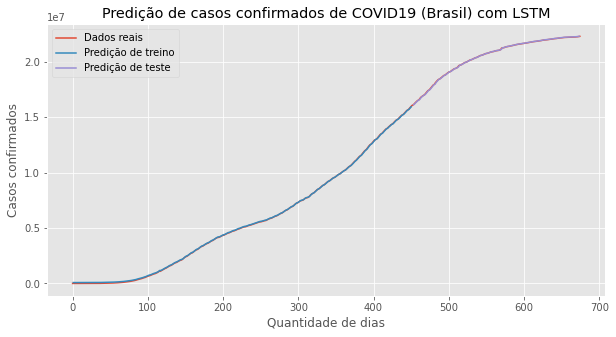

Train Score: 44602.69 RMSE
Test Score: 23830.84 RMSE
MAE: 17843.686393389453
Taxa de aprendizagem: 0.01
Dropout: 0.2
Número de células: 600

 LSTM - O segundo melhor - Brasil 



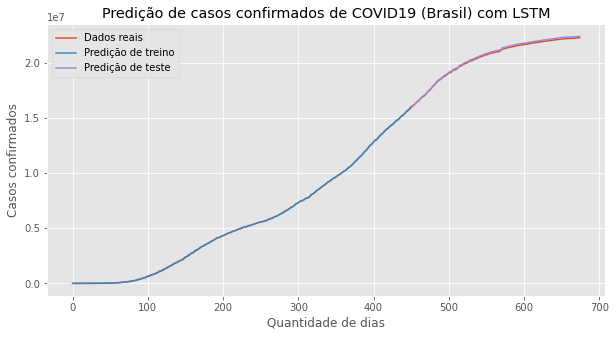

Train Score: 23033.80 RMSE
Test Score: 102213.13 RMSE
MAE: 95960.88430142654
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - Índia 



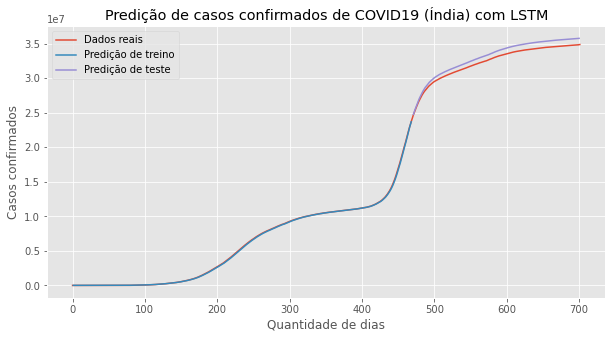

Train Score: 66939.00 RMSE
Test Score: 760494.16 RMSE
MAE: 736911.2054486972
Taxa de aprendizagem: 0.05
Dropout: 0.1
Número de células: 600

 LSTM - O segundo melhor - Índia 



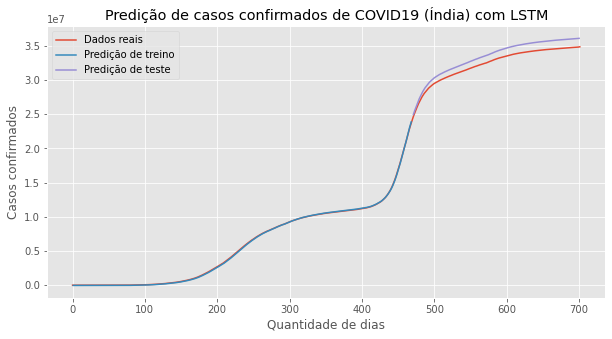

Train Score: 60366.27 RMSE
Test Score: 1067606.86 RMSE
MAE: 1045101.1358834796
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - Itália 



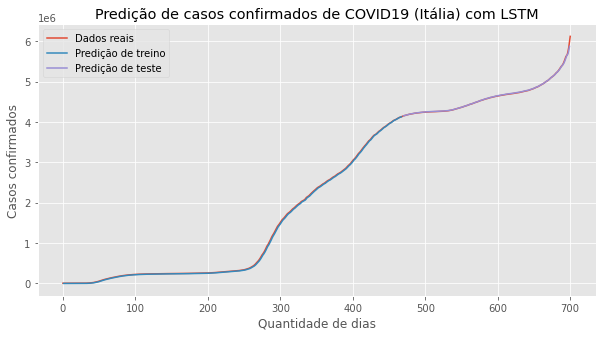

Train Score: 17692.07 RMSE
Test Score: 11410.78 RMSE
MAE: 5834.7039653328575
Taxa de aprendizagem: 0.05
Dropout: 0.2
Número de células: 200

 LSTM - O segundo melhor - Itália 



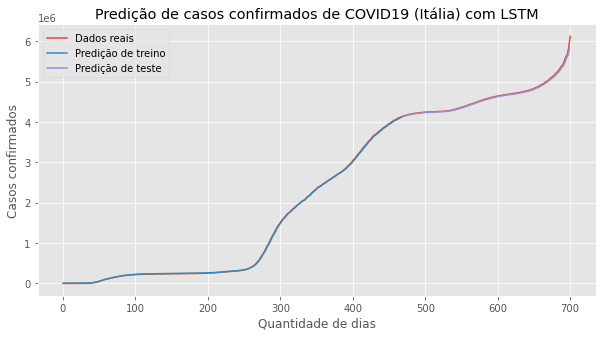

Train Score: 11932.32 RMSE
Test Score: 25759.95 RMSE
MAE: 19493.763187170192
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - EUA 



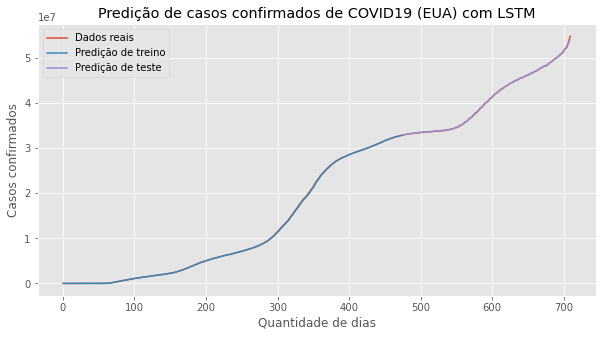

Train Score: 72493.72 RMSE
Test Score: 77062.79 RMSE
MAE: 55125.840108657154
Taxa de aprendizagem: 0.2
Dropout: 0.01
Número de células: 200

 LSTM - O segundo melhor - EUA 



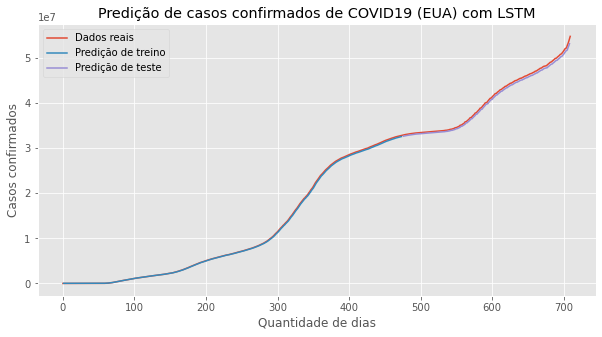

Train Score: 172146.43 RMSE
Test Score: 452614.64 RMSE
MAE: 425773.8432714026
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600





In [8]:
#Plotar gráficos com base nas previsões do modelo LSTM
for i in range(len(country)): #loop de repatição apra mostrar todos os países
    
    print('\n LSTM - O melhor caso - %s \n' %(country[i]))
    plt.figure(figsize=(10,5))
    plt.title('Predição de casos confirmados de COVID19 (%s) com LSTM' %(country[i]))
    plt.ylabel('Casos confirmados')
    plt.xlabel('Quantidade de dias')
    plt.plot(dts[country[i]], label = 'Dados reais')
    plt.plot(strpp[country[i]], label = 'Predição de treino')
    plt.plot(stspp[country[i]], label = 'Predição de teste')
    plt.legend()
    plt.show()
    print('Train Score: %.2f RMSE' % (strs[country[i]]))
    print('Test Score: %.2f RMSE' % (stss[country[i]]))
    print('MAE:', stsm[country[i]])
    print('Taxa de aprendizagem:', st_a[country[i]])
    print('Dropout:', sdropout[country[i]])
    print('Número de células:', sn_cel[country[i]])

    print('\n LSTM - O segundo melhor - %s \n' %(country[i]))
    plt.figure(figsize=(10,5))
    plt.title('Predição de casos confirmados de COVID19 (%s) com LSTM' %(country[i]))
    plt.ylabel('Casos confirmados')
    plt.xlabel('Quantidade de dias')
    plt.plot(dts[country[i]], label = 'Dados reais')
    plt.plot(trpp[country[i]], label = 'Predição de treino')
    plt.plot(tspp[country[i]], label = 'Predição de teste')
    plt.legend()
    plt.show()
    print('Train Score: %.2f RMSE' % (trs[country[i]]))
    print('Test Score: %.2f RMSE' % (tss[country[i]]))
    print('MAE:', tsm[country[i]])
    print('Taxa de aprendizagem:', t_a[country[i]])
    print('Dropout:', dropout[country[i]])
    print('Número de células:', n_cel[country[i]])
    print('\n\n')
    
    #Armazenando dados de treino e teste da predição
    if country[i] == 'Brasil':
        st = strpp[country[i]]
        ts = stspp[country[i]]
        numpy.savetxt('C:/Users/saulo/GitHub/COVID-19-time-series-predictions/outputs/test/out_lstm_casos_test_brazil.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/saulo/GitHub/COVID-19-time-series-predictions/outputs/train/out_lstm_casos_train_brazil.csv',ts,delimiter=',')
    if country[i] == 'Índia':
        st = strpp[country[i]]
        ts = stspp[country[i]]
        numpy.savetxt('C:/Users/saulo/GitHub/COVID-19-time-series-predictions/outputs/test/out_lstm_casos_test_india.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/saulo/GitHub/COVID-19-time-series-predictions/outputs/train/out_lstm_casos_train_india.csv',ts,delimiter=',')
    if country[i] == 'Itália':
        st = strpp[country[i]]
        ts = stspp[country[i]]
        numpy.savetxt('C:/Users/saulo/GitHub/COVID-19-time-series-predictions/outputs/test/out_lstm_casos_test_italia.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/saulo/GitHub/COVID-19-time-series-predictions/outputs/train/out_lstm_casos_train_italia.csv',ts,delimiter=',')
    if country[i] == 'EUA':
        st = strpp[country[i]]
        ts = stspp[country[i]]
        numpy.savetxt('C:/Users/saulo/GitHub/COVID-19-time-series-predictions/outputs/test/out_lstm_casos_test_eua.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/saulo/GitHub/COVID-19-time-series-predictions/outputs/train/out_lstm_casos_train_eua.csv',ts,delimiter=',')


 MLP - O melhor caso - Brasil 



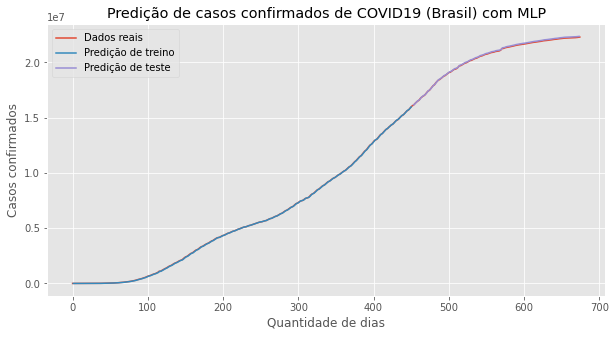

Train Score: 119117.22 RMSE
Test Score: 1133810.18 RMSE
MAE: 976387.2594436418
Taxa de aprendizagem: 0.1
Dropout: 0.01
Número de células por camada: 8

 MLP - O segundo melhor - Brasil 



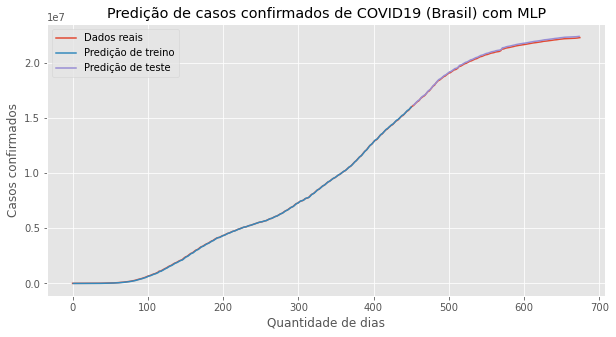

Train Score: 4783059.55 RMSE
Test Score: 15508947.67 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 15413471.022776598
Número de células por camada: 8




 MLP - O melhor caso - Índia 



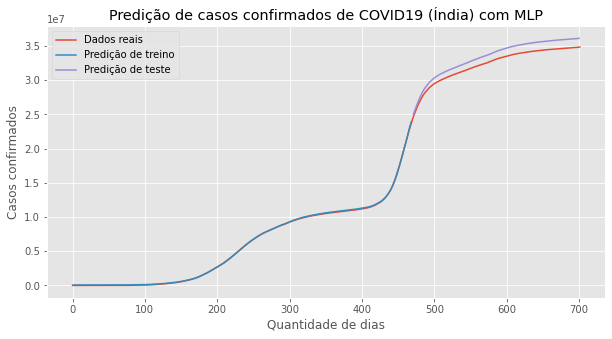

Train Score: 2255519.92 RMSE
Test Score: 2149499.49 RMSE
MAE: 1702360.1423773898
Taxa de aprendizagem: 0.05
Dropout: 0.2
Número de células por camada: 16

 MLP - O segundo melhor - Índia 



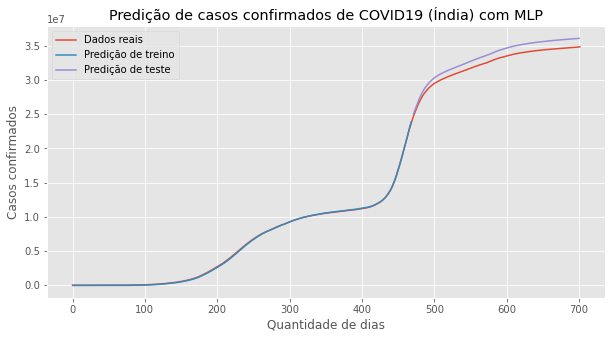

Train Score: 5665557.30 RMSE
Test Score: 26624101.74 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 26517306.277159996
Número de células por camada: 16




 MLP - O melhor caso - Itália 



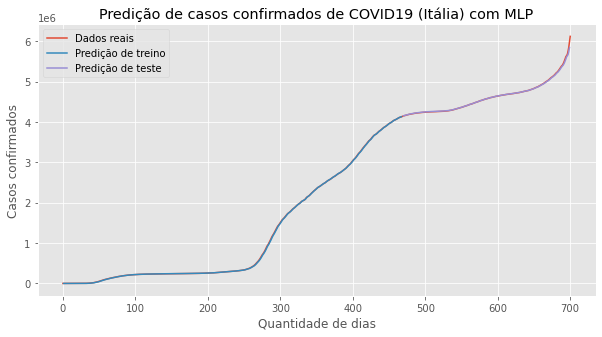

Train Score: 133404.15 RMSE
Test Score: 144614.31 RMSE
MAE: 102794.74547230467
Taxa de aprendizagem: 0.01
Dropout: 0.01
Número de células por camada: 32

 MLP - O segundo melhor - Itália 



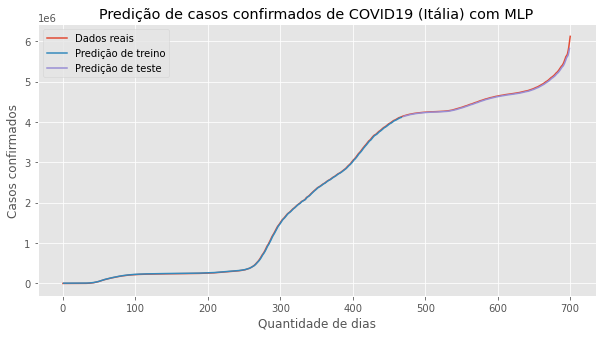

Train Score: 1353688.38 RMSE
Test Score: 3230038.44 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 3208087.340361083
Número de células por camada: 32




 MLP - O melhor caso - EUA 



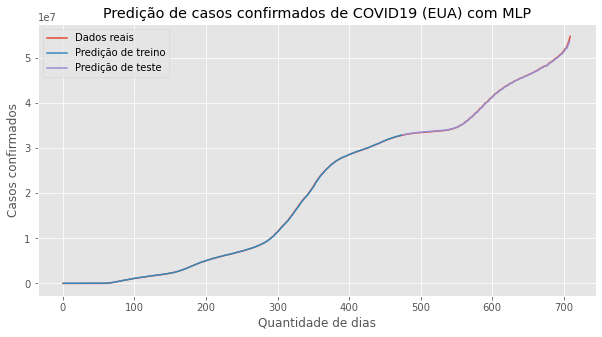

Train Score: 1312657.08 RMSE
Test Score: 3460108.12 RMSE
MAE: 2740665.820692172
Taxa de aprendizagem: 0.01
Dropout: 0.01
Número de células por camada: 64

 MLP - O segundo melhor - EUA 



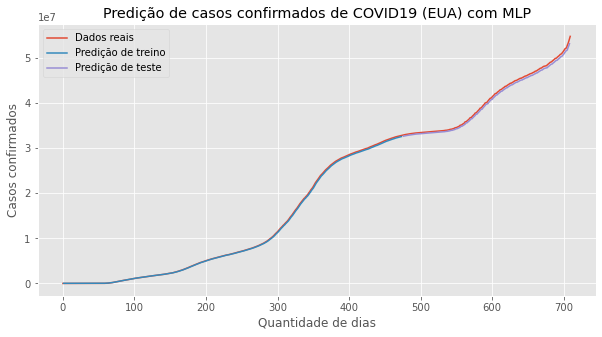

Train Score: 11488878.24 RMSE
Test Score: 30776709.38 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 30109221.156576123
Número de células por camada: 64





In [9]:
#Plotar gráficos com base nas previsões do modelo MLP
for i in range(len(country)):
    print('\n MLP - O melhor caso - %s \n' %(country[i]))
    plt.figure(figsize=(10,5))
    plt.title('Predição de casos confirmados de COVID19 (%s) com MLP' %(country[i]))
    plt.ylabel('Casos confirmados')
    plt.xlabel('Quantidade de dias')
    plt.plot(dts[country[i]], label = 'Dados reais')
    plt.plot(strppMLP[country[i]], label = 'Predição de treino')
    plt.plot(stsppMLP[country[i]], label = 'Predição de teste')
    plt.legend()
    plt.show()
    print('Train Score: %.2f RMSE' % (strsMLP[country[i]]))
    print('Test Score: %.2f RMSE' % (stssMLP[country[i]]))
    print('MAE:', stsmMLP[country[i]])
    print('Taxa de aprendizagem:', st_aMLP[country[i]])
    print('Dropout:', sdropoutMLP[country[i]])
    print('Número de células por camada:',sn_neu[country[i]])


    print('\n MLP - O segundo melhor - %s \n' %(country[i]))
    plt.figure(figsize=(10,5))
    plt.title('Predição de casos confirmados de COVID19 (%s) com MLP' %(country[i]))
    plt.ylabel('Casos confirmados')
    plt.xlabel('Quantidade de dias')
    plt.plot(dts[country[i]], label = 'Dados reais')
    plt.plot(trppMLP[country[i]], label = 'Predição de treino')
    plt.plot(tsppMLP[country[i]], label = 'Predição de teste')
    plt.legend()
    plt.show()
    print('Train Score: %.2f RMSE' % (trsMLP[country[i]]))
    print('Test Score: %.2f RMSE' % (tssMLP[country[i]]))
    print('Taxa de aprendizagem:', t_aMLP[country[i]])
    print('Dropout:', dropoutMLP[country[i]])
    print('MAE:', tsmMLP[country[i]])
    print('Número de células por camada:',n_neu[country[i]])
 
    print('\n\n')
        
    if country[i] == 'Brasil':
        st = strppMLP[country[i]]
        ts = stsppMLP[country[i]]
        numpy.savetxt('C:/Users/saulo/GitHub/COVID-19-time-series-predictions/outputs/test/out_mlp_casos_test_brazil.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/saulo/GitHub/COVID-19-time-series-predictions/outputs/train/out_mlp_casos_train_brazil.csv',ts,delimiter=',')
    if country[i] == 'Índia':
        st = strppMLP[country[i]]
        ts = stsppMLP[country[i]]
        numpy.savetxt('C:/Users/saulo/GitHub/COVID-19-time-series-predictions/outputs/test/out_mlp_casos_test_india.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/saulo/GitHub/COVID-19-time-series-predictions/outputs/train/out_mlp_casos_train_india.csv',ts,delimiter=',')
    if country[i] == 'Itália':
        st = strppMLP[country[i]]
        ts = stsppMLP[country[i]]
        numpy.savetxt('C:/Users/saulo/GitHub/COVID-19-time-series-predictions/outputs/test/out_mlp_casos_test_italia.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/saulo/GitHub/COVID-19-time-series-predictions/outputs/train/out_mlp_casos_train_italia.csv',ts,delimiter=',')
    if country[i] == 'EUA':
        st = strppMLP[country[i]]
        ts = stsppMLP[country[i]]
        numpy.savetxt('C:/Users/saulo/GitHub/COVID-19-time-series-predictions/outputs/test/out_mlp_casos_test_eua.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/saulo/GitHub/COVID-19-time-series-predictions/outputs/train/out_mlp_casos_train_eua.csv',ts,delimiter=',')

# Implementação do modelo Exponential Smoothing

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_

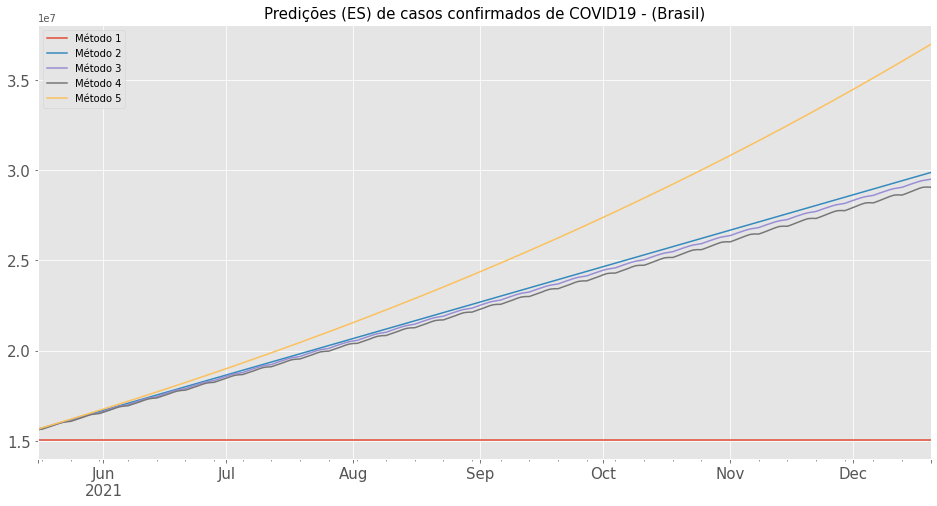

*************Métricas do Algoritmo de Suavização Simples*************
                                                                                                                                                                                                                                                              
Erro médio absoluto do Algoritmo de Suavização Simples : 5126008.223
Raiz do erro médio quadrado do Algoritmo de Suavização Simples : 5460880.11
                                                                                                                                                                                                                                                              
*************Métricas do Algoritmo de Suavização de Holt*************
                                                                                                                                                                                                             

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_

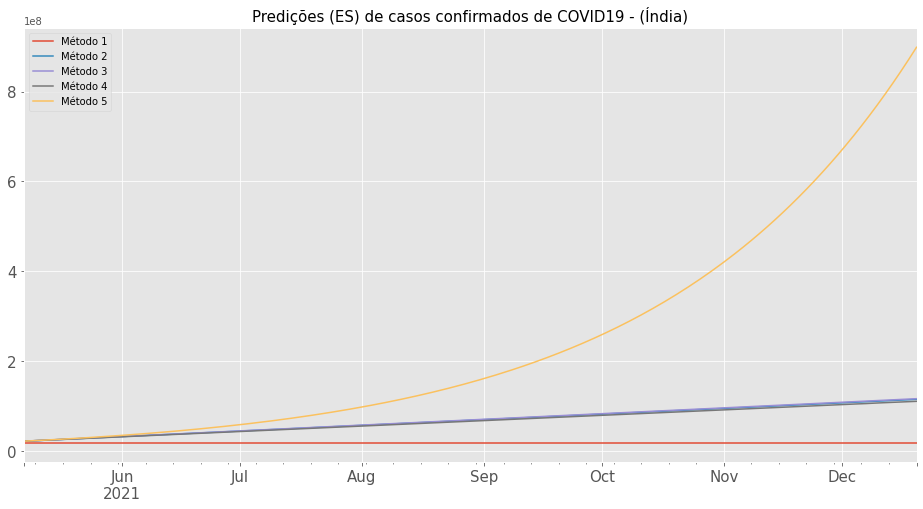

*************Métricas do Algoritmo de Suavização Simples*************
                                                                                                                                                                                                                                                              
Erro médio absoluto do Algoritmo de Suavização Simples : 13215705.866
Raiz do erro médio quadrado do Algoritmo de Suavização Simples : 13523790.071
                                                                                                                                                                                                                                                              
*************Métricas do Algoritmo de Suavização de Holt*************
                                                                                                                                                                                                          

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_

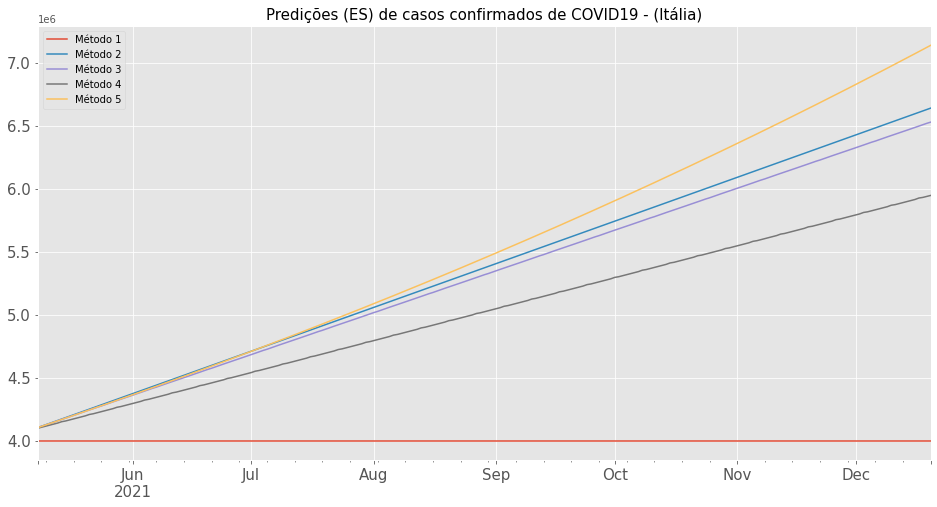

*************Métricas do Algoritmo de Suavização Simples*************
                                                                                                                                                                                                                                                              
Erro médio absoluto do Algoritmo de Suavização Simples : 553714.991
Raiz do erro médio quadrado do Algoritmo de Suavização Simples : 636222.201
                                                                                                                                                                                                                                                              
*************Métricas do Algoritmo de Suavização de Holt*************
                                                                                                                                                                                                              

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_

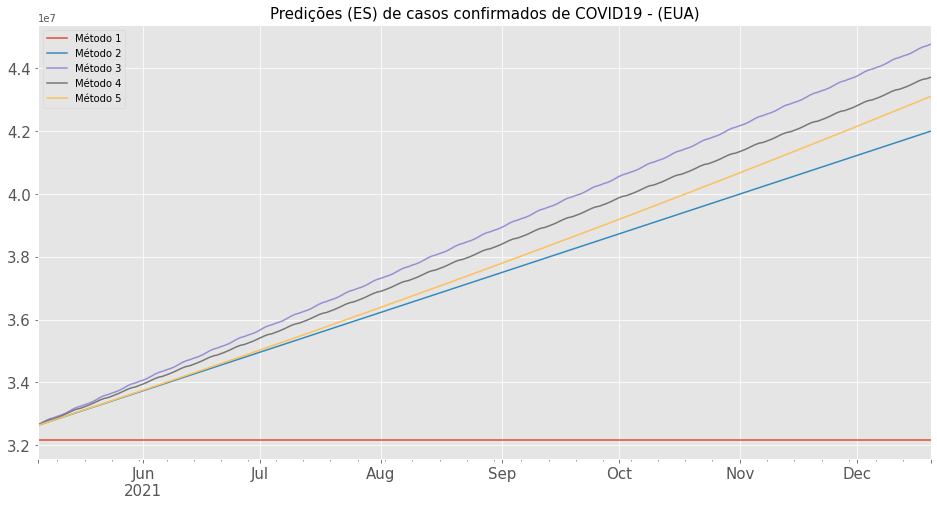

*************Métricas do Algoritmo de Suavização Simples*************
                                                                                                                                                                                                                                                              
Erro médio absoluto do Algoritmo de Suavização Simples : 7681286.135
Raiz do erro médio quadrado do Algoritmo de Suavização Simples : 9761313.101
                                                                                                                                                                                                                                                              
*************Métricas do Algoritmo de Suavização de Holt*************
                                                                                                                                                                                                            

In [10]:
country = ['Brasil', 'Índia', 'Itália', 'EUA'] #Lista de países
for i in range(len(country)):
    if country[i] == "Brasil":
        dataframe = read_csv("datasets/countries/casos_covid19_brazil_date.csv",encoding='utf-8',index_col='date')

    if country[i] == "Índia":
        dataframe = read_csv("datasets/countries/casos_covid19_india_date.csv",encoding='utf-8',index_col='date')
        
    if country[i] == "Itália":
        dataframe = read_csv("datasets/countries/casos_covid19_italy_date.csv",encoding='utf-8',index_col='date')

    if country[i] == "EUA":
        dataframe = read_csv("datasets/countries/casos_covid19_us_date.csv",encoding='utf-8',index_col='date')
    total = len(dataframe)
    t = int(total*0.33)
    treino=dataframe.iloc[:-t]
    teste=dataframe.iloc[-t:]
    #Implementando modelos
    model1=SimpleExpSmoothing(treino).fit(smoothing_level=0.111,optimized=True)
    modelo1=model1.forecast(len(teste))
    model2=Holt(treino).fit(smoothing_level=0.7187)
    modelo2=model2.forecast(len(teste))
    model3=ExponentialSmoothing(treino,trend='add',seasonal='add').fit()
    modelo3=model3.forecast(len(teste))
    model4=ExponentialSmoothing(treino,trend='add',seasonal='mul').fit()
    modelo4=model4.forecast(len(teste))
    model5=ExponentialSmoothing(treino,trend='mul',seasonal='add').fit()
    modelo5=model5.forecast(len(teste))
    #plt.plot(teste)
    plt.figure(figsize=(16,8))
    modelo1.plot(figsize=(16,8))
    modelo2.plot()
    modelo3.plot()
    modelo4.plot()
    modelo5.plot()
    plt.title("Predições (ES) de casos confirmados de COVID19 - (%s)" %(country[i]), size=15)
    plt.xticks(size=15)
    plt.yticks(size=15)
    lista=['Método 1','Método 2','Método 3','Método 4','Método 5']
    plt.legend(lista)
    plt.show()
    print('*************Métricas do Algoritmo de Suavização Simples*************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Simples :',round(mean_absolute_error(teste,modelo1),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização Simples :',round(mean_squared_error(teste,modelo1)**0.5,3))


    print(' '*254)
    print('*************Métricas do Algoritmo de Suavização de Holt*************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Holt:',round(mean_absolute_error(teste,modelo2),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização',round(mean_squared_error(teste,modelo2)**0.5,3))

    print(' '*254)
    print('*************Métricas do Algoritmo de Suavização de Holt-Winters aditivo*************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Holt-Winters aditivo :', round(mean_absolute_error(teste,modelo3),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização Holt-Winters aditivo :',round(mean_squared_error(teste,modelo3)**0.5,3))

    print(' '*254)
    print('*************Métricas do Algoritmo de Suavização de Holt-Winters multiplicativo*************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Holt-Winters multiplicativo :',round(mean_absolute_error(teste,modelo4),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização Holt-Winters multiplicativo :',round(mean_squared_error(teste,modelo4)**0.5,3))

    print(' '*254)
    print('*************Métricas do Algoritmo de Suavização de Pegels aditivo *************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Pegels aditivo :',round(mean_absolute_error(teste,modelo5),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização Pegels aditivo :',round(mean_squared_error(teste,modelo5)**0.5,3))

    print(' '*254)

# Modelo ARIMA

In [11]:
#Dicionários
p = [1,2,3,4,5]
d = [1,2,3,4,5]
q = [1,1,3,1,5]
sp = {}
sd = {}
sq = {}
sps = {}
sds = {}
sqs = {}
pred = {}
preds = {}
out = {}
rmses = {}
maes = {}
maess = {}
rmsess = {'Brasil':(9**15), 'Índia':(9**15), 'EUA':(9**15),'Itália':(9**15)} #Dicionário de scores de testes
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)
country = ['Brasil', 'Índia', 'Itália', 'EUA'] #Lista de países
# load dataset
for i in range(len(country)):
    for z in range(len(p)):
        if country[i] == 'Brasil':
            series = read_csv('datasets/countries/casos_covid19_brazil.csv', usecols=[1], engine='python')
        if country[i] == 'Índia':
            series = read_csv('datasets/countries/casos_covid19_india.csv', usecols=[1], engine='python')
        if country[i] == 'Itália':
            series = read_csv('datasets/countries/casos_covid19_italy.csv', usecols=[1], engine='python')
        if country[i] == 'EUA':
            series = read_csv('datasets/countries/casos_covid19_us.csv', usecols=[1], engine='python')
        # split into train and test sets
        X = series.values
        size = int(len(X) * 0.66)
        train, test = X[0:size], X[size:len(X)]
        history = [x for x in train]
        predictions = list()
        # walk-forward validation
        for t in range(len(test)):
            model = ARIMA(history, order=(p[z],d[z],q[z]))
            model_fit = model.fit()
            output = model_fit.forecast()
            yhat = output[0]
            predictions.append(yhat)
            obs = test[t]
            history.append(obs)
            #print('predicted=%f, expected=%f' % (yhat, obs))
            # evaluate forecasts
        mae = mean_absolute_error(test, predictions)
        rmse = math.sqrt(mean_squared_error(test, predictions))
        maes[country[i]] = mae
        rmses[country[i]] = rmse
        pred[country[i]] = predictions
        out[country[i]] = test
        sp[country[i]] = p[z]
        sd[country[i]] = d[z]
        sq[country[i]] = q[z]
        if rmses[country[i]] < rmsess[country[i]]:
            sps[country[i]] = p[z]
            sds[country[i]] = d[z]
            sqs[country[i]] = q[z]
            maess[country[i]] = mae
            rmsess[country[i]] = rmse
            preds[country[i]] = predictions

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\ProgramData\Anaconda3\lib\s


ARIMA - O melhor caso - Brasil



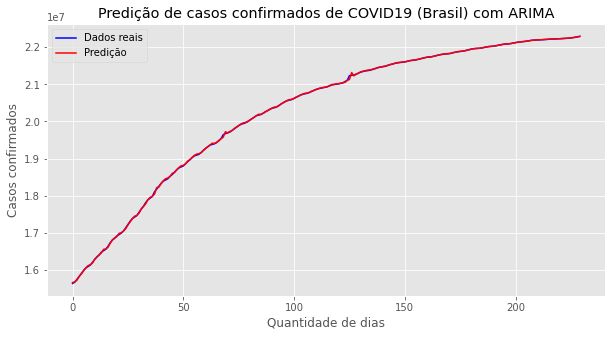

Test RMSE: 14968.106


Test MAE: 8483.138


p: 2 d: 2 q: 1

ARIMA - O segundo melhor caso - Brasil



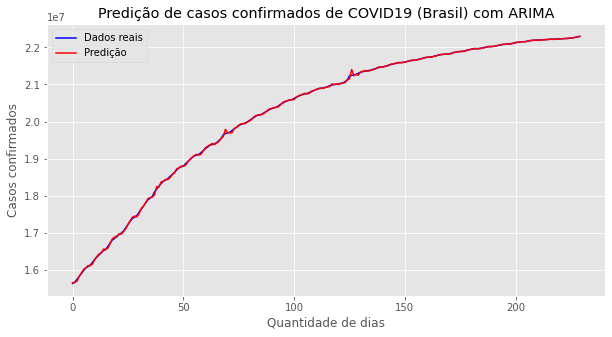

Test RMSE: 22634.705


Test MAE: 13428.324


p: 5 d: 5 q: 5

ARIMA - O melhor caso - Índia



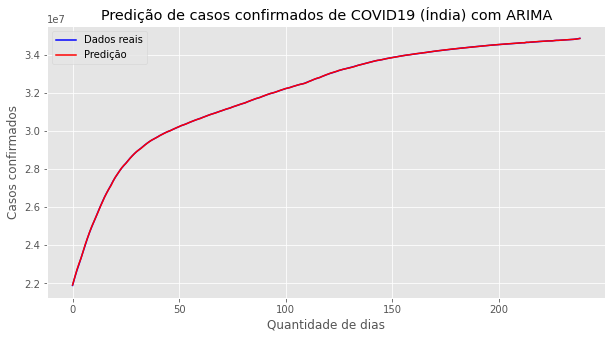

Test RMSE: 7306.964


Test MAE: 4441.038


p: 3 d: 3 q: 3

ARIMA - O segundo melhor caso - Índia



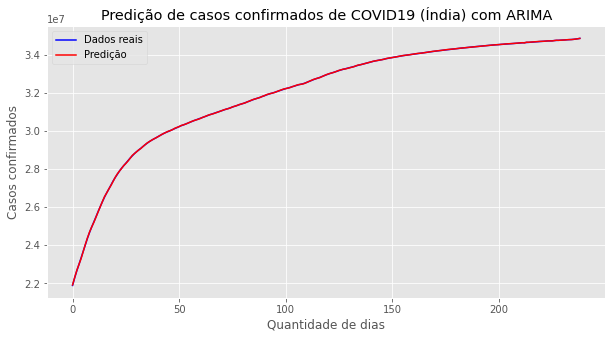

Test RMSE: 7850.636


Test MAE: 5105.633


p: 5 d: 5 q: 5

ARIMA - O melhor caso - Itália



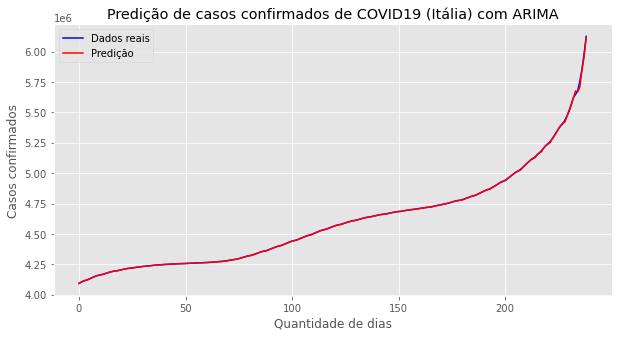

Test RMSE: 4681.000


Test MAE: 1678.565


p: 1 d: 1 q: 1

ARIMA - O segundo melhor caso - Itália



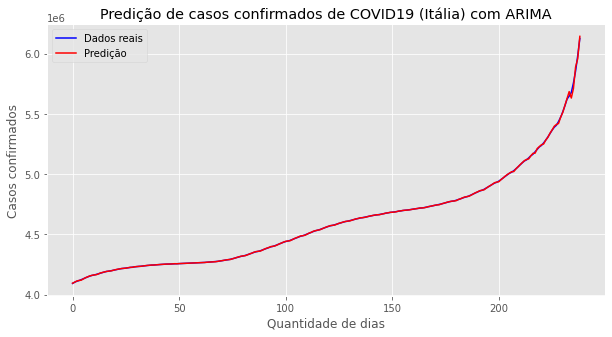

Test RMSE: 6080.921


Test MAE: 2074.484


p: 5 d: 5 q: 5

ARIMA - O melhor caso - EUA



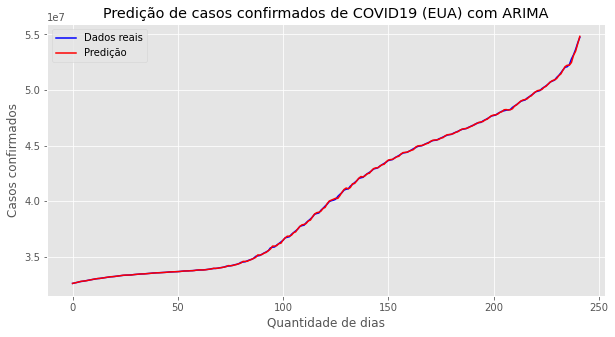

Test RMSE: 51899.972


Test MAE: 34599.652


p: 3 d: 3 q: 3

ARIMA - O segundo melhor caso - EUA



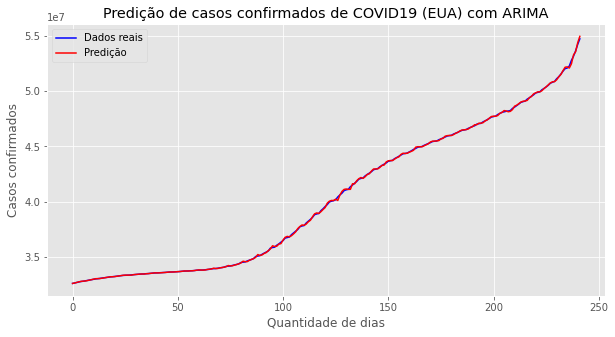

Test RMSE: 63531.659


Test MAE: 41216.880


p: 5 d: 5 q: 5


In [12]:
for i in range(len(country)):
    print("\nARIMA - O melhor caso - %s\n" %(country[i]))
    plt.figure(figsize=(10,5))
    plt.title('Predição de casos confirmados de COVID19 (%s) com ARIMA' %(country[i]))
    plt.ylabel('Casos confirmados')
    plt.xlabel('Quantidade de dias')
    plt.plot(out[country[i]], label = 'Dados reais', color = 'blue')
    plt.plot(preds[country[i]], label = 'Predição', color='red')
    plt.legend()
    plt.show()
    print('Test RMSE: %.3f\n\n' % rmsess[country[i]])
    print('Test MAE: %.3f\n\n' % maess[country[i]])
    print("p:", sps[country[i]],"d:",sds[country[i]],"q:",sqs[country[i]])
    
    print("\nARIMA - O segundo melhor caso - %s\n" %(country[i]))
    plt.figure(figsize=(10,5))
    plt.title('Predição de casos confirmados de COVID19 (%s) com ARIMA' %(country[i]))
    plt.ylabel('Casos confirmados')
    plt.xlabel('Quantidade de dias')
    plt.plot(out[country[i]], label = 'Dados reais',color='blue')
    plt.plot(pred[country[i]], label = 'Predição', color='red')
    plt.legend()
    plt.show()
    print('Test RMSE: %.3f\n\n' % rmses[country[i]])
    print('Test MAE: %.3f\n\n' % maes[country[i]])
    print("p:", sp[country[i]],"d:",sd[country[i]],"q:",sq[country[i]])


    #Armazenando predições
    if country[i] == 'Brasil':
        st = preds[country[i]]
        numpy.savetxt('C:/Users/saulo/GitHub/COVID-19-time-series-predictions/outputs/test/out_arima_casos_test_brazil.csv',st,delimiter=',')
        
    if country[i] == 'Índia':
        st = preds[country[i]]
        numpy.savetxt('C:/Users/saulo/GitHub/COVID-19-time-series-predictions/outputs/test/out_arima_casos_test_india.csv',st,delimiter=',')
            
    if country[i] == 'Itália':
        st = preds[country[i]]
        numpy.savetxt('C:/Users/saulo/GitHub/COVID-19-time-series-predictions/outputs/test/out_arima_casos_test_italia.csv',st,delimiter=',')
           
    if country[i] == 'EUA':
        st = preds[country[i]]
        numpy.savetxt('C:/Users/saulo/GitHub/COVID-19-time-series-predictions/outputs/test/out_mlp_casos_test_eua.csv',st,delimiter=',')
            